In [1]:
import keras
from keras.datasets import mnist
from keras import backend as K
import pandas as pd
import numpy as np
from keras.models import load_model
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing

Using TensorFlow backend.


In [2]:
sns.set_theme(style="whitegrid")

# Práctica Redes Neuronales II

Primero vamos a usar redes para aprender una función simple: una parábola.

Vamos a usar solo 100 puntos y dividirlos en training y validation

Text(0, 0.5, 'Y')

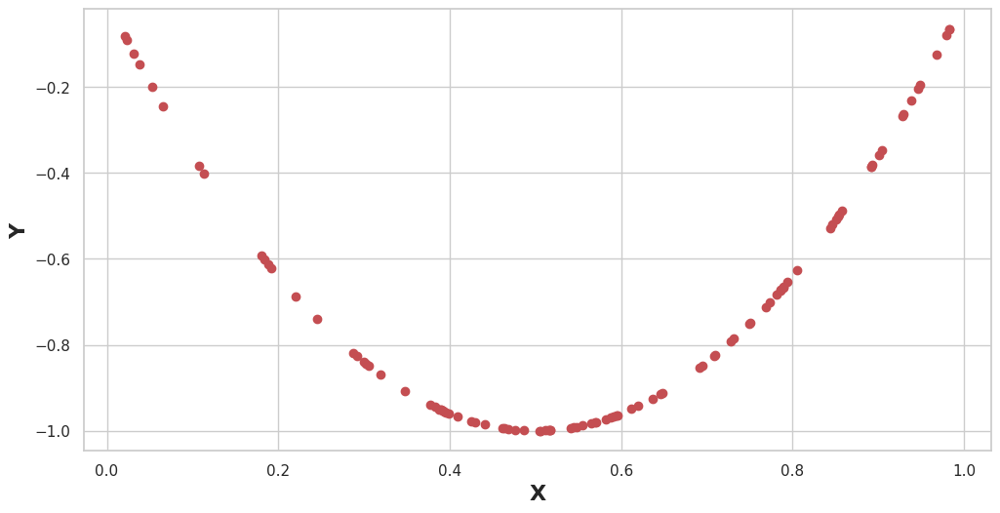

In [3]:
# Genero los puntos
x = np.random.uniform(0, 1, 100)
y = [4 * i * (i - 1) for i in x]

# ploteo
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(x, y, 'or')
plt.xlabel('X', weight="bold", fontsize=16)
plt.ylabel('Y', weight="bold", fontsize=16)

Divido en training y validation set usando train_test_split de sklearn usando 1/3 de puntos como validation

In [4]:
from sklearn.model_selection import train_test_split

In [5]:
X_train, X_validation, y_train, y_validation = train_test_split(
    x, y, test_size=0.33, random_state=42
)

Usamos [Sequential](https://keras.io/api/models/sequential/) de keras para definir un modelo tipo stack de capas: vamos a usar ahora solo capas tipo [Dense](https://keras.io/api/layers/core_layers/dense/)

In [6]:
from keras.models import Sequential
from keras.layers import Dense, Dropout

Usamos para regresiones como activación de la última capa un función de tipo lineal

In [7]:
model = Sequential()
model.add(Dense(3, input_dim=1, activation='tanh'))
model.add(Dense(1, activation='linear'))

Luego de definir todas las capas tenemos que compilar el modelo para definir la función de pérdida, el optimizador y la métrica. Esto es necesario para poder después entrenar el modelo.

In [8]:
model.compile(
    loss='mean_squared_error', optimizer="SGD", metrics=['mean_squared_error']
)

Vamos a guardar el [.fit ](https://keras.io/api/models/model_training_apis/) del modelo en una variable para después plotear el aprendizaje. Podemos pasar como parámetros el set de validación para ir evaluando en cada paso del entrenamiento, además de evaluar el de entrenamiento. Podemos cambiar la cantidad de información que nos muestra con verbose y además tenemos que decirle la cantidad de épocas que queremos entrenar.

In [9]:
history = model.fit(
    np.array(X_train),
    np.array(y_train),
    epochs=200,
    verbose=2,
    validation_data=(X_validation, np.array(y_validation)),
)

Train on 67 samples, validate on 33 samples
Epoch 1/200
 - 0s - loss: 0.4697 - mean_squared_error: 0.4697 - val_loss: 0.3934 - val_mean_squared_error: 0.3934


Epoch 2/200
 - 0s - loss: 0.3423 - mean_squared_error: 0.3423 - val_loss: 0.2901 - val_mean_squared_error: 0.2901


Epoch 3/200
 - 0s - loss: 0.2582 - mean_squared_error: 0.2582 - val_loss: 0.2427 - val_mean_squared_error: 0.2427


Epoch 4/200
 - 0s - loss: 0.2198 - mean_squared_error: 0.2198 - val_loss: 0.2004 - val_mean_squared_error: 0.2004


Epoch 5/200
 - 0s - loss: 0.1866 - mean_squared_error: 0.1866 - val_loss: 0.1637 - val_mean_squared_error: 0.1637


Epoch 6/200
 - 0s - loss: 0.1577 - mean_squared_error: 0.1577 - val_loss: 0.1367 - val_mean_squared_error: 0.1367


Epoch 7/200
 - 0s - loss: 0.1377 - mean_squared_error: 0.1377 - val_loss: 0.1173 - val_mean_squared_error: 0.1173


Epoch 8/200
 - 0s - loss: 0.1241 - mean_squared_error: 0.1241 - val_loss: 0.1086 - val_mean_squared_error: 0.1086


Epoch 9/200
 - 0s - loss: 0.1180 - mean_squared_error: 0.1180 - val_loss: 0.1048 - val_mean_squared_error: 0.1048


Epoch 10/200
 - 0s - loss: 0.1151 - mean_squared_error: 0.1151 - val_loss: 0.1007 - val_mean_squared_error: 0.1007


Epoch 11/200
 - 0s - loss: 0.1125 - mean_squared_error: 0.1125 - val_loss: 0.0936 - val_mean_squared_error: 0.0936


Epoch 12/200
 - 0s - loss: 0.1079 - mean_squared_error: 0.1079 - val_loss: 0.0893 - val_mean_squared_error: 0.0893


Epoch 13/200
 - 0s - loss: 0.1051 - mean_squared_error: 0.1051 - val_loss: 0.0856 - val_mean_squared_error: 0.0856


Epoch 14/200
 - 0s - loss: 0.1030 - mean_squared_error: 0.1030 - val_loss: 0.0843 - val_mean_squared_error: 0.0843


Epoch 15/200
 - 0s - loss: 0.1019 - mean_squared_error: 0.1019 - val_loss: 0.0815 - val_mean_squared_error: 0.0815


Epoch 16/200
 - 0s - loss: 0.1006 - mean_squared_error: 0.1006 - val_loss: 0.0800 - val_mean_squared_error: 0.0800


Epoch 17/200
 - 0s - loss: 0.0992 - mean_squared_error: 0.0992 - val_loss: 0.0764 - val_mean_squared_error: 0.0764


Epoch 18/200


 - 0s - loss: 0.0975 - mean_squared_error: 0.0975 - val_loss: 0.0764 - val_mean_squared_error: 0.0764


Epoch 19/200
 - 0s - loss: 0.0970 - mean_squared_error: 0.0970 - val_loss: 0.0737 - val_mean_squared_error: 0.0737


Epoch 20/200
 - 0s - loss: 0.0962 - mean_squared_error: 0.0962 - val_loss: 0.0723 - val_mean_squared_error: 0.0723


Epoch 21/200
 - 0s - loss: 0.0959 - mean_squared_error: 0.0959 - val_loss: 0.0734 - val_mean_squared_error: 0.0734


Epoch 22/200
 - 0s - loss: 0.0960 - mean_squared_error: 0.0960 - val_loss: 0.0730 - val_mean_squared_error: 0.0730


Epoch 23/200
 - 0s - loss: 0.0956 - mean_squared_error: 0.0956 - val_loss: 0.0722 - val_mean_squared_error: 0.0722


Epoch 24/200
 - 0s - loss: 0.0954 - mean_squared_error: 0.0954 - val_loss: 0.0712 - val_mean_squared_error: 0.0712


Epoch 25/200
 - 0s - loss: 0.0954 - mean_squared_error: 0.0954 - val_loss: 0.0720 - val_mean_squared_error: 0.0720


Epoch 26/200
 - 0s - loss: 0.0949 - mean_squared_error: 0.0949 - val_loss: 0.0711 - val_mean_squared_error: 0.0711


Epoch 27/200
 - 0s - loss: 0.0950 - mean_squared_error: 0.0950 - val_loss: 0.0717 - val_mean_squared_error: 0.0717


Epoch 28/200
 - 0s - loss: 0.0945 - mean_squared_error: 0.0945 - val_loss: 0.0709 - val_mean_squared_error: 0.0709


Epoch 29/200
 - 0s - loss: 0.0946 - mean_squared_error: 0.0946 - val_loss: 0.0719 - val_mean_squared_error: 0.0719


Epoch 30/200
 - 0s - loss: 0.0939 - mean_squared_error: 0.0939 - val_loss: 0.0724 - val_mean_squared_error: 0.0724


Epoch 31/200


 - 0s - loss: 0.0936 - mean_squared_error: 0.0936 - val_loss: 0.0734 - val_mean_squared_error: 0.0734


Epoch 32/200


 - 0s - loss: 0.0935 - mean_squared_error: 0.0935 - val_loss: 0.0730 - val_mean_squared_error: 0.0730


Epoch 33/200


 - 0s - loss: 0.0931 - mean_squared_error: 0.0931 - val_loss: 0.0740 - val_mean_squared_error: 0.0740


Epoch 34/200


 - 0s - loss: 0.0927 - mean_squared_error: 0.0927 - val_loss: 0.0747 - val_mean_squared_error: 0.0747


Epoch 35/200


 - 0s - loss: 0.0923 - mean_squared_error: 0.0923 - val_loss: 0.0732 - val_mean_squared_error: 0.0732


Epoch 36/200


 - 0s - loss: 0.0923 - mean_squared_error: 0.0923 - val_loss: 0.0740 - val_mean_squared_error: 0.0740


Epoch 37/200
 - 0s - loss: 0.0920 - mean_squared_error: 0.0920 - val_loss: 0.0762 - val_mean_squared_error: 0.0762


Epoch 38/200


 - 0s - loss: 0.0916 - mean_squared_error: 0.0916 - val_loss: 0.0763 - val_mean_squared_error: 0.0763


Epoch 39/200


 - 0s - loss: 0.0914 - mean_squared_error: 0.0914 - val_loss: 0.0755 - val_mean_squared_error: 0.0755


Epoch 40/200


 - 0s - loss: 0.0912 - mean_squared_error: 0.0912 - val_loss: 0.0756 - val_mean_squared_error: 0.0756


Epoch 41/200


 - 0s - loss: 0.0909 - mean_squared_error: 0.0909 - val_loss: 0.0755 - val_mean_squared_error: 0.0755


Epoch 42/200


 - 0s - loss: 0.0908 - mean_squared_error: 0.0908 - val_loss: 0.0770 - val_mean_squared_error: 0.0770


Epoch 43/200


 - 0s - loss: 0.0906 - mean_squared_error: 0.0906 - val_loss: 0.0753 - val_mean_squared_error: 0.0753


Epoch 44/200


 - 0s - loss: 0.0902 - mean_squared_error: 0.0902 - val_loss: 0.0740 - val_mean_squared_error: 0.0740


Epoch 45/200


 - 0s - loss: 0.0902 - mean_squared_error: 0.0902 - val_loss: 0.0735 - val_mean_squared_error: 0.0735


Epoch 46/200


 - 0s - loss: 0.0904 - mean_squared_error: 0.0904 - val_loss: 0.0742 - val_mean_squared_error: 0.0742


Epoch 47/200


 - 0s - loss: 0.0900 - mean_squared_error: 0.0900 - val_loss: 0.0738 - val_mean_squared_error: 0.0738


Epoch 48/200
 - 0s - loss: 0.0899 - mean_squared_error: 0.0899 - val_loss: 0.0739 - val_mean_squared_error: 0.0739


Epoch 49/200


 - 0s - loss: 0.0897 - mean_squared_error: 0.0897 - val_loss: 0.0746 - val_mean_squared_error: 0.0746


Epoch 50/200


 - 0s - loss: 0.0896 - mean_squared_error: 0.0896 - val_loss: 0.0759 - val_mean_squared_error: 0.0759


Epoch 51/200


 - 0s - loss: 0.0890 - mean_squared_error: 0.0890 - val_loss: 0.0754 - val_mean_squared_error: 0.0754


Epoch 52/200


 - 0s - loss: 0.0888 - mean_squared_error: 0.0888 - val_loss: 0.0766 - val_mean_squared_error: 0.0766


Epoch 53/200
 - 0s - loss: 0.0886 - mean_squared_error: 0.0886 - val_loss: 0.0767 - val_mean_squared_error: 0.0767


Epoch 54/200


 - 0s - loss: 0.0886 - mean_squared_error: 0.0886 - val_loss: 0.0758 - val_mean_squared_error: 0.0758


Epoch 55/200


 - 0s - loss: 0.0885 - mean_squared_error: 0.0885 - val_loss: 0.0773 - val_mean_squared_error: 0.0773


Epoch 56/200


 - 0s - loss: 0.0882 - mean_squared_error: 0.0882 - val_loss: 0.0782 - val_mean_squared_error: 0.0782


Epoch 57/200


 - 0s - loss: 0.0879 - mean_squared_error: 0.0879 - val_loss: 0.0776 - val_mean_squared_error: 0.0776


Epoch 58/200


 - 0s - loss: 0.0878 - mean_squared_error: 0.0878 - val_loss: 0.0771 - val_mean_squared_error: 0.0771


Epoch 59/200


 - 0s - loss: 0.0876 - mean_squared_error: 0.0876 - val_loss: 0.0786 - val_mean_squared_error: 0.0786


Epoch 60/200


 - 0s - loss: 0.0874 - mean_squared_error: 0.0874 - val_loss: 0.0780 - val_mean_squared_error: 0.0780


Epoch 61/200


 - 0s - loss: 0.0871 - mean_squared_error: 0.0871 - val_loss: 0.0773 - val_mean_squared_error: 0.0773


Epoch 62/200


 - 0s - loss: 0.0870 - mean_squared_error: 0.0870 - val_loss: 0.0790 - val_mean_squared_error: 0.0790


Epoch 63/200


 - 0s - loss: 0.0870 - mean_squared_error: 0.0870 - val_loss: 0.0788 - val_mean_squared_error: 0.0788


Epoch 64/200


 - 0s - loss: 0.0868 - mean_squared_error: 0.0868 - val_loss: 0.0776 - val_mean_squared_error: 0.0776


Epoch 65/200
 - 0s - loss: 0.0865 - mean_squared_error: 0.0865 - val_loss: 0.0774 - val_mean_squared_error: 0.0774


Epoch 66/200


 - 0s - loss: 0.0865 - mean_squared_error: 0.0865 - val_loss: 0.0775 - val_mean_squared_error: 0.0775


Epoch 67/200


 - 0s - loss: 0.0864 - mean_squared_error: 0.0864 - val_loss: 0.0765 - val_mean_squared_error: 0.0765


Epoch 68/200


 - 0s - loss: 0.0864 - mean_squared_error: 0.0864 - val_loss: 0.0772 - val_mean_squared_error: 0.0772


Epoch 69/200


 - 0s - loss: 0.0860 - mean_squared_error: 0.0860 - val_loss: 0.0777 - val_mean_squared_error: 0.0777


Epoch 70/200


 - 0s - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0777 - val_mean_squared_error: 0.0777


Epoch 71/200


 - 0s - loss: 0.0856 - mean_squared_error: 0.0856 - val_loss: 0.0784 - val_mean_squared_error: 0.0784


Epoch 72/200


 - 0s - loss: 0.0853 - mean_squared_error: 0.0853 - val_loss: 0.0779 - val_mean_squared_error: 0.0779


Epoch 73/200


 - 0s - loss: 0.0857 - mean_squared_error: 0.0857 - val_loss: 0.0808 - val_mean_squared_error: 0.0808


Epoch 74/200


 - 0s - loss: 0.0851 - mean_squared_error: 0.0851 - val_loss: 0.0809 - val_mean_squared_error: 0.0809


Epoch 75/200


 - 0s - loss: 0.0848 - mean_squared_error: 0.0848 - val_loss: 0.0804 - val_mean_squared_error: 0.0804


Epoch 76/200


 - 0s - loss: 0.0846 - mean_squared_error: 0.0846 - val_loss: 0.0795 - val_mean_squared_error: 0.0795


Epoch 77/200


 - 0s - loss: 0.0846 - mean_squared_error: 0.0846 - val_loss: 0.0793 - val_mean_squared_error: 0.0793


Epoch 78/200


 - 0s - loss: 0.0843 - mean_squared_error: 0.0843 - val_loss: 0.0793 - val_mean_squared_error: 0.0793


Epoch 79/200


 - 0s - loss: 0.0841 - mean_squared_error: 0.0841 - val_loss: 0.0800 - val_mean_squared_error: 0.0800


Epoch 80/200


 - 0s - loss: 0.0839 - mean_squared_error: 0.0839 - val_loss: 0.0799 - val_mean_squared_error: 0.0799


Epoch 81/200


 - 0s - loss: 0.0839 - mean_squared_error: 0.0839 - val_loss: 0.0825 - val_mean_squared_error: 0.0825


Epoch 82/200


 - 0s - loss: 0.0839 - mean_squared_error: 0.0839 - val_loss: 0.0815 - val_mean_squared_error: 0.0815


Epoch 83/200


 - 0s - loss: 0.0835 - mean_squared_error: 0.0835 - val_loss: 0.0799 - val_mean_squared_error: 0.0799


Epoch 84/200


 - 0s - loss: 0.0833 - mean_squared_error: 0.0833 - val_loss: 0.0793 - val_mean_squared_error: 0.0793


Epoch 85/200
 - 0s - loss: 0.0833 - mean_squared_error: 0.0833 - val_loss: 0.0798 - val_mean_squared_error: 0.0798


Epoch 86/200


 - 0s - loss: 0.0834 - mean_squared_error: 0.0834 - val_loss: 0.0790 - val_mean_squared_error: 0.0790


Epoch 87/200


 - 0s - loss: 0.0833 - mean_squared_error: 0.0833 - val_loss: 0.0786 - val_mean_squared_error: 0.0786


Epoch 88/200


 - 0s - loss: 0.0837 - mean_squared_error: 0.0837 - val_loss: 0.0799 - val_mean_squared_error: 0.0799


Epoch 89/200


 - 0s - loss: 0.0827 - mean_squared_error: 0.0827 - val_loss: 0.0794 - val_mean_squared_error: 0.0794


Epoch 90/200


 - 0s - loss: 0.0829 - mean_squared_error: 0.0829 - val_loss: 0.0801 - val_mean_squared_error: 0.0801


Epoch 91/200


 - 0s - loss: 0.0824 - mean_squared_error: 0.0824 - val_loss: 0.0795 - val_mean_squared_error: 0.0795


Epoch 92/200
 - 0s - loss: 0.0828 - mean_squared_error: 0.0828 - val_loss: 0.0806 - val_mean_squared_error: 0.0806


Epoch 93/200


 - 0s - loss: 0.0821 - mean_squared_error: 0.0821 - val_loss: 0.0809 - val_mean_squared_error: 0.0809


Epoch 94/200


 - 0s - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.0814 - val_mean_squared_error: 0.0814


Epoch 95/200


 - 0s - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.0813 - val_mean_squared_error: 0.0813


Epoch 96/200


 - 0s - loss: 0.0819 - mean_squared_error: 0.0819 - val_loss: 0.0820 - val_mean_squared_error: 0.0820


Epoch 97/200


 - 0s - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.0829 - val_mean_squared_error: 0.0829


Epoch 98/200
 - 0s - loss: 0.0817 - mean_squared_error: 0.0817 - val_loss: 0.0840 - val_mean_squared_error: 0.0840


Epoch 99/200


 - 0s - loss: 0.0817 - mean_squared_error: 0.0817 - val_loss: 0.0854 - val_mean_squared_error: 0.0854


Epoch 100/200


 - 0s - loss: 0.0817 - mean_squared_error: 0.0817 - val_loss: 0.0847 - val_mean_squared_error: 0.0847


Epoch 101/200


 - 0s - loss: 0.0815 - mean_squared_error: 0.0815 - val_loss: 0.0851 - val_mean_squared_error: 0.0851


Epoch 102/200


 - 0s - loss: 0.0813 - mean_squared_error: 0.0813 - val_loss: 0.0851 - val_mean_squared_error: 0.0851


Epoch 103/200


 - 0s - loss: 0.0812 - mean_squared_error: 0.0812 - val_loss: 0.0844 - val_mean_squared_error: 0.0844


Epoch 104/200


 - 0s - loss: 0.0809 - mean_squared_error: 0.0809 - val_loss: 0.0832 - val_mean_squared_error: 0.0832


Epoch 105/200


 - 0s - loss: 0.0808 - mean_squared_error: 0.0808 - val_loss: 0.0835 - val_mean_squared_error: 0.0835


Epoch 106/200


 - 0s - loss: 0.0805 - mean_squared_error: 0.0805 - val_loss: 0.0830 - val_mean_squared_error: 0.0830


Epoch 107/200


 - 0s - loss: 0.0805 - mean_squared_error: 0.0805 - val_loss: 0.0827 - val_mean_squared_error: 0.0827


Epoch 108/200


 - 0s - loss: 0.0805 - mean_squared_error: 0.0805 - val_loss: 0.0833 - val_mean_squared_error: 0.0833


Epoch 109/200


 - 0s - loss: 0.0803 - mean_squared_error: 0.0803 - val_loss: 0.0826 - val_mean_squared_error: 0.0826


Epoch 110/200


 - 0s - loss: 0.0805 - mean_squared_error: 0.0805 - val_loss: 0.0835 - val_mean_squared_error: 0.0835


Epoch 111/200


 - 0s - loss: 0.0800 - mean_squared_error: 0.0800 - val_loss: 0.0832 - val_mean_squared_error: 0.0832


Epoch 112/200


 - 0s - loss: 0.0800 - mean_squared_error: 0.0800 - val_loss: 0.0835 - val_mean_squared_error: 0.0835


Epoch 113/200


 - 0s - loss: 0.0799 - mean_squared_error: 0.0799 - val_loss: 0.0831 - val_mean_squared_error: 0.0831


Epoch 114/200


 - 0s - loss: 0.0800 - mean_squared_error: 0.0800 - val_loss: 0.0837 - val_mean_squared_error: 0.0837


Epoch 115/200


 - 0s - loss: 0.0797 - mean_squared_error: 0.0797 - val_loss: 0.0835 - val_mean_squared_error: 0.0835


Epoch 116/200


 - 0s - loss: 0.0797 - mean_squared_error: 0.0797 - val_loss: 0.0834 - val_mean_squared_error: 0.0834


Epoch 117/200


 - 0s - loss: 0.0797 - mean_squared_error: 0.0797 - val_loss: 0.0829 - val_mean_squared_error: 0.0829


Epoch 118/200


 - 0s - loss: 0.0802 - mean_squared_error: 0.0802 - val_loss: 0.0841 - val_mean_squared_error: 0.0841


Epoch 119/200


 - 0s - loss: 0.0794 - mean_squared_error: 0.0794 - val_loss: 0.0841 - val_mean_squared_error: 0.0841


Epoch 120/200


 - 0s - loss: 0.0795 - mean_squared_error: 0.0795 - val_loss: 0.0839 - val_mean_squared_error: 0.0839


Epoch 121/200


 - 0s - loss: 0.0794 - mean_squared_error: 0.0794 - val_loss: 0.0844 - val_mean_squared_error: 0.0844


Epoch 122/200


 - 0s - loss: 0.0794 - mean_squared_error: 0.0794 - val_loss: 0.0863 - val_mean_squared_error: 0.0863


Epoch 123/200


 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.0861 - val_mean_squared_error: 0.0861


Epoch 124/200


 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.0860 - val_mean_squared_error: 0.0860


Epoch 125/200


 - 0s - loss: 0.0792 - mean_squared_error: 0.0792 - val_loss: 0.0871 - val_mean_squared_error: 0.0871


Epoch 126/200


 - 0s - loss: 0.0794 - mean_squared_error: 0.0794 - val_loss: 0.0862 - val_mean_squared_error: 0.0862


Epoch 127/200


 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.0882 - val_mean_squared_error: 0.0882


Epoch 128/200


 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.0880 - val_mean_squared_error: 0.0880


Epoch 129/200


 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.0884 - val_mean_squared_error: 0.0884


Epoch 130/200


 - 0s - loss: 0.0792 - mean_squared_error: 0.0792 - val_loss: 0.0894 - val_mean_squared_error: 0.0894


Epoch 131/200


 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.0893 - val_mean_squared_error: 0.0893


Epoch 132/200


 - 0s - loss: 0.0791 - mean_squared_error: 0.0791 - val_loss: 0.0879 - val_mean_squared_error: 0.0879


Epoch 133/200


 - 0s - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0889 - val_mean_squared_error: 0.0889


Epoch 134/200


 - 0s - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.0889 - val_mean_squared_error: 0.0889


Epoch 135/200


 - 0s - loss: 0.0785 - mean_squared_error: 0.0785 - val_loss: 0.0873 - val_mean_squared_error: 0.0873


Epoch 136/200


 - 0s - loss: 0.0781 - mean_squared_error: 0.0781 - val_loss: 0.0867 - val_mean_squared_error: 0.0867


Epoch 137/200


 - 0s - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.0868 - val_mean_squared_error: 0.0868


Epoch 138/200


 - 0s - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.0863 - val_mean_squared_error: 0.0863


Epoch 139/200


 - 0s - loss: 0.0779 - mean_squared_error: 0.0779 - val_loss: 0.0868 - val_mean_squared_error: 0.0868


Epoch 140/200


 - 0s - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.0869 - val_mean_squared_error: 0.0869


Epoch 141/200


 - 0s - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.0862 - val_mean_squared_error: 0.0862


Epoch 142/200


 - 0s - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.0862 - val_mean_squared_error: 0.0862


Epoch 143/200


 - 0s - loss: 0.0778 - mean_squared_error: 0.0778 - val_loss: 0.0867 - val_mean_squared_error: 0.0867


Epoch 144/200


 - 0s - loss: 0.0777 - mean_squared_error: 0.0777 - val_loss: 0.0858 - val_mean_squared_error: 0.0858


Epoch 145/200


 - 0s - loss: 0.0780 - mean_squared_error: 0.0780 - val_loss: 0.0882 - val_mean_squared_error: 0.0882


Epoch 146/200


 - 0s - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.0878 - val_mean_squared_error: 0.0878


Epoch 147/200


 - 0s - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.0876 - val_mean_squared_error: 0.0876


Epoch 148/200


 - 0s - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.0892 - val_mean_squared_error: 0.0892


Epoch 149/200


 - 0s - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.0890 - val_mean_squared_error: 0.0890


Epoch 150/200


 - 0s - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.0901 - val_mean_squared_error: 0.0901


Epoch 151/200


 - 0s - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.0894 - val_mean_squared_error: 0.0894


Epoch 152/200


 - 0s - loss: 0.0772 - mean_squared_error: 0.0772 - val_loss: 0.0883 - val_mean_squared_error: 0.0883


Epoch 153/200


 - 0s - loss: 0.0770 - mean_squared_error: 0.0770 - val_loss: 0.0892 - val_mean_squared_error: 0.0892


Epoch 154/200


 - 0s - loss: 0.0770 - mean_squared_error: 0.0770 - val_loss: 0.0902 - val_mean_squared_error: 0.0902


Epoch 155/200


 - 0s - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.0906 - val_mean_squared_error: 0.0906


Epoch 156/200


 - 0s - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.0895 - val_mean_squared_error: 0.0895


Epoch 157/200


 - 0s - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.0891 - val_mean_squared_error: 0.0891


Epoch 158/200
 - 0s - loss: 0.0765 - mean_squared_error: 0.0765 - val_loss: 0.0888 - val_mean_squared_error: 0.0888


Epoch 159/200


 - 0s - loss: 0.0768 - mean_squared_error: 0.0768 - val_loss: 0.0881 - val_mean_squared_error: 0.0881


Epoch 160/200


 - 0s - loss: 0.0767 - mean_squared_error: 0.0767 - val_loss: 0.0883 - val_mean_squared_error: 0.0883


Epoch 161/200


 - 0s - loss: 0.0766 - mean_squared_error: 0.0766 - val_loss: 0.0887 - val_mean_squared_error: 0.0887


Epoch 162/200


 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.0884 - val_mean_squared_error: 0.0884


Epoch 163/200


 - 0s - loss: 0.0767 - mean_squared_error: 0.0767 - val_loss: 0.0880 - val_mean_squared_error: 0.0880


Epoch 164/200
 - 0s - loss: 0.0773 - mean_squared_error: 0.0773 - val_loss: 0.0901 - val_mean_squared_error: 0.0901


Epoch 165/200


 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0910 - val_mean_squared_error: 0.0910


Epoch 166/200


 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0919 - val_mean_squared_error: 0.0919


Epoch 167/200


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0917 - val_mean_squared_error: 0.0917


Epoch 168/200


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.0913 - val_mean_squared_error: 0.0913


Epoch 169/200


 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.0914 - val_mean_squared_error: 0.0914


Epoch 170/200


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.0916 - val_mean_squared_error: 0.0916


Epoch 171/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0917 - val_mean_squared_error: 0.0917


Epoch 172/200


 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0920 - val_mean_squared_error: 0.0920


Epoch 173/200


 - 0s - loss: 0.0757 - mean_squared_error: 0.0757 - val_loss: 0.0924 - val_mean_squared_error: 0.0924


Epoch 174/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0917 - val_mean_squared_error: 0.0917


Epoch 175/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0910 - val_mean_squared_error: 0.0910


Epoch 176/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0919 - val_mean_squared_error: 0.0919


Epoch 177/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0918 - val_mean_squared_error: 0.0918


Epoch 178/200


 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0905 - val_mean_squared_error: 0.0905


Epoch 179/200


 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.0898 - val_mean_squared_error: 0.0898


Epoch 180/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0897 - val_mean_squared_error: 0.0897


Epoch 181/200


 - 0s - loss: 0.0758 - mean_squared_error: 0.0758 - val_loss: 0.0895 - val_mean_squared_error: 0.0895


Epoch 182/200


 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.0903 - val_mean_squared_error: 0.0903


Epoch 183/200


 - 0s - loss: 0.0755 - mean_squared_error: 0.0755 - val_loss: 0.0912 - val_mean_squared_error: 0.0912


Epoch 184/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0914 - val_mean_squared_error: 0.0914


Epoch 185/200


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0917 - val_mean_squared_error: 0.0917


Epoch 186/200

 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0915 - val_mean_squared_error: 0.0915


Epoch 187/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0910 - val_mean_squared_error: 0.0910


Epoch 188/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0912 - val_mean_squared_error: 0.0912


Epoch 189/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0915 - val_mean_squared_error: 0.0915


Epoch 190/200
 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0915 - val_mean_squared_error: 0.0915


Epoch 191/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0911 - val_mean_squared_error: 0.0911


Epoch 192/200
 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.0912 - val_mean_squared_error: 0.0912


Epoch 193/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0909 - val_mean_squared_error: 0.0909


Epoch 194/200


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0910 - val_mean_squared_error: 0.0910


Epoch 195/200

 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.0919 - val_mean_squared_error: 0.0919


Epoch 196/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0915 - val_mean_squared_error: 0.0915


Epoch 197/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 198/200


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.0937 - val_mean_squared_error: 0.0937


Epoch 199/200


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0928 - val_mean_squared_error: 0.0928


Epoch 200/200


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.0925 - val_mean_squared_error: 0.0925


Vemos el predict de los puntos de validación y ploteamos

In [10]:
pred = model.predict(X_validation)

Text(0, 0.5, 'Y')

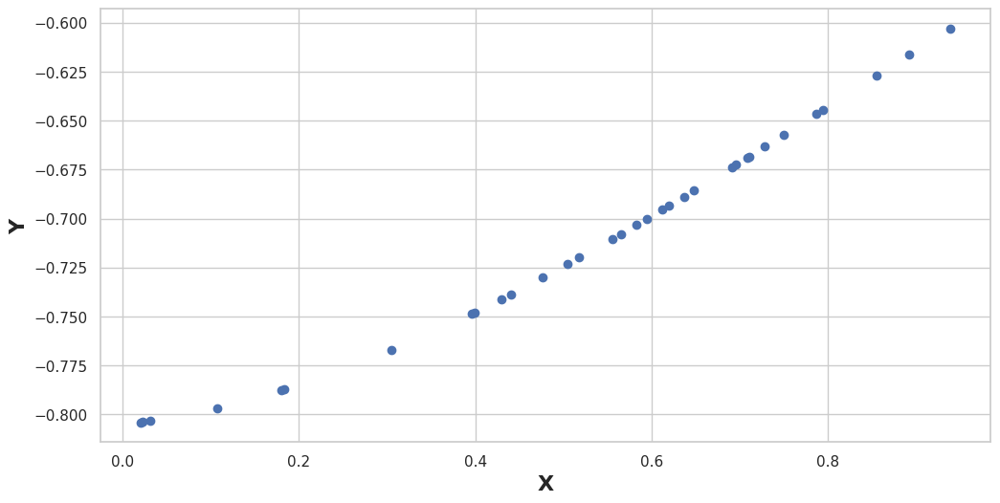

In [11]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(X_validation, pred, "ob", label="test")
plt.xlabel('X', weight="bold", fontsize=16)
plt.ylabel('Y', weight="bold", fontsize=16)

Vemos que si bien aprendio parte del comportamiento de la función, podríamos intentar mejorar el aprendizaje.

`.history` del `.fit` es un JSON que tiene los valores impresos durante el entramiento(métricas y loss)

In [12]:
history.history

{'val_loss': [0.3933815197511153,
  0.29005014986702893,
  0.24265264290751834,
  0.200427742618503,
  0.163693702582157,
  0.13673210098887933,
  0.11730376563288948,
  0.10862906954505226,
  0.10478097651944016,
  0.10067367734331073,
  0.09361894789970282,
  0.08928419604445949,
  0.08561945977536115,
  0.08433266932314093,
  0.08151336894793944,
  0.08003373782743108,
  0.07641891706170457,
  0.07637921675588145,
  0.07366209635228822,
  0.07231850177049637,
  0.07342836599458348,
  0.0730251157374093,
  0.07222343191052928,
  0.07120558280836452,
  0.07196950031952425,
  0.07110289642305086,
  0.07173181144577084,
  0.07090673889174606,
  0.07188150309252017,
  0.07242269791436917,
  0.07339635468793637,
  0.07301969532713745,
  0.07397030813224388,
  0.07468892679069981,
  0.07324132707082864,
  0.07395480798952507,
  0.07619850247195273,
  0.07630374711571318,
  0.07553992149504749,
  0.07563622702251781,
  0.07551111235763087,
  0.0769768835920276,
  0.0752771742867701,
  0.074

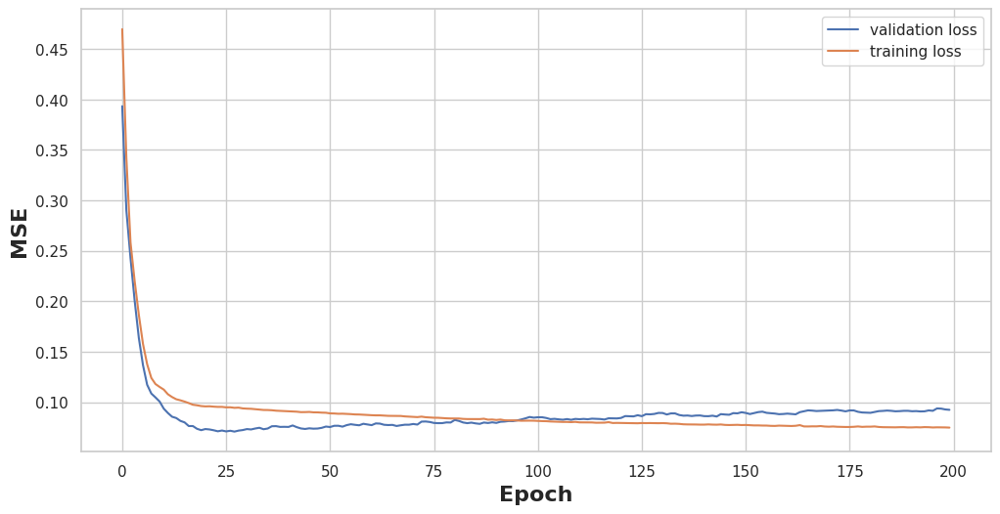

In [13]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(history.history["val_loss"], label="validation loss")
plt.plot(history.history["loss"], label="training loss")
plt.xlabel("Epoch", weight="bold", fontsize=16)
plt.ylabel("MSE", weight="bold", fontsize=16)
plt.legend()

In [14]:
model = Sequential()
model.add(Dense(3, input_dim=1, activation='tanh'))
model.add(Dense(1, activation='linear'))

In [15]:
opt = keras.optimizers.SGD(lr=0.1)
model.compile(loss='mean_squared_error', optimizer=opt, metrics=['mean_squared_error'])

In [16]:
history = model.fit(
    np.array(X_train),
    np.array(y_train),
    epochs=500,
    verbose=2,
    validation_data=(X_validation, np.array(y_validation)),
)

Train on 67 samples, validate on 33 samples
Epoch 1/500
 - 0s - loss: 0.1979 - mean_squared_error: 0.1979 - val_loss: 0.1326 - val_mean_squared_error: 0.1326


Epoch 2/500
 - 0s - loss: 0.1811 - mean_squared_error: 0.1811 - val_loss: 0.0749 - val_mean_squared_error: 0.0749


Epoch 3/500
 - 0s - loss: 0.1592 - mean_squared_error: 0.1592 - val_loss: 0.0784 - val_mean_squared_error: 0.0784


Epoch 4/500
 - 0s - loss: 0.1523 - mean_squared_error: 0.1523 - val_loss: 0.0664 - val_mean_squared_error: 0.0664


Epoch 5/500
 - 0s - loss: 0.1495 - mean_squared_error: 0.1495 - val_loss: 0.0794 - val_mean_squared_error: 0.0794


Epoch 6/500
 - 0s - loss: 0.1376 - mean_squared_error: 0.1376 - val_loss: 0.0652 - val_mean_squared_error: 0.0652


Epoch 7/500
 - 0s - loss: 0.1441 - mean_squared_error: 0.1441 - val_loss: 0.1176 - val_mean_squared_error: 0.1176


Epoch 8/500
 - 0s - loss: 0.1447 - mean_squared_error: 0.1447 - val_loss: 0.1026 - val_mean_squared_error: 0.1026


Epoch 9/500
 - 0s - loss: 0.1318 - mean_squared_error: 0.1318 - val_loss: 0.0738 - val_mean_squared_error: 0.0738


Epoch 10/500
 - 0s - loss: 0.1236 - mean_squared_error: 0.1236 - val_loss: 0.0799 - val_mean_squared_error: 0.0799


Epoch 11/500
 - 0s - loss: 0.1187 - mean_squared_error: 0.1187 - val_loss: 0.0637 - val_mean_squared_error: 0.0637


Epoch 12/500
 - 0s - loss: 0.1209 - mean_squared_error: 0.1209 - val_loss: 0.0654 - val_mean_squared_error: 0.0654


Epoch 13/500
 - 0s - loss: 0.1248 - mean_squared_error: 0.1248 - val_loss: 0.0721 - val_mean_squared_error: 0.0721


Epoch 14/500
 - 0s - loss: 0.1123 - mean_squared_error: 0.1123 - val_loss: 0.0643 - val_mean_squared_error: 0.0643


Epoch 15/500
 - 0s - loss: 0.1150 - mean_squared_error: 0.1150 - val_loss: 0.0646 - val_mean_squared_error: 0.0646


Epoch 16/500
 - 0s - loss: 0.1120 - mean_squared_error: 0.1120 - val_loss: 0.0654 - val_mean_squared_error: 0.0654


Epoch 17/500
 - 0s - loss: 0.1089 - mean_squared_error: 0.1089 - val_loss: 0.0735 - val_mean_squared_error: 0.0735


Epoch 18/500
 - 0s - loss: 0.1059 - mean_squared_error: 0.1059 - val_loss: 0.0701 - val_mean_squared_error: 0.0701


Epoch 19/500
 - 0s - loss: 0.1042 - mean_squared_error: 0.1042 - val_loss: 0.0831 - val_mean_squared_error: 0.0831


Epoch 20/500
 - 0s - loss: 0.1045 - mean_squared_error: 0.1045 - val_loss: 0.0735 - val_mean_squared_error: 0.0735


Epoch 21/500


 - 0s - loss: 0.1020 - mean_squared_error: 0.1020 - val_loss: 0.1172 - val_mean_squared_error: 0.1172


Epoch 22/500
 - 0s - loss: 0.1146 - mean_squared_error: 0.1146 - val_loss: 0.0827 - val_mean_squared_error: 0.0827


Epoch 23/500
 - 0s - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0688 - val_mean_squared_error: 0.0688


Epoch 24/500
 - 0s - loss: 0.0999 - mean_squared_error: 0.0999 - val_loss: 0.0687 - val_mean_squared_error: 0.0687


Epoch 25/500
 - 0s - loss: 0.1002 - mean_squared_error: 0.1002 - val_loss: 0.0708 - val_mean_squared_error: 0.0708


Epoch 26/500
 - 0s - loss: 0.1043 - mean_squared_error: 0.1043 - val_loss: 0.1141 - val_mean_squared_error: 0.1141


Epoch 27/500
 - 0s - loss: 0.1080 - mean_squared_error: 0.1080 - val_loss: 0.0782 - val_mean_squared_error: 0.0782


Epoch 28/500
 - 0s - loss: 0.0947 - mean_squared_error: 0.0947 - val_loss: 0.0704 - val_mean_squared_error: 0.0704


Epoch 29/500
 - 0s - loss: 0.0983 - mean_squared_error: 0.0983 - val_loss: 0.0744 - val_mean_squared_error: 0.0744


Epoch 30/500


 - 0s - loss: 0.1054 - mean_squared_error: 0.1054 - val_loss: 0.0729 - val_mean_squared_error: 0.0729


Epoch 31/500


 - 0s - loss: 0.1012 - mean_squared_error: 0.1012 - val_loss: 0.0718 - val_mean_squared_error: 0.0718


Epoch 32/500
 - 0s - loss: 0.0965 - mean_squared_error: 0.0965 - val_loss: 0.0726 - val_mean_squared_error: 0.0726


Epoch 33/500


 - 0s - loss: 0.0930 - mean_squared_error: 0.0930 - val_loss: 0.1117 - val_mean_squared_error: 0.1117


Epoch 34/500


 - 0s - loss: 0.1021 - mean_squared_error: 0.1021 - val_loss: 0.1015 - val_mean_squared_error: 0.1015


Epoch 35/500


 - 0s - loss: 0.0945 - mean_squared_error: 0.0945 - val_loss: 0.0743 - val_mean_squared_error: 0.0743


Epoch 36/500


 - 0s - loss: 0.0915 - mean_squared_error: 0.0915 - val_loss: 0.0772 - val_mean_squared_error: 0.0772


Epoch 37/500


 - 0s - loss: 0.0883 - mean_squared_error: 0.0883 - val_loss: 0.0817 - val_mean_squared_error: 0.0817


Epoch 38/500


 - 0s - loss: 0.0917 - mean_squared_error: 0.0917 - val_loss: 0.0960 - val_mean_squared_error: 0.0960


Epoch 39/500
 - 0s - loss: 0.0921 - mean_squared_error: 0.0921 - val_loss: 0.1651 - val_mean_squared_error: 0.1651


Epoch 40/500


 - 0s - loss: 0.1169 - mean_squared_error: 0.1169 - val_loss: 0.0791 - val_mean_squared_error: 0.0791


Epoch 41/500


 - 0s - loss: 0.0862 - mean_squared_error: 0.0862 - val_loss: 0.0791 - val_mean_squared_error: 0.0791


Epoch 42/500


 - 0s - loss: 0.0865 - mean_squared_error: 0.0865 - val_loss: 0.1148 - val_mean_squared_error: 0.1148


Epoch 43/500


 - 0s - loss: 0.0942 - mean_squared_error: 0.0942 - val_loss: 0.0877 - val_mean_squared_error: 0.0877


Epoch 44/500


 - 0s - loss: 0.0847 - mean_squared_error: 0.0847 - val_loss: 0.1077 - val_mean_squared_error: 0.1077


Epoch 45/500


 - 0s - loss: 0.0895 - mean_squared_error: 0.0895 - val_loss: 0.0944 - val_mean_squared_error: 0.0944


Epoch 46/500
 - 0s - loss: 0.0854 - mean_squared_error: 0.0854 - val_loss: 0.0891 - val_mean_squared_error: 0.0891


Epoch 47/500
 - 0s - loss: 0.0828 - mean_squared_error: 0.0828 - val_loss: 0.0892 - val_mean_squared_error: 0.0892


Epoch 48/500


 - 0s - loss: 0.0831 - mean_squared_error: 0.0831 - val_loss: 0.0895 - val_mean_squared_error: 0.0895


Epoch 49/500


 - 0s - loss: 0.0821 - mean_squared_error: 0.0821 - val_loss: 0.0920 - val_mean_squared_error: 0.0920


Epoch 50/500


 - 0s - loss: 0.0826 - mean_squared_error: 0.0826 - val_loss: 0.0895 - val_mean_squared_error: 0.0895


Epoch 51/500


 - 0s - loss: 0.0816 - mean_squared_error: 0.0816 - val_loss: 0.0846 - val_mean_squared_error: 0.0846


Epoch 52/500


 - 0s - loss: 0.0877 - mean_squared_error: 0.0877 - val_loss: 0.0970 - val_mean_squared_error: 0.0970


Epoch 53/500
 - 0s - loss: 0.0831 - mean_squared_error: 0.0831 - val_loss: 0.0858 - val_mean_squared_error: 0.0858


Epoch 54/500


 - 0s - loss: 0.0822 - mean_squared_error: 0.0822 - val_loss: 0.0862 - val_mean_squared_error: 0.0862


Epoch 55/500


 - 0s - loss: 0.0836 - mean_squared_error: 0.0836 - val_loss: 0.0876 - val_mean_squared_error: 0.0876


Epoch 56/500
 - 0s - loss: 0.0855 - mean_squared_error: 0.0855 - val_loss: 0.0884 - val_mean_squared_error: 0.0884


Epoch 57/500
 - 0s - loss: 0.0803 - mean_squared_error: 0.0803 - val_loss: 0.0918 - val_mean_squared_error: 0.0918


Epoch 58/500


 - 0s - loss: 0.0884 - mean_squared_error: 0.0884 - val_loss: 0.0900 - val_mean_squared_error: 0.0900


Epoch 59/500


 - 0s - loss: 0.0792 - mean_squared_error: 0.0792 - val_loss: 0.0889 - val_mean_squared_error: 0.0889


Epoch 60/500


 - 0s - loss: 0.0808 - mean_squared_error: 0.0808 - val_loss: 0.0921 - val_mean_squared_error: 0.0921


Epoch 61/500


 - 0s - loss: 0.0797 - mean_squared_error: 0.0797 - val_loss: 0.0899 - val_mean_squared_error: 0.0899


Epoch 62/500


 - 0s - loss: 0.0808 - mean_squared_error: 0.0808 - val_loss: 0.0930 - val_mean_squared_error: 0.0930


Epoch 63/500


 - 0s - loss: 0.0859 - mean_squared_error: 0.0859 - val_loss: 0.0917 - val_mean_squared_error: 0.0917


Epoch 64/500


 - 0s - loss: 0.0784 - mean_squared_error: 0.0784 - val_loss: 0.1093 - val_mean_squared_error: 0.1093


Epoch 65/500


 - 0s - loss: 0.0826 - mean_squared_error: 0.0826 - val_loss: 0.1024 - val_mean_squared_error: 0.1024


Epoch 66/500
 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.0973 - val_mean_squared_error: 0.0973


Epoch 67/500


 - 0s - loss: 0.0777 - mean_squared_error: 0.0777 - val_loss: 0.0924 - val_mean_squared_error: 0.0924


Epoch 68/500


 - 0s - loss: 0.0785 - mean_squared_error: 0.0785 - val_loss: 0.0925 - val_mean_squared_error: 0.0925


Epoch 69/500


 - 0s - loss: 0.0821 - mean_squared_error: 0.0821 - val_loss: 0.0956 - val_mean_squared_error: 0.0956


Epoch 70/500


 - 0s - loss: 0.0773 - mean_squared_error: 0.0773 - val_loss: 0.0971 - val_mean_squared_error: 0.0971


Epoch 71/500


 - 0s - loss: 0.0868 - mean_squared_error: 0.0868 - val_loss: 0.1003 - val_mean_squared_error: 0.1003


Epoch 72/500


 - 0s - loss: 0.0786 - mean_squared_error: 0.0786 - val_loss: 0.1017 - val_mean_squared_error: 0.1017


Epoch 73/500


 - 0s - loss: 0.0793 - mean_squared_error: 0.0793 - val_loss: 0.1195 - val_mean_squared_error: 0.1195


Epoch 74/500


 - 0s - loss: 0.0810 - mean_squared_error: 0.0810 - val_loss: 0.1013 - val_mean_squared_error: 0.1013


Epoch 75/500


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.1025 - val_mean_squared_error: 0.1025


Epoch 76/500


 - 0s - loss: 0.0769 - mean_squared_error: 0.0769 - val_loss: 0.1498 - val_mean_squared_error: 0.1498


Epoch 77/500


 - 0s - loss: 0.0942 - mean_squared_error: 0.0942 - val_loss: 0.1070 - val_mean_squared_error: 0.1070


Epoch 78/500


 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.1004 - val_mean_squared_error: 0.1004


Epoch 79/500


 - 0s - loss: 0.0803 - mean_squared_error: 0.0803 - val_loss: 0.1143 - val_mean_squared_error: 0.1143


Epoch 80/500
 - 0s - loss: 0.0782 - mean_squared_error: 0.0782 - val_loss: 0.1189 - val_mean_squared_error: 0.1189


Epoch 81/500
 - 0s - loss: 0.0823 - mean_squared_error: 0.0823 - val_loss: 0.1021 - val_mean_squared_error: 0.1021


Epoch 82/500


 - 0s - loss: 0.0760 - mean_squared_error: 0.0760 - val_loss: 0.1032 - val_mean_squared_error: 0.1032


Epoch 83/500
 - 0s - loss: 0.0756 - mean_squared_error: 0.0756 - val_loss: 0.1037 - val_mean_squared_error: 0.1037


Epoch 84/500


 - 0s - loss: 0.0815 - mean_squared_error: 0.0815 - val_loss: 0.1033 - val_mean_squared_error: 0.1033


Epoch 85/500


 - 0s - loss: 0.0798 - mean_squared_error: 0.0798 - val_loss: 0.1036 - val_mean_squared_error: 0.1036


Epoch 86/500


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.1096 - val_mean_squared_error: 0.1096


Epoch 87/500


 - 0s - loss: 0.0752 - mean_squared_error: 0.0752 - val_loss: 0.1087 - val_mean_squared_error: 0.1087


Epoch 88/500
 - 0s - loss: 0.0744 - mean_squared_error: 0.0744 - val_loss: 0.1072 - val_mean_squared_error: 0.1072


Epoch 89/500
 - 0s - loss: 0.0809 - mean_squared_error: 0.0809 - val_loss: 0.1232 - val_mean_squared_error: 0.1232


Epoch 90/500


 - 0s - loss: 0.0791 - mean_squared_error: 0.0791 - val_loss: 0.1446 - val_mean_squared_error: 0.1446


Epoch 91/500
 - 0s - loss: 0.0874 - mean_squared_error: 0.0874 - val_loss: 0.1053 - val_mean_squared_error: 0.1053


Epoch 92/500
 - 0s - loss: 0.0746 - mean_squared_error: 0.0746 - val_loss: 0.1280 - val_mean_squared_error: 0.1280


Epoch 93/500


 - 0s - loss: 0.0820 - mean_squared_error: 0.0820 - val_loss: 0.1233 - val_mean_squared_error: 0.1233


Epoch 94/500


 - 0s - loss: 0.0811 - mean_squared_error: 0.0811 - val_loss: 0.1014 - val_mean_squared_error: 0.1014


Epoch 95/500


 - 0s - loss: 0.0791 - mean_squared_error: 0.0791 - val_loss: 0.1031 - val_mean_squared_error: 0.1031


Epoch 96/500


 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.1084 - val_mean_squared_error: 0.1084


Epoch 97/500


 - 0s - loss: 0.0745 - mean_squared_error: 0.0745 - val_loss: 0.1036 - val_mean_squared_error: 0.1036


Epoch 98/500


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.1166 - val_mean_squared_error: 0.1166


Epoch 99/500


 - 0s - loss: 0.0779 - mean_squared_error: 0.0779 - val_loss: 0.1146 - val_mean_squared_error: 0.1146


Epoch 100/500


 - 0s - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.1019 - val_mean_squared_error: 0.1019


Epoch 101/500


 - 0s - loss: 0.0759 - mean_squared_error: 0.0759 - val_loss: 0.1031 - val_mean_squared_error: 0.1031


Epoch 102/500


 - 0s - loss: 0.0742 - mean_squared_error: 0.0742 - val_loss: 0.1029 - val_mean_squared_error: 0.1029


Epoch 103/500


 - 0s - loss: 0.0764 - mean_squared_error: 0.0764 - val_loss: 0.1148 - val_mean_squared_error: 0.1148


Epoch 104/500


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.1040 - val_mean_squared_error: 0.1040


Epoch 105/500


 - 0s - loss: 0.0749 - mean_squared_error: 0.0749 - val_loss: 0.1040 - val_mean_squared_error: 0.1040


Epoch 106/500


 - 0s - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.1050 - val_mean_squared_error: 0.1050


Epoch 107/500


 - 0s - loss: 0.0746 - mean_squared_error: 0.0746 - val_loss: 0.1046 - val_mean_squared_error: 0.1046


Epoch 108/500


 - 0s - loss: 0.0762 - mean_squared_error: 0.0762 - val_loss: 0.1080 - val_mean_squared_error: 0.1080


Epoch 109/500


 - 0s - loss: 0.0738 - mean_squared_error: 0.0738 - val_loss: 0.1079 - val_mean_squared_error: 0.1079


Epoch 110/500


 - 0s - loss: 0.0791 - mean_squared_error: 0.0791 - val_loss: 0.1059 - val_mean_squared_error: 0.1059


Epoch 111/500


 - 0s - loss: 0.0765 - mean_squared_error: 0.0765 - val_loss: 0.1122 - val_mean_squared_error: 0.1122


Epoch 112/500


 - 0s - loss: 0.0833 - mean_squared_error: 0.0833 - val_loss: 0.1097 - val_mean_squared_error: 0.1097


Epoch 113/500
 - 0s - loss: 0.0734 - mean_squared_error: 0.0734 - val_loss: 0.1078 - val_mean_squared_error: 0.1078


Epoch 114/500


 - 0s - loss: 0.0732 - mean_squared_error: 0.0732 - val_loss: 0.1234 - val_mean_squared_error: 0.1234


Epoch 115/500


 - 0s - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.1086 - val_mean_squared_error: 0.1086


Epoch 116/500


 - 0s - loss: 0.0753 - mean_squared_error: 0.0753 - val_loss: 0.1384 - val_mean_squared_error: 0.1384


Epoch 117/500


 - 0s - loss: 0.0839 - mean_squared_error: 0.0839 - val_loss: 0.1158 - val_mean_squared_error: 0.1158


Epoch 118/500


 - 0s - loss: 0.0741 - mean_squared_error: 0.0741 - val_loss: 0.1213 - val_mean_squared_error: 0.1213


Epoch 119/500


 - 0s - loss: 0.0765 - mean_squared_error: 0.0765 - val_loss: 0.1169 - val_mean_squared_error: 0.1169


Epoch 120/500


 - 0s - loss: 0.0746 - mean_squared_error: 0.0746 - val_loss: 0.1263 - val_mean_squared_error: 0.1263


Epoch 121/500


 - 0s - loss: 0.0776 - mean_squared_error: 0.0776 - val_loss: 0.1101 - val_mean_squared_error: 0.1101


Epoch 122/500


 - 0s - loss: 0.0735 - mean_squared_error: 0.0735 - val_loss: 0.1068 - val_mean_squared_error: 0.1068


Epoch 123/500


 - 0s - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.1130 - val_mean_squared_error: 0.1130


Epoch 124/500


 - 0s - loss: 0.0732 - mean_squared_error: 0.0732 - val_loss: 0.1080 - val_mean_squared_error: 0.1080


Epoch 125/500


 - 0s - loss: 0.0806 - mean_squared_error: 0.0806 - val_loss: 0.1096 - val_mean_squared_error: 0.1096


Epoch 126/500
 - 0s - loss: 0.0740 - mean_squared_error: 0.0740 - val_loss: 0.1072 - val_mean_squared_error: 0.1072


Epoch 127/500


 - 0s - loss: 0.0787 - mean_squared_error: 0.0787 - val_loss: 0.1065 - val_mean_squared_error: 0.1065


Epoch 128/500


 - 0s - loss: 0.0728 - mean_squared_error: 0.0728 - val_loss: 0.1140 - val_mean_squared_error: 0.1140


Epoch 129/500


 - 0s - loss: 0.0728 - mean_squared_error: 0.0728 - val_loss: 0.1077 - val_mean_squared_error: 0.1077


Epoch 130/500


 - 0s - loss: 0.0765 - mean_squared_error: 0.0765 - val_loss: 0.1067 - val_mean_squared_error: 0.1067


Epoch 131/500


 - 0s - loss: 0.0741 - mean_squared_error: 0.0741 - val_loss: 0.1154 - val_mean_squared_error: 0.1154


Epoch 132/500


 - 0s - loss: 0.0824 - mean_squared_error: 0.0824 - val_loss: 0.1207 - val_mean_squared_error: 0.1207


Epoch 133/500
 - 0s - loss: 0.0754 - mean_squared_error: 0.0754 - val_loss: 0.1122 - val_mean_squared_error: 0.1122


Epoch 134/500


 - 0s - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.1154 - val_mean_squared_error: 0.1154


Epoch 135/500
 - 0s - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.1092 - val_mean_squared_error: 0.1092


Epoch 136/500


 - 0s - loss: 0.0718 - mean_squared_error: 0.0718 - val_loss: 0.1050 - val_mean_squared_error: 0.1050


Epoch 137/500


 - 0s - loss: 0.0751 - mean_squared_error: 0.0751 - val_loss: 0.1072 - val_mean_squared_error: 0.1072


Epoch 138/500


 - 0s - loss: 0.0784 - mean_squared_error: 0.0784 - val_loss: 0.1104 - val_mean_squared_error: 0.1104


Epoch 139/500


 - 0s - loss: 0.0800 - mean_squared_error: 0.0800 - val_loss: 0.1059 - val_mean_squared_error: 0.1059


Epoch 140/500


 - 0s - loss: 0.0715 - mean_squared_error: 0.0715 - val_loss: 0.1052 - val_mean_squared_error: 0.1052


Epoch 141/500


 - 0s - loss: 0.0720 - mean_squared_error: 0.0720 - val_loss: 0.1051 - val_mean_squared_error: 0.1051


Epoch 142/500


 - 0s - loss: 0.0732 - mean_squared_error: 0.0732 - val_loss: 0.1046 - val_mean_squared_error: 0.1046


Epoch 143/500
 - 0s - loss: 0.0741 - mean_squared_error: 0.0741 - val_loss: 0.1055 - val_mean_squared_error: 0.1055


Epoch 144/500


 - 0s - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.1046 - val_mean_squared_error: 0.1046


Epoch 145/500


 - 0s - loss: 0.0731 - mean_squared_error: 0.0731 - val_loss: 0.1416 - val_mean_squared_error: 0.1416


Epoch 146/500


 - 0s - loss: 0.0858 - mean_squared_error: 0.0858 - val_loss: 0.1085 - val_mean_squared_error: 0.1085


Epoch 147/500
 - 0s - loss: 0.0717 - mean_squared_error: 0.0717 - val_loss: 0.1341 - val_mean_squared_error: 0.1341


Epoch 148/500


 - 0s - loss: 0.0839 - mean_squared_error: 0.0839 - val_loss: 0.1266 - val_mean_squared_error: 0.1266


Epoch 149/500


 - 0s - loss: 0.0770 - mean_squared_error: 0.0770 - val_loss: 0.1017 - val_mean_squared_error: 0.1017


Epoch 150/500


 - 0s - loss: 0.0775 - mean_squared_error: 0.0775 - val_loss: 0.1012 - val_mean_squared_error: 0.1012


Epoch 151/500


 - 0s - loss: 0.0728 - mean_squared_error: 0.0728 - val_loss: 0.1046 - val_mean_squared_error: 0.1046


Epoch 152/500


 - 0s - loss: 0.0712 - mean_squared_error: 0.0712 - val_loss: 0.1098 - val_mean_squared_error: 0.1098


Epoch 153/500


 - 0s - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.1264 - val_mean_squared_error: 0.1264


Epoch 154/500


 - 0s - loss: 0.0781 - mean_squared_error: 0.0781 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 155/500


 - 0s - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.1129 - val_mean_squared_error: 0.1129


Epoch 156/500


 - 0s - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.1020 - val_mean_squared_error: 0.1020


Epoch 157/500


 - 0s - loss: 0.0729 - mean_squared_error: 0.0729 - val_loss: 0.1014 - val_mean_squared_error: 0.1014


Epoch 158/500
 - 0s - loss: 0.0711 - mean_squared_error: 0.0711 - val_loss: 0.0999 - val_mean_squared_error: 0.0999


Epoch 159/500


 - 0s - loss: 0.0710 - mean_squared_error: 0.0710 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 160/500


 - 0s - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.0989 - val_mean_squared_error: 0.0989


Epoch 161/500


 - 0s - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.1101 - val_mean_squared_error: 0.1101


Epoch 162/500


 - 0s - loss: 0.0722 - mean_squared_error: 0.0722 - val_loss: 0.1018 - val_mean_squared_error: 0.1018


Epoch 163/500


 - 0s - loss: 0.0701 - mean_squared_error: 0.0701 - val_loss: 0.1025 - val_mean_squared_error: 0.1025


Epoch 164/500


 - 0s - loss: 0.0699 - mean_squared_error: 0.0699 - val_loss: 0.1257 - val_mean_squared_error: 0.1257


Epoch 165/500


 - 0s - loss: 0.0768 - mean_squared_error: 0.0768 - val_loss: 0.1179 - val_mean_squared_error: 0.1179


Epoch 166/500


 - 0s - loss: 0.0738 - mean_squared_error: 0.0738 - val_loss: 0.0987 - val_mean_squared_error: 0.0987


Epoch 167/500


 - 0s - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.1023 - val_mean_squared_error: 0.1023


Epoch 168/500


 - 0s - loss: 0.0702 - mean_squared_error: 0.0702 - val_loss: 0.1325 - val_mean_squared_error: 0.1325


Epoch 169/500


 - 0s - loss: 0.0781 - mean_squared_error: 0.0781 - val_loss: 0.1020 - val_mean_squared_error: 0.1020


Epoch 170/500


 - 0s - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 0.1002 - val_mean_squared_error: 0.1002


Epoch 171/500


 - 0s - loss: 0.0710 - mean_squared_error: 0.0710 - val_loss: 0.1003 - val_mean_squared_error: 0.1003


Epoch 172/500


 - 0s - loss: 0.0702 - mean_squared_error: 0.0702 - val_loss: 0.1221 - val_mean_squared_error: 0.1221


Epoch 173/500


 - 0s - loss: 0.0739 - mean_squared_error: 0.0739 - val_loss: 0.1014 - val_mean_squared_error: 0.1014


Epoch 174/500


 - 0s - loss: 0.0716 - mean_squared_error: 0.0716 - val_loss: 0.1050 - val_mean_squared_error: 0.1050


Epoch 175/500


 - 0s - loss: 0.0761 - mean_squared_error: 0.0761 - val_loss: 0.1008 - val_mean_squared_error: 0.1008


Epoch 176/500


 - 0s - loss: 0.0708 - mean_squared_error: 0.0708 - val_loss: 0.1017 - val_mean_squared_error: 0.1017


Epoch 177/500


 - 0s - loss: 0.0691 - mean_squared_error: 0.0691 - val_loss: 0.1012 - val_mean_squared_error: 0.1012


Epoch 178/500


 - 0s - loss: 0.0705 - mean_squared_error: 0.0705 - val_loss: 0.1022 - val_mean_squared_error: 0.1022


Epoch 179/500
 - 0s - loss: 0.0689 - mean_squared_error: 0.0689 - val_loss: 0.1009 - val_mean_squared_error: 0.1009


Epoch 180/500


 - 0s - loss: 0.0706 - mean_squared_error: 0.0706 - val_loss: 0.1026 - val_mean_squared_error: 0.1026


Epoch 181/500


 - 0s - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.0988 - val_mean_squared_error: 0.0988


Epoch 182/500


 - 0s - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.0997 - val_mean_squared_error: 0.0997


Epoch 183/500


 - 0s - loss: 0.0720 - mean_squared_error: 0.0720 - val_loss: 0.1007 - val_mean_squared_error: 0.1007


Epoch 184/500
 - 0s - loss: 0.0683 - mean_squared_error: 0.0683 - val_loss: 0.1003 - val_mean_squared_error: 0.1003


Epoch 185/500
 - 0s - loss: 0.0687 - mean_squared_error: 0.0687 - val_loss: 0.1064 - val_mean_squared_error: 0.1064


Epoch 186/500


 - 0s - loss: 0.0690 - mean_squared_error: 0.0690 - val_loss: 0.1187 - val_mean_squared_error: 0.1187


Epoch 187/500


 - 0s - loss: 0.0728 - mean_squared_error: 0.0728 - val_loss: 0.1116 - val_mean_squared_error: 0.1116


Epoch 188/500


 - 0s - loss: 0.0692 - mean_squared_error: 0.0692 - val_loss: 0.1044 - val_mean_squared_error: 0.1044


Epoch 189/500


 - 0s - loss: 0.0720 - mean_squared_error: 0.0720 - val_loss: 0.1296 - val_mean_squared_error: 0.1296


Epoch 190/500


 - 0s - loss: 0.0736 - mean_squared_error: 0.0736 - val_loss: 0.1124 - val_mean_squared_error: 0.1124


Epoch 191/500


 - 0s - loss: 0.0818 - mean_squared_error: 0.0818 - val_loss: 0.1091 - val_mean_squared_error: 0.1091


Epoch 192/500


 - 0s - loss: 0.0742 - mean_squared_error: 0.0742 - val_loss: 0.1074 - val_mean_squared_error: 0.1074


Epoch 193/500

 - 0s - loss: 0.0689 - mean_squared_error: 0.0689 - val_loss: 0.1082 - val_mean_squared_error: 0.1082


Epoch 194/500


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.1120 - val_mean_squared_error: 0.1120


Epoch 195/500


 - 0s - loss: 0.0685 - mean_squared_error: 0.0685 - val_loss: 0.1133 - val_mean_squared_error: 0.1133


Epoch 196/500


 - 0s - loss: 0.0678 - mean_squared_error: 0.0678 - val_loss: 0.1102 - val_mean_squared_error: 0.1102


Epoch 197/500


 - 0s - loss: 0.0734 - mean_squared_error: 0.0734 - val_loss: 0.1175 - val_mean_squared_error: 0.1175


Epoch 198/500


 - 0s - loss: 0.0774 - mean_squared_error: 0.0774 - val_loss: 0.1272 - val_mean_squared_error: 0.1272


Epoch 199/500


 - 0s - loss: 0.0721 - mean_squared_error: 0.0721 - val_loss: 0.1115 - val_mean_squared_error: 0.1115


Epoch 200/500


 - 0s - loss: 0.0698 - mean_squared_error: 0.0698 - val_loss: 0.1085 - val_mean_squared_error: 0.1085


Epoch 201/500


 - 0s - loss: 0.0672 - mean_squared_error: 0.0672 - val_loss: 0.1093 - val_mean_squared_error: 0.1093


Epoch 202/500


 - 0s - loss: 0.0672 - mean_squared_error: 0.0672 - val_loss: 0.1194 - val_mean_squared_error: 0.1194


Epoch 203/500


 - 0s - loss: 0.0714 - mean_squared_error: 0.0714 - val_loss: 0.1018 - val_mean_squared_error: 0.1018


Epoch 204/500


 - 0s - loss: 0.0694 - mean_squared_error: 0.0694 - val_loss: 0.1026 - val_mean_squared_error: 0.1026


Epoch 205/500


 - 0s - loss: 0.0709 - mean_squared_error: 0.0709 - val_loss: 0.1035 - val_mean_squared_error: 0.1035


Epoch 206/500


 - 0s - loss: 0.0727 - mean_squared_error: 0.0727 - val_loss: 0.1042 - val_mean_squared_error: 0.1042


Epoch 207/500


 - 0s - loss: 0.0721 - mean_squared_error: 0.0721 - val_loss: 0.1019 - val_mean_squared_error: 0.1019


Epoch 208/500


 - 0s - loss: 0.0663 - mean_squared_error: 0.0663 - val_loss: 0.1015 - val_mean_squared_error: 0.1015


Epoch 209/500


 - 0s - loss: 0.0723 - mean_squared_error: 0.0723 - val_loss: 0.0996 - val_mean_squared_error: 0.0996


Epoch 210/500


 - 0s - loss: 0.0696 - mean_squared_error: 0.0696 - val_loss: 0.0990 - val_mean_squared_error: 0.0990


Epoch 211/500


 - 0s - loss: 0.0684 - mean_squared_error: 0.0684 - val_loss: 0.1051 - val_mean_squared_error: 0.1051


Epoch 212/500


 - 0s - loss: 0.0750 - mean_squared_error: 0.0750 - val_loss: 0.0996 - val_mean_squared_error: 0.0996


Epoch 213/500


 - 0s - loss: 0.0698 - mean_squared_error: 0.0698 - val_loss: 0.1052 - val_mean_squared_error: 0.1052


Epoch 214/500


 - 0s - loss: 0.0748 - mean_squared_error: 0.0748 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 215/500


 - 0s - loss: 0.0671 - mean_squared_error: 0.0671 - val_loss: 0.1029 - val_mean_squared_error: 0.1029


Epoch 216/500


 - 0s - loss: 0.0739 - mean_squared_error: 0.0739 - val_loss: 0.0998 - val_mean_squared_error: 0.0998


Epoch 217/500


 - 0s - loss: 0.0672 - mean_squared_error: 0.0672 - val_loss: 0.1000 - val_mean_squared_error: 0.1000


Epoch 218/500


 - 0s - loss: 0.0695 - mean_squared_error: 0.0695 - val_loss: 0.1005 - val_mean_squared_error: 0.1005


Epoch 219/500


 - 0s - loss: 0.0657 - mean_squared_error: 0.0657 - val_loss: 0.1180 - val_mean_squared_error: 0.1180


Epoch 220/500
 - 0s - loss: 0.0707 - mean_squared_error: 0.0707 - val_loss: 0.0956 - val_mean_squared_error: 0.0956


Epoch 221/500


 - 0s - loss: 0.0680 - mean_squared_error: 0.0680 - val_loss: 0.0968 - val_mean_squared_error: 0.0968


Epoch 222/500
 - 0s - loss: 0.0683 - mean_squared_error: 0.0683 - val_loss: 0.0986 - val_mean_squared_error: 0.0986


Epoch 223/500


 - 0s - loss: 0.0653 - mean_squared_error: 0.0653 - val_loss: 0.0925 - val_mean_squared_error: 0.0925


Epoch 224/500


 - 0s - loss: 0.0659 - mean_squared_error: 0.0659 - val_loss: 0.0926 - val_mean_squared_error: 0.0926


Epoch 225/500


 - 0s - loss: 0.0674 - mean_squared_error: 0.0674 - val_loss: 0.0957 - val_mean_squared_error: 0.0957


Epoch 226/500
 - 0s - loss: 0.0714 - mean_squared_error: 0.0714 - val_loss: 0.0927 - val_mean_squared_error: 0.0927


Epoch 227/500


 - 0s - loss: 0.0661 - mean_squared_error: 0.0661 - val_loss: 0.0985 - val_mean_squared_error: 0.0985


Epoch 228/500


 - 0s - loss: 0.0651 - mean_squared_error: 0.0651 - val_loss: 0.0950 - val_mean_squared_error: 0.0950


Epoch 229/500


 - 0s - loss: 0.0656 - mean_squared_error: 0.0656 - val_loss: 0.1205 - val_mean_squared_error: 0.1205


Epoch 230/500


 - 0s - loss: 0.0724 - mean_squared_error: 0.0724 - val_loss: 0.0972 - val_mean_squared_error: 0.0972


Epoch 231/500


 - 0s - loss: 0.0640 - mean_squared_error: 0.0640 - val_loss: 0.1001 - val_mean_squared_error: 0.1001


Epoch 232/500


 - 0s - loss: 0.0638 - mean_squared_error: 0.0638 - val_loss: 0.0980 - val_mean_squared_error: 0.0980


Epoch 233/500


 - 0s - loss: 0.0667 - mean_squared_error: 0.0667 - val_loss: 0.0992 - val_mean_squared_error: 0.0992


Epoch 234/500


 - 0s - loss: 0.0632 - mean_squared_error: 0.0632 - val_loss: 0.0944 - val_mean_squared_error: 0.0944


Epoch 235/500
 - 0s - loss: 0.0658 - mean_squared_error: 0.0658 - val_loss: 0.1064 - val_mean_squared_error: 0.1064


Epoch 236/500


 - 0s - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.0970 - val_mean_squared_error: 0.0970


Epoch 237/500


 - 0s - loss: 0.0651 - mean_squared_error: 0.0651 - val_loss: 0.0993 - val_mean_squared_error: 0.0993


Epoch 238/500


 - 0s - loss: 0.0628 - mean_squared_error: 0.0628 - val_loss: 0.0944 - val_mean_squared_error: 0.0944


Epoch 239/500


 - 0s - loss: 0.0646 - mean_squared_error: 0.0646 - val_loss: 0.0943 - val_mean_squared_error: 0.0943


Epoch 240/500


 - 0s - loss: 0.0652 - mean_squared_error: 0.0652 - val_loss: 0.1173 - val_mean_squared_error: 0.1173


Epoch 241/500


 - 0s - loss: 0.0691 - mean_squared_error: 0.0691 - val_loss: 0.1030 - val_mean_squared_error: 0.1030


Epoch 242/500


 - 0s - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.1065 - val_mean_squared_error: 0.1065


Epoch 243/500


 - 0s - loss: 0.0633 - mean_squared_error: 0.0633 - val_loss: 0.0992 - val_mean_squared_error: 0.0992


Epoch 244/500


 - 0s - loss: 0.0624 - mean_squared_error: 0.0624 - val_loss: 0.1038 - val_mean_squared_error: 0.1038


Epoch 245/500


 - 0s - loss: 0.0639 - mean_squared_error: 0.0639 - val_loss: 0.0933 - val_mean_squared_error: 0.0933


Epoch 246/500
 - 0s - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.0980 - val_mean_squared_error: 0.0980


Epoch 247/500


 - 0s - loss: 0.0698 - mean_squared_error: 0.0698 - val_loss: 0.0934 - val_mean_squared_error: 0.0934


Epoch 248/500


 - 0s - loss: 0.0635 - mean_squared_error: 0.0635 - val_loss: 0.0936 - val_mean_squared_error: 0.0936


Epoch 249/500


 - 0s - loss: 0.0615 - mean_squared_error: 0.0615 - val_loss: 0.0963 - val_mean_squared_error: 0.0963


Epoch 250/500


 - 0s - loss: 0.0631 - mean_squared_error: 0.0631 - val_loss: 0.1274 - val_mean_squared_error: 0.1274


Epoch 251/500


 - 0s - loss: 0.0714 - mean_squared_error: 0.0714 - val_loss: 0.0907 - val_mean_squared_error: 0.0907


Epoch 252/500


 - 0s - loss: 0.0645 - mean_squared_error: 0.0645 - val_loss: 0.0888 - val_mean_squared_error: 0.0888


Epoch 253/500


 - 0s - loss: 0.0644 - mean_squared_error: 0.0644 - val_loss: 0.0887 - val_mean_squared_error: 0.0887


Epoch 254/500


 - 0s - loss: 0.0629 - mean_squared_error: 0.0629 - val_loss: 0.0944 - val_mean_squared_error: 0.0944


Epoch 255/500


 - 0s - loss: 0.0684 - mean_squared_error: 0.0684 - val_loss: 0.0938 - val_mean_squared_error: 0.0938


Epoch 256/500


 - 0s - loss: 0.0602 - mean_squared_error: 0.0602 - val_loss: 0.0941 - val_mean_squared_error: 0.0941


Epoch 257/500


 - 0s - loss: 0.0605 - mean_squared_error: 0.0605 - val_loss: 0.0909 - val_mean_squared_error: 0.0909


Epoch 258/500
 - 0s - loss: 0.0612 - mean_squared_error: 0.0612 - val_loss: 0.0935 - val_mean_squared_error: 0.0935


Epoch 259/500


 - 0s - loss: 0.0611 - mean_squared_error: 0.0611 - val_loss: 0.1120 - val_mean_squared_error: 0.1120


Epoch 260/500


 - 0s - loss: 0.0646 - mean_squared_error: 0.0646 - val_loss: 0.0984 - val_mean_squared_error: 0.0984


Epoch 261/500


 - 0s - loss: 0.0599 - mean_squared_error: 0.0599 - val_loss: 0.0989 - val_mean_squared_error: 0.0989


Epoch 262/500


 - 0s - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0892 - val_mean_squared_error: 0.0892


Epoch 263/500


 - 0s - loss: 0.0601 - mean_squared_error: 0.0601 - val_loss: 0.0995 - val_mean_squared_error: 0.0995


Epoch 264/500


 - 0s - loss: 0.0609 - mean_squared_error: 0.0609 - val_loss: 0.0899 - val_mean_squared_error: 0.0899


Epoch 265/500


 - 0s - loss: 0.0590 - mean_squared_error: 0.0590 - val_loss: 0.0899 - val_mean_squared_error: 0.0899


Epoch 266/500


 - 0s - loss: 0.0588 - mean_squared_error: 0.0588 - val_loss: 0.1272 - val_mean_squared_error: 0.1272


Epoch 267/500


 - 0s - loss: 0.0712 - mean_squared_error: 0.0712 - val_loss: 0.0949 - val_mean_squared_error: 0.0949


Epoch 268/500


 - 0s - loss: 0.0596 - mean_squared_error: 0.0596 - val_loss: 0.1027 - val_mean_squared_error: 0.1027


Epoch 269/500


 - 0s - loss: 0.0611 - mean_squared_error: 0.0611 - val_loss: 0.0932 - val_mean_squared_error: 0.0932


Epoch 270/500


 - 0s - loss: 0.0579 - mean_squared_error: 0.0579 - val_loss: 0.0890 - val_mean_squared_error: 0.0890


Epoch 271/500


 - 0s - loss: 0.0582 - mean_squared_error: 0.0582 - val_loss: 0.1024 - val_mean_squared_error: 0.1024


Epoch 272/500


 - 0s - loss: 0.0649 - mean_squared_error: 0.0649 - val_loss: 0.1006 - val_mean_squared_error: 0.1006


Epoch 273/500


 - 0s - loss: 0.0597 - mean_squared_error: 0.0597 - val_loss: 0.0921 - val_mean_squared_error: 0.0921


Epoch 274/500


 - 0s - loss: 0.0573 - mean_squared_error: 0.0573 - val_loss: 0.0970 - val_mean_squared_error: 0.0970


Epoch 275/500


 - 0s - loss: 0.0592 - mean_squared_error: 0.0592 - val_loss: 0.0924 - val_mean_squared_error: 0.0924


Epoch 276/500


 - 0s - loss: 0.0593 - mean_squared_error: 0.0593 - val_loss: 0.0918 - val_mean_squared_error: 0.0918


Epoch 277/500


 - 0s - loss: 0.0568 - mean_squared_error: 0.0568 - val_loss: 0.1024 - val_mean_squared_error: 0.1024


Epoch 278/500


 - 0s - loss: 0.0604 - mean_squared_error: 0.0604 - val_loss: 0.0879 - val_mean_squared_error: 0.0879


Epoch 279/500
 - 0s - loss: 0.0560 - mean_squared_error: 0.0560 - val_loss: 0.0877 - val_mean_squared_error: 0.0877


Epoch 280/500


 - 0s - loss: 0.0565 - mean_squared_error: 0.0565 - val_loss: 0.0876 - val_mean_squared_error: 0.0876


Epoch 281/500


 - 0s - loss: 0.0556 - mean_squared_error: 0.0556 - val_loss: 0.0861 - val_mean_squared_error: 0.0861


Epoch 282/500


 - 0s - loss: 0.0577 - mean_squared_error: 0.0577 - val_loss: 0.0859 - val_mean_squared_error: 0.0859


Epoch 283/500


 - 0s - loss: 0.0564 - mean_squared_error: 0.0564 - val_loss: 0.0857 - val_mean_squared_error: 0.0857


Epoch 284/500


 - 0s - loss: 0.0573 - mean_squared_error: 0.0573 - val_loss: 0.1086 - val_mean_squared_error: 0.1086


Epoch 285/500


 - 0s - loss: 0.0608 - mean_squared_error: 0.0608 - val_loss: 0.0898 - val_mean_squared_error: 0.0898


Epoch 286/500


 - 0s - loss: 0.0561 - mean_squared_error: 0.0561 - val_loss: 0.0870 - val_mean_squared_error: 0.0870


Epoch 287/500


 - 0s - loss: 0.0552 - mean_squared_error: 0.0552 - val_loss: 0.0871 - val_mean_squared_error: 0.0871


Epoch 288/500


 - 0s - loss: 0.0580 - mean_squared_error: 0.0580 - val_loss: 0.0997 - val_mean_squared_error: 0.0997


Epoch 289/500


 - 0s - loss: 0.0606 - mean_squared_error: 0.0606 - val_loss: 0.0806 - val_mean_squared_error: 0.0806


Epoch 290/500


 - 0s - loss: 0.0573 - mean_squared_error: 0.0573 - val_loss: 0.0799 - val_mean_squared_error: 0.0799


Epoch 291/500


 - 0s - loss: 0.0562 - mean_squared_error: 0.0562 - val_loss: 0.1028 - val_mean_squared_error: 0.1028


Epoch 292/500


 - 0s - loss: 0.0614 - mean_squared_error: 0.0614 - val_loss: 0.0943 - val_mean_squared_error: 0.0943


Epoch 293/500


 - 0s - loss: 0.0597 - mean_squared_error: 0.0597 - val_loss: 0.0850 - val_mean_squared_error: 0.0850


Epoch 294/500
 - 0s - loss: 0.0543 - mean_squared_error: 0.0543 - val_loss: 0.0779 - val_mean_squared_error: 0.0779


Epoch 295/500


 - 0s - loss: 0.0526 - mean_squared_error: 0.0526 - val_loss: 0.0807 - val_mean_squared_error: 0.0807


Epoch 296/500


 - 0s - loss: 0.0537 - mean_squared_error: 0.0537 - val_loss: 0.0777 - val_mean_squared_error: 0.0777


Epoch 297/500


 - 0s - loss: 0.0527 - mean_squared_error: 0.0527 - val_loss: 0.0774 - val_mean_squared_error: 0.0774


Epoch 298/500


 - 0s - loss: 0.0549 - mean_squared_error: 0.0549 - val_loss: 0.0768 - val_mean_squared_error: 0.0768


Epoch 299/500


 - 0s - loss: 0.0531 - mean_squared_error: 0.0531 - val_loss: 0.0940 - val_mean_squared_error: 0.0940


Epoch 300/500


 - 0s - loss: 0.0546 - mean_squared_error: 0.0546 - val_loss: 0.0776 - val_mean_squared_error: 0.0776


Epoch 301/500


 - 0s - loss: 0.0538 - mean_squared_error: 0.0538 - val_loss: 0.0847 - val_mean_squared_error: 0.0847


Epoch 302/500
 - 0s - loss: 0.0615 - mean_squared_error: 0.0615 - val_loss: 0.0779 - val_mean_squared_error: 0.0779


Epoch 303/500


 - 0s - loss: 0.0543 - mean_squared_error: 0.0543 - val_loss: 0.0771 - val_mean_squared_error: 0.0771


Epoch 304/500


 - 0s - loss: 0.0531 - mean_squared_error: 0.0531 - val_loss: 0.0839 - val_mean_squared_error: 0.0839


Epoch 305/500


 - 0s - loss: 0.0510 - mean_squared_error: 0.0510 - val_loss: 0.0939 - val_mean_squared_error: 0.0939


Epoch 306/500


 - 0s - loss: 0.0538 - mean_squared_error: 0.0538 - val_loss: 0.0888 - val_mean_squared_error: 0.0888


Epoch 307/500


 - 0s - loss: 0.0516 - mean_squared_error: 0.0516 - val_loss: 0.1062 - val_mean_squared_error: 0.1062


Epoch 308/500


 - 0s - loss: 0.0569 - mean_squared_error: 0.0569 - val_loss: 0.0885 - val_mean_squared_error: 0.0885


Epoch 309/500


 - 0s - loss: 0.0508 - mean_squared_error: 0.0508 - val_loss: 0.1044 - val_mean_squared_error: 0.1044


Epoch 310/500


 - 0s - loss: 0.0565 - mean_squared_error: 0.0565 - val_loss: 0.0908 - val_mean_squared_error: 0.0908


Epoch 311/500


 - 0s - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0768 - val_mean_squared_error: 0.0768


Epoch 312/500


 - 0s - loss: 0.0485 - mean_squared_error: 0.0485 - val_loss: 0.0769 - val_mean_squared_error: 0.0769


Epoch 313/500


 - 0s - loss: 0.0485 - mean_squared_error: 0.0485 - val_loss: 0.0768 - val_mean_squared_error: 0.0768


Epoch 314/500


 - 0s - loss: 0.0504 - mean_squared_error: 0.0504 - val_loss: 0.0769 - val_mean_squared_error: 0.0769


Epoch 315/500

 - 0s - loss: 0.0480 - mean_squared_error: 0.0480 - val_loss: 0.0753 - val_mean_squared_error: 0.0753


Epoch 316/500


 - 0s - loss: 0.0476 - mean_squared_error: 0.0476 - val_loss: 0.0728 - val_mean_squared_error: 0.0728


Epoch 317/500


 - 0s - loss: 0.0482 - mean_squared_error: 0.0482 - val_loss: 0.0723 - val_mean_squared_error: 0.0723


Epoch 318/500

 - 0s - loss: 0.0500 - mean_squared_error: 0.0500 - val_loss: 0.0710 - val_mean_squared_error: 0.0710


Epoch 319/500


 - 0s - loss: 0.0480 - mean_squared_error: 0.0480 - val_loss: 0.0704 - val_mean_squared_error: 0.0704


Epoch 320/500


 - 0s - loss: 0.0514 - mean_squared_error: 0.0514 - val_loss: 0.0719 - val_mean_squared_error: 0.0719


Epoch 321/500


 - 0s - loss: 0.0465 - mean_squared_error: 0.0465 - val_loss: 0.0724 - val_mean_squared_error: 0.0724


Epoch 322/500


 - 0s - loss: 0.0459 - mean_squared_error: 0.0459 - val_loss: 0.0715 - val_mean_squared_error: 0.0715


Epoch 323/500


 - 0s - loss: 0.0462 - mean_squared_error: 0.0462 - val_loss: 0.1051 - val_mean_squared_error: 0.1051


Epoch 324/500
 - 0s - loss: 0.0620 - mean_squared_error: 0.0620 - val_loss: 0.0907 - val_mean_squared_error: 0.0907


Epoch 325/500


 - 0s - loss: 0.0549 - mean_squared_error: 0.0549 - val_loss: 0.0624 - val_mean_squared_error: 0.0624


Epoch 326/500


 - 0s - loss: 0.0460 - mean_squared_error: 0.0460 - val_loss: 0.0631 - val_mean_squared_error: 0.0631


Epoch 327/500

 - 0s - loss: 0.0481 - mean_squared_error: 0.0481 - val_loss: 0.0690 - val_mean_squared_error: 0.0690


Epoch 328/500


 - 0s - loss: 0.0527 - mean_squared_error: 0.0527 - val_loss: 0.0694 - val_mean_squared_error: 0.0694


Epoch 329/500


 - 0s - loss: 0.0441 - mean_squared_error: 0.0441 - val_loss: 0.0645 - val_mean_squared_error: 0.0645


Epoch 330/500


 - 0s - loss: 0.0451 - mean_squared_error: 0.0451 - val_loss: 0.0897 - val_mean_squared_error: 0.0897


Epoch 331/500


 - 0s - loss: 0.0495 - mean_squared_error: 0.0495 - val_loss: 0.0728 - val_mean_squared_error: 0.0728


Epoch 332/500


 - 0s - loss: 0.0447 - mean_squared_error: 0.0447 - val_loss: 0.0688 - val_mean_squared_error: 0.0688


Epoch 333/500


 - 0s - loss: 0.0526 - mean_squared_error: 0.0526 - val_loss: 0.0681 - val_mean_squared_error: 0.0681


Epoch 334/500


 - 0s - loss: 0.0456 - mean_squared_error: 0.0456 - val_loss: 0.0795 - val_mean_squared_error: 0.0795


Epoch 335/500


 - 0s - loss: 0.0450 - mean_squared_error: 0.0450 - val_loss: 0.0806 - val_mean_squared_error: 0.0806


Epoch 336/500


 - 0s - loss: 0.0445 - mean_squared_error: 0.0445 - val_loss: 0.0681 - val_mean_squared_error: 0.0681


Epoch 337/500


 - 0s - loss: 0.0425 - mean_squared_error: 0.0425 - val_loss: 0.0659 - val_mean_squared_error: 0.0659


Epoch 338/500


 - 0s - loss: 0.0417 - mean_squared_error: 0.0417 - val_loss: 0.0587 - val_mean_squared_error: 0.0587


Epoch 339/500


 - 0s - loss: 0.0426 - mean_squared_error: 0.0426 - val_loss: 0.0594 - val_mean_squared_error: 0.0594


Epoch 340/500


 - 0s - loss: 0.0440 - mean_squared_error: 0.0440 - val_loss: 0.0631 - val_mean_squared_error: 0.0631


Epoch 341/500


 - 0s - loss: 0.0463 - mean_squared_error: 0.0463 - val_loss: 0.0616 - val_mean_squared_error: 0.0616


Epoch 342/500


 - 0s - loss: 0.0404 - mean_squared_error: 0.0404 - val_loss: 0.0558 - val_mean_squared_error: 0.0558


Epoch 343/500


 - 0s - loss: 0.0409 - mean_squared_error: 0.0409 - val_loss: 0.0829 - val_mean_squared_error: 0.0829


Epoch 344/500


 - 0s - loss: 0.0494 - mean_squared_error: 0.0494 - val_loss: 0.0539 - val_mean_squared_error: 0.0539


Epoch 345/500


 - 0s - loss: 0.0393 - mean_squared_error: 0.0393 - val_loss: 0.0532 - val_mean_squared_error: 0.0532


Epoch 346/500


 - 0s - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0649 - val_mean_squared_error: 0.0649


Epoch 347/500


 - 0s - loss: 0.0413 - mean_squared_error: 0.0413 - val_loss: 0.0520 - val_mean_squared_error: 0.0520


Epoch 348/500


 - 0s - loss: 0.0401 - mean_squared_error: 0.0401 - val_loss: 0.0524 - val_mean_squared_error: 0.0524


Epoch 349/500


 - 0s - loss: 0.0386 - mean_squared_error: 0.0386 - val_loss: 0.0791 - val_mean_squared_error: 0.0791


Epoch 350/500


 - 0s - loss: 0.0432 - mean_squared_error: 0.0432 - val_loss: 0.0553 - val_mean_squared_error: 0.0553


Epoch 351/500

 - 0s - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.0521 - val_mean_squared_error: 0.0521


Epoch 352/500


 - 0s - loss: 0.0373 - mean_squared_error: 0.0373 - val_loss: 0.0503 - val_mean_squared_error: 0.0503


Epoch 353/500


 - 0s - loss: 0.0380 - mean_squared_error: 0.0380 - val_loss: 0.0527 - val_mean_squared_error: 0.0527


Epoch 354/500


 - 0s - loss: 0.0415 - mean_squared_error: 0.0415 - val_loss: 0.0501 - val_mean_squared_error: 0.0501


Epoch 355/500


 - 0s - loss: 0.0370 - mean_squared_error: 0.0370 - val_loss: 0.0501 - val_mean_squared_error: 0.0501


Epoch 356/500


 - 0s - loss: 0.0377 - mean_squared_error: 0.0377 - val_loss: 0.0536 - val_mean_squared_error: 0.0536


Epoch 357/500


 - 0s - loss: 0.0355 - mean_squared_error: 0.0355 - val_loss: 0.0515 - val_mean_squared_error: 0.0515


Epoch 358/500


 - 0s - loss: 0.0377 - mean_squared_error: 0.0377 - val_loss: 0.0516 - val_mean_squared_error: 0.0516


Epoch 359/500


 - 0s - loss: 0.0378 - mean_squared_error: 0.0378 - val_loss: 0.0544 - val_mean_squared_error: 0.0544


Epoch 360/500


 - 0s - loss: 0.0357 - mean_squared_error: 0.0357 - val_loss: 0.0522 - val_mean_squared_error: 0.0522


Epoch 361/500


 - 0s - loss: 0.0349 - mean_squared_error: 0.0349 - val_loss: 0.0608 - val_mean_squared_error: 0.0608


Epoch 362/500


 - 0s - loss: 0.0375 - mean_squared_error: 0.0375 - val_loss: 0.0626 - val_mean_squared_error: 0.0626


Epoch 363/500


 - 0s - loss: 0.0404 - mean_squared_error: 0.0404 - val_loss: 0.0475 - val_mean_squared_error: 0.0475


Epoch 364/500


 - 0s - loss: 0.0334 - mean_squared_error: 0.0334 - val_loss: 0.0636 - val_mean_squared_error: 0.0636


Epoch 365/500


 - 0s - loss: 0.0389 - mean_squared_error: 0.0389 - val_loss: 0.0434 - val_mean_squared_error: 0.0434


Epoch 366/500


 - 0s - loss: 0.0349 - mean_squared_error: 0.0349 - val_loss: 0.0698 - val_mean_squared_error: 0.0698


Epoch 367/500


 - 0s - loss: 0.0391 - mean_squared_error: 0.0391 - val_loss: 0.0491 - val_mean_squared_error: 0.0491


Epoch 368/500
 - 0s - loss: 0.0321 - mean_squared_error: 0.0321 - val_loss: 0.0870 - val_mean_squared_error: 0.0870


Epoch 369/500


 - 0s - loss: 0.0449 - mean_squared_error: 0.0449 - val_loss: 0.0791 - val_mean_squared_error: 0.0791


Epoch 370/500


 - 0s - loss: 0.0402 - mean_squared_error: 0.0402 - val_loss: 0.0521 - val_mean_squared_error: 0.0521


Epoch 371/500


 - 0s - loss: 0.0324 - mean_squared_error: 0.0324 - val_loss: 0.0579 - val_mean_squared_error: 0.0579


Epoch 372/500


 - 0s - loss: 0.0317 - mean_squared_error: 0.0317 - val_loss: 0.0480 - val_mean_squared_error: 0.0480


Epoch 373/500


 - 0s - loss: 0.0309 - mean_squared_error: 0.0309 - val_loss: 0.0473 - val_mean_squared_error: 0.0473


Epoch 374/500


 - 0s - loss: 0.0315 - mean_squared_error: 0.0315 - val_loss: 0.0470 - val_mean_squared_error: 0.0470


Epoch 375/500


 - 0s - loss: 0.0314 - mean_squared_error: 0.0314 - val_loss: 0.0464 - val_mean_squared_error: 0.0464


Epoch 376/500
 - 0s - loss: 0.0332 - mean_squared_error: 0.0332 - val_loss: 0.0483 - val_mean_squared_error: 0.0483


Epoch 377/500


 - 0s - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0418 - val_mean_squared_error: 0.0418


Epoch 378/500
 - 0s - loss: 0.0344 - mean_squared_error: 0.0344 - val_loss: 0.0439 - val_mean_squared_error: 0.0439


Epoch 379/500


 - 0s - loss: 0.0292 - mean_squared_error: 0.0292 - val_loss: 0.0431 - val_mean_squared_error: 0.0431


Epoch 380/500


 - 0s - loss: 0.0335 - mean_squared_error: 0.0335 - val_loss: 0.0408 - val_mean_squared_error: 0.0408


Epoch 381/500
 - 0s - loss: 0.0282 - mean_squared_error: 0.0282 - val_loss: 0.0422 - val_mean_squared_error: 0.0422


Epoch 382/500


 - 0s - loss: 0.0274 - mean_squared_error: 0.0274 - val_loss: 0.0412 - val_mean_squared_error: 0.0412


Epoch 383/500


 - 0s - loss: 0.0305 - mean_squared_error: 0.0305 - val_loss: 0.0468 - val_mean_squared_error: 0.0468


Epoch 384/500


 - 0s - loss: 0.0278 - mean_squared_error: 0.0278 - val_loss: 0.0455 - val_mean_squared_error: 0.0455


Epoch 385/500


 - 0s - loss: 0.0273 - mean_squared_error: 0.0273 - val_loss: 0.0418 - val_mean_squared_error: 0.0418


Epoch 386/500


 - 0s - loss: 0.0285 - mean_squared_error: 0.0285 - val_loss: 0.0409 - val_mean_squared_error: 0.0409


Epoch 387/500


 - 0s - loss: 0.0278 - mean_squared_error: 0.0278 - val_loss: 0.0455 - val_mean_squared_error: 0.0455


Epoch 388/500


 - 0s - loss: 0.0262 - mean_squared_error: 0.0262 - val_loss: 0.0398 - val_mean_squared_error: 0.0398


Epoch 389/500


 - 0s - loss: 0.0272 - mean_squared_error: 0.0272 - val_loss: 0.0612 - val_mean_squared_error: 0.0612


Epoch 390/500


 - 0s - loss: 0.0326 - mean_squared_error: 0.0326 - val_loss: 0.0342 - val_mean_squared_error: 0.0342


Epoch 391/500


 - 0s - loss: 0.0259 - mean_squared_error: 0.0259 - val_loss: 0.0324 - val_mean_squared_error: 0.0324


Epoch 392/500


 - 0s - loss: 0.0259 - mean_squared_error: 0.0259 - val_loss: 0.0324 - val_mean_squared_error: 0.0324


Epoch 393/500


 - 0s - loss: 0.0268 - mean_squared_error: 0.0268 - val_loss: 0.0368 - val_mean_squared_error: 0.0368


Epoch 394/500


 - 0s - loss: 0.0239 - mean_squared_error: 0.0239 - val_loss: 0.0576 - val_mean_squared_error: 0.0576


Epoch 395/500

 - 0s - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.0366 - val_mean_squared_error: 0.0366


Epoch 396/500


 - 0s - loss: 0.0238 - mean_squared_error: 0.0238 - val_loss: 0.0413 - val_mean_squared_error: 0.0413


Epoch 397/500


 - 0s - loss: 0.0236 - mean_squared_error: 0.0236 - val_loss: 0.0390 - val_mean_squared_error: 0.0390


Epoch 398/500


 - 0s - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0362 - val_mean_squared_error: 0.0362


Epoch 399/500


 - 0s - loss: 0.0244 - mean_squared_error: 0.0244 - val_loss: 0.0384 - val_mean_squared_error: 0.0384


Epoch 400/500


 - 0s - loss: 0.0229 - mean_squared_error: 0.0229 - val_loss: 0.0312 - val_mean_squared_error: 0.0312


Epoch 401/500


 - 0s - loss: 0.0219 - mean_squared_error: 0.0219 - val_loss: 0.0286 - val_mean_squared_error: 0.0286


Epoch 402/500


 - 0s - loss: 0.0226 - mean_squared_error: 0.0226 - val_loss: 0.0285 - val_mean_squared_error: 0.0285


Epoch 403/500


 - 0s - loss: 0.0221 - mean_squared_error: 0.0221 - val_loss: 0.0287 - val_mean_squared_error: 0.0287


Epoch 404/500


 - 0s - loss: 0.0213 - mean_squared_error: 0.0213 - val_loss: 0.0338 - val_mean_squared_error: 0.0338


Epoch 405/500


 - 0s - loss: 0.0214 - mean_squared_error: 0.0214 - val_loss: 0.0301 - val_mean_squared_error: 0.0301


Epoch 406/500
 - 0s - loss: 0.0256 - mean_squared_error: 0.0256 - val_loss: 0.0281 - val_mean_squared_error: 0.0281


Epoch 407/500


 - 0s - loss: 0.0211 - mean_squared_error: 0.0211 - val_loss: 0.0316 - val_mean_squared_error: 0.0316


Epoch 408/500


 - 0s - loss: 0.0201 - mean_squared_error: 0.0201 - val_loss: 0.0295 - val_mean_squared_error: 0.0295


Epoch 409/500
 - 0s - loss: 0.0199 - mean_squared_error: 0.0199 - val_loss: 0.0555 - val_mean_squared_error: 0.0555


Epoch 410/500


 - 0s - loss: 0.0310 - mean_squared_error: 0.0310 - val_loss: 0.0343 - val_mean_squared_error: 0.0343


Epoch 411/500


 - 0s - loss: 0.0203 - mean_squared_error: 0.0203 - val_loss: 0.0294 - val_mean_squared_error: 0.0294


Epoch 412/500


 - 0s - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0391 - val_mean_squared_error: 0.0391


Epoch 413/500


 - 0s - loss: 0.0224 - mean_squared_error: 0.0224 - val_loss: 0.0268 - val_mean_squared_error: 0.0268


Epoch 414/500


 - 0s - loss: 0.0231 - mean_squared_error: 0.0231 - val_loss: 0.0258 - val_mean_squared_error: 0.0258


Epoch 415/500


 - 0s - loss: 0.0207 - mean_squared_error: 0.0207 - val_loss: 0.0220 - val_mean_squared_error: 0.0220


Epoch 416/500


 - 0s - loss: 0.0176 - mean_squared_error: 0.0176 - val_loss: 0.0244 - val_mean_squared_error: 0.0244


Epoch 417/500


 - 0s - loss: 0.0172 - mean_squared_error: 0.0172 - val_loss: 0.0320 - val_mean_squared_error: 0.0320


Epoch 418/500
 - 0s - loss: 0.0182 - mean_squared_error: 0.0182 - val_loss: 0.0305 - val_mean_squared_error: 0.0305


Epoch 419/500


 - 0s - loss: 0.0178 - mean_squared_error: 0.0178 - val_loss: 0.0277 - val_mean_squared_error: 0.0277


Epoch 420/500


 - 0s - loss: 0.0215 - mean_squared_error: 0.0215 - val_loss: 0.0291 - val_mean_squared_error: 0.0291


Epoch 421/500


 - 0s - loss: 0.0167 - mean_squared_error: 0.0167 - val_loss: 0.0230 - val_mean_squared_error: 0.0230


Epoch 422/500


 - 0s - loss: 0.0169 - mean_squared_error: 0.0169 - val_loss: 0.0232 - val_mean_squared_error: 0.0232


Epoch 423/500
 - 0s - loss: 0.0190 - mean_squared_error: 0.0190 - val_loss: 0.0295 - val_mean_squared_error: 0.0295


Epoch 424/500


 - 0s - loss: 0.0188 - mean_squared_error: 0.0188 - val_loss: 0.0190 - val_mean_squared_error: 0.0190


Epoch 425/500


 - 0s - loss: 0.0166 - mean_squared_error: 0.0166 - val_loss: 0.0161 - val_mean_squared_error: 0.0161


Epoch 426/500


 - 0s - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0169 - val_mean_squared_error: 0.0169


Epoch 427/500


 - 0s - loss: 0.0159 - mean_squared_error: 0.0159 - val_loss: 0.0175 - val_mean_squared_error: 0.0175


Epoch 428/500


 - 0s - loss: 0.0147 - mean_squared_error: 0.0147 - val_loss: 0.0253 - val_mean_squared_error: 0.0253


Epoch 429/500
 - 0s - loss: 0.0150 - mean_squared_error: 0.0150 - val_loss: 0.0186 - val_mean_squared_error: 0.0186


Epoch 430/500
 - 0s - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0190 - val_mean_squared_error: 0.0190


Epoch 431/500


 - 0s - loss: 0.0162 - mean_squared_error: 0.0162 - val_loss: 0.0199 - val_mean_squared_error: 0.0199


Epoch 432/500


 - 0s - loss: 0.0137 - mean_squared_error: 0.0137 - val_loss: 0.0191 - val_mean_squared_error: 0.0191


Epoch 433/500


 - 0s - loss: 0.0134 - mean_squared_error: 0.0134 - val_loss: 0.0315 - val_mean_squared_error: 0.0315


Epoch 434/500
 - 0s - loss: 0.0160 - mean_squared_error: 0.0160 - val_loss: 0.0171 - val_mean_squared_error: 0.0171


Epoch 435/500


 - 0s - loss: 0.0131 - mean_squared_error: 0.0131 - val_loss: 0.0236 - val_mean_squared_error: 0.0236


Epoch 436/500


 - 0s - loss: 0.0142 - mean_squared_error: 0.0142 - val_loss: 0.0182 - val_mean_squared_error: 0.0182


Epoch 437/500


 - 0s - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0162 - val_mean_squared_error: 0.0162


Epoch 438/500


 - 0s - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0197 - val_mean_squared_error: 0.0197


Epoch 439/500


 - 0s - loss: 0.0121 - mean_squared_error: 0.0121 - val_loss: 0.0158 - val_mean_squared_error: 0.0158


Epoch 440/500


 - 0s - loss: 0.0130 - mean_squared_error: 0.0130 - val_loss: 0.0165 - val_mean_squared_error: 0.0165


Epoch 441/500
 - 0s - loss: 0.0140 - mean_squared_error: 0.0140 - val_loss: 0.0143 - val_mean_squared_error: 0.0143


Epoch 442/500


 - 0s - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0137 - val_mean_squared_error: 0.0137


Epoch 443/500


 - 0s - loss: 0.0114 - mean_squared_error: 0.0114 - val_loss: 0.0152 - val_mean_squared_error: 0.0152


Epoch 444/500


 - 0s - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0141 - val_mean_squared_error: 0.0141


Epoch 445/500
 - 0s - loss: 0.0123 - mean_squared_error: 0.0123 - val_loss: 0.0267 - val_mean_squared_error: 0.0267


Epoch 446/500


 - 0s - loss: 0.0132 - mean_squared_error: 0.0132 - val_loss: 0.0209 - val_mean_squared_error: 0.0209


Epoch 447/500


 - 0s - loss: 0.0116 - mean_squared_error: 0.0116 - val_loss: 0.0257 - val_mean_squared_error: 0.0257


Epoch 448/500


 - 0s - loss: 0.0144 - mean_squared_error: 0.0144 - val_loss: 0.0135 - val_mean_squared_error: 0.0135


Epoch 449/500


 - 0s - loss: 0.0102 - mean_squared_error: 0.0102 - val_loss: 0.0130 - val_mean_squared_error: 0.0130


Epoch 450/500


 - 0s - loss: 0.0110 - mean_squared_error: 0.0110 - val_loss: 0.0120 - val_mean_squared_error: 0.0120


Epoch 451/500


 - 0s - loss: 0.0098 - mean_squared_error: 0.0098 - val_loss: 0.0106 - val_mean_squared_error: 0.0106


Epoch 452/500


 - 0s - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0155 - val_mean_squared_error: 0.0155


Epoch 453/500


 - 0s - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0199 - val_mean_squared_error: 0.0199


Epoch 454/500


 - 0s - loss: 0.0111 - mean_squared_error: 0.0111 - val_loss: 0.0097 - val_mean_squared_error: 0.0097


Epoch 455/500


 - 0s - loss: 0.0096 - mean_squared_error: 0.0096 - val_loss: 0.0085 - val_mean_squared_error: 0.0085


Epoch 456/500


 - 0s - loss: 0.0097 - mean_squared_error: 0.0097 - val_loss: 0.0090 - val_mean_squared_error: 0.0090


Epoch 457/500


 - 0s - loss: 0.0086 - mean_squared_error: 0.0086 - val_loss: 0.0231 - val_mean_squared_error: 0.0231


Epoch 458/500


 - 0s - loss: 0.0109 - mean_squared_error: 0.0109 - val_loss: 0.0102 - val_mean_squared_error: 0.0102


Epoch 459/500


 - 0s - loss: 0.0090 - mean_squared_error: 0.0090 - val_loss: 0.0155 - val_mean_squared_error: 0.0155


Epoch 460/500


 - 0s - loss: 0.0089 - mean_squared_error: 0.0089 - val_loss: 0.0098 - val_mean_squared_error: 0.0098


Epoch 461/500


 - 0s - loss: 0.0079 - mean_squared_error: 0.0079 - val_loss: 0.0086 - val_mean_squared_error: 0.0086


Epoch 462/500


 - 0s - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0172 - val_mean_squared_error: 0.0172


Epoch 463/500


 - 0s - loss: 0.0099 - mean_squared_error: 0.0099 - val_loss: 0.0100 - val_mean_squared_error: 0.0100


Epoch 464/500


 - 0s - loss: 0.0075 - mean_squared_error: 0.0075 - val_loss: 0.0099 - val_mean_squared_error: 0.0099


Epoch 465/500


 - 0s - loss: 0.0085 - mean_squared_error: 0.0085 - val_loss: 0.0116 - val_mean_squared_error: 0.0116


Epoch 466/500


 - 0s - loss: 0.0076 - mean_squared_error: 0.0076 - val_loss: 0.0118 - val_mean_squared_error: 0.0118


Epoch 467/500


 - 0s - loss: 0.0081 - mean_squared_error: 0.0081 - val_loss: 0.0126 - val_mean_squared_error: 0.0126


Epoch 468/500
 - 0s - loss: 0.0078 - mean_squared_error: 0.0078 - val_loss: 0.0202 - val_mean_squared_error: 0.0202


Epoch 469/500


 - 0s - loss: 0.0101 - mean_squared_error: 0.0101 - val_loss: 0.0090 - val_mean_squared_error: 0.0090


Epoch 470/500


 - 0s - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0080 - val_mean_squared_error: 0.0080


Epoch 471/500


 - 0s - loss: 0.0072 - mean_squared_error: 0.0072 - val_loss: 0.0118 - val_mean_squared_error: 0.0118


Epoch 472/500


 - 0s - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0093 - val_mean_squared_error: 0.0093


Epoch 473/500


 - 0s - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0057 - val_mean_squared_error: 0.0057


Epoch 474/500


 - 0s - loss: 0.0063 - mean_squared_error: 0.0063 - val_loss: 0.0114 - val_mean_squared_error: 0.0114


Epoch 475/500


 - 0s - loss: 0.0067 - mean_squared_error: 0.0067 - val_loss: 0.0066 - val_mean_squared_error: 0.0066


Epoch 476/500


 - 0s - loss: 0.0064 - mean_squared_error: 0.0064 - val_loss: 0.0106 - val_mean_squared_error: 0.0106


Epoch 477/500


 - 0s - loss: 0.0062 - mean_squared_error: 0.0062 - val_loss: 0.0076 - val_mean_squared_error: 0.0076


Epoch 478/500


 - 0s - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0061 - val_mean_squared_error: 0.0061


Epoch 479/500


 - 0s - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0107 - val_mean_squared_error: 0.0107


Epoch 480/500


 - 0s - loss: 0.0065 - mean_squared_error: 0.0065 - val_loss: 0.0065 - val_mean_squared_error: 0.0065


Epoch 481/500


 - 0s - loss: 0.0059 - mean_squared_error: 0.0059 - val_loss: 0.0064 - val_mean_squared_error: 0.0064


Epoch 482/500


 - 0s - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0152 - val_mean_squared_error: 0.0152


Epoch 483/500


 - 0s - loss: 0.0069 - mean_squared_error: 0.0069 - val_loss: 0.0071 - val_mean_squared_error: 0.0071


Epoch 484/500


 - 0s - loss: 0.0052 - mean_squared_error: 0.0052 - val_loss: 0.0061 - val_mean_squared_error: 0.0061


Epoch 485/500
 - 0s - loss: 0.0055 - mean_squared_error: 0.0055 - val_loss: 0.0056 - val_mean_squared_error: 0.0056


Epoch 486/500


 - 0s - loss: 0.0053 - mean_squared_error: 0.0053 - val_loss: 0.0058 - val_mean_squared_error: 0.0058


Epoch 487/500


 - 0s - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0056 - val_mean_squared_error: 0.0056


Epoch 488/500


 - 0s - loss: 0.0054 - mean_squared_error: 0.0054 - val_loss: 0.0056 - val_mean_squared_error: 0.0056


Epoch 489/500


 - 0s - loss: 0.0047 - mean_squared_error: 0.0047 - val_loss: 0.0045 - val_mean_squared_error: 0.0045


Epoch 490/500


 - 0s - loss: 0.0046 - mean_squared_error: 0.0046 - val_loss: 0.0046 - val_mean_squared_error: 0.0046


Epoch 491/500


 - 0s - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0139 - val_mean_squared_error: 0.0139


Epoch 492/500
 - 0s - loss: 0.0070 - mean_squared_error: 0.0070 - val_loss: 0.0092 - val_mean_squared_error: 0.0092


Epoch 493/500


 - 0s - loss: 0.0048 - mean_squared_error: 0.0048 - val_loss: 0.0065 - val_mean_squared_error: 0.0065


Epoch 494/500


 - 0s - loss: 0.0044 - mean_squared_error: 0.0044 - val_loss: 0.0043 - val_mean_squared_error: 0.0043


Epoch 495/500


 - 0s - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0061 - val_mean_squared_error: 0.0061


Epoch 496/500


 - 0s - loss: 0.0043 - mean_squared_error: 0.0043 - val_loss: 0.0080 - val_mean_squared_error: 0.0080


Epoch 497/500


 - 0s - loss: 0.0045 - mean_squared_error: 0.0045 - val_loss: 0.0076 - val_mean_squared_error: 0.0076


Epoch 498/500


 - 0s - loss: 0.0041 - mean_squared_error: 0.0041 - val_loss: 0.0051 - val_mean_squared_error: 0.0051


Epoch 499/500


 - 0s - loss: 0.0042 - mean_squared_error: 0.0042 - val_loss: 0.0045 - val_mean_squared_error: 0.0045


Epoch 500/500


 - 0s - loss: 0.0037 - mean_squared_error: 0.0037 - val_loss: 0.0042 - val_mean_squared_error: 0.0042


Text(0, 0.5, 'Y')

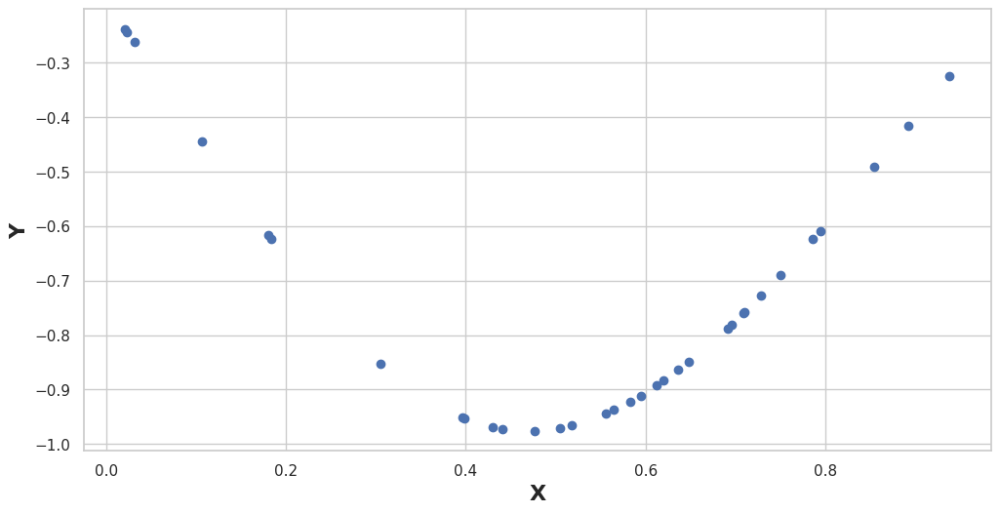

In [17]:
pred = model.predict(X_validation)
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(X_validation, pred, "ob", label="test")
plt.xlabel('X', weight="bold", fontsize=16)
plt.ylabel('Y', weight="bold", fontsize=16)

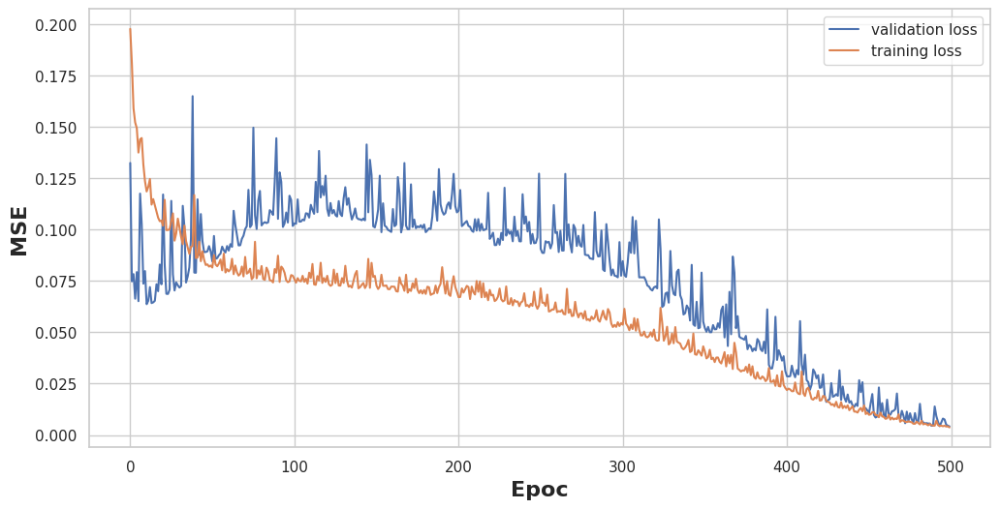

In [18]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(history.history["val_loss"], label="validation loss")
plt.plot(history.history["loss"], label="training loss")
plt.xlabel("Epoc", weight="bold", fontsize=16)
plt.ylabel("MSE", weight="bold", fontsize=16)
plt.legend()

## California dataset: Regresión

Ahora vamos con un [dataset](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_california_housing.html) más complicado, el dataset del precio medio por cuadra de casas en un distrito de california

In [19]:
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score

In [20]:
california = fetch_california_housing()
california_df = pd.DataFrame(california.data, columns=california.feature_names)

In [21]:
california

{'data': array([[   8.3252    ,   41.        ,    6.98412698, ...,    2.55555556,
           37.88      , -122.23      ],
        [   8.3014    ,   21.        ,    6.23813708, ...,    2.10984183,
           37.86      , -122.22      ],
        [   7.2574    ,   52.        ,    8.28813559, ...,    2.80225989,
           37.85      , -122.24      ],
        ...,
        [   1.7       ,   17.        ,    5.20554273, ...,    2.3256351 ,
           39.43      , -121.22      ],
        [   1.8672    ,   18.        ,    5.32951289, ...,    2.12320917,
           39.43      , -121.32      ],
        [   2.3886    ,   16.        ,    5.25471698, ...,    2.61698113,
           39.37      , -121.24      ]]),
 'target': array([4.526, 3.585, 3.521, ..., 0.923, 0.847, 0.894]),
 'frame': None,
 'target_names': ['MedHouseVal'],
 'feature_names': ['MedInc',
  'HouseAge',
  'AveRooms',
  'AveBedrms',
  'Population',
  'AveOccup',
  'Latitude',
  'Longitude'],
 'DESCR': '.. _california_housing_dataset:\n

In [22]:
california.feature_names

['MedInc',
 'HouseAge',
 'AveRooms',
 'AveBedrms',
 'Population',
 'AveOccup',
 'Latitude',
 'Longitude']

Las variables que contiene el dataset son:

* MedInc: ingreso medio de las personas que viven en esa cuadra
* HouseAge: edad media de las casas de esa cuadra
* AveRooms: número medio de ambientes
* AveBedrms número medio de habitaciones
* Population: cantidad de habitantes en la cuadra
* AveOccup: número medio de habitantes en la casa
* Latitude: latitud de la cuadra
* Longitude: longitud de la cuadra


* MedHouseVal:valor medio de las casas.

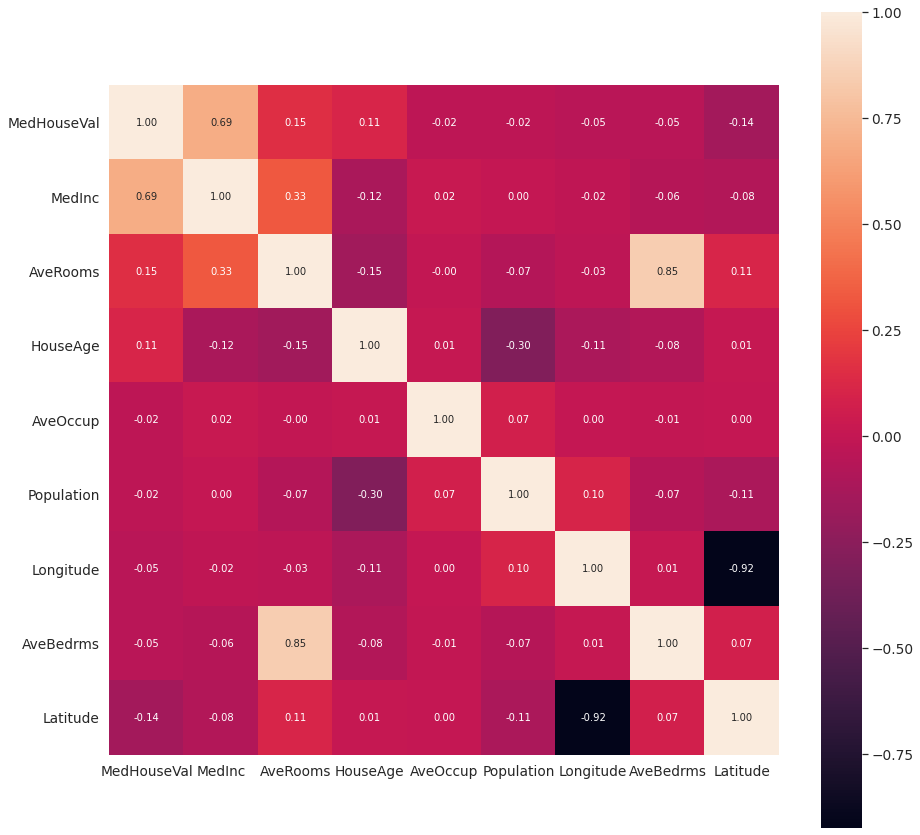

In [23]:
california_df['MedHouseVal'] = california.target
corrmat = california_df.corr()
k = 9  # number of variables for heatmap
cols = corrmat.nlargest(k, 'MedHouseVal')['MedHouseVal'].index
cm = np.corrcoef(california_df[cols].values.T)
sns.set(font_scale=1.25)
fig, ax = plt.subplots(figsize=(15, 15))
hm = sns.heatmap(
    cm,
    cbar=True,
    annot=True,
    square=True,
    fmt='.2f',
    annot_kws={'size': 10},
    yticklabels=cols.values,
    xticklabels=cols.values,
)

plt.show()

<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

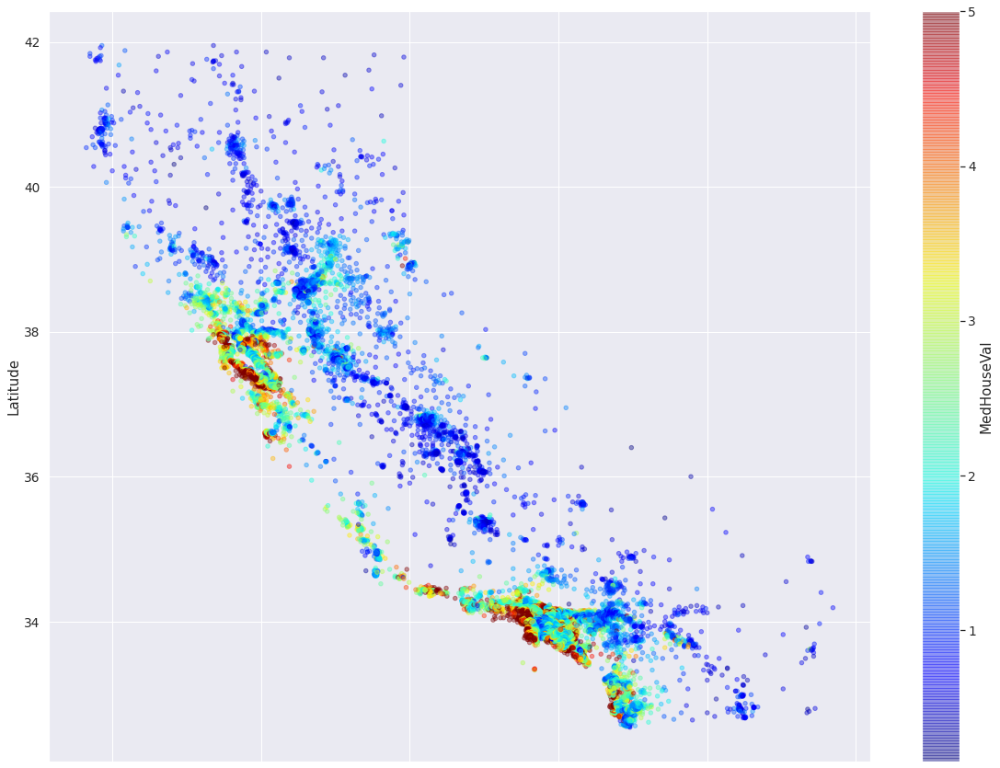

In [24]:
california_df.plot(
    kind="scatter",
    x="Longitude",
    y="Latitude",
    alpha=0.4,
    c="MedHouseVal",
    figsize=(20, 15),
    cmap=plt.get_cmap("jet"),
    colorbar=True,
)

In [25]:
california_df

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422
...,...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09,0.781
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21,0.771
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22,0.923
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32,0.847


Text(0, 0.5, 'Counts')

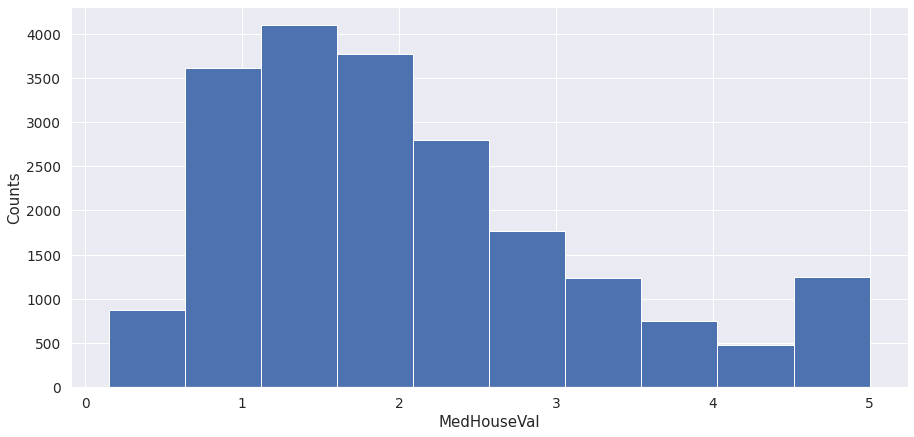

In [26]:
fig = plt.figure(figsize=(15, 7))
california_df["MedHouseVal"].hist()
plt.xlabel("MedHouseVal")
plt.ylabel("Counts")

Vamos a usar el StandardScaler y luego empezar a entrenar modelos y ver qué onda.

In [27]:
scaler = preprocessing.StandardScaler()
scaler.fit(california_df)
scaled_df = scaler.transform(california_df)
names = california_df.columns
scaled_california_df = pd.DataFrame(scaled_df, columns=names)

Entreno el modelo más simple: una regresión lineal

In [28]:
X = scaled_california_df.drop("MedHouseVal", axis=1)
y = scaled_california_df.filter(items=["MedHouseVal"])

linreg = LinearRegression()
rmse = np.sqrt(
    -cross_val_score(LinearRegression(), X, y, scoring="neg_mean_squared_error", cv=5)
)
rmse.mean()

0.6464066254204867

In [29]:
linreg = LinearRegression()
linreg.fit(X, y)
linreg.coef_[0]

array([ 0.71895227,  0.10291078, -0.23010693,  0.26491789, -0.00390232,
       -0.03408034, -0.77984545, -0.75441522])

Podemos ver la importancia tiene cada variable:

In [30]:
coeficientes = pd.DataFrame(
    {'Feature': X.columns, 'Beta': linreg.coef_[0]}, columns=['Feature', 'Beta']
)
coeficientes.sort_values(by=['Beta'])

,Feature,Beta
6,Latitude,-0.779845
7,Longitude,-0.754415
2,AveRooms,-0.230107
5,AveOccup,-0.034080
4,Population,-0.003902
1,HouseAge,0.102911
3,AveBedrms,0.264918
0,MedInc,0.718952


In [31]:
y_pred = linreg.predict(X)

(-3.0, 6.0)

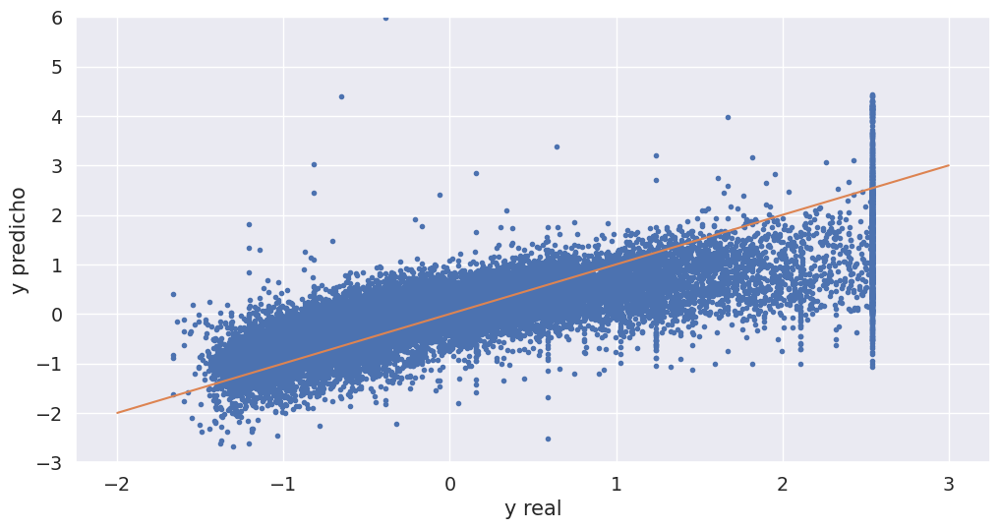

In [32]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(y, y_pred, ".")
plt.xlabel("y real")
plt.ylabel("y predicho")
plt.plot(range(-2, 4), range(-2, 4))
plt.ylim(-3, 6)

In [33]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42
)

In [34]:
model = Sequential()

In [35]:
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(1, activation='linear'))

In [36]:
opt = keras.optimizers.SGD(lr=0.1)
model.compile(loss='mse', optimizer=opt)

Podemos usar .summary() para ver el modelo: capas, parámetros etc

In [37]:
model.summary()

history = model.fit(
    X_train.values,
    y_train.values,
    epochs=100,
    validation_data=(X_test.values, y_test.values),
)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 10)                90        
_________________________________________________________________
dense_6 (Dense)              (None, 1)                 11        
Total params: 101
Trainable params: 101
Non-trainable params: 0
_________________________________________________________________
Train on 12384 samples, validate on 8256 samples
Epoch 1/100


   32/12384 [..............................] - ETA: 17s - loss: 1.1513

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.4945 

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.4251

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.3897

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.3795

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.3689

10208/12384 [=======================>......] - ETA: 0s - loss: 0.3682

11680/12384 [===========================>..] - ETA: 0s - loss: 0.3626

12384/12384 [==============================] - 1s 51us/step - loss: 0.3601 - val_loss: 0.3336


Epoch 2/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2715

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.3169

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.3158

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.3197

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.3163

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.3139

10112/12384 [=======================>......] - ETA: 0s - loss: 0.3142

11808/12384 [===========================>..] - ETA: 0s - loss: 0.3139

12384/12384 [==============================] - 1s 46us/step - loss: 0.3141 - val_loss: 0.3117


Epoch 3/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3221

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.3093

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2901

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.3061

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.3052

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.3098

10048/12384 [=======================>......] - ETA: 0s - loss: 0.3053

11712/12384 [===========================>..] - ETA: 0s - loss: 0.3016

12384/12384 [==============================] - 1s 45us/step - loss: 0.3026 - val_loss: 0.3132


Epoch 4/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3687

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.3249

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.3010

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.3042

 7040/12384 [================>.............] - ETA: 0s - loss: 0.3045

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2990

10496/12384 [========================>.....] - ETA: 0s - loss: 0.3011

12288/12384 [============================>.] - ETA: 0s - loss: 0.2979

12384/12384 [==============================] - 1s 45us/step - loss: 0.2980 - val_loss: 0.3084


Epoch 5/100
   32/12384 [..............................] - ETA: 1s - loss: 0.7767

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2792

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2845

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2858

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2901

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2950

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2943

12384/12384 [==============================] - 1s 43us/step - loss: 0.2938 - val_loss: 0.3154


Epoch 6/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2768

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2920

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2792

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2865

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2850

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2842

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2901

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2912

12384/12384 [==============================] - 1s 44us/step - loss: 0.2906 - val_loss: 0.2954


Epoch 7/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4347

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2720

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2766

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2821

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2925

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2863

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2935

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2919

12384/12384 [==============================] - 1s 46us/step - loss: 0.2901 - val_loss: 0.2952


Epoch 8/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2085

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2900

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2848

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2865

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2804

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2844

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2859

12288/12384 [============================>.] - ETA: 0s - loss: 0.2855

12384/12384 [==============================] - 1s 44us/step - loss: 0.2856 - val_loss: 0.2950


Epoch 9/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4710

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2761

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2721

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2749

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2816

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2872

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2850

12384/12384 [==============================] - 1s 44us/step - loss: 0.2852 - val_loss: 0.2987


Epoch 10/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1686

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.3032

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2956

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2840

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2806

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2826

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2869

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2849

12384/12384 [==============================] - 1s 45us/step - loss: 0.2848 - val_loss: 0.2920


Epoch 11/100


   32/12384 [..............................] - ETA: 0s - loss: 0.2006

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2956

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2894

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2868

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2956

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2892

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2838

12160/12384 [============================>.] - ETA: 0s - loss: 0.2826

12384/12384 [==============================] - 1s 44us/step - loss: 0.2824 - val_loss: 0.2927


Epoch 12/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4083

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2689

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2725

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2831

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2752

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2798



 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2799

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2812

12384/12384 [==============================] - 1s 47us/step - loss: 0.2815 - val_loss: 0.2882


Epoch 13/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2818

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2838

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2874

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2805

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2777

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2782

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2784

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2834

12384/12384 [==============================] - 1s 45us/step - loss: 0.2806 - val_loss: 0.2952


Epoch 14/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1386

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2900

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2861

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2947

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2894

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2842

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2848

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2824

12384/12384 [==============================] - 1s 45us/step - loss: 0.2812 - val_loss: 0.2882


Epoch 15/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2004

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2778

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2733

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2755

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2761

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2830

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2817

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2809

12384/12384 [==============================] - 1s 47us/step - loss: 0.2815 - val_loss: 0.2921


Epoch 16/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4004

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2758

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2752

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2867

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2906

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2878

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2803

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2787

12384/12384 [==============================] - 1s 46us/step - loss: 0.2785 - val_loss: 0.2923


Epoch 17/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2803

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2908

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2915

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2801

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2816

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2781

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2766

12064/12384 [============================>.] - ETA: 0s - loss: 0.2766

12384/12384 [==============================] - 1s 45us/step - loss: 0.2768 - val_loss: 0.2836


Epoch 18/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2955

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3008

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2996

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2851

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2800

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2786

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2779

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2777

12384/12384 [==============================] - 1s 45us/step - loss: 0.2763 - val_loss: 0.2811


Epoch 19/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2486

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2722

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2710

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2691

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2670

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2735

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2746

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2742

12384/12384 [==============================] - 1s 46us/step - loss: 0.2751 - val_loss: 0.2800


Epoch 20/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1850

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2715

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2706

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2652

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2769

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2762

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2742

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2715

12384/12384 [==============================] - 1s 44us/step - loss: 0.2727 - val_loss: 0.2803


Epoch 21/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1762

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2536

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2790

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2769

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2751

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2748

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2734

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2725

12384/12384 [==============================] - 1s 48us/step - loss: 0.2719 - val_loss: 0.2782


Epoch 22/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4488

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2929

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2751

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2774

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2781

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2791

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2723

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2729

12384/12384 [==============================] - 1s 48us/step - loss: 0.2709 - val_loss: 0.2872


Epoch 23/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3165

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2955

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2754

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2696

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2725

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2756

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2709



11264/12384 [==========================>...] - ETA: 0s - loss: 0.2701

12384/12384 [==============================] - 1s 46us/step - loss: 0.2700 - val_loss: 0.2887


Epoch 24/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3783

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2555

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2666

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2630

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2684

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2656

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2678

12256/12384 [============================>.] - ETA: 0s - loss: 0.2691

12384/12384 [==============================] - 1s 45us/step - loss: 0.2706 - val_loss: 0.2803


Epoch 25/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3227

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2981

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2882

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2827

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2804

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2738

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2689

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2683

12384/12384 [==============================] - 1s 47us/step - loss: 0.2691 - val_loss: 0.2842


Epoch 26/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2194

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2519

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2680

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2702

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2665

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2669

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2709

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2708

12384/12384 [==============================] - 1s 46us/step - loss: 0.2690 - val_loss: 0.2748


Epoch 27/100
   32/12384 [..............................] - ETA: 2s - loss: 0.3767

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.3021

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2666

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2625

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2639

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2659

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2663

12064/12384 [============================>.] - ETA: 0s - loss: 0.2673

12384/12384 [==============================] - 1s 45us/step - loss: 0.2681 - val_loss: 0.2800


Epoch 28/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3564

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2435

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2574

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2559

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2590

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2641

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2644

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2668

12384/12384 [==============================] - 1s 47us/step - loss: 0.2683 - val_loss: 0.2930


Epoch 29/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2438

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2794

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2850

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2690

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2647

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2628

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2674

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2679

12384/12384 [==============================] - 1s 44us/step - loss: 0.2669 - val_loss: 0.2766


Epoch 30/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3091

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2977

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2727

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2685

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2675

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2651

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2630

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2627

12384/12384 [==============================] - 1s 45us/step - loss: 0.2661 - val_loss: 0.2857


Epoch 31/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1763

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2256

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2445

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2630

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2670

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2654

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2670

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2662

12384/12384 [==============================] - 1s 46us/step - loss: 0.2670 - val_loss: 0.2764


Epoch 32/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2817

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2751

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2583

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2595

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2622

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2615

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2608

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2608

12384/12384 [==============================] - 1s 46us/step - loss: 0.2643 - val_loss: 0.2759


Epoch 33/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3011

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2522

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2617

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2709

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2733

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2677

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2686

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2664

12384/12384 [==============================] - 1s 46us/step - loss: 0.2653 - val_loss: 0.3031


Epoch 34/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1321

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2573

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2522

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2523

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2597



 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2624

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2642

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2650

12384/12384 [==============================] - 1s 45us/step - loss: 0.2640 - val_loss: 0.2742


Epoch 35/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1766

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2676

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2572

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2604

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2560

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2568

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2602

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2660

12384/12384 [==============================] - 1s 45us/step - loss: 0.2655 - val_loss: 0.2774


Epoch 36/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0919

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2545

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2514

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2513

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2546

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2597

10656/12384 [========================>.....]

 - ETA: 0s - loss: 0.2595

12288/12384 [============================>.] - ETA: 0s - loss: 0.2626

12384/12384 [==============================] - 1s 43us/step - loss: 0.2631 - val_loss: 0.2728


Epoch 37/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2588

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2540

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2607

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2532

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2560

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2607

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2611

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2649

12384/12384 [==============================] - 1s 45us/step - loss: 0.2644 - val_loss: 0.2717


Epoch 38/100
   32/12384 [..............................] - ETA: 2s - loss: 0.2291

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2438

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2528

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2518

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2639

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2633

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2598

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2636

12384/12384 [==============================] - 1s 46us/step - loss: 0.2634 - val_loss: 0.2814


Epoch 39/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4043

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2806

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2588

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2562

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2612

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2622

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2651

12384/12384 [==============================] - 1s 42us/step - loss: 0.2624 - val_loss: 0.2756


Epoch 40/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2156

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2403

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2509

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2598

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2609

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2631

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2625

12192/12384 [============================>.] - ETA: 0s - loss: 0.2644

12384/12384 [==============================] - 1s 45us/step - loss: 0.2632 - val_loss: 0.2693


Epoch 41/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3619

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2575

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2682

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2664

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2686

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2659

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2689

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2674

12384/12384 [==============================] - 1s 46us/step - loss: 0.2637 - val_loss: 0.2704


Epoch 42/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2594

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2447

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2592

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2651

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2656

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2602

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2589

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2592

12384/12384 [==============================] - 1s 46us/step - loss: 0.2622 - val_loss: 0.2811


Epoch 43/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2876

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2618

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2738

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2708

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2615

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2578

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2618

12160/12384 [============================>.] - ETA: 0s - loss: 0.2624

12384/12384 [==============================] - 1s 44us/step - loss: 0.2620 - val_loss: 0.2748


Epoch 44/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3335

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2516

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2615

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2620

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2587

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2617

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2587

12096/12384 [============================>.] - ETA: 0s - loss: 0.2620

12384/12384 [==============================] - 1s 45us/step - loss: 0.2618 - val_loss: 0.2690


Epoch 45/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2809

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2705

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2681

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2705

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2692

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2596

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2605

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2629

12384/12384 [==============================] - 1s 45us/step - loss: 0.2613 - val_loss: 0.2714


Epoch 46/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2292

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2706

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2498

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2610

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2599

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2627

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2663

12000/12384 [============================>.] - ETA: 0s - loss: 0.2637

12384/12384 [==============================] - 1s 43us/step - loss: 0.2618 - val_loss: 0.2707


Epoch 47/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3239

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2880

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2579

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2633

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2642

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2667

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2613

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2610

12384/12384 [==============================] - 1s 45us/step - loss: 0.2602 - val_loss: 0.2674


Epoch 48/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2533

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2641

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2576

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2620

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2641

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2612

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2607

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2577

12384/12384 [==============================] - 1s 44us/step - loss: 0.2593 - val_loss: 0.2718


Epoch 49/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2735

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2450

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2501

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2556

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2631

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2597

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2579

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2594

12384/12384 [==============================] - 1s 46us/step - loss: 0.2596 - val_loss: 0.2656


Epoch 50/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1204

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2261

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2459

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2488

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2512

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2522

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2564

12288/12384 [============================>.] - ETA: 0s - loss: 0.2562

12384/12384 [==============================] - 1s 45us/step - loss: 0.2567 - val_loss: 0.2679


Epoch 51/100


   32/12384 [..............................] - ETA: 1s - loss: 0.1782

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2484

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2552

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2513

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2576

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2589

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2564

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2570

12384/12384 [==============================] - 1s 45us/step - loss: 0.2561 - val_loss: 0.2705


Epoch 52/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2296

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2742

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2668

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2608

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2594

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2583

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2559

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2538

12384/12384 [==============================] - 1s 47us/step - loss: 0.2554 - val_loss: 0.2645


Epoch 53/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0788

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2729

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2584

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2655

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2610

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2578



11008/12384 [=========================>....] - ETA: 0s - loss: 0.2575

12384/12384 [==============================] - 1s 42us/step - loss: 0.2546 - val_loss: 0.2569


Epoch 54/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3414

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2753

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2500

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2528

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2528

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2539

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2578

12000/12384 [============================>.] - ETA: 0s - loss: 0.2547

12384/12384 [==============================] - 1s 45us/step - loss: 0.2526 - val_loss: 0.2725


Epoch 55/100


   32/12384 [..............................] - ETA: 1s - loss: 0.1872

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2363

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2413

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2448

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2523

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2516

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2513

12384/12384 [==============================] - 1s 43us/step - loss: 0.2524 - val_loss: 0.2706


Epoch 56/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1891

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2347

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2273

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2377

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2464

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2457

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2497

12000/12384 [============================>.] - ETA: 0s - loss: 0.2522

12384/12384 [==============================] - 1s 45us/step - loss: 0.2513 - val_loss: 0.2613


Epoch 57/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3031

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2530

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2427

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2470

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2524

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2512

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2513

12384/12384 [==============================] - 1s 42us/step - loss: 0.2510 - val_loss: 0.2569


Epoch 58/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2309

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2447

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2462

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2468

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2460

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2447

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2476

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2464

12384/12384 [==============================] - 1s 45us/step - loss: 0.2500 - val_loss: 0.2624


Epoch 59/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1429

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2251

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2398

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2392

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2442

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2428

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2469

12224/12384 [============================>.] - ETA: 0s - loss: 0.2501

12384/12384 [==============================] - 1s 43us/step - loss: 0.2501 - val_loss: 0.2632


Epoch 60/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1566

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2418

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2536

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2489

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2556

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2528

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2487

12160/12384 [============================>.] - ETA: 0s - loss: 0.2491

12384/12384 [==============================] - 1s 44us/step - loss: 0.2497 - val_loss: 0.2847


Epoch 61/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4053

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2575

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2514

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2500

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2476

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2476

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2514

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2477

12384/12384 [==============================] - 1s 45us/step - loss: 0.2487 - val_loss: 0.2555


Epoch 62/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1817

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2304

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2494

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2480

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2419

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2427

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2478

12384/12384 [==============================] - 1s 43us/step - loss: 0.2482 - val_loss: 0.2562


Epoch 63/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2521

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2290

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2347

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2320

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2423

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2478

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2487

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2490

12384/12384 [==============================] - 1s 46us/step - loss: 0.2488 - val_loss: 0.2566


Epoch 64/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3544

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2476

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2505

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2467

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2435

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2456

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2440

12000/12384 [============================>.] - ETA: 0s - loss: 0.2478

12384/12384 [==============================] - 1s 43us/step - loss: 0.2476 - val_loss: 0.2520


Epoch 65/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2536

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2384

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2423

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2358

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2421

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2447

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2420

12384/12384 [==============================] - 1s 43us/step - loss: 0.2457 - val_loss: 0.2533


Epoch 66/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2202

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2266

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2479

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2406

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2424

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2423

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2423

12224/12384 [============================>.] - ETA: 0s - loss: 0.2452

12384/12384 [==============================] - 1s 44us/step - loss: 0.2458 - val_loss: 0.2611


Epoch 67/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2780

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2494

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2522

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2523

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2509

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2518

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2445

12096/12384 [============================>.] - ETA: 0s - loss: 0.2460

12384/12384 [==============================] - 1s 44us/step - loss: 0.2464 - val_loss: 0.2571


Epoch 68/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3540

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2629

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2411

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2449

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2455

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2486

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2490

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2459

12384/12384 [==============================] - 1s 44us/step - loss: 0.2462 - val_loss: 0.2579


Epoch 69/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3503

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2611

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2532

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2565

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2506

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2465

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2452

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2471

12384/12384 [==============================] - 1s 47us/step - loss: 0.2459 - val_loss: 0.2535


Epoch 70/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2564

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2641

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2423

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2419

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2461

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2474

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2426

12096/12384 [============================>.] - ETA: 0s - loss: 0.2450

12384/12384 [==============================] - 1s 45us/step - loss: 0.2451 - val_loss: 0.2592


Epoch 71/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1865

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2372

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2457

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2491

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2478

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2494

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2509

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2500

12384/12384 [==============================] - 1s 47us/step - loss: 0.2459 - val_loss: 0.2515


Epoch 72/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3669

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2588

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2683

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2556

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2568

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2497

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2477

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2448

12384/12384 [==============================] - 1s 45us/step - loss: 0.2435 - val_loss: 0.2503


Epoch 73/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2104

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2630

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2473

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2464

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2431

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2402

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2435

12384/12384 [==============================] - 1s 42us/step - loss: 0.2442 - val_loss: 0.2509


Epoch 74/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4242

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2525

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2491

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2451

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2511

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2493

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2444

12352/12384 [============================>.] - ETA: 0s - loss: 0.2442

12384/12384 [==============================] - 1s 43us/step - loss: 0.2445 - val_loss: 0.2707


Epoch 75/100
   32/12384 [..............................] - ETA: 0s - loss: 0.5029

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2530

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2440

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2419

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2407

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2410

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2490

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2455

12384/12384 [==============================] - 1s 45us/step - loss: 0.2443 - val_loss: 0.2819


Epoch 76/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2710

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2023

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2192

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2313

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2385

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2380

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2417

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2443

12384/12384 [==============================] - 1s 45us/step - loss: 0.2443 - val_loss: 0.2592


Epoch 77/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2528

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2323

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2429

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2496

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2506

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2456

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2464

12032/12384 [============================>.] - ETA: 0s - loss: 0.2457

12384/12384 [==============================] - 1s 44us/step - loss: 0.2440 - val_loss: 0.2543


Epoch 78/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1045

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2327

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2247

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2340

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2359

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2423



 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2401

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2408

12384/12384 [==============================] - 1s 45us/step - loss: 0.2414 - val_loss: 0.2612


Epoch 79/100


   32/12384 [..............................] - ETA: 1s - loss: 0.2884

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2376

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2493

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2341

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2362

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2407

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2415

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2441

12384/12384 [==============================] - 1s 46us/step - loss: 0.2429 - val_loss: 0.2524


Epoch 80/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1624

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2492

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2426

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2353

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2353

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2434

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2411

12384/12384 [==============================] - 1s 43us/step - loss: 0.2428 - val_loss: 0.2482


Epoch 81/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3679

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2701

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2411

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2427

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2435

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2400

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2357

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2434

12384/12384 [==============================] - 1s 46us/step - loss: 0.2436 - val_loss: 0.2665


Epoch 82/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1822

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2115

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2192

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2358

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2420

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2404

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2416

12384/12384 [==============================] - 1s 44us/step - loss: 0.2441 - val_loss: 0.2483


Epoch 83/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1152

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2376

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2519

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2493

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2411

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2419

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2416

12288/12384 [============================>.] - ETA: 0s - loss: 0.2426

12384/12384 [==============================] - 1s 44us/step - loss: 0.2421 - val_loss: 0.2454


Epoch 84/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2894

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2493

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2455

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2501

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2480

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2480

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2461

12256/12384 [============================>.] - ETA: 0s - loss: 0.2427

12384/12384 [==============================] - 1s 44us/step - loss: 0.2421 - val_loss: 0.2492


Epoch 85/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0824

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2347

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2304

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2367

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2407

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2392

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2393

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2434

12384/12384 [==============================] - 1s 44us/step - loss: 0.2439 - val_loss: 0.2485


Epoch 86/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1398

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2195

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2282

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2359

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2359

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2436

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2392

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2410

12384/12384 [==============================] - 1s 46us/step - loss: 0.2404 - val_loss: 0.2610


Epoch 87/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3121

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2372

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2267

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2313

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2329

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2299

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2339

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2409

12384/12384 [==============================] - 1s 45us/step - loss: 0.2407 - val_loss: 0.2488


Epoch 88/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0825

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2263

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2442

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2484

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2434

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2428

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2460

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2423

12384/12384 [==============================] - 1s 46us/step - loss: 0.2396 - val_loss: 0.2493


Epoch 89/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2483

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2232

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2374

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2438

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2439

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2442

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2428

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2414

12384/12384 [==============================] - 1s 46us/step - loss: 0.2408 - val_loss: 0.2474


Epoch 90/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4749

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2345

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2314

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2332

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2385

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2449

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2397

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2383

12384/12384 [==============================] - 1s 44us/step - loss: 0.2408 - val_loss: 0.2467


Epoch 91/100
   32/12384 [..............................] - ETA: 0s - loss: 0.5856

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2553

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2527

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2469

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2428

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2409

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2432

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2420

12384/12384 [==============================] - 1s 45us/step - loss: 0.2414 - val_loss: 0.2437


Epoch 92/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1274

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2533

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2397

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2352

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2377

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2380

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2422

12096/12384 [============================>.] - ETA: 0s - loss: 0.2407

12384/12384 [==============================] - 1s 44us/step - loss: 0.2397 - val_loss: 0.2556


Epoch 93/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2474

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2220

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2403

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2329

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2382

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2409

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2421

12032/12384 [============================>.] - ETA: 0s - loss: 0.2414

12384/12384 [==============================] - 1s 45us/step - loss: 0.2418 - val_loss: 0.2484


Epoch 94/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2814

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2424

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2349

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2446

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2445

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2439

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2432

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2395

12384/12384 [==============================] - 1s 48us/step - loss: 0.2419 - val_loss: 0.2451


Epoch 95/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2464

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2470

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2428

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2400

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2357

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2349

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2352

12320/12384 [============================>.] - ETA: 0s - loss: 0.2391

12384/12384 [==============================] - 1s 43us/step - loss: 0.2393 - val_loss: 0.2563


Epoch 96/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3454

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2424

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2548

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2447

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2404

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2368

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2377

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2384

12384/12384 [==============================] - 1s 45us/step - loss: 0.2390 - val_loss: 0.2488


Epoch 97/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1178

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2121

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2235

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2204

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2258

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2364

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2324

12000/12384 [============================>.] - ETA: 0s - loss: 0.2381

12384/12384 [==============================] - 1s 44us/step - loss: 0.2395 - val_loss: 0.2638


Epoch 98/100


   32/12384 [..............................] - ETA: 2s - loss: 0.1091

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2418

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2339

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2418

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2441

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2433

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2426

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2399

12384/12384 [==============================] - 1s 45us/step - loss: 0.2400 - val_loss: 0.2523


Epoch 99/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1498

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2523

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2408

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2391

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2395

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2371

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2357

12384/12384 [==============================] - 1s 43us/step - loss: 0.2395 - val_loss: 0.2533


Epoch 100/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3783

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2384

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2364

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2449

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2400

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2444

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2454

12064/12384 [============================>.] - ETA: 0s - loss: 0.2376

12384/12384 [==============================] - 1s 44us/step - loss: 0.2389 - val_loss: 0.2526


In [38]:
y_pred_nn = model.predict(X_test.values)

(-3.0, 6.0)

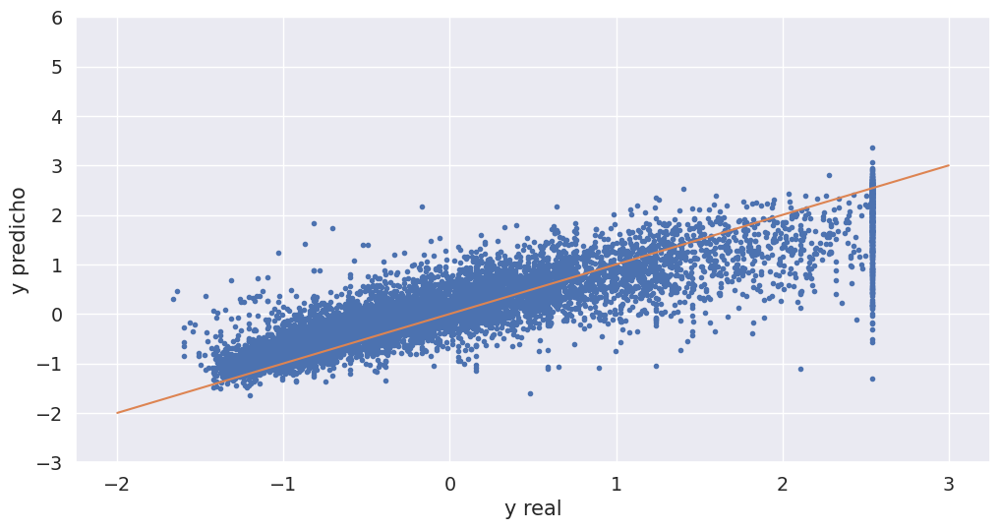

In [39]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(y_test, y_pred_nn, ".")
plt.plot(range(-2, 4), range(-2, 4))
plt.xlabel("y real")
plt.ylabel("y predicho")
plt.ylim(-3, 6)

In [40]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])

Ahora ploteamos el rmse del validation y training por época

Text(0.5, 0, 'Época')

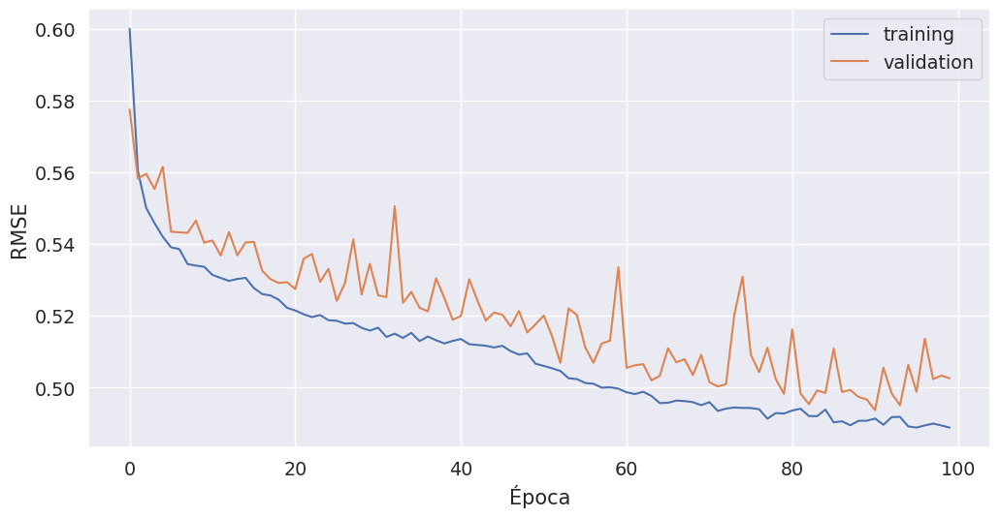

In [41]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss, label="training")
plt.plot(val_loss, label="validation")
plt.legend()
plt.ylabel("RMSE")
plt.xlabel("Época")

Vemos que salta bastante la loss durante el entrenamiento:

Qué podemos hacer para que salte menos? Qué es lo que controla la "velocidad del aprendizaje"?

Podemos bajar la tasa de aprendizaje

In [42]:
model = Sequential()
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.SGD(lr=0.05)
model.compile(loss='mse', optimizer=opt)

In [43]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=200,
    validation_data=(X_test.values, y_test.values),
)

Train on 12384 samples, validate on 8256 samples
Epoch 1/200
   32/12384 [..............................] - ETA: 17s - loss: 1.2655

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.6358 

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.5463

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.4958

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.4562

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.4278

10368/12384 [========================>.....] - ETA: 0s - loss: 0.4121

11840/12384 [===========================>..] - ETA: 0s - loss: 0.4047

12384/12384 [==============================] - 1s 50us/step - loss: 0.4026 - val_loss: 0.3400


Epoch 2/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2020

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3216

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.3345

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.3309

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.3293

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.3305

10464/12384 [========================>.....] - ETA: 0s - loss: 0.3290

12192/12384 [============================>.] - ETA: 0s - loss: 0.3230

12384/12384 [==============================] - 1s 45us/step - loss: 0.3225 - val_loss: 0.3291


Epoch 3/200


   32/12384 [..............................] - ETA: 0s - loss: 0.6297

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.3097

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.3042

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.3109

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.3143

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.3132

10432/12384 [========================>.....] - ETA: 0s - loss: 0.3108

12224/12384 [============================>.] - ETA: 0s - loss: 0.3110

12384/12384 [==============================] - 1s 44us/step - loss: 0.3105 - val_loss: 0.3159


Epoch 4/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2287

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.3197

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.3045

 5568/12384 [============>.................] - ETA: 0s - loss: 0.3076

 7232/12384 [================>.............] - ETA: 0s - loss: 0.3044

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.3040

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2997

12384/12384 [==============================] - 1s 43us/step - loss: 0.3051 - val_loss: 0.3152


Epoch 5/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1475

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2747

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.3192

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.3149

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.3080

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.3038

10688/12384 [========================>.....] - ETA: 0s - loss: 0.3010

12384/12384 [==============================] - 1s 42us/step - loss: 0.3003 - val_loss: 0.3088


Epoch 6/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4744

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2911

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.3065

 5376/12384 [============>.................] - ETA: 0s - loss: 0.3091

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.3099



 8512/12384 [===================>..........] - ETA: 0s - loss: 0.3061

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2996

12064/12384 [============================>.] - ETA: 0s - loss: 0.2989

12384/12384 [==============================] - 1s 45us/step - loss: 0.2985 - val_loss: 0.3081


Epoch 7/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2892

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2924

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2910

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2932

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2955

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2915

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2905

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2940

12384/12384 [==============================] - 1s 45us/step - loss: 0.2956 - val_loss: 0.3093


Epoch 8/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1388

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2936

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.3075

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.3131

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.3079

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.3002

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2981

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2936

12320/12384 [============================>.] - ETA: 0s - loss: 0.2933

12384/12384 [==============================] - 1s 48us/step - loss: 0.2933 - val_loss: 0.3074


Epoch 9/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4058

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2949

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.3004

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2910

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2879

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2851

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2862

12384/12384 [==============================] - 1s 42us/step - loss: 0.2919 - val_loss: 0.2985


Epoch 10/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2544

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2835

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2824

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2812

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2798



 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2836

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2822

12352/12384 [============================>.] - ETA: 0s - loss: 0.2886

12384/12384 [==============================] - 1s 43us/step - loss: 0.2893 - val_loss: 0.3093


Epoch 11/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2479

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.3031

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2876

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2934

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2911

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2832

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2837

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2872

12384/12384 [==============================] - 1s 45us/step - loss: 0.2877 - val_loss: 0.3073


Epoch 12/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2543

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2594

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2788

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2807

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2816

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2902

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2878

12192/12384 [============================>.] - ETA: 0s - loss: 0.2866

12384/12384 [==============================] - 1s 44us/step - loss: 0.2860 - val_loss: 0.3036


Epoch 13/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2745

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2929

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2761

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2756

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2837

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2821

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2811

12192/12384 [============================>.] - ETA: 0s - loss: 0.2834

12384/12384 [==============================] - 1s 45us/step - loss: 0.2846 - val_loss: 0.2984


Epoch 14/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3334

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2800

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2809

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2764

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2777

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2814

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2847

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2849

12384/12384 [==============================] - 1s 47us/step - loss: 0.2821 - val_loss: 0.2919


Epoch 15/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2010

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2660

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2693

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2739

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2717

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2758

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2776

12384/12384 [==============================] - 1s 41us/step - loss: 0.2796 - val_loss: 0.2999


Epoch 16/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1949

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2755

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2760

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2819

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2778

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2811

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2798

12384/12384 [==============================] - 1s 43us/step - loss: 0.2785 - val_loss: 0.2902


Epoch 17/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1690

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2540

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2673

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2739

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2714

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2741

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2754

12160/12384 [============================>.] - ETA: 0s - loss: 0.2747

12384/12384 [==============================] - 1s 43us/step - loss: 0.2739 - val_loss: 0.2909


Epoch 18/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1271

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3020

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2797

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2758

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2775

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2764

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2729

12320/12384 [============================>.] - ETA: 0s - loss: 0.2722

12384/12384 [==============================] - 1s 42us/step - loss: 0.2724 - val_loss: 0.2824


Epoch 19/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2221

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2723

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2780

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2705

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2721

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2661

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2664

12032/12384 [============================>.] - ETA: 0s - loss: 0.2680

12384/12384 [==============================] - 1s 43us/step - loss: 0.2698 - val_loss: 0.2831


Epoch 20/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4268

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2807

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2720

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2695

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2723

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2715

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2701

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2707

12384/12384 [==============================] - 1s 48us/step - loss: 0.2697 - val_loss: 0.2783


Epoch 21/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0951

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2693

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2634

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2699

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2632

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2710

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2678

12384/12384 [==============================] - 1s 43us/step - loss: 0.2680 - val_loss: 0.2841


Epoch 22/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1500

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2723

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2648

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2632

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2687

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2694

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2666

12128/12384 [============================>.] - ETA: 0s - loss: 0.2667

12384/12384 [==============================] - 1s 43us/step - loss: 0.2680 - val_loss: 0.2806


Epoch 23/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4625

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2615

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2532

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2669

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2626

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2631

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2626

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2651

12384/12384 [==============================] - 1s 45us/step - loss: 0.2659 - val_loss: 0.2755


Epoch 24/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2931

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2706

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2696

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2712

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2709

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2692

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2669

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2684

12384/12384 [==============================] - 1s 49us/step - loss: 0.2657 - val_loss: 0.2833


Epoch 25/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2600

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2837

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2721

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2663

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2667

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2672

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2671

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2640

12384/12384 [==============================] - 1s 45us/step - loss: 0.2646 - val_loss: 0.2771


Epoch 26/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2312

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2348

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2335

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2472

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2564

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2633

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2626

12096/12384 [============================>.] - ETA: 0s - loss: 0.2621

12384/12384 [==============================] - 1s 45us/step - loss: 0.2645 - val_loss: 0.2807


Epoch 27/200


   32/12384 [..............................] - ETA: 1s - loss: 0.3755

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2575

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2644

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2564

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2614

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2616

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2607

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2617

12384/12384 [==============================] - 1s 45us/step - loss: 0.2635 - val_loss: 0.2844


Epoch 28/200


   32/12384 [..............................] - ETA: 1s - loss: 0.5494

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2620

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2686

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2649

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2600

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2562

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2602

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2615

12384/12384 [==============================] - 1s 47us/step - loss: 0.2632 - val_loss: 0.2736


Epoch 29/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1092

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2527

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2681

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2630

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2624

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2723

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2691

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2638

12384/12384 [==============================] - 1s 52us/step - loss: 0.2624 - val_loss: 0.2833


Epoch 30/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3007

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2671

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2695

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2609

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2643

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2590

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2580

12224/12384 [============================>.] - ETA: 0s - loss: 0.2577

12384/12384 [==============================] - 1s 44us/step - loss: 0.2603 - val_loss: 0.2838


Epoch 31/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4493

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2756

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2746

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2598

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2580

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2598

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2620

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2614

12384/12384 [==============================] - 1s 47us/step - loss: 0.2614 - val_loss: 0.2711


Epoch 32/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3041

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2700

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2596

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2601

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2629

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2592

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2586

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2610

12384/12384 [==============================] - 1s 45us/step - loss: 0.2614 - val_loss: 0.2756


Epoch 33/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1225

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2376

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2492

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2534

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2612

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2581

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2577

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2582

12384/12384 [==============================] - 1s 45us/step - loss: 0.2599 - val_loss: 0.2690


Epoch 34/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3212

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2762

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2645

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2637

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2596

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2547

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2575

12320/12384 [============================>.] - ETA: 0s - loss: 0.2572

12384/12384 [==============================] - 1s 44us/step - loss: 0.2583 - val_loss: 0.2695


Epoch 35/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3319

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2617

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2616

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2643

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2668

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2601

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2632

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2617

12384/12384 [==============================] - 1s 48us/step - loss: 0.2593 - val_loss: 0.2757


Epoch 36/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3086

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2782

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2825

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2859

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2738

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2670

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2649

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2627

12384/12384 [==============================] - 1s 45us/step - loss: 0.2582 - val_loss: 0.2738


Epoch 37/200
   32/12384 [..............................] - ETA: 1s - loss: 0.8371

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2778

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2648

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2611

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2572

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2574

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2579

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2578

12384/12384 [==============================] - 1s 44us/step - loss: 0.2573 - val_loss: 0.2715


Epoch 38/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1617

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2571

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2517

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2530

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2567

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2579

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2570

12288/12384 [============================>.] - ETA: 0s - loss: 0.2567

12384/12384 [==============================] - 1s 43us/step - loss: 0.2568 - val_loss: 0.2683


Epoch 39/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2183

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2634

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2713

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2713

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2599

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2550

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2567

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2570

12384/12384 [==============================] - 1s 46us/step - loss: 0.2564 - val_loss: 0.2738


Epoch 40/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2111

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2551

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2676

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2622

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2577

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2574

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2577

12128/12384 [============================>.] - ETA: 0s - loss: 0.2557

12384/12384 [==============================] - 1s 43us/step - loss: 0.2555 - val_loss: 0.2647


Epoch 41/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2106

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2327

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2612

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2619

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2631

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2613

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2599

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2576

12384/12384 [==============================] - 1s 45us/step - loss: 0.2553 - val_loss: 0.2654


Epoch 42/200


   32/12384 [..............................] - ETA: 1s - loss: 0.2465

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2539

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2526

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2578

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2515

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2556

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2591

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2566

12384/12384 [==============================] - 1s 46us/step - loss: 0.2551 - val_loss: 0.2683


Epoch 43/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2849

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2577

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2553

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2537

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2565

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2556

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2551

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2550

12384/12384 [==============================] - 1s 45us/step - loss: 0.2545 - val_loss: 0.2639


Epoch 44/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2979

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2466

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2572

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2585

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2556

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2589

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2604

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2563

12384/12384 [==============================] - 1s 45us/step - loss: 0.2552 - val_loss: 0.2685


Epoch 45/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2641

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2495

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2506

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2487

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2539

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2555

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2546

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2538

12384/12384 [==============================] - 1s 47us/step - loss: 0.2538 - val_loss: 0.2697


Epoch 46/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0991

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2422

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2382

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2549

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2535

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2526

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2577

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2544

12384/12384 [==============================] - 1s 44us/step - loss: 0.2527 - val_loss: 0.2612


Epoch 47/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3823

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2445

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2504

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2519

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2490

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2454

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2504

12384/12384 [==============================] - 1s 43us/step - loss: 0.2529 - val_loss: 0.2599


Epoch 48/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1931

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2464

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2465

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2525

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2497

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2501

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2493

12192/12384 [============================>.] - ETA: 0s - loss: 0.2516

12384/12384 [==============================] - 1s 43us/step - loss: 0.2523 - val_loss: 0.2633


Epoch 49/200
   32/12384 [..............................] - ETA: 0s - loss: 0.6493

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2640

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2510

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2560

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2597

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2540

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2551

12000/12384 [============================>.] - ETA: 0s - loss: 0.2520

12384/12384 [==============================] - 1s 44us/step - loss: 0.2520 - val_loss: 0.2615


Epoch 50/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2351

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2692

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2617

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2571

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2522

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2519

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2504

12320/12384 [============================>.] - ETA: 0s - loss: 0.2507

12384/12384 [==============================] - 1s 46us/step - loss: 0.2510 - val_loss: 0.2628


Epoch 51/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1127

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2544

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2579

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2518

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2519

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2464

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2465

12192/12384 [============================>.] - ETA: 0s - loss: 0.2505

12384/12384 [==============================] - 1s 43us/step - loss: 0.2511 - val_loss: 0.2615


Epoch 52/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1688

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2434

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2459

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2399

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2476

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2562

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2565

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2522

12384/12384 [==============================] - 1s 47us/step - loss: 0.2509 - val_loss: 0.2605


Epoch 53/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1284

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2253

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2569

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2545

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2534

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2540

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2520

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2499

12384/12384 [==============================] - 1s 45us/step - loss: 0.2497 - val_loss: 0.2601


Epoch 54/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1612

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2310

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2348

 5504/12384 [============>.................] - ETA: 0s - loss: 0.2426

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2470

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2446

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2451

12384/12384 [==============================] - 1s 43us/step - loss: 0.2488 - val_loss: 0.2649


Epoch 55/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2264

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2545

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2414

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2432

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2420

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2440

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2454

12384/12384 [==============================] - 1s 42us/step - loss: 0.2480 - val_loss: 0.2802


Epoch 56/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3180

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2639

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2530

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2521

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2495

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2537

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2523

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2479

12384/12384 [==============================] - 1s 45us/step - loss: 0.2477 - val_loss: 0.2585


Epoch 57/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2992

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2506

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2514

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2515

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2460

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2430

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2409

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2439

12384/12384 [==============================] - 1s 48us/step - loss: 0.2461 - val_loss: 0.2612


Epoch 58/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1414

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2225

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2244

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2290

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2316

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2414

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2440

12032/12384 [============================>.] - ETA: 0s - loss: 0.2472

12384/12384 [==============================] - 1s 45us/step - loss: 0.2466 - val_loss: 0.2603


Epoch 59/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1590

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2495

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2439

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2450

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2446

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2459

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2423

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2444

12384/12384 [==============================] - 1s 46us/step - loss: 0.2463 - val_loss: 0.2646


Epoch 60/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2698

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2314

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2295

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2346

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2415

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2454

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2446

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2442

12384/12384 [==============================] - 1s 45us/step - loss: 0.2448 - val_loss: 0.2672


Epoch 61/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2147

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2247

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2338

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2358

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2366

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2373

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2389

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2433

12384/12384 [==============================] - 1s 47us/step - loss: 0.2460 - val_loss: 0.2553


Epoch 62/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2706

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2424

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2388

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2409

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2417

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2456

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2446

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2428



12384/12384 [==============================] - 1s 45us/step - loss: 0.2441 - val_loss: 0.2574


Epoch 63/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1778

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2287

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2352

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2434

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2458

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2447

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2460

12160/12384 [============================>.] - ETA: 0s - loss: 0.2444

12384/12384 [==============================] - 1s 46us/step - loss: 0.2447 - val_loss: 0.2562


Epoch 64/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1852

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.2773

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2622

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2621

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2537

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2457

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2440



11680/12384 [===========================>..] - ETA: 0s - loss: 0.2435

12384/12384 [==============================] - 1s 44us/step - loss: 0.2449 - val_loss: 0.2614


Epoch 65/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2165

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2413

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2360

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2407

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2473

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2465

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2442

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2440

12384/12384 [==============================] - 1s 44us/step - loss: 0.2441 - val_loss: 0.2597


Epoch 66/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1159

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2602

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2472

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2554

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2465

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2454

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2415

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2436

12384/12384 [==============================] - 1s 44us/step - loss: 0.2436 - val_loss: 0.2602


Epoch 67/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2569

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2424

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2455

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2434

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2415

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2422

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2425

12384/12384 [==============================] - 1s 44us/step - loss: 0.2432 - val_loss: 0.2762


Epoch 68/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3664

 1952/12384 [===>..........................] - ETA: 0s - loss: 0.2534

 3840/12384 [========>.....................] - ETA: 0s - loss: 0.2435

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2479

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2396

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2421

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2420

12384/12384 [==============================] - 1s 43us/step - loss: 0.2427 - val_loss: 0.2551


Epoch 69/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3364

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2382

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2466

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2450

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2449

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2434

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2447

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2443

12384/12384 [==============================] - 1s 46us/step - loss: 0.2439 - val_loss: 0.2562


Epoch 70/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2770

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2634

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2658

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2512

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2470

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2478

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2451

12224/12384 [============================>.] - ETA: 0s - loss: 0.2446

12384/12384 [==============================] - 1s 44us/step - loss: 0.2442 - val_loss: 0.2547


Epoch 71/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2302

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2333

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2290

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2349

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2349

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2361

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2378

12096/12384 [============================>.] - ETA: 0s - loss: 0.2414

12384/12384 [==============================] - 1s 44us/step - loss: 0.2432 - val_loss: 0.2564


Epoch 72/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0980

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2241

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2276

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2263

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2307

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2350

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2351

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2415

12384/12384 [==============================] - 1s 44us/step - loss: 0.2422 - val_loss: 0.2542


Epoch 73/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2228

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2190

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2369

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2337

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2398

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2409

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2448

12384/12384 [==============================] - 1s 44us/step - loss: 0.2418 - val_loss: 0.2568


Epoch 74/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2233

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2524

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2522

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2464

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2405

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2377

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2401

12160/12384 [============================>.] - ETA: 0s - loss: 0.2428

12384/12384 [==============================] - 1s 45us/step - loss: 0.2426 - val_loss: 0.2649


Epoch 75/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2150

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2674

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2553

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2448

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2415

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2401

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2386

12128/12384 [============================>.] - ETA: 0s - loss: 0.2425

12384/12384 [==============================] - 1s 45us/step - loss: 0.2425 - val_loss: 0.2568


Epoch 76/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2935

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2608

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2438

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2465

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2456

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2426

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2446

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2430

12384/12384 [==============================] - 1s 47us/step - loss: 0.2415 - val_loss: 0.2656


Epoch 77/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4715

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2413

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2363

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2341

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2434

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2420

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2435

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2417

12384/12384 [==============================] - 1s 45us/step - loss: 0.2416 - val_loss: 0.2536


Epoch 78/200


   32/12384 [..............................] - ETA: 2s - loss: 0.2692

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2311

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2414

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2348

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2350

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2390

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2438

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2453

12384/12384 [==============================] - 1s 46us/step - loss: 0.2461 - val_loss: 0.2617


Epoch 79/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1779

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2426

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2370

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2369

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2362

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2424

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2407

12384/12384 [==============================] - 1s 43us/step - loss: 0.2420 - val_loss: 0.2531


Epoch 80/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1287

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2396

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2354

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2277

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2355

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2416

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2414

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2438

12384/12384 [==============================] - 1s 44us/step - loss: 0.2427 - val_loss: 0.2569


Epoch 81/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3271

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2408

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2419

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2366

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2392

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2429

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2444

12160/12384 [============================>.] - ETA: 0s - loss: 0.2441

12384/12384 [==============================] - 1s 45us/step - loss: 0.2433 - val_loss: 0.2508


Epoch 82/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1828

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2751

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2603

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2473

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2426

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2401

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2394

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2421

12384/12384 [==============================] - 1s 45us/step - loss: 0.2407 - val_loss: 0.2502


Epoch 83/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1512

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2567

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2435

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2357

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2385

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2448

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2415

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2421

12384/12384 [==============================] - 1s 45us/step - loss: 0.2408 - val_loss: 0.2578


Epoch 84/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1605

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2413

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2496

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2431

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2468

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2462

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2438

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2414

12384/12384 [==============================] - 1s 47us/step - loss: 0.2398 - val_loss: 0.2509


Epoch 85/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2882

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2176

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2368

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2331

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2368

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2412

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2416

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2403

12384/12384 [==============================] - 1s 46us/step - loss: 0.2410 - val_loss: 0.2500


Epoch 86/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1476

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2390

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2350

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2321

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2341

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2318

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2390

12256/12384 [============================>.] - ETA: 0s - loss: 0.2402

12384/12384 [==============================] - 1s 45us/step - loss: 0.2411 - val_loss: 0.2524


Epoch 87/200


   32/12384 [..............................] - ETA: 0s - loss: 0.1363

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2446

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2473

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2441

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2519

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2458

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2417

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2405

12384/12384 [==============================] - 1s 45us/step - loss: 0.2404 - val_loss: 0.2542


Epoch 88/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0852

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2464

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2386

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2404

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2393



 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2389

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2384

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2395

12384/12384 [==============================] - 1s 45us/step - loss: 0.2407 - val_loss: 0.2541


Epoch 89/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2582

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2447

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2418

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2374

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2312

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2354

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2393

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2407

12384/12384 [==============================] - 1s 45us/step - loss: 0.2404 - val_loss: 0.2552


Epoch 90/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4162

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2361

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2324

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2464

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2435

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2373

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2360

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2405

12384/12384 [==============================] - 1s 43us/step - loss: 0.2405 - val_loss: 0.2610


Epoch 91/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2016

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2572

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2591

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2552

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2519

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2476

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2420

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2422

12384/12384 [==============================] - 1s 45us/step - loss: 0.2404 - val_loss: 0.2511


Epoch 92/200


   32/12384 [..............................] - ETA: 1s - loss: 0.2263

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2287

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2398

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2501

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2425

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2403

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2400

12288/12384 [============================>.] - ETA: 0s - loss: 0.2391

12384/12384 [==============================] - 1s 43us/step - loss: 0.2391 - val_loss: 0.2541


Epoch 93/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2031

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2344

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2422

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2399

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2403

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2357

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2347

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2398

12384/12384 [==============================] - 1s 45us/step - loss: 0.2411 - val_loss: 0.2717


Epoch 94/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1771

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2819

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2493

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2560

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2544

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2476

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2411

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2436

12384/12384 [==============================] - 1s 44us/step - loss: 0.2434 - val_loss: 0.2731


Epoch 95/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1809

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2115

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2281

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2467

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2428

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2409

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2437

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2401

12384/12384 [==============================] - 1s 46us/step - loss: 0.2395 - val_loss: 0.2549


Epoch 96/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2136

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2411

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2463

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2367

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2426

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2407

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2391

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2394

12384/12384 [==============================] - 1s 47us/step - loss: 0.2394 - val_loss: 0.2503


Epoch 97/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1810

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2352

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2298

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2352

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2367

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2364

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2365

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2364

12384/12384 [==============================] - 1s 47us/step - loss: 0.2390 - val_loss: 0.2630


Epoch 98/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5006

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2442

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2398

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2356

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2358

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2416

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2414

12384/12384 [==============================] - 1s 42us/step - loss: 0.2420 - val_loss: 0.2542


Epoch 99/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3755

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2393

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2413

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2320

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2350

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2372

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2372

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2402

12384/12384 [==============================] - 1s 46us/step - loss: 0.2394 - val_loss: 0.2617


Epoch 100/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2397

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2366

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2488

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2456

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2393

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2451

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2416

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2387

12384/12384 [==============================] - 1s 47us/step - loss: 0.2398 - val_loss: 0.2493


Epoch 101/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1430

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2476

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2410

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2316

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2377

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2411

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2440

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2394

12384/12384 [==============================] - 1s 46us/step - loss: 0.2388 - val_loss: 0.2500


Epoch 102/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2319

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2611

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2392

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2378

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2394

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2403

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2434

12064/12384 [============================>.] - ETA: 0s - loss: 0.2393

12384/12384 [==============================] - 1s 43us/step - loss: 0.2397 - val_loss: 0.2478


Epoch 103/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1343

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2345

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2383

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2335

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2356

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2350

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2388

12128/12384 [============================>.] - ETA: 0s - loss: 0.2391

12384/12384 [==============================] - 1s 44us/step - loss: 0.2385 - val_loss: 0.2547


Epoch 104/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3010

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2572

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2462

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2422

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2379

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2352

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2359

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2364

12384/12384 [==============================] - 1s 45us/step - loss: 0.2386 - val_loss: 0.2608


Epoch 105/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2070

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2233

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2309

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2388

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2406

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2382

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2407

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2399

12384/12384 [==============================] - 1s 45us/step - loss: 0.2395 - val_loss: 0.2512


Epoch 106/200


   32/12384 [..............................] - ETA: 0s - loss: 0.1293

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2558

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2502

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2446

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2454

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2401

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2385

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2375

12384/12384 [==============================] - 1s 46us/step - loss: 0.2384 - val_loss: 0.2529


Epoch 107/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2907

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2400

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2373

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2368

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2358

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2384

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2385

12384/12384 [==============================] - 1s 41us/step - loss: 0.2382 - val_loss: 0.2514


Epoch 108/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1700

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2627

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2500

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2445

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2433

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2371

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2399

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2361

12384/12384 [==============================] - 1s 47us/step - loss: 0.2386 - val_loss: 0.2481


Epoch 109/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2322

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2223

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2306

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2330

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2400

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2415

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2384

12096/12384 [============================>.] - ETA: 0s - loss: 0.2381

12384/12384 [==============================] - 1s 44us/step - loss: 0.2393 - val_loss: 0.2558


Epoch 110/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1704

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2368

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2319

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2458

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2429

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2375

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2375



11296/12384 [==========================>...] - ETA: 0s - loss: 0.2359

12384/12384 [==============================] - 1s 47us/step - loss: 0.2378 - val_loss: 0.2486


Epoch 111/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2700

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2499

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2425

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2417

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2380

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2337

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2352

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2376

12384/12384 [==============================] - 1s 44us/step - loss: 0.2372 - val_loss: 0.2511


Epoch 112/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2434

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2335

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2225

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2318

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2397

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2402

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2378

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2384

12384/12384 [==============================] - 1s 45us/step - loss: 0.2381 - val_loss: 0.2534


Epoch 113/200


   32/12384 [..............................] - ETA: 0s - loss: 0.2766

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2405

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2283

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2278

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2333

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2355

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2366

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2370

12384/12384 [==============================] - 1s 44us/step - loss: 0.2370 - val_loss: 0.2576


Epoch 114/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4376

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2370

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2375

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2397

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2373

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2399

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2388

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2377

12384/12384 [==============================] - 1s 45us/step - loss: 0.2379 - val_loss: 0.2510


Epoch 115/200


   32/12384 [..............................] - ETA: 1s - loss: 0.2887

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2226

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2302

 5600/12384 [============>.................] - ETA: 0s - loss: 0.2299

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2384

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2382

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2384

12288/12384 [============================>.] - ETA: 0s - loss: 0.2379

12384/12384 [==============================] - 1s 45us/step - loss: 0.2375 - val_loss: 0.2538


Epoch 116/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2089

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2326

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2492

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2431

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2373

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2411

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2384

12224/12384 [============================>.] - ETA: 0s - loss: 0.2377

12384/12384 [==============================] - 1s 43us/step - loss: 0.2373 - val_loss: 0.2532


Epoch 117/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1002

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2462

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2351

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2289

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2295

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2324

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2338

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 44us/step - loss: 0.2374 - val_loss: 0.2544


Epoch 118/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2233

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2479

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2571

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2501

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2471

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2402

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2351

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2352

12384/12384 [==============================] - 1s 45us/step - loss: 0.2364 - val_loss: 0.2481


Epoch 119/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3151

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2357

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2311

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2445

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2438

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2433

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2380

12384/12384 [==============================] - 1s 42us/step - loss: 0.2373 - val_loss: 0.2494


Epoch 120/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4332

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2255

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2317

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2335

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2293

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2306

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2340

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2376

12384/12384 [==============================] - 1s 47us/step - loss: 0.2367 - val_loss: 0.2488


Epoch 121/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1510

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2352

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2310

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2363

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2411

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2408

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2393

12384/12384 [==============================] - 1s 44us/step - loss: 0.2375 - val_loss: 0.2490


Epoch 122/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1603

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2344

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2388

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2305

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2299

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2326

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2357

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2393

12384/12384 [==============================] - 1s 46us/step - loss: 0.2368 - val_loss: 0.2527


Epoch 123/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1897

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2216

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2156

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2237

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2290

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2346

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2362

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2367

12384/12384 [==============================] - 1s 46us/step - loss: 0.2366 - val_loss: 0.2506


Epoch 124/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3320

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2279

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2342

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2266

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2291

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2277

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2298

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2337

12384/12384 [==============================] - 1s 45us/step - loss: 0.2365 - val_loss: 0.2519


Epoch 125/200


   32/12384 [..............................] - ETA: 0s - loss: 0.1319

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2371

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2331

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2362

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2337

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2339

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2329

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2360

12384/12384 [==============================] - 1s 46us/step - loss: 0.2372 - val_loss: 0.2475


Epoch 126/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2219

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2429

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2476

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2381

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2363

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2375

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2367

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2370

12384/12384 [==============================] - 1s 46us/step - loss: 0.2377 - val_loss: 0.2524


Epoch 127/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0991

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2362

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2321

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2314

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2284

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2354

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2362

12384/12384 [==============================] - 1s 44us/step - loss: 0.2369 - val_loss: 0.2464


Epoch 128/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2062

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2457

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2464

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2457

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2421

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2427

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2380

12320/12384 [============================>.] - ETA: 0s - loss: 0.2371

12384/12384 [==============================] - 1s 44us/step - loss: 0.2369 - val_loss: 0.2497


Epoch 129/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3045

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2433

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2356

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2394

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2374

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2349

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2332

12384/12384 [==============================] - 1s 42us/step - loss: 0.2358 - val_loss: 0.2518


Epoch 130/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1601

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2362

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2405

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2401

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2381

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2384

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2390

12384/12384 [==============================] - 1s 43us/step - loss: 0.2369 - val_loss: 0.2498


Epoch 131/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3482

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2329

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2282

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2341

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2402

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2402

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2414

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2370

12384/12384 [==============================] - 1s 46us/step - loss: 0.2367 - val_loss: 0.2461


Epoch 132/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3168

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2230

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2404

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2417

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2393

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2390

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2379

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2383

12384/12384 [==============================] - 1s 46us/step - loss: 0.2368 - val_loss: 0.2564


Epoch 133/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3187

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2274

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2408

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2406

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2340

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2309

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2334

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2370

12384/12384 [==============================] - 1s 44us/step - loss: 0.2370 - val_loss: 0.2525


Epoch 134/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2648

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2495

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2418

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2373

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2371

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2374

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2373

12192/12384 [============================>.] - ETA: 0s - loss: 0.2366

12384/12384 [==============================] - 1s 43us/step - loss: 0.2361 - val_loss: 0.2487


Epoch 135/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1188

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2248

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2435

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2432

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2374

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2397

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2332

12384/12384 [==============================] - 1s 43us/step - loss: 0.2370 - val_loss: 0.2504


Epoch 136/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1999

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2449

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2356

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2339

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2324

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2302

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2296

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2329

12384/12384 [==============================] - 1s 46us/step - loss: 0.2366 - val_loss: 0.2474


Epoch 137/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2929

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2647

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2498

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2426

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2403

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2348

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2349

12032/12384 [============================>.] - ETA: 0s - loss: 0.2363

12384/12384 [==============================] - 1s 43us/step - loss: 0.2361 - val_loss: 0.2507


Epoch 138/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1967

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2355

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2264

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2305

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2284

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2316

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2366

12384/12384 [==============================] - 1s 44us/step - loss: 0.2359 - val_loss: 0.2462


Epoch 139/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5028

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2445

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2409

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2394

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2339

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2365

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2375

12288/12384 [============================>.] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 42us/step - loss: 0.2354 - val_loss: 0.2454


Epoch 140/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4135

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2368

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2421

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2436

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2387

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2398

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2388

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2375

12384/12384 [==============================] - 1s 45us/step - loss: 0.2360 - val_loss: 0.2503


Epoch 141/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2129

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2610

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2586

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2444

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2435

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2410

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2387

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2378

12352/12384 [============================>.] - ETA: 0s - loss: 0.2368

12384/12384 [==============================] - 1s 48us/step - loss: 0.2364 - val_loss: 0.2449


Epoch 142/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3989

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2554

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2411

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2398

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2437

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2391

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2370

12000/12384 [============================>.] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 43us/step - loss: 0.2346 - val_loss: 0.2460


Epoch 143/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1470

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2306

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2347

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2379

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2369

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2412

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2380

12384/12384 [==============================] - 1s 44us/step - loss: 0.2358 - val_loss: 0.2511


Epoch 144/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1221

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2089

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2193

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2277

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2345

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2353

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2328

12384/12384 [==============================] - 1s 42us/step - loss: 0.2353 - val_loss: 0.2487


Epoch 145/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1144

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2436

 3680/12384 [=======>......................] - ETA: 0s - loss: 0.2385

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2345

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2315

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2345

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2341

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2346

12384/12384 [==============================] - 1s 46us/step - loss: 0.2365 - val_loss: 0.2538


Epoch 146/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3893

 1280/12384 [==>...........................] - ETA: 0s - loss: 0.2181

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2327

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2289

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2338

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2342

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2340

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2322

12384/12384 [==============================] - 1s 44us/step - loss: 0.2354 - val_loss: 0.2502


Epoch 147/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1437

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2400

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2272

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2395

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2432

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2356

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2354

12160/12384 [============================>.] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 44us/step - loss: 0.2350 - val_loss: 0.2466


Epoch 148/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1966

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2324

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2374

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2324

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2328

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2364

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2378

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2339

12384/12384 [==============================] - 1s 44us/step - loss: 0.2356 - val_loss: 0.2472


Epoch 149/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3822

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2380

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2344

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2268

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2295

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2326

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2333

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2346

12384/12384 [==============================] - 1s 44us/step - loss: 0.2347 - val_loss: 0.2551


Epoch 150/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0819

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2278

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2400

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2343

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2381

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2387

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2372

12064/12384 [============================>.] - ETA: 0s - loss: 0.2359

12384/12384 [==============================] - 1s 43us/step - loss: 0.2359 - val_loss: 0.2492


Epoch 151/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4038

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2194

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2252

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2321

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2320

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2327

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2304

12192/12384 [============================>.] - ETA: 0s - loss: 0.2356

12384/12384 [==============================] - 1s 44us/step - loss: 0.2356 - val_loss: 0.2521


Epoch 152/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1817

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2120

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2291

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2383

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2399

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2394

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2358

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2356

12384/12384 [==============================] - 1s 45us/step - loss: 0.2362 - val_loss: 0.2482


Epoch 153/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3309

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2340

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2369

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2410

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2350

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2351

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2350

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2353

12384/12384 [==============================] - 1s 44us/step - loss: 0.2357 - val_loss: 0.2456


Epoch 154/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1447

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2513

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2387

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2385

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2394

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2337

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2317

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 46us/step - loss: 0.2352 - val_loss: 0.2483


Epoch 155/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1502

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2461

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2418

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2465

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2482

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2451

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2388

12224/12384 [============================>.] - ETA: 0s - loss: 0.2352

12384/12384 [==============================] - 1s 43us/step - loss: 0.2352 - val_loss: 0.2588


Epoch 156/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4735

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2292

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2351

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2359

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2326

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2340

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2340

12384/12384 [==============================] - 1s 42us/step - loss: 0.2361 - val_loss: 0.2473


Epoch 157/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2996

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2107

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2217

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2295

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2307

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2354

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2370

12192/12384 [============================>.] - ETA: 0s - loss: 0.2349

12384/12384 [==============================] - 1s 44us/step - loss: 0.2349 - val_loss: 0.2543


Epoch 158/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2479

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2492

 3616/12384 [=======>......................] - ETA: 0s - loss: 0.2432

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2427

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2396

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2369

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2344

12192/12384 [============================>.] - ETA: 0s - loss: 0.2352

12384/12384 [==============================] - 1s 45us/step - loss: 0.2352 - val_loss: 0.2494


Epoch 159/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2516

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2511

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2448

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2501

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2461

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2389

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2380

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2361

12384/12384 [==============================] - 1s 44us/step - loss: 0.2353 - val_loss: 0.2490


Epoch 160/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3016

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2248

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2206

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2327

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2316

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2290

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2307

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 44us/step - loss: 0.2350 - val_loss: 0.2518


Epoch 161/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2141

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2274

 3648/12384 [=======>......................] - ETA: 0s - loss: 0.2328

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2309

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2359

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2375

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2345

12384/12384 [==============================] - 1s 41us/step - loss: 0.2356 - val_loss: 0.2477


Epoch 162/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1576

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2296

 3744/12384 [========>.....................] - ETA: 0s - loss: 0.2272

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2279

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2300

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2302

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2344

12320/12384 [============================>.] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 44us/step - loss: 0.2351 - val_loss: 0.2493


Epoch 163/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2077

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2109

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2200

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2294

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2346

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2341

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2341

12384/12384 [==============================] - 1s 42us/step - loss: 0.2348 - val_loss: 0.2490


Epoch 164/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5129

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2418

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2354

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2339

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2334

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2366

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2360

12384/12384 [==============================] - 1s 41us/step - loss: 0.2342 - val_loss: 0.2506


Epoch 165/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1836

 1920/12384 [===>..........................] - ETA: 0s - loss: 0.2443

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2302

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2349

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2339

 8416/12384 [===================>..........] - ETA: 0s - loss: 0.2353

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2374

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2330

12384/12384 [==============================] - 1s 44us/step - loss: 0.2348 - val_loss: 0.2442


Epoch 166/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4594

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2434

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2429

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2334

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2356

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2339

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2369

12000/12384 [============================>.] - ETA: 0s - loss: 0.2367

12384/12384 [==============================] - 1s 44us/step - loss: 0.2363 - val_loss: 0.2479


Epoch 167/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2288

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2404

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2445

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2381

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2365

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2388

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2373

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2361

12384/12384 [==============================] - 1s 46us/step - loss: 0.2358 - val_loss: 0.2461


Epoch 168/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1436

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2372

 3808/12384 [========>.....................] - ETA: 0s - loss: 0.2269

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2278

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2295

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2329

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2317

12384/12384 [==============================] - 1s 42us/step - loss: 0.2350 - val_loss: 0.2484


Epoch 169/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2547

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2215

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2147

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2254

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2297

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2377

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2404

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2364

12384/12384 [==============================] - 1s 45us/step - loss: 0.2345 - val_loss: 0.2467


Epoch 170/200


   32/12384 [..............................] - ETA: 0s - loss: 0.2800

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2198

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2332

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2309

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2319

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2366

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2384

12192/12384 [============================>.] - ETA: 0s - loss: 0.2345

12384/12384 [==============================] - 1s 42us/step - loss: 0.2343 - val_loss: 0.2499


Epoch 171/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1322

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2318

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2268

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2251

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2202

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2239

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2336

12096/12384 [============================>.] - ETA: 0s - loss: 0.2345

12384/12384 [==============================] - 1s 45us/step - loss: 0.2340 - val_loss: 0.2499


Epoch 172/200


   32/12384 [..............................] - ETA: 0s - loss: 0.1964

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2355

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2355

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2354

 6944/12384 [===============>..............] - ETA: 0s - loss: 0.2390

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2357

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2382

12192/12384 [============================>.] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 43us/step - loss: 0.2355 - val_loss: 0.2567


Epoch 173/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1216

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2427

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2466

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2358

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2443

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2395

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2378

12128/12384 [============================>.] - ETA: 0s - loss: 0.2344

12384/12384 [==============================] - 1s 45us/step - loss: 0.2351 - val_loss: 0.2497


Epoch 174/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1711

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2425

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2368

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2401

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2354

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2339

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2348

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2348

12384/12384 [==============================] - 1s 46us/step - loss: 0.2341 - val_loss: 0.2466


Epoch 175/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2451

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2298

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2264

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2243

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2318

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2330

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2316

12128/12384 [============================>.] - ETA: 0s - loss: 0.2341

12384/12384 [==============================] - 1s 43us/step - loss: 0.2344 - val_loss: 0.2453


Epoch 176/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2253

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2137

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2214

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2311

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2339

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2331

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2331

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2344

12384/12384 [==============================] - 1s 46us/step - loss: 0.2341 - val_loss: 0.2492


Epoch 177/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2883

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2258

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2240

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2306

 7008/12384 [===============>..............] - ETA: 0s - loss: 0.2253

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2300

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2319

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2326

12384/12384 [==============================] - 1s 45us/step - loss: 0.2337 - val_loss: 0.2515


Epoch 178/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1206

 1984/12384 [===>..........................] - ETA: 0s - loss: 0.2469

 3872/12384 [========>.....................] - ETA: 0s - loss: 0.2444

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2495

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2447

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2345

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2366

12288/12384 [============================>.] - ETA: 0s - loss: 0.2350

12384/12384 [==============================] - 1s 44us/step - loss: 0.2342 - val_loss: 0.2489


Epoch 179/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3599

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2369

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2336

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2371

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2313

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2328

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2352

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2354

12384/12384 [==============================] - 1s 44us/step - loss: 0.2350 - val_loss: 0.2469


Epoch 180/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2843

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2254

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2414

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2397

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2406

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2405

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2388

12160/12384 [============================>.] - ETA: 0s - loss: 0.2373

12384/12384 [==============================] - 1s 45us/step - loss: 0.2364 - val_loss: 0.2524


Epoch 181/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2408

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2256

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2395

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2351

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2342

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2294

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2305

12160/12384 [============================>.] - ETA: 0s - loss: 0.2344

12384/12384 [==============================] - 1s 44us/step - loss: 0.2350 - val_loss: 0.2528


Epoch 182/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3784

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2561

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2548

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2494

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2379

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2353

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2346

12192/12384 [============================>.] - ETA: 0s - loss: 0.2357

12384/12384 [==============================] - 1s 45us/step - loss: 0.2348 - val_loss: 0.2483


Epoch 183/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1493

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2093

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2378

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2325

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2297

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2311

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2328

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2334

12384/12384 [==============================] - 1s 49us/step - loss: 0.2346 - val_loss: 0.2469


Epoch 184/200
   32/12384 [..............................] - ETA: 2s - loss: 0.2162

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2400

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2425

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2393

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2383

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2334

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2311

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2321

12384/12384 [==============================] - 1s 45us/step - loss: 0.2346 - val_loss: 0.2601


Epoch 185/200


   32/12384 [..............................] - ETA: 0s - loss: 0.1360

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2151

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2405

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2362

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2367

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2349

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2351

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2351

12128/12384 [============================>.] - ETA: 0s - loss: 0.2342

12384/12384 [==============================] - 1s 50us/step - loss: 0.2349 - val_loss: 0.2546


Epoch 186/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3259

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2459

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2495

 5408/12384 [============>.................] - ETA: 0s - loss: 0.2431

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2364

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2342

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2333

12384/12384 [==============================] - 1s 42us/step - loss: 0.2342 - val_loss: 0.2569


Epoch 187/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2249

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2628

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2478

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2458

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2374

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2387

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2332

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2321

12384/12384 [==============================] - 1s 48us/step - loss: 0.2344 - val_loss: 0.2438


Epoch 188/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1067

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2181

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2193

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2260

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2304

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2372

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2375

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2354

12384/12384 [==============================] - 1s 44us/step - loss: 0.2347 - val_loss: 0.2466


Epoch 189/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2407

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2240

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2391

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2428

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2373

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2384

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2370

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2360

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2339

12384/12384 [==============================] - 1s 52us/step - loss: 0.2344 - val_loss: 0.2447


Epoch 190/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1136

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2232

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2276

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2333

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2385

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2334

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2340

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2353

12384/12384 [==============================] - 1s 44us/step - loss: 0.2341 - val_loss: 0.2485


Epoch 191/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1535

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2193

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2195

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2279

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2315

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2338

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2330

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2352

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2365

12384/12384 [==============================] - 1s 52us/step - loss: 0.2344 - val_loss: 0.2455


Epoch 192/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1244

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2272

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2408

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2394

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2394

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2350

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2352

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2345

12384/12384 [==============================] - 1s 46us/step - loss: 0.2339 - val_loss: 0.2475


Epoch 193/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1879

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2287

 2656/12384 [=====>........................] - ETA: 0s - loss: 0.2504

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.2434

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2375

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2378

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2404

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2353

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2341

12384/12384 [==============================] - 1s 52us/step - loss: 0.2337 - val_loss: 0.2463


Epoch 194/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1536

 1856/12384 [===>..........................] - ETA: 0s - loss: 0.2128

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2188

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2269

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2284



 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2292

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2337

12032/12384 [============================>.] - ETA: 0s - loss: 0.2340

12384/12384 [==============================] - 1s 45us/step - loss: 0.2338 - val_loss: 0.2470


Epoch 195/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1969

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2535

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2423

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2345

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2356

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2327

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2318

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2321

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2358

12384/12384 [==============================] - 1s 51us/step - loss: 0.2339 - val_loss: 0.2465


Epoch 196/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1393

 1888/12384 [===>..........................] - ETA: 0s - loss: 0.2311

 3584/12384 [=======>......................] - ETA: 0s - loss: 0.2345

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2292

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2328

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2304

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2340

12384/12384 [==============================] - 1s 45us/step - loss: 0.2347 - val_loss: 0.2510


Epoch 197/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0999

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2444

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2368

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2277

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2301

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2332

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2354

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2331

12384/12384 [==============================] - 1s 49us/step - loss: 0.2350 - val_loss: 0.2491


Epoch 198/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2784

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2184

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2158

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2214

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2282

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2347

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2340

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2336

12384/12384 [==============================] - 1s 45us/step - loss: 0.2337 - val_loss: 0.2460


Epoch 199/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1179

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2245

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2240

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2301

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2265

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2328

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2332

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2301

12384/12384 [==============================] - 1s 49us/step - loss: 0.2331 - val_loss: 0.2491


Epoch 200/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1020

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2377

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2323

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2270

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2285

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2301

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2327

12384/12384 [==============================] - 1s 44us/step - loss: 0.2337 - val_loss: 0.2471


Text(0.5, 0, 'Época')

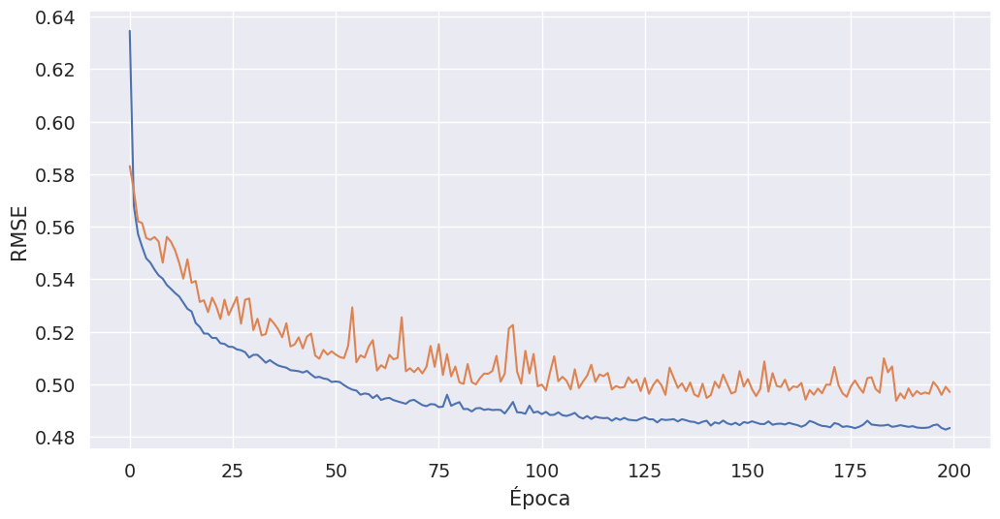

In [44]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")

Vemos que es un poco menos errático el aprendizaje, qué otra cosa podemos hacer para mejorar el entrenamiento como tal:

Hint: Qué cosa se encarga de modificar los pesos una vez calculados los gradientes?

Probamos cambiar el [optmizador](https://keras.io/api/optimizers/) a uno mejor:

mejor==no usar solo el gradiente. Usamos Adam de optmizador

In [45]:
model = Sequential()
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [46]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=200,
    validation_data=(X_test.values, y_test.values),
)

Train on 12384 samples, validate on 8256 samples
Epoch 1/200
   32/12384 [..............................] - ETA: 29s - loss: 0.8487

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.8590 

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.7602

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.6588

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.6094

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.5773



 9568/12384 [======================>.......] - ETA: 0s - loss: 0.5495

11264/12384 [==========================>...] - ETA: 0s - loss: 0.5234

12384/12384 [==============================] - 1s 53us/step - loss: 0.5123 - val_loss: 0.3910


Epoch 2/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3316

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.3914

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.3690

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.3823

 6176/12384 [=============>................] - ETA: 0s - loss: 0.3733

 7808/12384 [=================>............] - ETA: 0s - loss: 0.3707

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.3632

11136/12384 [=========================>....] - ETA: 0s - loss: 0.3593

12384/12384 [==============================] - 1s 45us/step - loss: 0.3584 - val_loss: 0.3519


Epoch 3/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2745

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3595

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.3478

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.3507

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.3452

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.3348

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.3314

11232/12384 [==========================>...] - ETA: 0s - loss: 0.3340

12384/12384 [==============================] - 1s 47us/step - loss: 0.3373 - val_loss: 0.3409


Epoch 4/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2317

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.3224

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.3441

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.3492

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.3467

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.3392

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.3342

11520/12384 [==========================>...] - ETA: 0s - loss: 0.3287

12384/12384 [==============================] - 1s 46us/step - loss: 0.3287 - val_loss: 0.3357


Epoch 5/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1517

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.3043

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.3287

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.3233

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.3152

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.3231

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.3258

11392/12384 [==========================>...] - ETA: 0s - loss: 0.3225

12384/12384 [==============================] - 1s 47us/step - loss: 0.3234 - val_loss: 0.3301


Epoch 6/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3431

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.3421

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.3407

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.3317

 5888/12384 [=============>................] - ETA: 0s - loss: 0.3302



 7456/12384 [=================>............] - ETA: 0s - loss: 0.3243

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.3265

10880/12384 [=========================>....] - ETA: 0s - loss: 0.3224

12384/12384 [==============================] - 1s 47us/step - loss: 0.3191 - val_loss: 0.3264


Epoch 7/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5711

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2893

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.3006

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.3015

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.3088

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.3097

10112/12384 [=======================>......] - ETA: 0s - loss: 0.3104

11872/12384 [===========================>..] - ETA: 0s - loss: 0.3120

12384/12384 [==============================] - 1s 45us/step - loss: 0.3150 - val_loss: 0.3224


Epoch 8/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2893

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2975

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2978

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.3124

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.3143

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.3133

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.3114

11648/12384 [===========================>..] - ETA: 0s - loss: 0.3121

12384/12384 [==============================] - 1s 45us/step - loss: 0.3113 - val_loss: 0.3184


Epoch 9/200


   32/12384 [..............................] - ETA: 1s - loss: 0.3358

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3137

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.3150

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.3174

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.3144

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.3137

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.3141

11200/12384 [==========================>...] - ETA: 0s - loss: 0.3131

12384/12384 [==============================] - 1s 47us/step - loss: 0.3086 - val_loss: 0.3170


Epoch 10/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2314

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3036

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.3074

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2981

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.3013

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2993

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2996

11424/12384 [==========================>...] - ETA: 0s - loss: 0.3014

12384/12384 [==============================] - 1s 45us/step - loss: 0.3047 - val_loss: 0.3151


Epoch 11/200


   32/12384 [..............................] - ETA: 1s - loss: 0.1420

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.3043

 2688/12384 [=====>........................] - ETA: 0s - loss: 0.2980

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.3007

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2982

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2957

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2995

10368/12384 [========================>.....] - ETA: 0s - loss: 0.3005

11968/12384 [===========================>..] - ETA: 0s - loss: 0.3009

12384/12384 [==============================] - 1s 49us/step - loss: 0.3020 - val_loss: 0.3109


Epoch 12/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3766

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2847

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2888

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2883

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2895

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2896

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2991

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2984

12384/12384 [==============================] - 1s 46us/step - loss: 0.2997 - val_loss: 0.3100


Epoch 13/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2080

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2958

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2963

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2938

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2940

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2934

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2920

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2972

12384/12384 [==============================] - 1s 45us/step - loss: 0.2970 - val_loss: 0.3070


Epoch 14/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1102

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2971

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2962

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2907

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2958

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2945

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2928

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2947

12384/12384 [==============================] - 1s 44us/step - loss: 0.2946 - val_loss: 0.3048


Epoch 15/200


   32/12384 [..............................] - ETA: 1s - loss: 0.3049

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2892

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2836

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2962



 6464/12384 [==============>...............] - ETA: 0s - loss: 0.3008

 7680/12384 [=================>............] - ETA: 0s - loss: 0.3015

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2983

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2953

12384/12384 [==============================] - 1s 47us/step - loss: 0.2930 - val_loss: 0.3047


Epoch 16/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1137

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2625

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2896

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2876

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2883

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2903

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2901

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2893

12064/12384 [============================>.] - ETA: 0s - loss: 0.2911

12384/12384 [==============================] - 1s 48us/step - loss: 0.2909 - val_loss: 0.3019


Epoch 17/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2581

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.3042

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.3003

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2868

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2910

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2882

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2919

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2887

12128/12384 [============================>.] - ETA: 0s - loss: 0.2857

12384/12384 [==============================] - 1s 49us/step - loss: 0.2893 - val_loss: 0.2993


Epoch 18/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2990

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2577

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2789

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2810

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2859

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2872

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2821

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2832

12384/12384 [==============================] - 1s 47us/step - loss: 0.2874 - val_loss: 0.2979


Epoch 19/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4466

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.3031

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2917

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2986

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2932

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2905

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2890

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2859

12384/12384 [==============================] - 1s 46us/step - loss: 0.2854 - val_loss: 0.2969


Epoch 20/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2304

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2885

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2812

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2850

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2901

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2917

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2880

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2872

12384/12384 [==============================] - 1s 46us/step - loss: 0.2842 - val_loss: 0.2951


Epoch 21/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2071

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2845

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2867

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2884

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2866

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2824

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2823

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2818

12384/12384 [==============================] - 1s 46us/step - loss: 0.2824 - val_loss: 0.2930


Epoch 22/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3851

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2948

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2921

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2979

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2920

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2856

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2863

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2831

12384/12384 [==============================] - 1s 46us/step - loss: 0.2811 - val_loss: 0.2926


Epoch 23/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5260

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2969

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2929

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2807

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2821

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2784

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2760

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2801

12384/12384 [==============================] - 1s 49us/step - loss: 0.2799 - val_loss: 0.2906


Epoch 24/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2117

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.3159

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2985

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2851

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2819

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2728

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2679

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2747

12384/12384 [==============================] - 1s 46us/step - loss: 0.2779 - val_loss: 0.2911


Epoch 25/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3357

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2733

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2808

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2705

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2756

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2713

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2718

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2750

12384/12384 [==============================] - 1s 47us/step - loss: 0.2765 - val_loss: 0.2875


Epoch 26/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3483

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2972

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2704

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2721

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2634

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2724

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2698

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2738

12384/12384 [==============================] - 1s 46us/step - loss: 0.2756 - val_loss: 0.2887


Epoch 27/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1372

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2662

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2780

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2759

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2756

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2728

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2740

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2770

12384/12384 [==============================] - 1s 47us/step - loss: 0.2740 - val_loss: 0.2865


Epoch 28/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1983

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2450

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2586

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2582

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2658

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2688

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2711

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2743

12384/12384 [==============================] - 1s 48us/step - loss: 0.2727 - val_loss: 0.2849


Epoch 29/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1619

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2547

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2636

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2730

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2731

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2697

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2677

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2696

12256/12384 [============================>.] - ETA: 0s - loss: 0.2702

12384/12384 [==============================] - 1s 48us/step - loss: 0.2712 - val_loss: 0.2830


Epoch 30/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3938

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2526

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2431

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2631

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2689

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2695

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2676

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2686

12384/12384 [==============================] - 1s 45us/step - loss: 0.2695 - val_loss: 0.2815


Epoch 31/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1204

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2675

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2622

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2636

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2646

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2695

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2681

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2694

12384/12384 [==============================] - 1s 46us/step - loss: 0.2682 - val_loss: 0.2800


Epoch 32/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2292

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2725

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2581

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2645

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2738

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2686

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2695

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2680

12384/12384 [==============================] - 1s 46us/step - loss: 0.2669 - val_loss: 0.2789


Epoch 33/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1556

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2658

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2712

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2723

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2718

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2714

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2680

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2679

12288/12384 [============================>.] - ETA: 0s - loss: 0.2664

12384/12384 [==============================] - 1s 49us/step - loss: 0.2660 - val_loss: 0.2787


Epoch 34/200


   32/12384 [..............................] - ETA: 1s - loss: 0.1156

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2556

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2712

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2772

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2729

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2700

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2649

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2635

12384/12384 [==============================] - 1s 46us/step - loss: 0.2642 - val_loss: 0.2752


Epoch 35/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2154

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2838

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2776

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2735

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2624

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2623

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2597

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2586

12384/12384 [==============================] - 1s 47us/step - loss: 0.2633 - val_loss: 0.2762


Epoch 36/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1672

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2510

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2397

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2472

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2537

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2583

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2580

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2596

12384/12384 [==============================] - 1s 45us/step - loss: 0.2618 - val_loss: 0.2749


Epoch 37/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3259

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2469

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2628

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2698

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2739

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2659

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2640

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2642

12384/12384 [==============================] - 1s 47us/step - loss: 0.2607 - val_loss: 0.2724


Epoch 38/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3725

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2649

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2680

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2661

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2729

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2676

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2636

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2619

12384/12384 [==============================] - 1s 45us/step - loss: 0.2593 - val_loss: 0.2710


Epoch 39/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3319

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2315

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2416

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2499

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2489

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2544

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2532

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2548

12192/12384 [============================>.] - ETA: 0s - loss: 0.2573

12384/12384 [==============================] - 1s 48us/step - loss: 0.2584 - val_loss: 0.2699


Epoch 40/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1543

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2305

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2419

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2485

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2505

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2557

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2568

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2573

12384/12384 [==============================] - 1s 47us/step - loss: 0.2575 - val_loss: 0.2691


Epoch 41/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2270

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2630

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2556

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2585

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2562

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2548

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2539

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2556

12384/12384 [==============================] - 1s 47us/step - loss: 0.2564 - val_loss: 0.2682


Epoch 42/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2546

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2503

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2607

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2607

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2601

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2584

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2602

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2566

12352/12384 [============================>.] - ETA: 0s - loss: 0.2555

12384/12384 [==============================] - 1s 48us/step - loss: 0.2556 - val_loss: 0.2669


Epoch 43/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2182

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2546

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2612

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2572

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2497

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2482

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2502

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2515

12384/12384 [==============================] - 1s 45us/step - loss: 0.2541 - val_loss: 0.2676


Epoch 44/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2608

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2719

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2574

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2605

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2623

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2527

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2516

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2534

12064/12384 [============================>.] - ETA: 0s - loss: 0.2539

12384/12384 [==============================] - 1s 48us/step - loss: 0.2536 - val_loss: 0.2646


Epoch 45/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4696

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2729

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2666

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2555

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2555

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2524

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2538

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2506

12288/12384 [============================>.] - ETA: 0s - loss: 0.2524

12384/12384 [==============================] - 1s 47us/step - loss: 0.2524 - val_loss: 0.2644


Epoch 46/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2976

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2446

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2529

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2481

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2490

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2502

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2496

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2500

12384/12384 [==============================] - 1s 47us/step - loss: 0.2516 - val_loss: 0.2643


Epoch 47/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1917

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2758

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2771

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2610

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2514

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2518

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2539

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2549

12224/12384 [============================>.] - ETA: 0s - loss: 0.2509

12384/12384 [==============================] - 1s 48us/step - loss: 0.2505 - val_loss: 0.2633


Epoch 48/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2307

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2310

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2278

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2378

 6720/12384 [===============>..............] - ETA: 0s - loss: 0.2471

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2507

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2491

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2509

12384/12384 [==============================] - 1s 46us/step - loss: 0.2502 - val_loss: 0.2619


Epoch 49/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1429

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2476

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2450

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2440

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2477

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2476

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2482

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2488

12384/12384 [==============================] - 1s 46us/step - loss: 0.2493 - val_loss: 0.2606


Epoch 50/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4720

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2617

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2506

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2525

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2486

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2488

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2498

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2460

12384/12384 [==============================] - 1s 47us/step - loss: 0.2489 - val_loss: 0.2598


Epoch 51/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5234

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2456

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2518

 5312/12384 [===========>..................] - ETA: 0s - loss: 0.2522

 6912/12384 [===============>..............] - ETA: 0s - loss: 0.2503

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2535

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2485

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2474

12384/12384 [==============================] - 1s 46us/step - loss: 0.2480 - val_loss: 0.2595


Epoch 52/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3494

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2574

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2555

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2529

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2490

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2491

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2492

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2491

12384/12384 [==============================] - 1s 45us/step - loss: 0.2474 - val_loss: 0.2590


Epoch 53/200
   32/12384 [..............................] - ETA: 1s - loss: 0.5797

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2657

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2602

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2578

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2482

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2470

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2471

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2458

12384/12384 [==============================] - 1s 46us/step - loss: 0.2468 - val_loss: 0.2589


Epoch 54/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0784

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2379

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2374

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2482

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2452

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2469

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2445

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2466

12384/12384 [==============================] - 1s 47us/step - loss: 0.2462 - val_loss: 0.2574


Epoch 55/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1048

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2368

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2573

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2514

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2451

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2422

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2446

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2472

12384/12384 [==============================] - 1s 46us/step - loss: 0.2455 - val_loss: 0.2582


Epoch 56/200
   32/12384 [..............................] - ETA: 2s - loss: 0.2696

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2400

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2399

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2347

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2343

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2435

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2434

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2428

12384/12384 [==============================] - 1s 47us/step - loss: 0.2448 - val_loss: 0.2564


Epoch 57/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3516

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2434

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2366

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2366

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2373

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2418

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2398

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2461

12384/12384 [==============================] - 1s 48us/step - loss: 0.2445 - val_loss: 0.2560


Epoch 58/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1167

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2241

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2364

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2322

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2336

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2379

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2399

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2424

12384/12384 [==============================] - 1s 48us/step - loss: 0.2438 - val_loss: 0.2545


Epoch 59/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2084

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2476

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2481

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2449

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2369

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2384



 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2407

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2439

12384/12384 [==============================] - 1s 46us/step - loss: 0.2434 - val_loss: 0.2562


Epoch 60/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3683

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2598

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2571

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2549

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2496

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2462

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2430

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2417

12384/12384 [==============================] - 1s 46us/step - loss: 0.2431 - val_loss: 0.2565


Epoch 61/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2151

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2408

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2432

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2445

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2453

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2461

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2446

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2444

12384/12384 [==============================] - 1s 48us/step - loss: 0.2427 - val_loss: 0.2535


Epoch 62/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2087

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2316

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2322

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2381

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2373

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2433

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2425

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2426

12384/12384 [==============================] - 1s 46us/step - loss: 0.2419 - val_loss: 0.2529


Epoch 63/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1764

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2637

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2466

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2466

 6656/12384 [===============>..............] - ETA: 0s - loss: 0.2458

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2445

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2433

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2389

12384/12384 [==============================] - 1s 46us/step - loss: 0.2411 - val_loss: 0.2536


Epoch 64/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1480

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2183

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2271

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2377

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2384

 7776/12384 [=================>............] - ETA: 0s - loss: 0.2433

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2424

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2410



12384/12384 [==============================] - 1s 45us/step - loss: 0.2412 - val_loss: 0.2520


Epoch 65/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2660

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2174

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2193

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2150

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2246

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2281

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2309

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2365

12384/12384 [==============================] - 1s 46us/step - loss: 0.2407 - val_loss: 0.2524


Epoch 66/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3688

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2652

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2639

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2510

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2484

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2468

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2431

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2421

12384/12384 [==============================] - 1s 47us/step - loss: 0.2402 - val_loss: 0.2508


Epoch 67/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4888

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2345

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2443

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2379

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2415

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2463

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2418

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2415

12384/12384 [==============================] - 1s 46us/step - loss: 0.2395 - val_loss: 0.2520


Epoch 68/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1904

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2467

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2384

 4192/12384 [=========>....................] - ETA: 0s - loss: 0.2472

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2474

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2477

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2408

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2395

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2390

12384/12384 [==============================] - 1s 52us/step - loss: 0.2396 - val_loss: 0.2549


Epoch 69/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1041

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2158

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2238

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2297

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2351

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2398

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2397

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2358

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2378

12384/12384 [==============================] - 1s 51us/step - loss: 0.2389 - val_loss: 0.2500


Epoch 70/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1397

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2450

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2383

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2345

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2380

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2350

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2381

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2412

12064/12384 [============================>.] - ETA: 0s - loss: 0.2392

12384/12384 [==============================] - 1s 49us/step - loss: 0.2385 - val_loss: 0.2508


Epoch 71/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1915

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2457

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2302

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2372

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2342

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2348

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2360

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2368

12384/12384 [==============================] - 1s 45us/step - loss: 0.2378 - val_loss: 0.2502


Epoch 72/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1192

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2419

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2394

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2531

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2518

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2449

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2424

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2413

12384/12384 [==============================] - 1s 46us/step - loss: 0.2378 - val_loss: 0.2491


Epoch 73/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2657

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2231

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2244

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2296

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2384

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2402

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2390

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2373

12384/12384 [==============================] - 1s 45us/step - loss: 0.2372 - val_loss: 0.2493


Epoch 74/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1100

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2246

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2332

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2388

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2406

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2384

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2354

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2366

12384/12384 [==============================]

 - 1s 45us/step - loss: 0.2367 - val_loss: 0.2492


Epoch 75/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0967

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2523

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2436

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2471

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2449

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2438

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2378

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2364

12128/12384 [============================>.] - ETA: 0s - loss: 0.2370

12384/12384 [==============================] - 1s 48us/step - loss: 0.2364 - val_loss: 0.2483


Epoch 76/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2736

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2415

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2380

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2278

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2298

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2323

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2326

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2331

12288/12384 [============================>.] - ETA: 0s - loss: 0.2362

12384/12384 [==============================] - 1s 51us/step - loss: 0.2357 - val_loss: 0.2490


Epoch 77/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1185

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2524

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2410

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2363

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2314

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2351

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2337

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2349

12384/12384 [==============================] - 1s 47us/step - loss: 0.2357 - val_loss: 0.2481


Epoch 78/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1538

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2427

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2405

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2426

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2398

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2351

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2365

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2341

12384/12384 [==============================] - 1s 47us/step - loss: 0.2354 - val_loss: 0.2498


Epoch 79/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1594

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2431

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2457

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2460

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2450

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2455

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2410

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2366

12384/12384 [==============================] - 1s 45us/step - loss: 0.2350 - val_loss: 0.2476


Epoch 80/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1577

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2081

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2207

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2313

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2276

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2316

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2338

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2336

12160/12384 [============================>.] - ETA: 0s - loss: 0.2354

12384/12384 [==============================] - 1s 50us/step - loss: 0.2347 - val_loss: 0.2476


Epoch 81/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2208

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2398

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2375

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2313

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2363



 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2388

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2386

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 46us/step - loss: 0.2341 - val_loss: 0.2481


Epoch 82/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1988

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2254

 3552/12384 [=======>......................] - ETA: 0s - loss: 0.2204

 5216/12384 [===========>..................] - ETA: 0s - loss: 0.2311

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2289

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2329

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2331

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2327

12384/12384 [==============================] - 1s 46us/step - loss: 0.2339 - val_loss: 0.2478


Epoch 83/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2895

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2508

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2436

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2402

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2365

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2383

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2382

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2366

12384/12384 [==============================] - 1s 47us/step - loss: 0.2338 - val_loss: 0.2469


Epoch 84/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3531

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2384

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2370

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2395

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2435

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2398

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2411

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2384

12384/12384 [==============================] - 1s 46us/step - loss: 0.2334 - val_loss: 0.2467


Epoch 85/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0849

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2493

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2470

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2388

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2345

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2329

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2357

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2340

12384/12384 [==============================] - 1s 48us/step - loss: 0.2333 - val_loss: 0.2465


Epoch 86/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3405

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2332

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2316

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2316

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2330

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2383

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2379

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2375

12384/12384 [==============================] - 1s 47us/step - loss: 0.2330 - val_loss: 0.2493


Epoch 87/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1969

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2018

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2229

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2235

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2219

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2239

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2304

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2311

12384/12384 [==============================] - 1s 47us/step - loss: 0.2329 - val_loss: 0.2459


Epoch 88/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3427

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2356

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2408

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2367

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2359

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2363

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2352

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2335

12384/12384 [==============================] - 1s 46us/step - loss: 0.2325 - val_loss: 0.2457


Epoch 89/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2073

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2149

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2193

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2210

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2251

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2245

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2269

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2313

12384/12384 [==============================] - 1s 48us/step - loss: 0.2321 - val_loss: 0.2459


Epoch 90/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1878

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2428

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2407

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2334

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2333

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2363

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2352

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2345



12384/12384 [==============================] - 1s 45us/step - loss: 0.2323 - val_loss: 0.2476


Epoch 91/200
   32/12384 [..............................] - ETA: 0s - loss: 0.5872

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2587

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2401

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2405

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2369

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2352

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2348

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2341

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2308

12384/12384 [==============================] - 1s 50us/step - loss: 0.2323 - val_loss: 0.2452


Epoch 92/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1756

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2147

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2269

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2249

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2280

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2290

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2351

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2333

12384/12384 [==============================] - 1s 48us/step - loss: 0.2319 - val_loss: 0.2452


Epoch 93/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2777

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2514

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2357

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2369

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2342

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2338

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2303

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2281

12384/12384 [==============================] - 1s 47us/step - loss: 0.2315 - val_loss: 0.2448


Epoch 94/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3072

 1824/12384 [===>..........................] - ETA: 0s - loss: 0.2046

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2138

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2180

 6816/12384 [===============>..............] - ETA: 0s - loss: 0.2153

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2199

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2267

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2329

12384/12384 [==============================] - 1s 44us/step - loss: 0.2312 - val_loss: 0.2472


Epoch 95/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3001

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2360

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2297

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2284

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2304

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2323

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2311

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2302

12384/12384 [==============================] - 1s 48us/step - loss: 0.2313 - val_loss: 0.2463


Epoch 96/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3845

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2325

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2289

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2289

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2301

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2294

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2246

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2291

12384/12384 [==============================] - 1s 47us/step - loss: 0.2314 - val_loss: 0.2459


Epoch 97/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1131

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2260

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2294

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2282

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2316

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2302

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2315

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2294

12384/12384 [==============================] - 1s 46us/step - loss: 0.2310 - val_loss: 0.2442


Epoch 98/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1092

 1280/12384 [==>...........................] - ETA: 0s - loss: 0.2321

 2400/12384 [====>.........................] - ETA: 0s - loss: 0.2258

 4032/12384 [========>.....................] - ETA: 0s - loss: 0.2201

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2256

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2299

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2329

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2321

12256/12384 [============================>.] - ETA: 0s - loss: 0.2314

12384/12384 [==============================] - 1s 48us/step - loss: 0.2307 - val_loss: 0.2446


Epoch 99/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2001

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2229

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2272

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.2282

 5632/12384 [============>.................] - ETA: 0s - loss: 0.2224

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2280

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2290

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2307

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2328

12384/12384 [==============================] - 1s 52us/step - loss: 0.2306 - val_loss: 0.2444


Epoch 100/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1870

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2267

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2296

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2252

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2275

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2286

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2275

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2328

12384/12384 [==============================] - 1s 45us/step - loss: 0.2308 - val_loss: 0.2441


Epoch 101/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2184

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2279

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2176

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2213

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2265

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2273

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2328

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2336

12032/12384 [============================>.] - ETA: 0s - loss: 0.2300

12384/12384 [==============================] - 1s 49us/step - loss: 0.2307 - val_loss: 0.2454


Epoch 102/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2032

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2174

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2191

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2250

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2242

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2272

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2278

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2286

12384/12384 [==============================] - 1s 46us/step - loss: 0.2306 - val_loss: 0.2461


Epoch 103/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2989

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2470

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2274

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2290

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2248

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2293

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2255

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2271

12384/12384 [==============================] - 1s 47us/step - loss: 0.2301 - val_loss: 0.2454


Epoch 104/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3387

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2124

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2302

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2243

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2235

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2269

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2306

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2317

12128/12384 [============================>.] - ETA: 0s - loss: 0.2305

12384/12384 [==============================] - 1s 48us/step - loss: 0.2302 - val_loss: 0.2472


Epoch 105/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3381

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2184

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2207

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2253

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2313

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2304

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2283

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2305

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2307

12384/12384 [==============================] - 1s 48us/step - loss: 0.2298 - val_loss: 0.2437


Epoch 106/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2559

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2181

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2224

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2281

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2332

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2240

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2283

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2304

12384/12384 [==============================] - 1s 47us/step - loss: 0.2299 - val_loss: 0.2449


Epoch 107/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2616

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2427

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2254

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2320

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2349

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2330

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2296

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2280

12384/12384 [==============================] - 1s 45us/step - loss: 0.2300 - val_loss: 0.2437


Epoch 108/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1355

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2552

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2418

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2410

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2359

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2331

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2293

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2304

12384/12384 [==============================] - 1s 46us/step - loss: 0.2299 - val_loss: 0.2436


Epoch 109/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1344

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2332

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2340

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2386

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2359

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2331

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2311

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2293

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2291

12384/12384 [==============================] - 1s 49us/step - loss: 0.2296 - val_loss: 0.2438


Epoch 110/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1470

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2299

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2292

 5152/12384 [===========>..................] - ETA: 0s - loss: 0.2276

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2276

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2246

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2266

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2294

12384/12384 [==============================] - 1s 45us/step - loss: 0.2296 - val_loss: 0.2444


Epoch 111/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1856

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2258

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2260

 5088/12384 [===========>..................] - ETA: 0s - loss: 0.2228

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2226

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2237

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2257

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2293

12384/12384 [==============================] - 1s 47us/step - loss: 0.2294 - val_loss: 0.2429


Epoch 112/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2467

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2410

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2286

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2331

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2354

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2293

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2289

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2281

12224/12384 [============================>.] - ETA: 0s - loss: 0.2292

12384/12384 [==============================] - 1s 49us/step - loss: 0.2296 - val_loss: 0.2434


Epoch 113/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2664

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2225

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2168

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2213

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2326

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2314

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2340

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2332

12384/12384 [==============================] - 1s 48us/step - loss: 0.2296 - val_loss: 0.2441


Epoch 114/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1298

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2515

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2446

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2355

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2327

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2335

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2331

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2315

12128/12384 [============================>.] - ETA: 0s - loss: 0.2299

12384/12384 [==============================] - 1s 49us/step - loss: 0.2292 - val_loss: 0.2457


Epoch 115/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1057

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2300

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2387

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2260

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2275

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2258

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2282

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2291

12384/12384 [==============================] - 1s 47us/step - loss: 0.2292 - val_loss: 0.2432


Epoch 116/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1592

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2485

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2356

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2315

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2373

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2311

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2305

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2289

12320/12384 [============================>.] - ETA: 0s - loss: 0.2295

12384/12384 [==============================] - 1s 47us/step - loss: 0.2291 - val_loss: 0.2432


Epoch 117/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2463

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2462

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2405

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2312

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2290

 7712/12384 [=================>............] - ETA: 0s - loss: 0.2322

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2309

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2301

12384/12384 [==============================] - 1s 47us/step - loss: 0.2291 - val_loss: 0.2425


Epoch 118/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1902

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2213

 3360/12384 [=======>......................] - ETA: 0s - loss: 0.2253

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2302

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2280

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2277

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2314

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2264

12384/12384 [==============================] - 1s 47us/step - loss: 0.2291 - val_loss: 0.2428


Epoch 119/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2378

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2233

 3392/12384 [=======>......................] - ETA: 0s - loss: 0.2200

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2233

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2260

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2225

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2260

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2252

12384/12384 [==============================] - 1s 45us/step - loss: 0.2287 - val_loss: 0.2450


Epoch 120/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3536

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2272

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2212

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2281

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2279

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2276

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2261

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2282

12384/12384 [==============================] - 1s 44us/step - loss: 0.2287 - val_loss: 0.2441


Epoch 121/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2011

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2193

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2261

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2222

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2254

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2250

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2283

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2272

12384/12384 [==============================] - 1s 47us/step - loss: 0.2291 - val_loss: 0.2428


Epoch 122/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1136

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2348

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2254

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2294

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2298

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2296

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2314

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2301

12384/12384 [==============================] - 1s 46us/step - loss: 0.2292 - val_loss: 0.2429


Epoch 123/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1562

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2321

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2365

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2255

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2317

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2276

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2242

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2301

12384/12384 [==============================] - 1s 47us/step - loss: 0.2284 - val_loss: 0.2435


Epoch 124/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3790

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2484

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2313

 4992/12384 [===========>..................] - ETA: 0s - loss: 0.2271

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2228

 8288/12384 [===================>..........] - ETA: 0s - loss: 0.2234

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2263

11488/12384 [==========================>...] - ETA: 0s - loss: 0.2272

12384/12384 [==============================] - 1s 46us/step - loss: 0.2285 - val_loss: 0.2428


Epoch 125/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3307

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2288

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2272

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2274

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2325

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2346

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2305

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2305

12384/12384 [==============================] - 1s 47us/step - loss: 0.2283 - val_loss: 0.2421


Epoch 126/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2688

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2361

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2199

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2265

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2277

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2275

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2268

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2283

12384/12384 [==============================] - 1s 45us/step - loss: 0.2283 - val_loss: 0.2426


Epoch 127/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2517

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2390

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2366

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2259

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2269

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2314

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2254

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2278

12384/12384 [==============================] - 1s 48us/step - loss: 0.2288 - val_loss: 0.2438


Epoch 128/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2039

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2410

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2359

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2389

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2355

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2342

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2318

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2295

12384/12384 [==============================] - 1s 45us/step - loss: 0.2277 - val_loss: 0.2442


Epoch 129/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1733

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2125

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2225

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2240

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2197

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2186

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2244

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2257

12064/12384 [============================>.] - ETA: 0s - loss: 0.2282

12384/12384 [==============================] - 1s 48us/step - loss: 0.2280 - val_loss: 0.2432


Epoch 130/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3465

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2153

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2224

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2200

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2271

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2276

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2247

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2266

12384/12384 [==============================] - 1s 46us/step - loss: 0.2280 - val_loss: 0.2419


Epoch 131/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3803

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2375

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2371

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2294

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2234

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2243

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2271

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2289

12288/12384 [============================>.] - ETA: 0s - loss: 0.2280

12384/12384 [==============================] - 1s 48us/step - loss: 0.2275 - val_loss: 0.2448


Epoch 132/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4692

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2161

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2308

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2301

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2290

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2266

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2292

10720/12384 [========================>.....] - ETA: 0s - loss: 0.2259

12224/12384 [============================>.] - ETA: 0s - loss: 0.2272

12384/12384 [==============================] - 1s 49us/step - loss: 0.2279 - val_loss: 0.2426


Epoch 133/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3224

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2182

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2256

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2297

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2300

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2252

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2243

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2273

12384/12384 [==============================] - 1s 48us/step - loss: 0.2281 - val_loss: 0.2416


Epoch 134/200
   32/12384 [..............................] - ETA: 0s - loss: 0.0959

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2234

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2254

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2227

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2292

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2335

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2339

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2280

12384/12384 [==============================] - 1s 48us/step - loss: 0.2275 - val_loss: 0.2423


Epoch 135/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3199

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2237

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2308

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2277

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2284

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2292

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2271

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2266

12384/12384 [==============================] - 1s 47us/step - loss: 0.2276 - val_loss: 0.2415


Epoch 136/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2155

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2216

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2194

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2263

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2248

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2205

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2217

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2239

12384/12384 [==============================] - 1s 47us/step - loss: 0.2274 - val_loss: 0.2440


Epoch 137/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1781

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2265

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2232

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2229

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2284

 7680/12384 [=================>............] - ETA: 0s - loss: 0.2272

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2277

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2278

12384/12384 [==============================] - 1s 45us/step - loss: 0.2273 - val_loss: 0.2425


Epoch 138/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1391

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2437

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2449

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2402

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2322

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2268

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2289

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2289

12384/12384 [==============================] - 1s 46us/step - loss: 0.2270 - val_loss: 0.2417


Epoch 139/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1798

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2154

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2210

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2226

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2256

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2331

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2291

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2279

12384/12384 [==============================] - 1s 47us/step - loss: 0.2271 - val_loss: 0.2411


Epoch 140/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3036

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2324

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2364

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2294

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2339

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2313

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2324

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2292

12384/12384 [==============================] - 1s 47us/step - loss: 0.2271 - val_loss: 0.2409


Epoch 141/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1796

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2299

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2236

 4960/12384 [===========>..................] - ETA: 0s - loss: 0.2261

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2320

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2256

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2250

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2261

12384/12384 [==============================] - 1s 46us/step - loss: 0.2270 - val_loss: 0.2419


Epoch 142/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1564

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2433

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2292

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2367

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2337

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2350

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2347

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2299

12384/12384 [==============================] - 1s 48us/step - loss: 0.2271 - val_loss: 0.2416


Epoch 143/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1612

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2161

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2304

 5120/12384 [===========>..................] - ETA: 0s - loss: 0.2223

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2233

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2227

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2241

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2248

12384/12384 [==============================] - 1s 45us/step - loss: 0.2264 - val_loss: 0.2439


Epoch 144/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1482

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2110

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2210

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2253

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2254

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2280

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2255

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2270

12384/12384 [==============================] - 1s 47us/step - loss: 0.2272 - val_loss: 0.2404


Epoch 145/200
   32/12384 [..............................] - ETA: 0s - loss: 0.6599

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2325

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2325

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2225

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2245

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2266

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2259

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2266

12384/12384 [==============================] - 1s 47us/step - loss: 0.2267 - val_loss: 0.2420


Epoch 146/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1061

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2373

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2366

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2270

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2281

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2280

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2287

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2281

12384/12384 [==============================] - 1s 45us/step - loss: 0.2272 - val_loss: 0.2409


Epoch 147/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2098

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2263

 3520/12384 [=======>......................] - ETA: 0s - loss: 0.2360

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2337

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2312

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2324

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2267

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2279

12384/12384 [==============================] - 1s 48us/step - loss: 0.2267 - val_loss: 0.2421


Epoch 148/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2059

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2152

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2270

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2234

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2273

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2280

 9792/12384 [======================>.......] - ETA: 0s - loss: 0.2272

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2258

12384/12384 [==============================] - 1s 46us/step - loss: 0.2265 - val_loss: 0.2418


Epoch 149/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2303

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2417

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2448

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2414

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2366

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2300

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2320

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2284

12384/12384 [==============================] - 1s 45us/step - loss: 0.2262 - val_loss: 0.2409


Epoch 150/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2058

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2360

 3456/12384 [=======>......................] - ETA: 0s - loss: 0.2345

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2281

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2290

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2259

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2265

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2236

12384/12384 [==============================] - 1s 49us/step - loss: 0.2260 - val_loss: 0.2411


Epoch 151/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1882

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2077

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2274

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2332

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2311

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2257

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2249

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2233

12384/12384 [==============================] - 1s 46us/step - loss: 0.2263 - val_loss: 0.2407


Epoch 152/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3465

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2301

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2175

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2281

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2221

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2195

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2215

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2239

12384/12384 [==============================] - 1s 46us/step - loss: 0.2259 - val_loss: 0.2407


Epoch 153/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1231

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2390

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2310

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2282

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2288

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2221

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2261

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2278

12384/12384 [==============================] - 1s 46us/step - loss: 0.2265 - val_loss: 0.2424


Epoch 154/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2027

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2469

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2275

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2284

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2277

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2258

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2277

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2268

12384/12384 [==============================] - 1s 48us/step - loss: 0.2262 - val_loss: 0.2410


Epoch 155/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1677

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2337

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2303

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2377

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2317

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2275

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2259

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2263

12384/12384 [==============================] - 1s 47us/step - loss: 0.2266 - val_loss: 0.2397


Epoch 156/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4459

 1728/12384 [===>..........................] - ETA: 0s - loss: 0.2412

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2378

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2350

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2316

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2255

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2227

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2266

12384/12384 [==============================] - 1s 47us/step - loss: 0.2261 - val_loss: 0.2400


Epoch 157/200
   32/12384 [..............................] - ETA: 1s - loss: 0.4158

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2492

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2230

 5024/12384 [===========>..................] - ETA: 0s - loss: 0.2216

 6688/12384 [===============>..............] - ETA: 0s - loss: 0.2301

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2251

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2233

11776/12384 [===========================>..] - ETA: 0s - loss: 0.2266

12384/12384 [==============================] - 1s 45us/step - loss: 0.2257 - val_loss: 0.2406


Epoch 158/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1750

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2459

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2380

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2333

 6048/12384 [=============>................] - ETA: 0s - loss: 0.2270

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2267

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2287

10528/12384 [========================>.....] - ETA: 0s - loss: 0.2273

12128/12384 [============================>.] - ETA: 0s - loss: 0.2255

12384/12384 [==============================] - 1s 50us/step - loss: 0.2259 - val_loss: 0.2408


Epoch 159/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1126

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2261

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2279

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2255

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2201

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2242

 9344/12384 [=====================>........] - ETA: 0s - loss: 0.2221

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2261

12384/12384 [==============================] - 1s 47us/step - loss: 0.2258 - val_loss: 0.2395


Epoch 160/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1183

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2091

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2162

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2216

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2250

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2250

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2240

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2258

12256/12384 [============================>.] - ETA: 0s - loss: 0.2258

12384/12384 [==============================] - 1s 48us/step - loss: 0.2260 - val_loss: 0.2400


Epoch 161/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1591

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2278

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2346

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2373

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2325

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2322

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2304

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2276

12384/12384 [==============================] - 1s 46us/step - loss: 0.2259 - val_loss: 0.2390


Epoch 162/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4148

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2401

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2397

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2304

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2266

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2285

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2262

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2235

12384/12384 [==============================] - 1s 46us/step - loss: 0.2253 - val_loss: 0.2406


Epoch 163/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1346

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2236

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2207

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2229

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2320

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2331

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2302

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2279

12384/12384 [==============================] - 1s 48us/step - loss: 0.2255 - val_loss: 0.2397


Epoch 164/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1477

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2365

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2087

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2149

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2173



 7712/12384 [=================>............] - ETA: 0s - loss: 0.2236

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2225

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2242

12288/12384 [============================>.] - ETA: 0s - loss: 0.2257

12384/12384 [==============================] - 1s 49us/step - loss: 0.2255 - val_loss: 0.2397


Epoch 165/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4655

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2259

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2188

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2270

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2258



 7648/12384 [=================>............] - ETA: 0s - loss: 0.2280

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2255



10848/12384 [=========================>....] - ETA: 0s - loss: 0.2257

12320/12384 [============================>.] - ETA: 0s - loss: 0.2256

12384/12384 [==============================] - 1s 48us/step - loss: 0.2251 - val_loss: 0.2394


Epoch 166/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2226

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2304

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2262

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2230

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2194

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2221

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2205

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2213

12320/12384 [============================>.] - ETA: 0s - loss: 0.2253

12384/12384 [==============================] - 1s 48us/step - loss: 0.2253 - val_loss: 0.2397


Epoch 167/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2099

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2461

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2316

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2275

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2334

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2321

 9440/12384 [=====================>........] - ETA: 0s - loss: 0.2280

10976/12384 [=========================>....] - ETA: 0s - loss: 0.2252

12384/12384 [==============================] - 1s 48us/step - loss: 0.2252 - val_loss: 0.2420


Epoch 168/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2168

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2156

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2204

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2216

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2216

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2290

 9280/12384 [=====================>........] - ETA: 0s - loss: 0.2269

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2275

12064/12384 [============================>.] - ETA: 0s - loss: 0.2256

12384/12384 [==============================] - 1s 48us/step - loss: 0.2254 - val_loss: 0.2396


Epoch 169/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1826

 1760/12384 [===>..........................] - ETA: 0s - loss: 0.2484

 3424/12384 [=======>......................] - ETA: 0s - loss: 0.2352

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2262

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2258

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2267

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2287

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2266

12384/12384 [==============================] - 1s 47us/step - loss: 0.2249 - val_loss: 0.2395


Epoch 170/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1751

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2386

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2282

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2172

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2193

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2212

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2241

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2259

12384/12384 [==============================] - 1s 47us/step - loss: 0.2251 - val_loss: 0.2395


Epoch 171/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1616

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2064

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2118

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2189

 6176/12384 [=============>................] - ETA: 0s - loss: 0.2187

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2174

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2198

10624/12384 [========================>.....] - ETA: 0s - loss: 0.2239

12128/12384 [============================>.] - ETA: 0s - loss: 0.2243

12384/12384 [==============================] - 1s 49us/step - loss: 0.2253 - val_loss: 0.2400


Epoch 172/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1680

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2364

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2283

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2195

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2230

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2191

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2192

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2219

12384/12384 [==============================] - 1s 47us/step - loss: 0.2246 - val_loss: 0.2389


Epoch 173/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2281

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2189

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2233

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2216

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2200

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2228

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2251

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2281

12384/12384 [==============================] - 1s 46us/step - loss: 0.2248 - val_loss: 0.2396


Epoch 174/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1707

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2306

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2169

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2179

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2248

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2265

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2272

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2249

12320/12384 [============================>.] - ETA: 0s - loss: 0.2243

12384/12384 [==============================] - 1s 47us/step - loss: 0.2247 - val_loss: 0.2408


Epoch 175/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2769

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2394

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2357

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2345

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2301

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2257

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2263

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2261

12384/12384 [==============================] - 1s 46us/step - loss: 0.2245 - val_loss: 0.2384


Epoch 176/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4418

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2414

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2215

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2237

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2268

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2328

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2276

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2274

12384/12384 [==============================] - 1s 47us/step - loss: 0.2246 - val_loss: 0.2392


Epoch 177/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1529

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2136

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2329

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2242

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2259

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2275

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2256

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2250

12384/12384 [==============================] - 1s 46us/step - loss: 0.2249 - val_loss: 0.2383


Epoch 178/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1802

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2168

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2234

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2209

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2158

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2185

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2199

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2210

12384/12384 [==============================] - 1s 46us/step - loss: 0.2245 - val_loss: 0.2385


Epoch 179/200
   32/12384 [..............................] - ETA: 2s - loss: 0.2328

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.2505

 2656/12384 [=====>........................] - ETA: 0s - loss: 0.2152

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2194

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2229

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2220

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2224

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2199

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2243

12384/12384 [==============================] - 1s 50us/step - loss: 0.2244 - val_loss: 0.2381


Epoch 180/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2025

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2136

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2266

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2255

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2236

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2246

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2292

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2262

12384/12384 [==============================] - 1s 46us/step - loss: 0.2238 - val_loss: 0.2390


Epoch 181/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2035

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2134

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2179

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2208

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2172

 8000/12384 [==================>...........] - ETA: 0s - loss: 0.2190

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2230

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2234

12384/12384 [==============================] - 1s 49us/step - loss: 0.2243 - val_loss: 0.2394


Epoch 182/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2324

 1792/12384 [===>..........................] - ETA: 0s - loss: 0.2219

 3488/12384 [=======>......................] - ETA: 0s - loss: 0.2280

 5184/12384 [===========>..................] - ETA: 0s - loss: 0.2264

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2283

 8128/12384 [==================>...........] - ETA: 0s - loss: 0.2270

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2264

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2247

12384/12384 [==============================] - 1s 47us/step - loss: 0.2240 - val_loss: 0.2384


Epoch 183/200
   32/12384 [..............................] - ETA: 0s - loss: 0.3119

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2294

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2313

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2303

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2253

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2246

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2229

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2232

12384/12384 [==============================] - 1s 48us/step - loss: 0.2243 - val_loss: 0.2379


Epoch 184/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1450

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2254

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2253

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2275

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2284

 7616/12384 [=================>............] - ETA: 0s - loss: 0.2265

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2254

10752/12384 [=========================>....] - ETA: 0s - loss: 0.2251

12384/12384 [==============================] - 1s 48us/step - loss: 0.2240 - val_loss: 0.2379


Epoch 185/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1140

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2016

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2321

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2346

 6528/12384 [==============>...............] - ETA: 0s - loss: 0.2305

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2272

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2241

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2231

12384/12384 [==============================] - 1s 47us/step - loss: 0.2240 - val_loss: 0.2376


Epoch 186/200
   32/12384 [..............................] - ETA: 0s - loss: 0.4148

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2108

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2191

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2241



 6080/12384 [=============>................] - ETA: 0s - loss: 0.2231

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2220

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2248

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2240

12224/12384 [============================>.] - ETA: 0s - loss: 0.2232

12384/12384 [==============================] - 1s 48us/step - loss: 0.2241 - val_loss: 0.2379


Epoch 187/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1971

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2260

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2346

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2272

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2267

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2247

 9536/12384 [======================>.......] - ETA: 0s - loss: 0.2284

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2266

12384/12384 [==============================] - 1s 49us/step - loss: 0.2242 - val_loss: 0.2383


Epoch 188/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1983

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2184

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2124

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2157

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2175

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2214

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2236

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2235

12384/12384 [==============================] - 1s 47us/step - loss: 0.2242 - val_loss: 0.2376


Epoch 189/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1180

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.1940

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2120

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2197

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2222

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2239

 9184/12384 [=====================>........] - ETA: 0s - loss: 0.2240

10816/12384 [=========================>....] - ETA: 0s - loss: 0.2207

12352/12384 [============================>.] - ETA: 0s - loss: 0.2240

12384/12384 [==============================] - 1s 48us/step - loss: 0.2236 - val_loss: 0.2380


Epoch 190/200


   32/12384 [..............................] - ETA: 2s - loss: 0.1636

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2187

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2230

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2192

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2231

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2236

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2212

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2237

12384/12384 [==============================] - 1s 48us/step - loss: 0.2235 - val_loss: 0.2384


Epoch 191/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1107

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2355

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2307

 4832/12384 [==========>...................] - ETA: 0s - loss: 0.2301

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2267

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2268

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2265

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2259

12384/12384 [==============================] - 1s 47us/step - loss: 0.2239 - val_loss: 0.2376


Epoch 192/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1784

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2108

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2181

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2182

 6144/12384 [=============>................] - ETA: 0s - loss: 0.2207

 7744/12384 [=================>............] - ETA: 0s - loss: 0.2181

 9216/12384 [=====================>........] - ETA: 0s - loss: 0.2215

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2253

12224/12384 [============================>.] - ETA: 0s - loss: 0.2248

12384/12384 [==============================] - 1s 49us/step - loss: 0.2237 - val_loss: 0.2386


Epoch 193/200
   32/12384 [..............................] - ETA: 1s - loss: 0.3499

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2348

 3328/12384 [=======>......................] - ETA: 0s - loss: 0.2341

 4928/12384 [==========>...................] - ETA: 0s - loss: 0.2242

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2281

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2303

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2260

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2226

12384/12384 [==============================] - 1s 47us/step - loss: 0.2234 - val_loss: 0.2393


Epoch 194/200
   32/12384 [..............................] - ETA: 0s - loss: 0.2902

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2242

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2313

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2287

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2214

 7904/12384 [==================>...........] - ETA: 0s - loss: 0.2245

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2253

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2241

12384/12384 [==============================] - 1s 47us/step - loss: 0.2234 - val_loss: 0.2383


Epoch 195/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1932

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2444

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2288

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2196

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2200

 8192/12384 [==================>...........] - ETA: 0s - loss: 0.2210

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2207

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2232

12384/12384 [==============================] - 1s 45us/step - loss: 0.2234 - val_loss: 0.2375


Epoch 196/200
   32/12384 [..............................] - ETA: 1s - loss: 0.0908

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2232

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2302

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2204

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2262

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2258

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2223

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2233

12384/12384 [==============================] - 1s 47us/step - loss: 0.2234 - val_loss: 0.2416


Epoch 197/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1267

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2261

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2358

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2263

 6496/12384 [==============>...............] - ETA: 0s - loss: 0.2250

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2247

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2229

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2227

12384/12384 [==============================] - 1s 46us/step - loss: 0.2232 - val_loss: 0.2377


Epoch 198/200
   32/12384 [..............................] - ETA: 1s - loss: 0.1686

 1696/12384 [===>..........................] - ETA: 0s - loss: 0.2566

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2404

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2229

 6432/12384 [==============>...............] - ETA: 0s - loss: 0.2221

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2263

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2243

10784/12384 [=========================>....] - ETA: 0s - loss: 0.2240

12288/12384 [============================>.] - ETA: 0s - loss: 0.2232

12384/12384 [==============================] - 1s 50us/step - loss: 0.2232 - val_loss: 0.2374


Epoch 199/200
   32/12384 [..............................] - ETA: 1s - loss: 0.2412

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2124

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2117

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2167

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2146

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2153

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2194

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2209

12000/12384 [============================>.] - ETA: 0s - loss: 0.2236

12384/12384 [==============================] - 1s 49us/step - loss: 0.2229 - val_loss: 0.2373


Epoch 200/200
   32/12384 [..............................] - ETA: 0s - loss: 0.1358

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2118

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2309

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2237

 6464/12384 [==============>...............] - ETA: 0s - loss: 0.2266

 8224/12384 [==================>...........] - ETA: 0s - loss: 0.2271

 9760/12384 [======================>.......] - ETA: 0s - loss: 0.2247

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2246

12384/12384 [==============================] - 1s 47us/step - loss: 0.2233 - val_loss: 0.2375


No handles with labels found to put in legend.


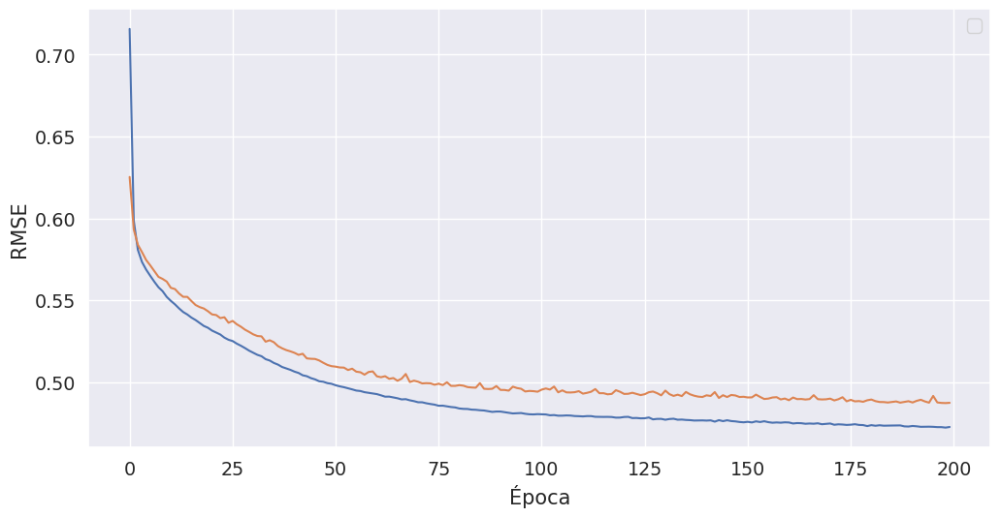

In [47]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Vemos que el aprendizaje es mucho menos errático.

Ahora intentemos complejizar el modelo agregando una capa más

In [48]:
model = Sequential()
model.add(Dense(10, activation='tanh', input_shape=(8,)))
model.add(Dense(10, activation='tanh'))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

history = model.fit(
    X_train.values,
    y_train.values,
    epochs=100,
    validation_data=(X_test.values, y_test.values),
)

Train on 12384 samples, validate on 8256 samples
Epoch 1/100
   32/12384 [..............................] - ETA: 39s - loss: 0.6963

 1504/12384 [==>...........................] - ETA: 1s - loss: 0.6517 

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.5643

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.5240

 5888/12384 [=============>................] - ETA: 0s - loss: 0.4941



 7264/12384 [================>.............] - ETA: 0s - loss: 0.4763

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.4602

10080/12384 [=======================>......] - ETA: 0s - loss: 0.4505

11392/12384 [==========================>...] - ETA: 0s - loss: 0.4382

12384/12384 [==============================] - 1s 60us/step - loss: 0.4319 - val_loss: 0.3666


Epoch 2/100
   32/12384 [..............................] - ETA: 1s - loss: 0.5016

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.3424

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.3490

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.3573

 5760/12384 [============>.................] - ETA: 0s - loss: 0.3500

 7232/12384 [================>.............] - ETA: 0s - loss: 0.3507

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.3482

10112/12384 [=======================>......] - ETA: 0s - loss: 0.3453

11616/12384 [===========================>..] - ETA: 0s - loss: 0.3426

12384/12384 [==============================] - 1s 50us/step - loss: 0.3407 - val_loss: 0.3424


Epoch 3/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2807

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.3301

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.3354

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.3234

 6016/12384 [=============>................] - ETA: 0s - loss: 0.3228

 7488/12384 [=================>............] - ETA: 0s - loss: 0.3175

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.3138

10240/12384 [=======================>......] - ETA: 0s - loss: 0.3177

11712/12384 [===========================>..] - ETA: 0s - loss: 0.3200

12384/12384 [==============================] - 1s 50us/step - loss: 0.3214 - val_loss: 0.3208


Epoch 4/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2241

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.3005

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.3054

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.3013

 5952/12384 [=============>................] - ETA: 0s - loss: 0.3080

 7520/12384 [=================>............] - ETA: 0s - loss: 0.3059

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.3088

10272/12384 [=======================>......] - ETA: 0s - loss: 0.3063

11552/12384 [==========================>...] - ETA: 0s - loss: 0.3106

12384/12384 [==============================] - 1s 49us/step - loss: 0.3078 - val_loss: 0.3105


Epoch 5/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1914

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2796

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2908

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2976

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2994

 7328/12384 [================>.............] - ETA: 0s - loss: 0.3032

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.3033

10208/12384 [=======================>......] - ETA: 0s - loss: 0.3051

11712/12384 [===========================>..] - ETA: 0s - loss: 0.3013

12384/12384 [==============================] - 1s 49us/step - loss: 0.2981 - val_loss: 0.3010


Epoch 6/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2668

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2763

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2916

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2866

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2915

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2938

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2959

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2896

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2905

12384/12384 [==============================] - 1s 50us/step - loss: 0.2887 - val_loss: 0.2947


Epoch 7/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3990

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2838

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2939

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2886

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2875

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2883

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2898

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2857

11936/12384 [===========================>..] - ETA: 0s - loss: 0.2838

12384/12384 [==============================] - 1s 49us/step - loss: 0.2812 - val_loss: 0.2949


Epoch 8/100


   32/12384 [..............................] - ETA: 0s - loss: 0.3050

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2679

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2568

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.2653

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2678

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2677

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2705

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2747

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2734

12384/12384 [==============================] - 1s 49us/step - loss: 0.2755 - val_loss: 0.2843


Epoch 9/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3602

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2529

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2611

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2607

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2602

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2699

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2693

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2690

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2717

12384/12384 [==============================] - 1s 50us/step - loss: 0.2710 - val_loss: 0.2788


Epoch 10/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2246

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2567

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2539

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2541

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2567

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2550

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2565

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2606

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2646

12384/12384 [==============================] - 1s 51us/step - loss: 0.2659 - val_loss: 0.2751


Epoch 11/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3561

 1280/12384 [==>...........................] - ETA: 0s - loss: 0.2731

 2592/12384 [=====>........................] - ETA: 0s - loss: 0.2766

 4000/12384 [========>.....................] - ETA: 0s - loss: 0.2641

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2582

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2628

 8448/12384 [===================>..........] - ETA: 0s - loss: 0.2602

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2597

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2597

12384/12384 [==============================] - 1s 50us/step - loss: 0.2630 - val_loss: 0.2729


Epoch 12/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2214

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2486

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2335

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2520

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2525

 6624/12384 [===============>..............] - ETA: 0s - loss: 0.2519

 8064/12384 [==================>...........] - ETA: 0s - loss: 0.2574

 9600/12384 [======================>.......] - ETA: 0s - loss: 0.2575

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2593

12384/12384 [==============================] - 1s 52us/step - loss: 0.2590 - val_loss: 0.2684


Epoch 13/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1523

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2372

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2428

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2483

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2475

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2501

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2532

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2516

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2526

12384/12384 [==============================] - 1s 52us/step - loss: 0.2560 - val_loss: 0.2683


Epoch 14/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1789

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2761

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2537

 4000/12384 [========>.....................] - ETA: 0s - loss: 0.2687

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2617

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2594

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2552

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2546

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2516

12384/12384 [==============================] - 1s 51us/step - loss: 0.2534 - val_loss: 0.2641


Epoch 15/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3910

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2545

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2589

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2558

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2562

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2500

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2531

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2518

11296/12384 [==========================>...] - ETA: 0s - loss: 0.2499

12384/12384 [==============================] - 1s 51us/step - loss: 0.2507 - val_loss: 0.2667


Epoch 16/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1894

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2631

 2720/12384 [=====>........................] - ETA: 0s - loss: 0.2633

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2598

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2531

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2496

 8544/12384 [===================>..........] - ETA: 0s - loss: 0.2512

 9920/12384 [=======================>......] - ETA: 0s - loss: 0.2488

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2481

12384/12384 [==============================] - 1s 50us/step - loss: 0.2482 - val_loss: 0.2602


Epoch 17/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2184

 1280/12384 [==>...........................] - ETA: 0s - loss: 0.2452

 2720/12384 [=====>........................] - ETA: 0s - loss: 0.2485

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.2542

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2499

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2558

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2491

 9856/12384 [======================>.......] - ETA: 0s - loss: 0.2471

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2486

12384/12384 [==============================] - 1s 52us/step - loss: 0.2460 - val_loss: 0.2624


Epoch 18/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1336

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2720

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2646

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2578

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2544

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2501

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2491

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2476

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2460

12384/12384 [==============================] - 1s 50us/step - loss: 0.2439 - val_loss: 0.2604


Epoch 19/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2418

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2598

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2523

 4032/12384 [========>.....................] - ETA: 0s - loss: 0.2511

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2496

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2489

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2465

 9504/12384 [======================>.......] - ETA: 0s - loss: 0.2462

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2437

12384/12384 [==============================] - 1s 51us/step - loss: 0.2424 - val_loss: 0.2563


Epoch 20/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2236

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2402

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2447

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2493

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2493

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2461

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2476

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2445

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2426

12384/12384 [==============================] - 1s 50us/step - loss: 0.2412 - val_loss: 0.2565


Epoch 21/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1522

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2373

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2441

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2427

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2403

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2402

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2397

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2418

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2392

12384/12384 [==============================] - 1s 49us/step - loss: 0.2396 - val_loss: 0.2519


Epoch 22/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0735

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2286

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2430

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2358

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2422

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2411

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2400

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2377

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2391

12384/12384 [==============================] - 1s 48us/step - loss: 0.2383 - val_loss: 0.2530


Epoch 23/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1997

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2468

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2512

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2511

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2454

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2420

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2371

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2344

12096/12384 [============================>.] - ETA: 0s - loss: 0.2365

12384/12384 [==============================] - 1s 49us/step - loss: 0.2371 - val_loss: 0.2520


Epoch 24/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2900

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2215

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2340

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2481

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2466

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2405

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2403

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2383

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2374

12384/12384 [==============================] - 1s 51us/step - loss: 0.2362 - val_loss: 0.2499


Epoch 25/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2567

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2321

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2335

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2356

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2374

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2314

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2274

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2323

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2351

12384/12384 [==============================] - 1s 51us/step - loss: 0.2351 - val_loss: 0.2487


Epoch 26/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2899

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2396

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2422

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2385

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2380

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2365

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2350

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2363

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2348

12384/12384 [==============================] - 1s 52us/step - loss: 0.2341 - val_loss: 0.2467


Epoch 27/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1463

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2557

 2752/12384 [=====>........................] - ETA: 0s - loss: 0.2435

 4160/12384 [=========>....................] - ETA: 0s - loss: 0.2415

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2365



 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2360

 8384/12384 [===================>..........] - ETA: 0s - loss: 0.2362

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2353

11424/12384 [==========================>...] - ETA: 0s - loss: 0.2322

12384/12384 [==============================] - 1s 50us/step - loss: 0.2338 - val_loss: 0.2462


Epoch 28/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1926

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2216

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2400

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2401

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2367

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2309

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2302

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2269

11808/12384 [===========================>..] - ETA: 0s - loss: 0.2312

12384/12384 [==============================] - 1s 51us/step - loss: 0.2322 - val_loss: 0.2444


Epoch 29/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2573

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2250

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2217

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2235

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2261

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2214

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2266

10336/12384 [========================>.....] - ETA: 0s - loss: 0.2315

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2300

12384/12384 [==============================] - 1s 49us/step - loss: 0.2315 - val_loss: 0.2472


Epoch 30/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1909

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2169

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2273

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2296

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2306

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2336

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2332

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2300

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2309

12384/12384 [==============================] - 1s 50us/step - loss: 0.2300 - val_loss: 0.2422


Epoch 31/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2026

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2377

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2331

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2384

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2348

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2322

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2331

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2308

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2314

12384/12384 [==============================] - 1s 50us/step - loss: 0.2297 - val_loss: 0.2431


Epoch 32/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0982

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2412

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2307

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2258

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2214

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2273

 8864/12384 [====================>.........] - ETA: 0s - loss: 0.2301

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2263

11744/12384 [===========================>..] - ETA: 0s - loss: 0.2272

12384/12384 [==============================] - 1s 50us/step - loss: 0.2286 - val_loss: 0.2445


Epoch 33/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0864

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2058

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2153

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2234

 6336/12384 [==============>...............] - ETA: 0s - loss: 0.2260

 7808/12384 [=================>............] - ETA: 0s - loss: 0.2244

 9248/12384 [=====================>........] - ETA: 0s - loss: 0.2245

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2272



12064/12384 [============================>.] - ETA: 0s - loss: 0.2265

12384/12384 [==============================] - 1s 50us/step - loss: 0.2279 - val_loss: 0.2403


Epoch 34/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1891

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2095

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2178

 4288/12384 [=========>....................] - ETA: 0s - loss: 0.2285

 5536/12384 [============>.................] - ETA: 0s - loss: 0.2296

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2275

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2277

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2272

11104/12384 [=========================>....] - ETA: 0s - loss: 0.2247

12384/12384 [==============================] - 1s 52us/step - loss: 0.2265 - val_loss: 0.2405


Epoch 35/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2308

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2343

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2298

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2351

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2310

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2288

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2275

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2268

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2250

12384/12384 [==============================] - 1s 50us/step - loss: 0.2259 - val_loss: 0.2387


Epoch 36/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1799

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2438

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2291

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2286

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2249

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2245

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2270

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2298

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2250

12384/12384 [==============================] - 1s 51us/step - loss: 0.2251 - val_loss: 0.2377


Epoch 37/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1705

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2352

 2592/12384 [=====>........................] - ETA: 0s - loss: 0.2302

 3776/12384 [========>.....................] - ETA: 0s - loss: 0.2327

 5280/12384 [===========>..................] - ETA: 0s - loss: 0.2352

 6752/12384 [===============>..............] - ETA: 0s - loss: 0.2294

 8160/12384 [==================>...........] - ETA: 0s - loss: 0.2268

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2212

11040/12384 [=========================>....] - ETA: 0s - loss: 0.2230

12384/12384 [==============================] - 1s 52us/step - loss: 0.2240 - val_loss: 0.2382


Epoch 38/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2643

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2269

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2109

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2106

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2199

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2235

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2236

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2242



11648/12384 [===========================>..] - ETA: 0s - loss: 0.2225

12384/12384 [==============================] - 1s 50us/step - loss: 0.2228 - val_loss: 0.2348


Epoch 39/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4033

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2039

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2083

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2240

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2262

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2228

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2214

 9888/12384 [======================>.......] - ETA: 0s - loss: 0.2206

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2237

12384/12384 [==============================] - 1s 50us/step - loss: 0.2230 - val_loss: 0.2365


Epoch 40/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2226

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2000

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2101

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2165

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2206

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2232

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2177

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2193

11360/12384 [==========================>...] - ETA: 0s - loss: 0.2212

12384/12384 [==============================] - 1s 52us/step - loss: 0.2213 - val_loss: 0.2349


Epoch 41/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1012

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2128

 2848/12384 [=====>........................] - ETA: 0s - loss: 0.2156

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2189

 5664/12384 [============>.................] - ETA: 0s - loss: 0.2143

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2170

 8512/12384 [===================>..........] - ETA: 0s - loss: 0.2177

 9824/12384 [======================>.......] - ETA: 0s - loss: 0.2179

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2199

12384/12384 [==============================] - 1s 51us/step - loss: 0.2207 - val_loss: 0.2368


Epoch 42/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1975

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2326

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2316

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2242

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2237



 7328/12384 [================>.............] - ETA: 0s - loss: 0.2214

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2199

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2207

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2194

12384/12384 [==============================] - 1s 51us/step - loss: 0.2203 - val_loss: 0.2332


Epoch 43/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3675

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2132

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2291

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2282

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2195

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2193

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2213

10080/12384 [=======================>......] - ETA: 0s - loss: 0.2189

11552/12384 [==========================>...] - ETA: 0s - loss: 0.2214

12384/12384 [==============================] - 1s 50us/step - loss: 0.2201 - val_loss: 0.2362


Epoch 44/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2306

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2097

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2188

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2261

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2198

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2189

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2165

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2169

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2180

12384/12384 [==============================] - 1s 50us/step - loss: 0.2188 - val_loss: 0.2318


Epoch 45/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1956

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2062

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2072

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2112

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2107

 7136/12384 [================>.............] - ETA: 0s - loss: 0.2143

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2121

 9408/12384 [=====================>........] - ETA: 0s - loss: 0.2156

10848/12384 [=========================>....] - ETA: 0s - loss: 0.2169

12320/12384 [============================>.] - ETA: 0s - loss: 0.2178

12384/12384 [==============================] - 1s 52us/step - loss: 0.2181 - val_loss: 0.2305


Epoch 46/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1593

 1152/12384 [=>............................] - ETA: 0s - loss: 0.2246

 2528/12384 [=====>........................] - ETA: 0s - loss: 0.2204

 3968/12384 [========>.....................] - ETA: 0s - loss: 0.2179

 5248/12384 [===========>..................] - ETA: 0s - loss: 0.2197

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2173

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2183

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2161

11232/12384 [==========================>...] - ETA: 0s - loss: 0.2175

12384/12384 [==============================] - 1s 51us/step - loss: 0.2169 - val_loss: 0.2305


Epoch 47/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2708

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.1974

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2016

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2086

 5760/12384 [============>.................] - ETA: 0s - loss: 0.2060

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2068

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2132

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2125

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2151

12384/12384 [==============================] - 1s 51us/step - loss: 0.2170 - val_loss: 0.2304


Epoch 48/100
   32/12384 [..............................] - ETA: 0s - loss: 0.4423

 1248/12384 [==>...........................] - ETA: 0s - loss: 0.2123

 2496/12384 [=====>........................] - ETA: 0s - loss: 0.2173

 3712/12384 [=======>......................] - ETA: 0s - loss: 0.2198

 5056/12384 [===========>..................] - ETA: 0s - loss: 0.2140

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2167

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2183

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2176

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2199

12064/12384 [============================>.] - ETA: 0s - loss: 0.2159

12384/12384 [==============================] - 1s 52us/step - loss: 0.2163 - val_loss: 0.2295


Epoch 49/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2257

 1376/12384 [==>...........................] - ETA: 0s - loss: 0.2261

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2127

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2116

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2130

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2098

 8896/12384 [====================>.........] - ETA: 0s - loss: 0.2071

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2125

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2147

12384/12384 [==============================] - 1s 50us/step - loss: 0.2153 - val_loss: 0.2292


Epoch 50/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1414

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2193

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2243

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2100

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2177

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2189

 9120/12384 [=====================>........] - ETA: 0s - loss: 0.2161

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2147

12160/12384 [============================>.] - ETA: 0s - loss: 0.2151

12384/12384 [==============================] - 1s 48us/step - loss: 0.2151 - val_loss: 0.2314


Epoch 51/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1747

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2081

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2122

 4640/12384 [==========>...................] - ETA: 0s - loss: 0.2174

 6112/12384 [=============>................] - ETA: 0s - loss: 0.2148

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2120

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2129

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2135

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2126

12384/12384 [==============================] - 1s 50us/step - loss: 0.2152 - val_loss: 0.2272


Epoch 52/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4569

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2240

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2394

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2259

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2234



 7776/12384 [=================>............] - ETA: 0s - loss: 0.2156

 9312/12384 [=====================>........] - ETA: 0s - loss: 0.2142

10688/12384 [========================>.....] - ETA: 0s - loss: 0.2141

12224/12384 [============================>.] - ETA: 0s - loss: 0.2140

12384/12384 [==============================] - 1s 49us/step - loss: 0.2142 - val_loss: 0.2324


Epoch 53/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3142

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2048

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2114

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.2125

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2110

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2146

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2144

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2133

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2140

12384/12384 [==============================] - 1s 50us/step - loss: 0.2147 - val_loss: 0.2274


Epoch 54/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1056

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2207

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2338

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2313

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2260

 7936/12384 [==================>...........] - ETA: 0s - loss: 0.2202

 9568/12384 [======================>.......] - ETA: 0s - loss: 0.2183

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2163

12384/12384 [==============================] - 1s 47us/step - loss: 0.2138 - val_loss: 0.2272


Epoch 55/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1250

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2247

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2159

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2147

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2106

 7584/12384 [=================>............] - ETA: 0s - loss: 0.2122

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2133

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2122

12096/12384 [============================>.] - ETA: 0s - loss: 0.2132

12384/12384 [==============================] - 1s 49us/step - loss: 0.2137 - val_loss: 0.2272


Epoch 56/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2673

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.1991

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.1959

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2012

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2067

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2069

 8608/12384 [===================>..........] - ETA: 0s - loss: 0.2137

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2118

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2118

12384/12384 [==============================] - 1s 52us/step - loss: 0.2131 - val_loss: 0.2274


Epoch 57/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2164

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2085

 2688/12384 [=====>........................] - ETA: 0s - loss: 0.2089

 4224/12384 [=========>....................] - ETA: 0s - loss: 0.2117

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2108

 7040/12384 [================>.............] - ETA: 0s - loss: 0.2130

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2147

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2132

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2129

12384/12384 [==============================] - 1s 50us/step - loss: 0.2130 - val_loss: 0.2284


Epoch 58/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2299

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2215

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2203

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2205

 5696/12384 [============>.................] - ETA: 0s - loss: 0.2112

 7104/12384 [================>.............] - ETA: 0s - loss: 0.2075

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2138

10048/12384 [=======================>......] - ETA: 0s - loss: 0.2154

11328/12384 [==========================>...] - ETA: 0s - loss: 0.2132

12384/12384 [==============================] - 1s 51us/step - loss: 0.2130 - val_loss: 0.2252


Epoch 59/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2756

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2409

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2285

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2160

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2150

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2130

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2149

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2125

11584/12384 [===========================>..] - ETA: 0s - loss: 0.2131

12384/12384 [==============================] - 1s 50us/step - loss: 0.2120 - val_loss: 0.2262


Epoch 60/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1486

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2067

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2192

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2157

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2130

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2166

 9088/12384 [=====================>........] - ETA: 0s - loss: 0.2150

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2132

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2115

12384/12384 [==============================] - 1s 50us/step - loss: 0.2122 - val_loss: 0.2262


Epoch 61/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1980

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2175

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2138

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2170

 5440/12384 [============>.................] - ETA: 0s - loss: 0.2126

 6848/12384 [===============>..............] - ETA: 0s - loss: 0.2104

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2123

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2126

11136/12384 [=========================>....] - ETA: 0s - loss: 0.2114

12384/12384 [==============================] - 1s 51us/step - loss: 0.2126 - val_loss: 0.2247


Epoch 62/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2073

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.1949

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.1982

 4128/12384 [=========>....................] - ETA: 0s - loss: 0.2096

 5472/12384 [============>.................] - ETA: 0s - loss: 0.2175

 6880/12384 [===============>..............] - ETA: 0s - loss: 0.2123

 8352/12384 [===================>..........] - ETA: 0s - loss: 0.2155

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2147

11264/12384 [==========================>...] - ETA: 0s - loss: 0.2118

12384/12384 [==============================] - 1s 51us/step - loss: 0.2117 - val_loss: 0.2257


Epoch 63/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3927

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2191

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2045

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.1985

 5568/12384 [============>.................] - ETA: 0s - loss: 0.2046

 6976/12384 [===============>..............] - ETA: 0s - loss: 0.2108

 8320/12384 [===================>..........] - ETA: 0s - loss: 0.2124

 9728/12384 [======================>.......] - ETA: 0s - loss: 0.2093

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2139

12384/12384 [==============================] - 1s 52us/step - loss: 0.2117 - val_loss: 0.2256


Epoch 64/100
   32/12384 [..............................] - ETA: 0s - loss: 0.3120

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.1937

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.1958

 4544/12384 [==========>...................] - ETA: 0s - loss: 0.1927

 6048/12384 [=============>................] - ETA: 0s - loss: 0.1978

 7456/12384 [=================>............] - ETA: 0s - loss: 0.1985

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2026

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2067

12224/12384 [============================>.] - ETA: 0s - loss: 0.2115

12384/12384 [==============================] - 1s 49us/step - loss: 0.2110 - val_loss: 0.2255


Epoch 65/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1417

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2023

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.1903

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2011

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2000

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2036

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2057

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2086

11968/12384 [===========================>..] - ETA: 0s - loss: 0.2096

12384/12384 [==============================] - 1s 49us/step - loss: 0.2105 - val_loss: 0.2245


Epoch 66/100


   32/12384 [..............................] - ETA: 1s - loss: 0.1354

 1664/12384 [===>..........................] - ETA: 0s - loss: 0.2172

 3264/12384 [======>.......................] - ETA: 0s - loss: 0.2064

 4864/12384 [==========>...................] - ETA: 0s - loss: 0.2015

 6400/12384 [==============>...............] - ETA: 0s - loss: 0.2072

 7872/12384 [==================>...........] - ETA: 0s - loss: 0.2091

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2110

10912/12384 [=========================>....] - ETA: 0s - loss: 0.2116

12384/12384 [==============================] - 1s 48us/step - loss: 0.2112 - val_loss: 0.2274


Epoch 67/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4064

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2079

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2120

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2179

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2103

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2104

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2108

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2111

12064/12384 [============================>.] - ETA: 0s - loss: 0.2104

12384/12384 [==============================] - 1s 48us/step - loss: 0.2104 - val_loss: 0.2252


Epoch 68/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2630

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2021

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.1985

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2012

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2041

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2057

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2114

10592/12384 [========================>.....] - ETA: 0s - loss: 0.2097

12128/12384 [============================>.] - ETA: 0s - loss: 0.2110

12384/12384 [==============================] - 1s 48us/step - loss: 0.2108 - val_loss: 0.2238


Epoch 69/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0816

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.1901

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.1962

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.1940

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2076

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2112

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2121

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2125

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2118

12384/12384 [==============================] - 1s 49us/step - loss: 0.2104 - val_loss: 0.2249


Epoch 70/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0797

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.1961

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2067

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2118

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2095

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2151

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2120

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2098

11008/12384 [=========================>....] - ETA: 0s - loss: 0.2094

12160/12384 [============================>.] - ETA: 0s - loss: 0.2107

12384/12384 [==============================] - 1s 54us/step - loss: 0.2098 - val_loss: 0.2252


Epoch 71/100
   32/12384 [..............................] - ETA: 1s - loss: 0.4764

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2020

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2003

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2019

 5952/12384 [=============>................] - ETA: 0s - loss: 0.1998

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2096

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2063

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2069

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2096

12384/12384 [==============================] - 1s 49us/step - loss: 0.2098 - val_loss: 0.2231


Epoch 72/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2022

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2023

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2052

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2048

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2083

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2133

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2130

10112/12384 [=======================>......] - ETA: 0s - loss: 0.2121

11520/12384 [==========================>...] - ETA: 0s - loss: 0.2108

12384/12384 [==============================] - 1s 51us/step - loss: 0.2096 - val_loss: 0.2250


Epoch 73/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2875

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2162

 3232/12384 [======>.......................] - ETA: 0s - loss: 0.2036

 4768/12384 [==========>...................] - ETA: 0s - loss: 0.2120

 6240/12384 [==============>...............] - ETA: 0s - loss: 0.2138

 7648/12384 [=================>............] - ETA: 0s - loss: 0.2138

 9024/12384 [====================>.........] - ETA: 0s - loss: 0.2095

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2075

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2079

12384/12384 [==============================] - 1s 49us/step - loss: 0.2092 - val_loss: 0.2261


Epoch 74/100
   32/12384 [..............................] - ETA: 0s - loss: 0.2435

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2211

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2103

 4736/12384 [==========>...................] - ETA: 0s - loss: 0.2123

 6304/12384 [==============>...............] - ETA: 0s - loss: 0.2096

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2101

 9376/12384 [=====================>........] - ETA: 0s - loss: 0.2091

10880/12384 [=========================>....] - ETA: 0s - loss: 0.2085

12384/12384 [==============================] - 1s 47us/step - loss: 0.2103 - val_loss: 0.2248


Epoch 75/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2917

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.2078

 3296/12384 [======>.......................] - ETA: 0s - loss: 0.2046

 4896/12384 [==========>...................] - ETA: 0s - loss: 0.2012

 6560/12384 [==============>...............] - ETA: 0s - loss: 0.2051

 8096/12384 [==================>...........] - ETA: 0s - loss: 0.2093

 9664/12384 [======================>.......] - ETA: 0s - loss: 0.2109

11200/12384 [==========================>...] - ETA: 0s - loss: 0.2096

12384/12384 [==============================] - 1s 46us/step - loss: 0.2099 - val_loss: 0.2227


Epoch 76/100
   32/12384 [..............................] - ETA: 0s - loss: 0.6770

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2013

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2009

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2055

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2066

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2082

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2049

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2039

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2055

12384/12384 [==============================] - 1s 49us/step - loss: 0.2092 - val_loss: 0.2253


Epoch 77/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1460

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2037

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2054

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2164

 5952/12384 [=============>................] - ETA: 0s - loss: 0.2097

 7456/12384 [=================>............] - ETA: 0s - loss: 0.2116

 8992/12384 [====================>.........] - ETA: 0s - loss: 0.2123

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2100

12000/12384 [============================>.] - ETA: 0s - loss: 0.2093

12384/12384 [==============================] - 1s 49us/step - loss: 0.2087 - val_loss: 0.2226


Epoch 78/100


   32/12384 [..............................] - ETA: 0s - loss: 0.1259

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2302

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2171

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2202

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2187

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2125

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2127

10432/12384 [========================>.....] - ETA: 0s - loss: 0.2114

12000/12384 [============================>.] - ETA: 0s - loss: 0.2089

12384/12384 [==============================] - 1s 49us/step - loss: 0.2090 - val_loss: 0.2226


Epoch 79/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1805

 1184/12384 [=>............................] - ETA: 0s - loss: 0.1755

 2624/12384 [=====>........................] - ETA: 0s - loss: 0.2009

 3968/12384 [========>.....................] - ETA: 0s - loss: 0.2011

 5344/12384 [===========>..................] - ETA: 0s - loss: 0.2014

 6592/12384 [==============>...............] - ETA: 0s - loss: 0.2046

 8032/12384 [==================>...........] - ETA: 0s - loss: 0.2057

 9632/12384 [======================>.......] - ETA: 0s - loss: 0.2067

11072/12384 [=========================>....] - ETA: 0s - loss: 0.2088

12384/12384 [==============================] - 1s 51us/step - loss: 0.2084 - val_loss: 0.2223


Epoch 80/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0758

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2455

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2233

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2122

 5856/12384 [=============>................] - ETA: 0s - loss: 0.2109

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2081

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2097

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2102

11616/12384 [===========================>..] - ETA: 0s - loss: 0.2084

12384/12384 [==============================] - 1s 49us/step - loss: 0.2085 - val_loss: 0.2229


Epoch 81/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1439

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2091

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2156

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2075

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2060

 7424/12384 [================>.............] - ETA: 0s - loss: 0.2096

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2094

10176/12384 [=======================>......] - ETA: 0s - loss: 0.2076

11680/12384 [===========================>..] - ETA: 0s - loss: 0.2083

12384/12384 [==============================] - 1s 49us/step - loss: 0.2082 - val_loss: 0.2223


Epoch 82/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1658

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2097

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2042

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2129

 6080/12384 [=============>................] - ETA: 0s - loss: 0.2106

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2084

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2057

10464/12384 [========================>.....] - ETA: 0s - loss: 0.2112

12000/12384 [============================>.] - ETA: 0s - loss: 0.2091

12384/12384 [==============================] - 1s 49us/step - loss: 0.2084 - val_loss: 0.2252


Epoch 83/100


   32/12384 [..............................] - ETA: 0s - loss: 0.1953

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2116

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2292

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2205

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2109

 7328/12384 [================>.............] - ETA: 0s - loss: 0.2076

 8832/12384 [====================>.........] - ETA: 0s - loss: 0.2098

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2102

11872/12384 [===========================>..] - ETA: 0s - loss: 0.2092

12384/12384 [==============================] - 1s 49us/step - loss: 0.2084 - val_loss: 0.2223


Epoch 84/100
   32/12384 [..............................] - ETA: 1s - loss: 0.3120

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2368

 3200/12384 [======>.......................] - ETA: 0s - loss: 0.2164

 4800/12384 [==========>...................] - ETA: 0s - loss: 0.2136

 6368/12384 [==============>...............] - ETA: 0s - loss: 0.2138

 7968/12384 [==================>...........] - ETA: 0s - loss: 0.2115

 9472/12384 [=====================>........] - ETA: 0s - loss: 0.2086

10944/12384 [=========================>....] - ETA: 0s - loss: 0.2076

12064/12384 [============================>.] - ETA: 0s - loss: 0.2074

12384/12384 [==============================] - 1s 50us/step - loss: 0.2077 - val_loss: 0.2221


Epoch 85/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2167

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2317

 2912/12384 [======>.......................] - ETA: 0s - loss: 0.2210

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2184

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2108

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2130

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2154

10144/12384 [=======================>......] - ETA: 0s - loss: 0.2095

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2074

12384/12384 [==============================] - 1s 51us/step - loss: 0.2080 - val_loss: 0.2210


Epoch 86/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1159

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.2052

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2042

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2031

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2095

 7392/12384 [================>.............] - ETA: 0s - loss: 0.2078

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2081

10496/12384 [========================>.....] - ETA: 0s - loss: 0.2072

12064/12384 [============================>.] - ETA: 0s - loss: 0.2066

12384/12384 [==============================] - 1s 49us/step - loss: 0.2075 - val_loss: 0.2246


Epoch 87/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0924

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2216

 3136/12384 [======>.......................] - ETA: 0s - loss: 0.2171

 4608/12384 [==========>...................] - ETA: 0s - loss: 0.2148

 6016/12384 [=============>................] - ETA: 0s - loss: 0.2090

 7488/12384 [=================>............] - ETA: 0s - loss: 0.2015

 8960/12384 [====================>.........] - ETA: 0s - loss: 0.2004

10400/12384 [========================>.....] - ETA: 0s - loss: 0.2034

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2057

12384/12384 [==============================] - 1s 50us/step - loss: 0.2077 - val_loss: 0.2224


Epoch 88/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1362

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2069

 3072/12384 [======>.......................] - ETA: 0s - loss: 0.2024

 4512/12384 [=========>....................] - ETA: 0s - loss: 0.2042

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2044

 7552/12384 [=================>............] - ETA: 0s - loss: 0.2076

 9056/12384 [====================>.........] - ETA: 0s - loss: 0.2102

10656/12384 [========================>.....] - ETA: 0s - loss: 0.2087

12192/12384 [============================>.] - ETA: 0s - loss: 0.2070

12384/12384 [==============================] - 1s 48us/step - loss: 0.2076 - val_loss: 0.2227


Epoch 89/100
   32/12384 [..............................] - ETA: 1s - loss: 0.2286

 1568/12384 [==>...........................] - ETA: 0s - loss: 0.2062

 3040/12384 [======>.......................] - ETA: 0s - loss: 0.2103

 4576/12384 [==========>...................] - ETA: 0s - loss: 0.2013

 5984/12384 [=============>................] - ETA: 0s - loss: 0.2029

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2020

 8768/12384 [====================>.........] - ETA: 0s - loss: 0.2048

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2068

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2079

12384/12384 [==============================] - 1s 50us/step - loss: 0.2070 - val_loss: 0.2216


Epoch 90/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1130

 1344/12384 [==>...........................] - ETA: 0s - loss: 0.2222

 2784/12384 [=====>........................] - ETA: 0s - loss: 0.2126

 4256/12384 [=========>....................] - ETA: 0s - loss: 0.2081

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2067

 7168/12384 [================>.............] - ETA: 0s - loss: 0.2068

 8704/12384 [====================>.........] - ETA: 0s - loss: 0.2047

10272/12384 [=======================>......] - ETA: 0s - loss: 0.2048

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2067

12384/12384 [==============================] - 1s 49us/step - loss: 0.2075 - val_loss: 0.2214


Epoch 91/100


   32/12384 [..............................] - ETA: 0s - loss: 0.2850

 1408/12384 [==>...........................] - ETA: 0s - loss: 0.2125

 2880/12384 [=====>........................] - ETA: 0s - loss: 0.2184

 4352/12384 [=========>....................] - ETA: 0s - loss: 0.2153

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2189

 7232/12384 [================>.............] - ETA: 0s - loss: 0.2173

 8672/12384 [====================>.........] - ETA: 0s - loss: 0.2144

10240/12384 [=======================>......] - ETA: 0s - loss: 0.2103

11648/12384 [===========================>..] - ETA: 0s - loss: 0.2093

12384/12384 [==============================] - 1s 50us/step - loss: 0.2074 - val_loss: 0.2224


Epoch 92/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1857

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.2087

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2090

 4320/12384 [=========>....................] - ETA: 0s - loss: 0.2066

 5728/12384 [============>.................] - ETA: 0s - loss: 0.2080

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2073

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2073

10304/12384 [=======================>......] - ETA: 0s - loss: 0.2061

11840/12384 [===========================>..] - ETA: 0s - loss: 0.2058

12384/12384 [==============================] - 1s 49us/step - loss: 0.2072 - val_loss: 0.2225


Epoch 93/100


   32/12384 [..............................] - ETA: 1s - loss: 0.2091

 1536/12384 [==>...........................] - ETA: 0s - loss: 0.1985

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2121

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2089

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2071

 7264/12384 [================>.............] - ETA: 0s - loss: 0.2033

 8800/12384 [====================>.........] - ETA: 0s - loss: 0.2038

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2061

11904/12384 [===========================>..] - ETA: 0s - loss: 0.2069

12384/12384 [==============================] - 1s 50us/step - loss: 0.2071 - val_loss: 0.2202


Epoch 94/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1205

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.1986

 2816/12384 [=====>........................] - ETA: 0s - loss: 0.2154

 4096/12384 [========>.....................] - ETA: 0s - loss: 0.2087

 5376/12384 [============>.................] - ETA: 0s - loss: 0.2128

 6784/12384 [===============>..............] - ETA: 0s - loss: 0.2061

 8256/12384 [===================>..........] - ETA: 0s - loss: 0.2053

 9696/12384 [======================>.......] - ETA: 0s - loss: 0.2034

11168/12384 [==========================>...] - ETA: 0s - loss: 0.2045

12384/12384 [==============================] - 1s 50us/step - loss: 0.2070 - val_loss: 0.2208


Epoch 95/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1705

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.2184

 3104/12384 [======>.......................] - ETA: 0s - loss: 0.2287

 4672/12384 [==========>...................] - ETA: 0s - loss: 0.2181

 6208/12384 [==============>...............] - ETA: 0s - loss: 0.2126

 7840/12384 [=================>............] - ETA: 0s - loss: 0.2133

 9152/12384 [=====================>........] - ETA: 0s - loss: 0.2073

10560/12384 [========================>.....] - ETA: 0s - loss: 0.2084

12000/12384 [============================>.] - ETA: 0s - loss: 0.2070

12384/12384 [==============================] - 1s 50us/step - loss: 0.2068 - val_loss: 0.2217


Epoch 96/100
   32/12384 [..............................] - ETA: 0s - loss: 0.1380

 1472/12384 [==>...........................] - ETA: 0s - loss: 0.2114

 2944/12384 [======>.......................] - ETA: 0s - loss: 0.2177

 4384/12384 [=========>....................] - ETA: 0s - loss: 0.2182

 5792/12384 [=============>................] - ETA: 0s - loss: 0.2123

 7072/12384 [================>.............] - ETA: 0s - loss: 0.2074

 8480/12384 [===================>..........] - ETA: 0s - loss: 0.2069

 9952/12384 [=======================>......] - ETA: 0s - loss: 0.2083

11392/12384 [==========================>...] - ETA: 0s - loss: 0.2085

12384/12384 [==============================] - 1s 49us/step - loss: 0.2069 - val_loss: 0.2212


Epoch 97/100


   32/12384 [..............................] - ETA: 1s - loss: 0.2158

 1600/12384 [==>...........................] - ETA: 0s - loss: 0.1920

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2065

 4480/12384 [=========>....................] - ETA: 0s - loss: 0.2110

 5920/12384 [=============>................] - ETA: 0s - loss: 0.2117

 7360/12384 [================>.............] - ETA: 0s - loss: 0.2082

 8576/12384 [===================>..........] - ETA: 0s - loss: 0.2065

10016/12384 [=======================>......] - ETA: 0s - loss: 0.2048

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2093

12384/12384 [==============================] - 1s 49us/step - loss: 0.2063 - val_loss: 0.2206


Epoch 98/100
   32/12384 [..............................] - ETA: 1s - loss: 0.0974

 1440/12384 [==>...........................] - ETA: 0s - loss: 0.2295

 2976/12384 [======>.......................] - ETA: 0s - loss: 0.2229

 4416/12384 [=========>....................] - ETA: 0s - loss: 0.2160

 5824/12384 [=============>................] - ETA: 0s - loss: 0.2190

 7296/12384 [================>.............] - ETA: 0s - loss: 0.2134

 8736/12384 [====================>.........] - ETA: 0s - loss: 0.2120

10208/12384 [=======================>......] - ETA: 0s - loss: 0.2098

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2068

12384/12384 [==============================] - 1s 51us/step - loss: 0.2070 - val_loss: 0.2205


Epoch 99/100
   32/12384 [..............................] - ETA: 0s - loss: 0.0967

 1504/12384 [==>...........................] - ETA: 0s - loss: 0.1939

 3008/12384 [======>.......................] - ETA: 0s - loss: 0.2072

 4448/12384 [=========>....................] - ETA: 0s - loss: 0.2070

 5888/12384 [=============>................] - ETA: 0s - loss: 0.2047

 7200/12384 [================>.............] - ETA: 0s - loss: 0.2044

 8640/12384 [===================>..........] - ETA: 0s - loss: 0.2054

 9984/12384 [=======================>......] - ETA: 0s - loss: 0.2049

11456/12384 [==========================>...] - ETA: 0s - loss: 0.2057

12384/12384 [==============================] - 1s 51us/step - loss: 0.2058 - val_loss: 0.2210


Epoch 100/100
   32/12384 [..............................] - ETA: 1s - loss: 0.1626

 1632/12384 [==>...........................] - ETA: 0s - loss: 0.1999

 3168/12384 [======>.......................] - ETA: 0s - loss: 0.2085

 4704/12384 [==========>...................] - ETA: 0s - loss: 0.2058

 6272/12384 [==============>...............] - ETA: 0s - loss: 0.2137

 7520/12384 [=================>............] - ETA: 0s - loss: 0.2102

 8928/12384 [====================>.........] - ETA: 0s - loss: 0.2069

10368/12384 [========================>.....] - ETA: 0s - loss: 0.2065

11712/12384 [===========================>..] - ETA: 0s - loss: 0.2052

12384/12384 [==============================] - 1s 51us/step - loss: 0.2062 - val_loss: 0.2231


No handles with labels found to put in legend.


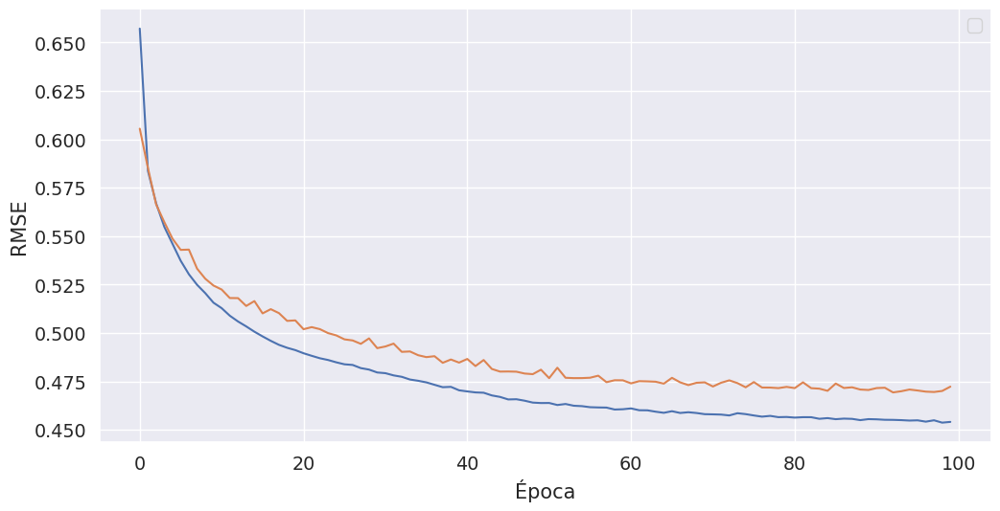

In [49]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

In [50]:
california_df_ld = pd.DataFrame(california.data, columns=california.feature_names)

Voy a tomar menos datos y voy a agregar más parámetros a mi red: Qué puede pasar cuando tengo menos cantidad de datos y más cantidad de parámetros a entrenar? Qué puede malir sal?

In [51]:
X = scaled_california_df[0:10000].drop("MedHouseVal", axis=1)
y = scaled_california_df[0:10000].filter(items=["MedHouseVal"])

In [52]:
X_train, X_validation, y_train, y_validation = train_test_split(
    X, y, test_size=0.4, random_state=42
)

In [53]:
model = Sequential()
model.add(Dense(50, activation='tanh', input_shape=(8,)))
model.add(Dense(20, activation='tanh'))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 17s - loss: 0.8292

1248/6000 [=====>........................] - ETA: 0s - loss: 0.5712 

2624/6000 [============>.................] - ETA: 0s - loss: 0.4930

3936/6000 [==================>...........] - ETA: 0s - loss: 0.4501

5408/6000 [==========================>...] - ETA: 0s - loss: 0.4227

6000/6000 [==============================] - 0s 72us/step - loss: 0.4231 - val_loss: 0.3354


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2991

1504/6000 [======>.......................] - ETA: 0s - loss: 0.3523

2976/6000 [=============>................] - ETA: 0s - loss: 0.3464

4480/6000 [=====================>........] - ETA: 0s - loss: 0.3416

5824/6000 [============================>.] - ETA: 0s - loss: 0.3389

6000/6000 [==============================] - 0s 52us/step - loss: 0.3389 - val_loss: 0.3147


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3062

1536/6000 [======>.......................] - ETA: 0s - loss: 0.3492

3008/6000 [==============>...............] - ETA: 0s - loss: 0.3526

4448/6000 [=====================>........] - ETA: 0s - loss: 0.3239

5856/6000 [============================>.] - ETA: 0s - loss: 0.3225

6000/6000 [==============================] - 0s 51us/step - loss: 0.3240 - val_loss: 0.2963


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4528

1504/6000 [======>.......................] - ETA: 0s - loss: 0.3393

3040/6000 [==============>...............] - ETA: 0s - loss: 0.3245

4512/6000 [=====================>........] - ETA: 0s - loss: 0.3283

5728/6000 [===========================>..] - ETA: 0s - loss: 0.3131

6000/6000 [==============================] - 0s 53us/step - loss: 0.3093 - val_loss: 0.2901


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2288

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2870

2304/6000 [==========>...................] - ETA: 0s - loss: 0.3114

3648/6000 [=================>............] - ETA: 0s - loss: 0.3113

5024/6000 [========================>.....] - ETA: 0s - loss: 0.3013

6000/6000 [==============================] - 0s 56us/step - loss: 0.2989 - val_loss: 0.2807


Epoch 6/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4788

1504/6000 [======>.......................] - ETA: 0s - loss: 0.3103

2880/6000 [=============>................] - ETA: 0s - loss: 0.2884

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2934

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2884

6000/6000 [==============================] - 0s 53us/step - loss: 0.2864 - val_loss: 0.2746


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4255

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2827

2976/6000 [=============>................] - ETA: 0s - loss: 0.2720

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2789

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2768

6000/6000 [==============================] - 0s 52us/step - loss: 0.2753 - val_loss: 0.2613


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3438

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2764

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2646

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2594

6000/6000 [==============================] - 0s 50us/step - loss: 0.2652 - val_loss: 0.2578


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1818

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2607

2848/6000 [=============>................] - ETA: 0s - loss: 0.2522

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2577

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2578

6000/6000 [==============================] - 0s 53us/step - loss: 0.2564 - val_loss: 0.2475


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3210

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2510

2944/6000 [=============>................] - ETA: 0s - loss: 0.2473

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2515

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2472

6000/6000 [==============================] - 0s 53us/step - loss: 0.2470 - val_loss: 0.2430


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2636

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2448

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2516

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2460

6000/6000 [==============================] - 0s 50us/step - loss: 0.2408 - val_loss: 0.2444


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1312

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2135

2976/6000 [=============>................] - ETA: 0s - loss: 0.2313

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2309

5920/6000 [============================>.] - ETA: 0s - loss: 0.2342

6000/6000 [==============================] - 0s 52us/step - loss: 0.2357 - val_loss: 0.2379


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3549

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2354

2912/6000 [=============>................] - ETA: 0s - loss: 0.2307

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2344

5984/6000 [============================>.] - ETA: 0s - loss: 0.2292

6000/6000 [==============================] - 0s 51us/step - loss: 0.2294 - val_loss: 0.2308


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1143

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2331

2688/6000 [============>.................] - ETA: 0s - loss: 0.2274

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2323

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2257

6000/6000 [==============================] - 0s 55us/step - loss: 0.2253 - val_loss: 0.2290


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5202

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2504

2880/6000 [=============>................] - ETA: 0s - loss: 0.2267

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2229

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2235

6000/6000 [==============================] - 0s 53us/step - loss: 0.2215 - val_loss: 0.2246


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0980

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2124

2944/6000 [=============>................] - ETA: 0s - loss: 0.2166

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2107

5856/6000 [============================>.] - ETA: 0s - loss: 0.2193

6000/6000 [==============================] - 0s 53us/step - loss: 0.2202 - val_loss: 0.2231


Epoch 17/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1834

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2048

2944/6000 [=============>................] - ETA: 0s - loss: 0.2125

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2092

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2132

6000/6000 [==============================] - 0s 59us/step - loss: 0.2151 - val_loss: 0.2266


Epoch 18/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3534

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1984

2784/6000 [============>.................] - ETA: 0s - loss: 0.2122

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2176

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2141

6000/6000 [==============================] - 0s 55us/step - loss: 0.2149 - val_loss: 0.2322


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1140

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2177

2752/6000 [============>.................] - ETA: 0s - loss: 0.2130

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2115

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2160

6000/6000 [==============================] - 0s 55us/step - loss: 0.2109 - val_loss: 0.2167


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3205

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2014

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2125

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2096

5952/6000 [============================>.] - ETA: 0s - loss: 0.2119

6000/6000 [==============================] - 0s 52us/step - loss: 0.2121 - val_loss: 0.2182


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1152

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2279

2880/6000 [=============>................] - ETA: 0s - loss: 0.2047

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2114

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2087

6000/6000 [==============================] - 0s 54us/step - loss: 0.2104 - val_loss: 0.2186


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2377

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1975

2624/6000 [============>.................] - ETA: 0s - loss: 0.2084

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2104

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2081

6000/6000 [==============================] - 0s 56us/step - loss: 0.2079 - val_loss: 0.2137


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3460

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1981

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2065

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2081

6000/6000 [==============================] - 0s 49us/step - loss: 0.2083 - val_loss: 0.2178


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5507

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1996

2752/6000 [============>.................] - ETA: 0s - loss: 0.2013

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2055

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2053

6000/6000 [==============================] - 0s 53us/step - loss: 0.2046 - val_loss: 0.2242


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0811

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1971

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2010

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2068

5824/6000 [============================>.] - ETA: 0s - loss: 0.2043

6000/6000 [==============================] - 0s 52us/step - loss: 0.2038 - val_loss: 0.2162


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2571

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1921

2816/6000 [=============>................] - ETA: 0s - loss: 0.2024

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2040

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2043

6000/6000 [==============================] - 0s 55us/step - loss: 0.2042 - val_loss: 0.2094


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2591

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2125

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2075

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1996

5984/6000 [============================>.] - ETA: 0s - loss: 0.2017

6000/6000 [==============================] - 0s 51us/step - loss: 0.2017 - val_loss: 0.2105


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1188

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2069

2976/6000 [=============>................] - ETA: 0s - loss: 0.2189

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2051

5888/6000 [============================>.] - ETA: 0s - loss: 0.2022

6000/6000 [==============================] - 0s 51us/step - loss: 0.2028 - val_loss: 0.2072


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0991

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2153

2976/6000 [=============>................] - ETA: 0s - loss: 0.1994

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2014

5920/6000 [============================>.] - ETA: 0s - loss: 0.2018

6000/6000 [==============================] - 0s 52us/step - loss: 0.2013 - val_loss: 0.2123


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1282

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2039

2944/6000 [=============>................] - ETA: 0s - loss: 0.2007

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1963

5984/6000 [============================>.] - ETA: 0s - loss: 0.2003

6000/6000 [==============================] - 0s 50us/step - loss: 0.2001 - val_loss: 0.2033


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1588

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1862

2880/6000 [=============>................] - ETA: 0s - loss: 0.2023

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2032

5856/6000 [============================>.] - ETA: 0s - loss: 0.1978

6000/6000 [==============================] - 0s 52us/step - loss: 0.1982 - val_loss: 0.2179


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1527

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2076

2880/6000 [=============>................] - ETA: 0s - loss: 0.1898

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1944

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1952

6000/6000 [==============================] - 0s 54us/step - loss: 0.1987 - val_loss: 0.2079


Epoch 33/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1653

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2143

3072/6000 [==============>...............] - ETA: 0s - loss: 0.2001

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1996

6000/6000 [==============================] - 0s 54us/step - loss: 0.1985 - val_loss: 0.2070


Epoch 34/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0893

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2054

2944/6000 [=============>................] - ETA: 0s - loss: 0.2030

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1936

5952/6000 [============================>.] - ETA: 0s - loss: 0.1973

6000/6000 [==============================] - 0s 51us/step - loss: 0.1964 - val_loss: 0.2071


Epoch 35/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3569

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1978

2816/6000 [=============>................] - ETA: 0s - loss: 0.1980

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1923

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1953

6000/6000 [==============================] - 0s 52us/step - loss: 0.1957 - val_loss: 0.2036


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1590

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1680

2912/6000 [=============>................] - ETA: 0s - loss: 0.1883

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1941

5824/6000 [============================>.] - ETA: 0s - loss: 0.1961

6000/6000 [==============================] - 0s 52us/step - loss: 0.1951 - val_loss: 0.2010


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1901

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1969

2944/6000 [=============>................] - ETA: 0s - loss: 0.1885

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1908

5856/6000 [============================>.] - ETA: 0s - loss: 0.1950

6000/6000 [==============================] - 0s 53us/step - loss: 0.1952 - val_loss: 0.1994


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3768

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1919

2688/6000 [============>.................] - ETA: 0s - loss: 0.1913

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1967

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1915

6000/6000 [==============================] - 0s 54us/step - loss: 0.1954 - val_loss: 0.2055


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3361

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1850

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1874

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1956

5984/6000 [============================>.] - ETA: 0s - loss: 0.1941

6000/6000 [==============================] - 0s 51us/step - loss: 0.1943 - val_loss: 0.2008


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1148

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2059

2880/6000 [=============>................] - ETA: 0s - loss: 0.2050

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1969

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1914

6000/6000 [==============================] - 0s 54us/step - loss: 0.1918 - val_loss: 0.2010


Epoch 41/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2689

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1848

2880/6000 [=============>................] - ETA: 0s - loss: 0.1865

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1936

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1916

6000/6000 [==============================] - 0s 52us/step - loss: 0.1923 - val_loss: 0.2107


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0811

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1993

2976/6000 [=============>................] - ETA: 0s - loss: 0.1904

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1975

5952/6000 [============================>.] - ETA: 0s - loss: 0.1922

6000/6000 [==============================] - 0s 51us/step - loss: 0.1921 - val_loss: 0.2083


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1371

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1943

2848/6000 [=============>................] - ETA: 0s - loss: 0.2003

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1953

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1933

6000/6000 [==============================] - 0s 53us/step - loss: 0.1921 - val_loss: 0.2043


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1486

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1817

2720/6000 [============>.................] - ETA: 0s - loss: 0.1878

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1898

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1913

6000/6000 [==============================] - 0s 57us/step - loss: 0.1906 - val_loss: 0.1991


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0833

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1789

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1923

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1920

6000/6000 [==============================] - 0s 51us/step - loss: 0.1902 - val_loss: 0.2045


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1125

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1924

2912/6000 [=============>................] - ETA: 0s - loss: 0.1825

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1848

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1901

6000/6000 [==============================] - 0s 53us/step - loss: 0.1913 - val_loss: 0.2012


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3100

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2142

2912/6000 [=============>................] - ETA: 0s - loss: 0.2129

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1941

5824/6000 [============================>.] - ETA: 0s - loss: 0.1922

6000/6000 [==============================] - 0s 53us/step - loss: 0.1907 - val_loss: 0.2009


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2521

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1869

2880/6000 [=============>................] - ETA: 0s - loss: 0.1961

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1929

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1910

6000/6000 [==============================] - 0s 53us/step - loss: 0.1898 - val_loss: 0.2005


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2491

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1821

2976/6000 [=============>................] - ETA: 0s - loss: 0.1886

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1891

5856/6000 [============================>.] - ETA: 0s - loss: 0.1881

6000/6000 [==============================] - 0s 52us/step - loss: 0.1893 - val_loss: 0.2004


Epoch 50/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0942

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1736

2720/6000 [============>.................] - ETA: 0s - loss: 0.1957

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1924

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1864

6000/6000 [==============================] - 0s 54us/step - loss: 0.1876 - val_loss: 0.2063


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1492

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1815

2720/6000 [============>.................] - ETA: 0s - loss: 0.1868

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1907

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1867

6000/6000 [==============================] - 0s 54us/step - loss: 0.1878 - val_loss: 0.2011


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1208

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1858

2944/6000 [=============>................] - ETA: 0s - loss: 0.1836

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1882

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1885

6000/6000 [==============================] - 0s 54us/step - loss: 0.1867 - val_loss: 0.1979


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1548

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1685

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1798

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1876

6000/6000 [==============================] - 0s 49us/step - loss: 0.1866 - val_loss: 0.1970


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2819

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1814

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1826

3520/6000 [================>.............] - ETA: 0s - loss: 0.1851

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1847

6000/6000 [==============================] - 0s 58us/step - loss: 0.1871 - val_loss: 0.2009


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1851

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1836

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1823

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1843

6000/6000 [==============================] - 0s 50us/step - loss: 0.1871 - val_loss: 0.1987


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1804

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1779

2944/6000 [=============>................] - ETA: 0s - loss: 0.1840

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1859

5856/6000 [============================>.] - ETA: 0s - loss: 0.1880

6000/6000 [==============================] - 0s 52us/step - loss: 0.1882 - val_loss: 0.1982


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2298

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1864

2912/6000 [=============>................] - ETA: 0s - loss: 0.1878

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1824

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1857

6000/6000 [==============================] - 0s 53us/step - loss: 0.1867 - val_loss: 0.2012


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1388

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1918

2848/6000 [=============>................] - ETA: 0s - loss: 0.1749

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1844

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1872

6000/6000 [==============================] - 0s 54us/step - loss: 0.1853 - val_loss: 0.1978


Epoch 59/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0752

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1995

2880/6000 [=============>................] - ETA: 0s - loss: 0.1905

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1871

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1856

6000/6000 [==============================] - 0s 53us/step - loss: 0.1852 - val_loss: 0.1964


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1358

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1734

2944/6000 [=============>................] - ETA: 0s - loss: 0.1856

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1796

5824/6000 [============================>.] - ETA: 0s - loss: 0.1841

6000/6000 [==============================] - 0s 55us/step - loss: 0.1856 - val_loss: 0.2019


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1586

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1705

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1676

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1799

5984/6000 [============================>.] - ETA: 0s - loss: 0.1847

6000/6000 [==============================] - 0s 51us/step - loss: 0.1845 - val_loss: 0.2095


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1241

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2175

2848/6000 [=============>................] - ETA: 0s - loss: 0.1968

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1871

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1876

6000/6000 [==============================] - 0s 55us/step - loss: 0.1842 - val_loss: 0.2129


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1388

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1750

2880/6000 [=============>................] - ETA: 0s - loss: 0.1792

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1825

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1852

6000/6000 [==============================] - 0s 54us/step - loss: 0.1849 - val_loss: 0.2016


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2131

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1785

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1853

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1776

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1845

6000/6000 [==============================] - 0s 55us/step - loss: 0.1836 - val_loss: 0.2041


Epoch 65/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2300

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1879

2816/6000 [=============>................] - ETA: 0s - loss: 0.1847

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1838

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1853

6000/6000 [==============================] - 0s 53us/step - loss: 0.1843 - val_loss: 0.2001


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2143

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1883

2944/6000 [=============>................] - ETA: 0s - loss: 0.1854

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1845

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1845

6000/6000 [==============================] - 0s 54us/step - loss: 0.1831 - val_loss: 0.2035


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1978

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1819

2848/6000 [=============>................] - ETA: 0s - loss: 0.1728

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1727

5888/6000 [============================>.] - ETA: 0s - loss: 0.1836

6000/6000 [==============================] - 0s 52us/step - loss: 0.1827 - val_loss: 0.1978


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0725

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1675

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1839

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1826

6000/6000 [==============================] - 0s 50us/step - loss: 0.1816 - val_loss: 0.1992


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1184



1440/6000 [======>.......................] - ETA: 0s - loss: 0.1770

2912/6000 [=============>................] - ETA: 0s - loss: 0.1860

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1880

6000/6000 [==============================] - 0s 50us/step - loss: 0.1824 - val_loss: 0.2002


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2017

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1808

2848/6000 [=============>................] - ETA: 0s - loss: 0.1793

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1805

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1790

6000/6000 [==============================] - 0s 58us/step - loss: 0.1820 - val_loss: 0.1956


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0924

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1783

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1773

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1833

5984/6000 [============================>.] - ETA: 0s - loss: 0.1812

6000/6000 [==============================] - 0s 52us/step - loss: 0.1809 - val_loss: 0.1996


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1800

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1960

2912/6000 [=============>................] - ETA: 0s - loss: 0.1853

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1797

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1805

6000/6000 [==============================] - 0s 52us/step - loss: 0.1810 - val_loss: 0.1986


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3748

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1927

2912/6000 [=============>................] - ETA: 0s - loss: 0.1831

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1803

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1802

6000/6000 [==============================] - 0s 52us/step - loss: 0.1804 - val_loss: 0.2016


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3269

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1701

2944/6000 [=============>................] - ETA: 0s - loss: 0.1731

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1796

5952/6000 [============================>.] - ETA: 0s - loss: 0.1800

6000/6000 [==============================] - 0s 51us/step - loss: 0.1805 - val_loss: 0.1981


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1872

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1767

2944/6000 [=============>................] - ETA: 0s - loss: 0.1809

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1829

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1817

6000/6000 [==============================] - 0s 51us/step - loss: 0.1802 - val_loss: 0.1981


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1038

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1805

2912/6000 [=============>................] - ETA: 0s - loss: 0.1776

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1780

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1811

6000/6000 [==============================] - 0s 52us/step - loss: 0.1809 - val_loss: 0.1966


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2359

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1839

2944/6000 [=============>................] - ETA: 0s - loss: 0.1833

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1795

5952/6000 [============================>.] - ETA: 0s - loss: 0.1783

6000/6000 [==============================] - 0s 52us/step - loss: 0.1790 - val_loss: 0.2012


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0939

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1734

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1739

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1768

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1794

6000/6000 [==============================] - 0s 54us/step - loss: 0.1794 - val_loss: 0.1971


Epoch 79/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1183

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1798

2912/6000 [=============>................] - ETA: 0s - loss: 0.1791

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1762

5856/6000 [============================>.] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 52us/step - loss: 0.1775 - val_loss: 0.2091


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1103

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1724

2912/6000 [=============>................] - ETA: 0s - loss: 0.1806

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1823

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1828

6000/6000 [==============================] - 0s 51us/step - loss: 0.1817 - val_loss: 0.1981


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1650

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1839

2880/6000 [=============>................] - ETA: 0s - loss: 0.1747

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1789

5824/6000 [============================>.] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 51us/step - loss: 0.1782 - val_loss: 0.1954


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2610

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1772

2944/6000 [=============>................] - ETA: 0s - loss: 0.1728

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1740

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1728

6000/6000 [==============================] - 0s 53us/step - loss: 0.1768 - val_loss: 0.1960


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0846

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1797

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1829

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1824

6000/6000 [==============================] - 0s 50us/step - loss: 0.1766 - val_loss: 0.1960


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0837

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1823

2912/6000 [=============>................] - ETA: 0s - loss: 0.1816

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1822

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1783

6000/6000 [==============================] - 0s 51us/step - loss: 0.1767 - val_loss: 0.1959


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1164

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1829

2880/6000 [=============>................] - ETA: 0s - loss: 0.1726

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1813

5856/6000 [============================>.] - ETA: 0s - loss: 0.1772

6000/6000 [==============================] - 0s 52us/step - loss: 0.1764 - val_loss: 0.2011


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1518

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1896

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1855

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1769

6000/6000 [==============================] - 0s 50us/step - loss: 0.1753 - val_loss: 0.1974


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1538

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1854

2848/6000 [=============>................] - ETA: 0s - loss: 0.1825

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1756

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1770

6000/6000 [==============================] - 0s 53us/step - loss: 0.1759 - val_loss: 0.1951


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3106

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1762

2880/6000 [=============>................] - ETA: 0s - loss: 0.1818

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1752

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1751

6000/6000 [==============================] - 0s 54us/step - loss: 0.1764 - val_loss: 0.1995


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1616

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1659

2816/6000 [=============>................] - ETA: 0s - loss: 0.1731

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1761

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1766

6000/6000 [==============================] - 0s 53us/step - loss: 0.1777 - val_loss: 0.1945


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1381

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1991

2816/6000 [=============>................] - ETA: 0s - loss: 0.1883

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1846

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1768

6000/6000 [==============================] - 0s 53us/step - loss: 0.1756 - val_loss: 0.2003


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1295

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1853

2816/6000 [=============>................] - ETA: 0s - loss: 0.1749

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1768

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1768

6000/6000 [==============================] - 0s 52us/step - loss: 0.1754 - val_loss: 0.1985


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1463

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1776

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1770

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1725

5984/6000 [============================>.] - ETA: 0s - loss: 0.1740

6000/6000 [==============================] - 0s 54us/step - loss: 0.1746 - val_loss: 0.2003


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2093

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1716

2944/6000 [=============>................] - ETA: 0s - loss: 0.1700

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1681

5856/6000 [============================>.] - ETA: 0s - loss: 0.1736

6000/6000 [==============================] - 0s 53us/step - loss: 0.1748 - val_loss: 0.2005


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2154

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1786

2816/6000 [=============>................] - ETA: 0s - loss: 0.1850

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1750

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1750

6000/6000 [==============================] - 0s 53us/step - loss: 0.1740 - val_loss: 0.2001


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1777

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1703

2944/6000 [=============>................] - ETA: 0s - loss: 0.1761

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1782

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1735

6000/6000 [==============================] - 0s 53us/step - loss: 0.1744 - val_loss: 0.1967


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3711

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1804

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1784

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1731

6000/6000 [==============================] - 0s 49us/step - loss: 0.1739 - val_loss: 0.1976


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1612

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1769

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1772

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1766

5984/6000 [============================>.] - ETA: 0s - loss: 0.1733

6000/6000 [==============================] - 0s 51us/step - loss: 0.1735 - val_loss: 0.1988


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1666

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1837

2912/6000 [=============>................] - ETA: 0s - loss: 0.1865

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1819

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1761

6000/6000 [==============================] - 0s 52us/step - loss: 0.1744 - val_loss: 0.1986


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1356

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1807

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1733

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 48us/step - loss: 0.1735 - val_loss: 0.1960


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1541

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1603

2976/6000 [=============>................] - ETA: 0s - loss: 0.1692

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1690

5856/6000 [============================>.] - ETA: 0s - loss: 0.1713

6000/6000 [==============================] - 0s 51us/step - loss: 0.1719 - val_loss: 0.2003


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2646

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1848

2912/6000 [=============>................] - ETA: 0s - loss: 0.1825

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1711

5824/6000 [============================>.] - ETA: 0s - loss: 0.1705

6000/6000 [==============================] - 0s 52us/step - loss: 0.1716 - val_loss: 0.1975


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1021

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1836

2816/6000 [=============>................] - ETA: 0s - loss: 0.1803

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1766

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1741

6000/6000 [==============================] - 0s 52us/step - loss: 0.1731 - val_loss: 0.1988


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1142

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1649

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1775

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1716

6000/6000 [==============================] - 0s 54us/step - loss: 0.1723 - val_loss: 0.1995


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2185

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1551

2816/6000 [=============>................] - ETA: 0s - loss: 0.1627

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1681

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 54us/step - loss: 0.1722 - val_loss: 0.2037


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0764

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1563

2944/6000 [=============>................] - ETA: 0s - loss: 0.1769

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1769

5920/6000 [============================>.] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 53us/step - loss: 0.1722 - val_loss: 0.1998


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1503

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1779

2880/6000 [=============>................] - ETA: 0s - loss: 0.1706

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1766

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1724

6000/6000 [==============================] - 0s 54us/step - loss: 0.1733 - val_loss: 0.1989


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1407

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1562

2912/6000 [=============>................] - ETA: 0s - loss: 0.1620

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1684

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1688

6000/6000 [==============================] - 0s 53us/step - loss: 0.1712 - val_loss: 0.2002


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1175

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1715

2880/6000 [=============>................] - ETA: 0s - loss: 0.1725

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1727

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1694

6000/6000 [==============================] - 0s 52us/step - loss: 0.1710 - val_loss: 0.1987


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1454

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1730

2976/6000 [=============>................] - ETA: 0s - loss: 0.1726

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1735

5856/6000 [============================>.] - ETA: 0s - loss: 0.1714

6000/6000 [==============================] - 0s 52us/step - loss: 0.1710 - val_loss: 0.1978


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1648

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1704

2944/6000 [=============>................] - ETA: 0s - loss: 0.1706

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1764

5856/6000 [============================>.] - ETA: 0s - loss: 0.1702

6000/6000 [==============================] - 0s 52us/step - loss: 0.1697 - val_loss: 0.1964


Epoch 111/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1284

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1549

2912/6000 [=============>................] - ETA: 0s - loss: 0.1681

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1736

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 52us/step - loss: 0.1704 - val_loss: 0.1951


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1811

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1648

2880/6000 [=============>................] - ETA: 0s - loss: 0.1604

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1696

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 52us/step - loss: 0.1696 - val_loss: 0.2045


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3074

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1716

2976/6000 [=============>................] - ETA: 0s - loss: 0.1675

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1703

6000/6000 [==============================] - 0s 51us/step - loss: 0.1700 - val_loss: 0.1976


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1956

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1636

2848/6000 [=============>................] - ETA: 0s - loss: 0.1621

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1691

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1697

6000/6000 [==============================] - 0s 55us/step - loss: 0.1693 - val_loss: 0.1944


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4548

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1836

2880/6000 [=============>................] - ETA: 0s - loss: 0.1805

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1721

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1699

6000/6000 [==============================] - 0s 53us/step - loss: 0.1701 - val_loss: 0.1980


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2184

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1546

2880/6000 [=============>................] - ETA: 0s - loss: 0.1727

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1677

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1706

6000/6000 [==============================] - 0s 57us/step - loss: 0.1721 - val_loss: 0.2022


Epoch 117/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1108

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1647

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1602

3680/6000 [=================>............] - ETA: 0s - loss: 0.1635

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1675

6000/6000 [==============================] - 0s 58us/step - loss: 0.1706 - val_loss: 0.1974


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1984

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1582

2624/6000 [============>.................] - ETA: 0s - loss: 0.1633

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1659

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 57us/step - loss: 0.1701 - val_loss: 0.2010


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1720

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1697

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1747

3552/6000 [================>.............] - ETA: 0s - loss: 0.1690

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1685

5856/6000 [============================>.] - ETA: 0s - loss: 0.1695

6000/6000 [==============================] - 0s 63us/step - loss: 0.1692 - val_loss: 0.1943


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1111

 992/6000 [===>..........................] - ETA: 0s - loss: 0.1713

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1753

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1736

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1725

6000/6000 [==============================] - 0s 51us/step - loss: 0.1695 - val_loss: 0.1959


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2565

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1698

2848/6000 [=============>................] - ETA: 0s - loss: 0.1666

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1766

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 51us/step - loss: 0.1702 - val_loss: 0.1963


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1692

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1749

2976/6000 [=============>................] - ETA: 0s - loss: 0.1669

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1646

5824/6000 [============================>.] - ETA: 0s - loss: 0.1698

6000/6000 [==============================] - 0s 50us/step - loss: 0.1691 - val_loss: 0.1969


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1894

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1625

2976/6000 [=============>................] - ETA: 0s - loss: 0.1768

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1703

5824/6000 [============================>.] - ETA: 0s - loss: 0.1691

6000/6000 [==============================] - 0s 50us/step - loss: 0.1682 - val_loss: 0.1989


Epoch 124/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1360

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1767

2816/6000 [=============>................] - ETA: 0s - loss: 0.1685

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1714

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1673

6000/6000 [==============================] - 0s 54us/step - loss: 0.1672 - val_loss: 0.2004


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2448

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1487

2976/6000 [=============>................] - ETA: 0s - loss: 0.1578

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1628

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1714

6000/6000 [==============================] - 0s 50us/step - loss: 0.1689 - val_loss: 0.1981


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1467

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1627

2880/6000 [=============>................] - ETA: 0s - loss: 0.1679

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1737

5856/6000 [============================>.] - ETA: 0s - loss: 0.1677

6000/6000 [==============================] - 0s 50us/step - loss: 0.1676 - val_loss: 0.2012


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1813

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1785

2912/6000 [=============>................] - ETA: 0s - loss: 0.1827

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1691

6000/6000 [==============================] - 0s 50us/step - loss: 0.1689 - val_loss: 0.1998


Epoch 128/500


  32/6000 [..............................] - ETA: 1s - loss: 0.1086

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1657

2912/6000 [=============>................] - ETA: 0s - loss: 0.1773

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1740

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1702

6000/6000 [==============================] - 0s 52us/step - loss: 0.1691 - val_loss: 0.2017


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1041

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1559

2816/6000 [=============>................] - ETA: 0s - loss: 0.1666

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1649

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1673

6000/6000 [==============================] - 0s 51us/step - loss: 0.1692 - val_loss: 0.1956


Epoch 130/500
  32/6000 [..............................] - ETA: 1s - loss: 0.0793

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1640

2688/6000 [============>.................] - ETA: 0s - loss: 0.1639

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1616

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1691

6000/6000 [==============================] - 0s 54us/step - loss: 0.1690 - val_loss: 0.1979


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1385

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1548

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1606

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1624

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1659

6000/6000 [==============================] - 0s 53us/step - loss: 0.1668 - val_loss: 0.2013


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2252

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1591

2944/6000 [=============>................] - ETA: 0s - loss: 0.1573

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1645

5856/6000 [============================>.] - ETA: 0s - loss: 0.1637

6000/6000 [==============================] - 0s 50us/step - loss: 0.1664 - val_loss: 0.1994


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0975

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1618

2912/6000 [=============>................] - ETA: 0s - loss: 0.1626

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1694

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1686

6000/6000 [==============================] - 0s 51us/step - loss: 0.1668 - val_loss: 0.1970


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1186

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1688

2912/6000 [=============>................] - ETA: 0s - loss: 0.1792

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1728

5824/6000 [============================>.] - ETA: 0s - loss: 0.1684

6000/6000 [==============================] - 0s 49us/step - loss: 0.1675 - val_loss: 0.1967


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1152

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1658

2912/6000 [=============>................] - ETA: 0s - loss: 0.1675

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1671

5824/6000 [============================>.] - ETA: 0s - loss: 0.1677

6000/6000 [==============================] - 0s 50us/step - loss: 0.1668 - val_loss: 0.1965


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2326

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1648

2944/6000 [=============>................] - ETA: 0s - loss: 0.1591

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1629

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1656

6000/6000 [==============================] - 0s 52us/step - loss: 0.1671 - val_loss: 0.2010


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0876

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1638

2912/6000 [=============>................] - ETA: 0s - loss: 0.1720

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1670

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1668

6000/6000 [==============================] - 0s 51us/step - loss: 0.1659 - val_loss: 0.2022


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1596

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1636

2880/6000 [=============>................] - ETA: 0s - loss: 0.1768

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1729

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1692

6000/6000 [==============================] - 0s 51us/step - loss: 0.1662 - val_loss: 0.1964


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1301

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1570

2976/6000 [=============>................] - ETA: 0s - loss: 0.1546

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1613

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1640

6000/6000 [==============================] - 0s 51us/step - loss: 0.1663 - val_loss: 0.2007


Epoch 140/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2220

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1639

2656/6000 [============>.................] - ETA: 0s - loss: 0.1711

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1713

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1656

6000/6000 [==============================] - 0s 52us/step - loss: 0.1669 - val_loss: 0.1979


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0975

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1458

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1630

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1665

5920/6000 [============================>.] - ETA: 0s - loss: 0.1666

6000/6000 [==============================] - 0s 50us/step - loss: 0.1657 - val_loss: 0.1976


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0813

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1610

2688/6000 [============>.................] - ETA: 0s - loss: 0.1614

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1632

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1662

6000/6000 [==============================] - 0s 49us/step - loss: 0.1664 - val_loss: 0.2042


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1913

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1487

2976/6000 [=============>................] - ETA: 0s - loss: 0.1638

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1682

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1672

6000/6000 [==============================] - 0s 51us/step - loss: 0.1658 - val_loss: 0.1999


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1066

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1599

2784/6000 [============>.................] - ETA: 0s - loss: 0.1707

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1728

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1681

6000/6000 [==============================] - 0s 52us/step - loss: 0.1655 - val_loss: 0.1990


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0746

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1616

2976/6000 [=============>................] - ETA: 0s - loss: 0.1590

3776/6000 [=================>............] - ETA: 0s - loss: 0.1632

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1579

5920/6000 [============================>.] - ETA: 0s - loss: 0.1656

6000/6000 [==============================] - 0s 57us/step - loss: 0.1647 - val_loss: 0.2000


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3979

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1707

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1685

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1644

6000/6000 [==============================] - 0s 48us/step - loss: 0.1648 - val_loss: 0.2076


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2339

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1707

2944/6000 [=============>................] - ETA: 0s - loss: 0.1666

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1708

6000/6000 [==============================] - 0s 48us/step - loss: 0.1657 - val_loss: 0.1988


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1358

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1579

2912/6000 [=============>................] - ETA: 0s - loss: 0.1548

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1621

5888/6000 [============================>.] - ETA: 0s - loss: 0.1658

6000/6000 [==============================] - 0s 50us/step - loss: 0.1655 - val_loss: 0.2001


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1276

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1789

2848/6000 [=============>................] - ETA: 0s - loss: 0.1640

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1614

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1638

6000/6000 [==============================] - 0s 52us/step - loss: 0.1636 - val_loss: 0.1966


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1366

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1662

2848/6000 [=============>................] - ETA: 0s - loss: 0.1706

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1686

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1650

6000/6000 [==============================] - 0s 52us/step - loss: 0.1646 - val_loss: 0.1966


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0609

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1615

2880/6000 [=============>................] - ETA: 0s - loss: 0.1608

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1627

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1630

6000/6000 [==============================] - 0s 49us/step - loss: 0.1653 - val_loss: 0.1969


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1705

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1663

2752/6000 [============>.................] - ETA: 0s - loss: 0.1678

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1645

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1658

6000/6000 [==============================] - 0s 52us/step - loss: 0.1652 - val_loss: 0.1974


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0744

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1624

2944/6000 [=============>................] - ETA: 0s - loss: 0.1537

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1585

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1634

6000/6000 [==============================] - 0s 53us/step - loss: 0.1634 - val_loss: 0.2017


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1532

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1795

2752/6000 [============>.................] - ETA: 0s - loss: 0.1671

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1605

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1657

6000/6000 [==============================] - 0s 57us/step - loss: 0.1651 - val_loss: 0.1949


Epoch 155/500


  32/6000 [..............................] - ETA: 1s - loss: 0.1217

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1367

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1538

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1608

5856/6000 [============================>.] - ETA: 0s - loss: 0.1631

6000/6000 [==============================] - 0s 52us/step - loss: 0.1638 - val_loss: 0.2024


Epoch 156/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0906

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1541

2816/6000 [=============>................] - ETA: 0s - loss: 0.1620

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1624

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1626

6000/6000 [==============================] - 0s 55us/step - loss: 0.1636 - val_loss: 0.1954


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1999

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1604

2720/6000 [============>.................] - ETA: 0s - loss: 0.1657

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1651

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1653

6000/6000 [==============================] - 0s 51us/step - loss: 0.1643 - val_loss: 0.1964


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1733

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1595

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1644

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1651

5984/6000 [============================>.] - ETA: 0s - loss: 0.1628

6000/6000 [==============================] - 0s 48us/step - loss: 0.1627 - val_loss: 0.1946


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1357

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1622

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1592

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1663

6000/6000 [==============================] - 0s 48us/step - loss: 0.1639 - val_loss: 0.2053


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2955

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1477

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1582

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1591

6000/6000 [==============================] - 0s 46us/step - loss: 0.1626 - val_loss: 0.1962


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0627

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1637

2976/6000 [=============>................] - ETA: 0s - loss: 0.1583

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1599

5920/6000 [============================>.] - ETA: 0s - loss: 0.1620

6000/6000 [==============================] - 0s 49us/step - loss: 0.1627 - val_loss: 0.1990


Epoch 162/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1132

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1621

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1572

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1597

5920/6000 [============================>.] - ETA: 0s - loss: 0.1628

6000/6000 [==============================] - 0s 49us/step - loss: 0.1626 - val_loss: 0.1987


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1361

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1705

2848/6000 [=============>................] - ETA: 0s - loss: 0.1610

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1594

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1623

6000/6000 [==============================] - 0s 51us/step - loss: 0.1624 - val_loss: 0.1956


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0685

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1560

2848/6000 [=============>................] - ETA: 0s - loss: 0.1608

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1612

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1638

6000/6000 [==============================] - 0s 52us/step - loss: 0.1628 - val_loss: 0.2128


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1092

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1724

2912/6000 [=============>................] - ETA: 0s - loss: 0.1679

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1685

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1654

6000/6000 [==============================] - 0s 52us/step - loss: 0.1654 - val_loss: 0.1966


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0903

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1667

2784/6000 [============>.................] - ETA: 0s - loss: 0.1613

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1658

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1619

6000/6000 [==============================] - 0s 53us/step - loss: 0.1623 - val_loss: 0.1946


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1006

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1597

2976/6000 [=============>................] - ETA: 0s - loss: 0.1640

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1630

5888/6000 [============================>.] - ETA: 0s - loss: 0.1629

6000/6000 [==============================] - 0s 53us/step - loss: 0.1621 - val_loss: 0.1961


Epoch 168/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1860

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1781

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1686

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1621

6000/6000 [==============================] - 0s 46us/step - loss: 0.1618 - val_loss: 0.1955


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2317

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1730

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1659

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1658

6000/6000 [==============================] - 0s 47us/step - loss: 0.1624 - val_loss: 0.1970


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0828

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1569

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1487

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1523

6000/6000 [==============================] - 0s 48us/step - loss: 0.1628 - val_loss: 0.1966


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0853

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1524

2784/6000 [============>.................] - ETA: 0s - loss: 0.1613

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1649

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1637

6000/6000 [==============================] - 0s 51us/step - loss: 0.1621 - val_loss: 0.1954


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1715

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1621

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1573

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1572

6000/6000 [==============================] - 0s 48us/step - loss: 0.1615 - val_loss: 0.1947


Epoch 173/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2143

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1898

2816/6000 [=============>................] - ETA: 0s - loss: 0.1682

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1628

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1597

6000/6000 [==============================] - 0s 50us/step - loss: 0.1610 - val_loss: 0.1928


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1121

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1665

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1579

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1602

6000/6000 [==============================] - 0s 48us/step - loss: 0.1611 - val_loss: 0.1939


Epoch 175/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1577

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1560

2944/6000 [=============>................] - ETA: 0s - loss: 0.1635

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1619

6000/6000 [==============================] - 0s 49us/step - loss: 0.1611 - val_loss: 0.1990


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1474

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1649

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1639

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1644

5952/6000 [============================>.] - ETA: 0s - loss: 0.1624

6000/6000 [==============================] - 0s 49us/step - loss: 0.1618 - val_loss: 0.1931


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1636

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1610

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1582

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1639

6000/6000 [==============================] - 0s 45us/step - loss: 0.1608 - val_loss: 0.2006


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1402

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1525

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1578

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1632

6000/6000 [==============================] - 0s 47us/step - loss: 0.1608 - val_loss: 0.1952


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1019

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1554

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1560

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1604

5984/6000 [============================>.] - ETA: 0s - loss: 0.1613

6000/6000 [==============================] - 0s 50us/step - loss: 0.1614 - val_loss: 0.1993


Epoch 180/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1790

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1596

2624/6000 [============>.................] - ETA: 0s - loss: 0.1536

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1607



5536/6000 [==========================>...] - ETA: 0s - loss: 0.1630

6000/6000 [==============================] - 0s 51us/step - loss: 0.1602 - val_loss: 0.1937


Epoch 181/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0820

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1478

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1510

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1567

6000/6000 [==============================] - 0s 48us/step - loss: 0.1602 - val_loss: 0.1999


Epoch 182/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1780

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1583

2976/6000 [=============>................] - ETA: 0s - loss: 0.1616

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1555

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1587

6000/6000 [==============================] - 0s 52us/step - loss: 0.1614 - val_loss: 0.2044


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2465

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1592

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1634

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1636

5984/6000 [============================>.] - ETA: 0s - loss: 0.1615

6000/6000 [==============================] - 0s 49us/step - loss: 0.1613 - val_loss: 0.1962


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1250

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1368

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1559

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1606

5920/6000 [============================>.] - ETA: 0s - loss: 0.1618

6000/6000 [==============================] - 0s 50us/step - loss: 0.1615 - val_loss: 0.2048


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2079

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1658

2944/6000 [=============>................] - ETA: 0s - loss: 0.1626

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1630

5824/6000 [============================>.] - ETA: 0s - loss: 0.1608

6000/6000 [==============================] - 0s 48us/step - loss: 0.1597 - val_loss: 0.1927


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2465

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1394

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1505

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1557

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1579

6000/6000 [==============================] - 0s 53us/step - loss: 0.1591 - val_loss: 0.1957


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1792

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1564

2688/6000 [============>.................] - ETA: 0s - loss: 0.1612

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1617

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1590

6000/6000 [==============================] - 0s 49us/step - loss: 0.1590 - val_loss: 0.1931


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1601

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1590

2880/6000 [=============>................] - ETA: 0s - loss: 0.1609

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1581

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1590

6000/6000 [==============================] - 0s 50us/step - loss: 0.1595 - val_loss: 0.2003


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0918

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1600

2976/6000 [=============>................] - ETA: 0s - loss: 0.1637

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1607

5984/6000 [============================>.] - ETA: 0s - loss: 0.1597

6000/6000 [==============================] - 0s 49us/step - loss: 0.1595 - val_loss: 0.2001


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3412

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1651

2912/6000 [=============>................] - ETA: 0s - loss: 0.1496

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1562

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1573

6000/6000 [==============================] - 0s 51us/step - loss: 0.1587 - val_loss: 0.1976


Epoch 191/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0708

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1441

2944/6000 [=============>................] - ETA: 0s - loss: 0.1572

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1605

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1604

6000/6000 [==============================] - 0s 51us/step - loss: 0.1597 - val_loss: 0.1953


Epoch 192/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3102

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1518

2816/6000 [=============>................] - ETA: 0s - loss: 0.1578

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1608

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1589

6000/6000 [==============================] - 0s 51us/step - loss: 0.1579 - val_loss: 0.2022


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1258

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1423

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1542

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1570

5824/6000 [============================>.] - ETA: 0s - loss: 0.1598

6000/6000 [==============================] - 0s 51us/step - loss: 0.1595 - val_loss: 0.1994


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0930

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1711

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1644

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1585

6000/6000 [==============================] - 0s 47us/step - loss: 0.1580 - val_loss: 0.1974


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0789

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1425

2880/6000 [=============>................] - ETA: 0s - loss: 0.1490

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1530

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1590

6000/6000 [==============================] - 0s 50us/step - loss: 0.1587 - val_loss: 0.1979


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2241

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1701

2944/6000 [=============>................] - ETA: 0s - loss: 0.1652

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1614

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1589

6000/6000 [==============================] - 0s 50us/step - loss: 0.1585 - val_loss: 0.1958


Epoch 197/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0955

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1611

2688/6000 [============>.................] - ETA: 0s - loss: 0.1653

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1630

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1610

6000/6000 [==============================] - 0s 52us/step - loss: 0.1600 - val_loss: 0.1943


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3425

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1707

2976/6000 [=============>................] - ETA: 0s - loss: 0.1586

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1553

5984/6000 [============================>.] - ETA: 0s - loss: 0.1581

6000/6000 [==============================] - 0s 49us/step - loss: 0.1580 - val_loss: 0.1983


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2573

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1609

2848/6000 [=============>................] - ETA: 0s - loss: 0.1615

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1563

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1601

6000/6000 [==============================] - 0s 52us/step - loss: 0.1587 - val_loss: 0.2004


Epoch 200/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1911

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1391

2848/6000 [=============>................] - ETA: 0s - loss: 0.1511

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1569

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1570

6000/6000 [==============================] - 0s 50us/step - loss: 0.1579 - val_loss: 0.1948


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2332

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1475

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1472

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1540

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1599

6000/6000 [==============================] - 0s 52us/step - loss: 0.1580 - val_loss: 0.1939


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1813

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1482

2848/6000 [=============>................] - ETA: 0s - loss: 0.1588

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1570

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1591

6000/6000 [==============================] - 0s 53us/step - loss: 0.1575 - val_loss: 0.1984


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0748

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1468

2816/6000 [=============>................] - ETA: 0s - loss: 0.1605

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1531

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1581

6000/6000 [==============================] - 0s 50us/step - loss: 0.1576 - val_loss: 0.1957


Epoch 204/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0681

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1542

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1547

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1599

5952/6000 [============================>.] - ETA: 0s - loss: 0.1573

6000/6000 [==============================] - 0s 49us/step - loss: 0.1581 - val_loss: 0.1955


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1169

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1532

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1519

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1557

5888/6000 [============================>.] - ETA: 0s - loss: 0.1567

6000/6000 [==============================] - 0s 50us/step - loss: 0.1572 - val_loss: 0.1962


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1110

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1554

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1678

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1639

5856/6000 [============================>.] - ETA: 0s - loss: 0.1565

6000/6000 [==============================] - 0s 50us/step - loss: 0.1570 - val_loss: 0.1968


Epoch 207/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2144

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1611

2880/6000 [=============>................] - ETA: 0s - loss: 0.1576

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1547

5824/6000 [============================>.] - ETA: 0s - loss: 0.1578

6000/6000 [==============================] - 0s 50us/step - loss: 0.1569 - val_loss: 0.1934


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0772

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1655

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1587

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1565

5984/6000 [============================>.] - ETA: 0s - loss: 0.1567

6000/6000 [==============================] - 0s 49us/step - loss: 0.1568 - val_loss: 0.1971


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0742

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1603

2848/6000 [=============>................] - ETA: 0s - loss: 0.1625

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1611

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1559

6000/6000 [==============================] - 0s 51us/step - loss: 0.1578 - val_loss: 0.1984


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2019

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1474

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1478

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1534

6000/6000 [==============================] - 0s 49us/step - loss: 0.1560 - val_loss: 0.1962


Epoch 211/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1566

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1565

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1568

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1589

6000/6000 [==============================] - 0s 49us/step - loss: 0.1562 - val_loss: 0.1953


Epoch 212/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1304

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1594

2848/6000 [=============>................] - ETA: 0s - loss: 0.1661

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1624

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1574

6000/6000 [==============================] - 0s 51us/step - loss: 0.1565 - val_loss: 0.1961


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1115

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1420

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1574

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1581

5952/6000 [============================>.] - ETA: 0s - loss: 0.1547

6000/6000 [==============================] - 0s 49us/step - loss: 0.1550 - val_loss: 0.2014


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1473

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1548

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1511

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1576

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1582

6000/6000 [==============================] - 0s 54us/step - loss: 0.1560 - val_loss: 0.1935


Epoch 215/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0822

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1445

2784/6000 [============>.................] - ETA: 0s - loss: 0.1539

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1546

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1558

6000/6000 [==============================] - 0s 50us/step - loss: 0.1560 - val_loss: 0.1981


Epoch 216/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1976

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1621

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1606

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1566

5952/6000 [============================>.] - ETA: 0s - loss: 0.1562

6000/6000 [==============================] - 0s 50us/step - loss: 0.1566 - val_loss: 0.1928


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0842

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1575

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1451

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1544

5824/6000 [============================>.] - ETA: 0s - loss: 0.1562

6000/6000 [==============================] - 0s 50us/step - loss: 0.1553 - val_loss: 0.1931


Epoch 218/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2101

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1534

2944/6000 [=============>................] - ETA: 0s - loss: 0.1592

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1598

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1566

6000/6000 [==============================] - 0s 51us/step - loss: 0.1565 - val_loss: 0.1924


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1019

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1421

2880/6000 [=============>................] - ETA: 0s - loss: 0.1460

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1496

5824/6000 [============================>.] - ETA: 0s - loss: 0.1529

6000/6000 [==============================] - 0s 52us/step - loss: 0.1545 - val_loss: 0.1926


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0700

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1586

2816/6000 [=============>................] - ETA: 0s - loss: 0.1579

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1593

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1565

6000/6000 [==============================] - 0s 51us/step - loss: 0.1556 - val_loss: 0.1928


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4483

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1675

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1604

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1623

6000/6000 [==============================] - 0s 49us/step - loss: 0.1563 - val_loss: 0.1946


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1342

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1607

2784/6000 [============>.................] - ETA: 0s - loss: 0.1545

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1568

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1549

6000/6000 [==============================] - 0s 51us/step - loss: 0.1541 - val_loss: 0.1962


Epoch 223/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1222

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1471

2912/6000 [=============>................] - ETA: 0s - loss: 0.1446

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1535

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1551

6000/6000 [==============================] - 0s 51us/step - loss: 0.1550 - val_loss: 0.1952


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0788

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1373

2976/6000 [=============>................] - ETA: 0s - loss: 0.1491

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1503

5984/6000 [============================>.] - ETA: 0s - loss: 0.1550

6000/6000 [==============================] - 0s 47us/step - loss: 0.1549 - val_loss: 0.2023


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2048

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1403

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1417

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1514

6000/6000 [==============================] - 0s 45us/step - loss: 0.1545 - val_loss: 0.1922


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2125

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1523

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1520

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1516

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1566

6000/6000 [==============================] - 0s 52us/step - loss: 0.1544 - val_loss: 0.1943


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1609

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1567

2944/6000 [=============>................] - ETA: 0s - loss: 0.1538

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1532

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1539

6000/6000 [==============================] - 0s 52us/step - loss: 0.1547 - val_loss: 0.1965


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3814

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1583

2880/6000 [=============>................] - ETA: 0s - loss: 0.1548

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1517

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1531

6000/6000 [==============================] - 0s 51us/step - loss: 0.1537 - val_loss: 0.1926


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1008

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1589

2912/6000 [=============>................] - ETA: 0s - loss: 0.1593

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1518

5888/6000 [============================>.] - ETA: 0s - loss: 0.1541

6000/6000 [==============================] - 0s 50us/step - loss: 0.1534 - val_loss: 0.1953


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1060

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1544

2848/6000 [=============>................] - ETA: 0s - loss: 0.1531

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1573

5856/6000 [============================>.] - ETA: 0s - loss: 0.1532

6000/6000 [==============================] - 0s 51us/step - loss: 0.1533 - val_loss: 0.1927


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0872

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1490

2976/6000 [=============>................] - ETA: 0s - loss: 0.1556

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1560

5888/6000 [============================>.] - ETA: 0s - loss: 0.1533

6000/6000 [==============================] - 0s 50us/step - loss: 0.1538 - val_loss: 0.1928


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1354

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1473

2944/6000 [=============>................] - ETA: 0s - loss: 0.1409

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1489

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1504

6000/6000 [==============================] - 0s 50us/step - loss: 0.1530 - val_loss: 0.1979


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0958

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1575

2912/6000 [=============>................] - ETA: 0s - loss: 0.1543

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1521

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1525

6000/6000 [==============================] - 0s 51us/step - loss: 0.1533 - val_loss: 0.1979


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0706

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1660

2880/6000 [=============>................] - ETA: 0s - loss: 0.1631

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1563

6000/6000 [==============================] - 0s 48us/step - loss: 0.1531 - val_loss: 0.2015


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4235

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1583

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1507

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1541

6000/6000 [==============================] - 0s 49us/step - loss: 0.1523 - val_loss: 0.1942


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1055

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1491

2912/6000 [=============>................] - ETA: 0s - loss: 0.1544

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1539

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1548

6000/6000 [==============================] - 0s 49us/step - loss: 0.1533 - val_loss: 0.1984


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1883

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1638

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1585

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1549

6000/6000 [==============================] - 0s 48us/step - loss: 0.1532 - val_loss: 0.1934


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1340

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1617

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1566

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1549

6000/6000 [==============================] - 0s 49us/step - loss: 0.1535 - val_loss: 0.1934


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1185

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1604

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1442

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1479

5952/6000 [============================>.] - ETA: 0s - loss: 0.1525

6000/6000 [==============================] - 0s 52us/step - loss: 0.1529 - val_loss: 0.1961


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1490

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1420

2976/6000 [=============>................] - ETA: 0s - loss: 0.1501

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1539

6000/6000 [==============================] - 0s 48us/step - loss: 0.1530 - val_loss: 0.1936


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2269

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1434

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1528

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1536

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1527

6000/6000 [==============================] - 0s 51us/step - loss: 0.1521 - val_loss: 0.1935


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1579

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1382

2976/6000 [=============>................] - ETA: 0s - loss: 0.1444

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1522

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1547

6000/6000 [==============================] - 0s 49us/step - loss: 0.1531 - val_loss: 0.1947


Epoch 243/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1692

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1485

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1526

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1546

6000/6000 [==============================] - 0s 47us/step - loss: 0.1528 - val_loss: 0.2026


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0883

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1500

2976/6000 [=============>................] - ETA: 0s - loss: 0.1532

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1481

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1530

6000/6000 [==============================] - 0s 50us/step - loss: 0.1514 - val_loss: 0.1930


Epoch 245/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2568

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1561

2752/6000 [============>.................] - ETA: 0s - loss: 0.1634

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1576

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1539

6000/6000 [==============================] - 0s 56us/step - loss: 0.1521 - val_loss: 0.1949


Epoch 246/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1718

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1402

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1479

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1541

6000/6000 [==============================] - 0s 47us/step - loss: 0.1531 - val_loss: 0.1938


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1956

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1694

2976/6000 [=============>................] - ETA: 0s - loss: 0.1564

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1528

5824/6000 [============================>.] - ETA: 0s - loss: 0.1507

6000/6000 [==============================] - 0s 51us/step - loss: 0.1509 - val_loss: 0.1962


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1035

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1665

2944/6000 [=============>................] - ETA: 0s - loss: 0.1572

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1552

5952/6000 [============================>.] - ETA: 0s - loss: 0.1513

6000/6000 [==============================] - 0s 51us/step - loss: 0.1508 - val_loss: 0.1926


Epoch 249/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1262

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1413

2976/6000 [=============>................] - ETA: 0s - loss: 0.1491

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1490

5920/6000 [============================>.] - ETA: 0s - loss: 0.1509

6000/6000 [==============================] - 0s 49us/step - loss: 0.1513 - val_loss: 0.1934


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1385

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1463

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1468

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1461

6000/6000 [==============================] - 0s 48us/step - loss: 0.1510 - val_loss: 0.1947


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2313

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1495

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1470

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1514

5952/6000 [============================>.] - ETA: 0s - loss: 0.1510

6000/6000 [==============================] - 0s 50us/step - loss: 0.1517 - val_loss: 0.1947


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1662

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1542

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1480

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1537

6000/6000 [==============================] - 0s 48us/step - loss: 0.1505 - val_loss: 0.1970


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2810

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1679

2976/6000 [=============>................] - ETA: 0s - loss: 0.1547

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1487

5920/6000 [============================>.] - ETA: 0s - loss: 0.1513

6000/6000 [==============================] - 0s 50us/step - loss: 0.1514 - val_loss: 0.1980


Epoch 254/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1645

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1606

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1590

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1514

5888/6000 [============================>.] - ETA: 0s - loss: 0.1511

6000/6000 [==============================] - 0s 51us/step - loss: 0.1514 - val_loss: 0.1955


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1088

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1590

2848/6000 [=============>................] - ETA: 0s - loss: 0.1533

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1509

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1503

6000/6000 [==============================] - 0s 55us/step - loss: 0.1506 - val_loss: 0.1924


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0955

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1455

2752/6000 [============>.................] - ETA: 0s - loss: 0.1554

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1541

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1508

6000/6000 [==============================] - 0s 53us/step - loss: 0.1498 - val_loss: 0.1933


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1624

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1314

2752/6000 [============>.................] - ETA: 0s - loss: 0.1519

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1483

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1498

6000/6000 [==============================] - 0s 53us/step - loss: 0.1507 - val_loss: 0.1990


Epoch 258/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0708

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1430

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1452

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1477

6000/6000 [==============================] - 0s 47us/step - loss: 0.1505 - val_loss: 0.1961


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1737

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1454

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1464

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1480

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1485

6000/6000 [==============================] - 0s 50us/step - loss: 0.1502 - val_loss: 0.1916


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1604

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1572

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1480

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1531

6000/6000 [==============================] - 0s 45us/step - loss: 0.1505 - val_loss: 0.1988


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1173

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1500

2816/6000 [=============>................] - ETA: 0s - loss: 0.1586

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1532

5920/6000 [============================>.] - ETA: 0s - loss: 0.1493

6000/6000 [==============================] - 0s 49us/step - loss: 0.1495 - val_loss: 0.1910


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0820

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1319

2720/6000 [============>.................] - ETA: 0s - loss: 0.1525

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1475

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1491

6000/6000 [==============================] - 0s 52us/step - loss: 0.1502 - val_loss: 0.1946


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1981

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1734

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1551

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1515

5920/6000 [============================>.] - ETA: 0s - loss: 0.1488

6000/6000 [==============================] - 0s 50us/step - loss: 0.1491 - val_loss: 0.1891


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1235

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1383

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1474

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1505

5984/6000 [============================>.] - ETA: 0s - loss: 0.1487

6000/6000 [==============================] - 0s 49us/step - loss: 0.1485 - val_loss: 0.1938


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1047

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1332

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1444

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1504

5824/6000 [============================>.] - ETA: 0s - loss: 0.1476

6000/6000 [==============================] - 0s 50us/step - loss: 0.1484 - val_loss: 0.1919


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1157

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1321

2944/6000 [=============>................] - ETA: 0s - loss: 0.1436

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1456

5984/6000 [============================>.] - ETA: 0s - loss: 0.1483

6000/6000 [==============================] - 0s 47us/step - loss: 0.1481 - val_loss: 0.1982


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1150

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1353

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1415

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1468

6000/6000 [==============================] - 0s 46us/step - loss: 0.1496 - val_loss: 0.1929


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1471

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1478

2816/6000 [=============>................] - ETA: 0s - loss: 0.1429

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1488

5824/6000 [============================>.] - ETA: 0s - loss: 0.1478

6000/6000 [==============================] - 0s 50us/step - loss: 0.1488 - val_loss: 0.1927


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1560

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1517

2912/6000 [=============>................] - ETA: 0s - loss: 0.1510

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1465

5856/6000 [============================>.] - ETA: 0s - loss: 0.1489

6000/6000 [==============================] - 0s 51us/step - loss: 0.1491 - val_loss: 0.1926


Epoch 270/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0848

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1364

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1458

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1469

5984/6000 [============================>.] - ETA: 0s - loss: 0.1482

6000/6000 [==============================] - 0s 49us/step - loss: 0.1486 - val_loss: 0.1954


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0843

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1395

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1415

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1477

5856/6000 [============================>.] - ETA: 0s - loss: 0.1485

6000/6000 [==============================] - 0s 50us/step - loss: 0.1481 - val_loss: 0.1942


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3097

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1583

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1483

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1466

6000/6000 [==============================] - 0s 48us/step - loss: 0.1489 - val_loss: 0.1917


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1068

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1696

2848/6000 [=============>................] - ETA: 0s - loss: 0.1559

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1498

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1487

6000/6000 [==============================] - 0s 50us/step - loss: 0.1492 - val_loss: 0.1926


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0700

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1374

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1554

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1477

5984/6000 [============================>.] - ETA: 0s - loss: 0.1480

6000/6000 [==============================] - 0s 50us/step - loss: 0.1479 - val_loss: 0.1927


Epoch 275/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1037

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1469

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1497

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1494

6000/6000 [==============================] - 0s 45us/step - loss: 0.1498 - val_loss: 0.1925


Epoch 276/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1851

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1394

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1408

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1494

6000/6000 [==============================] - 0s 47us/step - loss: 0.1478 - val_loss: 0.1934


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1088

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1475

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1488

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1490

6000/6000 [==============================] - 0s 46us/step - loss: 0.1484 - val_loss: 0.1918


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0700

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1537

2976/6000 [=============>................] - ETA: 0s - loss: 0.1478

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1481

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1496

6000/6000 [==============================] - 0s 49us/step - loss: 0.1475 - val_loss: 0.1904


Epoch 279/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1047

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1460

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1538

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1505

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1478

6000/6000 [==============================] - 0s 53us/step - loss: 0.1479 - val_loss: 0.1931


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0689

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1302

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1429

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1481

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1473

6000/6000 [==============================] - 0s 51us/step - loss: 0.1476 - val_loss: 0.1911


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0747

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1346

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1517

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1445

5920/6000 [============================>.] - ETA: 0s - loss: 0.1474

6000/6000 [==============================] - 0s 49us/step - loss: 0.1474 - val_loss: 0.1937


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1539

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1603

2976/6000 [=============>................] - ETA: 0s - loss: 0.1505

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1495

5984/6000 [============================>.] - ETA: 0s - loss: 0.1465

6000/6000 [==============================] - 0s 50us/step - loss: 0.1463 - val_loss: 0.1927


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1322

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1364

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1419

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1444

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1470

6000/6000 [==============================] - 0s 51us/step - loss: 0.1467 - val_loss: 0.1917


Epoch 284/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1023

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1304

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1381

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1410

6000/6000 [==============================] - 0s 48us/step - loss: 0.1455 - val_loss: 0.1913


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1989

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1462

2848/6000 [=============>................] - ETA: 0s - loss: 0.1525

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1496

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1474

6000/6000 [==============================] - 0s 52us/step - loss: 0.1467 - val_loss: 0.1935


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1475

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1294

2656/6000 [============>.................] - ETA: 0s - loss: 0.1487

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1499

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1476

6000/6000 [==============================] - 0s 52us/step - loss: 0.1469 - val_loss: 0.1899


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1315

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1439

2912/6000 [=============>................] - ETA: 0s - loss: 0.1456

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1478

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1454

6000/6000 [==============================] - 0s 54us/step - loss: 0.1453 - val_loss: 0.1937


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0769

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1391

2688/6000 [============>.................] - ETA: 0s - loss: 0.1512

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1485

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1466

6000/6000 [==============================] - 0s 52us/step - loss: 0.1472 - val_loss: 0.1947


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2026

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1572

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1457

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1437

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1463

6000/6000 [==============================] - 0s 50us/step - loss: 0.1471 - val_loss: 0.1952


Epoch 290/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2435

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1488

2848/6000 [=============>................] - ETA: 0s - loss: 0.1515

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1494

5856/6000 [============================>.] - ETA: 0s - loss: 0.1462

6000/6000 [==============================] - 0s 50us/step - loss: 0.1454 - val_loss: 0.1935


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1200

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1564

2944/6000 [=============>................] - ETA: 0s - loss: 0.1589

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1574

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1489

6000/6000 [==============================] - 0s 51us/step - loss: 0.1467 - val_loss: 0.1996


Epoch 292/500
  32/6000 [..............................] - ETA: 2s - loss: 0.1471

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1505

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1429

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1443

6000/6000 [==============================] - 0s 50us/step - loss: 0.1472 - val_loss: 0.1962


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1453

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1516

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1534

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1500

6000/6000 [==============================] - 0s 49us/step - loss: 0.1481 - val_loss: 0.1964


Epoch 294/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3626

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1365

2944/6000 [=============>................] - ETA: 0s - loss: 0.1417

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1462

5920/6000 [============================>.] - ETA: 0s - loss: 0.1458

6000/6000 [==============================] - 0s 50us/step - loss: 0.1462 - val_loss: 0.1952


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1926

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1359

2976/6000 [=============>................] - ETA: 0s - loss: 0.1402

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1447

5920/6000 [============================>.] - ETA: 0s - loss: 0.1463

6000/6000 [==============================] - 0s 49us/step - loss: 0.1457 - val_loss: 0.1920


Epoch 296/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1593

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1496

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1467

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1464

5984/6000 [============================>.] - ETA: 0s - loss: 0.1459

6000/6000 [==============================] - 0s 49us/step - loss: 0.1458 - val_loss: 0.1884


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1387

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1412

2880/6000 [=============>................] - ETA: 0s - loss: 0.1577

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1511

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1444

6000/6000 [==============================] - 0s 50us/step - loss: 0.1454 - val_loss: 0.2012


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3631

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1679

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1510

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1466

5920/6000 [============================>.] - ETA: 0s - loss: 0.1466

6000/6000 [==============================] - 0s 49us/step - loss: 0.1464 - val_loss: 0.1952


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1035

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1492

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1488

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1509

6000/6000 [==============================] - 0s 47us/step - loss: 0.1462 - val_loss: 0.1914


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2473

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1592

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1527

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1447

5888/6000 [============================>.] - ETA: 0s - loss: 0.1456

6000/6000 [==============================] - 0s 50us/step - loss: 0.1450 - val_loss: 0.1928


Epoch 301/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1369

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1442

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1397

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1414

6000/6000 [==============================] - 0s 48us/step - loss: 0.1446 - val_loss: 0.1981


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2855

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1465

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1387

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1473

6000/6000 [==============================] - 0s 46us/step - loss: 0.1451 - val_loss: 0.1898


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1180

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1477

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1436

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1429

6000/6000 [==============================] - 0s 45us/step - loss: 0.1447 - val_loss: 0.1923


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1395

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1420

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1450

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1429

6000/6000 [==============================] - 0s 47us/step - loss: 0.1457 - val_loss: 0.1916


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1797

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1373

2944/6000 [=============>................] - ETA: 0s - loss: 0.1409

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1438

5952/6000 [============================>.] - ETA: 0s - loss: 0.1446

6000/6000 [==============================] - 0s 49us/step - loss: 0.1451 - val_loss: 0.1983


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1511

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1406

2944/6000 [=============>................] - ETA: 0s - loss: 0.1448

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1400

5856/6000 [============================>.] - ETA: 0s - loss: 0.1446

6000/6000 [==============================] - 0s 50us/step - loss: 0.1448 - val_loss: 0.1922


Epoch 307/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1682

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1416

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1496

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1457

6000/6000 [==============================] - 0s 48us/step - loss: 0.1461 - val_loss: 0.1948


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1050

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1343

2784/6000 [============>.................] - ETA: 0s - loss: 0.1462

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1476

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1452

6000/6000 [==============================] - 0s 51us/step - loss: 0.1458 - val_loss: 0.1911


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1830

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1485

2816/6000 [=============>................] - ETA: 0s - loss: 0.1478

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1441

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1443

6000/6000 [==============================] - 0s 50us/step - loss: 0.1446 - val_loss: 0.1934


Epoch 310/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1277

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1374

2976/6000 [=============>................] - ETA: 0s - loss: 0.1495

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1477

6000/6000 [==============================] - 0s 49us/step - loss: 0.1445 - val_loss: 0.1933


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2035

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1481

2944/6000 [=============>................] - ETA: 0s - loss: 0.1487

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1472

6000/6000 [==============================] - 0s 47us/step - loss: 0.1447 - val_loss: 0.1971


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3439

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1360

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1387

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1418

6000/6000 [==============================] - 0s 49us/step - loss: 0.1438 - val_loss: 0.1916


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1473

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1509

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1471

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1457

6000/6000 [==============================] - 0s 45us/step - loss: 0.1441 - val_loss: 0.1942


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1231

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1508

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1433

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1405

6000/6000 [==============================] - 0s 45us/step - loss: 0.1429 - val_loss: 0.1945


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1827

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1367

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1454

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1447

6000/6000 [==============================] - 0s 48us/step - loss: 0.1434 - val_loss: 0.1892


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1987

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1366

2912/6000 [=============>................] - ETA: 0s - loss: 0.1458

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1460

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1432

6000/6000 [==============================] - 0s 50us/step - loss: 0.1439 - val_loss: 0.1901


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1110

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1281

2784/6000 [============>.................] - ETA: 0s - loss: 0.1419

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1426

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1437

6000/6000 [==============================] - 0s 50us/step - loss: 0.1435 - val_loss: 0.1974


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2294

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1313

2912/6000 [=============>................] - ETA: 0s - loss: 0.1370

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1397

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1430

6000/6000 [==============================] - 0s 49us/step - loss: 0.1440 - val_loss: 0.1925


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1398

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1364

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1393

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1410

6000/6000 [==============================] - 0s 45us/step - loss: 0.1433 - val_loss: 0.1908


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1722

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1432

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1372

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1408

6000/6000 [==============================] - 0s 47us/step - loss: 0.1424 - val_loss: 0.2079


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1795

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1388

2944/6000 [=============>................] - ETA: 0s - loss: 0.1375

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1381

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1424

6000/6000 [==============================] - 0s 52us/step - loss: 0.1438 - val_loss: 0.1922


Epoch 322/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0659

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1421

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1439

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1425

6000/6000 [==============================] - 0s 47us/step - loss: 0.1448 - val_loss: 0.1957


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0643

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1482

2784/6000 [============>.................] - ETA: 0s - loss: 0.1419

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1413

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1442

6000/6000 [==============================] - 0s 52us/step - loss: 0.1425 - val_loss: 0.1953


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1278

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1575

2912/6000 [=============>................] - ETA: 0s - loss: 0.1486

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1453

5824/6000 [============================>.] - ETA: 0s - loss: 0.1445

6000/6000 [==============================] - 0s 50us/step - loss: 0.1437 - val_loss: 0.1969


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1482

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1498

2976/6000 [=============>................] - ETA: 0s - loss: 0.1422

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1412

5888/6000 [============================>.] - ETA: 0s - loss: 0.1424

6000/6000 [==============================] - 0s 50us/step - loss: 0.1429 - val_loss: 0.1979


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1058

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1358

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1431

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1418

5856/6000 [============================>.] - ETA: 0s - loss: 0.1435

6000/6000 [==============================] - 0s 51us/step - loss: 0.1439 - val_loss: 0.1898


Epoch 327/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1013

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1433

2752/6000 [============>.................] - ETA: 0s - loss: 0.1406

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1446

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1423

6000/6000 [==============================] - 0s 53us/step - loss: 0.1424 - val_loss: 0.1901


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1138

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1326

2976/6000 [=============>................] - ETA: 0s - loss: 0.1363

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1423

5920/6000 [============================>.] - ETA: 0s - loss: 0.1438

6000/6000 [==============================] - 0s 50us/step - loss: 0.1436 - val_loss: 0.1947


Epoch 329/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0638

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1476

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1452

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1407

6000/6000 [==============================] - 0s 48us/step - loss: 0.1433 - val_loss: 0.1966


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1904

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1371

2976/6000 [=============>................] - ETA: 0s - loss: 0.1356

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1389

5952/6000 [============================>.] - ETA: 0s - loss: 0.1421

6000/6000 [==============================] - 0s 49us/step - loss: 0.1419 - val_loss: 0.1881


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1285

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1398

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1444

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1431

6000/6000 [==============================] - 0s 47us/step - loss: 0.1423 - val_loss: 0.1942


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0993

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1495

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1409

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1423

6000/6000 [==============================] - 0s 48us/step - loss: 0.1436 - val_loss: 0.1930


Epoch 333/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0868

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1386

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1377

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1438

6000/6000 [==============================] - 0s 46us/step - loss: 0.1414 - val_loss: 0.1909


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0988

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1534

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1416

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1426

6000/6000 [==============================] - 0s 44us/step - loss: 0.1427 - val_loss: 0.1928


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0685

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1445

2976/6000 [=============>................] - ETA: 0s - loss: 0.1440

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1422

5856/6000 [============================>.] - ETA: 0s - loss: 0.1431

6000/6000 [==============================] - 0s 50us/step - loss: 0.1419 - val_loss: 0.1876


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3376

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1384

2976/6000 [=============>................] - ETA: 0s - loss: 0.1427

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1411

5984/6000 [============================>.] - ETA: 0s - loss: 0.1423

6000/6000 [==============================] - 0s 49us/step - loss: 0.1425 - val_loss: 0.1918


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1062

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1441

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1452

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1466

6000/6000 [==============================] - 0s 47us/step - loss: 0.1417 - val_loss: 0.1939


Epoch 338/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0557

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1442

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1393

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1397

6000/6000 [==============================] - 0s 49us/step - loss: 0.1416 - val_loss: 0.1904


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1071

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1380

2880/6000 [=============>................] - ETA: 0s - loss: 0.1408

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1396

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1432

6000/6000 [==============================] - 0s 49us/step - loss: 0.1427 - val_loss: 0.1909


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1329

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1470

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1412

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1386

6000/6000 [==============================] - 0s 47us/step - loss: 0.1415 - val_loss: 0.1925


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1351

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1430

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1485

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1437

5952/6000 [============================>.] - ETA: 0s - loss: 0.1424

6000/6000 [==============================] - 0s 49us/step - loss: 0.1428 - val_loss: 0.1957


Epoch 342/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1688

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1442

2784/6000 [============>.................] - ETA: 0s - loss: 0.1430

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1411

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1425

6000/6000 [==============================] - 0s 51us/step - loss: 0.1415 - val_loss: 0.1897


Epoch 343/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0633

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1212

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1384

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1381

5856/6000 [============================>.] - ETA: 0s - loss: 0.1402

6000/6000 [==============================] - 0s 50us/step - loss: 0.1413 - val_loss: 0.1911


Epoch 344/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1783

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1479

2944/6000 [=============>................] - ETA: 0s - loss: 0.1467

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1436

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1428

6000/6000 [==============================] - 0s 50us/step - loss: 0.1427 - val_loss: 0.1923


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1372

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1446

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1469

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1444

6000/6000 [==============================] - 0s 47us/step - loss: 0.1418 - val_loss: 0.1912


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1033

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1309

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1392

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1426

6000/6000 [==============================] - 0s 48us/step - loss: 0.1415 - val_loss: 0.1976


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0481

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1499

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1399

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1423

6000/6000 [==============================] - 0s 45us/step - loss: 0.1405 - val_loss: 0.1902


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1412

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1417

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1431

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1371

6000/6000 [==============================] - 0s 51us/step - loss: 0.1416 - val_loss: 0.1911


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1023

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1390

2976/6000 [=============>................] - ETA: 0s - loss: 0.1383

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1412

6000/6000 [==============================] - 0s 47us/step - loss: 0.1407 - val_loss: 0.1917


Epoch 350/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1544

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1425

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1430

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1354

6000/6000 [==============================] - 0s 47us/step - loss: 0.1399 - val_loss: 0.1910


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1811

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1270

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1401

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1379

5984/6000 [============================>.] - ETA: 0s - loss: 0.1396

6000/6000 [==============================] - 0s 50us/step - loss: 0.1410 - val_loss: 0.1917


Epoch 352/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1043

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1430

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1467

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1439

6000/6000 [==============================] - 0s 47us/step - loss: 0.1408 - val_loss: 0.1903


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1395

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1362

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1353

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1360

6000/6000 [==============================] - 0s 48us/step - loss: 0.1411 - val_loss: 0.1939


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0853

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1300

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1316

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1349

5984/6000 [============================>.] - ETA: 0s - loss: 0.1402

6000/6000 [==============================] - 0s 49us/step - loss: 0.1404 - val_loss: 0.1950


Epoch 355/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1332

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1371

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1390

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1405

6000/6000 [==============================] - 0s 45us/step - loss: 0.1391 - val_loss: 0.1908


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1144

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1427

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1413

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1395

5984/6000 [============================>.] - ETA: 0s - loss: 0.1405

6000/6000 [==============================] - 0s 50us/step - loss: 0.1405 - val_loss: 0.1909


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1697

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1454

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1371

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1383

6000/6000 [==============================] - 0s 50us/step - loss: 0.1400 - val_loss: 0.1894


Epoch 358/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0629

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1244

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1399

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1466

6000/6000 [==============================] - 0s 46us/step - loss: 0.1415 - val_loss: 0.1903


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0603

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1463

2944/6000 [=============>................] - ETA: 0s - loss: 0.1374

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1381

6000/6000 [==============================] - 0s 48us/step - loss: 0.1410 - val_loss: 0.1902


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3478

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1424

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1470

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1441

6000/6000 [==============================] - 0s 48us/step - loss: 0.1400 - val_loss: 0.1907


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0562

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1359

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1351

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1370

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1403

6000/6000 [==============================] - 0s 49us/step - loss: 0.1399 - val_loss: 0.1946


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1932

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1399

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1441

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1369

6000/6000 [==============================] - 0s 48us/step - loss: 0.1411 - val_loss: 0.1907


Epoch 363/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0487

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1315

2912/6000 [=============>................] - ETA: 0s - loss: 0.1378

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1426

5952/6000 [============================>.] - ETA: 0s - loss: 0.1411

6000/6000 [==============================] - 0s 49us/step - loss: 0.1409 - val_loss: 0.1883


Epoch 364/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0863

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1336

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1418

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1396

5984/6000 [============================>.] - ETA: 0s - loss: 0.1407

6000/6000 [==============================] - 0s 51us/step - loss: 0.1406 - val_loss: 0.1925


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0664

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1496

2976/6000 [=============>................] - ETA: 0s - loss: 0.1394

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1396

5888/6000 [============================>.] - ETA: 0s - loss: 0.1390

6000/6000 [==============================] - 0s 50us/step - loss: 0.1397 - val_loss: 0.1879


Epoch 366/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2448

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1274

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1306

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1335

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1394

6000/6000 [==============================] - 0s 51us/step - loss: 0.1392 - val_loss: 0.1891


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1048

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1377

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1418

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1387

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1388

6000/6000 [==============================] - 0s 51us/step - loss: 0.1407 - val_loss: 0.1979


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1286

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1529

2912/6000 [=============>................] - ETA: 0s - loss: 0.1448

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1417

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1402

6000/6000 [==============================] - 0s 50us/step - loss: 0.1396 - val_loss: 0.1897


Epoch 369/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1345

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1471

2880/6000 [=============>................] - ETA: 0s - loss: 0.1418

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1409

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1402

6000/6000 [==============================] - 0s 50us/step - loss: 0.1390 - val_loss: 0.1894


Epoch 370/500


  32/6000 [..............................] - ETA: 1s - loss: 0.0627

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1391

2912/6000 [=============>................] - ETA: 0s - loss: 0.1415

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1395

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1411

6000/6000 [==============================] - 0s 52us/step - loss: 0.1403 - val_loss: 0.1914


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0590

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1360

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1378

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1321

6000/6000 [==============================] - 0s 48us/step - loss: 0.1397 - val_loss: 0.1946


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1142

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1338

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1336

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1375

5952/6000 [============================>.] - ETA: 0s - loss: 0.1396

6000/6000 [==============================] - 0s 49us/step - loss: 0.1396 - val_loss: 0.1932


Epoch 373/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1200

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1510

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1471

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1435

5984/6000 [============================>.] - ETA: 0s - loss: 0.1389

6000/6000 [==============================] - 0s 49us/step - loss: 0.1391 - val_loss: 0.1891


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1037

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1148

2720/6000 [============>.................] - ETA: 0s - loss: 0.1233

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1343

5824/6000 [============================>.] - ETA: 0s - loss: 0.1383

6000/6000 [==============================] - 0s 49us/step - loss: 0.1387 - val_loss: 0.1937


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1329

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1354

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1393

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1360

5984/6000 [============================>.] - ETA: 0s - loss: 0.1388

6000/6000 [==============================] - 0s 49us/step - loss: 0.1388 - val_loss: 0.1879


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1278

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1318

2752/6000 [============>.................] - ETA: 0s - loss: 0.1364

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1347

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1386

6000/6000 [==============================] - 0s 51us/step - loss: 0.1388 - val_loss: 0.1966


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2300

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1470

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1447

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1375

6000/6000 [==============================] - 0s 48us/step - loss: 0.1394 - val_loss: 0.1947


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1068

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1226

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1276

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1309

6000/6000 [==============================] - 0s 47us/step - loss: 0.1395 - val_loss: 0.2040


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1819

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1286

2912/6000 [=============>................] - ETA: 0s - loss: 0.1288

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1333

5888/6000 [============================>.] - ETA: 0s - loss: 0.1377

6000/6000 [==============================] - 0s 49us/step - loss: 0.1387 - val_loss: 0.1911


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1685

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1244

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1295

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1338

6000/6000 [==============================] - 0s 46us/step - loss: 0.1385 - val_loss: 0.2042


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2392

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1423

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1408

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1410

6000/6000 [==============================] - 0s 45us/step - loss: 0.1389 - val_loss: 0.1905


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0530

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1262

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1377

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1399

6000/6000 [==============================] - 0s 46us/step - loss: 0.1383 - val_loss: 0.1905


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0951

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1398

2976/6000 [=============>................] - ETA: 0s - loss: 0.1390

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1361

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1373

6000/6000 [==============================] - 0s 51us/step - loss: 0.1392 - val_loss: 0.1915


Epoch 384/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0946

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1325

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1345

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1389

5952/6000 [============================>.] - ETA: 0s - loss: 0.1378

6000/6000 [==============================] - 0s 49us/step - loss: 0.1380 - val_loss: 0.1887


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0951

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1361

2976/6000 [=============>................] - ETA: 0s - loss: 0.1325

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1397

5888/6000 [============================>.] - ETA: 0s - loss: 0.1393

6000/6000 [==============================] - 0s 49us/step - loss: 0.1390 - val_loss: 0.1966


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1378

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1219

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1346

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1380

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1397

6000/6000 [==============================] - 0s 51us/step - loss: 0.1389 - val_loss: 0.1978


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0988

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1427

2944/6000 [=============>................] - ETA: 0s - loss: 0.1413

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1410

5888/6000 [============================>.] - ETA: 0s - loss: 0.1381

6000/6000 [==============================] - 0s 50us/step - loss: 0.1380 - val_loss: 0.1903


Epoch 388/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2100

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1233

2912/6000 [=============>................] - ETA: 0s - loss: 0.1340

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1408

5920/6000 [============================>.] - ETA: 0s - loss: 0.1387

6000/6000 [==============================] - 0s 48us/step - loss: 0.1378 - val_loss: 0.1912


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1449

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1343

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1423

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1404

6000/6000 [==============================] - 0s 46us/step - loss: 0.1378 - val_loss: 0.1890


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1274

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1360

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1326

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1304

6000/6000 [==============================] - 0s 47us/step - loss: 0.1388 - val_loss: 0.1940


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1145

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1402

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1346

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1349

6000/6000 [==============================] - 0s 47us/step - loss: 0.1383 - val_loss: 0.1967


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1063

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1383

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1404

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1356

6000/6000 [==============================] - 0s 44us/step - loss: 0.1374 - val_loss: 0.1927


Epoch 393/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2492

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1343

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1379

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1391

6000/6000 [==============================] - 0s 47us/step - loss: 0.1381 - val_loss: 0.2009


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0830

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1277

2912/6000 [=============>................] - ETA: 0s - loss: 0.1260

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1411

5888/6000 [============================>.] - ETA: 0s - loss: 0.1373

6000/6000 [==============================] - 0s 49us/step - loss: 0.1376 - val_loss: 0.1881


Epoch 395/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5102

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1448

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1394

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1431

6000/6000 [==============================] - 0s 46us/step - loss: 0.1387 - val_loss: 0.1913


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1453

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1288

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1365

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1373

6000/6000 [==============================] - 0s 47us/step - loss: 0.1367 - val_loss: 0.1899


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0833

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1312

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1390

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1352

6000/6000 [==============================] - 0s 51us/step - loss: 0.1375 - val_loss: 0.1928


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2613

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1362

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1407

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1406

6000/6000 [==============================] - 0s 48us/step - loss: 0.1386 - val_loss: 0.1909


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0895

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1334

2976/6000 [=============>................] - ETA: 0s - loss: 0.1336

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1358

5952/6000 [============================>.] - ETA: 0s - loss: 0.1379

6000/6000 [==============================] - 0s 49us/step - loss: 0.1379 - val_loss: 0.1908


Epoch 400/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0950

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1368

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1343

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1394

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1387

6000/6000 [==============================] - 0s 49us/step - loss: 0.1384 - val_loss: 0.1913


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0898

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1374

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1357

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1353

6000/6000 [==============================] - 0s 44us/step - loss: 0.1368 - val_loss: 0.1931


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1031

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1371

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1383

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1404

6000/6000 [==============================] - 0s 44us/step - loss: 0.1375 - val_loss: 0.1906


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1240

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1386

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1393

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1407

5888/6000 [============================>.] - ETA: 0s - loss: 0.1378

6000/6000 [==============================] - 0s 52us/step - loss: 0.1372 - val_loss: 0.1937


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2215

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1103

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1270

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1331

6000/6000 [==============================] - 0s 47us/step - loss: 0.1375 - val_loss: 0.1972


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1217

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1277

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1348

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1351

6000/6000 [==============================] - 0s 47us/step - loss: 0.1366 - val_loss: 0.2019


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1410

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1493

2848/6000 [=============>................] - ETA: 0s - loss: 0.1437

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1413

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1355

6000/6000 [==============================] - 0s 49us/step - loss: 0.1375 - val_loss: 0.1979


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1065

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1453

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1367

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 49us/step - loss: 0.1363 - val_loss: 0.1923


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0937

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1319

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1375

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1372

6000/6000 [==============================] - 0s 45us/step - loss: 0.1362 - val_loss: 0.1895


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1427

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1468

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1454

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1420

5952/6000 [============================>.] - ETA: 0s - loss: 0.1371

6000/6000 [==============================] - 0s 48us/step - loss: 0.1371 - val_loss: 0.1963


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1317

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1276

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1406

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1379

5888/6000 [============================>.] - ETA: 0s - loss: 0.1360

6000/6000 [==============================] - 0s 49us/step - loss: 0.1364 - val_loss: 0.1886


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1807

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1439

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1405

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1359

6000/6000 [==============================] - 0s 47us/step - loss: 0.1365 - val_loss: 0.1884


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0613

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1464

2752/6000 [============>.................] - ETA: 0s - loss: 0.1349

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1369

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1340

6000/6000 [==============================] - 0s 52us/step - loss: 0.1350 - val_loss: 0.1998


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0642

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1354

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1329

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1349

5888/6000 [============================>.] - ETA: 0s - loss: 0.1358

6000/6000 [==============================] - 0s 49us/step - loss: 0.1362 - val_loss: 0.1921


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1477

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1257

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1299

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1308

6000/6000 [==============================] - 0s 47us/step - loss: 0.1352 - val_loss: 0.1940


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1469

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1449

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1335

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1353

6000/6000 [==============================] - 0s 46us/step - loss: 0.1361 - val_loss: 0.1935


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0600

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1493

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1468

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1412

6000/6000 [==============================] - 0s 47us/step - loss: 0.1370 - val_loss: 0.1921


Epoch 417/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2950

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1467

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1396

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1325

6000/6000 [==============================] - 0s 47us/step - loss: 0.1349 - val_loss: 0.1978


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1043

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1387

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1348

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1382

6000/6000 [==============================] - 0s 47us/step - loss: 0.1361 - val_loss: 0.1914


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1187

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1300

2816/6000 [=============>................] - ETA: 0s - loss: 0.1271

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1314

5856/6000 [============================>.] - ETA: 0s - loss: 0.1365

6000/6000 [==============================] - 0s 50us/step - loss: 0.1363 - val_loss: 0.1887


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0431



1664/6000 [=======>......................] - ETA: 0s - loss: 0.1343

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1358

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1364

6000/6000 [==============================] - 0s 45us/step - loss: 0.1352 - val_loss: 0.1932


Epoch 421/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2036

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1364

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1310

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1363

6000/6000 [==============================] - 0s 45us/step - loss: 0.1362 - val_loss: 0.1940


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1073

1728/6000 [=======>......................] - ETA: 0s - loss: 0.1292

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1311

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1362

6000/6000 [==============================] - 0s 44us/step - loss: 0.1358 - val_loss: 0.1916


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1335

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1285

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1370

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1344

6000/6000 [==============================] - 0s 46us/step - loss: 0.1358 - val_loss: 0.1904


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1229

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1373

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1324

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1286

5952/6000 [============================>.] - ETA: 0s - loss: 0.1328

6000/6000 [==============================] - 0s 50us/step - loss: 0.1333 - val_loss: 0.1972


Epoch 425/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0668

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1411

2912/6000 [=============>................] - ETA: 0s - loss: 0.1406

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1388

5888/6000 [============================>.] - ETA: 0s - loss: 0.1360

6000/6000 [==============================] - 0s 49us/step - loss: 0.1361 - val_loss: 0.1921


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0793

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1297

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1391

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1374

6000/6000 [==============================] - 0s 49us/step - loss: 0.1361 - val_loss: 0.1919


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2309

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1351

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1300

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1293

5888/6000 [============================>.] - ETA: 0s - loss: 0.1347

6000/6000 [==============================] - 0s 50us/step - loss: 0.1351 - val_loss: 0.1922


Epoch 428/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1477



1504/6000 [======>.......................] - ETA: 0s - loss: 0.1362

2944/6000 [=============>................] - ETA: 0s - loss: 0.1253

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1346

5856/6000 [============================>.] - ETA: 0s - loss: 0.1351

6000/6000 [==============================] - 0s 50us/step - loss: 0.1346 - val_loss: 0.1909


Epoch 429/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1253

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1262

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1308

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1263

5984/6000 [============================>.] - ETA: 0s - loss: 0.1349

6000/6000 [==============================] - 0s 49us/step - loss: 0.1347 - val_loss: 0.1946


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0967

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1358

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1430

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1367

6000/6000 [==============================] - 0s 47us/step - loss: 0.1338 - val_loss: 0.1875


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1218

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1267

2944/6000 [=============>................] - ETA: 0s - loss: 0.1316

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 48us/step - loss: 0.1353 - val_loss: 0.1941


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1823

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1222

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1290

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1344

6000/6000 [==============================] - 0s 47us/step - loss: 0.1345 - val_loss: 0.1912


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1003

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1326

2688/6000 [============>.................] - ETA: 0s - loss: 0.1295

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1310

5888/6000 [============================>.] - ETA: 0s - loss: 0.1353

6000/6000 [==============================] - 0s 48us/step - loss: 0.1349 - val_loss: 0.1950


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1388

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1199

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1264

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1350

6000/6000 [==============================] - 0s 48us/step - loss: 0.1351 - val_loss: 0.1908


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1436

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1367

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1365

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1344

5984/6000 [============================>.] - ETA: 0s - loss: 0.1341

6000/6000 [==============================] - 0s 48us/step - loss: 0.1341 - val_loss: 0.1909


Epoch 436/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1506

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1284

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1284

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1333

5984/6000 [============================>.] - ETA: 0s - loss: 0.1342



6000/6000 [==============================] - 0s 51us/step - loss: 0.1341 - val_loss: 0.1920


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1263

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1393

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1339

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1327

6000/6000 [==============================] - 0s 46us/step - loss: 0.1346 - val_loss: 0.1914


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1751

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1376

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1424

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1369

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1336

6000/6000 [==============================] - 0s 52us/step - loss: 0.1343 - val_loss: 0.1893


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0609

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1348

2752/6000 [============>.................] - ETA: 0s - loss: 0.1441

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1367

5856/6000 [============================>.] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 49us/step - loss: 0.1335 - val_loss: 0.1935


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1703

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1270

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1290

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1346

6000/6000 [==============================] - 0s 45us/step - loss: 0.1339 - val_loss: 0.1944


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0979

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1247

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1346

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1361

6000/6000 [==============================] - 0s 46us/step - loss: 0.1346 - val_loss: 0.1875


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0770

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1328

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1357

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1363

6000/6000 [==============================] - 0s 47us/step - loss: 0.1344 - val_loss: 0.1904


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1309

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1375

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1331

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1300

6000/6000 [==============================] - 0s 47us/step - loss: 0.1345 - val_loss: 0.1907


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0977

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1187

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1325

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1302

6000/6000 [==============================] - 0s 44us/step - loss: 0.1336 - val_loss: 0.1917


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1184

1696/6000 [=======>......................] - ETA: 0s - loss: 0.1323

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1299

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 45us/step - loss: 0.1333 - val_loss: 0.1905


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0413

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1468

2816/6000 [=============>................] - ETA: 0s - loss: 0.1397

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1395

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1335

6000/6000 [==============================] - 0s 51us/step - loss: 0.1331 - val_loss: 0.1932


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0939

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1262

2912/6000 [=============>................] - ETA: 0s - loss: 0.1213

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1247

5856/6000 [============================>.] - ETA: 0s - loss: 0.1322

6000/6000 [==============================] - 0s 50us/step - loss: 0.1336 - val_loss: 0.1938


Epoch 448/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0672

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1430

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1337

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1321

6000/6000 [==============================] - 0s 49us/step - loss: 0.1339 - val_loss: 0.1900


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0935

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1465

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1353

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1342

6000/6000 [==============================] - 0s 47us/step - loss: 0.1343 - val_loss: 0.1915


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0425

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1203

2912/6000 [=============>................] - ETA: 0s - loss: 0.1305

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1304

6000/6000 [==============================] - 0s 48us/step - loss: 0.1332 - val_loss: 0.1923


Epoch 451/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0998

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1366

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1362

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1331

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1335

6000/6000 [==============================] - 0s 53us/step - loss: 0.1328 - val_loss: 0.1937


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1521

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1209

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1276

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1291

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1319

6000/6000 [==============================] - 0s 49us/step - loss: 0.1324 - val_loss: 0.1980


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1058

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1370

2848/6000 [=============>................] - ETA: 0s - loss: 0.1326

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1353

5920/6000 [============================>.] - ETA: 0s - loss: 0.1343

6000/6000 [==============================] - 0s 49us/step - loss: 0.1333 - val_loss: 0.1888


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2091

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1308

2976/6000 [=============>................] - ETA: 0s - loss: 0.1315

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1352

5952/6000 [============================>.] - ETA: 0s - loss: 0.1334

6000/6000 [==============================] - 0s 50us/step - loss: 0.1329 - val_loss: 0.1921


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0964

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1421

2976/6000 [=============>................] - ETA: 0s - loss: 0.1360

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1345

5888/6000 [============================>.] - ETA: 0s - loss: 0.1331

6000/6000 [==============================] - 0s 49us/step - loss: 0.1337 - val_loss: 0.1966


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0773

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1390

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1362

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1355

6000/6000 [==============================] - 0s 47us/step - loss: 0.1335 - val_loss: 0.1973


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0693

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1370

2880/6000 [=============>................] - ETA: 0s - loss: 0.1320

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1315

5824/6000 [============================>.] - ETA: 0s - loss: 0.1330

6000/6000 [==============================] - 0s 50us/step - loss: 0.1331 - val_loss: 0.1909


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0877

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1253

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1268

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1251

5920/6000 [============================>.] - ETA: 0s - loss: 0.1315

6000/6000 [==============================] - 0s 50us/step - loss: 0.1318 - val_loss: 0.1978


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0922

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1200

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1262

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1305

5920/6000 [============================>.] - ETA: 0s - loss: 0.1321

6000/6000 [==============================] - 0s 49us/step - loss: 0.1328 - val_loss: 0.1906


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1294

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1264

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1288

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1308

5920/6000 [============================>.] - ETA: 0s - loss: 0.1333

6000/6000 [==============================] - 0s 51us/step - loss: 0.1331 - val_loss: 0.1931


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1119

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1428

2912/6000 [=============>................] - ETA: 0s - loss: 0.1366

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1362

5984/6000 [============================>.] - ETA: 0s - loss: 0.1342

6000/6000 [==============================] - 0s 48us/step - loss: 0.1339 - val_loss: 0.1948


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1632

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1327

2976/6000 [=============>................] - ETA: 0s - loss: 0.1353

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1335

5856/6000 [============================>.] - ETA: 0s - loss: 0.1332

6000/6000 [==============================] - 0s 50us/step - loss: 0.1331 - val_loss: 0.1914


Epoch 463/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1719

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1154

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1332

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1324

6000/6000 [==============================] - 0s 47us/step - loss: 0.1321 - val_loss: 0.1901


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1083

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1358

2976/6000 [=============>................] - ETA: 0s - loss: 0.1373

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1336

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1344

6000/6000 [==============================] - 0s 50us/step - loss: 0.1326 - val_loss: 0.1922


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0890

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1245

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1307

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1311

5984/6000 [============================>.] - ETA: 0s - loss: 0.1321

6000/6000 [==============================] - 0s 49us/step - loss: 0.1319 - val_loss: 0.1973


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1008

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1255

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1346

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1341

5920/6000 [============================>.] - ETA: 0s - loss: 0.1318

6000/6000 [==============================] - 0s 49us/step - loss: 0.1323 - val_loss: 0.1963


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0880

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1206

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1262

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1288

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1313

6000/6000 [==============================] - 0s 54us/step - loss: 0.1321 - val_loss: 0.1919


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2634

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1234

2784/6000 [============>.................] - ETA: 0s - loss: 0.1343

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1350

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1329

6000/6000 [==============================] - 0s 53us/step - loss: 0.1326 - val_loss: 0.1941


Epoch 469/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0371

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1219

2880/6000 [=============>................] - ETA: 0s - loss: 0.1285

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1284

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1300

6000/6000 [==============================] - 0s 52us/step - loss: 0.1318 - val_loss: 0.1931


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1371

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1276

2944/6000 [=============>................] - ETA: 0s - loss: 0.1356

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1352

5920/6000 [============================>.] - ETA: 0s - loss: 0.1322

6000/6000 [==============================] - 0s 50us/step - loss: 0.1318 - val_loss: 0.1903


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1861

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1291

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1242

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1307

6000/6000 [==============================] - 0s 48us/step - loss: 0.1308 - val_loss: 0.1908


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1407

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1267

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1369

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1366

6000/6000 [==============================] - 0s 49us/step - loss: 0.1342 - val_loss: 0.1915


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0999

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1357

2976/6000 [=============>................] - ETA: 0s - loss: 0.1331

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1292

5856/6000 [============================>.] - ETA: 0s - loss: 0.1313

6000/6000 [==============================] - 0s 50us/step - loss: 0.1305 - val_loss: 0.1953


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0959

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1330

2976/6000 [=============>................] - ETA: 0s - loss: 0.1360

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1318

6000/6000 [==============================] - 0s 49us/step - loss: 0.1311 - val_loss: 0.1946


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0854

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1206

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1328

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1327

6000/6000 [==============================] - 0s 48us/step - loss: 0.1327 - val_loss: 0.1898


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1400

1664/6000 [=======>......................] - ETA: 0s - loss: 0.1233

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1214

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1283

6000/6000 [==============================] - 0s 45us/step - loss: 0.1307 - val_loss: 0.1921


Epoch 477/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0720

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1312

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1320

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1320

6000/6000 [==============================] - 0s 47us/step - loss: 0.1307 - val_loss: 0.1952


Epoch 478/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0686

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1315

2944/6000 [=============>................] - ETA: 0s - loss: 0.1355

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1318

5920/6000 [============================>.] - ETA: 0s - loss: 0.1318

6000/6000 [==============================] - 0s 49us/step - loss: 0.1321 - val_loss: 0.1904


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0465

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1114

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1201

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1225

5888/6000 [============================>.] - ETA: 0s - loss: 0.1278

6000/6000 [==============================] - 0s 49us/step - loss: 0.1294 - val_loss: 0.1970


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1560

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1439

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1361

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1282

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1309

6000/6000 [==============================] - 0s 50us/step - loss: 0.1312 - val_loss: 0.1956


Epoch 481/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0944

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1262

2912/6000 [=============>................] - ETA: 0s - loss: 0.1254

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1327

5920/6000 [============================>.] - ETA: 0s - loss: 0.1314

6000/6000 [==============================] - 0s 50us/step - loss: 0.1310 - val_loss: 0.1918


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0888

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1207

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1325

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1316

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1314

6000/6000 [==============================] - 0s 51us/step - loss: 0.1307 - val_loss: 0.1966


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1265

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1304

2912/6000 [=============>................] - ETA: 0s - loss: 0.1300

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1352

6000/6000 [==============================] - 0s 48us/step - loss: 0.1312 - val_loss: 0.1925


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1574

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1400

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1331

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1337

6000/6000 [==============================] - 0s 45us/step - loss: 0.1318 - val_loss: 0.1918


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2993

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1281

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1332

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1281

6000/6000 [==============================] - 0s 47us/step - loss: 0.1297 - val_loss: 0.1932


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1566

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1232

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1299

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1318

6000/6000 [==============================] - 0s 46us/step - loss: 0.1304 - val_loss: 0.1921


Epoch 487/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1008

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1210

3296/6000 [===============>..............] - ETA: 0s - loss: 0.1247

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1282

6000/6000 [==============================] - 0s 47us/step - loss: 0.1301 - val_loss: 0.1928


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0789

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1166

2848/6000 [=============>................] - ETA: 0s - loss: 0.1220

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1288

5920/6000 [============================>.] - ETA: 0s - loss: 0.1312

6000/6000 [==============================] - 0s 48us/step - loss: 0.1308 - val_loss: 0.1952


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1663

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1240

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1278

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1297

6000/6000 [==============================] - 0s 46us/step - loss: 0.1296 - val_loss: 0.1943


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0726

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1283

2624/6000 [============>.................] - ETA: 0s - loss: 0.1304

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1308

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1308

6000/6000 [==============================] - 0s 50us/step - loss: 0.1301 - val_loss: 0.1948


Epoch 491/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3322

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1297

2848/6000 [=============>................] - ETA: 0s - loss: 0.1327

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1329

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1308

6000/6000 [==============================] - 0s 50us/step - loss: 0.1301 - val_loss: 0.1933


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1373

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1333

2976/6000 [=============>................] - ETA: 0s - loss: 0.1274

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1279

5920/6000 [============================>.] - ETA: 0s - loss: 0.1302

6000/6000 [==============================] - 0s 49us/step - loss: 0.1299 - val_loss: 0.1953


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1149

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1262

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1320

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1332

5920/6000 [============================>.] - ETA: 0s - loss: 0.1306

6000/6000 [==============================] - 0s 48us/step - loss: 0.1303 - val_loss: 0.2053


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4133

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1363

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1301

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1314

6000/6000 [==============================] - 0s 48us/step - loss: 0.1302 - val_loss: 0.1929


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0706

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1349

2912/6000 [=============>................] - ETA: 0s - loss: 0.1357

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1334

5888/6000 [============================>.] - ETA: 0s - loss: 0.1292

6000/6000 [==============================] - 0s 49us/step - loss: 0.1290 - val_loss: 0.1928


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0863

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1235

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1276

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1291

6000/6000 [==============================] - 0s 48us/step - loss: 0.1292 - val_loss: 0.1977


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1163

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1384

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1356

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1327

6000/6000 [==============================] - 0s 48us/step - loss: 0.1294 - val_loss: 0.1923


Epoch 498/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1341

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1321

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1352

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1322

6000/6000 [==============================] - 0s 47us/step - loss: 0.1292 - val_loss: 0.2004


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1508

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1366

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1285

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1308

6000/6000 [==============================] - 0s 47us/step - loss: 0.1298 - val_loss: 0.1918


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0783

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1210

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1214

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1247

6000/6000 [==============================] - 0s 47us/step - loss: 0.1295 - val_loss: 0.1954


Text(0, 0.5, 'y pred')

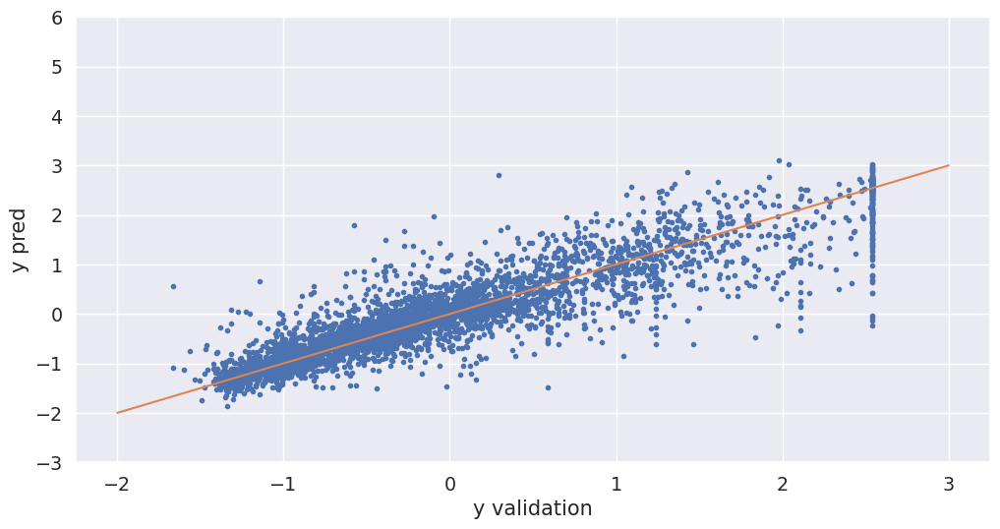

In [54]:
y_pred_nn = model.predict(X_validation.values)
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(y_validation, y_pred_nn, ".")
plt.plot(range(-2, 4), range(-2, 4))
plt.ylim(-3, 6)
plt.xlabel("y validation")
plt.ylabel("y pred")

No handles with labels found to put in legend.


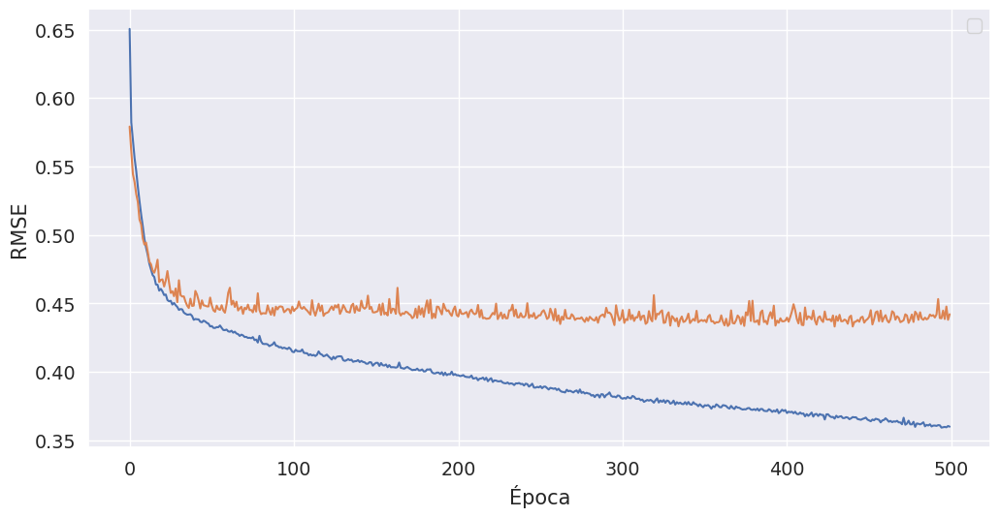

In [55]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Que pasa si agregamos muchas neuronas?

In [56]:
model = Sequential()
model.add(Dense(100, activation='relu', input_shape=(8,)))
model.add(Dense(50, activation='relu'))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [57]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 17s - loss: 0.6162

1472/6000 [======>.......................] - ETA: 0s - loss: 0.6006 

2976/6000 [=============>................] - ETA: 0s - loss: 0.5181

4352/6000 [====================>.........] - ETA: 0s - loss: 0.4725

5824/6000 [============================>.] - ETA: 0s - loss: 0.4418

6000/6000 [==============================] - 0s 69us/step - loss: 0.6491 - val_loss: 0.3508


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2767

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3522

2880/6000 [=============>................] - ETA: 0s - loss: 0.4131

4256/6000 [====================>.........] - ETA: 0s - loss: 0.3914

5632/6000 [===========================>..] - ETA: 0s - loss: 0.3849

6000/6000 [==============================] - 0s 52us/step - loss: 0.3825 - val_loss: 0.3070


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6574

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3410

2816/6000 [=============>................] - ETA: 0s - loss: 0.3258

4256/6000 [====================>.........] - ETA: 0s - loss: 0.3033

5600/6000 [===========================>..] - ETA: 0s - loss: 0.3028

6000/6000 [==============================] - 0s 54us/step - loss: 0.2982 - val_loss: 0.2555


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1703

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2623

2912/6000 [=============>................] - ETA: 0s - loss: 0.2594

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2593

5856/6000 [============================>.] - ETA: 0s - loss: 0.2497

6000/6000 [==============================] - 0s 51us/step - loss: 0.2488 - val_loss: 0.2413


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2617

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2279

2848/6000 [=============>................] - ETA: 0s - loss: 0.2364

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2397

5856/6000 [============================>.] - ETA: 0s - loss: 0.2358

6000/6000 [==============================] - 0s 50us/step - loss: 0.2355 - val_loss: 0.2350


Epoch 6/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2622

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2369

2848/6000 [=============>................] - ETA: 0s - loss: 0.2265

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2257

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2279

6000/6000 [==============================] - 0s 53us/step - loss: 0.2291 - val_loss: 0.2393


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1248

1344/6000 [=====>........................] - ETA: 0s - loss: 0.3043

2848/6000 [=============>................] - ETA: 0s - loss: 0.2813

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2651

5920/6000 [============================>.] - ETA: 0s - loss: 0.2527

6000/6000 [==============================] - 0s 51us/step - loss: 0.2519 - val_loss: 0.2227


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1236

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2042

2944/6000 [=============>................] - ETA: 0s - loss: 0.2117

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2256

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2190

6000/6000 [==============================] - 0s 52us/step - loss: 0.2218 - val_loss: 0.2208


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3342

1632/6000 [=======>......................] - ETA: 0s - loss: 0.2205

3168/6000 [==============>...............] - ETA: 0s - loss: 0.2241

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2165

6000/6000 [==============================] - 0s 49us/step - loss: 0.2168 - val_loss: 0.2243


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1266

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2066

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2127

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2162

6000/6000 [==============================] - 0s 49us/step - loss: 0.2146 - val_loss: 0.2256


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1509

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2063

3104/6000 [==============>...............] - ETA: 0s - loss: 0.2140

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2125

6000/6000 [==============================] - 0s 48us/step - loss: 0.2113 - val_loss: 0.2192


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1655

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1992

2912/6000 [=============>................] - ETA: 0s - loss: 0.1945

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1995

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2034

6000/6000 [==============================] - 0s 52us/step - loss: 0.2055 - val_loss: 0.2262


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1183

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2056

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2015

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2041

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2058

6000/6000 [==============================] - 0s 54us/step - loss: 0.2036 - val_loss: 0.2204


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2127

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2089

2656/6000 [============>.................] - ETA: 0s - loss: 0.2077

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2028

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2047

6000/6000 [==============================] - 0s 51us/step - loss: 0.2037 - val_loss: 0.2135


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1129

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2215

2880/6000 [=============>................] - ETA: 0s - loss: 0.2129

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2050

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2076

6000/6000 [==============================] - 0s 51us/step - loss: 0.2056 - val_loss: 0.2132


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3901

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2253

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2157

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1975

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2018

6000/6000 [==============================] - 0s 56us/step - loss: 0.1999 - val_loss: 0.2106


Epoch 17/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2553

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2029

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1972

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1902

6000/6000 [==============================] - 0s 49us/step - loss: 0.1984 - val_loss: 0.2197


Epoch 18/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2235

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3172

2816/6000 [=============>................] - ETA: 0s - loss: 0.2757

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2544

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2399

6000/6000 [==============================] - 0s 53us/step - loss: 0.2363 - val_loss: 0.2087


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1539

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1982

2848/6000 [=============>................] - ETA: 0s - loss: 0.1982

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1940

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2008

6000/6000 [==============================] - 0s 54us/step - loss: 0.1994 - val_loss: 0.2147


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1301

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2039

2624/6000 [============>.................] - ETA: 0s - loss: 0.2059

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2042

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1959

6000/6000 [==============================] - 0s 53us/step - loss: 0.1995 - val_loss: 0.2123


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1312

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2007

2880/6000 [=============>................] - ETA: 0s - loss: 0.2051

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1942

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1961

6000/6000 [==============================] - 0s 53us/step - loss: 0.1947 - val_loss: 0.2048


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1909

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1873

2880/6000 [=============>................] - ETA: 0s - loss: 0.1974

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2019

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1930

6000/6000 [==============================] - 0s 52us/step - loss: 0.1913 - val_loss: 0.2056


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2062

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1784

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1896

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1875

6000/6000 [==============================] - 0s 50us/step - loss: 0.1877 - val_loss: 0.2067


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1667

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2022

2752/6000 [============>.................] - ETA: 0s - loss: 0.1850

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1855

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1867

6000/6000 [==============================] - 0s 56us/step - loss: 0.1878 - val_loss: 0.2018


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1648

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1963

2848/6000 [=============>................] - ETA: 0s - loss: 0.1977

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1894

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1848

6000/6000 [==============================] - 0s 52us/step - loss: 0.1872 - val_loss: 0.2037


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1240

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1931

2688/6000 [============>.................] - ETA: 0s - loss: 0.1927

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1949

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1926

6000/6000 [==============================] - 0s 58us/step - loss: 0.1935 - val_loss: 0.2052


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2383

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1902

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1846

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1866

5920/6000 [============================>.] - ETA: 0s - loss: 0.1896

6000/6000 [==============================] - 0s 51us/step - loss: 0.1893 - val_loss: 0.2142


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0939

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1965

2976/6000 [=============>................] - ETA: 0s - loss: 0.1893

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1881

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1923

6000/6000 [==============================] - 0s 52us/step - loss: 0.1914 - val_loss: 0.2037


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1483

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1834

2816/6000 [=============>................] - ETA: 0s - loss: 0.1762

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1823

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1853

6000/6000 [==============================] - 0s 55us/step - loss: 0.1836 - val_loss: 0.2063


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1044

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1777

2784/6000 [============>.................] - ETA: 0s - loss: 0.1744

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1848

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1855

6000/6000 [==============================] - 0s 53us/step - loss: 0.1882 - val_loss: 0.2054


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1557

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1737

2912/6000 [=============>................] - ETA: 0s - loss: 0.1742

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1785

5824/6000 [============================>.] - ETA: 0s - loss: 0.1801

6000/6000 [==============================] - 0s 51us/step - loss: 0.1815 - val_loss: 0.2022


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2382

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1749

2912/6000 [=============>................] - ETA: 0s - loss: 0.1731

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1803

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 55us/step - loss: 0.1814 - val_loss: 0.2001


Epoch 33/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0725

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1756

2688/6000 [============>.................] - ETA: 0s - loss: 0.1646

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1709

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1796

6000/6000 [==============================] - 0s 53us/step - loss: 0.1787 - val_loss: 0.2013


Epoch 34/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3235

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2083

2912/6000 [=============>................] - ETA: 0s - loss: 0.1896

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1855

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1816

6000/6000 [==============================] - 0s 52us/step - loss: 0.1812 - val_loss: 0.2034


Epoch 35/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1977

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1693

2976/6000 [=============>................] - ETA: 0s - loss: 0.1735

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1757

6000/6000 [==============================] - 0s 49us/step - loss: 0.1768 - val_loss: 0.2030


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1494

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1736

2880/6000 [=============>................] - ETA: 0s - loss: 0.1711

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1743

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1723

6000/6000 [==============================] - 0s 52us/step - loss: 0.1737 - val_loss: 0.2009


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1166

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1771

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1803

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1827

6000/6000 [==============================] - 0s 50us/step - loss: 0.1796 - val_loss: 0.1985


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1212

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1735

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1645

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1761

6000/6000 [==============================] - 0s 48us/step - loss: 0.1738 - val_loss: 0.1981


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2555

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1769

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1796

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1792

6000/6000 [==============================] - 0s 49us/step - loss: 0.1746 - val_loss: 0.1965


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1503

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1625

2880/6000 [=============>................] - ETA: 0s - loss: 0.1756

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1767

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 52us/step - loss: 0.1762 - val_loss: 0.2045


Epoch 41/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1055

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1887

2816/6000 [=============>................] - ETA: 0s - loss: 0.1833

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1768

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1779

6000/6000 [==============================] - 0s 53us/step - loss: 0.1758 - val_loss: 0.2046


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2142

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1703

2912/6000 [=============>................] - ETA: 0s - loss: 0.1784

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1744

5920/6000 [============================>.] - ETA: 0s - loss: 0.1744

6000/6000 [==============================] - 0s 54us/step - loss: 0.1736 - val_loss: 0.2025


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1607

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1850

2784/6000 [============>.................] - ETA: 0s - loss: 0.1741

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1683

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1704

6000/6000 [==============================] - 0s 55us/step - loss: 0.1704 - val_loss: 0.1972


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2199

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1763

2880/6000 [=============>................] - ETA: 0s - loss: 0.1774

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1672

5856/6000 [============================>.] - ETA: 0s - loss: 0.1696

6000/6000 [==============================] - 0s 51us/step - loss: 0.1687 - val_loss: 0.1979


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1799

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1658

2880/6000 [=============>................] - ETA: 0s - loss: 0.1705

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1609

5888/6000 [============================>.] - ETA: 0s - loss: 0.1665

6000/6000 [==============================] - 0s 51us/step - loss: 0.1671 - val_loss: 0.2083


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1058

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1711

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1669

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1699

6000/6000 [==============================] - 0s 49us/step - loss: 0.1713 - val_loss: 0.1961


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0925

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1490

2784/6000 [============>.................] - ETA: 0s - loss: 0.1542

3744/6000 [=================>............] - ETA: 0s - loss: 0.1501

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1605

6000/6000 [==============================] - 0s 56us/step - loss: 0.1666 - val_loss: 0.2080


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3776

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1688

2848/6000 [=============>................] - ETA: 0s - loss: 0.1682

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1685

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1668

6000/6000 [==============================] - 0s 54us/step - loss: 0.1664 - val_loss: 0.2004


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0890

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1507

2784/6000 [============>.................] - ETA: 0s - loss: 0.1591

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1686

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 54us/step - loss: 0.1695 - val_loss: 0.1956


Epoch 50/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1760

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1747

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1695

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1716

6000/6000 [==============================] - 0s 51us/step - loss: 0.1671 - val_loss: 0.1981


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0807

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1654

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1628

3712/6000 [=================>............] - ETA: 0s - loss: 0.1705

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1703

6000/6000 [==============================] - 0s 54us/step - loss: 0.1668 - val_loss: 0.1936


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2010

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1654

2816/6000 [=============>................] - ETA: 0s - loss: 0.1618

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1633

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1683

5888/6000 [============================>.] - ETA: 0s - loss: 0.1696

6000/6000 [==============================] - 0s 61us/step - loss: 0.1694 - val_loss: 0.2156


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5183

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1742

2912/6000 [=============>................] - ETA: 0s - loss: 0.1693

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1692

5952/6000 [============================>.] - ETA: 0s - loss: 0.1688

6000/6000 [==============================] - 0s 50us/step - loss: 0.1689 - val_loss: 0.2012


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2627

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1752

2944/6000 [=============>................] - ETA: 0s - loss: 0.1704

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1660

5824/6000 [============================>.] - ETA: 0s - loss: 0.1625

6000/6000 [==============================] - 0s 51us/step - loss: 0.1620 - val_loss: 0.2038


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0846

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1439

2880/6000 [=============>................] - ETA: 0s - loss: 0.1574

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1634

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1603

6000/6000 [==============================] - 0s 56us/step - loss: 0.1612 - val_loss: 0.1930


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3533

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1607

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1567

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1596

6000/6000 [==============================] - 0s 49us/step - loss: 0.1599 - val_loss: 0.1945


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0890

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1594

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1504

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1565

6000/6000 [==============================] - 0s 50us/step - loss: 0.1612 - val_loss: 0.1926


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1427

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1672

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1588

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1561

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1587

6000/6000 [==============================] - 0s 53us/step - loss: 0.1616 - val_loss: 0.1994


Epoch 59/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1926

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1619

2656/6000 [============>.................] - ETA: 0s - loss: 0.1600

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1614

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1588

6000/6000 [==============================] - 0s 54us/step - loss: 0.1604 - val_loss: 0.1999


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1565

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1594

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1541

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1676

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1647

6000/6000 [==============================] - 0s 55us/step - loss: 0.1633 - val_loss: 0.1986


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3390

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1623

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1538

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1586

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1601

6000/6000 [==============================] - 0s 55us/step - loss: 0.1594 - val_loss: 0.1917


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0926

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1388

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1489

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1517

5920/6000 [============================>.] - ETA: 0s - loss: 0.1560

6000/6000 [==============================] - 0s 54us/step - loss: 0.1563 - val_loss: 0.1920


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0706

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1544

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1555

3680/6000 [=================>............] - ETA: 0s - loss: 0.1601

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1604

6000/6000 [==============================] - 0s 59us/step - loss: 0.1594 - val_loss: 0.2026


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2169

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1410

2848/6000 [=============>................] - ETA: 0s - loss: 0.1612

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1614

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1606

6000/6000 [==============================] - 0s 55us/step - loss: 0.1586 - val_loss: 0.1929


Epoch 65/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1220

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1608

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1832

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 49us/step - loss: 0.1701 - val_loss: 0.1936


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3706

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1645

2848/6000 [=============>................] - ETA: 0s - loss: 0.1562

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1674

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1684

6000/6000 [==============================] - 0s 52us/step - loss: 0.1657 - val_loss: 0.1990


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1131

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1430

2848/6000 [=============>................] - ETA: 0s - loss: 0.1521

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1550

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1585

6000/6000 [==============================] - 0s 52us/step - loss: 0.1582 - val_loss: 0.1880


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1542

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1600

2912/6000 [=============>................] - ETA: 0s - loss: 0.1540

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1491

6000/6000 [==============================] - 0s 50us/step - loss: 0.1554 - val_loss: 0.1929


Epoch 69/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1370

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1571

2848/6000 [=============>................] - ETA: 0s - loss: 0.1633

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1625

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1589

6000/6000 [==============================] - 0s 53us/step - loss: 0.1584 - val_loss: 0.1910


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0366

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1553

2784/6000 [============>.................] - ETA: 0s - loss: 0.1544

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1557

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1554

6000/6000 [==============================] - 0s 54us/step - loss: 0.1583 - val_loss: 0.1931


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2281

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1676

2848/6000 [=============>................] - ETA: 0s - loss: 0.1662

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1636

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1590

6000/6000 [==============================] - 0s 52us/step - loss: 0.1576 - val_loss: 0.1925


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1834

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1641

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1631

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1559

6000/6000 [==============================] - 0s 48us/step - loss: 0.1561 - val_loss: 0.1909


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1986

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1481

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1498

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1539

6000/6000 [==============================] - 0s 49us/step - loss: 0.1539 - val_loss: 0.1921


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1310

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1502

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1531

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1583

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1589

6000/6000 [==============================] - 0s 53us/step - loss: 0.1574 - val_loss: 0.1952


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1895

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1523

2880/6000 [=============>................] - ETA: 0s - loss: 0.1479

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1537

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1540

6000/6000 [==============================] - 0s 53us/step - loss: 0.1535 - val_loss: 0.1889


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0857

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1470

2816/6000 [=============>................] - ETA: 0s - loss: 0.1518

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1536

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1510

6000/6000 [==============================] - 0s 55us/step - loss: 0.1503 - val_loss: 0.1901


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1076

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1559

2848/6000 [=============>................] - ETA: 0s - loss: 0.1528

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1555

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1537

6000/6000 [==============================] - 0s 53us/step - loss: 0.1509 - val_loss: 0.1916


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1836

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1627

2880/6000 [=============>................] - ETA: 0s - loss: 0.1529

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1514

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1493

6000/6000 [==============================] - 0s 52us/step - loss: 0.1513 - val_loss: 0.1949


Epoch 79/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2838

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1646

2688/6000 [============>.................] - ETA: 0s - loss: 0.1605

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1590

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1545

6000/6000 [==============================] - 0s 54us/step - loss: 0.1502 - val_loss: 0.1952


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1330

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1501

2688/6000 [============>.................] - ETA: 0s - loss: 0.1506

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1513

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1479

6000/6000 [==============================] - 0s 54us/step - loss: 0.1491 - val_loss: 0.1958


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0837

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1652

2784/6000 [============>.................] - ETA: 0s - loss: 0.1493

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1535

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1497

6000/6000 [==============================] - 0s 52us/step - loss: 0.1509 - val_loss: 0.1868


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1487

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1375

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1462

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1489

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1491

6000/6000 [==============================] - 0s 53us/step - loss: 0.1496 - val_loss: 0.1871


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0905

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1320

2912/6000 [=============>................] - ETA: 0s - loss: 0.1321

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1422

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1474

6000/6000 [==============================] - 0s 52us/step - loss: 0.1468 - val_loss: 0.1926


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1444

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1463

2720/6000 [============>.................] - ETA: 0s - loss: 0.1599

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1523

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1506

6000/6000 [==============================] - 0s 51us/step - loss: 0.1507 - val_loss: 0.1968


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1774

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1358

2880/6000 [=============>................] - ETA: 0s - loss: 0.1423

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1428

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1478

6000/6000 [==============================] - 0s 54us/step - loss: 0.1466 - val_loss: 0.1928


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1377

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1354

2784/6000 [============>.................] - ETA: 0s - loss: 0.1428

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1401

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1444

6000/6000 [==============================] - 0s 52us/step - loss: 0.1469 - val_loss: 0.1920


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1398

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1357

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1395

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1458

5952/6000 [============================>.] - ETA: 0s - loss: 0.1462

6000/6000 [==============================] - 0s 50us/step - loss: 0.1461 - val_loss: 0.1935


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0862

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1338

3168/6000 [==============>...............] - ETA: 0s - loss: 0.1403

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1423

6000/6000 [==============================] - 0s 50us/step - loss: 0.1445 - val_loss: 0.1946


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0552

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1471

2816/6000 [=============>................] - ETA: 0s - loss: 0.1477

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1446

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1434

6000/6000 [==============================] - 0s 55us/step - loss: 0.1475 - val_loss: 0.1909


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0524

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1516

2720/6000 [============>.................] - ETA: 0s - loss: 0.1507

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1472

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1438

6000/6000 [==============================] - 0s 53us/step - loss: 0.1449 - val_loss: 0.2044


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0961

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1377

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1421

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1441

5952/6000 [============================>.] - ETA: 0s - loss: 0.1449

6000/6000 [==============================] - 0s 51us/step - loss: 0.1450 - val_loss: 0.2025


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1141

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1290

2848/6000 [=============>................] - ETA: 0s - loss: 0.1380

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1406

5824/6000 [============================>.] - ETA: 0s - loss: 0.1455

6000/6000 [==============================] - 0s 52us/step - loss: 0.1472 - val_loss: 0.1974


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2401

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1427

2720/6000 [============>.................] - ETA: 0s - loss: 0.1450

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1432

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1448

6000/6000 [==============================] - 0s 54us/step - loss: 0.1444 - val_loss: 0.1929


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1075

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1307

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1414

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1431

5984/6000 [============================>.] - ETA: 0s - loss: 0.1454

6000/6000 [==============================] - 0s 51us/step - loss: 0.1452 - val_loss: 0.2004


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1119

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1277

2752/6000 [============>.................] - ETA: 0s - loss: 0.1340

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1398



5536/6000 [==========================>...] - ETA: 0s - loss: 0.1419

6000/6000 [==============================] - 0s 53us/step - loss: 0.1427 - val_loss: 0.1890


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1658

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1403

2784/6000 [============>.................] - ETA: 0s - loss: 0.1336

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1397

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1409

6000/6000 [==============================] - 0s 52us/step - loss: 0.1416 - val_loss: 0.1900


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2011

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1291

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1316

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1369

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1405

6000/6000 [==============================] - 0s 58us/step - loss: 0.1414 - val_loss: 0.1962


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0919

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1355

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1395

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1419

6000/6000 [==============================] - 0s 49us/step - loss: 0.1417 - val_loss: 0.2069


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1701

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1429

2848/6000 [=============>................] - ETA: 0s - loss: 0.1384

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1409

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1368

6000/6000 [==============================] - 0s 57us/step - loss: 0.1396 - val_loss: 0.1953


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1530

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1538

2816/6000 [=============>................] - ETA: 0s - loss: 0.1406

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1411

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1401

6000/6000 [==============================] - 0s 55us/step - loss: 0.1416 - val_loss: 0.1893


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1993

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1441

2912/6000 [=============>................] - ETA: 0s - loss: 0.1375

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1389

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1393

6000/6000 [==============================] - 0s 53us/step - loss: 0.1384 - val_loss: 0.1921


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1578

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1478

2848/6000 [=============>................] - ETA: 0s - loss: 0.1454

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1435

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1402

6000/6000 [==============================] - 0s 53us/step - loss: 0.1403 - val_loss: 0.1954


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1174

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1438

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1376

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1367

6000/6000 [==============================] - 0s 49us/step - loss: 0.1370 - val_loss: 0.1956


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1184

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1468

2880/6000 [=============>................] - ETA: 0s - loss: 0.1376

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1369

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1390

6000/6000 [==============================] - 0s 52us/step - loss: 0.1377 - val_loss: 0.2034


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0947

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1312

2880/6000 [=============>................] - ETA: 0s - loss: 0.1265

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1288

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1335

6000/6000 [==============================] - 0s 52us/step - loss: 0.1350 - val_loss: 0.1912


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0938

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1447

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1419

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1383

6000/6000 [==============================] - 0s 49us/step - loss: 0.1369 - val_loss: 0.1914


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2229

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1145

2912/6000 [=============>................] - ETA: 0s - loss: 0.1230

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1316

5920/6000 [============================>.] - ETA: 0s - loss: 0.1353

6000/6000 [==============================] - 0s 51us/step - loss: 0.1352 - val_loss: 0.1958


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2353

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1400

2816/6000 [=============>................] - ETA: 0s - loss: 0.1379

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1371

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1374

6000/6000 [==============================] - 0s 54us/step - loss: 0.1356 - val_loss: 0.1895


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0809

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1230

2720/6000 [============>.................] - ETA: 0s - loss: 0.1297

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1333

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1364

6000/6000 [==============================] - 0s 53us/step - loss: 0.1367 - val_loss: 0.2062


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1599

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1270

2880/6000 [=============>................] - ETA: 0s - loss: 0.1271

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1336

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1347

6000/6000 [==============================] - 0s 53us/step - loss: 0.1349 - val_loss: 0.1966


Epoch 111/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1571

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1422

2752/6000 [============>.................] - ETA: 0s - loss: 0.1314

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1367

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1367

6000/6000 [==============================] - 0s 54us/step - loss: 0.1363 - val_loss: 0.2006


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1352

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1282

2944/6000 [=============>................] - ETA: 0s - loss: 0.1313

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1318

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1317

6000/6000 [==============================] - 0s 52us/step - loss: 0.1324 - val_loss: 0.1963


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1350

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1303

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1337

3776/6000 [=================>............] - ETA: 0s - loss: 0.1289

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1312

6000/6000 [==============================] - 0s 54us/step - loss: 0.1327 - val_loss: 0.1954


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0930

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1318

2848/6000 [=============>................] - ETA: 0s - loss: 0.1272

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1292

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1325

6000/6000 [==============================] - 0s 52us/step - loss: 0.1364 - val_loss: 0.1960


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1923

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1184

2848/6000 [=============>................] - ETA: 0s - loss: 0.1232

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1342

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1324

6000/6000 [==============================] - 0s 55us/step - loss: 0.1357 - val_loss: 0.1895


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1420

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1285

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1401

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1360

6000/6000 [==============================] - 0s 49us/step - loss: 0.1348 - val_loss: 0.1970


Epoch 117/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1109

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1387

2752/6000 [============>.................] - ETA: 0s - loss: 0.1441

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1417

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1334

6000/6000 [==============================] - 0s 54us/step - loss: 0.1337 - val_loss: 0.2022


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1536

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1273

2688/6000 [============>.................] - ETA: 0s - loss: 0.1277

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1273

5344/6000 [=========================>....] - ETA: 0s - loss: 0.1309

6000/6000 [==============================] - 0s 55us/step - loss: 0.1320 - val_loss: 0.2015


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0963

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1210

2688/6000 [============>.................] - ETA: 0s - loss: 0.1263

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1351

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1336

6000/6000 [==============================] - 0s 53us/step - loss: 0.1323 - val_loss: 0.1946


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1082

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1222

2880/6000 [=============>................] - ETA: 0s - loss: 0.1292

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1343

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1305

6000/6000 [==============================] - 0s 53us/step - loss: 0.1303 - val_loss: 0.1907


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1116

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1291

2880/6000 [=============>................] - ETA: 0s - loss: 0.1301

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1296

5952/6000 [============================>.] - ETA: 0s - loss: 0.1294

6000/6000 [==============================] - 0s 50us/step - loss: 0.1298 - val_loss: 0.1944


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1390

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1338

2912/6000 [=============>................] - ETA: 0s - loss: 0.1352

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1347

5984/6000 [============================>.] - ETA: 0s - loss: 0.1303

6000/6000 [==============================] - 0s 52us/step - loss: 0.1303 - val_loss: 0.1903


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1067

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1322

2912/6000 [=============>................] - ETA: 0s - loss: 0.1281

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1319

5952/6000 [============================>.] - ETA: 0s - loss: 0.1308

6000/6000 [==============================] - 0s 50us/step - loss: 0.1305 - val_loss: 0.1908


Epoch 124/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0379

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1351

2816/6000 [=============>................] - ETA: 0s - loss: 0.1290

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1279

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1277

6000/6000 [==============================] - 0s 52us/step - loss: 0.1291 - val_loss: 0.1986


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0727

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1207

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1238

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1272

6000/6000 [==============================] - 0s 50us/step - loss: 0.1290 - val_loss: 0.2014


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1465

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1233

2816/6000 [=============>................] - ETA: 0s - loss: 0.1232

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1225

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1246

6000/6000 [==============================] - 0s 52us/step - loss: 0.1265 - val_loss: 0.2068


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0740

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1304

2848/6000 [=============>................] - ETA: 0s - loss: 0.1377

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1310

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1285

6000/6000 [==============================] - 0s 53us/step - loss: 0.1286 - val_loss: 0.1954


Epoch 128/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1248

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1120

2944/6000 [=============>................] - ETA: 0s - loss: 0.1218

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1293

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1299

6000/6000 [==============================] - 0s 51us/step - loss: 0.1298 - val_loss: 0.1935


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2414

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1268

2816/6000 [=============>................] - ETA: 0s - loss: 0.1307

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1281

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1290

6000/6000 [==============================] - 0s 53us/step - loss: 0.1292 - val_loss: 0.1973


Epoch 130/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1754

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1316

2752/6000 [============>.................] - ETA: 0s - loss: 0.1325

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1273

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1279

6000/6000 [==============================] - 0s 53us/step - loss: 0.1267 - val_loss: 0.1950


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2315

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1311

2816/6000 [=============>................] - ETA: 0s - loss: 0.1292

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1321

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1296

6000/6000 [==============================] - 0s 53us/step - loss: 0.1274 - val_loss: 0.1930


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0493

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1232

2848/6000 [=============>................] - ETA: 0s - loss: 0.1241

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1206

5856/6000 [============================>.] - ETA: 0s - loss: 0.1297

6000/6000 [==============================] - 0s 51us/step - loss: 0.1286 - val_loss: 0.1995


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1565

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1339

2880/6000 [=============>................] - ETA: 0s - loss: 0.1261

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1237

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1260

6000/6000 [==============================] - 0s 52us/step - loss: 0.1267 - val_loss: 0.1994


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1677

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1143

2816/6000 [=============>................] - ETA: 0s - loss: 0.1206

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1289

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1259

6000/6000 [==============================] - 0s 53us/step - loss: 0.1256 - val_loss: 0.1982


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0831

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1198

2944/6000 [=============>................] - ETA: 0s - loss: 0.1279

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1250

5856/6000 [============================>.] - ETA: 0s - loss: 0.1479

6000/6000 [==============================] - 0s 53us/step - loss: 0.1468 - val_loss: 0.1940


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1163

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1394

2912/6000 [=============>................] - ETA: 0s - loss: 0.1331

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1311

5984/6000 [============================>.] - ETA: 0s - loss: 0.1283

6000/6000 [==============================] - 0s 50us/step - loss: 0.1304 - val_loss: 0.1974


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1878

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1190

2656/6000 [============>.................] - ETA: 0s - loss: 0.1170

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1198

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1240

6000/6000 [==============================] - 0s 54us/step - loss: 0.1254 - val_loss: 0.1936


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0660

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1296

2880/6000 [=============>................] - ETA: 0s - loss: 0.1265

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1266

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1253

6000/6000 [==============================] - 0s 53us/step - loss: 0.1254 - val_loss: 0.2014


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0835

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1158

2752/6000 [============>.................] - ETA: 0s - loss: 0.1196

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1185

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1241

6000/6000 [==============================] - 0s 52us/step - loss: 0.1258 - val_loss: 0.1965


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0725

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1195

2912/6000 [=============>................] - ETA: 0s - loss: 0.1177

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1205

5824/6000 [============================>.] - ETA: 0s - loss: 0.1212

6000/6000 [==============================] - 0s 52us/step - loss: 0.1228 - val_loss: 0.2028


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0731

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1173

2784/6000 [============>.................] - ETA: 0s - loss: 0.1177

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1239

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1205

6000/6000 [==============================] - 0s 53us/step - loss: 0.1223 - val_loss: 0.2014


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1138

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1304

2816/6000 [=============>................] - ETA: 0s - loss: 0.1214

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1261

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1235

6000/6000 [==============================] - 0s 53us/step - loss: 0.1237 - val_loss: 0.2135


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1067

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1328

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1237

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1242

6000/6000 [==============================] - 0s 49us/step - loss: 0.1242 - val_loss: 0.1954


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1060

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1184

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1204

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1241

6000/6000 [==============================] - 0s 50us/step - loss: 0.1215 - val_loss: 0.2014


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1955

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1198

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1218

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1276

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1238

6000/6000 [==============================] - 0s 53us/step - loss: 0.1234 - val_loss: 0.2041


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1662

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1219

2784/6000 [============>.................] - ETA: 0s - loss: 0.1328

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1262

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1232

6000/6000 [==============================] - 0s 54us/step - loss: 0.1222 - val_loss: 0.2091


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0923

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1096

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1148

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1197

5920/6000 [============================>.] - ETA: 0s - loss: 0.1220

6000/6000 [==============================] - 0s 51us/step - loss: 0.1217 - val_loss: 0.2007


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1606

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1158

2944/6000 [=============>................] - ETA: 0s - loss: 0.1281

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1222

5984/6000 [============================>.] - ETA: 0s - loss: 0.1208

6000/6000 [==============================] - 0s 51us/step - loss: 0.1214 - val_loss: 0.2022


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1719

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1228

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1250

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1239

6000/6000 [==============================] - 0s 52us/step - loss: 0.1218 - val_loss: 0.1988


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0461

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1111

2752/6000 [============>.................] - ETA: 0s - loss: 0.1170

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1141

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1169

6000/6000 [==============================] - 0s 54us/step - loss: 0.1203 - val_loss: 0.2050


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0690

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1163

2816/6000 [=============>................] - ETA: 0s - loss: 0.1209

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1191

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1192

6000/6000 [==============================] - 0s 53us/step - loss: 0.1209 - val_loss: 0.1935


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1205

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1196

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1186

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1194

6000/6000 [==============================] - 0s 50us/step - loss: 0.1178 - val_loss: 0.2021


Epoch 153/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1329

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1247

2912/6000 [=============>................] - ETA: 0s - loss: 0.1227

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1186

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1169

6000/6000 [==============================] - 0s 52us/step - loss: 0.1185 - val_loss: 0.2007


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1132

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1139

2912/6000 [=============>................] - ETA: 0s - loss: 0.1225

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1202

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1186

6000/6000 [==============================] - 0s 52us/step - loss: 0.1187 - val_loss: 0.2036


Epoch 155/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1029

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1163

2688/6000 [============>.................] - ETA: 0s - loss: 0.1201

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1150

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1166

6000/6000 [==============================] - 0s 54us/step - loss: 0.1176 - val_loss: 0.2011


Epoch 156/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1052

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1101

2912/6000 [=============>................] - ETA: 0s - loss: 0.1138

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1184

5888/6000 [============================>.] - ETA: 0s - loss: 0.1199

6000/6000 [==============================] - 0s 51us/step - loss: 0.1210 - val_loss: 0.2029


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2150

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1223

2848/6000 [=============>................] - ETA: 0s - loss: 0.1202

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1212

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1192

6000/6000 [==============================] - 0s 53us/step - loss: 0.1185 - val_loss: 0.2000


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0894

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1026

2976/6000 [=============>................] - ETA: 0s - loss: 0.1196

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1206

6000/6000 [==============================] - 0s 49us/step - loss: 0.1174 - val_loss: 0.2021


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0796

1632/6000 [=======>......................] - ETA: 0s - loss: 0.1034

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1120

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1132

5824/6000 [============================>.] - ETA: 0s - loss: 0.1164

6000/6000 [==============================] - 0s 52us/step - loss: 0.1166 - val_loss: 0.2009


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1264

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1281

2720/6000 [============>.................] - ETA: 0s - loss: 0.1266

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1226

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1188

6000/6000 [==============================] - 0s 51us/step - loss: 0.1179 - val_loss: 0.1960


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0688

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1152

2656/6000 [============>.................] - ETA: 0s - loss: 0.1113

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1149

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1167

6000/6000 [==============================] - 0s 53us/step - loss: 0.1168 - val_loss: 0.1984


Epoch 162/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1785

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1128

2976/6000 [=============>................] - ETA: 0s - loss: 0.1129

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1164

6000/6000 [==============================] - 0s 51us/step - loss: 0.1192 - val_loss: 0.2052


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0976

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1190

2880/6000 [=============>................] - ETA: 0s - loss: 0.1164

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1171

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1172

6000/6000 [==============================] - 0s 52us/step - loss: 0.1176 - val_loss: 0.2100


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1114

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1124

2848/6000 [=============>................] - ETA: 0s - loss: 0.1115

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1143

5824/6000 [============================>.] - ETA: 0s - loss: 0.1192

6000/6000 [==============================] - 0s 51us/step - loss: 0.1197 - val_loss: 0.2140


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0439

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1290

2752/6000 [============>.................] - ETA: 0s - loss: 0.1223

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1187

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1158

6000/6000 [==============================] - 0s 55us/step - loss: 0.1167 - val_loss: 0.2018


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0407

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1081

2944/6000 [=============>................] - ETA: 0s - loss: 0.1140

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1161

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1156

6000/6000 [==============================] - 0s 55us/step - loss: 0.1163 - val_loss: 0.2055


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1703

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1264

2784/6000 [============>.................] - ETA: 0s - loss: 0.1180

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1165

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1158

6000/6000 [==============================] - 0s 53us/step - loss: 0.1167 - val_loss: 0.2019


Epoch 168/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0835

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1109

2848/6000 [=============>................] - ETA: 0s - loss: 0.1141

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1129

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1144

6000/6000 [==============================] - 0s 52us/step - loss: 0.1153 - val_loss: 0.2024


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0981

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1099

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1079

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1447

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1429

6000/6000 [==============================] - 0s 53us/step - loss: 0.1424 - val_loss: 0.2020


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1008

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1055

2944/6000 [=============>................] - ETA: 0s - loss: 0.1206

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1212

6000/6000 [==============================] - 0s 49us/step - loss: 0.1179 - val_loss: 0.2025


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0781

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1080

2944/6000 [=============>................] - ETA: 0s - loss: 0.1100

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1127

5888/6000 [============================>.] - ETA: 0s - loss: 0.1134

6000/6000 [==============================] - 0s 51us/step - loss: 0.1162 - val_loss: 0.2125


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0797

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1121

2752/6000 [============>.................] - ETA: 0s - loss: 0.1178

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1140

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1173

6000/6000 [==============================] - 0s 54us/step - loss: 0.1177 - val_loss: 0.2014


Epoch 173/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0683

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1134

2976/6000 [=============>................] - ETA: 0s - loss: 0.1071

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1111

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1122

6000/6000 [==============================] - 0s 52us/step - loss: 0.1124 - val_loss: 0.2166


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1136

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1148

2752/6000 [============>.................] - ETA: 0s - loss: 0.1222

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1203

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1158

6000/6000 [==============================] - 0s 53us/step - loss: 0.1165 - val_loss: 0.1978


Epoch 175/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0901

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1057

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1139

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1161

6000/6000 [==============================] - 0s 51us/step - loss: 0.1133 - val_loss: 0.2081


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0780

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1133

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1119

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1098

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1101

6000/6000 [==============================] - 0s 57us/step - loss: 0.1121 - val_loss: 0.2045


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1174

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1141

2784/6000 [============>.................] - ETA: 0s - loss: 0.1114

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1122

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1155

6000/6000 [==============================] - 0s 52us/step - loss: 0.1147 - val_loss: 0.2014


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1130

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1118

2944/6000 [=============>................] - ETA: 0s - loss: 0.1148

4096/6000 [===================>..........] - ETA: 0s - loss: 0.1116

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1126

6000/6000 [==============================] - 0s 54us/step - loss: 0.1128 - val_loss: 0.2061


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1507

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1088

2688/6000 [============>.................] - ETA: 0s - loss: 0.1074

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1093

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1115

6000/6000 [==============================] - 0s 56us/step - loss: 0.1118 - val_loss: 0.2112


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1056

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1111

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1057

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1149

6000/6000 [==============================] - 0s 49us/step - loss: 0.1129 - val_loss: 0.2040


Epoch 181/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0917

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1060

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1066

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1110

6000/6000 [==============================] - 0s 49us/step - loss: 0.1116 - val_loss: 0.1968


Epoch 182/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0902

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1061

2944/6000 [=============>................] - ETA: 0s - loss: 0.1059

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1067

5856/6000 [============================>.] - ETA: 0s - loss: 0.1112

6000/6000 [==============================] - 0s 52us/step - loss: 0.1110 - val_loss: 0.2029


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0644

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1020

2912/6000 [=============>................] - ETA: 0s - loss: 0.1074

4128/6000 [===================>..........] - ETA: 0s - loss: 0.1081

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1102

6000/6000 [==============================] - 0s 56us/step - loss: 0.1107 - val_loss: 0.2092


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1629

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1136

2848/6000 [=============>................] - ETA: 0s - loss: 0.1143

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1127

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1126

6000/6000 [==============================] - 0s 52us/step - loss: 0.1112 - val_loss: 0.2008


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0627

1600/6000 [=======>......................] - ETA: 0s - loss: 0.1192

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1122

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1118

6000/6000 [==============================] - 0s 49us/step - loss: 0.1120 - val_loss: 0.2039


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0470

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1081

2816/6000 [=============>................] - ETA: 0s - loss: 0.1046

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1104

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1092

6000/6000 [==============================] - 0s 52us/step - loss: 0.1098 - val_loss: 0.2021


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1162

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1107

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1157

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1133

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1114

6000/6000 [==============================] - 0s 55us/step - loss: 0.1117 - val_loss: 0.2090


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1032

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1095

3104/6000 [==============>...............] - ETA: 0s - loss: 0.1038

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1082

6000/6000 [==============================] - 0s 50us/step - loss: 0.1113 - val_loss: 0.2113


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1593

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0996

2912/6000 [=============>................] - ETA: 0s - loss: 0.1104

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1131

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1129

6000/6000 [==============================] - 0s 51us/step - loss: 0.1126 - val_loss: 0.2072


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0833

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1090

2816/6000 [=============>................] - ETA: 0s - loss: 0.1085

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1081

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1119

6000/6000 [==============================] - 0s 52us/step - loss: 0.1114 - val_loss: 0.2100


Epoch 191/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1100

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1074

2688/6000 [============>.................] - ETA: 0s - loss: 0.1117

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1133

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1105

6000/6000 [==============================] - 0s 54us/step - loss: 0.1101 - val_loss: 0.2082


Epoch 192/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0696

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1062

2752/6000 [============>.................] - ETA: 0s - loss: 0.1085

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1106

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1088

6000/6000 [==============================] - 0s 52us/step - loss: 0.1099 - val_loss: 0.2093


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1100

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1132

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1111

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1087

6000/6000 [==============================] - 0s 48us/step - loss: 0.1101 - val_loss: 0.2075


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1662

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1165

2912/6000 [=============>................] - ETA: 0s - loss: 0.1106

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1083

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1103

6000/6000 [==============================] - 0s 51us/step - loss: 0.1091 - val_loss: 0.2186


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0774

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1025

2784/6000 [============>.................] - ETA: 0s - loss: 0.1030

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1073

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1095

6000/6000 [==============================] - 0s 53us/step - loss: 0.1083 - val_loss: 0.2005


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1223

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1087

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1146

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1108

6000/6000 [==============================] - 0s 49us/step - loss: 0.1105 - val_loss: 0.2092


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0692

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1075

2784/6000 [============>.................] - ETA: 0s - loss: 0.1012

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1057

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1077

6000/6000 [==============================] - 0s 53us/step - loss: 0.1077 - val_loss: 0.2055


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1371

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1004

2816/6000 [=============>................] - ETA: 0s - loss: 0.0994

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1082

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1080

6000/6000 [==============================] - 0s 51us/step - loss: 0.1087 - val_loss: 0.2145


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0968

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1041

2848/6000 [=============>................] - ETA: 0s - loss: 0.1023

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1035

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1042

6000/6000 [==============================] - 0s 58us/step - loss: 0.1073 - val_loss: 0.2056


Epoch 200/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2305



1504/6000 [======>.......................] - ETA: 0s - loss: 0.1099

2848/6000 [=============>................] - ETA: 0s - loss: 0.1123

4192/6000 [===================>..........] - ETA: 0s - loss: 0.1107

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1097

6000/6000 [==============================] - 0s 52us/step - loss: 0.1083 - val_loss: 0.1988


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0644

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0988

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1066

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1092

5984/6000 [============================>.] - ETA: 0s - loss: 0.1079

6000/6000 [==============================] - 0s 52us/step - loss: 0.1078 - val_loss: 0.2062


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1867

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0965

2720/6000 [============>.................] - ETA: 0s - loss: 0.0957

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1028

5440/6000 [==========================>...] - ETA: 0s - loss: 0.1054

6000/6000 [==============================] - 0s 53us/step - loss: 0.1074 - val_loss: 0.2088


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0912

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1137

2816/6000 [=============>................] - ETA: 0s - loss: 0.1089

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1112

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1102

6000/6000 [==============================] - 0s 51us/step - loss: 0.1092 - val_loss: 0.2087


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0669

1536/6000 [======>.......................] - ETA: 0s - loss: 0.1138

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1165

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1099

5920/6000 [============================>.] - ETA: 0s - loss: 0.1079

6000/6000 [==============================] - 0s 49us/step - loss: 0.1077 - val_loss: 0.1994


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0520

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0998

2848/6000 [=============>................] - ETA: 0s - loss: 0.1063

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1053

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1062

6000/6000 [==============================] - 0s 52us/step - loss: 0.1071 - val_loss: 0.2109


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1984

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1006

2912/6000 [=============>................] - ETA: 0s - loss: 0.1030

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1045

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1076

6000/6000 [==============================] - 0s 52us/step - loss: 0.1069 - val_loss: 0.2101


Epoch 207/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0904

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1158

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1123

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1089

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1087

6000/6000 [==============================] - 0s 53us/step - loss: 0.1073 - val_loss: 0.2022


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1041

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1059

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1078

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1099

6000/6000 [==============================] - 0s 49us/step - loss: 0.1075 - val_loss: 0.2048


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0437

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0956

2880/6000 [=============>................] - ETA: 0s - loss: 0.0998

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1032

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1044

6000/6000 [==============================] - 0s 51us/step - loss: 0.1048 - val_loss: 0.2056


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0789

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1039

2944/6000 [=============>................] - ETA: 0s - loss: 0.1013

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1011

5920/6000 [============================>.] - ETA: 0s - loss: 0.1045

6000/6000 [==============================] - 0s 50us/step - loss: 0.1052 - val_loss: 0.2055


Epoch 211/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1159

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1079

2656/6000 [============>.................] - ETA: 0s - loss: 0.1123

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1076

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1044

6000/6000 [==============================] - 0s 55us/step - loss: 0.1055 - val_loss: 0.2055


Epoch 212/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0700

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1016

2816/6000 [=============>................] - ETA: 0s - loss: 0.1001

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1040

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1051

6000/6000 [==============================] - 0s 53us/step - loss: 0.1050 - val_loss: 0.2069


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1155

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1019

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1110

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1090

5888/6000 [============================>.] - ETA: 0s - loss: 0.1070

6000/6000 [==============================] - 0s 51us/step - loss: 0.1060 - val_loss: 0.2045


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1306

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0948

2752/6000 [============>.................] - ETA: 0s - loss: 0.1055

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1047

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1045

6000/6000 [==============================] - 0s 54us/step - loss: 0.1044 - val_loss: 0.2198


Epoch 215/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1908

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1172

2624/6000 [============>.................] - ETA: 0s - loss: 0.1084

4032/6000 [===================>..........] - ETA: 0s - loss: 0.1086

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1075

6000/6000 [==============================] - 0s 53us/step - loss: 0.1049 - val_loss: 0.2107


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0592

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0977

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1000

3776/6000 [=================>............] - ETA: 0s - loss: 0.1014

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1037

6000/6000 [==============================] - 0s 55us/step - loss: 0.1025 - val_loss: 0.2117


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1396

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0975

2848/6000 [=============>................] - ETA: 0s - loss: 0.1016

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0995

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1025

6000/6000 [==============================] - 0s 52us/step - loss: 0.1025 - val_loss: 0.2077


Epoch 218/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0367

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0954

2816/6000 [=============>................] - ETA: 0s - loss: 0.0996

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1023

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1031

6000/6000 [==============================] - 0s 53us/step - loss: 0.1030 - val_loss: 0.2066


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1888

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0967

2976/6000 [=============>................] - ETA: 0s - loss: 0.0991

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0998

5856/6000 [============================>.] - ETA: 0s - loss: 0.1055

6000/6000 [==============================] - 0s 51us/step - loss: 0.1052 - val_loss: 0.2116


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0582

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0962

2816/6000 [=============>................] - ETA: 0s - loss: 0.1004

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1003

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1041

6000/6000 [==============================] - 0s 53us/step - loss: 0.1058 - val_loss: 0.2144


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1255

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1039

2912/6000 [=============>................] - ETA: 0s - loss: 0.1074

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1046

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1039

6000/6000 [==============================] - 0s 51us/step - loss: 0.1039 - val_loss: 0.2084


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0971

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0910

2816/6000 [=============>................] - ETA: 0s - loss: 0.1015

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1036

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1037

6000/6000 [==============================] - 0s 52us/step - loss: 0.1045 - val_loss: 0.2075


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0403

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1015

2720/6000 [============>.................] - ETA: 0s - loss: 0.1044

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1017

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1028

6000/6000 [==============================] - 0s 51us/step - loss: 0.1029 - val_loss: 0.2129


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0680

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0962

2848/6000 [=============>................] - ETA: 0s - loss: 0.1081

4288/6000 [====================>.........] - ETA: 0s - loss: 0.1040

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1033

6000/6000 [==============================] - 0s 52us/step - loss: 0.1028 - val_loss: 0.2066


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1078

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0949

2784/6000 [============>.................] - ETA: 0s - loss: 0.1043

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1019

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1006

6000/6000 [==============================] - 0s 53us/step - loss: 0.1009 - val_loss: 0.2208


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0705

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1047

2976/6000 [=============>................] - ETA: 0s - loss: 0.1055

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1029

5856/6000 [============================>.] - ETA: 0s - loss: 0.1021

6000/6000 [==============================] - 0s 52us/step - loss: 0.1018 - val_loss: 0.2142


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0682

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0912

2784/6000 [============>.................] - ETA: 0s - loss: 0.1006

4160/6000 [===================>..........] - ETA: 0s - loss: 0.1068

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1040

6000/6000 [==============================] - 0s 54us/step - loss: 0.1025 - val_loss: 0.2111


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1344

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0901

2784/6000 [============>.................] - ETA: 0s - loss: 0.0933

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0965

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0981

6000/6000 [==============================] - 0s 53us/step - loss: 0.1013 - val_loss: 0.2072


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1768

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0997

2880/6000 [=============>................] - ETA: 0s - loss: 0.0995

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0980

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1009

6000/6000 [==============================] - 0s 52us/step - loss: 0.1003 - val_loss: 0.2085


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0816

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0949

2880/6000 [=============>................] - ETA: 0s - loss: 0.0958

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0944

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0990

6000/6000 [==============================] - 0s 52us/step - loss: 0.1000 - val_loss: 0.2145


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1588

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0988

3008/6000 [==============>...............] - ETA: 0s - loss: 0.1000

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1031

6000/6000 [==============================] - 0s 49us/step - loss: 0.1013 - val_loss: 0.2100


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0733

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0987

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0970

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1000

5920/6000 [============================>.] - ETA: 0s - loss: 0.1007

6000/6000 [==============================] - 0s 52us/step - loss: 0.1004 - val_loss: 0.2100


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0942

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0946

2912/6000 [=============>................] - ETA: 0s - loss: 0.0978

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1526

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1406

6000/6000 [==============================] - 0s 52us/step - loss: 0.1395 - val_loss: 0.2097


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0942

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1035

2784/6000 [============>.................] - ETA: 0s - loss: 0.0994

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0999

5600/6000 [===========================>..] - ETA: 0s - loss: 0.1005

6000/6000 [==============================] - 0s 53us/step - loss: 0.1009 - val_loss: 0.2105


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1037

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0996

2848/6000 [=============>................] - ETA: 0s - loss: 0.1054

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0995

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0994

6000/6000 [==============================] - 0s 53us/step - loss: 0.1001 - val_loss: 0.2119


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1327

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0950

2848/6000 [=============>................] - ETA: 0s - loss: 0.1020

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1025

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1022

6000/6000 [==============================] - 0s 51us/step - loss: 0.1020 - val_loss: 0.2113


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0783

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0929

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0993

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1028

6000/6000 [==============================] - 0s 49us/step - loss: 0.1010 - val_loss: 0.2163


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0950

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0988

2816/6000 [=============>................] - ETA: 0s - loss: 0.0987

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0963

5888/6000 [============================>.] - ETA: 0s - loss: 0.0987

6000/6000 [==============================] - 0s 50us/step - loss: 0.0994 - val_loss: 0.2278


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1450

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0965

2848/6000 [=============>................] - ETA: 0s - loss: 0.1017

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0995

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0988

6000/6000 [==============================] - 0s 52us/step - loss: 0.0993 - val_loss: 0.2123


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1035

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0942

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1001

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1009

6000/6000 [==============================] - 0s 48us/step - loss: 0.0994 - val_loss: 0.2116


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1038

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1002

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0983

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0995

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0979

6000/6000 [==============================] - 0s 52us/step - loss: 0.0981 - val_loss: 0.2080


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0652

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0914

2944/6000 [=============>................] - ETA: 0s - loss: 0.0966

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0969

5952/6000 [============================>.] - ETA: 0s - loss: 0.0991

6000/6000 [==============================] - 0s 51us/step - loss: 0.0992 - val_loss: 0.2057


Epoch 243/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0995

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0906

2656/6000 [============>.................] - ETA: 0s - loss: 0.1035

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1032

5472/6000 [==========================>...] - ETA: 0s - loss: 0.1009

6000/6000 [==============================] - 0s 54us/step - loss: 0.1001 - val_loss: 0.2121


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2026

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0958

2720/6000 [============>.................] - ETA: 0s - loss: 0.1052

4064/6000 [===================>..........] - ETA: 0s - loss: 0.1019

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0999

6000/6000 [==============================] - 0s 54us/step - loss: 0.0995 - val_loss: 0.2131


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0877

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1047

2848/6000 [=============>................] - ETA: 0s - loss: 0.0978

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0974

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0992

6000/6000 [==============================] - 0s 53us/step - loss: 0.0998 - val_loss: 0.2139


Epoch 246/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0880

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1061

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1006

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1002

6000/6000 [==============================] - 0s 52us/step - loss: 0.1001 - val_loss: 0.2126


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1338

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1028

2912/6000 [=============>................] - ETA: 0s - loss: 0.0962

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0959

5824/6000 [============================>.] - ETA: 0s - loss: 0.1001

6000/6000 [==============================] - 0s 51us/step - loss: 0.1001 - val_loss: 0.2128


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1048

1568/6000 [======>.......................] - ETA: 0s - loss: 0.1013

3040/6000 [==============>...............] - ETA: 0s - loss: 0.1007

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0987

5984/6000 [============================>.] - ETA: 0s - loss: 0.0995

6000/6000 [==============================] - 0s 50us/step - loss: 0.0995 - val_loss: 0.2186


Epoch 249/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0629

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1074

2752/6000 [============>.................] - ETA: 0s - loss: 0.1007

3712/6000 [=================>............] - ETA: 0s - loss: 0.1012

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1003

6000/6000 [==============================] - 0s 58us/step - loss: 0.0985 - val_loss: 0.2111


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0538

1248/6000 [=====>........................] - ETA: 0s - loss: 0.0986

2752/6000 [============>.................] - ETA: 0s - loss: 0.1014

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0995

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0970

6000/6000 [==============================] - 0s 52us/step - loss: 0.0981 - val_loss: 0.2236


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0457

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1020

2912/6000 [=============>................] - ETA: 0s - loss: 0.0971

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0979

5888/6000 [============================>.] - ETA: 0s - loss: 0.0997

6000/6000 [==============================] - 0s 51us/step - loss: 0.0991 - val_loss: 0.2150


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0778

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0934

2880/6000 [=============>................] - ETA: 0s - loss: 0.0941

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0972

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0972

6000/6000 [==============================] - 0s 53us/step - loss: 0.0983 - val_loss: 0.2087


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0982

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1071

2624/6000 [============>.................] - ETA: 0s - loss: 0.1045

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1029

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1024

6000/6000 [==============================] - 0s 57us/step - loss: 0.0991 - val_loss: 0.2125


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0787

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0923

2752/6000 [============>.................] - ETA: 0s - loss: 0.0961

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0989

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0976

6000/6000 [==============================] - 0s 51us/step - loss: 0.0983 - val_loss: 0.2190


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0778

1120/6000 [====>.........................] - ETA: 0s - loss: 0.0920

2432/6000 [===========>..................] - ETA: 0s - loss: 0.0962

3808/6000 [==================>...........] - ETA: 0s - loss: 0.0953

4960/6000 [=======================>......] - ETA: 0s - loss: 0.0970

6000/6000 [==============================] - 0s 57us/step - loss: 0.0976 - val_loss: 0.2141


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0536

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0855

2880/6000 [=============>................] - ETA: 0s - loss: 0.0930

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0914

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0955

6000/6000 [==============================] - 0s 57us/step - loss: 0.0950 - val_loss: 0.2164


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1021

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1071

2880/6000 [=============>................] - ETA: 0s - loss: 0.0996

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0983

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0968

6000/6000 [==============================] - 0s 54us/step - loss: 0.0977 - val_loss: 0.2138


Epoch 258/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0869

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1051

2720/6000 [============>.................] - ETA: 0s - loss: 0.1034

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0986

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0970

6000/6000 [==============================] - 0s 53us/step - loss: 0.0967 - val_loss: 0.2078


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1042

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0794

2752/6000 [============>.................] - ETA: 0s - loss: 0.0871

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0901

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0932

6000/6000 [==============================] - 0s 54us/step - loss: 0.0947 - val_loss: 0.2143


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0431

1472/6000 [======>.......................] - ETA: 0s - loss: 0.1004

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0924

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0971

6000/6000 [==============================] - 0s 49us/step - loss: 0.0971 - val_loss: 0.2066


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0617

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0934

2848/6000 [=============>................] - ETA: 0s - loss: 0.0957

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0957

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0959

6000/6000 [==============================] - 0s 53us/step - loss: 0.0962 - val_loss: 0.2117


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0795

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0977

2784/6000 [============>.................] - ETA: 0s - loss: 0.0918

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0929

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0973

6000/6000 [==============================] - 0s 51us/step - loss: 0.0969 - val_loss: 0.2348


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1933

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0967

2944/6000 [=============>................] - ETA: 0s - loss: 0.1005

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0995

5952/6000 [============================>.] - ETA: 0s - loss: 0.0974

6000/6000 [==============================] - 0s 50us/step - loss: 0.0972 - val_loss: 0.2125


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0802

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0835

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0899

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0940

6000/6000 [==============================] - 0s 50us/step - loss: 0.0957 - val_loss: 0.2121


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0624

1472/6000 [======>.......................]

 - ETA: 0s - loss: 0.0925

2880/6000 [=============>................] - ETA: 0s - loss: 0.0937

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0940

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0952

6000/6000 [==============================] - 0s 53us/step - loss: 0.0951 - val_loss: 0.2165


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0714

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0960

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0969

4704/6000 [======================>.......] - ETA: 0s - loss: 0.0936

6000/6000 [==============================] - 0s 48us/step - loss: 0.0935 - val_loss: 0.2186


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0648

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0879

2528/6000 [===========>..................] - ETA: 0s - loss: 0.0901

3904/6000 [==================>...........] - ETA: 0s - loss: 0.0918

5312/6000 [=========================>....] - ETA: 0s - loss: 0.0939

6000/6000 [==============================] - 0s 55us/step - loss: 0.0954 - val_loss: 0.2164


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0753

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0943

2816/6000 [=============>................] - ETA: 0s - loss: 0.0979

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0972

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0961

6000/6000 [==============================] - 0s 54us/step - loss: 0.0948 - val_loss: 0.2150


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1015

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0965

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0981

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0977

5952/6000 [============================>.] - ETA: 0s - loss: 0.0950

6000/6000 [==============================] - 0s 53us/step - loss: 0.0947 - val_loss: 0.2232


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0705

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0950

2656/6000 [============>.................] - ETA: 0s - loss: 0.0938

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0976

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0948

6000/6000 [==============================] - 0s 54us/step - loss: 0.0956 - val_loss: 0.2176


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1241

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0859

2848/6000 [=============>................] - ETA: 0s - loss: 0.0939

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0976

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0951

6000/6000 [==============================] - 0s 52us/step - loss: 0.0949 - val_loss: 0.2144


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0847

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0989

2688/6000 [============>.................] - ETA: 0s - loss: 0.0946

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0962

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0943

6000/6000 [==============================] - 0s 53us/step - loss: 0.0933 - val_loss: 0.2149


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1334

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1012

2752/6000 [============>.................] - ETA: 0s - loss: 0.0923

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0943

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0960

6000/6000 [==============================] - 0s 54us/step - loss: 0.0955 - val_loss: 0.2091


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0756

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1054

2784/6000 [============>.................] - ETA: 0s - loss: 0.0969

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0943

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0954

6000/6000 [==============================] - 0s 52us/step - loss: 0.0956 - val_loss: 0.2133


Epoch 275/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0688

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0905

2880/6000 [=============>................] - ETA: 0s - loss: 0.0889

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0900

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0951

6000/6000 [==============================] - 0s 53us/step - loss: 0.0943 - val_loss: 0.2113


Epoch 276/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0523

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1001

2944/6000 [=============>................] - ETA: 0s - loss: 0.0935

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0958

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0940

6000/6000 [==============================] - 0s 53us/step - loss: 0.0931 - val_loss: 0.2172


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0661

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0943

2816/6000 [=============>................] - ETA: 0s - loss: 0.0974

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0944

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0947

6000/6000 [==============================] - 0s 53us/step - loss: 0.0940 - val_loss: 0.2104


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1147

1248/6000 [=====>........................] - ETA: 0s - loss: 0.0967

2720/6000 [============>.................] - ETA: 0s - loss: 0.0897

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0904

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0927

6000/6000 [==============================] - 0s 54us/step - loss: 0.0919 - val_loss: 0.2120


Epoch 279/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0457

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0874

2880/6000 [=============>................] - ETA: 0s - loss: 0.0935

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0911

5888/6000 [============================>.] - ETA: 0s - loss: 0.0926

6000/6000 [==============================] - 0s 51us/step - loss: 0.0926 - val_loss: 0.2140


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0923

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0962

2912/6000 [=============>................] - ETA: 0s - loss: 0.0981

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0966

5856/6000 [============================>.] - ETA: 0s - loss: 0.0942

6000/6000 [==============================] - 0s 51us/step - loss: 0.0941 - val_loss: 0.2111


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0733

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0921

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0937

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0942

6000/6000 [==============================] - 0s 50us/step - loss: 0.0930 - val_loss: 0.2148


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0370

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0852

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0887

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0933

6000/6000 [==============================] - 0s 50us/step - loss: 0.0941 - val_loss: 0.2156


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0756

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0832

2880/6000 [=============>................] - ETA: 0s - loss: 0.0868

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0874

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0904

6000/6000 [==============================] - 0s 52us/step - loss: 0.0913 - val_loss: 0.2151


Epoch 284/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0638

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0868

2912/6000 [=============>................] - ETA: 0s - loss: 0.0899

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0942

5952/6000 [============================>.] - ETA: 0s - loss: 0.0936

6000/6000 [==============================] - 0s 51us/step - loss: 0.0938 - val_loss: 0.2184


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0931

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0904

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0868

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0934

6000/6000 [==============================] - 0s 49us/step - loss: 0.0928 - val_loss: 0.2170


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0645

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0976

2848/6000 [=============>................] - ETA: 0s - loss: 0.0949

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0918

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0916

6000/6000 [==============================] - 0s 52us/step - loss: 0.0910 - val_loss: 0.2191


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0825

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0918

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0892

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0891

6000/6000 [==============================] - 0s 51us/step - loss: 0.0926 - val_loss: 0.2214


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0682

1248/6000 [=====>........................] - ETA: 0s - loss: 0.0852

2336/6000 [==========>...................] - ETA: 0s - loss: 0.0946

3872/6000 [==================>...........] - ETA: 0s - loss: 0.0925

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0936

6000/6000 [==============================] - 0s 54us/step - loss: 0.0933 - val_loss: 0.2129


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1131

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0856

2976/6000 [=============>................] - ETA: 0s - loss: 0.0870

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0912

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0920

6000/6000 [==============================] - 0s 53us/step - loss: 0.0927 - val_loss: 0.2161


Epoch 290/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0858

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0928

2848/6000 [=============>................] - ETA: 0s - loss: 0.0893

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0931

5280/6000 [=========================>....] - ETA: 0s - loss: 0.0934

6000/6000 [==============================] - 0s 55us/step - loss: 0.0938 - val_loss: 0.2110


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0770

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0988

2720/6000 [============>.................] - ETA: 0s - loss: 0.0922

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0912

5312/6000 [=========================>....] - ETA: 0s - loss: 0.0934

6000/6000 [==============================] - 0s 57us/step - loss: 0.0932 - val_loss: 0.2158


Epoch 292/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0649

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0868

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0900

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0926

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0910

6000/6000 [==============================] - 0s 53us/step - loss: 0.0912 - val_loss: 0.2101


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0369

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0892

2592/6000 [===========>..................] - ETA: 0s - loss: 0.0890

4032/6000 [===================>..........] - ETA: 0s - loss: 0.0999

5408/6000 [==========================>...] - ETA: 0s - loss: 0.0960

6000/6000 [==============================] - 0s 57us/step - loss: 0.0968 - val_loss: 0.2158


Epoch 294/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0525

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0988

2944/6000 [=============>................] - ETA: 0s - loss: 0.0971

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0920

5984/6000 [============================>.] - ETA: 0s - loss: 0.0930

6000/6000 [==============================] - 0s 50us/step - loss: 0.0932 - val_loss: 0.2116


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0636



1504/6000 [======>.......................] - ETA: 0s - loss: 0.0888

2848/6000 [=============>................] - ETA: 0s - loss: 0.0892

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0900

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0921

6000/6000 [==============================] - 0s 54us/step - loss: 0.0924 - val_loss: 0.2164


Epoch 296/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0672

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0905

2880/6000 [=============>................] - ETA: 0s - loss: 0.0908

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0910

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0930

6000/6000 [==============================] - 0s 54us/step - loss: 0.0927 - val_loss: 0.2121


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0518

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0807

2784/6000 [============>.................] - ETA: 0s - loss: 0.0826

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0860

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0901

6000/6000 [==============================] - 0s 54us/step - loss: 0.0921 - val_loss: 0.2182


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0846

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0801

2496/6000 [===========>..................] - ETA: 0s - loss: 0.0908

3872/6000 [==================>...........] - ETA: 0s - loss: 0.0911

5216/6000 [=========================>....] - ETA: 0s - loss: 0.0921

6000/6000 [==============================] - 0s 56us/step - loss: 0.0912 - val_loss: 0.2119


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1033

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0847

2848/6000 [=============>................] - ETA: 0s - loss: 0.0863

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0897

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0906

6000/6000 [==============================] - 0s 53us/step - loss: 0.0899 - val_loss: 0.2187


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1211

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0987

2720/6000 [============>.................] - ETA: 0s - loss: 0.0943

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0934

5024/6000 [========================>.....] - ETA: 0s - loss: 0.0915

6000/6000 [==============================] - 0s 55us/step - loss: 0.0911 - val_loss: 0.2133


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0967

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0848

2816/6000 [=============>................] - ETA: 0s - loss: 0.0866

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0889

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0894

6000/6000 [==============================] - 0s 53us/step - loss: 0.0907 - val_loss: 0.2155


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0365

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0779

2976/6000 [=============>................] - ETA: 0s - loss: 0.0856

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0906

6000/6000 [==============================] - 0s 50us/step - loss: 0.0902 - val_loss: 0.2154


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0901

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0875

2816/6000 [=============>................] - ETA: 0s - loss: 0.0856

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0886

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0902

6000/6000 [==============================] - 0s 54us/step - loss: 0.0903 - val_loss: 0.2152


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0641

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0864

2656/6000 [============>.................] - ETA: 0s - loss: 0.0852

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0878

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0891

6000/6000 [==============================] - 0s 53us/step - loss: 0.0888 - val_loss: 0.2129


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0860

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0851

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0875

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0881

6000/6000 [==============================] - 0s 49us/step - loss: 0.0884 - val_loss: 0.2135


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0851

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0882

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0884

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0901

6000/6000 [==============================] - 0s 49us/step - loss: 0.0911 - val_loss: 0.2189


Epoch 307/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0469

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0868

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0917

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0898

6000/6000 [==============================] - 0s 50us/step - loss: 0.0889 - val_loss: 0.2181


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0579

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0863

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0920

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0910

6000/6000 [==============================] - 0s 49us/step - loss: 0.0910 - val_loss: 0.2137


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0740

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0819

2848/6000 [=============>................] - ETA: 0s - loss: 0.0827

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0878

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0896

6000/6000 [==============================] - 0s 52us/step - loss: 0.0890 - val_loss: 0.2200


Epoch 310/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1156

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0877

2816/6000 [=============>................] - ETA: 0s - loss: 0.0900

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0917

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0887

6000/6000 [==============================] - 0s 53us/step - loss: 0.0889 - val_loss: 0.2164


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1218

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0832

2848/6000 [=============>................] - ETA: 0s - loss: 0.0843

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0919

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0898

6000/6000 [==============================] - 0s 53us/step - loss: 0.0891 - val_loss: 0.2160


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1280

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0820

2816/6000 [=============>................] - ETA: 0s - loss: 0.0848

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0847

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0878

6000/6000 [==============================] - 0s 52us/step - loss: 0.0881 - val_loss: 0.2196


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1261

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0934

2848/6000 [=============>................] - ETA: 0s - loss: 0.0848

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0875

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0910

6000/6000 [==============================] - 0s 52us/step - loss: 0.0907 - val_loss: 0.2186


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0420

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0893

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0877

4640/6000 [======================>.......] - ETA: 0s - loss: 0.0891

6000/6000 [==============================] - 0s 49us/step - loss: 0.0884 - val_loss: 0.2155


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0927

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0844

2880/6000 [=============>................] - ETA: 0s - loss: 0.0860

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0845

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0865

6000/6000 [==============================] - 0s 52us/step - loss: 0.0867 - val_loss: 0.2192


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0394

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0813

2912/6000 [=============>................] - ETA: 0s - loss: 0.0863

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0893

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0882

6000/6000 [==============================] - 0s 51us/step - loss: 0.0886 - val_loss: 0.2177


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0439

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0767

2912/6000 [=============>................] - ETA: 0s - loss: 0.0866

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0872

5952/6000 [============================>.] - ETA: 0s - loss: 0.0873

6000/6000 [==============================] - 0s 50us/step - loss: 0.0872 - val_loss: 0.2212


Epoch 318/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0988

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0822

2816/6000 [=============>................] - ETA: 0s - loss: 0.0875

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0864

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0880

6000/6000 [==============================] - 0s 53us/step - loss: 0.0876 - val_loss: 0.2254


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0615

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0826

2592/6000 [===========>..................] - ETA: 0s - loss: 0.0825

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0867

5056/6000 [========================>.....] - ETA: 0s - loss: 0.0875

6000/6000 [==============================] - 0s 58us/step - loss: 0.0876 - val_loss: 0.2201


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1184

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0828

2848/6000 [=============>................] - ETA: 0s - loss: 0.0870

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0863

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0864

6000/6000 [==============================] - 0s 52us/step - loss: 0.0872 - val_loss: 0.2267


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0735

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0878

2848/6000 [=============>................] - ETA: 0s - loss: 0.0889

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0887

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0914

6000/6000 [==============================] - 0s 53us/step - loss: 0.0899 - val_loss: 0.2144


Epoch 322/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0927

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0819

2848/6000 [=============>................] - ETA: 0s - loss: 0.0878

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0898

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0884

6000/6000 [==============================] - 0s 52us/step - loss: 0.0882 - val_loss: 0.2115


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0475

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0850

2944/6000 [=============>................] - ETA: 0s - loss: 0.0866

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0883

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0884

6000/6000 [==============================] - 0s 52us/step - loss: 0.0887 - val_loss: 0.2218


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0470

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0905

2912/6000 [=============>................] - ETA: 0s - loss: 0.0881

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0879

5984/6000 [============================>.] - ETA: 0s - loss: 0.0883

6000/6000 [==============================] - 0s 50us/step - loss: 0.0884 - val_loss: 0.2232


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1612

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0844

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0935

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0892

6000/6000 [==============================] - 0s 48us/step - loss: 0.0885 - val_loss: 0.2151


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0720

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0875

2944/6000 [=============>................] - ETA: 0s - loss: 0.0875

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0877

5920/6000 [============================>.] - ETA: 0s - loss: 0.0865

6000/6000 [==============================] - 0s 53us/step - loss: 0.0863 - val_loss: 0.2180


Epoch 327/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0706

1248/6000 [=====>........................] - ETA: 0s - loss: 0.0806

2624/6000 [============>.................] - ETA: 0s - loss: 0.0876

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0851

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0852

6000/6000 [==============================] - 0s 54us/step - loss: 0.0861 - val_loss: 0.2198


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0623

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0881

2848/6000 [=============>................] - ETA: 0s - loss: 0.0864

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0855

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0873

6000/6000 [==============================] - 0s 53us/step - loss: 0.0875 - val_loss: 0.2202


Epoch 329/500
  32/6000 [..............................] - ETA: 2s - loss: 0.1342

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0915

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0839

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0881

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0889

6000/6000 [==============================] - 0s 55us/step - loss: 0.0882 - val_loss: 0.2207


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1000

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0845

2880/6000 [=============>................] - ETA: 0s - loss: 0.0813

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0813

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0851

6000/6000 [==============================] - 0s 52us/step - loss: 0.0862 - val_loss: 0.2206


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0840

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0831

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0834

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0862

6000/6000 [==============================] - 0s 50us/step - loss: 0.0861 - val_loss: 0.2175


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0717

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0812

2816/6000 [=============>................] - ETA: 0s - loss: 0.0804

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0820

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0851

6000/6000 [==============================] - 0s 52us/step - loss: 0.0850 - val_loss: 0.2190


Epoch 333/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0491

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0852

2784/6000 [============>.................] - ETA: 0s - loss: 0.0814

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0854

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0869

6000/6000 [==============================] - 0s 51us/step - loss: 0.0871 - val_loss: 0.2165


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0438

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0787

2912/6000 [=============>................] - ETA: 0s - loss: 0.0872

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0869

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0865

6000/6000 [==============================] - 0s 52us/step - loss: 0.0867 - val_loss: 0.2327


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0766

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0887

2880/6000 [=============>................] - ETA: 0s - loss: 0.0926

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0898

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0875

6000/6000 [==============================] - 0s 52us/step - loss: 0.0879 - val_loss: 0.2289


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1465

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0874

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0843

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0827

6000/6000 [==============================] - 0s 49us/step - loss: 0.0864 - val_loss: 0.2315


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0842

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0828

2880/6000 [=============>................] - ETA: 0s - loss: 0.0874

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0870

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0870

6000/6000 [==============================] - 0s 53us/step - loss: 0.0876 - val_loss: 0.2173


Epoch 338/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0202

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0784

2944/6000 [=============>................] - ETA: 0s - loss: 0.0838

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0846

5888/6000 [============================>.] - ETA: 0s - loss: 0.0876

6000/6000 [==============================] - 0s 52us/step - loss: 0.0873 - val_loss: 0.2158


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0897

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0735

2880/6000 [=============>................] - ETA: 0s - loss: 0.0787

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0830

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0865

6000/6000 [==============================] - 0s 52us/step - loss: 0.0860 - val_loss: 0.2239


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1134

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0925

2912/6000 [=============>................] - ETA: 0s - loss: 0.0890

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0875

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0864

6000/6000 [==============================] - 0s 53us/step - loss: 0.0867 - val_loss: 0.2207


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0504

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0866

2848/6000 [=============>................] - ETA: 0s - loss: 0.0858

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0860

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0871

6000/6000 [==============================] - 0s 51us/step - loss: 0.0871 - val_loss: 0.2190


Epoch 342/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0423

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0865

2976/6000 [=============>................] - ETA: 0s - loss: 0.0813

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0829

5888/6000 [============================>.] - ETA: 0s - loss: 0.0854

6000/6000 [==============================] - 0s 50us/step - loss: 0.0858 - val_loss: 0.2162


Epoch 343/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0797

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0825

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0818

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0850

6000/6000 [==============================] - 0s 49us/step - loss: 0.0853 - val_loss: 0.2202


Epoch 344/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0900

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0782

2944/6000 [=============>................] - ETA: 0s - loss: 0.0811

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0835

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0845

6000/6000 [==============================] - 0s 53us/step - loss: 0.0835 - val_loss: 0.2166


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0704

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0817

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0818

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0828

6000/6000 [==============================] - 0s 50us/step - loss: 0.0845 - val_loss: 0.2294


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0796

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0779

2688/6000 [============>.................] - ETA: 0s - loss: 0.0795

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0800

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0829

6000/6000 [==============================] - 0s 53us/step - loss: 0.0853 - val_loss: 0.2158


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0579

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0853

2848/6000 [=============>................] - ETA: 0s - loss: 0.0864

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0875

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0856

6000/6000 [==============================] - 0s 53us/step - loss: 0.0860 - val_loss: 0.2217


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1067

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0782

2752/6000 [============>.................] - ETA: 0s - loss: 0.0829

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0877

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0865

6000/6000 [==============================] - 0s 52us/step - loss: 0.0864 - val_loss: 0.2159


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1349

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0851

2912/6000 [=============>................] - ETA: 0s - loss: 0.0847

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0851

5952/6000 [============================>.] - ETA: 0s - loss: 0.0871

6000/6000 [==============================] - 0s 50us/step - loss: 0.0869 - val_loss: 0.2205


Epoch 350/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0621

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0806

2784/6000 [============>.................] - ETA: 0s - loss: 0.0785

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0833

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0847

6000/6000 [==============================] - 0s 53us/step - loss: 0.0840 - val_loss: 0.2193


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0826

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0827

2848/6000 [=============>................] - ETA: 0s - loss: 0.0823

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0857

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0865

6000/6000 [==============================] - 0s 52us/step - loss: 0.0866 - val_loss: 0.2331


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0799

1088/6000 [====>.........................] - ETA: 0s - loss: 0.0829

2464/6000 [===========>..................] - ETA: 0s - loss: 0.0805

3936/6000 [==================>...........] - ETA: 0s - loss: 0.0857

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0848

6000/6000 [==============================] - 0s 54us/step - loss: 0.0856 - val_loss: 0.2288


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0547

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0801

2816/6000 [=============>................] - ETA: 0s - loss: 0.0826

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0842

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0858

6000/6000 [==============================] - 0s 53us/step - loss: 0.0850 - val_loss: 0.2210


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0826

1120/6000 [====>.........................] - ETA: 0s - loss: 0.0880

2592/6000 [===========>..................] - ETA: 0s - loss: 0.0894

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0837

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0823

6000/6000 [==============================] - 0s 54us/step - loss: 0.0835 - val_loss: 0.2215


Epoch 355/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1492

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0897

2944/6000 [=============>................] - ETA: 0s - loss: 0.0835

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0849

5920/6000 [============================>.] - ETA: 0s - loss: 0.0844

6000/6000 [==============================] - 0s 51us/step - loss: 0.0843 - val_loss: 0.2177


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0819

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0858

2848/6000 [=============>................] - ETA: 0s - loss: 0.0825

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0853

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0859

6000/6000 [==============================] - 0s 57us/step - loss: 0.0862 - val_loss: 0.2203


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0460

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0771

2720/6000 [============>.................] - ETA: 0s - loss: 0.0808

4032/6000 [===================>..........] - ETA: 0s - loss: 0.0806

5216/6000 [=========================>....] - ETA: 0s - loss: 0.0812

6000/6000 [==============================] - 0s 56us/step - loss: 0.0833 - val_loss: 0.2328


Epoch 358/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1693

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0776

2720/6000 [============>.................] - ETA: 0s - loss: 0.0765

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0803

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0806

6000/6000 [==============================] - 0s 56us/step - loss: 0.0814 - val_loss: 0.2243


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1255

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0941

2848/6000 [=============>................] - ETA: 0s - loss: 0.0898

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0838

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0836

6000/6000 [==============================] - 0s 53us/step - loss: 0.0834 - val_loss: 0.2232


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1093

1184/6000 [====>.........................] - ETA: 0s - loss: 0.0872

2688/6000 [============>.................] - ETA: 0s - loss: 0.0834

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0810

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0824

6000/6000 [==============================] - 0s 52us/step - loss: 0.0830 - val_loss: 0.2233


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0889

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0845

2848/6000 [=============>................] - ETA: 0s - loss: 0.0827

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0839

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0836

6000/6000 [==============================] - 0s 53us/step - loss: 0.0840 - val_loss: 0.2232


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0716

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0828

2752/6000 [============>.................] - ETA: 0s - loss: 0.0829

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0831

5408/6000 [==========================>...] - ETA: 0s - loss: 0.0841

6000/6000 [==============================] - 0s 55us/step - loss: 0.0845 - val_loss: 0.2161


Epoch 363/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0506

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0817

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0844

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0821

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0831

6000/6000 [==============================] - 0s 51us/step - loss: 0.0833 - val_loss: 0.2228


Epoch 364/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0556

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0747

2528/6000 [===========>..................] - ETA: 0s - loss: 0.0796

3744/6000 [=================>............] - ETA: 0s - loss: 0.0815

5120/6000 [========================>.....] - ETA: 0s - loss: 0.0812

6000/6000 [==============================] - 0s 56us/step - loss: 0.0822 - val_loss: 0.2190


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1006

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0810

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0822

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0843

6000/6000 [==============================] - 0s 49us/step - loss: 0.0828 - val_loss: 0.2273


Epoch 366/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0967

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0872

2912/6000 [=============>................] - ETA: 0s - loss: 0.0831

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0812

5824/6000 [============================>.] - ETA: 0s - loss: 0.0834

6000/6000 [==============================] - 0s 51us/step - loss: 0.0839 - val_loss: 0.2251


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0682

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0754

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0817

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0855

6000/6000 [==============================] - 0s 49us/step - loss: 0.0842 - val_loss: 0.2248


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0985

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0839

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0843

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0837

6000/6000 [==============================] - 0s 49us/step - loss: 0.0829 - val_loss: 0.2158


Epoch 369/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0890

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0825

2880/6000 [=============>................] - ETA: 0s - loss: 0.0778

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0801

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0803

6000/6000 [==============================] - 0s 53us/step - loss: 0.0817 - val_loss: 0.2287


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0598

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0847

2848/6000 [=============>................] - ETA: 0s - loss: 0.0838

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0866

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0835

6000/6000 [==============================] - 0s 52us/step - loss: 0.0843 - val_loss: 0.2312


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0782

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0783

2784/6000 [============>.................] - ETA: 0s - loss: 0.0815

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0825

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0812

6000/6000 [==============================] - 0s 52us/step - loss: 0.0816 - val_loss: 0.2166


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0903

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0857

2816/6000 [=============>................] - ETA: 0s - loss: 0.0832

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0810

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0815

6000/6000 [==============================] - 0s 54us/step - loss: 0.0812 - val_loss: 0.2232


Epoch 373/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0826

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0919

2720/6000 [============>.................] - ETA: 0s - loss: 0.0873

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0833

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0824

6000/6000 [==============================] - 0s 54us/step - loss: 0.0822 - val_loss: 0.2177


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0814

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0716

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0792

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0813

6000/6000 [==============================] - 0s 50us/step - loss: 0.0825 - val_loss: 0.2257


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0910

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0773

2912/6000 [=============>................] - ETA: 0s - loss: 0.0760

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0803

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0813

6000/6000 [==============================] - 0s 52us/step - loss: 0.0821 - val_loss: 0.2194


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0651

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0755

2816/6000 [=============>................] - ETA: 0s - loss: 0.0830

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0811

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0795

6000/6000 [==============================] - 0s 52us/step - loss: 0.0798 - val_loss: 0.2192


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0711

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0713

2880/6000 [=============>................] - ETA: 0s - loss: 0.0756

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0776

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0786

6000/6000 [==============================] - 0s 54us/step - loss: 0.0804 - val_loss: 0.2224


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0558

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0809

2752/6000 [============>.................] - ETA: 0s - loss: 0.0824

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0826

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0815

6000/6000 [==============================] - 0s 52us/step - loss: 0.0813 - val_loss: 0.2276


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2360

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0867

2880/6000 [=============>................] - ETA: 0s - loss: 0.0828

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0808

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0823

6000/6000 [==============================] - 0s 52us/step - loss: 0.0815 - val_loss: 0.2203


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1564

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0808

2912/6000 [=============>................] - ETA: 0s - loss: 0.0802

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0792

5856/6000 [============================>.] - ETA: 0s - loss: 0.0816

6000/6000 [==============================] - 0s 52us/step - loss: 0.0822 - val_loss: 0.2209


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1450

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0725

2880/6000 [=============>................] - ETA: 0s - loss: 0.0738

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0771

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0796

6000/6000 [==============================] - 0s 53us/step - loss: 0.0809 - val_loss: 0.2215


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0833

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0741

2784/6000 [============>.................] - ETA: 0s - loss: 0.0717

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0798

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0799

6000/6000 [==============================] - 0s 53us/step - loss: 0.0803 - val_loss: 0.2242


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0634

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0757

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0765

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0790

6000/6000 [==============================] - 0s 52us/step - loss: 0.0800 - val_loss: 0.2186


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0818

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0748

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0770

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0794

5920/6000 [============================>.] - ETA: 0s - loss: 0.0809

6000/6000 [==============================] - 0s 52us/step - loss: 0.0810 - val_loss: 0.2230


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0609

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0754

2912/6000 [=============>................] - ETA: 0s - loss: 0.0778

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0816

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0798

6000/6000 [==============================] - 0s 54us/step - loss: 0.0797 - val_loss: 0.2260


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0874

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0735

2912/6000 [=============>................] - ETA: 0s - loss: 0.0819

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0802

5952/6000 [============================>.] - ETA: 0s - loss: 0.0781

6000/6000 [==============================] - 0s 51us/step - loss: 0.0780 - val_loss: 0.2207


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0343

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0663

2912/6000 [=============>................] - ETA: 0s - loss: 0.0782

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0812

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0823

6000/6000 [==============================] - 0s 52us/step - loss: 0.0827 - val_loss: 0.2231


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0353

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0771

2880/6000 [=============>................] - ETA: 0s - loss: 0.0826

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0877

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0846

6000/6000 [==============================] - 0s 52us/step - loss: 0.0838 - val_loss: 0.2181


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0972

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0840

2496/6000 [===========>..................] - ETA: 0s - loss: 0.0790

3808/6000 [==================>...........] - ETA: 0s - loss: 0.0760

5152/6000 [========================>.....] - ETA: 0s - loss: 0.0789

6000/6000 [==============================] - 0s 55us/step - loss: 0.0820 - val_loss: 0.2257


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0274

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0718

2912/6000 [=============>................] - ETA: 0s - loss: 0.0777

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0818

5888/6000 [============================>.] - ETA: 0s - loss: 0.0823

6000/6000 [==============================] - 0s 54us/step - loss: 0.0825 - val_loss: 0.2224


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0570

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0781

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0810

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0807

6000/6000 [==============================] - 0s 50us/step - loss: 0.0827 - val_loss: 0.2250


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0717

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0758

3104/6000 [==============>...............] - ETA: 0s - loss: 0.0848

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0914

6000/6000 [==============================] - 0s 50us/step - loss: 0.0893 - val_loss: 0.2167


Epoch 393/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0832

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0814

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0806

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0801

6000/6000 [==============================] - 0s 49us/step - loss: 0.0810 - val_loss: 0.2226


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0722

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0718

2912/6000 [=============>................] - ETA: 0s - loss: 0.0740

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0789

5824/6000 [============================>.] - ETA: 0s - loss: 0.0820

6000/6000 [==============================] - 0s 52us/step - loss: 0.0821 - val_loss: 0.2164


Epoch 395/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0344

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0815

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0813

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0787

5920/6000 [============================>.] - ETA: 0s - loss: 0.0819

6000/6000 [==============================] - 0s 51us/step - loss: 0.0816 - val_loss: 0.2262


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1532

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0822

2528/6000 [===========>..................] - ETA: 0s - loss: 0.0824

3872/6000 [==================>...........] - ETA: 0s - loss: 0.0816

5152/6000 [========================>.....] - ETA: 0s - loss: 0.0823

6000/6000 [==============================] - 0s 56us/step - loss: 0.0809 - val_loss: 0.2198


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0239

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0692

2848/6000 [=============>................] - ETA: 0s - loss: 0.0759

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0781

5312/6000 [=========================>....] - ETA: 0s - loss: 0.0775

6000/6000 [==============================] - 0s 55us/step - loss: 0.0797 - val_loss: 0.2274


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0749

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0779

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0846

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0816

5952/6000 [============================>.] - ETA: 0s - loss: 0.0808

6000/6000 [==============================] - 0s 51us/step - loss: 0.0806 - val_loss: 0.2244


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0541

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0750

2880/6000 [=============>................] - ETA: 0s - loss: 0.0745

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0775

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0776

6000/6000 [==============================] - 0s 52us/step - loss: 0.0770 - val_loss: 0.2218


Epoch 400/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1067

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0796

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0813

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0791

5824/6000 [============================>.] - ETA: 0s - loss: 0.0778

6000/6000 [==============================] - 0s 52us/step - loss: 0.0781 - val_loss: 0.2217


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0780

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0802

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0843

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0821

5856/6000 [============================>.] - ETA: 0s - loss: 0.0805

6000/6000 [==============================] - 0s 52us/step - loss: 0.0801 - val_loss: 0.2189


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0469

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0725

2624/6000 [============>.................] - ETA: 0s - loss: 0.0779

3904/6000 [==================>...........] - ETA: 0s - loss: 0.0784

5056/6000 [========================>.....] - ETA: 0s - loss: 0.0785

6000/6000 [==============================] - 0s 60us/step - loss: 0.0800 - val_loss: 0.2274


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0522

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0736

2752/6000 [============>.................] - ETA: 0s - loss: 0.0741

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0769

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0776

6000/6000 [==============================] - 0s 54us/step - loss: 0.0796 - val_loss: 0.2201


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0437

1280/6000 [=====>........................] - ETA: 0s - loss: 0.0780

2688/6000 [============>.................] - ETA: 0s - loss: 0.0750

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0786

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0785

6000/6000 [==============================] - 0s 54us/step - loss: 0.0789 - val_loss: 0.2211


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0733

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0717

2784/6000 [============>.................] - ETA: 0s - loss: 0.0716

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0777

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0788

6000/6000 [==============================] - 0s 52us/step - loss: 0.0782 - val_loss: 0.2244


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0795

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0721

2848/6000 [=============>................] - ETA: 0s - loss: 0.0744

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0754

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0775

6000/6000 [==============================] - 0s 53us/step - loss: 0.0777 - val_loss: 0.2305


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0593

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0751

2816/6000 [=============>................] - ETA: 0s - loss: 0.0762

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0756

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0777

6000/6000 [==============================] - 0s 54us/step - loss: 0.0779 - val_loss: 0.2264


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0624

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0731

2784/6000 [============>.................] - ETA: 0s - loss: 0.0729

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0766

5408/6000 [==========================>...] - ETA: 0s - loss: 0.0778

6000/6000 [==============================] - 0s 55us/step - loss: 0.0794 - val_loss: 0.2374


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0404

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0845

2880/6000 [=============>................] - ETA: 0s - loss: 0.0833

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0804

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0798

6000/6000 [==============================] - 0s 52us/step - loss: 0.0797 - val_loss: 0.2269


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0624

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0794

2816/6000 [=============>................] - ETA: 0s - loss: 0.0787

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0778

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0792

6000/6000 [==============================] - 0s 55us/step - loss: 0.0792 - val_loss: 0.2217


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0879

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0829

2560/6000 [===========>..................] - ETA: 0s - loss: 0.0763

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0786

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0796

6000/6000 [==============================] - 0s 53us/step - loss: 0.0791 - val_loss: 0.2234


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0302

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0723

2848/6000 [=============>................] - ETA: 0s - loss: 0.0779

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0781

5824/6000 [============================>.] - ETA: 0s - loss: 0.0785

6000/6000 [==============================] - 0s 52us/step - loss: 0.0787 - val_loss: 0.2250


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0859

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0772

2784/6000 [============>.................] - ETA: 0s - loss: 0.0775

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0765

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0763

6000/6000 [==============================] - 0s 56us/step - loss: 0.0784 - val_loss: 0.2269


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0906

1152/6000 [====>.........................] - ETA: 0s - loss: 0.0710

2624/6000 [============>.................] - ETA: 0s - loss: 0.0763

4032/6000 [===================>..........] - ETA: 0s - loss: 0.0768

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0761

6000/6000 [==============================] - 0s 54us/step - loss: 0.0773 - val_loss: 0.2255


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0455

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0686

2816/6000 [=============>................] - ETA: 0s - loss: 0.0751

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0762

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0785

6000/6000 [==============================] - 0s 52us/step - loss: 0.0786 - val_loss: 0.2268


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1111

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0739

2848/6000 [=============>................] - ETA: 0s - loss: 0.0790

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0775

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0779

6000/6000 [==============================] - 0s 52us/step - loss: 0.0789 - val_loss: 0.2306


Epoch 417/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0929

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0851

2848/6000 [=============>................] - ETA: 0s - loss: 0.0764

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0784

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0783

6000/6000 [==============================] - 0s 52us/step - loss: 0.0783 - val_loss: 0.2281


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0550

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0686

2720/6000 [============>.................] - ETA: 0s - loss: 0.0691

3744/6000 [=================>............] - ETA: 0s - loss: 0.0721

5312/6000 [=========================>....] - ETA: 0s - loss: 0.0750

6000/6000 [==============================] - 0s 54us/step - loss: 0.0775 - val_loss: 0.2325


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0561

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0804

2976/6000 [=============>................] - ETA: 0s - loss: 0.0804

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0796

5952/6000 [============================>.] - ETA: 0s - loss: 0.0793

6000/6000 [==============================] - 0s 51us/step - loss: 0.0794 - val_loss: 0.2266


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0817

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0754

2880/6000 [=============>................] - ETA: 0s - loss: 0.0770

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0756

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0772

6000/6000 [==============================] - 0s 52us/step - loss: 0.0779 - val_loss: 0.2260


Epoch 421/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0438

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0766

2816/6000 [=============>................] - ETA: 0s - loss: 0.0782

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0790

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0786

6000/6000 [==============================] - 0s 54us/step - loss: 0.0781 - val_loss: 0.2225


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0312

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0697

2880/6000 [=============>................] - ETA: 0s - loss: 0.0761

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0764

5856/6000 [============================>.] - ETA: 0s - loss: 0.0776

6000/6000 [==============================] - 0s 53us/step - loss: 0.0778 - val_loss: 0.2256


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0807

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0765

2912/6000 [=============>................] - ETA: 0s - loss: 0.0764

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0778

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0766

6000/6000 [==============================] - 0s 51us/step - loss: 0.0770 - val_loss: 0.2225


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0769

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0716

2976/6000 [=============>................] - ETA: 0s - loss: 0.0803

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0778

5888/6000 [============================>.] - ETA: 0s - loss: 0.0794



6000/6000 [==============================] - 0s 51us/step - loss: 0.0792 - val_loss: 0.2215


Epoch 425/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0901

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0690

2432/6000 [===========>..................] - ETA: 0s - loss: 0.0705

3808/6000 [==================>...........] - ETA: 0s - loss: 0.0733

5184/6000 [========================>.....] - ETA: 0s - loss: 0.0747

6000/6000 [==============================] - 0s 56us/step - loss: 0.0768 - val_loss: 0.2202


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0306

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0774

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0754

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0755

6000/6000 [==============================] - 0s 49us/step - loss: 0.0778 - val_loss: 0.2259


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0802

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0724

2560/6000 [===========>..................] - ETA: 0s - loss: 0.0728

3904/6000 [==================>...........] - ETA: 0s - loss: 0.0750

5344/6000 [=========================>....] - ETA: 0s - loss: 0.0745

6000/6000 [==============================] - 0s 55us/step - loss: 0.0756 - val_loss: 0.2189


Epoch 428/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0561

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0762

2880/6000 [=============>................] - ETA: 0s - loss: 0.0758

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0768

5824/6000 [============================>.] - ETA: 0s - loss: 0.0774

6000/6000 [==============================] - 0s 52us/step - loss: 0.0769 - val_loss: 0.2262


Epoch 429/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0751

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0702

2720/6000 [============>.................] - ETA: 0s - loss: 0.0719

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0745

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0760

6000/6000 [==============================] - 0s 53us/step - loss: 0.0760 - val_loss: 0.2290


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0995

1216/6000 [=====>........................] - ETA: 0s - loss: 0.0716

2496/6000 [===========>..................] - ETA: 0s - loss: 0.0725

3904/6000 [==================>...........] - ETA: 0s - loss: 0.0760

5344/6000 [=========================>....] - ETA: 0s - loss: 0.0748

6000/6000 [==============================] - 0s 54us/step - loss: 0.0767 - val_loss: 0.2243


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1179

1600/6000 [=======>......................] - ETA: 0s - loss: 0.0753

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0752

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0742

6000/6000 [==============================] - 0s 50us/step - loss: 0.0774 - val_loss: 0.2240


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0646

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0741

2784/6000 [============>.................] - ETA: 0s - loss: 0.0743

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0769

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0768

6000/6000 [==============================] - 0s 52us/step - loss: 0.0770 - val_loss: 0.2263


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0648

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0807

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0754

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0763

6000/6000 [==============================] - 0s 49us/step - loss: 0.0775 - val_loss: 0.2260


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0183

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0732

2784/6000 [============>.................] - ETA: 0s - loss: 0.0746

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0756

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0752

6000/6000 [==============================] - 0s 53us/step - loss: 0.0764 - val_loss: 0.2434


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0488

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0711

2656/6000 [============>.................] - ETA: 0s - loss: 0.0747

4032/6000 [===================>..........] - ETA: 0s - loss: 0.0777

5344/6000 [=========================>....] - ETA: 0s - loss: 0.0775

6000/6000 [==============================] - 0s 55us/step - loss: 0.0767 - val_loss: 0.2228


Epoch 436/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0781

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0659

2848/6000 [=============>................] - ETA: 0s - loss: 0.0733

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0729

5952/6000 [============================>.] - ETA: 0s - loss: 0.0747

6000/6000 [==============================] - 0s 49us/step - loss: 0.0746 - val_loss: 0.2279


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1106

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0789

2880/6000 [=============>................] - ETA: 0s - loss: 0.0753

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0739

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0762

6000/6000 [==============================] - 0s 53us/step - loss: 0.0767 - val_loss: 0.2362


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0661

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0850

2752/6000 [============>.................] - ETA: 0s - loss: 0.0787

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0774

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0795

6000/6000 [==============================] - 0s 55us/step - loss: 0.0808 - val_loss: 0.2253


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0930

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0765

2816/6000 [=============>................] - ETA: 0s - loss: 0.0759

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0747

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0741

6000/6000 [==============================] - 0s 53us/step - loss: 0.0745 - val_loss: 0.2242


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0904

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0639

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0727

4544/6000 [=====================>........] - ETA: 0s - loss: 0.0767

5920/6000 [============================>.] - ETA: 0s - loss: 0.0769

6000/6000 [==============================] - 0s 50us/step - loss: 0.0770 - val_loss: 0.2235


Epoch 441/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0484

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0735

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0735

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0748

5824/6000 [============================>.] - ETA: 0s - loss: 0.0760

6000/6000 [==============================] - 0s 52us/step - loss: 0.0770 - val_loss: 0.2361


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0557

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0834

2848/6000 [=============>................] - ETA: 0s - loss: 0.0801

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0792

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0774

6000/6000 [==============================] - 0s 52us/step - loss: 0.0770 - val_loss: 0.2220


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0574

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0742

3008/6000 [==============>...............] - ETA: 0s - loss: 0.0741

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0738

6000/6000 [==============================] - 0s 49us/step - loss: 0.0749 - val_loss: 0.2341


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0559

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0774

2880/6000 [=============>................] - ETA: 0s - loss: 0.0720

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0751

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0776

6000/6000 [==============================] - 0s 52us/step - loss: 0.0770 - val_loss: 0.2250


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2029

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0789

2848/6000 [=============>................] - ETA: 0s - loss: 0.0757

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0785

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0763

6000/6000 [==============================] - 0s 52us/step - loss: 0.0770 - val_loss: 0.2270


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1147

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0756

2880/6000 [=============>................] - ETA: 0s - loss: 0.0736

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0735

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0757

6000/6000 [==============================] - 0s 52us/step - loss: 0.0755 - val_loss: 0.2272


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0482

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0704

2944/6000 [=============>................] - ETA: 0s - loss: 0.0710

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0727

5920/6000 [============================>.] - ETA: 0s - loss: 0.0738

6000/6000 [==============================] - 0s 50us/step - loss: 0.0743 - val_loss: 0.2238


Epoch 448/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0378

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0644

2784/6000 [============>.................] - ETA: 0s - loss: 0.0671

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0720

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0752

6000/6000 [==============================] - 0s 52us/step - loss: 0.0758 - val_loss: 0.2320


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0516

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0825

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0799

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0779

6000/6000 [==============================] - 0s 49us/step - loss: 0.0760 - val_loss: 0.2268


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0452

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0697

2880/6000 [=============>................] - ETA: 0s - loss: 0.0700

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0752

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0757

6000/6000 [==============================] - 0s 53us/step - loss: 0.0757 - val_loss: 0.2268


Epoch 451/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0561

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0730

2912/6000 [=============>................] - ETA: 0s - loss: 0.0699

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0725

5824/6000 [============================>.] - ETA: 0s - loss: 0.0744

6000/6000 [==============================] - 0s 51us/step - loss: 0.0739 - val_loss: 0.2229


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0569

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0683

2944/6000 [=============>................] - ETA: 0s - loss: 0.0716

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0725

5856/6000 [============================>.] - ETA: 0s - loss: 0.0738

6000/6000 [==============================] - 0s 51us/step - loss: 0.0745 - val_loss: 0.2228


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0671

1536/6000 [======>.......................] - ETA: 0s - loss: 0.0649

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0688

4608/6000 [======================>.......] - ETA: 0s - loss: 0.0741

6000/6000 [==============================] - 0s 49us/step - loss: 0.0750 - val_loss: 0.2284


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0723

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0634

2912/6000 [=============>................] - ETA: 0s - loss: 0.0728

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0735

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0747

6000/6000 [==============================] - 0s 54us/step - loss: 0.0759 - val_loss: 0.2254


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0566

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0723

2752/6000 [============>.................] - ETA: 0s - loss: 0.0745

4096/6000 [===================>..........] - ETA: 0s - loss: 0.0758

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0770

6000/6000 [==============================] - 0s 55us/step - loss: 0.0762 - val_loss: 0.2232


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0775

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0866

2848/6000 [=============>................] - ETA: 0s - loss: 0.0813

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0780

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0781

6000/6000 [==============================] - 0s 53us/step - loss: 0.0775 - val_loss: 0.2384


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0609

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0755

2880/6000 [=============>................] - ETA: 0s - loss: 0.0714

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0735

5920/6000 [============================>.] - ETA: 0s - loss: 0.0743

6000/6000 [==============================] - 0s 50us/step - loss: 0.0743 - val_loss: 0.2256


Epoch 458/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1056

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0747

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0730

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0710

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0734



6000/6000 [==============================] - 0s 51us/step - loss: 0.0729 - val_loss: 0.2291


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0352

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0674

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0688

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0713

6000/6000 [==============================] - 0s 49us/step - loss: 0.0728 - val_loss: 0.2342


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0805

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0701

2816/6000 [=============>................] - ETA: 0s - loss: 0.0741

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0730

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0750

6000/6000 [==============================] - 0s 52us/step - loss: 0.0744 - val_loss: 0.2281


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0593

1568/6000 [======>.......................] - ETA: 0s - loss: 0.0723

2784/6000 [============>.................] - ETA: 0s - loss: 0.0746

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0730

5920/6000 [============================>.] - ETA: 0s - loss: 0.0742

6000/6000 [==============================] - 0s 52us/step - loss: 0.0739 - val_loss: 0.2259


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0210

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0734

2848/6000 [=============>................] - ETA: 0s - loss: 0.0731

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0752

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0746

6000/6000 [==============================] - 0s 54us/step - loss: 0.0744 - val_loss: 0.2288


Epoch 463/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0838

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0643

2624/6000 [============>.................] - ETA: 0s - loss: 0.0678

4032/6000 [===================>..........] - ETA: 0s - loss: 0.0701

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0737

6000/6000 [==============================] - 0s 55us/step - loss: 0.0745 - val_loss: 0.2258


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0839

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0657

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0669

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0725

6000/6000 [==============================] - 0s 49us/step - loss: 0.0746 - val_loss: 0.2255


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0940

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0807

2784/6000 [============>.................] - ETA: 0s - loss: 0.0747

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0728

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0734

6000/6000 [==============================] - 0s 51us/step - loss: 0.0733 - val_loss: 0.2249


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0829

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0697

2848/6000 [=============>................] - ETA: 0s - loss: 0.0694

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0728

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0733

6000/6000 [==============================] - 0s 52us/step - loss: 0.0738 - val_loss: 0.2280


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0528

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0736

2880/6000 [=============>................] - ETA: 0s - loss: 0.0716

4384/6000 [====================>.........] - ETA: 0s - loss: 0.0714

5952/6000 [============================>.] - ETA: 0s - loss: 0.0726

6000/6000 [==============================] - 0s 50us/step - loss: 0.0727 - val_loss: 0.2280


Epoch 468/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0587

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0629

2880/6000 [=============>................] - ETA: 0s - loss: 0.0681

4192/6000 [===================>..........] - ETA: 0s - loss: 0.0728

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0738

6000/6000 [==============================] - 0s 52us/step - loss: 0.0741 - val_loss: 0.2256


Epoch 469/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0393

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0715

2816/6000 [=============>................] - ETA: 0s - loss: 0.0695

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0674

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0707

6000/6000 [==============================] - 0s 52us/step - loss: 0.0711 - val_loss: 0.2248


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0445

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0638

2976/6000 [=============>................] - ETA: 0s - loss: 0.0701

4512/6000 [=====================>........] - ETA: 0s - loss: 0.0705

5920/6000 [============================>.] - ETA: 0s - loss: 0.0738

6000/6000 [==============================] - 0s 51us/step - loss: 0.0739 - val_loss: 0.2405


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0772

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0757

2816/6000 [=============>................] - ETA: 0s - loss: 0.0744

4224/6000 [====================>.........] - ETA: 0s - loss: 0.0737

5472/6000 [==========================>...] - ETA: 0s - loss: 0.0753

6000/6000 [==============================] - 0s 54us/step - loss: 0.0745 - val_loss: 0.2269


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0565

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0689

2880/6000 [=============>................] - ETA: 0s - loss: 0.0656

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0675

5728/6000 [===========================>..] - ETA: 0s - loss: 0.0711

6000/6000 [==============================] - 0s 52us/step - loss: 0.0718 - val_loss: 0.2302


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1042

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0730

3136/6000 [==============>...............] - ETA: 0s - loss: 0.0760

4672/6000 [======================>.......] - ETA: 0s - loss: 0.0748

6000/6000 [==============================] - 0s 49us/step - loss: 0.0742 - val_loss: 0.2295


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0347

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0713

2976/6000 [=============>................] - ETA: 0s - loss: 0.0735

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0742

5952/6000 [============================>.] - ETA: 0s - loss: 0.0745

6000/6000 [==============================] - 0s 53us/step - loss: 0.0747 - val_loss: 0.2347


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0835

1248/6000 [=====>........................] - ETA: 0s - loss: 0.0697

2720/6000 [============>.................] - ETA: 0s - loss: 0.0678

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0718

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0722

6000/6000 [==============================] - 0s 51us/step - loss: 0.0719 - val_loss: 0.2245


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1266

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0746

2880/6000 [=============>................] - ETA: 0s - loss: 0.0717

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0711

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0733

6000/6000 [==============================] - 0s 54us/step - loss: 0.0734 - val_loss: 0.2341


Epoch 477/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0676

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0767

2752/6000 [============>.................] - ETA: 0s - loss: 0.0751

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0733

5504/6000 [==========================>...] - ETA: 0s - loss: 0.0737

6000/6000 [==============================] - 0s 55us/step - loss: 0.0739 - val_loss: 0.2319


Epoch 478/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0664

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0676

2688/6000 [============>.................] - ETA: 0s - loss: 0.0715

3936/6000 [==================>...........] - ETA: 0s - loss: 0.0725

5312/6000 [=========================>....] - ETA: 0s - loss: 0.0741

6000/6000 [==============================] - 0s 54us/step - loss: 0.0754 - val_loss: 0.2359


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0385

1376/6000 [=====>........................] - ETA: 0s - loss: 0.0734

2816/6000 [=============>................] - ETA: 0s - loss: 0.0793

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0795

5440/6000 [==========================>...] - ETA: 0s - loss: 0.0781

6000/6000 [==============================] - 0s 56us/step - loss: 0.0771 - val_loss: 0.2296


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0560

1024/6000 [====>.........................] - ETA: 0s - loss: 0.0678

2400/6000 [===========>..................] - ETA: 0s - loss: 0.0699

3744/6000 [=================>............] - ETA: 0s - loss: 0.0707

5152/6000 [========================>.....] - ETA: 0s - loss: 0.0718

6000/6000 [==============================] - 0s 57us/step - loss: 0.0715 - val_loss: 0.2309


Epoch 481/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0456

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0659

2720/6000 [============>.................] - ETA: 0s - loss: 0.0685

3968/6000 [==================>...........] - ETA: 0s - loss: 0.0683

5376/6000 [=========================>....] - ETA: 0s - loss: 0.0698

6000/6000 [==============================] - 0s 54us/step - loss: 0.0712 - val_loss: 0.2259


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0390

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0730

2848/6000 [=============>................] - ETA: 0s - loss: 0.0729

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0689

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0721

6000/6000 [==============================] - 0s 52us/step - loss: 0.0717 - val_loss: 0.2251


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0707

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0744

2944/6000 [=============>................] - ETA: 0s - loss: 0.0754

4416/6000 [=====================>........] - ETA: 0s - loss: 0.0731

5792/6000 [===========================>..] - ETA: 0s - loss: 0.0714

6000/6000 [==============================] - 0s 52us/step - loss: 0.0717 - val_loss: 0.2244


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1098

1344/6000 [=====>........................] - ETA: 0s - loss: 0.0628

2720/6000 [============>.................] - ETA: 0s - loss: 0.0660

4160/6000 [===================>..........] - ETA: 0s - loss: 0.0692

5632/6000 [===========================>..] - ETA: 0s - loss: 0.0715

6000/6000 [==============================] - 0s 52us/step - loss: 0.0719 - val_loss: 0.2340


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0635

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0666

2848/6000 [=============>................] - ETA: 0s - loss: 0.0660

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0689

5760/6000 [===========================>..] - ETA: 0s - loss: 0.0715

6000/6000 [==============================] - 0s 51us/step - loss: 0.0712 - val_loss: 0.2308


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0777

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0637

2880/6000 [=============>................] - ETA: 0s - loss: 0.0675

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0693

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0714

6000/6000 [==============================] - 0s 53us/step - loss: 0.0710 - val_loss: 0.2314


Epoch 487/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0977

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0690

2848/6000 [=============>................] - ETA: 0s - loss: 0.0697

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0724

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0732

6000/6000 [==============================] - 0s 51us/step - loss: 0.0730 - val_loss: 0.2315


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1184

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0687

2912/6000 [=============>................] - ETA: 0s - loss: 0.0709

4320/6000 [====================>.........] - ETA: 0s - loss: 0.0710

5696/6000 [===========================>..] - ETA: 0s - loss: 0.0710

6000/6000 [==============================] - 0s 52us/step - loss: 0.0709 - val_loss: 0.2266


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0518

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0701

2880/6000 [=============>................] - ETA: 0s - loss: 0.0702

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0691

5600/6000 [===========================>..] - ETA: 0s - loss: 0.0707

6000/6000 [==============================] - 0s 54us/step - loss: 0.0715 - val_loss: 0.2324


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0926

1504/6000 [======>.......................] - ETA: 0s - loss: 0.0805

3072/6000 [==============>...............] - ETA: 0s - loss: 0.0749

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0767

6000/6000 [==============================] - 0s 49us/step - loss: 0.0740 - val_loss: 0.2267


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0529

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0676

3200/6000 [===============>..............] - ETA: 0s - loss: 0.0654

4736/6000 [======================>.......] - ETA: 0s - loss: 0.0665

6000/6000 [==============================] - 0s 49us/step - loss: 0.0687 - val_loss: 0.2320


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0345

1312/6000 [=====>........................] - ETA: 0s - loss: 0.0749

2592/6000 [===========>..................] - ETA: 0s - loss: 0.0741

4064/6000 [===================>..........] - ETA: 0s - loss: 0.0709

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0706

6000/6000 [==============================] - 0s 53us/step - loss: 0.0712 - val_loss: 0.2300


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1082

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0694

2912/6000 [=============>................] - ETA: 0s - loss: 0.0722

4448/6000 [=====================>........] - ETA: 0s - loss: 0.0702

5952/6000 [============================>.] - ETA: 0s - loss: 0.0727

6000/6000 [==============================] - 0s 51us/step - loss: 0.0725 - val_loss: 0.2463


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0873

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0794

2976/6000 [=============>................] - ETA: 0s - loss: 0.0755

4576/6000 [=====================>........] - ETA: 0s - loss: 0.0726

6000/6000 [==============================] - 0s 49us/step - loss: 0.0718 - val_loss: 0.2228


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0667

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0673

2816/6000 [=============>................] - ETA: 0s - loss: 0.0720

4128/6000 [===================>..........] - ETA: 0s - loss: 0.0702

5536/6000 [==========================>...] - ETA: 0s - loss: 0.0708

6000/6000 [==============================] - 0s 55us/step - loss: 0.0701 - val_loss: 0.2297


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0425

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0700

2816/6000 [=============>................] - ETA: 0s - loss: 0.0666

4000/6000 [===================>..........] - ETA: 0s - loss: 0.0692

5184/6000 [========================>.....] - ETA: 0s - loss: 0.0716

6000/6000 [==============================] - 0s 56us/step - loss: 0.0708 - val_loss: 0.2345


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0379

1440/6000 [======>.......................] - ETA: 0s - loss: 0.0640

2848/6000 [=============>................] - ETA: 0s - loss: 0.0676

4288/6000 [====================>.........] - ETA: 0s - loss: 0.0690

5568/6000 [==========================>...] - ETA: 0s - loss: 0.0702

6000/6000 [==============================] - 0s 53us/step - loss: 0.0708 - val_loss: 0.2287


Epoch 498/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0618

1408/6000 [======>.......................] - ETA: 0s - loss: 0.0724

2848/6000 [=============>................] - ETA: 0s - loss: 0.0723

4256/6000 [====================>.........] - ETA: 0s - loss: 0.0760

5664/6000 [===========================>..] - ETA: 0s - loss: 0.0736

6000/6000 [==============================] - 0s 53us/step - loss: 0.0733 - val_loss: 0.2284


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0551

1472/6000 [======>.......................] - ETA: 0s - loss: 0.0684

2848/6000 [=============>................] - ETA: 0s - loss: 0.0707

4352/6000 [====================>.........] - ETA: 0s - loss: 0.0700

5824/6000 [============================>.] - ETA: 0s - loss: 0.0719

6000/6000 [==============================] - 0s 51us/step - loss: 0.0721 - val_loss: 0.2314


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1038

1632/6000 [=======>......................] - ETA: 0s - loss: 0.0668

3040/6000 [==============>...............] - ETA: 0s - loss: 0.0688

4480/6000 [=====================>........] - ETA: 0s - loss: 0.0719

6000/6000 [==============================] - 0s 53us/step - loss: 0.0727 - val_loss: 0.2327


No handles with labels found to put in legend.


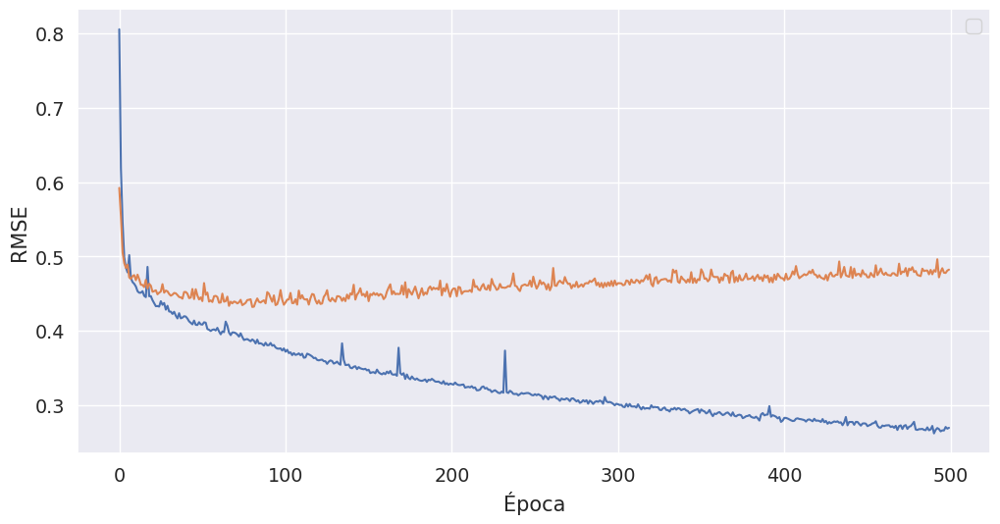

In [58]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss)
plt.plot(val_loss)
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Aca ya directamente a partir de un punto empieza a desaprender las cosas útiles que aprendió.

Como podemos solucionar este problema? Qué métodos vimos para mejorar la generalización del modelo?

Probamos el método de [Dropout](https://keras.io/api/layers/regularization_layers/dropout/) primero con el modelo anterior con muchas neuronas:

In [59]:
model = Sequential()
model.add(Dense(100, activation='relu', input_shape=(8,)))
model.add(Dropout(0.25))
model.add(Dense(50, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [60]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 28s - loss: 0.9164

1216/6000 [=====>........................] - ETA: 0s - loss: 0.7319 

2432/6000 [===========>..................] - ETA: 0s - loss: 0.6784

3648/6000 [=================>............] - ETA: 0s - loss: 0.6182

4864/6000 [=======================>......] - ETA: 0s - loss: 0.5865

6000/6000 [==============================] - 1s 88us/step - loss: 0.5612 - val_loss: 0.3721


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4407

1152/6000 [====>.........................] - ETA: 0s - loss: 0.5227

2464/6000 [===========>..................] - ETA: 0s - loss: 0.5446

3744/6000 [=================>............] - ETA: 0s - loss: 0.4848

5024/6000 [========================>.....] - ETA: 0s - loss: 0.4722

6000/6000 [==============================] - 0s 56us/step - loss: 0.4643 - val_loss: 0.3259


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4145

1312/6000 [=====>........................] - ETA: 0s - loss: 0.4093

2528/6000 [===========>..................] - ETA: 0s - loss: 0.4040

3744/6000 [=================>............] - ETA: 0s - loss: 0.3892

5024/6000 [========================>.....] - ETA: 0s - loss: 0.4111

6000/6000 [==============================] - 0s 57us/step - loss: 0.4073 - val_loss: 0.3056


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1817

1024/6000 [====>.........................] - ETA: 0s - loss: 0.3589

2176/6000 [=========>....................] - ETA: 0s - loss: 0.3704

3232/6000 [===============>..............] - ETA: 0s - loss: 0.3663

4480/6000 [=====================>........] - ETA: 0s - loss: 0.3688

5728/6000 [===========================>..] - ETA: 0s - loss: 0.3635

6000/6000 [==============================] - 0s 61us/step - loss: 0.3662 - val_loss: 0.2795


Epoch 5/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5295

1312/6000 [=====>........................] - ETA: 0s - loss: 0.3721

2432/6000 [===========>..................] - ETA: 0s - loss: 0.3602

3648/6000 [=================>............] - ETA: 0s - loss: 0.3432

4640/6000 [======================>.......] - ETA: 0s - loss: 0.3432

5920/6000 [============================>.] - ETA: 0s - loss: 0.3659

6000/6000 [==============================] - 0s 60us/step - loss: 0.3641 - val_loss: 0.2804


Epoch 6/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1088

1312/6000 [=====>........................] - ETA: 0s - loss: 0.3961

2592/6000 [===========>..................] - ETA: 0s - loss: 0.3530

3840/6000 [==================>...........] - ETA: 0s - loss: 0.3419

5088/6000 [========================>.....] - ETA: 0s - loss: 0.3457

6000/6000 [==============================] - 0s 57us/step - loss: 0.3464 - val_loss: 0.2600


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3138

1216/6000 [=====>........................] - ETA: 0s - loss: 0.3242

2400/6000 [===========>..................] - ETA: 0s - loss: 0.3213

3584/6000 [================>.............] - ETA: 0s - loss: 0.3247

4704/6000 [======================>.......] - ETA: 0s - loss: 0.3067

5920/6000 [============================>.] - ETA: 0s - loss: 0.3197

6000/6000 [==============================] - 0s 60us/step - loss: 0.3197 - val_loss: 0.2558


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4107

1312/6000 [=====>........................] - ETA: 0s - loss: 0.3220

2528/6000 [===========>..................] - ETA: 0s - loss: 0.3198

3744/6000 [=================>............] - ETA: 0s - loss: 0.3496

5024/6000 [========================>.....] - ETA: 0s - loss: 0.3221

6000/6000 [==============================] - 0s 57us/step - loss: 0.3129 - val_loss: 0.2447


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3498

1152/6000 [====>.........................] - ETA: 0s - loss: 0.3196

2432/6000 [===========>..................] - ETA: 0s - loss: 0.3108

3680/6000 [=================>............] - ETA: 0s - loss: 0.2887

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2961

6000/6000 [==============================] - 0s 58us/step - loss: 0.2962 - val_loss: 0.2401


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2763

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2754

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2878

3616/6000 [=================>............] - ETA: 0s - loss: 0.2931

4768/6000 [======================>.......] - ETA: 0s - loss: 0.3156

5600/6000 [===========================>..] - ETA: 0s - loss: 0.3059

6000/6000 [==============================] - 0s 62us/step - loss: 0.3024 - val_loss: 0.2370


Epoch 11/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1726

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2831

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2689

3776/6000 [=================>............] - ETA: 0s - loss: 0.2711

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2867

6000/6000 [==============================] - 0s 58us/step - loss: 0.2837 - val_loss: 0.2339


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2225

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2672

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2512

3680/6000 [=================>............] - ETA: 0s - loss: 0.2617

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2693

6000/6000 [==============================] - 0s 57us/step - loss: 0.2691 - val_loss: 0.2285


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1884

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2426

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2536

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2781

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2697

6000/6000 [==============================] - 0s 58us/step - loss: 0.2715 - val_loss: 0.2297


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3886

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2512

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2662

3552/6000 [================>.............] - ETA: 0s - loss: 0.2696

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2725

6000/6000 [==============================] - 0s 60us/step - loss: 0.2723 - val_loss: 0.2391


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1732

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2821

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2685

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2633

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2621

6000/6000 [==============================] - 0s 56us/step - loss: 0.2623 - val_loss: 0.2235


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1814

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2374

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2409

3616/6000 [=================>............] - ETA: 0s - loss: 0.2558

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2552

6000/6000 [==============================] - 0s 59us/step - loss: 0.2623 - val_loss: 0.2275


Epoch 17/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2327

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2601

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2603

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2606

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2620

6000/6000 [==============================] - 0s 57us/step - loss: 0.2671 - val_loss: 0.2202


Epoch 18/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1967

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2357

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2460

3712/6000 [=================>............] - ETA: 0s - loss: 0.2451

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2434

6000/6000 [==============================] - 0s 59us/step - loss: 0.2450 - val_loss: 0.2273


Epoch 19/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1649

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2289

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2513

3776/6000 [=================>............] - ETA: 0s - loss: 0.2547

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2528

6000/6000 [==============================] - 0s 56us/step - loss: 0.2498 - val_loss: 0.2250


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1519

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2076

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2434

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2470

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2481

6000/6000 [==============================] - 0s 58us/step - loss: 0.2550 - val_loss: 0.2241


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2428

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2269

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2285

3712/6000 [=================>............] - ETA: 0s - loss: 0.2497

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2491

5856/6000 [============================>.] - ETA: 0s - loss: 0.2472

6000/6000 [==============================] - 0s 62us/step - loss: 0.2479 - val_loss: 0.2196


Epoch 22/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2184

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2564

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2590

3552/6000 [================>.............] - ETA: 0s - loss: 0.2595

4608/6000 [======================>.......] - ETA: 0s - loss: 0.2543

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2492

6000/6000 [==============================] - 0s 62us/step - loss: 0.2497 - val_loss: 0.2157


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1722

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2324

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2384

3456/6000 [================>.............] - ETA: 0s - loss: 0.2361

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2437

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2459

6000/6000 [==============================] - 0s 65us/step - loss: 0.2435 - val_loss: 0.2152


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3606

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2245

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2445

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2465

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2440

6000/6000 [==============================] - 0s 57us/step - loss: 0.2430 - val_loss: 0.2214


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2230

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2446

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2368

3712/6000 [=================>............] - ETA: 0s - loss: 0.2346

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2376

6000/6000 [==============================] - 0s 57us/step - loss: 0.2365 - val_loss: 0.2172


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3260

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2249

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2384

3680/6000 [=================>............] - ETA: 0s - loss: 0.2422

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2401

6000/6000 [==============================] - 0s 57us/step - loss: 0.2402 - val_loss: 0.2131


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1886

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2445

2624/6000 [============>.................] - ETA: 0s - loss: 0.2299

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2360

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2364

5984/6000 [============================>.] - ETA: 0s - loss: 0.2396

6000/6000 [==============================] - 0s 59us/step - loss: 0.2392 - val_loss: 0.2149


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1987

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2369

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2317

3744/6000 [=================>............] - ETA: 0s - loss: 0.2315

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2313

6000/6000 [==============================] - 0s 57us/step - loss: 0.2344 - val_loss: 0.2125


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2263

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2476

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2402

3744/6000 [=================>............] - ETA: 0s - loss: 0.2310

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2328

6000/6000 [==============================] - 0s 58us/step - loss: 0.2345 - val_loss: 0.2099


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1635

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2213

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2245

3648/6000 [=================>............] - ETA: 0s - loss: 0.2314

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2359

6000/6000 [==============================] - 0s 59us/step - loss: 0.2359 - val_loss: 0.2094


Epoch 31/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3403

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2273

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2416

3680/6000 [=================>............] - ETA: 0s - loss: 0.2270

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2355

6000/6000 [==============================] - 0s 57us/step - loss: 0.2395 - val_loss: 0.2166


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2626

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2392

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2371

3712/6000 [=================>............] - ETA: 0s - loss: 0.2412

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2374

6000/6000 [==============================] - 0s 58us/step - loss: 0.2302 - val_loss: 0.2059


Epoch 33/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3570

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2123

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2309

3456/6000 [================>.............] - ETA: 0s - loss: 0.2286

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2323

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2332

6000/6000 [==============================] - 0s 62us/step - loss: 0.2349 - val_loss: 0.2150


Epoch 34/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1844

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2089

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2130

3616/6000 [=================>............] - ETA: 0s - loss: 0.2204

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2240

6000/6000 [==============================] - 0s 59us/step - loss: 0.2310 - val_loss: 0.2110


Epoch 35/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2126

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2275

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2329

3744/6000 [=================>............] - ETA: 0s - loss: 0.2296

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2337

6000/6000 [==============================] - 0s 58us/step - loss: 0.2331 - val_loss: 0.2080


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1888

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2499

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2329

3680/6000 [=================>............] - ETA: 0s - loss: 0.2369

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2332

6000/6000 [==============================] - 0s 59us/step - loss: 0.2292 - val_loss: 0.2077


Epoch 37/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0911

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2633

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2459

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2396

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2358

6000/6000 [==============================] - 0s 60us/step - loss: 0.2311 - val_loss: 0.2042


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2800

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2122

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2322

3296/6000 [===============>..............] - ETA: 0s - loss: 0.2371

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2318

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2315

6000/6000 [==============================] - 0s 61us/step - loss: 0.2319 - val_loss: 0.2065


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5428

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2366

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2342

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2239

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2221

6000/6000 [==============================] - 0s 59us/step - loss: 0.2312 - val_loss: 0.2066


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4891

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2521

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2494

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2345

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2281

6000/6000 [==============================] - 0s 57us/step - loss: 0.2320 - val_loss: 0.2034


Epoch 41/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4665

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2420

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2203

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2232

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2285

6000/6000 [==============================] - 0s 57us/step - loss: 0.2311 - val_loss: 0.2047


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2280

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2248

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2422

3552/6000 [================>.............] - ETA: 0s - loss: 0.2398

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2325

5984/6000 [============================>.] - ETA: 0s - loss: 0.2291

6000/6000 [==============================] - 0s 60us/step - loss: 0.2289 - val_loss: 0.2043


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2936

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1963

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2234

3488/6000 [================>.............] - ETA: 0s - loss: 0.2244

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2332



5760/6000 [===========================>..] - ETA: 0s - loss: 0.2306

6000/6000 [==============================] - 0s 62us/step - loss: 0.2292 - val_loss: 0.2059


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2130

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2273

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2184

3648/6000 [=================>............] - ETA: 0s - loss: 0.2199

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2274

6000/6000 [==============================] - 0s 58us/step - loss: 0.2249 - val_loss: 0.2004


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1576

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2383

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2189

3744/6000 [=================>............] - ETA: 0s - loss: 0.2233

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2261

6000/6000 [==============================] - 0s 57us/step - loss: 0.2295 - val_loss: 0.2047


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2261

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2088

2624/6000 [============>.................] - ETA: 0s - loss: 0.2191

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2248

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2255

6000/6000 [==============================] - 0s 58us/step - loss: 0.2244 - val_loss: 0.2031


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3616

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2300

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2307

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2261

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2202

6000/6000 [==============================] - 0s 57us/step - loss: 0.2203 - val_loss: 0.2013


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1399

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2008

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2043

3776/6000 [=================>............] - ETA: 0s - loss: 0.2081

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2150

6000/6000 [==============================] - 0s 57us/step - loss: 0.2186 - val_loss: 0.2132


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3107

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2459

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2490

3584/6000 [================>.............] - ETA: 0s - loss: 0.2376

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2293

5984/6000 [============================>.] - ETA: 0s - loss: 0.2260

6000/6000 [==============================] - 0s 59us/step - loss: 0.2260 - val_loss: 0.2031


Epoch 50/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1033

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2087

2624/6000 [============>.................] - ETA: 0s - loss: 0.2081

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2150

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2226

6000/6000 [==============================] - 0s 58us/step - loss: 0.2194 - val_loss: 0.1996


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2577

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2374

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2364

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2283

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 58us/step - loss: 0.2216 - val_loss: 0.2021


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2630

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1906

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2229

3712/6000 [=================>............] - ETA: 0s - loss: 0.2265

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2258

6000/6000 [==============================] - 0s 59us/step - loss: 0.2262 - val_loss: 0.2015


Epoch 53/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3298

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2137

2240/6000 [==========>...................] - ETA: 0s - loss: 0.2155

3264/6000 [===============>..............] - ETA: 0s - loss: 0.2160

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2210

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2201

6000/6000 [==============================] - 0s 61us/step - loss: 0.2196 - val_loss: 0.2035


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1526

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1991

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2033

3744/6000 [=================>............] - ETA: 0s - loss: 0.2144

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2159

6000/6000 [==============================] - 0s 57us/step - loss: 0.2156 - val_loss: 0.1979


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1630

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1911

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2033

3616/6000 [=================>............] - ETA: 0s - loss: 0.2115

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2119

6000/6000 [==============================] - 0s 58us/step - loss: 0.2147 - val_loss: 0.1989


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1872

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2104

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2106

3712/6000 [=================>............] - ETA: 0s - loss: 0.2138

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2168

6000/6000 [==============================] - 0s 57us/step - loss: 0.2189 - val_loss: 0.2033


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1485

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2127

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2178

3680/6000 [=================>............] - ETA: 0s - loss: 0.2187

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2198

6000/6000 [==============================] - 0s 57us/step - loss: 0.2199 - val_loss: 0.2016


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0962

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2169

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2235

3552/6000 [================>.............] - ETA: 0s - loss: 0.2194

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2137

6000/6000 [==============================] - 0s 58us/step - loss: 0.2173 - val_loss: 0.2029


Epoch 59/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1261

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1958

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2062

3744/6000 [=================>............] - ETA: 0s - loss: 0.2151

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2146

6000/6000 [==============================] - 0s 58us/step - loss: 0.2155 - val_loss: 0.2041


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2384

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2099

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2211

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2213

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2166

6000/6000 [==============================] - 0s 56us/step - loss: 0.2187 - val_loss: 0.2036


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1243

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2013

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2091

3680/6000 [=================>............] - ETA: 0s - loss: 0.2041

4736/6000 [======================>.......] - ETA: 0s - loss: 0.2167

5888/6000 [============================>.] - ETA: 0s - loss: 0.2149

6000/6000 [==============================] - 0s 59us/step - loss: 0.2142 - val_loss: 0.1951


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1161

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2281

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2117

3776/6000 [=================>............] - ETA: 0s - loss: 0.2079

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2162

6000/6000 [==============================] - 0s 57us/step - loss: 0.2115 - val_loss: 0.2042


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1300

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2286

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2183

3712/6000 [=================>............] - ETA: 0s - loss: 0.2169

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2177

6000/6000 [==============================] - 0s 59us/step - loss: 0.2157 - val_loss: 0.1972


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2567

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1980

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2075

3776/6000 [=================>............] - ETA: 0s - loss: 0.2147

4768/6000 [======================>.......] - ETA: 0s - loss: 0.2139

6000/6000 [==============================] - 0s 59us/step - loss: 0.2146 - val_loss: 0.1952


Epoch 65/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1803

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1942

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1974

3616/6000 [=================>............] - ETA: 0s - loss: 0.2009

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2089

6000/6000 [==============================] - 0s 59us/step - loss: 0.2127 - val_loss: 0.1988


Epoch 66/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1422

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2166

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2154

3648/6000 [=================>............] - ETA: 0s - loss: 0.2102

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2142

6000/6000 [==============================] - 0s 59us/step - loss: 0.2104 - val_loss: 0.1996


Epoch 67/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3423

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2376

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2182

3584/6000 [================>.............] - ETA: 0s - loss: 0.2114

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2080

5984/6000 [============================>.] - ETA: 0s - loss: 0.2067

6000/6000 [==============================] - 0s 61us/step - loss: 0.2064 - val_loss: 0.1950


Epoch 68/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1662

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2235

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2223

3712/6000 [=================>............] - ETA: 0s - loss: 0.2258

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2178

6000/6000 [==============================] - 0s 58us/step - loss: 0.2132 - val_loss: 0.1954


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1975

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1846

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2186

3488/6000 [================>.............] - ETA: 0s - loss: 0.2066

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2082

6000/6000 [==============================] - 0s 58us/step - loss: 0.2079 - val_loss: 0.2004


Epoch 70/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1828



1248/6000 [=====>........................] - ETA: 0s - loss: 0.2065

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2045

3776/6000 [=================>............] - ETA: 0s - loss: 0.2077

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2126

6000/6000 [==============================] - 0s 57us/step - loss: 0.2097 - val_loss: 0.1996


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2157

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2090

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2136

3680/6000 [=================>............] - ETA: 0s - loss: 0.2102

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2090

6000/6000 [==============================] - 0s 58us/step - loss: 0.2107 - val_loss: 0.1925


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2563

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2045

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2122

3744/6000 [=================>............] - ETA: 0s - loss: 0.2096

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2143

6000/6000 [==============================] - 0s 57us/step - loss: 0.2113 - val_loss: 0.1924


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1796

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2006

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2024

3744/6000 [=================>............] - ETA: 0s - loss: 0.2052

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2036

6000/6000 [==============================] - 0s 58us/step - loss: 0.2086 - val_loss: 0.1961


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2422

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2210

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2205

3648/6000 [=================>............] - ETA: 0s - loss: 0.2131

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2126

6000/6000 [==============================] - 0s 58us/step - loss: 0.2085 - val_loss: 0.1953


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1048

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2116

2624/6000 [============>.................] - ETA: 0s - loss: 0.2007

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2052

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2042

6000/6000 [==============================] - 0s 59us/step - loss: 0.2090 - val_loss: 0.1939


Epoch 76/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1569

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2184

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2184

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2107

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2123

6000/6000 [==============================] - 0s 58us/step - loss: 0.2085 - val_loss: 0.1940


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2684

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1925

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1954

3648/6000 [=================>............] - ETA: 0s - loss: 0.1979

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2029

6000/6000 [==============================] - 0s 58us/step - loss: 0.2078 - val_loss: 0.1939


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2114

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2111

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2143

3744/6000 [=================>............] - ETA: 0s - loss: 0.2099

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2109

6000/6000 [==============================] - 0s 58us/step - loss: 0.2119 - val_loss: 0.2007


Epoch 79/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1785

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2224

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2089

3488/6000 [================>.............] - ETA: 0s - loss: 0.2042

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2032

5856/6000 [============================>.] - ETA: 0s - loss: 0.2078

6000/6000 [==============================] - 0s 61us/step - loss: 0.2061 - val_loss: 0.1909


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2460

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2028

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2095

3648/6000 [=================>............] - ETA: 0s - loss: 0.2099

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2092

6000/6000 [==============================] - 0s 58us/step - loss: 0.2072 - val_loss: 0.1941


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1764

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2037

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2042

3200/6000 [===============>..............] - ETA: 0s - loss: 0.2125

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2111

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2116

6000/6000 [==============================] - 0s 61us/step - loss: 0.2117 - val_loss: 0.1956


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2820

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2127

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2115

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2117

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2053

6000/6000 [==============================] - 0s 58us/step - loss: 0.2062 - val_loss: 0.1917


Epoch 83/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1516

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1852

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2038

3776/6000 [=================>............] - ETA: 0s - loss: 0.1987

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2053

6000/6000 [==============================] - 0s 60us/step - loss: 0.2087 - val_loss: 0.1929


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2609

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1883

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2069

3520/6000 [================>.............] - ETA: 0s - loss: 0.2121

4736/6000 [======================>.......] - ETA: 0s - loss: 0.2101

5920/6000 [============================>.] - ETA: 0s - loss: 0.2049

6000/6000 [==============================] - 0s 60us/step - loss: 0.2048 - val_loss: 0.1908


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2779

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2162

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2041

3744/6000 [=================>............] - ETA: 0s - loss: 0.2089

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2071

6000/6000 [==============================] - 0s 59us/step - loss: 0.2100 - val_loss: 0.1932


Epoch 86/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1109

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2223

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2136

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2121

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2103

6000/6000 [==============================] - 0s 57us/step - loss: 0.2057 - val_loss: 0.1923


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2224

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1919

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1905

3680/6000 [=================>............] - ETA: 0s - loss: 0.2018

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1984

6000/6000 [==============================] - 0s 58us/step - loss: 0.2001 - val_loss: 0.1935


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3519

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2034

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1894

3680/6000 [=================>............] - ETA: 0s - loss: 0.2003

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2047

6000/6000 [==============================] - 0s 58us/step - loss: 0.2007 - val_loss: 0.1904


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1583

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2149

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1992

3744/6000 [=================>............] - ETA: 0s - loss: 0.1953

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1982

6000/6000 [==============================] - 0s 57us/step - loss: 0.2015 - val_loss: 0.1914


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1412

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2097

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2101

3648/6000 [=================>............] - ETA: 0s - loss: 0.2078

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2041

6000/6000 [==============================] - 0s 57us/step - loss: 0.2047 - val_loss: 0.1888


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2571

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1975

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2077

3616/6000 [=================>............] - ETA: 0s - loss: 0.2085

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2093

6000/6000 [==============================] - 0s 59us/step - loss: 0.2084 - val_loss: 0.1919


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2307

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1952

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1990

3680/6000 [=================>............] - ETA: 0s - loss: 0.2009

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1986

6000/6000 [==============================] - 0s 59us/step - loss: 0.2041 - val_loss: 0.1952


Epoch 93/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2196

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1796

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1899

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2003

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2030

6000/6000 [==============================] - 0s 57us/step - loss: 0.2030 - val_loss: 0.1936


Epoch 94/500
  32/6000 [..............................] - ETA: 1s - loss: 0.4161

 832/6000 [===>..........................] - ETA: 0s - loss: 0.2254

2048/6000 [=========>....................] - ETA: 0s - loss: 0.2066

3296/6000 [===============>..............] - ETA: 0s - loss: 0.2031

4544/6000 [=====================>........] - ETA: 0s - loss: 0.2010

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2009

6000/6000 [==============================] - 0s 63us/step - loss: 0.2000 - val_loss: 0.1875


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1846

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2142

1984/6000 [========>.....................] - ETA: 0s - loss: 0.2092

3264/6000 [===============>..............] - ETA: 0s - loss: 0.2059

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2027

5824/6000 [============================>.] - ETA: 0s - loss: 0.2011

6000/6000 [==============================] - 0s 60us/step - loss: 0.2024 - val_loss: 0.2089


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1945

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2158

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2045

3584/6000 [================>.............] - ETA: 0s - loss: 0.2062

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2010

5984/6000 [============================>.] - ETA: 0s - loss: 0.2040

6000/6000 [==============================] - 0s 59us/step - loss: 0.2040 - val_loss: 0.1912


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3634

1088/6000 [====>.........................] - ETA: 0s - loss: 0.2105

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1980

3264/6000 [===============>..............] - ETA: 0s - loss: 0.2000

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2030

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2064

6000/6000 [==============================] - 0s 63us/step - loss: 0.2031 - val_loss: 0.1932


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1505

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2192

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2099

3584/6000 [================>.............] - ETA: 0s - loss: 0.2113

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2063

6000/6000 [==============================] - 0s 59us/step - loss: 0.2037 - val_loss: 0.1943


Epoch 99/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1104

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1991

2624/6000 [============>.................] - ETA: 0s - loss: 0.1981

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1900

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1935

6000/6000 [==============================] - 0s 57us/step - loss: 0.1978 - val_loss: 0.1892


Epoch 100/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3601

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2046

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2048

3680/6000 [=================>............] - ETA: 0s - loss: 0.2016

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2017

6000/6000 [==============================] - 0s 57us/step - loss: 0.2024 - val_loss: 0.1896


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2110

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2007

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2155

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2071

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2086

6000/6000 [==============================] - 0s 56us/step - loss: 0.2039 - val_loss: 0.1898


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1557

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2018

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2077

3776/6000 [=================>............] - ETA: 0s - loss: 0.2072

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2199

6000/6000 [==============================] - 0s 57us/step - loss: 0.2155 - val_loss: 0.1915


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1958

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1858

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1913

3648/6000 [=================>............] - ETA: 0s - loss: 0.1910

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1973

6000/6000 [==============================] - 0s 59us/step - loss: 0.1972 - val_loss: 0.1940


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2791

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2275

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2064

3648/6000 [=================>............] - ETA: 0s - loss: 0.2013

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2007

6000/6000 [==============================] - 0s 60us/step - loss: 0.2026 - val_loss: 0.1929


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2296

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2155

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2010

3776/6000 [=================>............] - ETA: 0s - loss: 0.1970

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1989

6000/6000 [==============================] - 0s 56us/step - loss: 0.2008 - val_loss: 0.1898


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1563

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1809

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1938

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1965

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1927

6000/6000 [==============================] - 0s 55us/step - loss: 0.1933 - val_loss: 0.1923


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1494

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1987

2688/6000 [============>.................] - ETA: 0s - loss: 0.1985

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2004

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1961

6000/6000 [==============================] - 0s 55us/step - loss: 0.2002 - val_loss: 0.1931


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1736

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1733

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1795

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1861

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1907

6000/6000 [==============================] - 0s 56us/step - loss: 0.1979 - val_loss: 0.1937


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3896

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2100

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2006

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2005

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2040

6000/6000 [==============================] - 0s 56us/step - loss: 0.1998 - val_loss: 0.1906


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2788

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2237

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1958

3552/6000 [================>.............] - ETA: 0s - loss: 0.1964

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1935

6000/6000 [==============================] - 0s 58us/step - loss: 0.1976 - val_loss: 0.1888


Epoch 111/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1661

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1757

2656/6000 [============>.................] - ETA: 0s - loss: 0.1925

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1923

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1917

6000/6000 [==============================] - 0s 55us/step - loss: 0.1955 - val_loss: 0.1925


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1221

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1769

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1846

3648/6000 [=================>............] - ETA: 0s - loss: 0.2006

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1994

6000/6000 [==============================] - 0s 63us/step - loss: 0.2060 - val_loss: 0.1953


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3407

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2016

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2031

3616/6000 [=================>............] - ETA: 0s - loss: 0.2006

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2029

5888/6000 [============================>.] - ETA: 0s - loss: 0.2009

6000/6000 [==============================] - 0s 61us/step - loss: 0.2002 - val_loss: 0.1877


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0859

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1898

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1867

3712/6000 [=================>............] - ETA: 0s - loss: 0.1885

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1968

6000/6000 [==============================] - 0s 57us/step - loss: 0.1984 - val_loss: 0.1883


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2249

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1951

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2034

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2054

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2004

6000/6000 [==============================] - 0s 57us/step - loss: 0.1972 - val_loss: 0.1910


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2052

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2089

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1995

3616/6000 [=================>............] - ETA: 0s - loss: 0.2041

4896/6000 [=======================>......] - ETA: 0s - loss: 0.2029

6000/6000 [==============================] - 0s 59us/step - loss: 0.2017 - val_loss: 0.1914


Epoch 117/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0905



1248/6000 [=====>........................] - ETA: 0s - loss: 0.1834

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1775

3616/6000 [=================>............] - ETA: 0s - loss: 0.1974

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1974

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1972

6000/6000 [==============================] - 0s 63us/step - loss: 0.1994 - val_loss: 0.1932


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3385

1088/6000 [====>.........................] - ETA: 0s - loss: 0.2078

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2023

3520/6000 [================>.............] - ETA: 0s - loss: 0.2040

4736/6000 [======================>.......] - ETA: 0s - loss: 0.2006

5920/6000 [============================>.] - ETA: 0s - loss: 0.2013

6000/6000 [==============================] - 0s 61us/step - loss: 0.2025 - val_loss: 0.1903


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2722

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1908

2240/6000 [==========>...................] - ETA: 0s - loss: 0.2012

3456/6000 [================>.............] - ETA: 0s - loss: 0.1940

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1951

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2007

6000/6000 [==============================] - 0s 61us/step - loss: 0.2037 - val_loss: 0.1935


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1921

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1994

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1883

3712/6000 [=================>............] - ETA: 0s - loss: 0.1865

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1913

6000/6000 [==============================] - 0s 58us/step - loss: 0.1903 - val_loss: 0.1907


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1522

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1931

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1935

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1837

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1903

6000/6000 [==============================] - 0s 57us/step - loss: 0.1926 - val_loss: 0.1924


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1353

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1678

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1909

3456/6000 [================>.............] - ETA: 0s - loss: 0.1907

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1916

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1984

6000/6000 [==============================] - 0s 61us/step - loss: 0.1983 - val_loss: 0.1907


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1382

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2008

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1907

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1974

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1992

6000/6000 [==============================] - 0s 56us/step - loss: 0.1982 - val_loss: 0.1905


Epoch 124/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0657

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1875

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1912

3680/6000 [=================>............] - ETA: 0s - loss: 0.1978

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1961

6000/6000 [==============================] - 0s 57us/step - loss: 0.1961 - val_loss: 0.1850


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1449

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2001

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1999

3648/6000 [=================>............] - ETA: 0s - loss: 0.1983

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1991

6000/6000 [==============================] - 0s 56us/step - loss: 0.1971 - val_loss: 0.1885


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2551

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1879

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1806

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1902

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1945

6000/6000 [==============================] - 0s 57us/step - loss: 0.1936 - val_loss: 0.1913


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2179

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1807

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1897

3584/6000 [================>.............] - ETA: 0s - loss: 0.1940

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1959

6000/6000 [==============================] - 0s 59us/step - loss: 0.1962 - val_loss: 0.1856


Epoch 128/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0775

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1960

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1919

3712/6000 [=================>............] - ETA: 0s - loss: 0.1856

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1860

6000/6000 [==============================] - 0s 58us/step - loss: 0.1932 - val_loss: 0.1885


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1358

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1864

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1918

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1950

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1942

6000/6000 [==============================] - 0s 59us/step - loss: 0.1951 - val_loss: 0.1888


Epoch 130/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1738

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1804

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1703

3648/6000 [=================>............] - ETA: 0s - loss: 0.1880

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1967

6000/6000 [==============================] - 0s 58us/step - loss: 0.1945 - val_loss: 0.1866


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3100

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2152

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2051

3776/6000 [=================>............] - ETA: 0s - loss: 0.1937

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1972

6000/6000 [==============================] - 0s 57us/step - loss: 0.1923 - val_loss: 0.1892


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1884

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1815

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1889

3712/6000 [=================>............] - ETA: 0s - loss: 0.1907

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1905

6000/6000 [==============================] - 0s 58us/step - loss: 0.1956 - val_loss: 0.1909


Epoch 133/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2123

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2181

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2080

3680/6000 [=================>............] - ETA: 0s - loss: 0.2078

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2016

6000/6000 [==============================] - 0s 58us/step - loss: 0.1959 - val_loss: 0.1925


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1685

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2081

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1865

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1861

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1942

6000/6000 [==============================] - 0s 56us/step - loss: 0.1941 - val_loss: 0.1910


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1084

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1757

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1880

3744/6000 [=================>............] - ETA: 0s - loss: 0.1868

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1968

6000/6000 [==============================] - 0s 58us/step - loss: 0.1951 - val_loss: 0.1914


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1724

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1764

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1855

3680/6000 [=================>............] - ETA: 0s - loss: 0.1914

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1924

6000/6000 [==============================] - 0s 61us/step - loss: 0.1926 - val_loss: 0.1897


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2566

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1990

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1878

3616/6000 [=================>............] - ETA: 0s - loss: 0.1940

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1983

6000/6000 [==============================] - 0s 58us/step - loss: 0.1954 - val_loss: 0.1846


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1086



1312/6000 [=====>........................] - ETA: 0s - loss: 0.1695

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1971

3744/6000 [=================>............] - ETA: 0s - loss: 0.1950

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1980

6000/6000 [==============================] - 0s 58us/step - loss: 0.1947 - val_loss: 0.1873


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0782

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1939

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1938

3712/6000 [=================>............] - ETA: 0s - loss: 0.1906

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1879

6000/6000 [==============================] - 0s 58us/step - loss: 0.1916 - val_loss: 0.1865


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1142

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1850

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1835

3680/6000 [=================>............] - ETA: 0s - loss: 0.1904

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1932

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1957

6000/6000 [==============================] - 0s 66us/step - loss: 0.1942 - val_loss: 0.1867


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1574

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1884

2656/6000 [============>.................] - ETA: 0s - loss: 0.1805

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1873

5312/6000 [=========================>....] - ETA: 0s - loss: 0.1938

6000/6000 [==============================] - 0s 59us/step - loss: 0.1978 - val_loss: 0.1893


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2609

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1935

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2028

3648/6000 [=================>............] - ETA: 0s - loss: 0.1978

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1919

6000/6000 [==============================] - 0s 60us/step - loss: 0.1910 - val_loss: 0.1859


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2726

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2011

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1922

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1911

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1935

6000/6000 [==============================] - 0s 57us/step - loss: 0.1972 - val_loss: 0.1859


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1707

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1905

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1901

3776/6000 [=================>............] - ETA: 0s - loss: 0.1980

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1966

6000/6000 [==============================] - 0s 57us/step - loss: 0.1973 - val_loss: 0.1843


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1470

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1654

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1841

3616/6000 [=================>............] - ETA: 0s - loss: 0.1888

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1875

6000/6000 [==============================] - 0s 60us/step - loss: 0.1924 - val_loss: 0.1872


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1398

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2010

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1904

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1970

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1921

6000/6000 [==============================] - 0s 58us/step - loss: 0.1940 - val_loss: 0.1897


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1706

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1776

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1913

3744/6000 [=================>............] - ETA: 0s - loss: 0.1899

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1925

6000/6000 [==============================] - 0s 58us/step - loss: 0.1904 - val_loss: 0.1893


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1260

1024/6000 [====>.........................] - ETA: 0s - loss: 0.1834

2080/6000 [=========>....................] - ETA: 0s - loss: 0.1897

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1925

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1896

5824/6000 [============================>.] - ETA: 0s - loss: 0.1919

6000/6000 [==============================] - 0s 61us/step - loss: 0.1928 - val_loss: 0.1871


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1508

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1776

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1827

3744/6000 [=================>............] - ETA: 0s - loss: 0.1906

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1919

6000/6000 [==============================] - 0s 59us/step - loss: 0.1935 - val_loss: 0.1862


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1025

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1773

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1867

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1932

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1915

6000/6000 [==============================] - 0s 59us/step - loss: 0.1887 - val_loss: 0.1861


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1490

1216/6000 [=====>........................] - ETA: 0s - loss: 0.3047

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2399

3552/6000 [================>.............] - ETA: 0s - loss: 0.2204

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2159

6000/6000 [==============================] - 0s 61us/step - loss: 0.2142 - val_loss: 0.1838


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1659

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1941

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1975

3456/6000 [================>.............] - ETA: 0s - loss: 0.1951

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1940

5952/6000 [============================>.] - ETA: 0s - loss: 0.1929

6000/6000 [==============================] - 0s 60us/step - loss: 0.1932 - val_loss: 0.1852


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1836

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1887

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1903

3616/6000 [=================>............] - ETA: 0s - loss: 0.1919

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1928

6000/6000 [==============================] - 0s 58us/step - loss: 0.1902 - val_loss: 0.1852


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1984

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1916

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1904

3776/6000 [=================>............] - ETA: 0s - loss: 0.1890

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1886

6000/6000 [==============================] - 0s 59us/step - loss: 0.1897 - val_loss: 0.1903


Epoch 155/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1922

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1731

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1863

3552/6000 [================>.............] - ETA: 0s - loss: 0.1881

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1920

6000/6000 [==============================] - 0s 59us/step - loss: 0.1904 - val_loss: 0.1867


Epoch 156/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2139



1248/6000 [=====>........................] - ETA: 0s - loss: 0.1929

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1957

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1941

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1985

6000/6000 [==============================] - 0s 63us/step - loss: 0.1934 - val_loss: 0.1845


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1623

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1917

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2008

3680/6000 [=================>............] - ETA: 0s - loss: 0.2024

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1956

6000/6000 [==============================] - 0s 59us/step - loss: 0.1930 - val_loss: 0.1876


Epoch 158/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1410

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2075

2656/6000 [============>.................] - ETA: 0s - loss: 0.2060

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1982

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1964

6000/6000 [==============================] - 0s 58us/step - loss: 0.1941 - val_loss: 0.1867


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1177

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1847

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1907

3584/6000 [================>.............] - ETA: 0s - loss: 0.1894

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1889

5920/6000 [============================>.] - ETA: 0s - loss: 0.1917

6000/6000 [==============================] - 0s 60us/step - loss: 0.1912 - val_loss: 0.1959


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1720

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2145

2624/6000 [============>.................] - ETA: 0s - loss: 0.2051

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2011

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1944

6000/6000 [==============================] - 0s 56us/step - loss: 0.1920 - val_loss: 0.1824


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2311

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1688

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1752

3712/6000 [=================>............] - ETA: 0s - loss: 0.1870

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1896

6000/6000 [==============================] - 0s 60us/step - loss: 0.1867 - val_loss: 0.1823


Epoch 162/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1267

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1817

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1763

3648/6000 [=================>............] - ETA: 0s - loss: 0.1804

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1864

6000/6000 [==============================] - 0s 60us/step - loss: 0.1890 - val_loss: 0.1864


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2250

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1979

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1951

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1936

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1895

6000/6000 [==============================] - 0s 56us/step - loss: 0.1874 - val_loss: 0.1848


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2485

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1757

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1825

3776/6000 [=================>............] - ETA: 0s - loss: 0.1891

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1876

6000/6000 [==============================] - 0s 57us/step - loss: 0.1872 - val_loss: 0.1875


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1877

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1916

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1814

3776/6000 [=================>............] - ETA: 0s - loss: 0.1858

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1864

6000/6000 [==============================] - 0s 58us/step - loss: 0.1879 - val_loss: 0.1866


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1963

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1903

2624/6000 [============>.................] - ETA: 0s - loss: 0.1857

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1875

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1871

6000/6000 [==============================] - 0s 57us/step - loss: 0.1866 - val_loss: 0.1845


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2428

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1670

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1791

3744/6000 [=================>............] - ETA: 0s - loss: 0.1900

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1877

6000/6000 [==============================] - 0s 59us/step - loss: 0.1910 - val_loss: 0.1848


Epoch 168/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1551

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1988

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1874

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1868

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1914

6000/6000 [==============================] - 0s 57us/step - loss: 0.1904 - val_loss: 0.1825


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1934

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1887

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1887

3648/6000 [=================>............] - ETA: 0s - loss: 0.1870

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1865

5888/6000 [============================>.] - ETA: 0s - loss: 0.1863

6000/6000 [==============================] - 0s 62us/step - loss: 0.1864 - val_loss: 0.1855


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1462

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1737

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1843

3712/6000 [=================>............] - ETA: 0s - loss: 0.1854

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1869

6000/6000 [==============================] - 0s 59us/step - loss: 0.1853 - val_loss: 0.1875


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2106

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1684

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1833

3616/6000 [=================>............] - ETA: 0s - loss: 0.1922

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1869

6000/6000 [==============================] - 0s 59us/step - loss: 0.1882 - val_loss: 0.1859


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1114

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1879

2656/6000 [============>.................] - ETA: 0s - loss: 0.1940

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1910

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1875

6000/6000 [==============================] - 0s 56us/step - loss: 0.1908 - val_loss: 0.1889


Epoch 173/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0469

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1825

2624/6000 [============>.................] - ETA: 0s - loss: 0.1868

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1871

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1812

6000/6000 [==============================] - 0s 56us/step - loss: 0.1862 - val_loss: 0.1825


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1425

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1932

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1916

3776/6000 [=================>............] - ETA: 0s - loss: 0.1914

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1928

6000/6000 [==============================] - 0s 58us/step - loss: 0.1926 - val_loss: 0.1876


Epoch 175/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1582

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1913

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1901

3648/6000 [=================>............] - ETA: 0s - loss: 0.1917

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1930

5824/6000 [============================>.] - ETA: 0s - loss: 0.1888

6000/6000 [==============================] - 0s 62us/step - loss: 0.1896 - val_loss: 0.1848


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1652

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1872

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1903

3520/6000 [================>.............] - ETA: 0s - loss: 0.1882

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1918

5888/6000 [============================>.] - ETA: 0s - loss: 0.1869

6000/6000 [==============================] - 0s 62us/step - loss: 0.1866 - val_loss: 0.1865


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1569

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1932

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1886

3680/6000 [=================>............] - ETA: 0s - loss: 0.1875

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1888

6000/6000 [==============================] - 0s 60us/step - loss: 0.1894 - val_loss: 0.1833


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3889

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2114

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1937

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1884

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1909

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1890

6000/6000 [==============================] - 0s 63us/step - loss: 0.1879 - val_loss: 0.1854


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1775

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1724

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1871

3616/6000 [=================>............] - ETA: 0s - loss: 0.1936

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1883

5952/6000 [============================>.] - ETA: 0s - loss: 0.1890

6000/6000 [==============================] - 0s 60us/step - loss: 0.1888 - val_loss: 0.1874


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1578

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1931

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1805

3680/6000 [=================>............] - ETA: 0s - loss: 0.1846

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1873

6000/6000 [==============================] - 0s 59us/step - loss: 0.1867 - val_loss: 0.1897


Epoch 181/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1341

1024/6000 [====>.........................] - ETA: 0s - loss: 0.1921

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1913

3584/6000 [================>.............] - ETA: 0s - loss: 0.1932

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1910

6000/6000 [==============================] - 0s 60us/step - loss: 0.1898 - val_loss: 0.1854


Epoch 182/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0665

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1768

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1761

3520/6000 [================>.............] - ETA: 0s - loss: 0.1809

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1808

5856/6000 [============================>.] - ETA: 0s - loss: 0.1851

6000/6000 [==============================] - 0s 61us/step - loss: 0.1851 - val_loss: 0.1844


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1154

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1887

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1839

3648/6000 [=================>............] - ETA: 0s - loss: 0.1850

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1833

6000/6000 [==============================] - 0s 58us/step - loss: 0.1835 - val_loss: 0.1856


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1029

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1994

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1933

3712/6000 [=================>............] - ETA: 0s - loss: 0.1912

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1878

5920/6000 [============================>.] - ETA: 0s - loss: 0.1885

6000/6000 [==============================] - 0s 61us/step - loss: 0.1880 - val_loss: 0.1864


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1305

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2094

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2018

3552/6000 [================>.............] - ETA: 0s - loss: 0.1954

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1889

6000/6000 [==============================] - 0s 62us/step - loss: 0.1855 - val_loss: 0.1872


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1372

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1661

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1761

3616/6000 [=================>............] - ETA: 0s - loss: 0.1834

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1822

6000/6000 [==============================] - 0s 60us/step - loss: 0.1843 - val_loss: 0.1893


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1313

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1866

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1830

3584/6000 [================>.............] - ETA: 0s - loss: 0.1851

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1868

6000/6000 [==============================] - 0s 58us/step - loss: 0.1860 - val_loss: 0.1864


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1168

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2002

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1872

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1892

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1884

6000/6000 [==============================] - 0s 58us/step - loss: 0.1882 - val_loss: 0.1861


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3127

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1815

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1867

3520/6000 [================>.............] - ETA: 0s - loss: 0.1865

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1899



6000/6000 [==============================] - 0s 59us/step - loss: 0.1879 - val_loss: 0.1934


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1001

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1800

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1870

3712/6000 [=================>............] - ETA: 0s - loss: 0.1905

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1935

6000/6000 [==============================] - 0s 60us/step - loss: 0.1928 - val_loss: 0.1863


Epoch 191/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2160

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1965

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1942

3488/6000 [================>.............] - ETA: 0s - loss: 0.1955

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1870

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1851

6000/6000 [==============================] - 0s 62us/step - loss: 0.1852 - val_loss: 0.1881


Epoch 192/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3203

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1671

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1849

3616/6000 [=================>............] - ETA: 0s - loss: 0.1859

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1871

6000/6000 [==============================] - 0s 59us/step - loss: 0.1861 - val_loss: 0.1870


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1662

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1985

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1800

3520/6000 [================>.............] - ETA: 0s - loss: 0.1808

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1880

5856/6000 [============================>.] - ETA: 0s - loss: 0.1858

6000/6000 [==============================] - 0s 63us/step - loss: 0.1858 - val_loss: 0.1899


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1920

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1914

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1817

3776/6000 [=================>............] - ETA: 0s - loss: 0.1779

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1848

6000/6000 [==============================] - 0s 60us/step - loss: 0.1836 - val_loss: 0.1868


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1674

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1645

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1758

3712/6000 [=================>............] - ETA: 0s - loss: 0.1823

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1842

6000/6000 [==============================] - 0s 59us/step - loss: 0.1863 - val_loss: 0.1942


Epoch 196/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1523

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1848

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1818

3744/6000 [=================>............] - ETA: 0s - loss: 0.1874

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1856

6000/6000 [==============================] - 0s 57us/step - loss: 0.1860 - val_loss: 0.1918


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0990

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1912

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1923

3712/6000 [=================>............] - ETA: 0s - loss: 0.1866

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1873

6000/6000 [==============================] - 0s 61us/step - loss: 0.1881 - val_loss: 0.1904


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1442

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1904

2624/6000 [============>.................] - ETA: 0s - loss: 0.1803

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1806

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1835

6000/6000 [==============================] - 0s 57us/step - loss: 0.1873 - val_loss: 0.1931


Epoch 199/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1425

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1942

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1847

3712/6000 [=================>............] - ETA: 0s - loss: 0.1817

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1863

6000/6000 [==============================] - 0s 61us/step - loss: 0.1879 - val_loss: 0.1870


Epoch 200/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2853

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1861

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1793

3520/6000 [================>.............] - ETA: 0s - loss: 0.1826

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1798

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1831

6000/6000 [==============================] - 0s 62us/step - loss: 0.1840 - val_loss: 0.1899


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2728

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2017

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2082

3648/6000 [=================>............] - ETA: 0s - loss: 0.1972

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1912

6000/6000 [==============================] - 0s 60us/step - loss: 0.1869 - val_loss: 0.1838


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1558

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1936

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1897

3776/6000 [=================>............] - ETA: 0s - loss: 0.1915

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1840

6000/6000 [==============================] - 0s 57us/step - loss: 0.1828 - val_loss: 0.1870


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0784

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1998

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1890

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1820

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1807

6000/6000 [==============================] - 0s 59us/step - loss: 0.1842 - val_loss: 0.1873


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1197

1024/6000 [====>.........................] - ETA: 0s - loss: 0.1916

1984/6000 [========>.....................] - ETA: 0s - loss: 0.1948

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1883

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1829

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1842

6000/6000 [==============================] - 0s 62us/step - loss: 0.1827 - val_loss: 0.1860


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1647

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1740

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1740

3488/6000 [================>.............] - ETA: 0s - loss: 0.1709

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1808

5856/6000 [============================>.] - ETA: 0s - loss: 0.1823

6000/6000 [==============================] - 0s 62us/step - loss: 0.1827 - val_loss: 0.1849


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0796

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1730

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1740

3712/6000 [=================>............] - ETA: 0s - loss: 0.1882

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1822

6000/6000 [==============================] - 0s 58us/step - loss: 0.1846 - val_loss: 0.1862


Epoch 207/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0720

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1809

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1875

3744/6000 [=================>............] - ETA: 0s - loss: 0.1865

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1865

6000/6000 [==============================] - 0s 57us/step - loss: 0.1860 - val_loss: 0.1920


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1187

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1794

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1768

3488/6000 [================>.............] - ETA: 0s - loss: 0.1795

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1799

5856/6000 [============================>.] - ETA: 0s - loss: 0.1821

6000/6000 [==============================] - 0s 63us/step - loss: 0.1821 - val_loss: 0.1876


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1469

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1602

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1739

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1748

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1797

6000/6000 [==============================] - 0s 56us/step - loss: 0.1793 - val_loss: 0.1874


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2125

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1773

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1865

3520/6000 [================>.............] - ETA: 0s - loss: 0.1848

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1865

5920/6000 [============================>.] - ETA: 0s - loss: 0.1865

6000/6000 [==============================] - 0s 61us/step - loss: 0.1880 - val_loss: 0.1875


Epoch 211/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1185

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1926

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1849

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1879

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1904

6000/6000 [==============================] - 0s 57us/step - loss: 0.1905 - val_loss: 0.1891


Epoch 212/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2387

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1664

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1905

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1898

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1860

6000/6000 [==============================] - 0s 57us/step - loss: 0.1842 - val_loss: 0.1869


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1899

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1929

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1861

3744/6000 [=================>............] - ETA: 0s - loss: 0.1863

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1789

6000/6000 [==============================] - 0s 62us/step - loss: 0.1798 - val_loss: 0.1908


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0951

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1671

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1864

3584/6000 [================>.............] - ETA: 0s - loss: 0.1807

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1871

5856/6000 [============================>.] - ETA: 0s - loss: 0.1834

6000/6000 [==============================] - 0s 65us/step - loss: 0.1829 - val_loss: 0.1869


Epoch 215/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2566

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1745

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1658

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1775

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 59us/step - loss: 0.1805 - val_loss: 0.1846


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1698

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1790

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1863

3744/6000 [=================>............] - ETA: 0s - loss: 0.1856

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1828

6000/6000 [==============================] - 0s 58us/step - loss: 0.1853 - val_loss: 0.1986


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1960

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1721

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1833

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1834

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1840

6000/6000 [==============================] - 0s 59us/step - loss: 0.1813 - val_loss: 0.1900


Epoch 218/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2137

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1730

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1874

3648/6000 [=================>............] - ETA: 0s - loss: 0.1829



4960/6000 [=======================>......] - ETA: 0s - loss: 0.1856

6000/6000 [==============================] - 0s 59us/step - loss: 0.1849 - val_loss: 0.1860


Epoch 219/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1068

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1734

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1787

3712/6000 [=================>............] - ETA: 0s - loss: 0.1778

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1794

6000/6000 [==============================] - 0s 58us/step - loss: 0.2205 - val_loss: 0.1920


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2339

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1769

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1789

3648/6000 [=================>............] - ETA: 0s - loss: 0.1766

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1811

6000/6000 [==============================] - 0s 58us/step - loss: 0.1830 - val_loss: 0.1880


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0883

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1842

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1787

3648/6000 [=================>............] - ETA: 0s - loss: 0.1819

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1828

6000/6000 [==============================] - 0s 60us/step - loss: 0.1841 - val_loss: 0.1866


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1003

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1819

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1915

3648/6000 [=================>............] - ETA: 0s - loss: 0.1914

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1956

6000/6000 [==============================] - 0s 58us/step - loss: 0.1918 - val_loss: 0.1895


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0627

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1950

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2006

3712/6000 [=================>............] - ETA: 0s - loss: 0.1875

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1868

6000/6000 [==============================] - 0s 59us/step - loss: 0.1832 - val_loss: 0.1873


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2090

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1788

2656/6000 [============>.................] - ETA: 0s - loss: 0.1895

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1851

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1815

6000/6000 [==============================] - 0s 56us/step - loss: 0.1830 - val_loss: 0.1866


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2066

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1775

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1825

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1810

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1856

6000/6000 [==============================] - 0s 56us/step - loss: 0.1832 - val_loss: 0.1865


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1377

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1859

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1783

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1734

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1825

6000/6000 [==============================] - 0s 56us/step - loss: 0.1828 - val_loss: 0.1850


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1329

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1857

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1773

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1822

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1863

6000/6000 [==============================] - 0s 57us/step - loss: 0.1838 - val_loss: 0.1859


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0821

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1588

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1855

3776/6000 [=================>............] - ETA: 0s - loss: 0.1915

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1851

6000/6000 [==============================] - 0s 58us/step - loss: 0.1845 - val_loss: 0.1923


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1793

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1952

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1901

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1862

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1858

6000/6000 [==============================] - 0s 61us/step - loss: 0.1828 - val_loss: 0.1894


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2662

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1738

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1730

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1805

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1827

6000/6000 [==============================] - 0s 58us/step - loss: 0.1850 - val_loss: 0.1882


Epoch 231/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1643

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1685

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1745

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1765

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1773

6000/6000 [==============================] - 0s 57us/step - loss: 0.1825 - val_loss: 0.1866


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1404

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1760

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1749

3776/6000 [=================>............] - ETA: 0s - loss: 0.1818

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1830

6000/6000 [==============================] - 0s 57us/step - loss: 0.1821 - val_loss: 0.1900


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1232

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1740

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1708

3744/6000 [=================>............] - ETA: 0s - loss: 0.1696

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1778

6000/6000 [==============================] - 0s 58us/step - loss: 0.1751 - val_loss: 0.1862


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1397

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1887

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1866

3552/6000 [================>.............] - ETA: 0s - loss: 0.1890

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1855

5952/6000 [============================>.] - ETA: 0s - loss: 0.1828

6000/6000 [==============================] - 0s 59us/step - loss: 0.1827 - val_loss: 0.1841


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2388

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1893

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1803

3488/6000 [================>.............] - ETA: 0s - loss: 0.1849

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1816

6000/6000 [==============================] - 0s 60us/step - loss: 0.1845 - val_loss: 0.1827


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1277

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1960

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1881

3776/6000 [=================>............] - ETA: 0s - loss: 0.1850

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1816

6000/6000 [==============================] - 0s 59us/step - loss: 0.1799 - val_loss: 0.1900


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1558

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1683

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1771

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1831

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1791

6000/6000 [==============================] - 0s 56us/step - loss: 0.1793 - val_loss: 0.1889


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1944

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1796

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1775

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1828

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1807

6000/6000 [==============================] - 0s 58us/step - loss: 0.1810 - val_loss: 0.1874


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3412

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1685

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1764

3648/6000 [=================>............] - ETA: 0s - loss: 0.1796

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1821

6000/6000 [==============================] - 0s 58us/step - loss: 0.1789 - val_loss: 0.1887


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1666

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1866

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1821

3712/6000 [=================>............] - ETA: 0s - loss: 0.1781

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1770

6000/6000 [==============================] - 0s 59us/step - loss: 0.1797 - val_loss: 0.1895


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1665

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1802

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1814

3776/6000 [=================>............] - ETA: 0s - loss: 0.1800

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1823

6000/6000 [==============================] - 0s 57us/step - loss: 0.1830 - val_loss: 0.1849


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3949

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1911

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1833

3776/6000 [=================>............] - ETA: 0s - loss: 0.1780

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1767

6000/6000 [==============================] - 0s 59us/step - loss: 0.1811 - val_loss: 0.1912


Epoch 243/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1909

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1755

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1800

3776/6000 [=================>............] - ETA: 0s - loss: 0.1791

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1834

6000/6000 [==============================] - 0s 58us/step - loss: 0.1834 - val_loss: 0.1899


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1805

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1638

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1715

3488/6000 [================>.............] - ETA: 0s - loss: 0.1788

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1740

5984/6000 [============================>.] - ETA: 0s - loss: 0.1798

6000/6000 [==============================] - 0s 59us/step - loss: 0.1801 - val_loss: 0.1883


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1831

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1560

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1722

3712/6000 [=================>............] - ETA: 0s - loss: 0.1747

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1796

6000/6000 [==============================] - 0s 59us/step - loss: 0.1782 - val_loss: 0.1879


Epoch 246/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0700

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1791

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1806

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1843

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1841

6000/6000 [==============================] - 0s 60us/step - loss: 0.1816 - val_loss: 0.1851


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0812

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1792

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1722

3680/6000 [=================>............] - ETA: 0s - loss: 0.1750

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1794

6000/6000 [==============================] - 0s 58us/step - loss: 0.1823 - val_loss: 0.1893


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1312

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1875

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1744

3712/6000 [=================>............] - ETA: 0s - loss: 0.1813

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1795

6000/6000 [==============================] - 0s 61us/step - loss: 0.1788 - val_loss: 0.1926


Epoch 249/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1207

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1759

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1731

3776/6000 [=================>............] - ETA: 0s - loss: 0.1717

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1835

6000/6000 [==============================] - 0s 59us/step - loss: 0.1820 - val_loss: 0.1883


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1348

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1605

2688/6000 [============>.................] - ETA: 0s - loss: 0.1652

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1743

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1799

6000/6000 [==============================] - 0s 57us/step - loss: 0.1810 - val_loss: 0.1888


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2030

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1754

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1841

3712/6000 [=================>............] - ETA: 0s - loss: 0.1837

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1809

6000/6000 [==============================] - 0s 60us/step - loss: 0.1789 - val_loss: 0.1854


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0906

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1922

2144/6000 [=========>....................] - ETA: 0s - loss: 0.1877

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1856

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1796

5856/6000 [============================>.] - ETA: 0s - loss: 0.1821

6000/6000 [==============================] - 0s 61us/step - loss: 0.1819 - val_loss: 0.1922


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2647

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1777

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1794

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1765

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 57us/step - loss: 0.1807 - val_loss: 0.1884


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1595

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1779

2624/6000 [============>.................] - ETA: 0s - loss: 0.1737

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1750

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1782

6000/6000 [==============================] - 0s 56us/step - loss: 0.1803 - val_loss: 0.1914


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2364

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1820

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1747

3584/6000 [================>.............] - ETA: 0s - loss: 0.1748

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1772

5856/6000 [============================>.] - ETA: 0s - loss: 0.1772

6000/6000 [==============================] - 0s 61us/step - loss: 0.1785 - val_loss: 0.1873


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1647

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1663

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1706

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1721

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1773

6000/6000 [==============================] - 0s 57us/step - loss: 0.1795 - val_loss: 0.1838


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3869

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1783

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1739

3744/6000 [=================>............] - ETA: 0s - loss: 0.1752

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 58us/step - loss: 0.1779 - val_loss: 0.1874


Epoch 258/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0963

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1744

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1753

3744/6000 [=================>............] - ETA: 0s - loss: 0.1824

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1758

6000/6000 [==============================] - 0s 58us/step - loss: 0.1768 - val_loss: 0.1869


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1537

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1791

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1750

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1726

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1748

5824/6000 [============================>.] - ETA: 0s - loss: 0.1784

6000/6000 [==============================] - 0s 62us/step - loss: 0.1785 - val_loss: 0.1887


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0922

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1636

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1619

3456/6000 [================>.............] - ETA: 0s - loss: 0.1682

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1735

6000/6000 [==============================] - 0s 59us/step - loss: 0.1760 - val_loss: 0.1886


Epoch 261/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1171

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1816

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1850

3584/6000 [================>.............] - ETA: 0s - loss: 0.1808

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1794

5888/6000 [============================>.] - ETA: 0s - loss: 0.1773

6000/6000 [==============================] - 0s 60us/step - loss: 0.1798 - val_loss: 0.1883


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1425

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1648

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1693

3648/6000 [=================>............] - ETA: 0s - loss: 0.1693

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1724

6000/6000 [==============================] - 0s 60us/step - loss: 0.1772 - val_loss: 0.1873


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2797

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1787

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1822

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1854

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1853

6000/6000 [==============================] - 0s 56us/step - loss: 0.1834 - val_loss: 0.1877


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4922

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1968

2688/6000 [============>.................] - ETA: 0s - loss: 0.1849

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1860

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1854

6000/6000 [==============================] - 0s 56us/step - loss: 0.1817 - val_loss: 0.1881


Epoch 265/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1405

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1795

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1758

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1786

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1843

6000/6000 [==============================] - 0s 57us/step - loss: 0.1823 - val_loss: 0.1880


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1543

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1926

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1864

3264/6000 [===============>..............] - ETA: 0s - loss: 0.1751

4320/6000 [====================>.........] - ETA: 0s - loss: 0.1774

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1788

6000/6000 [==============================] - 0s 63us/step - loss: 0.1809 - val_loss: 0.1854


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1552

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1746

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1800

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1791

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1787

6000/6000 [==============================] - 0s 58us/step - loss: 0.1785 - val_loss: 0.1848


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1002

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1633

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1755

3744/6000 [=================>............] - ETA: 0s - loss: 0.1789

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1746

6000/6000 [==============================] - 0s 58us/step - loss: 0.1747 - val_loss: 0.1863


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2658

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1793

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1786

3584/6000 [================>.............] - ETA: 0s - loss: 0.1835

4512/6000 [=====================>........] - ETA: 0s - loss: 0.1833

5408/6000 [==========================>...] - ETA: 0s - loss: 0.1848

6000/6000 [==============================] - 0s 63us/step - loss: 0.1822 - val_loss: 0.1886


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1279

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1747

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1746

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1744

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1774

6000/6000 [==============================] - 0s 57us/step - loss: 0.1773 - val_loss: 0.1916


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1130

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1866

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1814

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1806

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1800

6000/6000 [==============================] - 0s 56us/step - loss: 0.1816 - val_loss: 0.1873


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2298

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1669

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1818

3744/6000 [=================>............] - ETA: 0s - loss: 0.1855

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1777

6000/6000 [==============================] - 0s 58us/step - loss: 0.1763 - val_loss: 0.1859


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1999

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1783

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1757

3456/6000 [================>.............] - ETA: 0s - loss: 0.1799

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1822

5952/6000 [============================>.] - ETA: 0s - loss: 0.1784

6000/6000 [==============================] - 0s 64us/step - loss: 0.1782 - val_loss: 0.1887


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3812

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1872

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1788

3648/6000 [=================>............] - ETA: 0s - loss: 0.1761

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1799

5824/6000 [============================>.] - ETA: 0s - loss: 0.1809

6000/6000 [==============================] - 0s 63us/step - loss: 0.1809 - val_loss: 0.1858


Epoch 275/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1204

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1524

2624/6000 [============>.................] - ETA: 0s - loss: 0.1672

3552/6000 [================>.............] - ETA: 0s - loss: 0.1669

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1693

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1731

6000/6000 [==============================] - 0s 62us/step - loss: 0.1735 - val_loss: 0.1881


Epoch 276/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1948

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1742

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1699

3680/6000 [=================>............] - ETA: 0s - loss: 0.1749

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1787

6000/6000 [==============================] - 0s 60us/step - loss: 0.1756 - val_loss: 0.1877


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2442

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1556

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1715

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1802

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1790

6000/6000 [==============================] - 0s 56us/step - loss: 0.1787 - val_loss: 0.1863


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1104

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1905

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1813

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1829

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1815

6000/6000 [==============================] - 0s 59us/step - loss: 0.1807 - val_loss: 0.1866


Epoch 279/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0966

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1704

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1755

3456/6000 [================>.............] - ETA: 0s - loss: 0.1748

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1756

5888/6000 [============================>.] - ETA: 0s - loss: 0.1785

6000/6000 [==============================] - 0s 61us/step - loss: 0.1784 - val_loss: 0.1879


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1535

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1705

2656/6000 [============>.................] - ETA: 0s - loss: 0.1757

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1738

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1746

6000/6000 [==============================] - 0s 55us/step - loss: 0.1753 - val_loss: 0.1855


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1571

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1866

2688/6000 [============>.................] - ETA: 0s - loss: 0.1837

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1800

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1805

6000/6000 [==============================] - 0s 56us/step - loss: 0.1819 - val_loss: 0.1861


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1312

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1690

2624/6000 [============>.................] - ETA: 0s - loss: 0.1741

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1777

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1784

6000/6000 [==============================] - 0s 56us/step - loss: 0.1802 - val_loss: 0.1946


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1339

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2047

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1957

3520/6000 [================>.............] - ETA: 0s - loss: 0.1894

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1904

5984/6000 [============================>.] - ETA: 0s - loss: 0.1840

6000/6000 [==============================] - 0s 62us/step - loss: 0.1839 - val_loss: 0.1864


Epoch 284/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2551

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1626

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1709

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1728

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1704

6000/6000 [==============================] - 0s 57us/step - loss: 0.1753 - val_loss: 0.1881


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1201

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1832

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1802

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1726

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1764

6000/6000 [==============================] - 0s 60us/step - loss: 0.1769 - val_loss: 0.1876


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1818

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1851

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1772

3552/6000 [================>.............] - ETA: 0s - loss: 0.1839

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1853

5824/6000 [============================>.] - ETA: 0s - loss: 0.1843

6000/6000 [==============================] - 0s 61us/step - loss: 0.1826 - val_loss: 0.1910


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1476

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1576

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1717

3648/6000 [=================>............] - ETA: 0s - loss: 0.1826

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1804

6000/6000 [==============================] - 0s 58us/step - loss: 0.1817 - val_loss: 0.1864


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2540

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1890

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1847

3680/6000 [=================>............] - ETA: 0s - loss: 0.1755

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1746

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1773

6000/6000 [==============================] - 0s 60us/step - loss: 0.1776 - val_loss: 0.1883


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1735

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1658

2656/6000 [============>.................] - ETA: 0s - loss: 0.1685

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1714

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1695

6000/6000 [==============================] - 0s 60us/step - loss: 0.1773 - val_loss: 0.1855


Epoch 290/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1047

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1912

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1848

3712/6000 [=================>............] - ETA: 0s - loss: 0.1864

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1820

6000/6000 [==============================] - 0s 58us/step - loss: 0.1815 - val_loss: 0.1849


Epoch 291/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2244

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1738

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1775

3616/6000 [=================>............] - ETA: 0s - loss: 0.1743

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1767

6000/6000 [==============================] - 0s 58us/step - loss: 0.1778 - val_loss: 0.1934


Epoch 292/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1701

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1717

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1856

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1806

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1785

6000/6000 [==============================] - 0s 56us/step - loss: 0.1803 - val_loss: 0.1924


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2593

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1809

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1838

3648/6000 [=================>............] - ETA: 0s - loss: 0.1742

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 59us/step - loss: 0.1750 - val_loss: 0.1872


Epoch 294/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3005

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1745

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1803

3584/6000 [================>.............] - ETA: 0s - loss: 0.1772

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1802

6000/6000 [==============================] - 0s 58us/step - loss: 0.1789 - val_loss: 0.1865


Epoch 295/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1507

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1808

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1830

3776/6000 [=================>............] - ETA: 0s - loss: 0.1843

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1860

6000/6000 [==============================] - 0s 58us/step - loss: 0.1814 - val_loss: 0.1827


Epoch 296/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1587



1280/6000 [=====>........................] - ETA: 0s - loss: 0.1630

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1677

3776/6000 [=================>............] - ETA: 0s - loss: 0.1795

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1797

6000/6000 [==============================] - 0s 61us/step - loss: 0.1760 - val_loss: 0.1892


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1373

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2009

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1838

3776/6000 [=================>............] - ETA: 0s - loss: 0.1768

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1753

6000/6000 [==============================] - 0s 58us/step - loss: 0.1762 - val_loss: 0.1871


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3384

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1537

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1703

3680/6000 [=================>............] - ETA: 0s - loss: 0.1746

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1742

6000/6000 [==============================] - 0s 60us/step - loss: 0.1751 - val_loss: 0.1870


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2201

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1636

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1769

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1770

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1744

6000/6000 [==============================] - 0s 58us/step - loss: 0.1777 - val_loss: 0.1930


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1241

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1812

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1781

3776/6000 [=================>............] - ETA: 0s - loss: 0.1719

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1742

6000/6000 [==============================] - 0s 57us/step - loss: 0.1751 - val_loss: 0.1885


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2769

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2130

2656/6000 [============>.................] - ETA: 0s - loss: 0.1927

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1857

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1839

6000/6000 [==============================] - 0s 57us/step - loss: 0.1821 - val_loss: 0.1872


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2130

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1792

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1771

3680/6000 [=================>............] - ETA: 0s - loss: 0.1761

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1756

6000/6000 [==============================] - 0s 59us/step - loss: 0.1760 - val_loss: 0.1850


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1125

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1586

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1633

3424/6000 [================>.............] - ETA: 0s - loss: 0.1709

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1767

5984/6000 [============================>.] - ETA: 0s - loss: 0.1792

6000/6000 [==============================] - 0s 60us/step - loss: 0.1791 - val_loss: 0.1912


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1942

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1798

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1799

3552/6000 [================>.............] - ETA: 0s - loss: 0.1759

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1740

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1722

6000/6000 [==============================] - 0s 63us/step - loss: 0.1731 - val_loss: 0.1837


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1528

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1721

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1799

3680/6000 [=================>............] - ETA: 0s - loss: 0.1809

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1792

6000/6000 [==============================] - 0s 59us/step - loss: 0.1781 - val_loss: 0.1910


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3542

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1743

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1745

3712/6000 [=================>............] - ETA: 0s - loss: 0.1735

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1734

5664/6000 [===========================>..] - ETA: 0s - loss: 0.1746

6000/6000 [==============================] - 0s 64us/step - loss: 0.1751 - val_loss: 0.1835


Epoch 307/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1044

 992/6000 [===>..........................] - ETA: 0s - loss: 0.1760

1920/6000 [========>.....................] - ETA: 0s - loss: 0.1776

3136/6000 [==============>...............] - ETA: 0s - loss: 0.1698

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1711

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1725

6000/6000 [==============================] - 0s 62us/step - loss: 0.1729 - val_loss: 0.1843


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2260

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1852

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1824

3680/6000 [=================>............] - ETA: 0s - loss: 0.1832

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1806

6000/6000 [==============================] - 0s 58us/step - loss: 0.1805 - val_loss: 0.1863


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1565

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1725

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1665

3456/6000 [================>.............] - ETA: 0s - loss: 0.1709

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1768

6000/6000 [==============================] - 0s 59us/step - loss: 0.1780 - val_loss: 0.1874


Epoch 310/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2485



1216/6000 [=====>........................] - ETA: 0s - loss: 0.1592

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1641

3616/6000 [=================>............] - ETA: 0s - loss: 0.1683

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1700

6000/6000 [==============================] - 0s 59us/step - loss: 0.1746 - val_loss: 0.1848


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2938

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1930

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1814

3712/6000 [=================>............] - ETA: 0s - loss: 0.1748

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1735

6000/6000 [==============================] - 0s 59us/step - loss: 0.1741 - val_loss: 0.1883


Epoch 312/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1663

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1564

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1707

3584/6000 [================>.............] - ETA: 0s - loss: 0.1667

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1711

5920/6000 [============================>.] - ETA: 0s - loss: 0.1775

6000/6000 [==============================] - 0s 60us/step - loss: 0.1779 - val_loss: 0.1883


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0877

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1645

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1731

3680/6000 [=================>............] - ETA: 0s - loss: 0.1702

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1737

6000/6000 [==============================] - 0s 58us/step - loss: 0.1730 - val_loss: 0.1870


Epoch 314/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1620

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1663

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1676

3584/6000 [================>.............] - ETA: 0s - loss: 0.1683

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 58us/step - loss: 0.1722 - val_loss: 0.1897


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1087

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1763

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1799

3584/6000 [================>.............] - ETA: 0s - loss: 0.1783

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1760

5984/6000 [============================>.] - ETA: 0s - loss: 0.1786

6000/6000 [==============================] - 0s 60us/step - loss: 0.1784 - val_loss: 0.1887


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1682

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1565

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1710

3712/6000 [=================>............] - ETA: 0s - loss: 0.1660

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1705

5984/6000 [============================>.] - ETA: 0s - loss: 0.1763

6000/6000 [==============================] - 0s 61us/step - loss: 0.1761 - val_loss: 0.1931


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1740

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1693

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1781

3616/6000 [=================>............] - ETA: 0s - loss: 0.1798

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1794

5920/6000 [============================>.] - ETA: 0s - loss: 0.1793

6000/6000 [==============================] - 0s 61us/step - loss: 0.1788 - val_loss: 0.1896


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3409

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1857

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1980

3776/6000 [=================>............] - ETA: 0s - loss: 0.1822

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1830

6000/6000 [==============================] - 0s 60us/step - loss: 0.1807 - val_loss: 0.1854


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1767

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1634

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1676

3616/6000 [=================>............] - ETA: 0s - loss: 0.1667

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1710

5920/6000 [============================>.] - ETA: 0s - loss: 0.1769

6000/6000 [==============================] - 0s 61us/step - loss: 0.1768 - val_loss: 0.1895


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2364

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1897

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1748

3648/6000 [=================>............] - ETA: 0s - loss: 0.1781

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1754

6000/6000 [==============================] - 0s 59us/step - loss: 0.1750 - val_loss: 0.1844


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1909

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1682

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1750

3776/6000 [=================>............] - ETA: 0s - loss: 0.1710

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 56us/step - loss: 0.1741 - val_loss: 0.1856


Epoch 322/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1030

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1662

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1741

3744/6000 [=================>............] - ETA: 0s - loss: 0.1761

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1716

6000/6000 [==============================] - 0s 59us/step - loss: 0.1721 - val_loss: 0.1865


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2051

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1812

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1756

3488/6000 [================>.............] - ETA: 0s - loss: 0.1716

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1706

5888/6000 [============================>.] - ETA: 0s - loss: 0.1682

6000/6000 [==============================] - 0s 62us/step - loss: 0.1695 - val_loss: 0.1877


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0876

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1676

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1595

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1613

4384/6000 [====================>.........] - ETA: 0s - loss: 0.1624

5568/6000 [==========================>...] - ETA: 0s - loss: 0.1708

6000/6000 [==============================] - 0s 63us/step - loss: 0.1737 - val_loss: 0.1879


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1159

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1648

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1772

3648/6000 [=================>............] - ETA: 0s - loss: 0.1724

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1717

6000/6000 [==============================] - 0s 60us/step - loss: 0.1775 - val_loss: 0.1860


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2138

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1722

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1853

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1786

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1753

6000/6000 [==============================] - 0s 58us/step - loss: 0.1771 - val_loss: 0.1852


Epoch 327/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1527

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1738

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1756

3584/6000 [================>.............] - ETA: 0s - loss: 0.1696

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1716

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1775

6000/6000 [==============================] - 0s 61us/step - loss: 0.1776 - val_loss: 0.1868


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0773

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1906

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1859

3712/6000 [=================>............] - ETA: 0s - loss: 0.1783

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1832

6000/6000 [==============================] - 0s 57us/step - loss: 0.1784 - val_loss: 0.1856


Epoch 329/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1122

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1923

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1860

3680/6000 [=================>............] - ETA: 0s - loss: 0.1855

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1837

6000/6000 [==============================] - 0s 57us/step - loss: 0.1806 - val_loss: 0.1851


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2137

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1490

2624/6000 [============>.................] - ETA: 0s - loss: 0.1655

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1681

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1718

6000/6000 [==============================] - 0s 57us/step - loss: 0.1732 - val_loss: 0.1869


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2217

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1668

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1659

3552/6000 [================>.............] - ETA: 0s - loss: 0.1713

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1698

5984/6000 [============================>.] - ETA: 0s - loss: 0.1740

6000/6000 [==============================] - 0s 61us/step - loss: 0.1745 - val_loss: 0.1882


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3064

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1590

2240/6000 [==========>...................] - ETA: 0s - loss: 0.1655

3424/6000 [================>.............] - ETA: 0s - loss: 0.1713

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1738

5824/6000 [============================>.] - ETA: 0s - loss: 0.1750

6000/6000 [==============================] - 0s 62us/step - loss: 0.1760 - val_loss: 0.1861


Epoch 333/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2531

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1716

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1680

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1787

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1764

6000/6000 [==============================] - 0s 58us/step - loss: 0.1750 - val_loss: 0.1859


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1091

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1742

2624/6000 [============>.................] - ETA: 0s - loss: 0.1655

3776/6000 [=================>............] - ETA: 0s - loss: 0.1699

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1729

6000/6000 [==============================] - 0s 58us/step - loss: 0.1757 - val_loss: 0.1920


Epoch 335/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1196

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1872

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1901

3200/6000 [===============>..............] - ETA: 0s - loss: 0.1844

4224/6000 [====================>.........] - ETA: 0s - loss: 0.1804

5376/6000 [=========================>....] - ETA: 0s - loss: 0.1777

6000/6000 [==============================] - 0s 64us/step - loss: 0.1773 - val_loss: 0.1891


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1873

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1807

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1814

3552/6000 [================>.............] - ETA: 0s - loss: 0.1807

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1782

6000/6000 [==============================] - 0s 60us/step - loss: 0.1769 - val_loss: 0.1853


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1202

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1676

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1802

3552/6000 [================>.............] - ETA: 0s - loss: 0.1771

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1731

6000/6000 [==============================] - 0s 59us/step - loss: 0.1737 - val_loss: 0.1852


Epoch 338/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1239

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1841

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1847

3584/6000 [================>.............] - ETA: 0s - loss: 0.1790

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1733

6000/6000 [==============================] - 0s 60us/step - loss: 0.1768 - val_loss: 0.1886


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1296

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1823

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1721

3712/6000 [=================>............] - ETA: 0s - loss: 0.1738

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1697

6000/6000 [==============================] - 0s 60us/step - loss: 0.1744 - val_loss: 0.1859


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2157

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1710

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1696

3744/6000 [=================>............] - ETA: 0s - loss: 0.1719

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1721

6000/6000 [==============================] - 0s 58us/step - loss: 0.1768 - val_loss: 0.1882


Epoch 341/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2206

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1772

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1755

3552/6000 [================>.............] - ETA: 0s - loss: 0.1702

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1724

6000/6000 [==============================] - 0s 59us/step - loss: 0.1735 - val_loss: 0.1882


Epoch 342/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1334

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1721

2656/6000 [============>.................] - ETA: 0s - loss: 0.1676

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1669

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1692

6000/6000 [==============================] - 0s 58us/step - loss: 0.1692 - val_loss: 0.1893


Epoch 343/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1635

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1819

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1767

3680/6000 [=================>............] - ETA: 0s - loss: 0.1810

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1796

5920/6000 [============================>.] - ETA: 0s - loss: 0.1770

6000/6000 [==============================] - 0s 61us/step - loss: 0.1774 - val_loss: 0.1848


Epoch 344/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3151

 992/6000 [===>..........................] - ETA: 0s - loss: 0.1850

2048/6000 [=========>....................] - ETA: 0s - loss: 0.1763

3232/6000 [===============>..............] - ETA: 0s - loss: 0.1747

4448/6000 [=====================>........] - ETA: 0s - loss: 0.1700

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1710

6000/6000 [==============================] - 0s 64us/step - loss: 0.1724 - val_loss: 0.1868


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1272

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1679

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1725

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1772

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1801

6000/6000 [==============================] - 0s 57us/step - loss: 0.1790 - val_loss: 0.1869


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3052

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1617

2656/6000 [============>.................] - ETA: 0s - loss: 0.1675

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1796

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1779

5888/6000 [============================>.] - ETA: 0s - loss: 0.1767

6000/6000 [==============================] - 0s 62us/step - loss: 0.1765 - val_loss: 0.1888


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1960

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1618

2624/6000 [============>.................] - ETA: 0s - loss: 0.1752

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1761

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1808

6000/6000 [==============================] - 0s 56us/step - loss: 0.1779 - val_loss: 0.1877


Epoch 348/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1813

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1789

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1695

3616/6000 [=================>............] - ETA: 0s - loss: 0.1739

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1764

5984/6000 [============================>.] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 61us/step - loss: 0.1765 - val_loss: 0.1881


Epoch 349/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2867

1024/6000 [====>.........................] - ETA: 0s - loss: 0.1705

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1723

3488/6000 [================>.............] - ETA: 0s - loss: 0.1718

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1691

5856/6000 [============================>.] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 62us/step - loss: 0.1722 - val_loss: 0.1865


Epoch 350/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2503

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1704

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1751

3648/6000 [=================>............] - ETA: 0s - loss: 0.1764

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1770

6000/6000 [==============================] - 0s 58us/step - loss: 0.1745 - val_loss: 0.1838


Epoch 351/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2989

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1806

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1753

3616/6000 [=================>............] - ETA: 0s - loss: 0.1766

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1735

5952/6000 [============================>.] - ETA: 0s - loss: 0.1726

6000/6000 [==============================] - 0s 61us/step - loss: 0.1734 - val_loss: 0.1853


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1904

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1849

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1801

3712/6000 [=================>............] - ETA: 0s - loss: 0.1784

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1812

6000/6000 [==============================] - 0s 59us/step - loss: 0.1780 - val_loss: 0.1877


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2949

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1721

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1667

3648/6000 [=================>............] - ETA: 0s - loss: 0.1758

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1755

6000/6000 [==============================] - 0s 59us/step - loss: 0.1734 - val_loss: 0.1876


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1792

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1603

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1651

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1725

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1748

6000/6000 [==============================] - 0s 59us/step - loss: 0.1771 - val_loss: 0.1882


Epoch 355/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1453

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1848

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1753

3584/6000 [================>.............] - ETA: 0s - loss: 0.1727

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1759

6000/6000 [==============================] - 0s 59us/step - loss: 0.1745 - val_loss: 0.1855


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1053

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1893

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1688

3744/6000 [=================>............] - ETA: 0s - loss: 0.1757

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1748

6000/6000 [==============================] - 0s 58us/step - loss: 0.1740 - val_loss: 0.1893


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1837

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1694

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1727

3744/6000 [=================>............] - ETA: 0s - loss: 0.1778

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1769

6000/6000 [==============================] - 0s 57us/step - loss: 0.1785 - val_loss: 0.1867


Epoch 358/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0992

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1631

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1664

3552/6000 [================>.............] - ETA: 0s - loss: 0.1742

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1732

6000/6000 [==============================] - 0s 60us/step - loss: 0.1721 - val_loss: 0.1850


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2470

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1644

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1642

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1686

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1727

6000/6000 [==============================] - 0s 59us/step - loss: 0.1755 - val_loss: 0.1855


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1141

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1654

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1777

3680/6000 [=================>............] - ETA: 0s - loss: 0.1733

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1772

6000/6000 [==============================] - 0s 60us/step - loss: 0.1747 - val_loss: 0.1850


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0608

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1600

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1687

3680/6000 [=================>............] - ETA: 0s - loss: 0.1702

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1705

5984/6000 [============================>.] - ETA: 0s - loss: 0.1754

6000/6000 [==============================] - 0s 60us/step - loss: 0.1752 - val_loss: 0.1903


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3110

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1504

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1507

3680/6000 [=================>............] - ETA: 0s - loss: 0.1601

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1660

6000/6000 [==============================] - 0s 58us/step - loss: 0.1716 - val_loss: 0.1920


Epoch 363/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2384

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1597

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1670

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1631

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1730

6000/6000 [==============================] - 0s 57us/step - loss: 0.1740 - val_loss: 0.1840


Epoch 364/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1064

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1710

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1751

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1779

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1742

6000/6000 [==============================] - 0s 57us/step - loss: 0.1751 - val_loss: 0.1857


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1378

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1847

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1819

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1736

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1768

6000/6000 [==============================] - 0s 58us/step - loss: 0.1760 - val_loss: 0.1823


Epoch 366/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1569

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1547

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1618

3616/6000 [=================>............] - ETA: 0s - loss: 0.1721

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1730

6000/6000 [==============================] - 0s 60us/step - loss: 0.1724 - val_loss: 0.1893


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1360

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1565

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1656

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1682

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1659

6000/6000 [==============================] - 0s 56us/step - loss: 0.1689 - val_loss: 0.1834


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1472

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1801

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1759

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1698

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1706

6000/6000 [==============================] - 0s 58us/step - loss: 0.1727 - val_loss: 0.1875


Epoch 369/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0751

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1807

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1726

3776/6000 [=================>............] - ETA: 0s - loss: 0.1729

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1720

6000/6000 [==============================] - 0s 57us/step - loss: 0.1721 - val_loss: 0.1860


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1392

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1714

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1738

3616/6000 [=================>............] - ETA: 0s - loss: 0.1733

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1699

6000/6000 [==============================] - 0s 59us/step - loss: 0.1711 - val_loss: 0.1860


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0777

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1571

2656/6000 [============>.................] - ETA: 0s - loss: 0.1702

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1688

5248/6000 [=========================>....] - ETA: 0s - loss: 0.1738

6000/6000 [==============================] - 0s 56us/step - loss: 0.1742 - val_loss: 0.1844


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2062

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1806

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1735

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1711

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1745

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1722

6000/6000 [==============================] - 0s 61us/step - loss: 0.1731 - val_loss: 0.1855


Epoch 373/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1364

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1688

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1703

3648/6000 [=================>............] - ETA: 0s - loss: 0.1698

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1739

6000/6000 [==============================] - 0s 57us/step - loss: 0.1735 - val_loss: 0.1814


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1853

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1864

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1847

3520/6000 [================>.............] - ETA: 0s - loss: 0.1816

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1726

6000/6000 [==============================] - 0s 60us/step - loss: 0.1707 - val_loss: 0.1881


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1143

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1636

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1672

3616/6000 [=================>............] - ETA: 0s - loss: 0.1705

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1737

6000/6000 [==============================] - 0s 60us/step - loss: 0.1729 - val_loss: 0.1804


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0791

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1730

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1727

3712/6000 [=================>............] - ETA: 0s - loss: 0.1708

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1731

6000/6000 [==============================] - 0s 61us/step - loss: 0.1728 - val_loss: 0.1850


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1203

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1748

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1696

3680/6000 [=================>............] - ETA: 0s - loss: 0.1653

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1657

6000/6000 [==============================] - 0s 60us/step - loss: 0.1678 - val_loss: 0.1832


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2459

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1745

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1709

3712/6000 [=================>............] - ETA: 0s - loss: 0.1721

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1774

5920/6000 [============================>.] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 60us/step - loss: 0.1764 - val_loss: 0.1841


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1135

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1633

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1718

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1721

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1748

6000/6000 [==============================] - 0s 58us/step - loss: 0.1733 - val_loss: 0.1865


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2165

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1836

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1770

3552/6000 [================>.............] - ETA: 0s - loss: 0.1745

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1724

6000/6000 [==============================] - 0s 60us/step - loss: 0.1724 - val_loss: 0.1901


Epoch 381/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3634

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1726

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1756

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1792

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1738

6000/6000 [==============================] - 0s 57us/step - loss: 0.1741 - val_loss: 0.1828


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0831

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1770

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1720

3648/6000 [=================>............] - ETA: 0s - loss: 0.1740

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1797

6000/6000 [==============================] - 0s 60us/step - loss: 0.1745 - val_loss: 0.1845


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1982

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1698

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1746

3424/6000 [================>.............] - ETA: 0s - loss: 0.1752

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1731

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1724

6000/6000 [==============================] - 0s 64us/step - loss: 0.1718 - val_loss: 0.1838


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3447

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1681

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1688

3648/6000 [=================>............] - ETA: 0s - loss: 0.1814

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1778

6000/6000 [==============================] - 0s 61us/step - loss: 0.1750 - val_loss: 0.1835


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2050

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1838

2624/6000 [============>.................] - ETA: 0s - loss: 0.1883

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1839

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1769

6000/6000 [==============================] - 0s 56us/step - loss: 0.1760 - val_loss: 0.1826


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1790

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1717

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1692

3648/6000 [=================>............] - ETA: 0s - loss: 0.1702

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1656

6000/6000 [==============================] - 0s 57us/step - loss: 0.1718 - val_loss: 0.1875


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1705

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1540

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1690

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1703

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1732

6000/6000 [==============================] - 0s 58us/step - loss: 0.1729 - val_loss: 0.1863


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2234

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1808

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1716

3584/6000 [================>.............] - ETA: 0s - loss: 0.1731

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1694

6000/6000 [==============================] - 0s 60us/step - loss: 0.1715 - val_loss: 0.1836


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0948

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1749

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1905

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1873

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1821

6000/6000 [==============================] - 0s 55us/step - loss: 0.1825 - val_loss: 0.1836


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1439

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1627

2656/6000 [============>.................] - ETA: 0s - loss: 0.1664

3936/6000 [==================>...........] - ETA: 0s - loss: 0.1711

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1710

6000/6000 [==============================] - 0s 56us/step - loss: 0.1723 - val_loss: 0.1819


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4554

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1970

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1912

3584/6000 [================>.............] - ETA: 0s - loss: 0.1780

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1765

6000/6000 [==============================] - 0s 59us/step - loss: 0.1743 - val_loss: 0.1841


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1157

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1526

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1710

3616/6000 [=================>............] - ETA: 0s - loss: 0.1681

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 60us/step - loss: 0.1705 - val_loss: 0.1828


Epoch 393/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2704

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1606

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1663

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1685

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 56us/step - loss: 0.1699 - val_loss: 0.1794


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1104

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1784

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1660

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1685

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1728

6000/6000 [==============================] - 0s 57us/step - loss: 0.1730 - val_loss: 0.1880


Epoch 395/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1836

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1857

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1797

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1719

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1702

6000/6000 [==============================] - 0s 59us/step - loss: 0.1729 - val_loss: 0.1841


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1147

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1567

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1730

3616/6000 [=================>............] - ETA: 0s - loss: 0.1700

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1670

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1669

6000/6000 [==============================] - 0s 66us/step - loss: 0.1663 - val_loss: 0.1866


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2281

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1763

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1741

3616/6000 [=================>............] - ETA: 0s - loss: 0.1661

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1640

6000/6000 [==============================] - 0s 59us/step - loss: 0.1683 - val_loss: 0.1862


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1608

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1679

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1719

3744/6000 [=================>............] - ETA: 0s - loss: 0.1682

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1685

6000/6000 [==============================] - 0s 58us/step - loss: 0.1737 - val_loss: 0.1873


Epoch 399/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1470

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1623

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1729

3680/6000 [=================>............] - ETA: 0s - loss: 0.1676



4896/6000 [=======================>......] - ETA: 0s - loss: 0.1697

6000/6000 [==============================] - 0s 58us/step - loss: 0.1688 - val_loss: 0.1857


Epoch 400/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0847

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1492

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1646

3680/6000 [=================>............] - ETA: 0s - loss: 0.1645

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1733

6000/6000 [==============================] - 0s 58us/step - loss: 0.1877 - val_loss: 0.1858


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0562

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1536

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1665

3712/6000 [=================>............] - ETA: 0s - loss: 0.1694

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1719

6000/6000 [==============================] - 0s 60us/step - loss: 0.1701 - val_loss: 0.1887


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2015

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1711

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1655

3616/6000 [=================>............] - ETA: 0s - loss: 0.1728

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1681

5952/6000 [============================>.] - ETA: 0s - loss: 0.1703

6000/6000 [==============================] - 0s 60us/step - loss: 0.1709 - val_loss: 0.1882


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0852

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1465

2624/6000 [============>.................] - ETA: 0s - loss: 0.1590

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1667

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1694

6000/6000 [==============================] - 0s 56us/step - loss: 0.1701 - val_loss: 0.1837


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1751

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1565

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1642

3680/6000 [=================>............] - ETA: 0s - loss: 0.1699

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1713

6000/6000 [==============================] - 0s 58us/step - loss: 0.1716 - val_loss: 0.1900


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2246

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1745

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1748

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1673

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1672

6000/6000 [==============================] - 0s 58us/step - loss: 0.1672 - val_loss: 0.1841


Epoch 406/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1424

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1761

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1645

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1682

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1738

6000/6000 [==============================] - 0s 59us/step - loss: 0.1730 - val_loss: 0.1858


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1116

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1732

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1771

3488/6000 [================>.............] - ETA: 0s - loss: 0.1725

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1732

6000/6000 [==============================] - 0s 61us/step - loss: 0.1813 - val_loss: 0.1863


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2426

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1908

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1907

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1921

4352/6000 [====================>.........] - ETA: 0s - loss: 0.1867

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1820

6000/6000 [==============================] - 0s 61us/step - loss: 0.1816 - val_loss: 0.1861


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1995

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1840

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1790

3744/6000 [=================>............] - ETA: 0s - loss: 0.1790

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1770

6000/6000 [==============================] - 0s 60us/step - loss: 0.1769 - val_loss: 0.1850


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1961

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1738

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1680

3616/6000 [=================>............] - ETA: 0s - loss: 0.1692

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1720

6000/6000 [==============================] - 0s 60us/step - loss: 0.1743 - val_loss: 0.1860


Epoch 411/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2358

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1709

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1655

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1702

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1710

6000/6000 [==============================] - 0s 58us/step - loss: 0.1690 - val_loss: 0.1840


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1657

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1446

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1518

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1623

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1660

6000/6000 [==============================] - 0s 57us/step - loss: 0.1683 - val_loss: 0.1843


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1075

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1778

2624/6000 [============>.................] - ETA: 0s - loss: 0.1649

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1653

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1670

6000/6000 [==============================] - 0s 56us/step - loss: 0.1695 - val_loss: 0.1845


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2020

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1817

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1699

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1771

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1739

6000/6000 [==============================] - 0s 58us/step - loss: 0.1895 - val_loss: 0.1854


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1451

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1848

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1795

3744/6000 [=================>............] - ETA: 0s - loss: 0.1795

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1774

6000/6000 [==============================] - 0s 59us/step - loss: 0.1752 - val_loss: 0.1842


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0889



1280/6000 [=====>........................] - ETA: 0s - loss: 0.1801

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1756

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1725

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1776

6000/6000 [==============================] - 0s 59us/step - loss: 0.1747 - val_loss: 0.1851


Epoch 417/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3352

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1567

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1598

3776/6000 [=================>............] - ETA: 0s - loss: 0.1717

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1701

6000/6000 [==============================] - 0s 59us/step - loss: 0.1724 - val_loss: 0.1871


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2036

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1633

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1683

3520/6000 [================>.............] - ETA: 0s - loss: 0.1719

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1717

5728/6000 [===========================>..] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 63us/step - loss: 0.1707 - val_loss: 0.1829


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1872

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1877

2624/6000 [============>.................] - ETA: 0s - loss: 0.1840

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1789

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1751

6000/6000 [==============================] - 0s 58us/step - loss: 0.1735 - val_loss: 0.1833


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1745

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1565

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1656

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1667

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1665

6000/6000 [==============================] - 0s 58us/step - loss: 0.1675 - val_loss: 0.1847


Epoch 421/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0930

1120/6000 [====>.........................] - ETA: 0s - loss: 0.1562

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1647

3584/6000 [================>.............] - ETA: 0s - loss: 0.1743

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1730

6000/6000 [==============================] - 0s 58us/step - loss: 0.1734 - val_loss: 0.1880


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1496

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1592

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1790

3680/6000 [=================>............] - ETA: 0s - loss: 0.1773

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1763

6000/6000 [==============================] - 0s 59us/step - loss: 0.1766 - val_loss: 0.1830


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1232

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1547

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1569

3744/6000 [=================>............] - ETA: 0s - loss: 0.1678

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1726

6000/6000 [==============================] - 0s 59us/step - loss: 0.1705 - val_loss: 0.1906


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0901

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1765

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1686

3744/6000 [=================>............] - ETA: 0s - loss: 0.1730

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1734

6000/6000 [==============================] - 0s 60us/step - loss: 0.1738 - val_loss: 0.1846


Epoch 425/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0871

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1696

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1701

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1704

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1664

6000/6000 [==============================] - 0s 58us/step - loss: 0.1657 - val_loss: 0.1821


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0794

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1513

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1632

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1686

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1694

6000/6000 [==============================] - 0s 56us/step - loss: 0.1690 - val_loss: 0.1833


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0565

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1485

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1647

3776/6000 [=================>............] - ETA: 0s - loss: 0.1676

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1708

6000/6000 [==============================] - 0s 59us/step - loss: 0.1700 - val_loss: 0.1842


Epoch 428/500


  32/6000 [..............................] - ETA: 0s - loss: 0.0945

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1817

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1751

3680/6000 [=================>............] - ETA: 0s - loss: 0.1769

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1773

6000/6000 [==============================] - 0s 58us/step - loss: 0.1724 - val_loss: 0.1868


Epoch 429/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1007

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1715

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1738

3744/6000 [=================>............] - ETA: 0s - loss: 0.1737

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 59us/step - loss: 0.1710 - val_loss: 0.1850


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1465

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1631

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1720

3776/6000 [=================>............] - ETA: 0s - loss: 0.1706

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1727

5824/6000 [============================>.] - ETA: 0s - loss: 0.1734

6000/6000 [==============================] - 0s 61us/step - loss: 0.1721 - val_loss: 0.1849


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2558

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1611

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1710

3680/6000 [=================>............] - ETA: 0s - loss: 0.1656

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1668

5984/6000 [============================>.] - ETA: 0s - loss: 0.1697

6000/6000 [==============================] - 0s 60us/step - loss: 0.1695 - val_loss: 0.1862


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1817

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1731

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1634

3584/6000 [================>.............] - ETA: 0s - loss: 0.1679

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1691

5984/6000 [============================>.] - ETA: 0s - loss: 0.1721

6000/6000 [==============================] - 0s 60us/step - loss: 0.1724 - val_loss: 0.1916


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1127

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1901

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1831

3744/6000 [=================>............] - ETA: 0s - loss: 0.1762

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1732

6000/6000 [==============================] - 0s 58us/step - loss: 0.1705 - val_loss: 0.1850


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0695

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1689

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1646

3776/6000 [=================>............] - ETA: 0s - loss: 0.1581

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1646

6000/6000 [==============================] - 0s 60us/step - loss: 0.1660 - val_loss: 0.1848


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1526

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1587

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1657

3680/6000 [=================>............] - ETA: 0s - loss: 0.1655

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1708

6000/6000 [==============================] - 0s 59us/step - loss: 0.1722 - val_loss: 0.1905


Epoch 436/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1690

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1517

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1548

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1632

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1675

6000/6000 [==============================] - 0s 60us/step - loss: 0.1710 - val_loss: 0.1807


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1704

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1746

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1798

3744/6000 [=================>............] - ETA: 0s - loss: 0.1767

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1821

6000/6000 [==============================] - 0s 60us/step - loss: 0.1768 - val_loss: 0.1828


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1787

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1476

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1526

3648/6000 [=================>............] - ETA: 0s - loss: 0.1638

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1688

6000/6000 [==============================] - 0s 60us/step - loss: 0.1713 - val_loss: 0.1837


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2499

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1867

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1750

3552/6000 [================>.............] - ETA: 0s - loss: 0.1737

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1737

6000/6000 [==============================] - 0s 58us/step - loss: 0.1730 - val_loss: 0.1840


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1406

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1335

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1639

3680/6000 [=================>............] - ETA: 0s - loss: 0.1696

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1653

6000/6000 [==============================] - 0s 59us/step - loss: 0.1711 - val_loss: 0.1855


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1532



 928/6000 [===>..........................] - ETA: 0s - loss: 0.1592

1888/6000 [========>.....................] - ETA: 0s - loss: 0.1582

3072/6000 [==============>...............] - ETA: 0s - loss: 0.1614

4256/6000 [====================>.........] - ETA: 0s - loss: 0.1665

5536/6000 [==========================>...] - ETA: 0s - loss: 0.1665

6000/6000 [==============================] - 0s 62us/step - loss: 0.1666 - val_loss: 0.1832


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1813

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1871

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1803

3744/6000 [=================>............] - ETA: 0s - loss: 0.1732

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1694

6000/6000 [==============================] - 0s 58us/step - loss: 0.1694 - val_loss: 0.1843


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1787

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1546

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1629

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1698

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1758

6000/6000 [==============================] - 0s 58us/step - loss: 0.1750 - val_loss: 0.1836


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0983

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1839

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1938

3584/6000 [================>.............] - ETA: 0s - loss: 0.1790

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1777

5952/6000 [============================>.] - ETA: 0s - loss: 0.1746

6000/6000 [==============================] - 0s 62us/step - loss: 0.1740 - val_loss: 0.1871


Epoch 445/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2766

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1666

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1681

3616/6000 [=================>............] - ETA: 0s - loss: 0.1731

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1708

5952/6000 [============================>.] - ETA: 0s - loss: 0.1675

6000/6000 [==============================] - 0s 61us/step - loss: 0.1672 - val_loss: 0.1847


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0589

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1681

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1684

3520/6000 [================>.............] - ETA: 0s - loss: 0.1714

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1702

5888/6000 [============================>.] - ETA: 0s - loss: 0.1703

6000/6000 [==============================] - 0s 61us/step - loss: 0.1711 - val_loss: 0.1902


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1775

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1637

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1737

3488/6000 [================>.............] - ETA: 0s - loss: 0.1695

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1688

5824/6000 [============================>.] - ETA: 0s - loss: 0.1666

6000/6000 [==============================] - 0s 62us/step - loss: 0.1668 - val_loss: 0.1865


Epoch 448/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0867

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1635

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1609

3680/6000 [=================>............] - ETA: 0s - loss: 0.1678

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1718

6000/6000 [==============================] - 0s 60us/step - loss: 0.1715 - val_loss: 0.1914


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2391

 960/6000 [===>..........................] - ETA: 0s - loss: 0.1739

2144/6000 [=========>....................] - ETA: 0s - loss: 0.1702

3328/6000 [===============>..............] - ETA: 0s - loss: 0.1726

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1721

5792/6000 [===========================>..] - ETA: 0s - loss: 0.1724

6000/6000 [==============================] - 0s 62us/step - loss: 0.1721 - val_loss: 0.1877


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1802

1088/6000 [====>.........................] - ETA: 0s - loss: 0.1576

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1677

3488/6000 [================>.............] - ETA: 0s - loss: 0.1680

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1735

5888/6000 [============================>.] - ETA: 0s - loss: 0.1741

6000/6000 [==============================] - 0s 61us/step - loss: 0.1736 - val_loss: 0.1843


Epoch 451/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2222

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2014

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1861

3584/6000 [================>.............] - ETA: 0s - loss: 0.1740

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 60us/step - loss: 0.1719 - val_loss: 0.1814


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1168

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1496

2656/6000 [============>.................] - ETA: 0s - loss: 0.1579

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1596

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1643

6000/6000 [==============================] - 0s 57us/step - loss: 0.1670 - val_loss: 0.1851


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1187

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1581

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1564

3552/6000 [================>.............] - ETA: 0s - loss: 0.1555

4576/6000 [=====================>........] - ETA: 0s - loss: 0.1625

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1676

6000/6000 [==============================] - 0s 63us/step - loss: 0.1675 - val_loss: 0.1822


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1647

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1682

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1675

3584/6000 [================>.............] - ETA: 0s - loss: 0.1669

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1662

5984/6000 [============================>.] - ETA: 0s - loss: 0.1697

6000/6000 [==============================] - 0s 61us/step - loss: 0.1696 - val_loss: 0.1877


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1441

1024/6000 [====>.........................] - ETA: 0s - loss: 0.1961

2144/6000 [=========>....................] - ETA: 0s - loss: 0.1883

3424/6000 [================>.............] - ETA: 0s - loss: 0.1836

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1806

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1816

6000/6000 [==============================] - 0s 63us/step - loss: 0.1797 - val_loss: 0.1858


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1806

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1676

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1651

3584/6000 [================>.............] - ETA: 0s - loss: 0.1709

4704/6000 [======================>.......] - ETA: 0s - loss: 0.1713

5888/6000 [============================>.] - ETA: 0s - loss: 0.1717

6000/6000 [==============================] - 0s 63us/step - loss: 0.1704 - val_loss: 0.1822


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2742

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1714

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1766

3456/6000 [================>.............] - ETA: 0s - loss: 0.1686

4608/6000 [======================>.......] - ETA: 0s - loss: 0.1669

5824/6000 [============================>.] - ETA: 0s - loss: 0.1674

6000/6000 [==============================] - 0s 61us/step - loss: 0.1669 - val_loss: 0.1859


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0916

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1635

2272/6000 [==========>...................] - ETA: 0s - loss: 0.1714

3520/6000 [================>.............] - ETA: 0s - loss: 0.1738

4736/6000 [======================>.......] - ETA: 0s - loss: 0.1691

5984/6000 [============================>.] - ETA: 0s - loss: 0.1668

6000/6000 [==============================] - 0s 61us/step - loss: 0.1674 - val_loss: 0.1892


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1674

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1628

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1650

3744/6000 [=================>............] - ETA: 0s - loss: 0.1647

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1687

6000/6000 [==============================] - 0s 58us/step - loss: 0.1719 - val_loss: 0.1897


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1330

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1849

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1714

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1693

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1664

6000/6000 [==============================] - 0s 58us/step - loss: 0.1695 - val_loss: 0.1867


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1221

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1451

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1603

3616/6000 [=================>............] - ETA: 0s - loss: 0.1657

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1695

6000/6000 [==============================] - 0s 58us/step - loss: 0.1685 - val_loss: 0.1861


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2910

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1722

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1795

3744/6000 [=================>............] - ETA: 0s - loss: 0.1754

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1740

6000/6000 [==============================] - 0s 57us/step - loss: 0.1757 - val_loss: 0.1872


Epoch 463/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0734

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1735

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1599

3488/6000 [================>.............] - ETA: 0s - loss: 0.1635

4416/6000 [=====================>........] - ETA: 0s - loss: 0.1650

5632/6000 [===========================>..] - ETA: 0s - loss: 0.1664

6000/6000 [==============================] - 0s 63us/step - loss: 0.1666 - val_loss: 0.1868


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1824

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1730

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1711

3776/6000 [=================>............] - ETA: 0s - loss: 0.1655

5056/6000 [========================>.....] - ETA: 0s - loss: 0.1689

6000/6000 [==============================] - 0s 59us/step - loss: 0.1684 - val_loss: 0.1842


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1371

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1628

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1604

3776/6000 [=================>............] - ETA: 0s - loss: 0.1603

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1624

6000/6000 [==============================] - 0s 59us/step - loss: 0.1662 - val_loss: 0.1864


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1874

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1668

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1727

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1673

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1684

6000/6000 [==============================] - 0s 59us/step - loss: 0.1675 - val_loss: 0.1882


Epoch 467/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1328

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1646

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1691

3776/6000 [=================>............] - ETA: 0s - loss: 0.1686

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1749

6000/6000 [==============================] - 0s 57us/step - loss: 0.1736 - val_loss: 0.1884


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0515

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1708

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1657

3552/6000 [================>.............] - ETA: 0s - loss: 0.1691

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1737

5920/6000 [============================>.] - ETA: 0s - loss: 0.1697

6000/6000 [==============================] - 0s 62us/step - loss: 0.1696 - val_loss: 0.1849


Epoch 469/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1195

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1854

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1655

3712/6000 [=================>............] - ETA: 0s - loss: 0.1696

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1701

6000/6000 [==============================] - 0s 58us/step - loss: 0.1718 - val_loss: 0.1824


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0947

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1749

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1792

3648/6000 [=================>............] - ETA: 0s - loss: 0.1705

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1726

6000/6000 [==============================] - 0s 60us/step - loss: 0.1735 - val_loss: 0.1900


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2763

1152/6000 [====>.........................] - ETA: 0s - loss: 0.1587

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1681

3520/6000 [================>.............] - ETA: 0s - loss: 0.1705

4640/6000 [======================>.......] - ETA: 0s - loss: 0.1701

5824/6000 [============================>.] - ETA: 0s - loss: 0.1721

6000/6000 [==============================] - 0s 61us/step - loss: 0.1699 - val_loss: 0.1864


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1494

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1584

2464/6000 [===========>..................] - ETA: 0s - loss: 0.1692

3584/6000 [================>.............] - ETA: 0s - loss: 0.1665

4480/6000 [=====================>........] - ETA: 0s - loss: 0.1674

5504/6000 [==========================>...] - ETA: 0s - loss: 0.1690

6000/6000 [==============================] - 0s 64us/step - loss: 0.1692 - val_loss: 0.1842


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2985

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1686

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1658

3872/6000 [==================>...........] - ETA: 0s - loss: 0.1680

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1667

6000/6000 [==============================] - 0s 62us/step - loss: 0.1692 - val_loss: 0.1806


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1952

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1723

2432/6000 [===========>..................] - ETA: 0s - loss: 0.1627

3648/6000 [=================>............] - ETA: 0s - loss: 0.1704

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1678

6000/6000 [==============================] - 0s 60us/step - loss: 0.1658 - val_loss: 0.1846


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2590

1056/6000 [====>.........................] - ETA: 0s - loss: 0.1593

2336/6000 [==========>...................] - ETA: 0s - loss: 0.1690

3584/6000 [================>.............] - ETA: 0s - loss: 0.1650

4768/6000 [======================>.......] - ETA: 0s - loss: 0.1722

5984/6000 [============================>.] - ETA: 0s - loss: 0.1708

6000/6000 [==============================] - 0s 63us/step - loss: 0.1710 - val_loss: 0.1853


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1280

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1487

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1534

3744/6000 [=================>............] - ETA: 0s - loss: 0.1611

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1685

6000/6000 [==============================] - 0s 61us/step - loss: 0.1686 - val_loss: 0.1865


Epoch 477/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0844

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1614

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1602

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1625

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1667

6000/6000 [==============================] - 0s 58us/step - loss: 0.1664 - val_loss: 0.1880


Epoch 478/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1339

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1646

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1571

3712/6000 [=================>............] - ETA: 0s - loss: 0.1629

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1680

6000/6000 [==============================] - 0s 58us/step - loss: 0.1663 - val_loss: 0.1841


Epoch 479/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2900

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1839

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1798

3776/6000 [=================>............] - ETA: 0s - loss: 0.1741

5024/6000 [========================>.....] - ETA: 0s - loss: 0.1719

6000/6000 [==============================] - 0s 58us/step - loss: 0.1713 - val_loss: 0.1843


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1170

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1722

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1659

3712/6000 [=================>............] - ETA: 0s - loss: 0.1715

4896/6000 [=======================>......] - ETA: 0s - loss: 0.1706

5984/6000 [============================>.] - ETA: 0s - loss: 0.1705

6000/6000 [==============================] - 0s 64us/step - loss: 0.1703 - val_loss: 0.1891


Epoch 481/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1893

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1684

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1675

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1629

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1666

6000/6000 [==============================] - 0s 60us/step - loss: 0.1686 - val_loss: 0.1830


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1129

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1698

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1737

3680/6000 [=================>............] - ETA: 0s - loss: 0.1707

4928/6000 [=======================>......] - ETA: 0s - loss: 0.1704

6000/6000 [==============================] - 0s 59us/step - loss: 0.1735 - val_loss: 0.1849


Epoch 483/500
  32/6000 [..............................]

 - ETA: 0s - loss: 0.0406

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1670

2208/6000 [==========>...................] - ETA: 0s - loss: 0.1729

3360/6000 [===============>..............] - ETA: 0s - loss: 0.1698

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1714

5920/6000 [============================>.] - ETA: 0s - loss: 0.1713

6000/6000 [==============================] - 0s 61us/step - loss: 0.1714 - val_loss: 0.1827


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1476

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1835

2304/6000 [==========>...................] - ETA: 0s - loss: 0.1787

3584/6000 [================>.............] - ETA: 0s - loss: 0.1712

4672/6000 [======================>.......] - ETA: 0s - loss: 0.1742

5696/6000 [===========================>..] - ETA: 0s - loss: 0.1714

6000/6000 [==============================] - 0s 63us/step - loss: 0.1706 - val_loss: 0.1863


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3075

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1798

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1739

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1735

4960/6000 [=======================>......] - ETA: 0s - loss: 0.1715

6000/6000 [==============================] - 0s 59us/step - loss: 0.1704 - val_loss: 0.1904


Epoch 486/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1453

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1740

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1647

3552/6000 [================>.............] - ETA: 0s - loss: 0.1650

4832/6000 [=======================>......] - ETA: 0s - loss: 0.1668

6000/6000 [==============================] - 0s 61us/step - loss: 0.1654 - val_loss: 0.1820


Epoch 487/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2238

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1849

2624/6000 [============>.................] - ETA: 0s - loss: 0.1859

3968/6000 [==================>...........] - ETA: 0s - loss: 0.1784

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1760

6000/6000 [==============================] - 0s 57us/step - loss: 0.1760 - val_loss: 0.1874


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1518

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1649

2528/6000 [===========>..................] - ETA: 0s - loss: 0.1571

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1591

5152/6000 [========================>.....] - ETA: 0s - loss: 0.1642

6000/6000 [==============================] - 0s 57us/step - loss: 0.1687 - val_loss: 0.1837


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1379

1024/6000 [====>.........................] - ETA: 0s - loss: 0.1624

2176/6000 [=========>....................] - ETA: 0s - loss: 0.1627

3520/6000 [================>.............] - ETA: 0s - loss: 0.1697

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1685

6000/6000 [==============================] - 0s 58us/step - loss: 0.1678 - val_loss: 0.1843


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5300

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1758

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1894

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1751

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1693

6000/6000 [==============================] - 0s 57us/step - loss: 0.1691 - val_loss: 0.1857


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1000

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1689

2560/6000 [===========>..................] - ETA: 0s - loss: 0.1749

3904/6000 [==================>...........] - ETA: 0s - loss: 0.1717

5216/6000 [=========================>....] - ETA: 0s - loss: 0.1702

6000/6000 [==============================] - 0s 58us/step - loss: 0.1709 - val_loss: 0.1823


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1415

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1621

2656/6000 [============>.................] - ETA: 0s - loss: 0.1640

3424/6000 [================>.............] - ETA: 0s - loss: 0.1671

4544/6000 [=====================>........] - ETA: 0s - loss: 0.1700

5760/6000 [===========================>..] - ETA: 0s - loss: 0.1701

6000/6000 [==============================] - 0s 62us/step - loss: 0.1705 - val_loss: 0.1832


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3235

1344/6000 [=====>........................] - ETA: 0s - loss: 0.1712

2688/6000 [============>.................] - ETA: 0s - loss: 0.1582

4000/6000 [===================>..........] - ETA: 0s - loss: 0.1605

5280/6000 [=========================>....] - ETA: 0s - loss: 0.1628

6000/6000 [==============================] - 0s 56us/step - loss: 0.1646 - val_loss: 0.1843


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1551

1280/6000 [=====>........................] - ETA: 0s - loss: 0.1636

2496/6000 [===========>..................] - ETA: 0s - loss: 0.1688

3776/6000 [=================>............] - ETA: 0s - loss: 0.1677

4992/6000 [=======================>......] - ETA: 0s - loss: 0.1649

6000/6000 [==============================] - 0s 57us/step - loss: 0.1661 - val_loss: 0.1878


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2084

1216/6000 [=====>........................] - ETA: 0s - loss: 0.1920

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1787

3776/6000 [=================>............] - ETA: 0s - loss: 0.1720

5120/6000 [========================>.....] - ETA: 0s - loss: 0.1745

6000/6000 [==============================] - 0s 57us/step - loss: 0.1742 - val_loss: 0.1899


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2086

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1638

2624/6000 [============>.................] - ETA: 0s - loss: 0.1727

3808/6000 [==================>...........] - ETA: 0s - loss: 0.1707

5088/6000 [========================>.....] - ETA: 0s - loss: 0.1707

6000/6000 [==============================] - 0s 57us/step - loss: 0.1690 - val_loss: 0.1839


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2356

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1833

2592/6000 [===========>..................] - ETA: 0s - loss: 0.1779

3840/6000 [==================>...........] - ETA: 0s - loss: 0.1677

5184/6000 [========================>.....] - ETA: 0s - loss: 0.1677

6000/6000 [==============================] - 0s 56us/step - loss: 0.1714 - val_loss: 0.1822


Epoch 498/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3444

1184/6000 [====>.........................] - ETA: 0s - loss: 0.1709

2368/6000 [==========>...................] - ETA: 0s - loss: 0.1779

3584/6000 [================>.............] - ETA: 0s - loss: 0.1774

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1711

6000/6000 [==============================] - 0s 59us/step - loss: 0.1698 - val_loss: 0.1832


Epoch 499/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1254

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1544

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1557

3648/6000 [=================>............] - ETA: 0s - loss: 0.1621

4864/6000 [=======================>......] - ETA: 0s - loss: 0.1627

6000/6000 [==============================] - 0s 60us/step - loss: 0.1657 - val_loss: 0.1841


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1275

1248/6000 [=====>........................] - ETA: 0s - loss: 0.1503

2400/6000 [===========>..................] - ETA: 0s - loss: 0.1559

3616/6000 [=================>............] - ETA: 0s - loss: 0.1635

4800/6000 [=======================>......] - ETA: 0s - loss: 0.1654

6000/6000 [==============================] - 0s 61us/step - loss: 0.1680 - val_loss: 0.1850


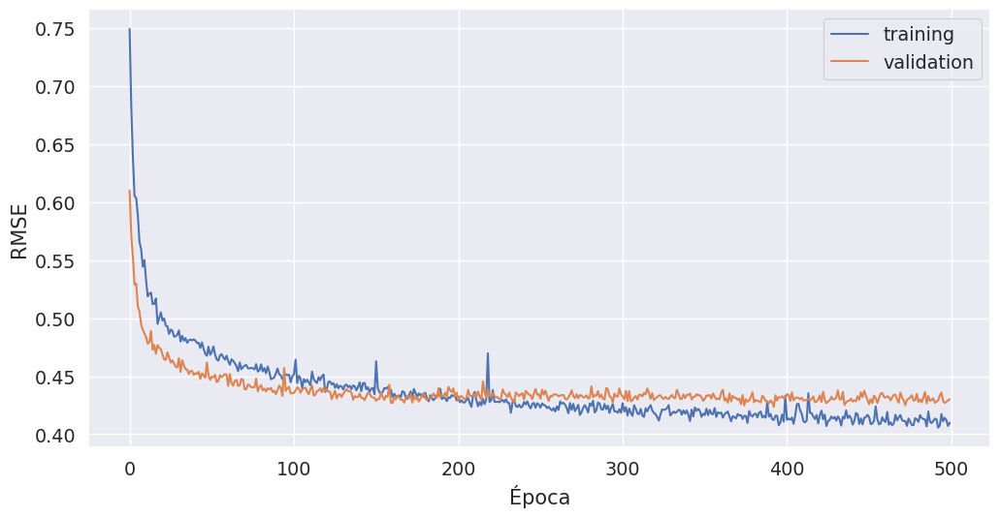

In [61]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(loss, label="training")
plt.plot(val_loss, label="validation")
plt.ylabel("RMSE")
plt.xlabel("Época")
plt.legend()

Ahora probamos, por otro lado, el método de [regularización](https://keras.io/api/layers/regularizers/) tipo L2

In [62]:
from keras.regularizers import l2

In [63]:
model = Sequential()
model.add(Dense(100, activation='relu', input_shape=(8,), kernel_regularizer=l2(0.01)))
model.add(Dense(50, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dense(1, activation='linear'))
opt = keras.optimizers.Adam()
model.compile(loss='mse', optimizer=opt)

In [64]:
history = model.fit(
    X_train.values,
    y_train.values,
    epochs=500,
    validation_data=(X_validation.values, y_validation.values),
)

Train on 6000 samples, validate on 4000 samples
Epoch 1/500
  32/6000 [..............................] - ETA: 19s - loss: 1.7428

1376/6000 [=====>........................] - ETA: 0s - loss: 1.4189 

2624/6000 [============>.................] - ETA: 0s - loss: 1.2299

4000/6000 [===================>..........] - ETA: 0s - loss: 1.1265

5216/6000 [=========================>....] - ETA: 0s - loss: 1.0507

6000/6000 [==============================] - 0s 74us/step - loss: 1.0240 - val_loss: 0.7298


Epoch 2/500
  32/6000 [..............................] - ETA: 0s - loss: 0.7194

1376/6000 [=====>........................] - ETA: 0s - loss: 0.7478

2656/6000 [============>.................] - ETA: 0s - loss: 0.7210

4064/6000 [===================>..........] - ETA: 0s - loss: 0.7068

5440/6000 [==========================>...] - ETA: 0s - loss: 0.7122

6000/6000 [==============================] - 0s 53us/step - loss: 0.7012 - val_loss: 0.5960


Epoch 3/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4927

1504/6000 [======>.......................] - ETA: 0s - loss: 0.6091

3008/6000 [==============>...............] - ETA: 0s - loss: 0.5803

4512/6000 [=====================>........] - ETA: 0s - loss: 0.5883

5984/6000 [============================>.] - ETA: 0s - loss: 0.5838

6000/6000 [==============================] - 0s 49us/step - loss: 0.5836 - val_loss: 0.5367


Epoch 4/500
  32/6000 [..............................] - ETA: 0s - loss: 0.7892

1440/6000 [======>.......................] - ETA: 0s - loss: 0.5653

2848/6000 [=============>................] - ETA: 0s - loss: 0.5666

4352/6000 [====================>.........] - ETA: 0s - loss: 0.5757

5856/6000 [============================>.] - ETA: 0s - loss: 0.5532

6000/6000 [==============================] - 0s 50us/step - loss: 0.5498 - val_loss: 0.4717


Epoch 5/500


  32/6000 [..............................] - ETA: 0s - loss: 0.4833

1184/6000 [====>.........................] - ETA: 0s - loss: 0.4851

2592/6000 [===========>..................] - ETA: 0s - loss: 0.4865

3968/6000 [==================>...........] - ETA: 0s - loss: 0.4731

5280/6000 [=========================>....] - ETA: 0s - loss: 0.4735

6000/6000 [==============================] - 0s 55us/step - loss: 0.4799 - val_loss: 0.4534


Epoch 6/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4154

1568/6000 [======>.......................] - ETA: 0s - loss: 0.4757

3104/6000 [==============>...............] - ETA: 0s - loss: 0.4527

4640/6000 [======================>.......] - ETA: 0s - loss: 0.4584

6000/6000 [==============================] - 0s 48us/step - loss: 0.4590 - val_loss: 0.4247


Epoch 7/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3802

1440/6000 [======>.......................] - ETA: 0s - loss: 0.4277

2784/6000 [============>.................] - ETA: 0s - loss: 0.4262

4096/6000 [===================>..........] - ETA: 0s - loss: 0.4111

5376/6000 [=========================>....] - ETA: 0s - loss: 0.4120

6000/6000 [==============================] - 0s 57us/step - loss: 0.4136 - val_loss: 0.4008


Epoch 8/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6095

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3909

2784/6000 [============>.................] - ETA: 0s - loss: 0.4055

4192/6000 [===================>..........] - ETA: 0s - loss: 0.3980

5600/6000 [===========================>..] - ETA: 0s - loss: 0.3959

6000/6000 [==============================] - 0s 51us/step - loss: 0.3967 - val_loss: 0.3814


Epoch 9/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4674

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3985

2976/6000 [=============>................] - ETA: 0s - loss: 0.4043

4544/6000 [=====================>........] - ETA: 0s - loss: 0.3889

6000/6000 [==============================] - 0s 49us/step - loss: 0.3828 - val_loss: 0.3705


Epoch 10/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3038

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3784

2848/6000 [=============>................] - ETA: 0s - loss: 0.3754

4224/6000 [====================>.........] - ETA: 0s - loss: 0.3750

5760/6000 [===========================>..] - ETA: 0s - loss: 0.3693

6000/6000 [==============================] - 0s 51us/step - loss: 0.3711 - val_loss: 0.3589


Epoch 11/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2940

1376/6000 [=====>........................] - ETA: 0s - loss: 0.3317

2720/6000 [============>.................] - ETA: 0s - loss: 0.3415

4160/6000 [===================>..........] - ETA: 0s - loss: 0.3799

5568/6000 [==========================>...] - ETA: 0s - loss: 0.3897

6000/6000 [==============================] - 0s 52us/step - loss: 0.3923 - val_loss: 0.3582


Epoch 12/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3821

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3849

2784/6000 [============>.................] - ETA: 0s - loss: 0.3695

4288/6000 [====================>.........] - ETA: 0s - loss: 0.3653

5632/6000 [===========================>..] - ETA: 0s - loss: 0.3688

6000/6000 [==============================] - 0s 51us/step - loss: 0.3689 - val_loss: 0.3537


Epoch 13/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3868

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3319

3008/6000 [==============>...............] - ETA: 0s - loss: 0.3526

4576/6000 [=====================>........] - ETA: 0s - loss: 0.3517

6000/6000 [==============================] - 0s 47us/step - loss: 0.3572 - val_loss: 0.3416


Epoch 14/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1863

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3217

2848/6000 [=============>................] - ETA: 0s - loss: 0.3329

4384/6000 [====================>.........] - ETA: 0s - loss: 0.3393

5856/6000 [============================>.] - ETA: 0s - loss: 0.3405

6000/6000 [==============================] - 0s 49us/step - loss: 0.3398 - val_loss: 0.3334


Epoch 15/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2620

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3303

2912/6000 [=============>................] - ETA: 0s - loss: 0.3280

4448/6000 [=====================>........] - ETA: 0s - loss: 0.3249

5920/6000 [============================>.] - ETA: 0s - loss: 0.3343

6000/6000 [==============================] - 0s 49us/step - loss: 0.3347 - val_loss: 0.3391


Epoch 16/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5375

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3322

2816/6000 [=============>................] - ETA: 0s - loss: 0.3279

4160/6000 [===================>..........] - ETA: 0s - loss: 0.3279

5504/6000 [==========================>...] - ETA: 0s - loss: 0.3304

6000/6000 [==============================] - 0s 53us/step - loss: 0.3338 - val_loss: 0.3253


Epoch 17/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2849

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3298

2688/6000 [============>.................] - ETA: 0s - loss: 0.3195

4096/6000 [===================>..........] - ETA: 0s - loss: 0.3269

5632/6000 [===========================>..] - ETA: 0s - loss: 0.3257

6000/6000 [==============================] - 0s 52us/step - loss: 0.3281 - val_loss: 0.3231


Epoch 18/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4483

1568/6000 [======>.......................] - ETA: 0s - loss: 0.3145

3072/6000 [==============>...............] - ETA: 0s - loss: 0.3103

4544/6000 [=====================>........] - ETA: 0s - loss: 0.3195

5984/6000 [============================>.] - ETA: 0s - loss: 0.3224

6000/6000 [==============================] - 0s 50us/step - loss: 0.3224 - val_loss: 0.3224


Epoch 19/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3524

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3055

2912/6000 [=============>................] - ETA: 0s - loss: 0.3224

4416/6000 [=====================>........] - ETA: 0s - loss: 0.3222

5920/6000 [============================>.] - ETA: 0s - loss: 0.3185

6000/6000 [==============================] - 0s 50us/step - loss: 0.3184 - val_loss: 0.3146


Epoch 20/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3112

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3335

2848/6000 [=============>................] - ETA: 0s - loss: 0.3251

4224/6000 [====================>.........] - ETA: 0s - loss: 0.3238

5632/6000 [===========================>..] - ETA: 0s - loss: 0.3188

6000/6000 [==============================] - 0s 51us/step - loss: 0.3167 - val_loss: 0.3351


Epoch 21/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2436

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3340

2208/6000 [==========>...................] - ETA: 0s - loss: 0.3290

3616/6000 [=================>............] - ETA: 0s - loss: 0.3170

5024/6000 [========================>.....] - ETA: 0s - loss: 0.3157

6000/6000 [==============================] - 0s 59us/step - loss: 0.3114 - val_loss: 0.3070


Epoch 22/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2563

1312/6000 [=====>........................] - ETA: 0s - loss: 0.3041

2688/6000 [============>.................] - ETA: 0s - loss: 0.3002

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2979



5472/6000 [==========================>...] - ETA: 0s - loss: 0.3087

6000/6000 [==============================] - 0s 54us/step - loss: 0.3103 - val_loss: 0.3052


Epoch 23/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2614

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2939

2816/6000 [=============>................] - ETA: 0s - loss: 0.3118

4288/6000 [====================>.........] - ETA: 0s - loss: 0.3086

5824/6000 [============================>.] - ETA: 0s - loss: 0.3049

6000/6000 [==============================] - 0s 49us/step - loss: 0.3070 - val_loss: 0.3106


Epoch 24/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2947

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3016

2848/6000 [=============>................] - ETA: 0s - loss: 0.3019

4384/6000 [====================>.........] - ETA: 0s - loss: 0.3008

5888/6000 [============================>.] - ETA: 0s - loss: 0.3036

6000/6000 [==============================] - 0s 49us/step - loss: 0.3053 - val_loss: 0.3013


Epoch 25/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1829

1376/6000 [=====>........................] - ETA: 0s - loss: 0.3202

2816/6000 [=============>................] - ETA: 0s - loss: 0.3128

4256/6000 [====================>.........] - ETA: 0s - loss: 0.3077

5536/6000 [==========================>...] - ETA: 0s - loss: 0.3091

6000/6000 [==============================] - 0s 52us/step - loss: 0.3046 - val_loss: 0.3022


Epoch 26/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3453

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2971

2752/6000 [============>.................] - ETA: 0s - loss: 0.3077

4192/6000 [===================>..........] - ETA: 0s - loss: 0.3048

5536/6000 [==========================>...] - ETA: 0s - loss: 0.3033

6000/6000 [==============================] - 0s 52us/step - loss: 0.3021 - val_loss: 0.2947


Epoch 27/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2362

1312/6000 [=====>........................] - ETA: 0s - loss: 0.3046

2400/6000 [===========>..................] - ETA: 0s - loss: 0.3223

3776/6000 [=================>............] - ETA: 0s - loss: 0.3090

5120/6000 [========================>.....] - ETA: 0s - loss: 0.3038

6000/6000 [==============================] - 0s 57us/step - loss: 0.3001 - val_loss: 0.2964


Epoch 28/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2879

1536/6000 [======>.......................] - ETA: 0s - loss: 0.3030

2720/6000 [============>.................] - ETA: 0s - loss: 0.2997

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2952

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2964

6000/6000 [==============================] - 0s 51us/step - loss: 0.2983 - val_loss: 0.2982


Epoch 29/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4489

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2803

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2968

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2977

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2989

6000/6000 [==============================] - 0s 54us/step - loss: 0.2964 - val_loss: 0.2965


Epoch 30/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1837

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2839

2688/6000 [============>.................] - ETA: 0s - loss: 0.2845

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2928

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2978

6000/6000 [==============================] - 0s 53us/step - loss: 0.2970 - val_loss: 0.2973


Epoch 31/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2814

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2729

2848/6000 [=============>................] - ETA: 0s - loss: 0.2892

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2950

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2957

6000/6000 [==============================] - 0s 53us/step - loss: 0.2944 - val_loss: 0.3087


Epoch 32/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2275

1472/6000 [======>.......................] - ETA: 0s - loss: 0.3175

2848/6000 [=============>................] - ETA: 0s - loss: 0.2922

4192/6000 [===================>..........] - ETA: 0s - loss: 0.3013

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2959

6000/6000 [==============================] - 0s 51us/step - loss: 0.2944 - val_loss: 0.2936


Epoch 33/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2055

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3033

2784/6000 [============>.................] - ETA: 0s - loss: 0.2973

4160/6000 [===================>..........] - ETA: 0s - loss: 0.3008

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2989

6000/6000 [==============================] - 0s 51us/step - loss: 0.2962 - val_loss: 0.2872


Epoch 34/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1353

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3121

2816/6000 [=============>................] - ETA: 0s - loss: 0.2948

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2915

5920/6000 [============================>.] - ETA: 0s - loss: 0.2933

6000/6000 [==============================] - 0s 50us/step - loss: 0.2926 - val_loss: 0.2877


Epoch 35/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2712

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2770

2880/6000 [=============>................] - ETA: 0s - loss: 0.2849

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2861

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2924

6000/6000 [==============================] - 0s 53us/step - loss: 0.2887 - val_loss: 0.2866


Epoch 36/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3425

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2879

2784/6000 [============>.................] - ETA: 0s - loss: 0.2921

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2903

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2851

6000/6000 [==============================] - 0s 53us/step - loss: 0.2885 - val_loss: 0.2837


Epoch 37/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2934

1536/6000 [======>.......................] - ETA: 0s - loss: 0.3059

2848/6000 [=============>................] - ETA: 0s - loss: 0.2836

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2827

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2857

6000/6000 [==============================] - 0s 52us/step - loss: 0.2867 - val_loss: 0.2835


Epoch 38/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1424

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2864

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2872

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2865

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2896

6000/6000 [==============================] - 0s 58us/step - loss: 0.2871 - val_loss: 0.2915


Epoch 39/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2723

1408/6000 [======>.......................] - ETA: 0s - loss: 0.3062

2592/6000 [===========>..................] - ETA: 0s - loss: 0.3051

4064/6000 [===================>..........] - ETA: 0s - loss: 0.3003

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2908

6000/6000 [==============================] - 0s 51us/step - loss: 0.2903 - val_loss: 0.2813


Epoch 40/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6689

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2985

2880/6000 [=============>................] - ETA: 0s - loss: 0.2938

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2915

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2866

6000/6000 [==============================] - 0s 53us/step - loss: 0.2866 - val_loss: 0.2838


Epoch 41/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4058

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2743

2912/6000 [=============>................] - ETA: 0s - loss: 0.2862

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2869

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2839

6000/6000 [==============================] - 0s 51us/step - loss: 0.2842 - val_loss: 0.2832


Epoch 42/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1411

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2900

2848/6000 [=============>................] - ETA: 0s - loss: 0.2809

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2889

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2850

6000/6000 [==============================] - 0s 51us/step - loss: 0.2828 - val_loss: 0.2789


Epoch 43/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1363

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2719

2848/6000 [=============>................] - ETA: 0s - loss: 0.2762

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2735

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2774

6000/6000 [==============================] - 0s 51us/step - loss: 0.2831 - val_loss: 0.3237


Epoch 44/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3401

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2954

2784/6000 [============>.................] - ETA: 0s - loss: 0.2827

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2796

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2828

6000/6000 [==============================] - 0s 52us/step - loss: 0.2837 - val_loss: 0.2850


Epoch 45/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3367

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2890

2784/6000 [============>.................] - ETA: 0s - loss: 0.2842

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2772

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2822

6000/6000 [==============================] - 0s 52us/step - loss: 0.2801 - val_loss: 0.2837


Epoch 46/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2810

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2730

2752/6000 [============>.................] - ETA: 0s - loss: 0.2775

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2826

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2749

6000/6000 [==============================] - 0s 52us/step - loss: 0.2775 - val_loss: 0.2781


Epoch 47/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2250

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2632

2848/6000 [=============>................] - ETA: 0s - loss: 0.2827

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2761

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2766

6000/6000 [==============================] - 0s 51us/step - loss: 0.2781 - val_loss: 0.2788


Epoch 48/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1960

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2714

2848/6000 [=============>................] - ETA: 0s - loss: 0.2645

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2731

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2771

6000/6000 [==============================] - 0s 52us/step - loss: 0.2774 - val_loss: 0.2814


Epoch 49/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3865

1440/6000 [======>.......................] - ETA: 0s - loss: 0.3016

2880/6000 [=============>................] - ETA: 0s - loss: 0.2848

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2712

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2785

6000/6000 [==============================] - 0s 51us/step - loss: 0.2786 - val_loss: 0.2774


Epoch 50/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2556

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2752

2784/6000 [============>.................] - ETA: 0s - loss: 0.2806

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2797

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2791

6000/6000 [==============================] - 0s 52us/step - loss: 0.2766 - val_loss: 0.2877


Epoch 51/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3752

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2886

2944/6000 [=============>................] - ETA: 0s - loss: 0.2838

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2817

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2781

6000/6000 [==============================] - 0s 52us/step - loss: 0.2801 - val_loss: 0.2734


Epoch 52/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2594

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2699

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2779

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2744

6000/6000 [==============================] - 0s 48us/step - loss: 0.2762 - val_loss: 0.2742


Epoch 53/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2564

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2580

2784/6000 [============>.................] - ETA: 0s - loss: 0.2691

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2699

5888/6000 [============================>.] - ETA: 0s - loss: 0.2720

6000/6000 [==============================] - 0s 49us/step - loss: 0.2734 - val_loss: 0.3056


Epoch 54/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3192

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2927

2912/6000 [=============>................] - ETA: 0s - loss: 0.2822

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2778

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2759

6000/6000 [==============================] - 0s 51us/step - loss: 0.2772 - val_loss: 0.2694


Epoch 55/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1983

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2590

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2684

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2715

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2703

6000/6000 [==============================] - 0s 55us/step - loss: 0.2718 - val_loss: 0.2811


Epoch 56/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2881

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2480

2784/6000 [============>.................] - ETA: 0s - loss: 0.2562

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2677

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2697

6000/6000 [==============================] - 0s 53us/step - loss: 0.2703 - val_loss: 0.2682


Epoch 57/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1653

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2829

2816/6000 [=============>................] - ETA: 0s - loss: 0.2665

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2671

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2703

6000/6000 [==============================] - 0s 51us/step - loss: 0.2718 - val_loss: 0.2704


Epoch 58/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3645

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2816

2848/6000 [=============>................] - ETA: 0s - loss: 0.2793

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2751

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2730

6000/6000 [==============================] - 0s 50us/step - loss: 0.2706 - val_loss: 0.2797


Epoch 59/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3362

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2705



2784/6000 [============>.................] - ETA: 0s - loss: 0.2760

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2826

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2746

6000/6000 [==============================] - 0s 53us/step - loss: 0.2695 - val_loss: 0.2698


Epoch 60/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3360

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2426

2752/6000 [============>.................] - ETA: 0s - loss: 0.2548

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2696

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2731

6000/6000 [==============================] - 0s 55us/step - loss: 0.2704 - val_loss: 0.2704


Epoch 61/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1505

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2596

2848/6000 [=============>................] - ETA: 0s - loss: 0.2653

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2752

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2698

6000/6000 [==============================] - 0s 51us/step - loss: 0.2710 - val_loss: 0.2835


Epoch 62/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1353

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2649

2880/6000 [=============>................] - ETA: 0s - loss: 0.2754

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2754

5824/6000 [============================>.] - ETA: 0s - loss: 0.2734

6000/6000 [==============================] - 0s 50us/step - loss: 0.2734 - val_loss: 0.2668


Epoch 63/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1970

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2733

2912/6000 [=============>................] - ETA: 0s - loss: 0.2710

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2646

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2619

6000/6000 [==============================] - 0s 53us/step - loss: 0.2658 - val_loss: 0.2823


Epoch 64/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2607

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2629

2944/6000 [=============>................] - ETA: 0s - loss: 0.2551

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2695

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2654

6000/6000 [==============================] - 0s 50us/step - loss: 0.2662 - val_loss: 0.2640


Epoch 65/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2396

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2673

2720/6000 [============>.................] - ETA: 0s - loss: 0.2581

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2612

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2660

6000/6000 [==============================] - 0s 53us/step - loss: 0.2663 - val_loss: 0.2700


Epoch 66/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2120

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2774

2848/6000 [=============>................] - ETA: 0s - loss: 0.2616

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2594

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2666

6000/6000 [==============================] - 0s 54us/step - loss: 0.2670 - val_loss: 0.2660


Epoch 67/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4029

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2622

2848/6000 [=============>................] - ETA: 0s - loss: 0.2656

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2738

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2651

6000/6000 [==============================] - 0s 50us/step - loss: 0.2651 - val_loss: 0.2666


Epoch 68/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2177

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2640

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2650

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2668

5984/6000 [============================>.] - ETA: 0s - loss: 0.2635

6000/6000 [==============================] - 0s 50us/step - loss: 0.2643 - val_loss: 0.2687


Epoch 69/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2925

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2650

2848/6000 [=============>................] - ETA: 0s - loss: 0.2653

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2668

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2637

6000/6000 [==============================] - 0s 51us/step - loss: 0.2631 - val_loss: 0.2687


Epoch 70/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2623

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2793

2816/6000 [=============>................] - ETA: 0s - loss: 0.2659

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2593

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2635

6000/6000 [==============================] - 0s 52us/step - loss: 0.2652 - val_loss: 0.2725


Epoch 71/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3442

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2761

2880/6000 [=============>................] - ETA: 0s - loss: 0.2691

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2680

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2677

6000/6000 [==============================] - 0s 51us/step - loss: 0.2638 - val_loss: 0.2673


Epoch 72/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1499

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2616

2816/6000 [=============>................] - ETA: 0s - loss: 0.2742

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2670

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2613

6000/6000 [==============================] - 0s 52us/step - loss: 0.2632 - val_loss: 0.2649


Epoch 73/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2995

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2854

2752/6000 [============>.................] - ETA: 0s - loss: 0.2749

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2696

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2682

6000/6000 [==============================] - 0s 50us/step - loss: 0.2670 - val_loss: 0.2698


Epoch 74/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4621

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2563

2912/6000 [=============>................] - ETA: 0s - loss: 0.2623

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2601

5888/6000 [============================>.] - ETA: 0s - loss: 0.2623

6000/6000 [==============================] - 0s 51us/step - loss: 0.2626 - val_loss: 0.2722


Epoch 75/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2760

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2499

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2712

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2647

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2628

6000/6000 [==============================] - 0s 53us/step - loss: 0.2629 - val_loss: 0.2709


Epoch 76/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1569

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2421

2784/6000 [============>.................] - ETA: 0s - loss: 0.2563

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2624

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2632

6000/6000 [==============================] - 0s 53us/step - loss: 0.2618 - val_loss: 0.2777


Epoch 77/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1895

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2674

2880/6000 [=============>................] - ETA: 0s - loss: 0.2622

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2574

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2617

6000/6000 [==============================] - 0s 51us/step - loss: 0.2627 - val_loss: 0.2760


Epoch 78/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2011

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2734

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2640

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2655

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2621

6000/6000 [==============================] - 0s 53us/step - loss: 0.2599 - val_loss: 0.2583


Epoch 79/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2153

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2698

2656/6000 [============>.................] - ETA: 0s - loss: 0.2669

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2669

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2657

6000/6000 [==============================] - 0s 53us/step - loss: 0.2595 - val_loss: 0.2608


Epoch 80/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1517

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2472

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2493

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2511

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2581

6000/6000 [==============================] - 0s 52us/step - loss: 0.2596 - val_loss: 0.2642


Epoch 81/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2989

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2706

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2505

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2497

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2589

6000/6000 [==============================] - 0s 52us/step - loss: 0.2606 - val_loss: 0.2642


Epoch 82/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2395

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2799

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2652

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2562

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2563

6000/6000 [==============================] - 0s 53us/step - loss: 0.2614 - val_loss: 0.2707


Epoch 83/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1693

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2680

2752/6000 [============>.................] - ETA: 0s - loss: 0.2484

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2573

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2627

6000/6000 [==============================] - 0s 54us/step - loss: 0.2593 - val_loss: 0.2600


Epoch 84/500
  32/6000 [..............................] - ETA: 0s - loss: 1.0573

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2615

2816/6000 [=============>................] - ETA: 0s - loss: 0.2476

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2463

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2578

6000/6000 [==============================] - 0s 53us/step - loss: 0.2607 - val_loss: 0.2826


Epoch 85/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2405

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2640

2848/6000 [=============>................] - ETA: 0s - loss: 0.2714

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2654

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2625

6000/6000 [==============================] - 0s 52us/step - loss: 0.2640 - val_loss: 0.2584


Epoch 86/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2019

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2372

2720/6000 [============>.................] - ETA: 0s - loss: 0.2564

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2496

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2577

6000/6000 [==============================] - 0s 54us/step - loss: 0.2570 - val_loss: 0.2621


Epoch 87/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1959

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2941

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2718

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2603

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2584

6000/6000 [==============================] - 0s 53us/step - loss: 0.2595 - val_loss: 0.2642


Epoch 88/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2106

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2662

2272/6000 [==========>...................] - ETA: 0s - loss: 0.2530

3680/6000 [=================>............] - ETA: 0s - loss: 0.2661

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2654

6000/6000 [==============================] - 0s 55us/step - loss: 0.2593 - val_loss: 0.2669


Epoch 89/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3076

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2378

2848/6000 [=============>................] - ETA: 0s - loss: 0.2560

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2587

5824/6000 [============================>.] - ETA: 0s - loss: 0.2571

6000/6000 [==============================] - 0s 50us/step - loss: 0.2586 - val_loss: 0.2554


Epoch 90/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2387

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2517

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2563

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2551

5856/6000 [============================>.] - ETA: 0s - loss: 0.2560

6000/6000 [==============================] - 0s 52us/step - loss: 0.2593 - val_loss: 0.2596


Epoch 91/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3049

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2692

2624/6000 [============>.................] - ETA: 0s - loss: 0.2696

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2616

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2621

6000/6000 [==============================] - 0s 56us/step - loss: 0.2604 - val_loss: 0.2573


Epoch 92/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2600

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2449

2816/6000 [=============>................] - ETA: 0s - loss: 0.2516

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2522

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2524

6000/6000 [==============================] - 0s 51us/step - loss: 0.2546 - val_loss: 0.2640


Epoch 93/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1582

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2666

2720/6000 [============>.................] - ETA: 0s - loss: 0.2485

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2550

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2551

6000/6000 [==============================] - 0s 52us/step - loss: 0.2545 - val_loss: 0.2572


Epoch 94/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1378

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2509

2656/6000 [============>.................] - ETA: 0s - loss: 0.2382

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2407

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2574

6000/6000 [==============================] - 0s 51us/step - loss: 0.2565 - val_loss: 0.2579


Epoch 95/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1619

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2447

2848/6000 [=============>................] - ETA: 0s - loss: 0.2610

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2592

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2593

6000/6000 [==============================] - 0s 52us/step - loss: 0.2556 - val_loss: 0.2565


Epoch 96/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2000

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2433

2816/6000 [=============>................] - ETA: 0s - loss: 0.2468

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2560

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2543

6000/6000 [==============================] - 0s 51us/step - loss: 0.2531 - val_loss: 0.2794


Epoch 97/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5990

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2651

2752/6000 [============>.................] - ETA: 0s - loss: 0.2582

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2567

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2545

6000/6000 [==============================] - 0s 54us/step - loss: 0.2542 - val_loss: 0.2567


Epoch 98/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3734

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2524

2816/6000 [=============>................] - ETA: 0s - loss: 0.2431

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2471

5856/6000 [============================>.] - ETA: 0s - loss: 0.2488

6000/6000 [==============================] - 0s 50us/step - loss: 0.2509 - val_loss: 0.2554


Epoch 99/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2408

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2637

2848/6000 [=============>................] - ETA: 0s - loss: 0.2505

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2655

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2564

6000/6000 [==============================] - 0s 51us/step - loss: 0.2557 - val_loss: 0.2533


Epoch 100/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2757

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2988

2784/6000 [============>.................] - ETA: 0s - loss: 0.2673

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2612

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2525

6000/6000 [==============================] - 0s 58us/step - loss: 0.2528 - val_loss: 0.2695


Epoch 101/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1279

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2394

2848/6000 [=============>................] - ETA: 0s - loss: 0.2501

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2559

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2585

6000/6000 [==============================] - 0s 51us/step - loss: 0.2566 - val_loss: 0.2515


Epoch 102/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3495

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2383

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2488

3520/6000 [================>.............] - ETA: 0s - loss: 0.2486

4832/6000 [=======================>......] - ETA: 0s - loss: 0.2560

6000/6000 [==============================] - 0s 58us/step - loss: 0.2555 - val_loss: 0.2517


Epoch 103/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3240

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2477

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2538

3744/6000 [=================>............] - ETA: 0s - loss: 0.2636

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2571

6000/6000 [==============================] - 0s 55us/step - loss: 0.2537 - val_loss: 0.2535


Epoch 104/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1902

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2449

2816/6000 [=============>................] - ETA: 0s - loss: 0.2573

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2602

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2520

6000/6000 [==============================] - 0s 53us/step - loss: 0.2515 - val_loss: 0.2524


Epoch 105/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2363

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2315

2976/6000 [=============>................] - ETA: 0s - loss: 0.2533

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2483

5824/6000 [============================>.] - ETA: 0s - loss: 0.2529

6000/6000 [==============================] - 0s 50us/step - loss: 0.2518 - val_loss: 0.2557


Epoch 106/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0940



1536/6000 [======>.......................] - ETA: 0s - loss: 0.2544

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2617

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2505

5984/6000 [============================>.] - ETA: 0s - loss: 0.2502

6000/6000 [==============================] - 0s 50us/step - loss: 0.2505 - val_loss: 0.2548


Epoch 107/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2090

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2400

2848/6000 [=============>................] - ETA: 0s - loss: 0.2475

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2462

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2542

6000/6000 [==============================] - 0s 53us/step - loss: 0.2525 - val_loss: 0.2497


Epoch 108/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1586

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2208

2688/6000 [============>.................] - ETA: 0s - loss: 0.2371

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2382

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2408

6000/6000 [==============================] - 0s 56us/step - loss: 0.2495 - val_loss: 0.2493


Epoch 109/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2526

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2453

2848/6000 [=============>................] - ETA: 0s - loss: 0.2402

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2432

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2455

6000/6000 [==============================] - 0s 53us/step - loss: 0.2499 - val_loss: 0.2511


Epoch 110/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3718

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2449

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2452

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2517

5952/6000 [============================>.] - ETA: 0s - loss: 0.2490

6000/6000 [==============================] - 0s 50us/step - loss: 0.2485 - val_loss: 0.2605


Epoch 111/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2426

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2507

2752/6000 [============>.................] - ETA: 0s - loss: 0.2580

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2526

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2498

6000/6000 [==============================] - 0s 52us/step - loss: 0.2511 - val_loss: 0.2498


Epoch 112/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3428

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2673

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2583

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2576

5856/6000 [============================>.] - ETA: 0s - loss: 0.2526

6000/6000 [==============================] - 0s 51us/step - loss: 0.2516 - val_loss: 0.2491


Epoch 113/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1869

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2599

2944/6000 [=============>................] - ETA: 0s - loss: 0.2559

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2601

5920/6000 [============================>.] - ETA: 0s - loss: 0.2522

6000/6000 [==============================] - 0s 51us/step - loss: 0.2524 - val_loss: 0.2651


Epoch 114/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3554

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2497

2784/6000 [============>.................] - ETA: 0s - loss: 0.2493

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2484

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2496

6000/6000 [==============================] - 0s 54us/step - loss: 0.2490 - val_loss: 0.2523


Epoch 115/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1717

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2297

2720/6000 [============>.................] - ETA: 0s - loss: 0.2420

3776/6000 [=================>............] - ETA: 0s - loss: 0.2417

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2494

6000/6000 [==============================] - 0s 55us/step - loss: 0.2492 - val_loss: 0.2666


Epoch 116/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1721

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2437

2688/6000 [============>.................] - ETA: 0s - loss: 0.2482

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2476

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2499

6000/6000 [==============================] - 0s 54us/step - loss: 0.2525 - val_loss: 0.2525


Epoch 117/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1894

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2489

2720/6000 [============>.................] - ETA: 0s - loss: 0.2489

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2479

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2473

6000/6000 [==============================] - 0s 52us/step - loss: 0.2475 - val_loss: 0.2594


Epoch 118/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3295

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2510

2944/6000 [=============>................] - ETA: 0s - loss: 0.2447

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2402

5952/6000 [============================>.] - ETA: 0s - loss: 0.2471

6000/6000 [==============================] - 0s 49us/step - loss: 0.2474 - val_loss: 0.2457


Epoch 119/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1387

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2716

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2667

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2511

5984/6000 [============================>.] - ETA: 0s - loss: 0.2498

6000/6000 [==============================] - 0s 49us/step - loss: 0.2496 - val_loss: 0.2500


Epoch 120/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2490

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2440

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2427

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2436

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2498

6000/6000 [==============================] - 0s 51us/step - loss: 0.2488 - val_loss: 0.2511


Epoch 121/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1825

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2382

2720/6000 [============>.................] - ETA: 0s - loss: 0.2559

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2532

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2539

6000/6000 [==============================] - 0s 53us/step - loss: 0.2505 - val_loss: 0.2531


Epoch 122/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1434

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2392

2816/6000 [=============>................] - ETA: 0s - loss: 0.2529

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2470

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2522

6000/6000 [==============================] - 0s 53us/step - loss: 0.2483 - val_loss: 0.2582


Epoch 123/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2710

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2585

2944/6000 [=============>................] - ETA: 0s - loss: 0.2467

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2421

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2484

6000/6000 [==============================] - 0s 51us/step - loss: 0.2468 - val_loss: 0.2495


Epoch 124/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2445

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2464

2944/6000 [=============>................] - ETA: 0s - loss: 0.2468

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2404

5920/6000 [============================>.] - ETA: 0s - loss: 0.2469

6000/6000 [==============================] - 0s 49us/step - loss: 0.2477 - val_loss: 0.2707


Epoch 125/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5122

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2441

2848/6000 [=============>................] - ETA: 0s - loss: 0.2426

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2432

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2466

6000/6000 [==============================] - 0s 50us/step - loss: 0.2485 - val_loss: 0.2528


Epoch 126/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3299

1600/6000 [=======>......................] - ETA: 0s - loss: 0.2693

3136/6000 [==============>...............] - ETA: 0s - loss: 0.2522

4640/6000 [======================>.......] - ETA: 0s - loss: 0.2428

6000/6000 [==============================] - 0s 48us/step - loss: 0.2464 - val_loss: 0.2667


Epoch 127/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1762

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2420

2368/6000 [==========>...................] - ETA: 0s - loss: 0.2380

3712/6000 [=================>............] - ETA: 0s - loss: 0.2457

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2458

6000/6000 [==============================] - 0s 55us/step - loss: 0.2454 - val_loss: 0.2429


Epoch 128/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1635

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2387

2848/6000 [=============>................] - ETA: 0s - loss: 0.2413

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2441

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2475

6000/6000 [==============================] - 0s 51us/step - loss: 0.2495 - val_loss: 0.2471


Epoch 129/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1738

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2362

2880/6000 [=============>................] - ETA: 0s - loss: 0.2451

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2511

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2494

6000/6000 [==============================] - 0s 52us/step - loss: 0.2463 - val_loss: 0.2501


Epoch 130/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2180

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2279

2912/6000 [=============>................] - ETA: 0s - loss: 0.2438

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2449

5888/6000 [============================>.] - ETA: 0s - loss: 0.2486

6000/6000 [==============================] - 0s 49us/step - loss: 0.2481 - val_loss: 0.2424


Epoch 131/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1600

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2395

2688/6000 [============>.................] - ETA: 0s - loss: 0.2513

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2497

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2455

6000/6000 [==============================] - 0s 51us/step - loss: 0.2451 - val_loss: 0.2433


Epoch 132/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2779

1568/6000 [======>.......................] - ETA: 0s - loss: 0.2450

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2520

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2486

5856/6000 [============================>.] - ETA: 0s - loss: 0.2461

6000/6000 [==============================] - 0s 50us/step - loss: 0.2457 - val_loss: 0.2454


Epoch 133/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1895

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2619

2784/6000 [============>.................] - ETA: 0s - loss: 0.2400

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2542

5856/6000 [============================>.] - ETA: 0s - loss: 0.2513

6000/6000 [==============================] - 0s 50us/step - loss: 0.2491 - val_loss: 0.2496


Epoch 134/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1712

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2544

2816/6000 [=============>................] - ETA: 0s - loss: 0.2473

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2546

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2476

6000/6000 [==============================] - 0s 53us/step - loss: 0.2479 - val_loss: 0.2443


Epoch 135/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1399

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2238

2848/6000 [=============>................] - ETA: 0s - loss: 0.2322

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2419

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2459

6000/6000 [==============================] - 0s 51us/step - loss: 0.2435 - val_loss: 0.2582


Epoch 136/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1632

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2405

2912/6000 [=============>................] - ETA: 0s - loss: 0.2499

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2471

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2502

6000/6000 [==============================] - 0s 52us/step - loss: 0.2488 - val_loss: 0.2476


Epoch 137/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1792

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2408

2944/6000 [=============>................] - ETA: 0s - loss: 0.2414

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2411

5920/6000 [============================>.] - ETA: 0s - loss: 0.2418

6000/6000 [==============================] - 0s 49us/step - loss: 0.2424 - val_loss: 0.2481


Epoch 138/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2989

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2178

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2438

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2397

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2398

6000/6000 [==============================] - 0s 52us/step - loss: 0.2411 - val_loss: 0.2591


Epoch 139/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3250

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2389

2848/6000 [=============>................] - ETA: 0s - loss: 0.2370

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2477

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2481

6000/6000 [==============================] - 0s 53us/step - loss: 0.2475 - val_loss: 0.2579


Epoch 140/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1421

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2350

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2389

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2387

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2401

6000/6000 [==============================] - 0s 52us/step - loss: 0.2418 - val_loss: 0.2812


Epoch 141/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2142

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2483

2848/6000 [=============>................] - ETA: 0s - loss: 0.2387

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2437

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2449

6000/6000 [==============================] - 0s 51us/step - loss: 0.2443 - val_loss: 0.2491


Epoch 142/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1949

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2403

2784/6000 [============>.................] - ETA: 0s - loss: 0.2392

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2428

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2418

6000/6000 [==============================] - 0s 53us/step - loss: 0.2428 - val_loss: 0.2762


Epoch 143/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2738

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2439

2784/6000 [============>.................] - ETA: 0s - loss: 0.2416

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2472

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2498

6000/6000 [==============================] - 0s 50us/step - loss: 0.2490 - val_loss: 0.2481


Epoch 144/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2034

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2798

2976/6000 [=============>................] - ETA: 0s - loss: 0.2523

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2464

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2463

6000/6000 [==============================] - 0s 51us/step - loss: 0.2461 - val_loss: 0.2500


Epoch 145/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1912

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2508

2784/6000 [============>.................] - ETA: 0s - loss: 0.2473

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2371

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2437

6000/6000 [==============================] - 0s 53us/step - loss: 0.2410 - val_loss: 0.2401


Epoch 146/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2949

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2493

2752/6000 [============>.................] - ETA: 0s - loss: 0.2390

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2382

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2390

6000/6000 [==============================] - 0s 51us/step - loss: 0.2424 - val_loss: 0.2412


Epoch 147/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1287

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2395

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2557

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2472

5952/6000 [============================>.] - ETA: 0s - loss: 0.2434

6000/6000 [==============================] - 0s 49us/step - loss: 0.2427 - val_loss: 0.2406


Epoch 148/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2491

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2303

2720/6000 [============>.................] - ETA: 0s - loss: 0.2371

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2455

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2406

6000/6000 [==============================] - 0s 53us/step - loss: 0.2415 - val_loss: 0.2437


Epoch 149/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1758

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2593

2816/6000 [=============>................] - ETA: 0s - loss: 0.2484

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2438

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2466

6000/6000 [==============================] - 0s 55us/step - loss: 0.2496 - val_loss: 0.2427


Epoch 150/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3400

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2419

2912/6000 [=============>................] - ETA: 0s - loss: 0.2312

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2347

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2401

6000/6000 [==============================] - 0s 54us/step - loss: 0.2410 - val_loss: 0.2507


Epoch 151/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1891

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2391

2752/6000 [============>.................] - ETA: 0s - loss: 0.2449

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2409

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2400

6000/6000 [==============================] - 0s 51us/step - loss: 0.2411 - val_loss: 0.2403


Epoch 152/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3670

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2272

2752/6000 [============>.................] - ETA: 0s - loss: 0.2304

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2434

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2438

6000/6000 [==============================] - 0s 51us/step - loss: 0.2429 - val_loss: 0.2427


Epoch 153/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1597

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2493

2848/6000 [=============>................] - ETA: 0s - loss: 0.2485

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2463

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2419

6000/6000 [==============================] - 0s 52us/step - loss: 0.2395 - val_loss: 0.2430


Epoch 154/500
  32/6000 [..............................] - ETA: 0s - loss: 0.7450

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2403

2816/6000 [=============>................] - ETA: 0s - loss: 0.2381

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2361

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2406

6000/6000 [==============================] - 0s 53us/step - loss: 0.2389 - val_loss: 0.2472


Epoch 155/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1697

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2247

2752/6000 [============>.................] - ETA: 0s - loss: 0.2319

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2346

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2454

6000/6000 [==============================] - 0s 53us/step - loss: 0.2453 - val_loss: 0.2441


Epoch 156/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4275

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2526

2784/6000 [============>.................] - ETA: 0s - loss: 0.2547

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2465

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2457

6000/6000 [==============================] - 0s 52us/step - loss: 0.2424 - val_loss: 0.2392


Epoch 157/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2206

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2239

2752/6000 [============>.................] - ETA: 0s - loss: 0.2354

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2409

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2403

6000/6000 [==============================] - 0s 53us/step - loss: 0.2433 - val_loss: 0.2659


Epoch 158/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3648

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2325

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2518

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2479

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2431

6000/6000 [==============================] - 0s 54us/step - loss: 0.2416 - val_loss: 0.2554


Epoch 159/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2162

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2277

2880/6000 [=============>................] - ETA: 0s - loss: 0.2358

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2496

5824/6000 [============================>.] - ETA: 0s - loss: 0.2513

6000/6000 [==============================] - 0s 49us/step - loss: 0.2514 - val_loss: 0.2466


Epoch 160/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1824

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2321

2880/6000 [=============>................] - ETA: 0s - loss: 0.2444

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2539

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2465

6000/6000 [==============================] - 0s 52us/step - loss: 0.2451 - val_loss: 0.2430


Epoch 161/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3062

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2430

2880/6000 [=============>................] - ETA: 0s - loss: 0.2462

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2447

5856/6000 [============================>.] - ETA: 0s - loss: 0.2404

6000/6000 [==============================] - 0s 49us/step - loss: 0.2393 - val_loss: 0.2384


Epoch 162/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2082

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2449

2656/6000 [============>.................] - ETA: 0s - loss: 0.2493

3808/6000 [==================>...........] - ETA: 0s - loss: 0.2439

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2430

6000/6000 [==============================] - 0s 52us/step - loss: 0.2410 - val_loss: 0.2384


Epoch 163/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4173

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2744

2848/6000 [=============>................] - ETA: 0s - loss: 0.2502

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2468

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2403

6000/6000 [==============================] - 0s 51us/step - loss: 0.2388 - val_loss: 0.2368


Epoch 164/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1570

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2386

2784/6000 [============>.................] - ETA: 0s - loss: 0.2461

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2377

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2397

6000/6000 [==============================] - 0s 52us/step - loss: 0.2388 - val_loss: 0.2367


Epoch 165/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1931

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2148

2816/6000 [=============>................] - ETA: 0s - loss: 0.2324

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2400

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2403

6000/6000 [==============================] - 0s 52us/step - loss: 0.2401 - val_loss: 0.2460


Epoch 166/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2720

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2504

2752/6000 [============>.................] - ETA: 0s - loss: 0.2441

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2358

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2377

6000/6000 [==============================] - 0s 54us/step - loss: 0.2374 - val_loss: 0.2396


Epoch 167/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1852

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2093

2624/6000 [============>.................] - ETA: 0s - loss: 0.2146

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2338

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2371

6000/6000 [==============================] - 0s 53us/step - loss: 0.2359 - val_loss: 0.2416


Epoch 168/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1439

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2240

2944/6000 [=============>................] - ETA: 0s - loss: 0.2308

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2406

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2416

6000/6000 [==============================] - 0s 49us/step - loss: 0.2406 - val_loss: 0.2387


Epoch 169/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2714

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2058

2944/6000 [=============>................] - ETA: 0s - loss: 0.2196

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2273

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2375

6000/6000 [==============================] - 0s 52us/step - loss: 0.2395 - val_loss: 0.2486


Epoch 170/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2369

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2159

2720/6000 [============>.................] - ETA: 0s - loss: 0.2212

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2422

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2383

6000/6000 [==============================] - 0s 54us/step - loss: 0.2403 - val_loss: 0.2388


Epoch 171/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2057

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2290

2272/6000 [==========>...................] - ETA: 0s - loss: 0.2375

3520/6000 [================>.............] - ETA: 0s - loss: 0.2442

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2371

6000/6000 [==============================] - 0s 57us/step - loss: 0.2396 - val_loss: 0.2445


Epoch 172/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4012

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2596

2944/6000 [=============>................] - ETA: 0s - loss: 0.2557

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2435

5824/6000 [============================>.] - ETA: 0s - loss: 0.2389

6000/6000 [==============================] - 0s 50us/step - loss: 0.2378 - val_loss: 0.2328


Epoch 173/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2169

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2700

2720/6000 [============>.................] - ETA: 0s - loss: 0.2447

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2321

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2364

6000/6000 [==============================] - 0s 54us/step - loss: 0.2368 - val_loss: 0.2515


Epoch 174/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1792

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2315

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2260

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2355

5920/6000 [============================>.] - ETA: 0s - loss: 0.2412

6000/6000 [==============================] - 0s 50us/step - loss: 0.2407 - val_loss: 0.2385


Epoch 175/500


  32/6000 [..............................] - ETA: 1s - loss: 0.3797

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2308

2752/6000 [============>.................] - ETA: 0s - loss: 0.2248

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2346

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2305

6000/6000 [==============================] - 0s 53us/step - loss: 0.2363 - val_loss: 0.2411


Epoch 176/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1525

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2332

2752/6000 [============>.................] - ETA: 0s - loss: 0.2337

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2442

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2433

6000/6000 [==============================] - 0s 52us/step - loss: 0.2418 - val_loss: 0.2353


Epoch 177/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2103

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2537

2720/6000 [============>.................] - ETA: 0s - loss: 0.2465

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2397

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2367

6000/6000 [==============================] - 0s 52us/step - loss: 0.2391 - val_loss: 0.2371


Epoch 178/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2682

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2604

2784/6000 [============>.................] - ETA: 0s - loss: 0.2457

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2406

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2373

6000/6000 [==============================] - 0s 52us/step - loss: 0.2353 - val_loss: 0.2338


Epoch 179/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2325

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2314

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2567

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2511

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2408

6000/6000 [==============================] - 0s 54us/step - loss: 0.2404 - val_loss: 0.2364


Epoch 180/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2058

1120/6000 [====>.........................] - ETA: 0s - loss: 0.2141

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2180

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2304

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2372

6000/6000 [==============================] - 0s 52us/step - loss: 0.2356 - val_loss: 0.2409


Epoch 181/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1706

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2428

2784/6000 [============>.................] - ETA: 0s - loss: 0.2432

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2456

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2394

6000/6000 [==============================] - 0s 54us/step - loss: 0.2400 - val_loss: 0.2418


Epoch 182/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2802

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2428

2784/6000 [============>.................] - ETA: 0s - loss: 0.2361

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2364

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2424

6000/6000 [==============================] - 0s 51us/step - loss: 0.2400 - val_loss: 0.2360


Epoch 183/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1833

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2385

2784/6000 [============>.................] - ETA: 0s - loss: 0.2450

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2430

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2390

6000/6000 [==============================] - 0s 52us/step - loss: 0.2382 - val_loss: 0.2360


Epoch 184/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1971

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2284

2720/6000 [============>.................] - ETA: 0s - loss: 0.2243

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2302

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2361

6000/6000 [==============================] - 0s 54us/step - loss: 0.2387 - val_loss: 0.2439


Epoch 185/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3449

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2577

2784/6000 [============>.................] - ETA: 0s - loss: 0.2482

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2418

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2391

6000/6000 [==============================] - 0s 51us/step - loss: 0.2384 - val_loss: 0.2335


Epoch 186/500
  32/6000 [..............................] - ETA: 0s - loss: 0.6631

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2233

2688/6000 [============>.................] - ETA: 0s - loss: 0.2400

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2392

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2371

6000/6000 [==============================] - 0s 53us/step - loss: 0.2350 - val_loss: 0.2381


Epoch 187/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1961

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2422

2752/6000 [============>.................] - ETA: 0s - loss: 0.2263

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2302

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2356

6000/6000 [==============================] - 0s 55us/step - loss: 0.2387 - val_loss: 0.2382


Epoch 188/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2031

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2242

2752/6000 [============>.................] - ETA: 0s - loss: 0.2331

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2291

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2376

6000/6000 [==============================] - 0s 53us/step - loss: 0.2361 - val_loss: 0.2357


Epoch 189/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1412

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2213

2752/6000 [============>.................] - ETA: 0s - loss: 0.2464

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2427

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2419

6000/6000 [==============================] - 0s 54us/step - loss: 0.2386 - val_loss: 0.2373


Epoch 190/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3219

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2285

2816/6000 [=============>................] - ETA: 0s - loss: 0.2240

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2301

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2384

6000/6000 [==============================] - 0s 56us/step - loss: 0.2341 - val_loss: 0.2332


Epoch 191/500
  32/6000 [..............................] - ETA: 0s - loss: 0.7561

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2257

2336/6000 [==========>...................] - ETA: 0s - loss: 0.2494

3616/6000 [=================>............] - ETA: 0s - loss: 0.2396

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2379

6000/6000 [==============================] - 0s 57us/step - loss: 0.2362 - val_loss: 0.2550


Epoch 192/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1232

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2504

2816/6000 [=============>................] - ETA: 0s - loss: 0.2491

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2448

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2365

6000/6000 [==============================] - 0s 54us/step - loss: 0.2385 - val_loss: 0.2361


Epoch 193/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2661

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2395

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2364

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2291

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2341

6000/6000 [==============================] - 0s 56us/step - loss: 0.2366 - val_loss: 0.2422


Epoch 194/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2540

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2418

2720/6000 [============>.................] - ETA: 0s - loss: 0.2456

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2428

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2353

6000/6000 [==============================] - 0s 54us/step - loss: 0.2350 - val_loss: 0.2306


Epoch 195/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3940

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2508

2880/6000 [=============>................] - ETA: 0s - loss: 0.2363

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2375

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2436

6000/6000 [==============================] - 0s 54us/step - loss: 0.2432 - val_loss: 0.2333


Epoch 196/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1506

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2334

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2461

4512/6000 [=====================>........] - ETA: 0s - loss: 0.2354

5920/6000 [============================>.] - ETA: 0s - loss: 0.2338

6000/6000 [==============================] - 0s 52us/step - loss: 0.2363 - val_loss: 0.2415


Epoch 197/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1912

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2450

2624/6000 [============>.................] - ETA: 0s - loss: 0.2474

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2320

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2334

6000/6000 [==============================] - 0s 53us/step - loss: 0.2353 - val_loss: 0.2376


Epoch 198/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2152

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2387

2848/6000 [=============>................] - ETA: 0s - loss: 0.2385

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2379

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2369

6000/6000 [==============================] - 0s 50us/step - loss: 0.2361 - val_loss: 0.2313


Epoch 199/500


  32/6000 [..............................] - ETA: 0s - loss: 0.5447

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2315

2720/6000 [============>.................] - ETA: 0s - loss: 0.2334

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2346

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2371

6000/6000 [==============================] - 0s 52us/step - loss: 0.2354 - val_loss: 0.2382


Epoch 200/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3888

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2319

2624/6000 [============>.................] - ETA: 0s - loss: 0.2317

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2267

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2321

6000/6000 [==============================] - 0s 54us/step - loss: 0.2330 - val_loss: 0.2332


Epoch 201/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2473

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2487

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2335

3520/6000 [================>.............] - ETA: 0s - loss: 0.2340

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2350

6000/6000 [==============================] - 0s 56us/step - loss: 0.2334 - val_loss: 0.2381


Epoch 202/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2529

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2350

2752/6000 [============>.................] - ETA: 0s - loss: 0.2310

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2284

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2311

6000/6000 [==============================] - 0s 54us/step - loss: 0.2343 - val_loss: 0.2417


Epoch 203/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2660

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2139

2784/6000 [============>.................] - ETA: 0s - loss: 0.2250

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2309

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2373

6000/6000 [==============================] - 0s 53us/step - loss: 0.2356 - val_loss: 0.2342


Epoch 204/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3562

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2479

2752/6000 [============>.................] - ETA: 0s - loss: 0.2390

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2443

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2424

6000/6000 [==============================] - 0s 53us/step - loss: 0.2406 - val_loss: 0.2382


Epoch 205/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2535

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2240

2976/6000 [=============>................] - ETA: 0s - loss: 0.2273

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2256

5920/6000 [============================>.] - ETA: 0s - loss: 0.2344

6000/6000 [==============================] - 0s 51us/step - loss: 0.2335 - val_loss: 0.2315


Epoch 206/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2358

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2432

2720/6000 [============>.................] - ETA: 0s - loss: 0.2410

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2409

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2375

6000/6000 [==============================] - 0s 53us/step - loss: 0.2354 - val_loss: 0.2322


Epoch 207/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1472

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2198

2816/6000 [=============>................] - ETA: 0s - loss: 0.2163

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2220

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2330

6000/6000 [==============================] - 0s 51us/step - loss: 0.2342 - val_loss: 0.2322


Epoch 208/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2419

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2508

2688/6000 [============>.................] - ETA: 0s - loss: 0.2404

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2402

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2427

6000/6000 [==============================] - 0s 53us/step - loss: 0.2412 - val_loss: 0.2307


Epoch 209/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2461

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2196

2848/6000 [=============>................] - ETA: 0s - loss: 0.2314

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2421

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 52us/step - loss: 0.2336 - val_loss: 0.2468


Epoch 210/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2975

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2596

2912/6000 [=============>................] - ETA: 0s - loss: 0.2464

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2410

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2370

6000/6000 [==============================] - 0s 50us/step - loss: 0.2380 - val_loss: 0.2382


Epoch 211/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1802

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2177

2784/6000 [============>.................] - ETA: 0s - loss: 0.2355

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2418

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2403

6000/6000 [==============================] - 0s 51us/step - loss: 0.2376 - val_loss: 0.2320


Epoch 212/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1514

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2426

2656/6000 [============>.................] - ETA: 0s - loss: 0.2416

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2352

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 54us/step - loss: 0.2336 - val_loss: 0.2470


Epoch 213/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4996

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2166

2880/6000 [=============>................] - ETA: 0s - loss: 0.2296

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2376

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2376

6000/6000 [==============================] - 0s 52us/step - loss: 0.2368 - val_loss: 0.2374


Epoch 214/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2957

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2235

2784/6000 [============>.................] - ETA: 0s - loss: 0.2238

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2231

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2356

6000/6000 [==============================] - 0s 51us/step - loss: 0.2340 - val_loss: 0.2308


Epoch 215/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1884

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2188

2656/6000 [============>.................] - ETA: 0s - loss: 0.2428

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2412

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2407

6000/6000 [==============================] - 0s 53us/step - loss: 0.2383 - val_loss: 0.2348


Epoch 216/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1417

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2301

2944/6000 [=============>................] - ETA: 0s - loss: 0.2351

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2367

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2306

6000/6000 [==============================] - 0s 50us/step - loss: 0.2323 - val_loss: 0.2290


Epoch 217/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2109

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2291

2720/6000 [============>.................] - ETA: 0s - loss: 0.2330

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2297

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2346

6000/6000 [==============================] - 0s 51us/step - loss: 0.2353 - val_loss: 0.2537


Epoch 218/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1423

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2350

2688/6000 [============>.................] - ETA: 0s - loss: 0.2436

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2466

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2362

6000/6000 [==============================] - 0s 53us/step - loss: 0.2358 - val_loss: 0.2370


Epoch 219/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2113

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2205

2752/6000 [============>.................] - ETA: 0s - loss: 0.2308

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2311

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2381

6000/6000 [==============================] - 0s 53us/step - loss: 0.2330 - val_loss: 0.2310


Epoch 220/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3032

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2269

2848/6000 [=============>................] - ETA: 0s - loss: 0.2238

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2281

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2335

6000/6000 [==============================] - 0s 55us/step - loss: 0.2317 - val_loss: 0.2441


Epoch 221/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4178

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2312

2784/6000 [============>.................] - ETA: 0s - loss: 0.2253

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2308

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2327

6000/6000 [==============================] - 0s 55us/step - loss: 0.2308 - val_loss: 0.2266


Epoch 222/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3274

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2436

2656/6000 [============>.................] - ETA: 0s - loss: 0.2281

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2258

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2284

6000/6000 [==============================] - 0s 54us/step - loss: 0.2309 - val_loss: 0.2275


Epoch 223/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1700

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2375

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2322

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2336

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2349

6000/6000 [==============================] - 0s 56us/step - loss: 0.2337 - val_loss: 0.2301


Epoch 224/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1508

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2376

2688/6000 [============>.................] - ETA: 0s - loss: 0.2373

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2321

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2355

6000/6000 [==============================] - 0s 54us/step - loss: 0.2359 - val_loss: 0.2406


Epoch 225/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1996

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2521

2848/6000 [=============>................] - ETA: 0s - loss: 0.2406

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2389

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2379

6000/6000 [==============================] - 0s 52us/step - loss: 0.2352 - val_loss: 0.2449


Epoch 226/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1639

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2090

2912/6000 [=============>................] - ETA: 0s - loss: 0.2084

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2285

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2341

6000/6000 [==============================] - 0s 50us/step - loss: 0.2345 - val_loss: 0.2450


Epoch 227/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1799

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2296

2816/6000 [=============>................] - ETA: 0s - loss: 0.2239

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2243

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2337

6000/6000 [==============================] - 0s 53us/step - loss: 0.2330 - val_loss: 0.2359


Epoch 228/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1164

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2383

2848/6000 [=============>................] - ETA: 0s - loss: 0.2322

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2329

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2336

6000/6000 [==============================] - 0s 51us/step - loss: 0.2321 - val_loss: 0.2306


Epoch 229/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1199

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2245

2880/6000 [=============>................] - ETA: 0s - loss: 0.2247

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2312

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2326

6000/6000 [==============================] - 0s 50us/step - loss: 0.2334 - val_loss: 0.2362


Epoch 230/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5182

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2354

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2344

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2307

4864/6000 [=======================>......] - ETA: 0s - loss: 0.2337

6000/6000 [==============================] - 0s 56us/step - loss: 0.2365 - val_loss: 0.2301


Epoch 231/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1274

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2427

2880/6000 [=============>................] - ETA: 0s - loss: 0.2525

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2411

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2384

6000/6000 [==============================] - 0s 49us/step - loss: 0.2393 - val_loss: 0.2357


Epoch 232/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3343

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2533

2848/6000 [=============>................] - ETA: 0s - loss: 0.2415

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2339

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2324

6000/6000 [==============================] - 0s 54us/step - loss: 0.2338 - val_loss: 0.2357


Epoch 233/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2120

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2262

2944/6000 [=============>................] - ETA: 0s - loss: 0.2290

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2258

5856/6000 [============================>.] - ETA: 0s - loss: 0.2277

6000/6000 [==============================] - 0s 50us/step - loss: 0.2291 - val_loss: 0.2388


Epoch 234/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1778

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2543



2688/6000 [============>.................] - ETA: 0s - loss: 0.2354

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2408

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2381

6000/6000 [==============================] - 0s 52us/step - loss: 0.2324 - val_loss: 0.2430


Epoch 235/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3073

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2337

2784/6000 [============>.................] - ETA: 0s - loss: 0.2227

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2319

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2324

6000/6000 [==============================] - 0s 53us/step - loss: 0.2336 - val_loss: 0.2322


Epoch 236/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1830

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2519

2880/6000 [=============>................] - ETA: 0s - loss: 0.2527

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2376

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2354

6000/6000 [==============================] - 0s 52us/step - loss: 0.2351 - val_loss: 0.2333


Epoch 237/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2452

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2395

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2421

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2434

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2344

6000/6000 [==============================] - 0s 55us/step - loss: 0.2324 - val_loss: 0.2262


Epoch 238/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3376

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2392

2784/6000 [============>.................] - ETA: 0s - loss: 0.2370

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2350

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2333

6000/6000 [==============================] - 0s 57us/step - loss: 0.2294 - val_loss: 0.2314


Epoch 239/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3486

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2135

2784/6000 [============>.................] - ETA: 0s - loss: 0.2239

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2304

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2350

6000/6000 [==============================] - 0s 54us/step - loss: 0.2362 - val_loss: 0.2276


Epoch 240/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5347

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2222

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2328

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2333

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 53us/step - loss: 0.2366 - val_loss: 0.2605


Epoch 241/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4288

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2520

2816/6000 [=============>................] - ETA: 0s - loss: 0.2419

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2391

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2412

6000/6000 [==============================] - 0s 53us/step - loss: 0.2415 - val_loss: 0.2515


Epoch 242/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2461

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2321

2880/6000 [=============>................] - ETA: 0s - loss: 0.2285

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2291

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2329

6000/6000 [==============================] - 0s 51us/step - loss: 0.2312 - val_loss: 0.2397


Epoch 243/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1727

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2162

2912/6000 [=============>................] - ETA: 0s - loss: 0.2227

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2353

5856/6000 [============================>.] - ETA: 0s - loss: 0.2330

6000/6000 [==============================] - 0s 49us/step - loss: 0.2318 - val_loss: 0.2295


Epoch 244/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2955

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2275

2880/6000 [=============>................] - ETA: 0s - loss: 0.2319

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2278

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2341

6000/6000 [==============================] - 0s 49us/step - loss: 0.2343 - val_loss: 0.2348


Epoch 245/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1570

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2282

2944/6000 [=============>................] - ETA: 0s - loss: 0.2429

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2379

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2324

6000/6000 [==============================] - 0s 52us/step - loss: 0.2335 - val_loss: 0.2419


Epoch 246/500
  32/6000 [..............................] - ETA: 1s - loss: 0.2963

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2315

2656/6000 [============>.................] - ETA: 0s - loss: 0.2355

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2295

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2313

6000/6000 [==============================] - 0s 52us/step - loss: 0.2324 - val_loss: 0.2284


Epoch 247/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3333

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2398

2752/6000 [============>.................] - ETA: 0s - loss: 0.2233

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2331

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2332

6000/6000 [==============================] - 0s 54us/step - loss: 0.2330 - val_loss: 0.2328


Epoch 248/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1667

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2348

2816/6000 [=============>................] - ETA: 0s - loss: 0.2400

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2393

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2352

6000/6000 [==============================] - 0s 50us/step - loss: 0.2357 - val_loss: 0.2463


Epoch 249/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3217

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2231

2784/6000 [============>.................] - ETA: 0s - loss: 0.2292

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2316

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2352

6000/6000 [==============================] - 0s 53us/step - loss: 0.2326 - val_loss: 0.2303


Epoch 250/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2808

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2337

2784/6000 [============>.................] - ETA: 0s - loss: 0.2395

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2373

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 52us/step - loss: 0.2315 - val_loss: 0.2317


Epoch 251/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1954

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2276

2688/6000 [============>.................] - ETA: 0s - loss: 0.2350

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2290

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2314

6000/6000 [==============================] - 0s 52us/step - loss: 0.2310 - val_loss: 0.2310


Epoch 252/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0906

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2372

2752/6000 [============>.................] - ETA: 0s - loss: 0.2277

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2293

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2317

6000/6000 [==============================] - 0s 53us/step - loss: 0.2295 - val_loss: 0.2302


Epoch 253/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3423

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2404

2304/6000 [==========>...................] - ETA: 0s - loss: 0.2260

3680/6000 [=================>............] - ETA: 0s - loss: 0.2293

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2261

6000/6000 [==============================] - 0s 55us/step - loss: 0.2293 - val_loss: 0.2408


Epoch 254/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2122

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2208

2816/6000 [=============>................] - ETA: 0s - loss: 0.2198

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2247

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 51us/step - loss: 0.2292 - val_loss: 0.2277


Epoch 255/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2003

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2304

2784/6000 [============>.................] - ETA: 0s - loss: 0.2514

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2489

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2370

6000/6000 [==============================] - 0s 52us/step - loss: 0.2381 - val_loss: 0.2501


Epoch 256/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1239

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2375

2656/6000 [============>.................] - ETA: 0s - loss: 0.2254

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2305

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2300

6000/6000 [==============================] - 0s 54us/step - loss: 0.2295 - val_loss: 0.2279


Epoch 257/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2154

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2276

2624/6000 [============>.................] - ETA: 0s - loss: 0.2307

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2289

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2291

6000/6000 [==============================] - 0s 53us/step - loss: 0.2296 - val_loss: 0.2300


Epoch 258/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1764

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2337

2880/6000 [=============>................] - ETA: 0s - loss: 0.2270

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2219

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2274

6000/6000 [==============================] - 0s 53us/step - loss: 0.2289 - val_loss: 0.2376


Epoch 259/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2561

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2104

2752/6000 [============>.................] - ETA: 0s - loss: 0.2185

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2244

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 50us/step - loss: 0.2278 - val_loss: 0.2321


Epoch 260/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4265

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2281

2752/6000 [============>.................] - ETA: 0s - loss: 0.2387

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2342

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2321

6000/6000 [==============================] - 0s 51us/step - loss: 0.2301 - val_loss: 0.2369


Epoch 261/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1710

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2109

2944/6000 [=============>................] - ETA: 0s - loss: 0.2237

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2294

5824/6000 [============================>.] - ETA: 0s - loss: 0.2334

6000/6000 [==============================] - 0s 49us/step - loss: 0.2331 - val_loss: 0.2297


Epoch 262/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2556

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2311

2720/6000 [============>.................] - ETA: 0s - loss: 0.2291

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2346

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2362

6000/6000 [==============================] - 0s 55us/step - loss: 0.2331 - val_loss: 0.2317


Epoch 263/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1195

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2053

2912/6000 [=============>................] - ETA: 0s - loss: 0.2207

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2224

5888/6000 [============================>.] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 49us/step - loss: 0.2298 - val_loss: 0.2267


Epoch 264/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3804

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2295

2848/6000 [=============>................] - ETA: 0s - loss: 0.2279

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2295

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2292

6000/6000 [==============================] - 0s 50us/step - loss: 0.2286 - val_loss: 0.2392


Epoch 265/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3306

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2023

2720/6000 [============>.................] - ETA: 0s - loss: 0.2077

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2253

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2337

6000/6000 [==============================] - 0s 50us/step - loss: 0.2319 - val_loss: 0.2306


Epoch 266/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4393

 928/6000 [===>..........................] - ETA: 0s - loss: 0.2389

2304/6000 [==========>...................]

 - ETA: 0s - loss: 0.2354

3616/6000 [=================>............] - ETA: 0s - loss: 0.2275

4960/6000 [=======================>......] - ETA: 0s - loss: 0.2306

6000/6000 [==============================] - 0s 56us/step - loss: 0.2284 - val_loss: 0.2259


Epoch 267/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1435

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2303

2944/6000 [=============>................] - ETA: 0s - loss: 0.2241

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2287

5920/6000 [============================>.] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 50us/step - loss: 0.2323 - val_loss: 0.2353


Epoch 268/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2477

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2478

2752/6000 [============>.................] - ETA: 0s - loss: 0.2291

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2336

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 52us/step - loss: 0.2315 - val_loss: 0.2290


Epoch 269/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1220

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2136

2784/6000 [============>.................] - ETA: 0s - loss: 0.2248

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2260

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2276

6000/6000 [==============================] - 0s 53us/step - loss: 0.2303 - val_loss: 0.2351


Epoch 270/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3196

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2536

2944/6000 [=============>................] - ETA: 0s - loss: 0.2312

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2284

5888/6000 [============================>.] - ETA: 0s - loss: 0.2302

6000/6000 [==============================] - 0s 52us/step - loss: 0.2299 - val_loss: 0.2310


Epoch 271/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1325

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2061

2848/6000 [=============>................] - ETA: 0s - loss: 0.2229

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2305

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2308

6000/6000 [==============================] - 0s 51us/step - loss: 0.2310 - val_loss: 0.2265


Epoch 272/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1379

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2121

2784/6000 [============>.................] - ETA: 0s - loss: 0.2229

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2286

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2301

6000/6000 [==============================] - 0s 51us/step - loss: 0.2302 - val_loss: 0.2281


Epoch 273/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1737

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2303

2880/6000 [=============>................] - ETA: 0s - loss: 0.2210

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2339

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2324



6000/6000 [==============================] - 0s 51us/step - loss: 0.2315 - val_loss: 0.2325


Epoch 274/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2279

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2367

2752/6000 [============>.................] - ETA: 0s - loss: 0.2263

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2293

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2330

6000/6000 [==============================] - 0s 52us/step - loss: 0.2334 - val_loss: 0.2294


Epoch 275/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2124

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2408

2816/6000 [=============>................] - ETA: 0s - loss: 0.2290

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2271

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2332

6000/6000 [==============================] - 0s 52us/step - loss: 0.2334 - val_loss: 0.2376


Epoch 276/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2169

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2188

2976/6000 [=============>................] - ETA: 0s - loss: 0.2396

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2312

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2327

6000/6000 [==============================] - 0s 52us/step - loss: 0.2345 - val_loss: 0.2689


Epoch 277/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5624

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2494

2688/6000 [============>.................] - ETA: 0s - loss: 0.2305

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2327

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2341

6000/6000 [==============================] - 0s 54us/step - loss: 0.2314 - val_loss: 0.2306


Epoch 278/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2083

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2468

2688/6000 [============>.................] - ETA: 0s - loss: 0.2427

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2445

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2363

6000/6000 [==============================] - 0s 54us/step - loss: 0.2333 - val_loss: 0.2264


Epoch 279/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1079

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1952

2880/6000 [=============>................] - ETA: 0s - loss: 0.2169

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2292

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 51us/step - loss: 0.2290 - val_loss: 0.2262


Epoch 280/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3648

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2279

2656/6000 [============>.................] - ETA: 0s - loss: 0.2284

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2268

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2249

6000/6000 [==============================] - 0s 53us/step - loss: 0.2280 - val_loss: 0.2285


Epoch 281/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1170

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2305

2848/6000 [=============>................] - ETA: 0s - loss: 0.2366

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2311

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2314

6000/6000 [==============================] - 0s 52us/step - loss: 0.2324 - val_loss: 0.2291


Epoch 282/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1273

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2320

2688/6000 [============>.................] - ETA: 0s - loss: 0.2387

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2360

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2312

6000/6000 [==============================] - 0s 52us/step - loss: 0.2292 - val_loss: 0.2453


Epoch 283/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2006

 864/6000 [===>..........................] - ETA: 0s - loss: 0.2211

2112/6000 [=========>....................] - ETA: 0s - loss: 0.2207

3520/6000 [================>.............] - ETA: 0s - loss: 0.2270

4800/6000 [=======================>......] - ETA: 0s - loss: 0.2279

5888/6000 [============================>.] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 59us/step - loss: 0.2290 - val_loss: 0.2483


Epoch 284/500


  32/6000 [..............................] - ETA: 0s - loss: 0.5470

1056/6000 [====>.........................] - ETA: 0s - loss: 0.2149

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2168

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2258

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2365

6000/6000 [==============================] - 0s 55us/step - loss: 0.2371 - val_loss: 0.2260


Epoch 285/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2698

1152/6000 [====>.........................] - ETA: 0s - loss: 0.2205

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2237

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2281

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2306

6000/6000 [==============================] - 0s 51us/step - loss: 0.2316 - val_loss: 0.2314


Epoch 286/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1569

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2307

2688/6000 [============>.................] - ETA: 0s - loss: 0.2251

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2217

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2291

6000/6000 [==============================] - 0s 52us/step - loss: 0.2313 - val_loss: 0.2312


Epoch 287/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1398

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2356

2656/6000 [============>.................] - ETA: 0s - loss: 0.2349

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2264

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2267

6000/6000 [==============================] - 0s 53us/step - loss: 0.2285 - val_loss: 0.2474


Epoch 288/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2342

 800/6000 [===>..........................] - ETA: 0s - loss: 0.2287

2112/6000 [=========>....................] - ETA: 0s - loss: 0.2243

3616/6000 [=================>............] - ETA: 0s - loss: 0.2220

5088/6000 [========================>.....] - ETA: 0s - loss: 0.2256

6000/6000 [==============================] - 0s 53us/step - loss: 0.2277 - val_loss: 0.2345


Epoch 289/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1520

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2028

2880/6000 [=============>................] - ETA: 0s - loss: 0.2142

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2246

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2269

6000/6000 [==============================] - 0s 54us/step - loss: 0.2295 - val_loss: 0.2621


Epoch 290/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1789

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2249

2656/6000 [============>.................] - ETA: 0s - loss: 0.2282

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2271

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2277

6000/6000 [==============================] - 0s 50us/step - loss: 0.2277 - val_loss: 0.2311


Epoch 291/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2927

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2391

2912/6000 [=============>................] - ETA: 0s - loss: 0.2290

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2259

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2260

6000/6000 [==============================] - 0s 51us/step - loss: 0.2279 - val_loss: 0.2491


Epoch 292/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2418

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2194

2784/6000 [============>.................] - ETA: 0s - loss: 0.2152

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2295

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2306

6000/6000 [==============================] - 0s 53us/step - loss: 0.2287 - val_loss: 0.2309


Epoch 293/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1099

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2221

2688/6000 [============>.................] - ETA: 0s - loss: 0.2268

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2249

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2293

6000/6000 [==============================] - 0s 55us/step - loss: 0.2315 - val_loss: 0.2354


Epoch 294/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1661

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2142

2624/6000 [============>.................] - ETA: 0s - loss: 0.2342

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2262

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2311

6000/6000 [==============================] - 0s 51us/step - loss: 0.2330 - val_loss: 0.2290


Epoch 295/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1617

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2281

2880/6000 [=============>................] - ETA: 0s - loss: 0.2276

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2282

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2298

6000/6000 [==============================] - 0s 50us/step - loss: 0.2303 - val_loss: 0.2347


Epoch 296/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1974

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2467

2688/6000 [============>.................] - ETA: 0s - loss: 0.2289

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2253

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2273

6000/6000 [==============================] - 0s 52us/step - loss: 0.2273 - val_loss: 0.2319


Epoch 297/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2356

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2208

2784/6000 [============>.................] - ETA: 0s - loss: 0.2301

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2282

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2279

6000/6000 [==============================] - 0s 53us/step - loss: 0.2272 - val_loss: 0.2370


Epoch 298/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1622

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2144

2816/6000 [=============>................] - ETA: 0s - loss: 0.2373

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2256

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2280

6000/6000 [==============================] - 0s 53us/step - loss: 0.2263 - val_loss: 0.2371


Epoch 299/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1802

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2218

2752/6000 [============>.................] - ETA: 0s - loss: 0.2244

3776/6000 [=================>............] - ETA: 0s - loss: 0.2284

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2292

6000/6000 [==============================] - 0s 56us/step - loss: 0.2310 - val_loss: 0.2373


Epoch 300/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2358

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2248

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2408

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2349

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2326

6000/6000 [==============================] - 0s 54us/step - loss: 0.2324 - val_loss: 0.2270


Epoch 301/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3022

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2326

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2355

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2326

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2291

6000/6000 [==============================] - 0s 54us/step - loss: 0.2271 - val_loss: 0.2347


Epoch 302/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1800

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2333

2784/6000 [============>.................] - ETA: 0s - loss: 0.2476

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2365

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2279

6000/6000 [==============================] - 0s 54us/step - loss: 0.2266 - val_loss: 0.2311


Epoch 303/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2660

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2265

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2238

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2284

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2289

6000/6000 [==============================] - 0s 55us/step - loss: 0.2286 - val_loss: 0.2650


Epoch 304/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2650

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2218

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2211

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2263

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2295

6000/6000 [==============================] - 0s 54us/step - loss: 0.2339 - val_loss: 0.2320


Epoch 305/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2202

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2314

2848/6000 [=============>................] - ETA: 0s - loss: 0.2407

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2352

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2290

6000/6000 [==============================] - 0s 53us/step - loss: 0.2300 - val_loss: 0.2325


Epoch 306/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3852

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2244

2688/6000 [============>.................] - ETA: 0s - loss: 0.2477

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2344

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2289

6000/6000 [==============================] - 0s 52us/step - loss: 0.2302 - val_loss: 0.2315


Epoch 307/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1540

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2184

2688/6000 [============>.................] - ETA: 0s - loss: 0.2308

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2321

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2331

6000/6000 [==============================] - 0s 55us/step - loss: 0.2267 - val_loss: 0.2278


Epoch 308/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2741

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2047

2720/6000 [============>.................] - ETA: 0s - loss: 0.2254

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2346

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 55us/step - loss: 0.2278 - val_loss: 0.2344


Epoch 309/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1113

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2136

2624/6000 [============>.................] - ETA: 0s - loss: 0.2316

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2375

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2335

6000/6000 [==============================] - 0s 56us/step - loss: 0.2320 - val_loss: 0.2261


Epoch 310/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1213

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2394

2656/6000 [============>.................] - ETA: 0s - loss: 0.2449

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2357

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2307

6000/6000 [==============================] - 0s 54us/step - loss: 0.2292 - val_loss: 0.2330


Epoch 311/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1932

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2264

2848/6000 [=============>................] - ETA: 0s - loss: 0.2263

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2305

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 50us/step - loss: 0.2288 - val_loss: 0.2278


Epoch 312/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2363

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2497

2816/6000 [=============>................] - ETA: 0s - loss: 0.2333

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2269

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2280

6000/6000 [==============================] - 0s 51us/step - loss: 0.2262 - val_loss: 0.2346


Epoch 313/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1959

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2223

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2201

3680/6000 [=================>............] - ETA: 0s - loss: 0.2223

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2247

6000/6000 [==============================] - 0s 58us/step - loss: 0.2288 - val_loss: 0.2393


Epoch 314/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1343

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2210

2784/6000 [============>.................] - ETA: 0s - loss: 0.2273

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2272

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2294

6000/6000 [==============================] - 0s 53us/step - loss: 0.2270 - val_loss: 0.2245


Epoch 315/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2727

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2310

2720/6000 [============>.................] - ETA: 0s - loss: 0.2389

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2291

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2290

6000/6000 [==============================] - 0s 52us/step - loss: 0.2279 - val_loss: 0.2382


Epoch 316/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2209

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2007

2656/6000 [============>.................] - ETA: 0s - loss: 0.2252

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2273

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2237

6000/6000 [==============================] - 0s 54us/step - loss: 0.2269 - val_loss: 0.2364


Epoch 317/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1494

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2381

2912/6000 [=============>................] - ETA: 0s - loss: 0.2330

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2308

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2292

6000/6000 [==============================] - 0s 53us/step - loss: 0.2301 - val_loss: 0.2361


Epoch 318/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2765

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2376

2752/6000 [============>.................] - ETA: 0s - loss: 0.2318

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2327

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2288

6000/6000 [==============================] - 0s 53us/step - loss: 0.2287 - val_loss: 0.2315


Epoch 319/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1174

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1945

2688/6000 [============>.................] - ETA: 0s - loss: 0.2122

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2233

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2292

6000/6000 [==============================] - 0s 53us/step - loss: 0.2262 - val_loss: 0.2272


Epoch 320/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1421

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2388

2848/6000 [=============>................] - ETA: 0s - loss: 0.2223

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2209

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2253

6000/6000 [==============================] - 0s 51us/step - loss: 0.2263 - val_loss: 0.2584


Epoch 321/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2705

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2157

2656/6000 [============>.................] - ETA: 0s - loss: 0.2315

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2255

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2275

6000/6000 [==============================] - 0s 55us/step - loss: 0.2309 - val_loss: 0.2249


Epoch 322/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1899

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2361

2784/6000 [============>.................] - ETA: 0s - loss: 0.2288

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2236

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 53us/step - loss: 0.2262 - val_loss: 0.2259


Epoch 323/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2532

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2176

2688/6000 [============>.................] - ETA: 0s - loss: 0.2225

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2210

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2224

6000/6000 [==============================] - 0s 54us/step - loss: 0.2268 - val_loss: 0.2300


Epoch 324/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2789

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2450

2880/6000 [=============>................] - ETA: 0s - loss: 0.2239

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2284

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 51us/step - loss: 0.2281 - val_loss: 0.2254


Epoch 325/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1999

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2285

2752/6000 [============>.................] - ETA: 0s - loss: 0.2206

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2324

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2300

6000/6000 [==============================] - 0s 52us/step - loss: 0.2276 - val_loss: 0.2436


Epoch 326/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2602

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2021

2656/6000 [============>.................] - ETA: 0s - loss: 0.2187

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2220

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2252

6000/6000 [==============================] - 0s 56us/step - loss: 0.2271 - val_loss: 0.2240


Epoch 327/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1004

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2102

2880/6000 [=============>................] - ETA: 0s - loss: 0.2137

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2202

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2293

6000/6000 [==============================] - 0s 52us/step - loss: 0.2283 - val_loss: 0.2305


Epoch 328/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2445

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2203

2784/6000 [============>.................] - ETA: 0s - loss: 0.2222

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2257

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2279

6000/6000 [==============================] - 0s 53us/step - loss: 0.2273 - val_loss: 0.2375


Epoch 329/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2341

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2287

2816/6000 [=============>................] - ETA: 0s - loss: 0.2239

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2343

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2318

6000/6000 [==============================] - 0s 54us/step - loss: 0.2321 - val_loss: 0.2291


Epoch 330/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2090

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2280

2720/6000 [============>.................] - ETA: 0s - loss: 0.2257

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2253

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2242

6000/6000 [==============================] - 0s 52us/step - loss: 0.2264 - val_loss: 0.2245


Epoch 331/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2810

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2272

2752/6000 [============>.................] - ETA: 0s - loss: 0.2299

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2289

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2255

6000/6000 [==============================] - 0s 53us/step - loss: 0.2238 - val_loss: 0.2344


Epoch 332/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1122

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2044

2720/6000 [============>.................] - ETA: 0s - loss: 0.2105

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2214

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2235

6000/6000 [==============================] - 0s 54us/step - loss: 0.2235 - val_loss: 0.2239


Epoch 333/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1682

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2184

2752/6000 [============>.................] - ETA: 0s - loss: 0.2381

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2280

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2287

6000/6000 [==============================] - 0s 54us/step - loss: 0.2259 - val_loss: 0.2284


Epoch 334/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2240

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2181

2880/6000 [=============>................] - ETA: 0s - loss: 0.2176

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2252

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2287

6000/6000 [==============================] - 0s 50us/step - loss: 0.2265 - val_loss: 0.2321


Epoch 335/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2826

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2337

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2196

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2184

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2186

6000/6000 [==============================] - 0s 52us/step - loss: 0.2245 - val_loss: 0.2321


Epoch 336/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1094

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2376

2816/6000 [=============>................] - ETA: 0s - loss: 0.2263

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2251

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2219

6000/6000 [==============================] - 0s 52us/step - loss: 0.2266 - val_loss: 0.2351


Epoch 337/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2453

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2271

2848/6000 [=============>................] - ETA: 0s - loss: 0.2210

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2214

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2254

6000/6000 [==============================] - 0s 51us/step - loss: 0.2261 - val_loss: 0.2436


Epoch 338/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1694

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2334

2720/6000 [============>.................] - ETA: 0s - loss: 0.2141

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2268

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2268

6000/6000 [==============================] - 0s 52us/step - loss: 0.2281 - val_loss: 0.2278


Epoch 339/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2045

1184/6000 [====>.........................] - ETA: 0s - loss: 0.2286

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2357

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2293

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 53us/step - loss: 0.2282 - val_loss: 0.2364


Epoch 340/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1282

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2116

2912/6000 [=============>................] - ETA: 0s - loss: 0.2290

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2231

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2289

6000/6000 [==============================] - 0s 52us/step - loss: 0.2278 - val_loss: 0.2266


Epoch 341/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2459

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2209

2848/6000 [=============>................] - ETA: 0s - loss: 0.2193

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2257

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2292

6000/6000 [==============================] - 0s 50us/step - loss: 0.2275 - val_loss: 0.2266


Epoch 342/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2548

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2226

2752/6000 [============>.................] - ETA: 0s - loss: 0.2194

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2273

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2266

6000/6000 [==============================] - 0s 53us/step - loss: 0.2270 - val_loss: 0.2282


Epoch 343/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2914

 992/6000 [===>..........................] - ETA: 0s - loss: 0.2300

2208/6000 [==========>...................] - ETA: 0s - loss: 0.2253

3616/6000 [=================>............] - ETA: 0s - loss: 0.2318

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2293

6000/6000 [==============================] - 0s 55us/step - loss: 0.2293 - val_loss: 0.2330


Epoch 344/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1397

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1995

2816/6000 [=============>................] - ETA: 0s - loss: 0.2202

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2281

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2260

6000/6000 [==============================] - 0s 51us/step - loss: 0.2251 - val_loss: 0.2237


Epoch 345/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1195

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2365

2656/6000 [============>.................] - ETA: 0s - loss: 0.2322

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2207

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2297

6000/6000 [==============================] - 0s 51us/step - loss: 0.2281 - val_loss: 0.2305


Epoch 346/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1973

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2211

2784/6000 [============>.................] - ETA: 0s - loss: 0.2173

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2213

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2230

6000/6000 [==============================] - 0s 51us/step - loss: 0.2237 - val_loss: 0.2284


Epoch 347/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3400

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2211

2880/6000 [=============>................] - ETA: 0s - loss: 0.2353

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2358

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2276

6000/6000 [==============================] - 0s 50us/step - loss: 0.2285 - val_loss: 0.2268


Epoch 348/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1755

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2292

2784/6000 [============>.................] - ETA: 0s - loss: 0.2288

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2324

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2312

6000/6000 [==============================] - 0s 51us/step - loss: 0.2304 - val_loss: 0.2576


Epoch 349/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2428

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2317

2784/6000 [============>.................] - ETA: 0s - loss: 0.2292

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2216

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2226

6000/6000 [==============================] - 0s 55us/step - loss: 0.2232 - val_loss: 0.2295


Epoch 350/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3284

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2160

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2200

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2230

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2219

6000/6000 [==============================] - 0s 54us/step - loss: 0.2263 - val_loss: 0.2285


Epoch 351/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1423

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2076

2720/6000 [============>.................] - ETA: 0s - loss: 0.2116

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2247

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 57us/step - loss: 0.2269 - val_loss: 0.2309


Epoch 352/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2118

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2301

2816/6000 [=============>................] - ETA: 0s - loss: 0.2352

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2336

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2309

6000/6000 [==============================] - 0s 56us/step - loss: 0.2290 - val_loss: 0.2241


Epoch 353/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1166

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2236

2784/6000 [============>.................] - ETA: 0s - loss: 0.2166

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2122

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2205

6000/6000 [==============================] - 0s 52us/step - loss: 0.2223 - val_loss: 0.2303


Epoch 354/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1044

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2349

2944/6000 [=============>................] - ETA: 0s - loss: 0.2208

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2180

5824/6000 [============================>.] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 51us/step - loss: 0.2254 - val_loss: 0.2525


Epoch 355/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3026

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2393

2848/6000 [=============>................] - ETA: 0s - loss: 0.2359

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2301

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2284

6000/6000 [==============================] - 0s 51us/step - loss: 0.2279 - val_loss: 0.2339


Epoch 356/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2567

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2205

2816/6000 [=============>................] - ETA: 0s - loss: 0.2231

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2187

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2233

6000/6000 [==============================] - 0s 52us/step - loss: 0.2250 - val_loss: 0.2293


Epoch 357/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1621

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2108

2944/6000 [=============>................] - ETA: 0s - loss: 0.2312

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2365

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2310

6000/6000 [==============================] - 0s 50us/step - loss: 0.2298 - val_loss: 0.2512


Epoch 358/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1479

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2295

2624/6000 [============>.................] - ETA: 0s - loss: 0.2392

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2342

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2290

6000/6000 [==============================] - 0s 54us/step - loss: 0.2288 - val_loss: 0.2274


Epoch 359/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2352

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2333

2624/6000 [============>.................] - ETA: 0s - loss: 0.2306

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2215

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2272

6000/6000 [==============================] - 0s 53us/step - loss: 0.2244 - val_loss: 0.2337


Epoch 360/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1717

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2395

2464/6000 [===========>..................] - ETA: 0s - loss: 0.2294

3680/6000 [=================>............] - ETA: 0s - loss: 0.2258

4928/6000 [=======================>......] - ETA: 0s - loss: 0.2218

6000/6000 [==============================] - 0s 55us/step - loss: 0.2223 - val_loss: 0.2241


Epoch 361/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3215

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2298

2784/6000 [============>.................] - ETA: 0s - loss: 0.2253

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2333

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2264

6000/6000 [==============================] - 0s 52us/step - loss: 0.2271 - val_loss: 0.2400


Epoch 362/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1648

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2349

2624/6000 [============>.................] - ETA: 0s - loss: 0.2407

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2348

5216/6000 [=========================>....] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 56us/step - loss: 0.2264 - val_loss: 0.2234


Epoch 363/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3806

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2270

2752/6000 [============>.................] - ETA: 0s - loss: 0.2223

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2310

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2251

6000/6000 [==============================] - 0s 55us/step - loss: 0.2244 - val_loss: 0.2513


Epoch 364/500
  32/6000 [..............................] - ETA: 1s - loss: 0.1582

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2334

2880/6000 [=============>................] - ETA: 0s - loss: 0.2303

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2305

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2276

6000/6000 [==============================] - 0s 52us/step - loss: 0.2253 - val_loss: 0.2290


Epoch 365/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1571

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2173

2784/6000 [============>.................] - ETA: 0s - loss: 0.2279

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2286

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2313

6000/6000 [==============================] - 0s 53us/step - loss: 0.2331 - val_loss: 0.2358


Epoch 366/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1480

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2002

2624/6000 [============>.................] - ETA: 0s - loss: 0.2348

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2253

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2286

6000/6000 [==============================] - 0s 53us/step - loss: 0.2309 - val_loss: 0.2288


Epoch 367/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2383

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2229

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2299

3712/6000 [=================>............] - ETA: 0s - loss: 0.2272

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2311

6000/6000 [==============================] - 0s 56us/step - loss: 0.2302 - val_loss: 0.2364


Epoch 368/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2101

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2457

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2306

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2315

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2300

6000/6000 [==============================] - 0s 56us/step - loss: 0.2278 - val_loss: 0.2285


Epoch 369/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2018

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2061

2720/6000 [============>.................] - ETA: 0s - loss: 0.2241

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2240

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2251

6000/6000 [==============================] - 0s 52us/step - loss: 0.2260 - val_loss: 0.2253


Epoch 370/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1831

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2295

2688/6000 [============>.................] - ETA: 0s - loss: 0.2400

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2302

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 55us/step - loss: 0.2245 - val_loss: 0.2240


Epoch 371/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2065

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2221

2752/6000 [============>.................] - ETA: 0s - loss: 0.2275

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2280

5024/6000 [========================>.....] - ETA: 0s - loss: 0.2299

6000/6000 [==============================] - 0s 57us/step - loss: 0.2262 - val_loss: 0.2323


Epoch 372/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2194

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2143

2720/6000 [============>.................] - ETA: 0s - loss: 0.2330

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2262

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2238

6000/6000 [==============================] - 0s 54us/step - loss: 0.2247 - val_loss: 0.2518


Epoch 373/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2018

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2346

2784/6000 [============>.................] - ETA: 0s - loss: 0.2243

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2267

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2259

6000/6000 [==============================] - 0s 52us/step - loss: 0.2225 - val_loss: 0.2278


Epoch 374/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2262

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2002

2848/6000 [=============>................] - ETA: 0s - loss: 0.2087

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2261

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2251

6000/6000 [==============================] - 0s 52us/step - loss: 0.2239 - val_loss: 0.2273


Epoch 375/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1637

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2352

2688/6000 [============>.................] - ETA: 0s - loss: 0.2217

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2180

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2181

6000/6000 [==============================] - 0s 54us/step - loss: 0.2240 - val_loss: 0.2262


Epoch 376/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3429

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2193

2816/6000 [=============>................] - ETA: 0s - loss: 0.2194

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2294

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2233

6000/6000 [==============================] - 0s 50us/step - loss: 0.2244 - val_loss: 0.2366


Epoch 377/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1055

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2141

2720/6000 [============>.................] - ETA: 0s - loss: 0.2222

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2236

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2282

6000/6000 [==============================] - 0s 53us/step - loss: 0.2273 - val_loss: 0.2302


Epoch 378/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1442

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2144

2624/6000 [============>.................] - ETA: 0s - loss: 0.2219

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2263

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2264

6000/6000 [==============================] - 0s 52us/step - loss: 0.2247 - val_loss: 0.2361


Epoch 379/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1961

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2408

2688/6000 [============>.................] - ETA: 0s - loss: 0.2183

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2206

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2238

6000/6000 [==============================] - 0s 54us/step - loss: 0.2253 - val_loss: 0.2286


Epoch 380/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1832

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2310

2816/6000 [=============>................] - ETA: 0s - loss: 0.2167

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2188

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2232

6000/6000 [==============================] - 0s 50us/step - loss: 0.2218 - val_loss: 0.2308


Epoch 381/500


  32/6000 [..............................] - ETA: 1s - loss: 0.1643

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2308

2880/6000 [=============>................] - ETA: 0s - loss: 0.2231

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2235

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2250

6000/6000 [==============================] - 0s 51us/step - loss: 0.2252 - val_loss: 0.2309


Epoch 382/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4644

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2245

2784/6000 [============>.................] - ETA: 0s - loss: 0.2188

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2264

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 53us/step - loss: 0.2230 - val_loss: 0.2255


Epoch 383/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1599

1312/6000 [=====>........................] - ETA: 0s - loss: 0.1917

2688/6000 [============>.................] - ETA: 0s - loss: 0.2155

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2280

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2272

6000/6000 [==============================] - 0s 56us/step - loss: 0.2294 - val_loss: 0.2267


Epoch 384/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2280

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2317

2144/6000 [=========>....................] - ETA: 0s - loss: 0.2113

3392/6000 [===============>..............] - ETA: 0s - loss: 0.2156

4704/6000 [======================>.......] - ETA: 0s - loss: 0.2247

6000/6000 [==============================] - 0s 59us/step - loss: 0.2245 - val_loss: 0.2345


Epoch 385/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1220

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2100

2656/6000 [============>.................] - ETA: 0s - loss: 0.2142

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2121

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 53us/step - loss: 0.2258 - val_loss: 0.2486


Epoch 386/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2478

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2585

2688/6000 [============>.................] - ETA: 0s - loss: 0.2317

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2249

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2242

6000/6000 [==============================] - 0s 51us/step - loss: 0.2274 - val_loss: 0.2261


Epoch 387/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2080

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1912

2752/6000 [============>.................] - ETA: 0s - loss: 0.2142

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2113

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2195

6000/6000 [==============================] - 0s 51us/step - loss: 0.2226 - val_loss: 0.2198


Epoch 388/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1663

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2161

2848/6000 [=============>................] - ETA: 0s - loss: 0.2210

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2287

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2257

6000/6000 [==============================] - 0s 54us/step - loss: 0.2239 - val_loss: 0.2255


Epoch 389/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3692

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2037

2688/6000 [============>.................] - ETA: 0s - loss: 0.2079

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2269

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2216

6000/6000 [==============================] - 0s 51us/step - loss: 0.2195 - val_loss: 0.2349


Epoch 390/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2716

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2097

2752/6000 [============>.................] - ETA: 0s - loss: 0.2258

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2340

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 55us/step - loss: 0.2235 - val_loss: 0.2353


Epoch 391/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1834

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2269

2752/6000 [============>.................] - ETA: 0s - loss: 0.2229

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2243

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 53us/step - loss: 0.2252 - val_loss: 0.2318


Epoch 392/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2066

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2096

2688/6000 [============>.................] - ETA: 0s - loss: 0.2263

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2256

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2230

6000/6000 [==============================] - 0s 53us/step - loss: 0.2205 - val_loss: 0.2340


Epoch 393/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0920

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2239

2784/6000 [============>.................] - ETA: 0s - loss: 0.2211

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2204

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2215

6000/6000 [==============================] - 0s 51us/step - loss: 0.2206 - val_loss: 0.2303


Epoch 394/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1887

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2383

2880/6000 [=============>................] - ETA: 0s - loss: 0.2336

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2256

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2268

6000/6000 [==============================] - 0s 50us/step - loss: 0.2255 - val_loss: 0.2252


Epoch 395/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1903

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2197

2720/6000 [============>.................] - ETA: 0s - loss: 0.2163

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2243

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2240

6000/6000 [==============================] - 0s 54us/step - loss: 0.2225 - val_loss: 0.2335


Epoch 396/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2795

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2232

2816/6000 [=============>................] - ETA: 0s - loss: 0.2202

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2153

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2172

6000/6000 [==============================] - 0s 52us/step - loss: 0.2179 - val_loss: 0.2253


Epoch 397/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2056

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2161

2816/6000 [=============>................] - ETA: 0s - loss: 0.2111

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2212

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2231

6000/6000 [==============================] - 0s 50us/step - loss: 0.2252 - val_loss: 0.2647


Epoch 398/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1961

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2128



2816/6000 [=============>................] - ETA: 0s - loss: 0.2318

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2312

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2239

6000/6000 [==============================] - 0s 51us/step - loss: 0.2219 - val_loss: 0.2239


Epoch 399/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2064

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2081

2752/6000 [============>.................] - ETA: 0s - loss: 0.2178

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2216

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2234

6000/6000 [==============================] - 0s 50us/step - loss: 0.2234 - val_loss: 0.2239


Epoch 400/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1816

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2351

2624/6000 [============>.................] - ETA: 0s - loss: 0.2387

3776/6000 [=================>............] - ETA: 0s - loss: 0.2372

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2337

6000/6000 [==============================] - 0s 55us/step - loss: 0.2269 - val_loss: 0.2263


Epoch 401/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1615

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2207

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2313

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2238

5920/6000 [============================>.] - ETA: 0s - loss: 0.2263

6000/6000 [==============================] - 0s 50us/step - loss: 0.2254 - val_loss: 0.2299


Epoch 402/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1522

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2122

2816/6000 [=============>................] - ETA: 0s - loss: 0.2259

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2287

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2241

6000/6000 [==============================] - 0s 52us/step - loss: 0.2203 - val_loss: 0.2209


Epoch 403/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1531

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2202

2880/6000 [=============>................] - ETA: 0s - loss: 0.2168

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2144

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2209

6000/6000 [==============================] - 0s 53us/step - loss: 0.2229 - val_loss: 0.2292


Epoch 404/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1650

1088/6000 [====>.........................] - ETA: 0s - loss: 0.2006

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2186

3584/6000 [================>.............] - ETA: 0s - loss: 0.2213

4992/6000 [=======================>......] - ETA: 0s - loss: 0.2263

6000/6000 [==============================] - 0s 55us/step - loss: 0.2251 - val_loss: 0.2269


Epoch 405/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1266

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2200

2848/6000 [=============>................] - ETA: 0s - loss: 0.2270

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2259

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2238

6000/6000 [==============================] - 0s 50us/step - loss: 0.2262 - val_loss: 0.2235


Epoch 406/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2337

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2218

2912/6000 [=============>................] - ETA: 0s - loss: 0.2199

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2160

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2220

6000/6000 [==============================] - 0s 50us/step - loss: 0.2230 - val_loss: 0.2370


Epoch 407/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1360

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2243

2848/6000 [=============>................] - ETA: 0s - loss: 0.2209

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2279

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2250

6000/6000 [==============================] - 0s 51us/step - loss: 0.2234 - val_loss: 0.2308


Epoch 408/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3226

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2292

2912/6000 [=============>................] - ETA: 0s - loss: 0.2273

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2209

5888/6000 [============================>.] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 49us/step - loss: 0.2230 - val_loss: 0.2255


Epoch 409/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1739

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2100

2880/6000 [=============>................] - ETA: 0s - loss: 0.2136

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2160

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2208

6000/6000 [==============================] - 0s 53us/step - loss: 0.2214 - val_loss: 0.2300


Epoch 410/500
  32/6000 [..............................] - ETA: 0s - loss: 0.5342

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2280

2848/6000 [=============>................] - ETA: 0s - loss: 0.2250

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2200

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2203

6000/6000 [==============================] - 0s 51us/step - loss: 0.2199 - val_loss: 0.2297


Epoch 411/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3139

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2159

2752/6000 [============>.................] - ETA: 0s - loss: 0.2265

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2295

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2228

6000/6000 [==============================] - 0s 51us/step - loss: 0.2237 - val_loss: 0.2322


Epoch 412/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1996

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1889

2816/6000 [=============>................] - ETA: 0s - loss: 0.2140

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2219

5824/6000 [============================>.] - ETA: 0s - loss: 0.2215

6000/6000 [==============================] - 0s 50us/step - loss: 0.2238 - val_loss: 0.2313


Epoch 413/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1575

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2275

2784/6000 [============>.................] - ETA: 0s - loss: 0.2188

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2193

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2251

6000/6000 [==============================] - 0s 51us/step - loss: 0.2250 - val_loss: 0.2474


Epoch 414/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1861

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2201

2720/6000 [============>.................] - ETA: 0s - loss: 0.2227

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2204

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2226

6000/6000 [==============================] - 0s 51us/step - loss: 0.2213 - val_loss: 0.2263


Epoch 415/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3492

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2074

2400/6000 [===========>..................] - ETA: 0s - loss: 0.2091

3584/6000 [================>.............] - ETA: 0s - loss: 0.2193

5056/6000 [========================>.....] - ETA: 0s - loss: 0.2248

6000/6000 [==============================] - 0s 55us/step - loss: 0.2229 - val_loss: 0.2230


Epoch 416/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3205

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2269

2720/6000 [============>.................] - ETA: 0s - loss: 0.2272

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2210

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2198

6000/6000 [==============================] - 0s 54us/step - loss: 0.2222 - val_loss: 0.2253


Epoch 417/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2601

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2284

2816/6000 [=============>................] - ETA: 0s - loss: 0.2169

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2151

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2156

6000/6000 [==============================] - 0s 54us/step - loss: 0.2216 - val_loss: 0.2251


Epoch 418/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3004

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2350

2784/6000 [============>.................] - ETA: 0s - loss: 0.2301

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2234

5152/6000 [========================>.....] - ETA: 0s - loss: 0.2276

6000/6000 [==============================] - 0s 53us/step - loss: 0.2230 - val_loss: 0.2211


Epoch 419/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1469

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2217

2976/6000 [=============>................] - ETA: 0s - loss: 0.2211

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2141

5856/6000 [============================>.] - ETA: 0s - loss: 0.2213

6000/6000 [==============================] - 0s 49us/step - loss: 0.2204 - val_loss: 0.2385


Epoch 420/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2746

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2441

2848/6000 [=============>................] - ETA: 0s - loss: 0.2290

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2215

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2238

6000/6000 [==============================] - 0s 50us/step - loss: 0.2252 - val_loss: 0.2249


Epoch 421/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1404

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2074

2848/6000 [=============>................] - ETA: 0s - loss: 0.2059

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2115

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2184

6000/6000 [==============================] - 0s 52us/step - loss: 0.2204 - val_loss: 0.2318


Epoch 422/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1869

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2184

2688/6000 [============>.................] - ETA: 0s - loss: 0.2232

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2140

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2147

6000/6000 [==============================] - 0s 53us/step - loss: 0.2178 - val_loss: 0.2195


Epoch 423/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2302

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2299

2688/6000 [============>.................] - ETA: 0s - loss: 0.2299

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2234

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2216

6000/6000 [==============================] - 0s 57us/step - loss: 0.2218 - val_loss: 0.2359


Epoch 424/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2015

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2178

2912/6000 [=============>................] - ETA: 0s - loss: 0.2167

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2204

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2222

6000/6000 [==============================] - 0s 52us/step - loss: 0.2214 - val_loss: 0.2314


Epoch 425/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2739

1216/6000 [=====>........................] - ETA: 0s - loss: 0.2313

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2175

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2163

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2179

6000/6000 [==============================] - 0s 54us/step - loss: 0.2205 - val_loss: 0.2226


Epoch 426/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2607

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2226

2880/6000 [=============>................] - ETA: 0s - loss: 0.2156

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2220

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2224

6000/6000 [==============================] - 0s 51us/step - loss: 0.2211 - val_loss: 0.2419


Epoch 427/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2902

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2245

2912/6000 [=============>................] - ETA: 0s - loss: 0.2243

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2209

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2214

6000/6000 [==============================] - 0s 52us/step - loss: 0.2210 - val_loss: 0.2211


Epoch 428/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2324

1504/6000 [======>.......................] - ETA: 0s - loss: 0.1992

2912/6000 [=============>................] - ETA: 0s - loss: 0.2114

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2096

5824/6000 [============================>.] - ETA: 0s - loss: 0.2170

6000/6000 [==============================] - 0s 51us/step - loss: 0.2174 - val_loss: 0.2286


Epoch 429/500


  32/6000 [..............................] - ETA: 0s - loss: 0.2246

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2234

2752/6000 [============>.................] - ETA: 0s - loss: 0.2142

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2136

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2212

6000/6000 [==============================] - 0s 52us/step - loss: 0.2215 - val_loss: 0.2215


Epoch 430/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4127

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2226

2880/6000 [=============>................] - ETA: 0s - loss: 0.2133

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2182

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2220

6000/6000 [==============================] - 0s 53us/step - loss: 0.2193 - val_loss: 0.2695


Epoch 431/500
  32/6000 [..............................] - ETA: 0s - loss: 0.4444

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2338

2784/6000 [============>.................] - ETA: 0s - loss: 0.2176

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2139

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2226

6000/6000 [==============================] - 0s 52us/step - loss: 0.2225 - val_loss: 0.2297


Epoch 432/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1308

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2180

2720/6000 [============>.................] - ETA: 0s - loss: 0.2176

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2097

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2167

6000/6000 [==============================] - 0s 53us/step - loss: 0.2205 - val_loss: 0.2231


Epoch 433/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2996

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2195

2720/6000 [============>.................] - ETA: 0s - loss: 0.2276

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2289

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2231

6000/6000 [==============================] - 0s 53us/step - loss: 0.2198 - val_loss: 0.2278


Epoch 434/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3327

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2298

2944/6000 [=============>................] - ETA: 0s - loss: 0.2194

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2180

5824/6000 [============================>.] - ETA: 0s - loss: 0.2187

6000/6000 [==============================] - 0s 51us/step - loss: 0.2186 - val_loss: 0.2269


Epoch 435/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3136

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2271

2752/6000 [============>.................] - ETA: 0s - loss: 0.2236

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2215

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2191

6000/6000 [==============================] - 0s 51us/step - loss: 0.2212 - val_loss: 0.2276


Epoch 436/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1830

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2248

2784/6000 [============>.................] - ETA: 0s - loss: 0.2279

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2180

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2194

6000/6000 [==============================] - 0s 51us/step - loss: 0.2194 - val_loss: 0.2227


Epoch 437/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2208

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2248

2784/6000 [============>.................] - ETA: 0s - loss: 0.2290

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2242

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2257

6000/6000 [==============================] - 0s 53us/step - loss: 0.2227 - val_loss: 0.2254


Epoch 438/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1843

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2311

2848/6000 [=============>................] - ETA: 0s - loss: 0.2252

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2185

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2222

6000/6000 [==============================] - 0s 51us/step - loss: 0.2206 - val_loss: 0.2172


Epoch 439/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2788

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2287

2848/6000 [=============>................] - ETA: 0s - loss: 0.2215

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2193

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2196

6000/6000 [==============================] - 0s 52us/step - loss: 0.2195 - val_loss: 0.2184


Epoch 440/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1030

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2230

2752/6000 [============>.................] - ETA: 0s - loss: 0.2235

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2190

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2179

6000/6000 [==============================] - 0s 52us/step - loss: 0.2179 - val_loss: 0.2292


Epoch 441/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3067

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2369

2752/6000 [============>.................] - ETA: 0s - loss: 0.2306

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2222

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2228

6000/6000 [==============================] - 0s 52us/step - loss: 0.2203 - val_loss: 0.2265


Epoch 442/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1715

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2054

2816/6000 [=============>................] - ETA: 0s - loss: 0.2208

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2181

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2190

6000/6000 [==============================] - 0s 50us/step - loss: 0.2191 - val_loss: 0.2202


Epoch 443/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2239

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2195

2944/6000 [=============>................] - ETA: 0s - loss: 0.2251

4384/6000 [====================>.........] - ETA: 0s - loss: 0.2165

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2216

6000/6000 [==============================] - 0s 52us/step - loss: 0.2223 - val_loss: 0.2268


Epoch 444/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2138

1440/6000 [======>.......................] - ETA: 0s - loss: 0.1992

2784/6000 [============>.................] - ETA: 0s - loss: 0.2118

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2144

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2181

6000/6000 [==============================] - 0s 50us/step - loss: 0.2185 - val_loss: 0.2310


Epoch 445/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1761

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2058

2944/6000 [=============>................] - ETA: 0s - loss: 0.2219

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2235

5952/6000 [============================>.] - ETA: 0s - loss: 0.2230

6000/6000 [==============================] - 0s 50us/step - loss: 0.2241 - val_loss: 0.2261


Epoch 446/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3022

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2543

2784/6000 [============>.................] - ETA: 0s - loss: 0.2358

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2240

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2225

6000/6000 [==============================] - 0s 51us/step - loss: 0.2254 - val_loss: 0.2406


Epoch 447/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3038

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1981

2752/6000 [============>.................] - ETA: 0s - loss: 0.2203

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2209

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2200

6000/6000 [==============================] - 0s 52us/step - loss: 0.2226 - val_loss: 0.2421


Epoch 448/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1762

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2281

2656/6000 [============>.................] - ETA: 0s - loss: 0.2248

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2213

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 52us/step - loss: 0.2240 - val_loss: 0.2455


Epoch 449/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2269

1376/6000 [=====>........................] - ETA: 0s - loss: 0.1985

2848/6000 [=============>................] - ETA: 0s - loss: 0.2204

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2250

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2182

6000/6000 [==============================] - 0s 50us/step - loss: 0.2221 - val_loss: 0.2312


Epoch 450/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3609

1280/6000 [=====>........................] - ETA: 0s - loss: 0.2276

2496/6000 [===========>..................] - ETA: 0s - loss: 0.2161

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2213

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2177

6000/6000 [==============================] - 0s 52us/step - loss: 0.2191 - val_loss: 0.2268


Epoch 451/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2107

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2276

2784/6000 [============>.................] - ETA: 0s - loss: 0.2267

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2215

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2212

6000/6000 [==============================] - 0s 53us/step - loss: 0.2195 - val_loss: 0.2227


Epoch 452/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1799

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2232

2816/6000 [=============>................] - ETA: 0s - loss: 0.2166

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2180

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2159

6000/6000 [==============================] - 0s 53us/step - loss: 0.2184 - val_loss: 0.2403


Epoch 453/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2820

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2156

2880/6000 [=============>................] - ETA: 0s - loss: 0.2182

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2169

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2205

6000/6000 [==============================] - 0s 52us/step - loss: 0.2205 - val_loss: 0.2278


Epoch 454/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2327

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2209

2848/6000 [=============>................] - ETA: 0s - loss: 0.2146

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2203

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2245

6000/6000 [==============================] - 0s 52us/step - loss: 0.2230 - val_loss: 0.2313


Epoch 455/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1359

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2115

2688/6000 [============>.................] - ETA: 0s - loss: 0.2135

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2151

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2190

6000/6000 [==============================] - 0s 51us/step - loss: 0.2197 - val_loss: 0.2253


Epoch 456/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2833

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1976

2816/6000 [=============>................] - ETA: 0s - loss: 0.2045

4320/6000 [====================>.........] - ETA: 0s - loss: 0.2185

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2198

6000/6000 [==============================] - 0s 49us/step - loss: 0.2191 - val_loss: 0.2319


Epoch 457/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2623

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2101

2720/6000 [============>.................] - ETA: 0s - loss: 0.2256

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2250

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2212

6000/6000 [==============================] - 0s 54us/step - loss: 0.2192 - val_loss: 0.2242


Epoch 458/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2656

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2330

2752/6000 [============>.................] - ETA: 0s - loss: 0.2293

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2199

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 53us/step - loss: 0.2232 - val_loss: 0.2344


Epoch 459/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3118

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2277

2720/6000 [============>.................] - ETA: 0s - loss: 0.2298

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2246

5344/6000 [=========================>....] - ETA: 0s - loss: 0.2269

6000/6000 [==============================] - 0s 54us/step - loss: 0.2229 - val_loss: 0.2193


Epoch 460/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3857

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2426

2848/6000 [=============>................] - ETA: 0s - loss: 0.2294

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2223

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2233

6000/6000 [==============================] - 0s 49us/step - loss: 0.2215 - val_loss: 0.2203


Epoch 461/500
  32/6000 [..............................] - ETA: 0s - loss: 0.0998

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2267

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2225

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2208

5952/6000 [============================>.] - ETA: 0s - loss: 0.2181

6000/6000 [==============================] - 0s 52us/step - loss: 0.2177 - val_loss: 0.2291


Epoch 462/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2036

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2044

2816/6000 [=============>................] - ETA: 0s - loss: 0.2090

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2237

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2195

6000/6000 [==============================] - 0s 50us/step - loss: 0.2186 - val_loss: 0.2244


Epoch 463/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1402

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2392

2688/6000 [============>.................] - ETA: 0s - loss: 0.2225

4192/6000 [===================>..........] - ETA: 0s - loss: 0.2179

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2162

6000/6000 [==============================] - 0s 53us/step - loss: 0.2210 - val_loss: 0.2299


Epoch 464/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1275

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2188

2912/6000 [=============>................] - ETA: 0s - loss: 0.2138

4352/6000 [====================>.........] - ETA: 0s - loss: 0.2214

5824/6000 [============================>.] - ETA: 0s - loss: 0.2202

6000/6000 [==============================] - 0s 51us/step - loss: 0.2203 - val_loss: 0.2220


Epoch 465/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2049

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2151

2784/6000 [============>.................] - ETA: 0s - loss: 0.2269

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2245

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2203

6000/6000 [==============================] - 0s 52us/step - loss: 0.2188 - val_loss: 0.2324


Epoch 466/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2179

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2217

2848/6000 [=============>................] - ETA: 0s - loss: 0.2246

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2219

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2187

6000/6000 [==============================] - 0s 52us/step - loss: 0.2172 - val_loss: 0.2233


Epoch 467/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3062

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2149

2784/6000 [============>.................] - ETA: 0s - loss: 0.2152

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2168

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2190

6000/6000 [==============================] - 0s 53us/step - loss: 0.2204 - val_loss: 0.2220


Epoch 468/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2293

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2282

2816/6000 [=============>................] - ETA: 0s - loss: 0.2217

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2170

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2230

6000/6000 [==============================] - 0s 50us/step - loss: 0.2228 - val_loss: 0.2342


Epoch 469/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2786

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2376

2720/6000 [============>.................] - ETA: 0s - loss: 0.2246

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2174

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2205

6000/6000 [==============================] - 0s 54us/step - loss: 0.2201 - val_loss: 0.2211


Epoch 470/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1031

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2164

2784/6000 [============>.................] - ETA: 0s - loss: 0.2150

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2077

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2174

6000/6000 [==============================] - 0s 51us/step - loss: 0.2173 - val_loss: 0.2325


Epoch 471/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2263

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2009

2784/6000 [============>.................] - ETA: 0s - loss: 0.2064

3872/6000 [==================>...........] - ETA: 0s - loss: 0.2127

5120/6000 [========================>.....] - ETA: 0s - loss: 0.2142

6000/6000 [==============================] - 0s 54us/step - loss: 0.2188 - val_loss: 0.2278


Epoch 472/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1529

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2224

2688/6000 [============>.................] - ETA: 0s - loss: 0.2357

4096/6000 [===================>..........] - ETA: 0s - loss: 0.2241

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2211

6000/6000 [==============================] - 0s 53us/step - loss: 0.2223 - val_loss: 0.2250


Epoch 473/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1754

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2212

2688/6000 [============>.................] - ETA: 0s - loss: 0.2229

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2179

5376/6000 [=========================>....] - ETA: 0s - loss: 0.2182

6000/6000 [==============================] - 0s 53us/step - loss: 0.2188 - val_loss: 0.2186


Epoch 474/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1098

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2050

2816/6000 [=============>................] - ETA: 0s - loss: 0.2131

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2135

5536/6000 [==========================>...] - ETA: 0s - loss: 0.2214

6000/6000 [==============================] - 0s 53us/step - loss: 0.2215 - val_loss: 0.2212


Epoch 475/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2256

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2129

2432/6000 [===========>..................] - ETA: 0s - loss: 0.2193

3776/6000 [=================>............] - ETA: 0s - loss: 0.2091

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2187

6000/6000 [==============================] - 0s 56us/step - loss: 0.2191 - val_loss: 0.2212


Epoch 476/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1779

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2183

2688/6000 [============>.................] - ETA: 0s - loss: 0.2100

4000/6000 [===================>..........] - ETA: 0s - loss: 0.2109

5440/6000 [==========================>...] - ETA: 0s - loss: 0.2159

6000/6000 [==============================] - 0s 51us/step - loss: 0.2175 - val_loss: 0.2237


Epoch 477/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3712

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2095

2848/6000 [=============>................] - ETA: 0s - loss: 0.2148

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2149

5696/6000 [===========================>..] - ETA: 0s - loss: 0.2158

6000/6000 [==============================] - 0s 51us/step - loss: 0.2158 - val_loss: 0.2226


Epoch 478/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3096

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2091

2784/6000 [============>.................] - ETA: 0s - loss: 0.2245

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2212

5632/6000 [===========================>..] - ETA: 0s - loss: 0.2176

6000/6000 [==============================] - 0s 50us/step - loss: 0.2172 - val_loss: 0.2202


Epoch 479/500


  32/6000 [..............................] - ETA: 0s - loss: 0.1626

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2157

2784/6000 [============>.................] - ETA: 0s - loss: 0.2238

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2226

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2246

6000/6000 [==============================] - 0s 53us/step - loss: 0.2208 - val_loss: 0.2211


Epoch 480/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3003

1504/6000 [======>.......................] - ETA: 0s - loss: 0.2130

2912/6000 [=============>................] - ETA: 0s - loss: 0.2141

4416/6000 [=====================>........] - ETA: 0s - loss: 0.2124

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2136

6000/6000 [==============================] - 0s 50us/step - loss: 0.2180 - val_loss: 0.2473


Epoch 481/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1832

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2032

2560/6000 [===========>..................] - ETA: 0s - loss: 0.2110

3904/6000 [==================>...........] - ETA: 0s - loss: 0.2164

5248/6000 [=========================>....] - ETA: 0s - loss: 0.2171

6000/6000 [==============================] - 0s 54us/step - loss: 0.2189 - val_loss: 0.2222


Epoch 482/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1858

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2054

2752/6000 [============>.................] - ETA: 0s - loss: 0.2107

4064/6000 [===================>..........] - ETA: 0s - loss: 0.2151

5408/6000 [==========================>...] - ETA: 0s - loss: 0.2161

6000/6000 [==============================] - 0s 55us/step - loss: 0.2159 - val_loss: 0.2416


Epoch 483/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1516

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2057

2752/6000 [============>.................] - ETA: 0s - loss: 0.2167

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2153

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2137

6000/6000 [==============================] - 0s 52us/step - loss: 0.2152 - val_loss: 0.2621


Epoch 484/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2136

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2095

3008/6000 [==============>...............] - ETA: 0s - loss: 0.2169

4448/6000 [=====================>........] - ETA: 0s - loss: 0.2122

5920/6000 [============================>.] - ETA: 0s - loss: 0.2189

6000/6000 [==============================] - 0s 50us/step - loss: 0.2180 - val_loss: 0.2185


Epoch 485/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3556

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2120

2848/6000 [=============>................] - ETA: 0s - loss: 0.2127

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2158

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2153

6000/6000 [==============================] - 0s 50us/step - loss: 0.2151 - val_loss: 0.2744


Epoch 486/500


  32/6000 [..............................] - ETA: 0s - loss: 0.3490

1536/6000 [======>.......................] - ETA: 0s - loss: 0.2126

3040/6000 [==============>...............] - ETA: 0s - loss: 0.2182

4480/6000 [=====================>........] - ETA: 0s - loss: 0.2239

5920/6000 [============================>.] - ETA: 0s - loss: 0.2215

6000/6000 [==============================] - 0s 49us/step - loss: 0.2207 - val_loss: 0.2214


Epoch 487/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1454

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2197

2592/6000 [===========>..................] - ETA: 0s - loss: 0.2171

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2231

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2174

6000/6000 [==============================] - 0s 52us/step - loss: 0.2180 - val_loss: 0.2311


Epoch 488/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1622

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2028

2816/6000 [=============>................] - ETA: 0s - loss: 0.2191

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2252

5504/6000 [==========================>...] - ETA: 0s - loss: 0.2234

6000/6000 [==============================] - 0s 53us/step - loss: 0.2201 - val_loss: 0.2270


Epoch 489/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2763

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1997

2752/6000 [============>.................] - ETA: 0s - loss: 0.2089

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2173

5600/6000 [===========================>..] - ETA: 0s - loss: 0.2183

6000/6000 [==============================] - 0s 52us/step - loss: 0.2179 - val_loss: 0.2216


Epoch 490/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2125

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2162

2848/6000 [=============>................] - ETA: 0s - loss: 0.2268

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2306

5568/6000 [==========================>...] - ETA: 0s - loss: 0.2219

6000/6000 [==============================] - 0s 52us/step - loss: 0.2203 - val_loss: 0.2228


Epoch 491/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1003

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2090

2720/6000 [============>.................] - ETA: 0s - loss: 0.2232

3936/6000 [==================>...........] - ETA: 0s - loss: 0.2240

5312/6000 [=========================>....] - ETA: 0s - loss: 0.2187

6000/6000 [==============================] - 0s 54us/step - loss: 0.2184 - val_loss: 0.2256


Epoch 492/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1016

1408/6000 [======>.......................] - ETA: 0s - loss: 0.1848

2752/6000 [============>.................] - ETA: 0s - loss: 0.2180

4128/6000 [===================>..........] - ETA: 0s - loss: 0.2200

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2176

6000/6000 [==============================] - 0s 53us/step - loss: 0.2227 - val_loss: 0.2250


Epoch 493/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3704

1376/6000 [=====>........................] - ETA: 0s - loss: 0.2127

2784/6000 [============>.................] - ETA: 0s - loss: 0.2032

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2127

5792/6000 [===========================>..] - ETA: 0s - loss: 0.2165

6000/6000 [==============================] - 0s 50us/step - loss: 0.2160 - val_loss: 0.2276


Epoch 494/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3311

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2163



2848/6000 [=============>................] - ETA: 0s - loss: 0.2051

4224/6000 [====================>.........] - ETA: 0s - loss: 0.2063

5664/6000 [===========================>..] - ETA: 0s - loss: 0.2117

6000/6000 [==============================] - 0s 50us/step - loss: 0.2130 - val_loss: 0.2259


Epoch 495/500
  32/6000 [..............................] - ETA: 0s - loss: 0.1704

1440/6000 [======>.......................] - ETA: 0s - loss: 0.2353

2816/6000 [=============>................] - ETA: 0s - loss: 0.2323

4160/6000 [===================>..........] - ETA: 0s - loss: 0.2235

5472/6000 [==========================>...] - ETA: 0s - loss: 0.2213

6000/6000 [==============================] - 0s 54us/step - loss: 0.2195 - val_loss: 0.2352


Epoch 496/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2845

1248/6000 [=====>........................] - ETA: 0s - loss: 0.2297

2624/6000 [============>.................] - ETA: 0s - loss: 0.2118

3968/6000 [==================>...........] - ETA: 0s - loss: 0.2161

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2197

6000/6000 [==============================] - 0s 55us/step - loss: 0.2214 - val_loss: 0.2407


Epoch 497/500
  32/6000 [..............................] - ETA: 0s - loss: 0.3588

1408/6000 [======>.......................] - ETA: 0s - loss: 0.2070

2848/6000 [=============>................] - ETA: 0s - loss: 0.2141

4256/6000 [====================>.........] - ETA: 0s - loss: 0.2148

5728/6000 [===========================>..] - ETA: 0s - loss: 0.2169

6000/6000 [==============================] - 0s 52us/step - loss: 0.2168 - val_loss: 0.2204


Epoch 498/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2250

1312/6000 [=====>........................] - ETA: 0s - loss: 0.2053

2528/6000 [===========>..................] - ETA: 0s - loss: 0.2189

3840/6000 [==================>...........] - ETA: 0s - loss: 0.2149

5184/6000 [========================>.....] - ETA: 0s - loss: 0.2173

6000/6000 [==============================] - 0s 55us/step - loss: 0.2176 - val_loss: 0.2327


Epoch 499/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2022

1344/6000 [=====>........................] - ETA: 0s - loss: 0.2406

2688/6000 [============>.................] - ETA: 0s - loss: 0.2262

4032/6000 [===================>..........] - ETA: 0s - loss: 0.2259

5280/6000 [=========================>....] - ETA: 0s - loss: 0.2232

6000/6000 [==============================] - 0s 54us/step - loss: 0.2227 - val_loss: 0.2175


Epoch 500/500
  32/6000 [..............................] - ETA: 0s - loss: 0.2370

1472/6000 [======>.......................] - ETA: 0s - loss: 0.2144

2848/6000 [=============>................] - ETA: 0s - loss: 0.2122

4288/6000 [====================>.........] - ETA: 0s - loss: 0.2166

5760/6000 [===========================>..] - ETA: 0s - loss: 0.2145

6000/6000 [==============================] - 0s 50us/step - loss: 0.2163 - val_loss: 0.2240


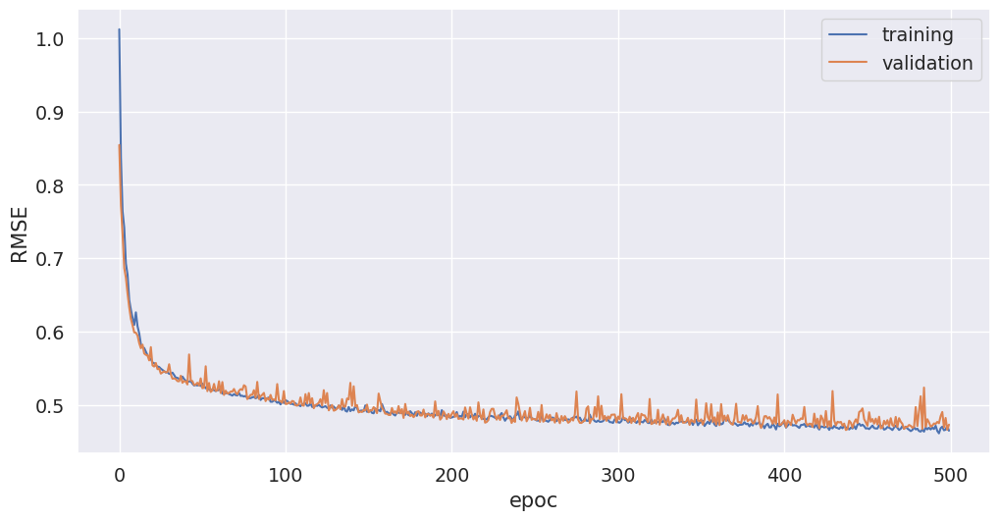

In [65]:
loss = np.sqrt(history.history["loss"])
val_loss = np.sqrt(history.history["val_loss"])
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("RMSE")
plt.xlabel("epoc")
plt.plot(loss, label="training")
plt.plot(val_loss, label="validation")
plt.legend()

Vemos que el poder de generalización de esta red es mucho mejor que la anterior (los errores de validation y training no están tan separados y no perdí precisión o accuracy)

## Clasificación

Primero un ejemplo de clasificación binaria y después uno de clasificación con n clases

In [66]:
header = [
    "pelvic incidence",
    "pelvic tilt",
    "lumbar lordosis angle",
    "sacral slope",
    "pelvic radius",
    "grade of spondylolisthesis",
    "class",
]

In [67]:
header

['pelvic incidence',
 'pelvic tilt',
 'lumbar lordosis angle',
 'sacral slope',
 'pelvic radius',
 'grade of spondylolisthesis',
 'class']

In [68]:
data = pd.read_csv(
    "https://drive.google.com/uc?export=download&id=1T9VNcGMatXFrg7JpIkwHpqHrb8dGKvtP",
    names=header,
    index_col=False,
)
data.head()

,pelvic incidence,pelvic tilt,lumbar lordosis angle,sacral slope,pelvic radius,grade of spondylolisthesis,class
0,63.03,22.55,39.61,40.48,98.67,-0.25,AB
1,39.06,10.06,25.02,29.00,114.41,4.56,AB
2,68.83,22.22,50.09,46.61,105.99,-3.53,AB
3,69.30,24.65,44.31,44.64,101.87,11.21,AB
4,49.71,9.65,28.32,40.06,108.17,7.92,AB


/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


array([[<AxesSubplot:title={'center':'pelvic incidence'}>,
        <AxesSubplot:title={'center':'pelvic tilt'}>],
       [<AxesSubplot:title={'center':'lumbar lordosis angle'}>,
        <AxesSubplot:title={'center':'sacral slope'}>],
       [<AxesSubplot:title={'center':'pelvic radius'}>,
        <AxesSubplot:title={'center':'grade of spondylolisthesis'}>]],
      dtype=object)

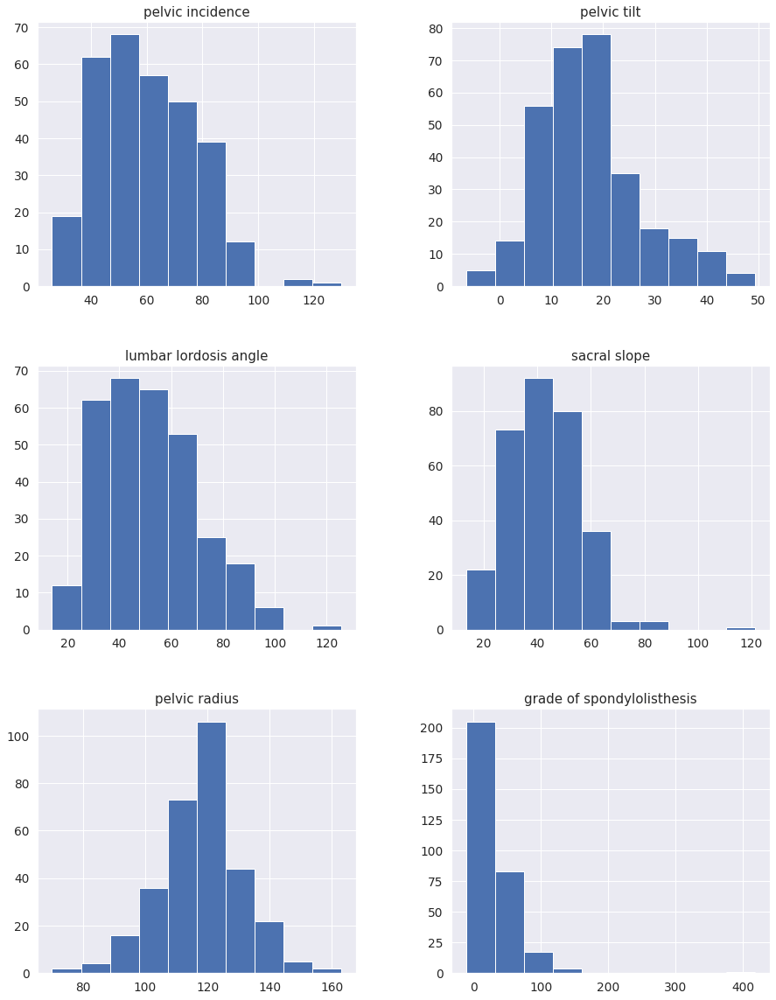

In [69]:
fig = plt.figure(figsize=(15, 20))
ax = fig.gca()

data.hist(ax=ax)

Los datasets no están tan mal distribuídos así que elijo no normalizarlos

Paso los valores de "AB" y "NO" a valores categóricos

In [70]:
label_encoder = preprocessing.LabelEncoder()

In [71]:
target = np.unique(data["class"])

In [72]:
label_encoder.fit(target)

LabelEncoder()

In [73]:
data["class"] = label_encoder.transform(data["class"])

In [74]:
data.head()

,pelvic incidence,pelvic tilt,lumbar lordosis angle,sacral slope,pelvic radius,grade of spondylolisthesis,class
0,63.03,22.55,39.61,40.48,98.67,-0.25,0
1,39.06,10.06,25.02,29.00,114.41,4.56,0
2,68.83,22.22,50.09,46.61,105.99,-3.53,0
3,69.30,24.65,44.31,44.64,101.87,11.21,0
4,49.71,9.65,28.32,40.06,108.17,7.92,0


In [75]:
x_columns = [
    "pelvic incidence",
    "pelvic tilt",
    "lumbar lordosis angle",
    "sacral slope",
    "pelvic radius",
    "grade of spondylolisthesis",
]
x_data = data[x_columns]
y_data = data['class']

In [76]:
x_data.head()

,pelvic incidence,pelvic tilt,lumbar lordosis angle,sacral slope,pelvic radius,grade of spondylolisthesis
0,63.03,22.55,39.61,40.48,98.67,-0.25
1,39.06,10.06,25.02,29.00,114.41,4.56
2,68.83,22.22,50.09,46.61,105.99,-3.53
3,69.30,24.65,44.31,44.64,101.87,11.21
4,49.71,9.65,28.32,40.06,108.17,7.92


Separo los datos en train y validation

In [77]:
from sklearn.model_selection import train_test_split

X_train, X_validation, y_train, y_validation = train_test_split(
    x_data, y_data, test_size=0.4, random_state=66
)

Entreno un modelo sencillo de clasificación, un árbol de decisión para tener una referencia de error.

In [78]:
from sklearn.tree import DecisionTreeClassifier

In [79]:
model_tree = DecisionTreeClassifier(criterion="entropy")

In [80]:
model_tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy')

Calculo el accuracy de mi árbol entrenado:

In [81]:
from sklearn.metrics import accuracy_score

In [82]:
pred = model_tree.predict(X_validation)

In [83]:
decision_tree_acc = accuracy_score(pred, y_validation)
decision_tree_acc

0.7903225806451613

Mi red tiene que tener como cantidad de neuronas en la capa de salida la cantidad de clases si uso softmax o 1 neurona para el caso que use una activación de tipo sigmoide

In [84]:
num_classes = 2

In [85]:
model = Sequential()
model.add(Dense(8, input_shape=(6,), activation='tanh'))
model.add(Dense(num_classes, activation="softmax"))

In [86]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model.summary()

Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_26 (Dense)             (None, 8)                 56        
_________________________________________________________________
dense_27 (Dense)             (None, 2)                 18        
Total params: 74
Trainable params: 74
Non-trainable params: 0
_________________________________________________________________


El modelo necesita los labels en one hot encoding, uso la función to_categorical para transformarlos

In [87]:
y_train[1:10]

235    1
66     0
143    0
256    1
18     0
279    1
273    1
120    0
154    0
Name: class, dtype: int64

In [88]:
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_validation, num_classes)

In [89]:
y_train[1:10]

array([[0., 1.],
       [1., 0.],
       [1., 0.],
       [0., 1.],
       [1., 0.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.]], dtype=float32)

Ahora si puedo entrenar!

In [90]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7688 - accuracy: 0.6875

186/186 [==============================] - 0s 545us/step - loss: 0.7131 - accuracy: 0.7043 - val_loss: 0.7766 - val_accuracy: 0.6371


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6876 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.6983 - accuracy: 0.7043 - val_loss: 0.7547 - val_accuracy: 0.6371


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6035 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.6814 - accuracy: 0.7043 - val_loss: 0.7434 - val_accuracy: 0.6371


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5784 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.6718 - accuracy: 0.7043 - val_loss: 0.7370 - val_accuracy: 0.6371


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7463 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.6632 - accuracy: 0.7043 - val_loss: 0.7296 - val_accuracy: 0.6371


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6388 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.6508 - accuracy: 0.7043 - val_loss: 0.7208 - val_accuracy: 0.6371


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6240 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.6382 - accuracy: 0.7043 - val_loss: 0.7154 - val_accuracy: 0.6371


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5246 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.6299 - accuracy: 0.7043 - val_loss: 0.7043 - val_accuracy: 0.6371


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5474 - accuracy: 0.6562

186/186 [==============================] - 0s 75us/step - loss: 0.6231 - accuracy: 0.7043 - val_loss: 0.6900 - val_accuracy: 0.6371


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6239 - accuracy: 0.7188

186/186 [==============================] - 0s 57us/step - loss: 0.6181 - accuracy: 0.7043 - val_loss: 0.6809 - val_accuracy: 0.6371


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7092 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.6120 - accuracy: 0.7043 - val_loss: 0.6734 - val_accuracy: 0.6371


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6822 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.6005 - accuracy: 0.7043 - val_loss: 0.6713 - val_accuracy: 0.6371


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6454 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.5894 - accuracy: 0.7043 - val_loss: 0.6627 - val_accuracy: 0.6371


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5770 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 0.5803 - accuracy: 0.7043 - val_loss: 0.6560 - val_accuracy: 0.6371


Epoch 15/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6684 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.5758 - accuracy: 0.7043 - val_loss: 0.6474 - val_accuracy: 0.6371


Epoch 16/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5268 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.5683 - accuracy: 0.7043 - val_loss: 0.6395 - val_accuracy: 0.6371


Epoch 17/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5550 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.5629 - accuracy: 0.7043 - val_loss: 0.6362 - val_accuracy: 0.6371


Epoch 18/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5104 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.5575 - accuracy: 0.7043 - val_loss: 0.6306 - val_accuracy: 0.6371


Epoch 19/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5706 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.5531 - accuracy: 0.7043 - val_loss: 0.6236 - val_accuracy: 0.6371


Epoch 20/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3911 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.5457 - accuracy: 0.7043 - val_loss: 0.6193 - val_accuracy: 0.6371


Epoch 21/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4982 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.5371 - accuracy: 0.7043 - val_loss: 0.6121 - val_accuracy: 0.6371


Epoch 22/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4980 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.5314 - accuracy: 0.7043 - val_loss: 0.6049 - val_accuracy: 0.6371


Epoch 23/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5605 - accuracy: 0.5938

186/186 [==============================] - 0s 64us/step - loss: 0.5269 - accuracy: 0.7043 - val_loss: 0.5990 - val_accuracy: 0.6371


Epoch 24/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6192 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.5215 - accuracy: 0.7043 - val_loss: 0.5921 - val_accuracy: 0.6371


Epoch 25/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6557 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.5156 - accuracy: 0.7796 - val_loss: 0.5879 - val_accuracy: 0.6774


Epoch 26/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6037 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.5107 - accuracy: 0.7258 - val_loss: 0.5825 - val_accuracy: 0.6935


Epoch 27/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5505 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.5063 - accuracy: 0.7204 - val_loss: 0.5769 - val_accuracy: 0.7016


Epoch 28/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6257 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.5019 - accuracy: 0.7312 - val_loss: 0.5741 - val_accuracy: 0.6935


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4512 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.4970 - accuracy: 0.7258 - val_loss: 0.5700 - val_accuracy: 0.7016


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5205 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.4938 - accuracy: 0.7312 - val_loss: 0.5654 - val_accuracy: 0.7097


Epoch 31/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4650 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.4890 - accuracy: 0.7366 - val_loss: 0.5621 - val_accuracy: 0.7016


Epoch 32/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3966 - accuracy: 0.8438



186/186 [==============================] - 0s 66us/step - loss: 0.4855 - accuracy: 0.7527 - val_loss: 0.5610 - val_accuracy: 0.6855


Epoch 33/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4827 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.4821 - accuracy: 0.7419 - val_loss: 0.5589 - val_accuracy: 0.6855


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4003 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.4791 - accuracy: 0.7419 - val_loss: 0.5533 - val_accuracy: 0.6855


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5374 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4750 - accuracy: 0.7527 - val_loss: 0.5495 - val_accuracy: 0.6774


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4609 - accuracy: 0.7188

186/186 [==============================] - 0s 88us/step - loss: 0.4715 - accuracy: 0.7527 - val_loss: 0.5468 - val_accuracy: 0.6855


Epoch 37/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4655 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.4685 - accuracy: 0.7473 - val_loss: 0.5444 - val_accuracy: 0.6855


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5559 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.4659 - accuracy: 0.7473 - val_loss: 0.5387 - val_accuracy: 0.6935


Epoch 39/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4749 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.4622 - accuracy: 0.7527 - val_loss: 0.5369 - val_accuracy: 0.6935


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4529 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.4598 - accuracy: 0.7473 - val_loss: 0.5355 - val_accuracy: 0.6935


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4428 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.4567 - accuracy: 0.7473 - val_loss: 0.5331 - val_accuracy: 0.6855


Epoch 42/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4782 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.4540 - accuracy: 0.7473 - val_loss: 0.5315 - val_accuracy: 0.6935


Epoch 43/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4689 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.4518 - accuracy: 0.7473 - val_loss: 0.5283 - val_accuracy: 0.6855


Epoch 44/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3593 - accuracy: 0.8750

186/186 [==============================] - 0s 58us/step - loss: 0.4496 - accuracy: 0.7527 - val_loss: 0.5266 - val_accuracy: 0.6855


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5291 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.4467 - accuracy: 0.7527 - val_loss: 0.5248 - val_accuracy: 0.6855


Epoch 46/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4294 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.4452 - accuracy: 0.7527 - val_loss: 0.5227 - val_accuracy: 0.6855


Epoch 47/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3446 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.4428 - accuracy: 0.7527 - val_loss: 0.5210 - val_accuracy: 0.6774


Epoch 48/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4487 - accuracy: 0.6562

186/186 [==============================] - 0s 59us/step - loss: 0.4406 - accuracy: 0.7527 - val_loss: 0.5188 - val_accuracy: 0.6774


Epoch 49/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4411 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.4389 - accuracy: 0.7527 - val_loss: 0.5169 - val_accuracy: 0.6774


Epoch 50/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4381 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.4367 - accuracy: 0.7527 - val_loss: 0.5157 - val_accuracy: 0.6774


Epoch 51/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4078 - accuracy: 0.7500

186/186 [==============================] - 0s 58us/step - loss: 0.4351 - accuracy: 0.7527 - val_loss: 0.5146 - val_accuracy: 0.6774


Epoch 52/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4430 - accuracy: 0.7812

186/186 [==============================] - 0s 56us/step - loss: 0.4335 - accuracy: 0.7527 - val_loss: 0.5132 - val_accuracy: 0.6774


Epoch 53/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5138 - accuracy: 0.6562

186/186 [==============================] - 0s 59us/step - loss: 0.4318 - accuracy: 0.7527 - val_loss: 0.5120 - val_accuracy: 0.6774


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4913 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.4304 - accuracy: 0.7527 - val_loss: 0.5107 - val_accuracy: 0.6774


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3976 - accuracy: 0.7812

186/186 [==============================] - 0s 58us/step - loss: 0.4287 - accuracy: 0.7527 - val_loss: 0.5098 - val_accuracy: 0.6774


Epoch 56/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4004 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.4274 - accuracy: 0.7581 - val_loss: 0.5089 - val_accuracy: 0.6774


Epoch 57/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3986 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.4265 - accuracy: 0.7581 - val_loss: 0.5064 - val_accuracy: 0.6855


Epoch 58/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4557 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.4246 - accuracy: 0.7581 - val_loss: 0.5045 - val_accuracy: 0.6855


Epoch 59/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4316 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.4217 - accuracy: 0.7527 - val_loss: 0.5014 - val_accuracy: 0.6855


Epoch 60/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4152 - accuracy: 0.7812

186/186 [==============================] - 0s 56us/step - loss: 0.4178 - accuracy: 0.7581 - val_loss: 0.4982 - val_accuracy: 0.6935


Epoch 61/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4706 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.4164 - accuracy: 0.7581 - val_loss: 0.4959 - val_accuracy: 0.7016


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3475 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.4145 - accuracy: 0.7581 - val_loss: 0.4953 - val_accuracy: 0.7016


Epoch 63/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3890 - accuracy: 0.7500

186/186 [==============================] - 0s 58us/step - loss: 0.4130 - accuracy: 0.7634 - val_loss: 0.4963 - val_accuracy: 0.6935


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4680 - accuracy: 0.7188

186/186 [==============================] - 0s 56us/step - loss: 0.4110 - accuracy: 0.7634 - val_loss: 0.4973 - val_accuracy: 0.6855


Epoch 65/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3566 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.4098 - accuracy: 0.7634 - val_loss: 0.4975 - val_accuracy: 0.6855


Epoch 66/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3929 - accuracy: 0.7812

186/186 [==============================] - 0s 56us/step - loss: 0.4077 - accuracy: 0.7634 - val_loss: 0.4956 - val_accuracy: 0.6855


Epoch 67/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.4062 - accuracy: 0.7634 - val_loss: 0.4931 - val_accuracy: 0.6935


Epoch 68/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5167 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 0.4053 - accuracy: 0.7634 - val_loss: 0.4915 - val_accuracy: 0.6935


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3631 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.4041 - accuracy: 0.7688 - val_loss: 0.4937 - val_accuracy: 0.6935


Epoch 70/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4474 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4023 - accuracy: 0.7688 - val_loss: 0.4934 - val_accuracy: 0.6935


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3890 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.4013 - accuracy: 0.7688 - val_loss: 0.4921 - val_accuracy: 0.6935


Epoch 72/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3759 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.4000 - accuracy: 0.7688 - val_loss: 0.4902 - val_accuracy: 0.7016


Epoch 73/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3195 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3987 - accuracy: 0.7688 - val_loss: 0.4898 - val_accuracy: 0.7016


Epoch 74/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3520 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.3977 - accuracy: 0.7688 - val_loss: 0.4897 - val_accuracy: 0.7016


Epoch 75/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3654 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3962 - accuracy: 0.7688 - val_loss: 0.4883 - val_accuracy: 0.7016


Epoch 76/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3511 - accuracy: 0.8125

186/186 [==============================] - 0s 58us/step - loss: 0.3943 - accuracy: 0.7688 - val_loss: 0.4891 - val_accuracy: 0.7016


Epoch 77/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5618 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3927 - accuracy: 0.7742 - val_loss: 0.4889 - val_accuracy: 0.7016


Epoch 78/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3533 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3918 - accuracy: 0.7742 - val_loss: 0.4882 - val_accuracy: 0.7016


Epoch 79/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4227 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3911 - accuracy: 0.7742 - val_loss: 0.4860 - val_accuracy: 0.7016


Epoch 80/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4864 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3902 - accuracy: 0.7742 - val_loss: 0.4854 - val_accuracy: 0.7177


Epoch 81/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4175 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.3894 - accuracy: 0.7742 - val_loss: 0.4853 - val_accuracy: 0.7177


Epoch 82/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2895 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3885 - accuracy: 0.7742 - val_loss: 0.4851 - val_accuracy: 0.7177


Epoch 83/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4640 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3880 - accuracy: 0.7742 - val_loss: 0.4853 - val_accuracy: 0.7097


Epoch 84/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2821 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3870 - accuracy: 0.7688 - val_loss: 0.4851 - val_accuracy: 0.7177


Epoch 85/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3964 - accuracy: 0.7812



186/186 [==============================] - 0s 93us/step - loss: 0.3863 - accuracy: 0.7634 - val_loss: 0.4852 - val_accuracy: 0.7016


Epoch 86/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.3611 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3857 - accuracy: 0.7581 - val_loss: 0.4836 - val_accuracy: 0.7016


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3633 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3851 - accuracy: 0.7634 - val_loss: 0.4825 - val_accuracy: 0.7097


Epoch 88/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3300 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3842 - accuracy: 0.7688 - val_loss: 0.4824 - val_accuracy: 0.7097


Epoch 89/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3895 - accuracy: 0.8438



186/186 [==============================] - 0s 61us/step - loss: 0.3835 - accuracy: 0.8118 - val_loss: 0.4824 - val_accuracy: 0.7097


Epoch 90/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3364 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3828 - accuracy: 0.8118 - val_loss: 0.4826 - val_accuracy: 0.7097


Epoch 91/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3413 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3822 - accuracy: 0.8172 - val_loss: 0.4826 - val_accuracy: 0.7097


Epoch 92/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3686 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3816 - accuracy: 0.8172 - val_loss: 0.4816 - val_accuracy: 0.7097


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5053 - accuracy: 0.7500



186/186 [==============================] - 0s 60us/step - loss: 0.3812 - accuracy: 0.8172 - val_loss: 0.4817 - val_accuracy: 0.7097


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.2549 - accuracy: 0.8750

186/186 [==============================] - 0s 59us/step - loss: 0.3808 - accuracy: 0.8172 - val_loss: 0.4819 - val_accuracy: 0.7097


Epoch 95/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4244 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3801 - accuracy: 0.8172 - val_loss: 0.4821 - val_accuracy: 0.7097


Epoch 96/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4288 - accuracy: 0.7812

186/186 [==============================] - 0s 56us/step - loss: 0.3797 - accuracy: 0.8172 - val_loss: 0.4819 - val_accuracy: 0.7097


Epoch 97/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5574 - accuracy: 0.7188

186/186 [==============================] - 0s 59us/step - loss: 0.3792 - accuracy: 0.8172 - val_loss: 0.4807 - val_accuracy: 0.7097


Epoch 98/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4622 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3788 - accuracy: 0.8172 - val_loss: 0.4806 - val_accuracy: 0.7097


Epoch 99/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3095 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3784 - accuracy: 0.8172 - val_loss: 0.4810 - val_accuracy: 0.7097


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5928 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3779 - accuracy: 0.8172 - val_loss: 0.4808 - val_accuracy: 0.7097


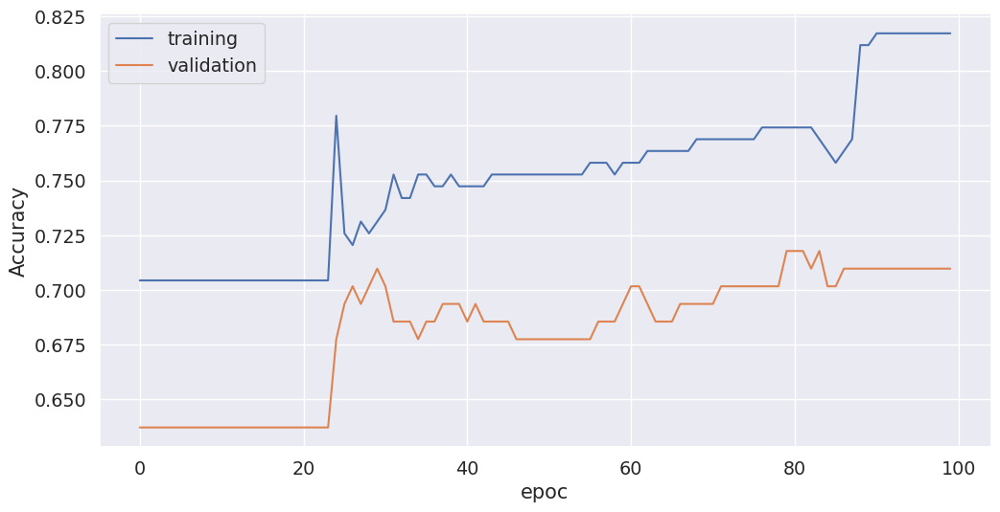

In [91]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

A medida que las red se va haciendo más profunda conviene usar relu. Agrego relu + regularizacion y cambio optimizador

In [92]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(8, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(4, activation='relu'))
model.add(Dense(num_classes, activation="softmax"))

In [93]:
model.compile(
    loss='categorical_crossentropy', optimizer='adadelta', metrics=['accuracy']
)
model.summary()

Model: "sequential_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_28 (Dense)             (None, 16)                112       
_________________________________________________________________
dropout_3 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_29 (Dense)             (None, 8)                 136       
_________________________________________________________________
dropout_4 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_30 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_31 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_______________________________________________________

In [94]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 7.7133 - accuracy: 0.5000

186/186 [==============================] - 0s 1ms/step - loss: 7.4150 - accuracy: 0.5161 - val_loss: 3.4598 - val_accuracy: 0.3387


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 5.2458 - accuracy: 0.5938

186/186 [==============================] - 0s 76us/step - loss: 4.9019 - accuracy: 0.5430 - val_loss: 1.9760 - val_accuracy: 0.3468


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.6188 - accuracy: 0.5000

186/186 [==============================] - 0s 79us/step - loss: 3.8974 - accuracy: 0.5591 - val_loss: 1.1633 - val_accuracy: 0.3710


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.4670 - accuracy: 0.3750

186/186 [==============================] - 0s 89us/step - loss: 3.7641 - accuracy: 0.5161 - val_loss: 0.8329 - val_accuracy: 0.5161


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.4718 - accuracy: 0.5625

186/186 [==============================] - 0s 76us/step - loss: 2.8439 - accuracy: 0.5914 - val_loss: 0.7162 - val_accuracy: 0.5887


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.7890 - accuracy: 0.6875

186/186 [==============================] - 0s 80us/step - loss: 2.6107 - accuracy: 0.6022 - val_loss: 0.6852 - val_accuracy: 0.6290


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.2519 - accuracy: 0.5312

186/186 [==============================] - 0s 76us/step - loss: 2.2217 - accuracy: 0.6344 - val_loss: 0.6831 - val_accuracy: 0.6371


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 4.2455 - accuracy: 0.5000

186/186 [==============================] - 0s 74us/step - loss: 2.3092 - accuracy: 0.5753 - val_loss: 0.6821 - val_accuracy: 0.6371


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9490 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 1.9897 - accuracy: 0.6022 - val_loss: 0.6813 - val_accuracy: 0.6371


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.1102 - accuracy: 0.5938

186/186 [==============================] - 0s 77us/step - loss: 1.9535 - accuracy: 0.5968 - val_loss: 0.6804 - val_accuracy: 0.6371


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4034 - accuracy: 0.7500

186/186 [==============================] - 0s 84us/step - loss: 1.3317 - accuracy: 0.6774 - val_loss: 0.6798 - val_accuracy: 0.6371


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.6397 - accuracy: 0.6875

186/186 [==============================] - 0s 79us/step - loss: 1.7788 - accuracy: 0.6344 - val_loss: 0.6790 - val_accuracy: 0.6371


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.9384 - accuracy: 0.6250

186/186 [==============================] - 0s 84us/step - loss: 1.4326 - accuracy: 0.6075 - val_loss: 0.6780 - val_accuracy: 0.6371


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4990 - accuracy: 0.6562

186/186 [==============================] - 0s 80us/step - loss: 1.4772 - accuracy: 0.6882 - val_loss: 0.6774 - val_accuracy: 0.6371


Epoch 15/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1731 - accuracy: 0.6250

186/186 [==============================] - 0s 82us/step - loss: 1.1243 - accuracy: 0.6828 - val_loss: 0.6768 - val_accuracy: 0.6371


Epoch 16/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9538 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 1.2538 - accuracy: 0.6559 - val_loss: 0.6761 - val_accuracy: 0.6371


Epoch 17/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.1494 - accuracy: 0.6875

186/186 [==============================] - 0s 81us/step - loss: 1.2436 - accuracy: 0.6828 - val_loss: 0.6755 - val_accuracy: 0.6371


Epoch 18/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2943 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 1.2891 - accuracy: 0.6935 - val_loss: 0.6748 - val_accuracy: 0.6371


Epoch 19/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0783 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 1.1458 - accuracy: 0.6667 - val_loss: 0.6742 - val_accuracy: 0.6371


Epoch 20/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.9486 - accuracy: 0.7500

186/186 [==============================] - 0s 86us/step - loss: 1.1305 - accuracy: 0.6720 - val_loss: 0.6736 - val_accuracy: 0.6371


Epoch 21/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2489 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.9717 - accuracy: 0.6774 - val_loss: 0.6730 - val_accuracy: 0.6371


Epoch 22/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.9235 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 1.1947 - accuracy: 0.6882 - val_loss: 0.6725 - val_accuracy: 0.6371


Epoch 23/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.3779 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 1.3658 - accuracy: 0.6398 - val_loss: 0.6717 - val_accuracy: 0.6371


Epoch 24/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.3953 - accuracy: 0.6562

186/186 [==============================] - 0s 79us/step - loss: 1.0347 - accuracy: 0.6667 - val_loss: 0.6711 - val_accuracy: 0.6371


Epoch 25/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8238 - accuracy: 0.5625

186/186 [==============================] - 0s 82us/step - loss: 0.8201 - accuracy: 0.6667 - val_loss: 0.6705 - val_accuracy: 0.6371


Epoch 26/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7578 - accuracy: 0.5938

186/186 [==============================] - 0s 82us/step - loss: 0.9217 - accuracy: 0.6882 - val_loss: 0.6699 - val_accuracy: 0.6371


Epoch 27/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7963 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 1.0433 - accuracy: 0.7151 - val_loss: 0.6693 - val_accuracy: 0.6371


Epoch 28/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7341 - accuracy: 0.7188

186/186 [==============================] - 0s 83us/step - loss: 0.9968 - accuracy: 0.7043 - val_loss: 0.6688 - val_accuracy: 0.6371


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7105 - accuracy: 0.6562

186/186 [==============================] - 0s 86us/step - loss: 0.8063 - accuracy: 0.7097 - val_loss: 0.6684 - val_accuracy: 0.6371


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8709 - accuracy: 0.6562

186/186 [==============================] - 0s 82us/step - loss: 0.8669 - accuracy: 0.6774 - val_loss: 0.6678 - val_accuracy: 0.6371


Epoch 31/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8475 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.8584 - accuracy: 0.6882 - val_loss: 0.6674 - val_accuracy: 0.6371


Epoch 32/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6525 - accuracy: 0.7188

186/186 [==============================] - 0s 79us/step - loss: 0.7401 - accuracy: 0.6774 - val_loss: 0.6669 - val_accuracy: 0.6371


Epoch 33/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.5155 - accuracy: 0.7500

186/186 [==============================] - 0s 96us/step - loss: 0.9272 - accuracy: 0.7258 - val_loss: 0.6664 - val_accuracy: 0.6371


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8537 - accuracy: 0.7812

186/186 [==============================] - 0s 83us/step - loss: 0.8276 - accuracy: 0.6828 - val_loss: 0.6660 - val_accuracy: 0.6371


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7311 - accuracy: 0.6875

186/186 [==============================] - 0s 78us/step - loss: 0.9084 - accuracy: 0.6989 - val_loss: 0.6655 - val_accuracy: 0.6371


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5815 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.8081 - accuracy: 0.6989 - val_loss: 0.6651 - val_accuracy: 0.6371


Epoch 37/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7696 - accuracy: 0.6562

186/186 [==============================] - 0s 82us/step - loss: 0.8409 - accuracy: 0.6935 - val_loss: 0.6647 - val_accuracy: 0.6371


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5600 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.9091 - accuracy: 0.6935 - val_loss: 0.6642 - val_accuracy: 0.6371


Epoch 39/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7699 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.7098 - accuracy: 0.7097 - val_loss: 0.6637 - val_accuracy: 0.6371


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8176 - accuracy: 0.5312

186/186 [==============================] - 0s 82us/step - loss: 0.7673 - accuracy: 0.6882 - val_loss: 0.6633 - val_accuracy: 0.6371


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7385 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.6608 - accuracy: 0.7043 - val_loss: 0.6627 - val_accuracy: 0.6371


Epoch 42/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8244 - accuracy: 0.5625

186/186 [==============================] - 0s 74us/step - loss: 0.7717 - accuracy: 0.6989 - val_loss: 0.6622 - val_accuracy: 0.6371


Epoch 43/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7673 - accuracy: 0.6875

186/186 [==============================] - 0s 83us/step - loss: 0.7167 - accuracy: 0.7043 - val_loss: 0.6619 - val_accuracy: 0.6371


Epoch 44/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6568 - accuracy: 0.6875

186/186 [==============================] - 0s 80us/step - loss: 0.7363 - accuracy: 0.6828 - val_loss: 0.6615 - val_accuracy: 0.6371


Epoch 45/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.8707 - accuracy: 0.7812

186/186 [==============================] - 0s 85us/step - loss: 0.7572 - accuracy: 0.6935 - val_loss: 0.6610 - val_accuracy: 0.6371


Epoch 46/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.2280 - accuracy: 0.6250

186/186 [==============================] - 0s 78us/step - loss: 0.7985 - accuracy: 0.6935 - val_loss: 0.6608 - val_accuracy: 0.6371


Epoch 47/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7307 - accuracy: 0.5938

186/186 [==============================] - 0s 79us/step - loss: 0.7151 - accuracy: 0.7043 - val_loss: 0.6603 - val_accuracy: 0.6371


Epoch 48/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7716 - accuracy: 0.6875

186/186 [==============================] - 0s 81us/step - loss: 0.7294 - accuracy: 0.6613 - val_loss: 0.6599 - val_accuracy: 0.6371


Epoch 49/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.8995 - accuracy: 0.6562



186/186 [==============================] - 0s 83us/step - loss: 0.7540 - accuracy: 0.6882 - val_loss: 0.6596 - val_accuracy: 0.6371


Epoch 50/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5198 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.7102 - accuracy: 0.7043 - val_loss: 0.6593 - val_accuracy: 0.6371


Epoch 51/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8863 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.6927 - accuracy: 0.7097 - val_loss: 0.6589 - val_accuracy: 0.6371


Epoch 52/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6365 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.7159 - accuracy: 0.6720 - val_loss: 0.6587 - val_accuracy: 0.6371


Epoch 53/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5898 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.7223 - accuracy: 0.7043 - val_loss: 0.6584 - val_accuracy: 0.6371


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8240 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.6429 - accuracy: 0.6989 - val_loss: 0.6581 - val_accuracy: 0.6371


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5239 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.6091 - accuracy: 0.7204 - val_loss: 0.6579 - val_accuracy: 0.6371


Epoch 56/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7247 - accuracy: 0.6875

186/186 [==============================] - 0s 80us/step - loss: 0.6815 - accuracy: 0.6989 - val_loss: 0.6576 - val_accuracy: 0.6371


Epoch 57/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5668 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.6282 - accuracy: 0.6882 - val_loss: 0.6574 - val_accuracy: 0.6371


Epoch 58/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6751 - accuracy: 0.6562

186/186 [==============================] - 0s 81us/step - loss: 0.6509 - accuracy: 0.7151 - val_loss: 0.6572 - val_accuracy: 0.6371


Epoch 59/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6812 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.7821 - accuracy: 0.6882 - val_loss: 0.6570 - val_accuracy: 0.6371


Epoch 60/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8093 - accuracy: 0.6250

186/186 [==============================] - 0s 73us/step - loss: 0.6664 - accuracy: 0.6989 - val_loss: 0.6568 - val_accuracy: 0.6371


Epoch 61/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6287 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.6478 - accuracy: 0.6989 - val_loss: 0.6566 - val_accuracy: 0.6371


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4829 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.6355 - accuracy: 0.6989 - val_loss: 0.6565 - val_accuracy: 0.6371


Epoch 63/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6085 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.6291 - accuracy: 0.7151 - val_loss: 0.6563 - val_accuracy: 0.6371


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5039 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.6057 - accuracy: 0.7151 - val_loss: 0.6562 - val_accuracy: 0.6371


Epoch 65/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6670 - accuracy: 0.7500

186/186 [==============================] - 0s 84us/step - loss: 0.6042 - accuracy: 0.7312 - val_loss: 0.6561 - val_accuracy: 0.6371


Epoch 66/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6138 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.6630 - accuracy: 0.6935 - val_loss: 0.6559 - val_accuracy: 0.6371


Epoch 67/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6012 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.6393 - accuracy: 0.6989 - val_loss: 0.6558 - val_accuracy: 0.6371


Epoch 68/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7038 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.6523 - accuracy: 0.7043 - val_loss: 0.6557 - val_accuracy: 0.6371


Epoch 69/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5816 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.6256 - accuracy: 0.6989 - val_loss: 0.6556 - val_accuracy: 0.6371


Epoch 70/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5367 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.6513 - accuracy: 0.6882 - val_loss: 0.6555 - val_accuracy: 0.6371


Epoch 71/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5759 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.6032 - accuracy: 0.7097 - val_loss: 0.6554 - val_accuracy: 0.6371


Epoch 72/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6157 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.6142 - accuracy: 0.7097 - val_loss: 0.6554 - val_accuracy: 0.6371


Epoch 73/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7838 - accuracy: 0.5625

186/186 [==============================] - 0s 69us/step - loss: 0.6596 - accuracy: 0.7043 - val_loss: 0.6553 - val_accuracy: 0.6371


Epoch 74/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5467 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.6368 - accuracy: 0.7151 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 75/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6181 - accuracy: 0.6250

186/186 [==============================] - 0s 72us/step - loss: 0.6563 - accuracy: 0.6774 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 76/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6168 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.6477 - accuracy: 0.7097 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 77/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5995 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.6022 - accuracy: 0.7312 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 78/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5888 - accuracy: 0.6875



186/186 [==============================] - 0s 85us/step - loss: 0.6547 - accuracy: 0.6989 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 79/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7592 - accuracy: 0.6250

186/186 [==============================] - 0s 127us/step - loss: 0.6346 - accuracy: 0.6882 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 80/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6216 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.5735 - accuracy: 0.7527 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 81/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5894 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.6440 - accuracy: 0.7043 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 82/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6294 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.6247 - accuracy: 0.6989 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 83/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6829 - accuracy: 0.5938

186/186 [==============================] - 0s 82us/step - loss: 0.6257 - accuracy: 0.7151 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 84/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5542 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.6028 - accuracy: 0.7204 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 85/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6339 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.6398 - accuracy: 0.6774 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 86/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6459 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.6030 - accuracy: 0.7204 - val_loss: 0.6553 - val_accuracy: 0.6371


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5997 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.6210 - accuracy: 0.7151 - val_loss: 0.6554 - val_accuracy: 0.6371


Epoch 88/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4974 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.6130 - accuracy: 0.7097 - val_loss: 0.6554 - val_accuracy: 0.6371


Epoch 89/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5620 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.6034 - accuracy: 0.7151 - val_loss: 0.6555 - val_accuracy: 0.6371


Epoch 90/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6917 - accuracy: 0.6250

186/186 [==============================] - 0s 73us/step - loss: 0.6598 - accuracy: 0.6882 - val_loss: 0.6556 - val_accuracy: 0.6371


Epoch 91/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7050 - accuracy: 0.5938

186/186 [==============================] - 0s 74us/step - loss: 0.6058 - accuracy: 0.7366 - val_loss: 0.6557 - val_accuracy: 0.6371


Epoch 92/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5702 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.6083 - accuracy: 0.6989 - val_loss: 0.6558 - val_accuracy: 0.6371


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5674 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.6064 - accuracy: 0.7043 - val_loss: 0.6559 - val_accuracy: 0.6371


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5205 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.6015 - accuracy: 0.7151 - val_loss: 0.6560 - val_accuracy: 0.6371


Epoch 95/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5829 - accuracy: 0.7500



186/186 [==============================] - 0s 90us/step - loss: 0.6077 - accuracy: 0.7043 - val_loss: 0.6561 - val_accuracy: 0.6371


Epoch 96/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5719 - accuracy: 0.7812

186/186 [==============================] - 0s 101us/step - loss: 0.6009 - accuracy: 0.7151 - val_loss: 0.6563 - val_accuracy: 0.6371


Epoch 97/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6188 - accuracy: 0.7188

186/186 [==============================] - 0s 94us/step - loss: 0.6208 - accuracy: 0.6882 - val_loss: 0.6563 - val_accuracy: 0.6371


Epoch 98/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5441 - accuracy: 0.7812

186/186 [==============================]

 - 0s 123us/step - loss: 0.5920 - accuracy: 0.7204 - val_loss: 0.6565 - val_accuracy: 0.6371


Epoch 99/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5302 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.6097 - accuracy: 0.7097 - val_loss: 0.6566 - val_accuracy: 0.6371


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5595 - accuracy: 0.7500



186/186 [==============================] - 0s 73us/step - loss: 0.6040 - accuracy: 0.7097 - val_loss: 0.6568 - val_accuracy: 0.6371


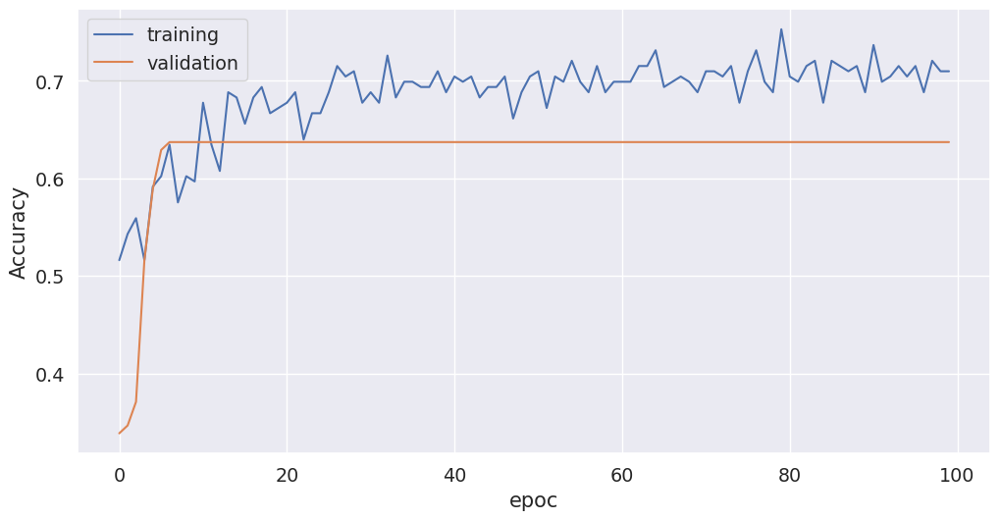

In [95]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Cambio de nuevo el optimizador por RMSprop

In [96]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(8, activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(4, activation='relu'))
model.add(Dense(num_classes, activation="softmax"))

In [97]:
opt = keras.optimizers.RMSprop()
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_32 (Dense)             (None, 16)                112       
_________________________________________________________________
dropout_5 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_33 (Dense)             (None, 8)                 136       
_________________________________________________________________
dropout_6 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_34 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_35 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_______________________________________________________

In [98]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 9.5934 - accuracy: 0.6562

186/186 [==============================] - 0s 1ms/step - loss: 6.4940 - accuracy: 0.6022 - val_loss: 1.7594 - val_accuracy: 0.4032


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 6.9392 - accuracy: 0.5938

186/186 [==============================] - 0s 75us/step - loss: 5.4196 - accuracy: 0.4946 - val_loss: 0.8261 - val_accuracy: 0.4516


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 4.9041 - accuracy: 0.4375

186/186 [==============================] - 0s 75us/step - loss: 4.5764 - accuracy: 0.4516 - val_loss: 0.6544 - val_accuracy: 0.4839


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 4.5803 - accuracy: 0.5312

186/186 [==============================] - 0s 89us/step - loss: 3.7011 - accuracy: 0.4731 - val_loss: 0.6765 - val_accuracy: 0.4194


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.5541 - accuracy: 0.6562

186/186 [==============================] - 0s 75us/step - loss: 2.9268 - accuracy: 0.5108 - val_loss: 0.6764 - val_accuracy: 0.3952


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9880 - accuracy: 0.5625

186/186 [==============================] - 0s 73us/step - loss: 2.6141 - accuracy: 0.4946 - val_loss: 0.6813 - val_accuracy: 0.3952


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.4964 - accuracy: 0.4375

186/186 [==============================] - 0s 78us/step - loss: 2.6401 - accuracy: 0.4731 - val_loss: 0.6968 - val_accuracy: 0.3710


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.6851 - accuracy: 0.3125

186/186 [==============================] - 0s 74us/step - loss: 2.7946 - accuracy: 0.4086 - val_loss: 0.6989 - val_accuracy: 0.3629


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 3.8276 - accuracy: 0.2812

186/186 [==============================] - 0s 70us/step - loss: 1.8781 - accuracy: 0.4301 - val_loss: 0.6979 - val_accuracy: 0.3629


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.5181 - accuracy: 0.3125

186/186 [==============================] - 0s 73us/step - loss: 1.5347 - accuracy: 0.4032 - val_loss: 0.6972 - val_accuracy: 0.3629


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.0499 - accuracy: 0.3750

186/186 [==============================] - 0s 77us/step - loss: 1.8546 - accuracy: 0.4624 - val_loss: 0.6966 - val_accuracy: 0.3629


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4550 - accuracy: 0.4688

186/186 [==============================] - 0s 72us/step - loss: 1.1185 - accuracy: 0.4839 - val_loss: 0.6962 - val_accuracy: 0.3629


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.3808 - accuracy: 0.5312

186/186 [==============================] - 0s 71us/step - loss: 1.3549 - accuracy: 0.4140 - val_loss: 0.6954 - val_accuracy: 0.3629


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0239 - accuracy: 0.4375

186/186 [==============================] - 0s 72us/step - loss: 1.2282 - accuracy: 0.4032 - val_loss: 0.6945 - val_accuracy: 0.3629


Epoch 15/100
 32/186 [====>.........................] - ETA: 0s - loss: 2.0644 - accuracy: 0.3438

186/186 [==============================] - 0s 70us/step - loss: 1.3392 - accuracy: 0.4516 - val_loss: 0.6934 - val_accuracy: 0.3629


Epoch 16/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.1063 - accuracy: 0.4062

186/186 [==============================] - 0s 78us/step - loss: 0.9826 - accuracy: 0.6398 - val_loss: 0.6926 - val_accuracy: 0.6371


Epoch 17/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0808 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.9489 - accuracy: 0.7097 - val_loss: 0.6914 - val_accuracy: 0.6371


Epoch 18/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.6504 - accuracy: 0.5312

186/186 [==============================] - 0s 77us/step - loss: 1.2924 - accuracy: 0.6935 - val_loss: 0.6900 - val_accuracy: 0.6371


Epoch 19/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6138 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 1.1588 - accuracy: 0.6935 - val_loss: 0.6889 - val_accuracy: 0.6371


Epoch 20/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.9482 - accuracy: 0.6562

186/186 [==============================] - 0s 81us/step - loss: 0.9669 - accuracy: 0.6989 - val_loss: 0.6877 - val_accuracy: 0.6371


Epoch 21/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6201 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.9859 - accuracy: 0.6882 - val_loss: 0.6865 - val_accuracy: 0.6371


Epoch 22/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.7764 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 1.0708 - accuracy: 0.6935 - val_loss: 0.6853 - val_accuracy: 0.6371


Epoch 23/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.4019 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.9194 - accuracy: 0.6989 - val_loss: 0.6846 - val_accuracy: 0.6371


Epoch 24/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.0536 - accuracy: 0.5938

186/186 [==============================] - 0s 73us/step - loss: 0.9743 - accuracy: 0.6935 - val_loss: 0.6835 - val_accuracy: 0.6371


Epoch 25/100


 32/186 [====>.........................] - ETA: 0s - loss: 1.8672 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 1.1940 - accuracy: 0.6774 - val_loss: 0.6823 - val_accuracy: 0.6371


Epoch 26/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8746 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 1.0047 - accuracy: 0.6882 - val_loss: 0.6814 - val_accuracy: 0.6371


Epoch 27/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6619 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.9918 - accuracy: 0.6935 - val_loss: 0.6806 - val_accuracy: 0.6371


Epoch 28/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6089 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.6696 - accuracy: 0.7151 - val_loss: 0.6796 - val_accuracy: 0.6371


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8080 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.8817 - accuracy: 0.7097 - val_loss: 0.6788 - val_accuracy: 0.6371


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7156 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.9126 - accuracy: 0.6935 - val_loss: 0.6779 - val_accuracy: 0.6371


Epoch 31/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5326 - accuracy: 0.7500

186/186 [==============================] - 0s 82us/step - loss: 0.7152 - accuracy: 0.7097 - val_loss: 0.6768 - val_accuracy: 0.6371


Epoch 32/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.2402 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.7383 - accuracy: 0.6935 - val_loss: 0.6760 - val_accuracy: 0.6371


Epoch 33/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6362 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.8070 - accuracy: 0.6882 - val_loss: 0.6750 - val_accuracy: 0.6371


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5233 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.6787 - accuracy: 0.7097 - val_loss: 0.6742 - val_accuracy: 0.6371


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7844 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.8190 - accuracy: 0.6882 - val_loss: 0.6733 - val_accuracy: 0.6371


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5778 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.6957 - accuracy: 0.6882 - val_loss: 0.6726 - val_accuracy: 0.6371


Epoch 37/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9199 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.8147 - accuracy: 0.6989 - val_loss: 0.6719 - val_accuracy: 0.6371


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6267 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.6270 - accuracy: 0.7097 - val_loss: 0.6710 - val_accuracy: 0.6371


Epoch 39/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7260 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.6610 - accuracy: 0.7043 - val_loss: 0.6703 - val_accuracy: 0.6371


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9126 - accuracy: 0.5938

186/186 [==============================] - 0s 70us/step - loss: 0.6928 - accuracy: 0.6935 - val_loss: 0.6696 - val_accuracy: 0.6371


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6601 - accuracy: 0.7500

186/186 [==============================] - 0s 78us/step - loss: 0.6312 - accuracy: 0.7043 - val_loss: 0.6688 - val_accuracy: 0.6371


Epoch 42/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6049 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.7022 - accuracy: 0.7043 - val_loss: 0.6682 - val_accuracy: 0.6371


Epoch 43/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8134 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.6899 - accuracy: 0.7097 - val_loss: 0.6676 - val_accuracy: 0.6371


Epoch 44/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6274 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.7053 - accuracy: 0.6935 - val_loss: 0.6669 - val_accuracy: 0.6371


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6797 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.6562 - accuracy: 0.6989 - val_loss: 0.6661 - val_accuracy: 0.6371


Epoch 46/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5872 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.6139 - accuracy: 0.7043 - val_loss: 0.6653 - val_accuracy: 0.6371


Epoch 47/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5587 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.6115 - accuracy: 0.7097 - val_loss: 0.6647 - val_accuracy: 0.6371


Epoch 48/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7542 - accuracy: 0.6250

186/186 [==============================] - 0s 72us/step - loss: 0.7338 - accuracy: 0.6882 - val_loss: 0.6641 - val_accuracy: 0.6371


Epoch 49/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6294 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.6571 - accuracy: 0.6935 - val_loss: 0.6636 - val_accuracy: 0.6371


Epoch 50/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6087 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.6288 - accuracy: 0.6935 - val_loss: 0.6631 - val_accuracy: 0.6371


Epoch 51/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5904 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.6524 - accuracy: 0.7097 - val_loss: 0.6625 - val_accuracy: 0.6371


Epoch 52/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6075 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.6304 - accuracy: 0.6828 - val_loss: 0.6620 - val_accuracy: 0.6371


Epoch 53/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7418 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.6371 - accuracy: 0.7151 - val_loss: 0.6615 - val_accuracy: 0.6371


Epoch 54/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5767 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.6132 - accuracy: 0.6882 - val_loss: 0.6611 - val_accuracy: 0.6371


Epoch 55/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6522 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.6769 - accuracy: 0.7043 - val_loss: 0.6607 - val_accuracy: 0.6371


Epoch 56/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7830 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.6501 - accuracy: 0.6935 - val_loss: 0.6602 - val_accuracy: 0.6371


Epoch 57/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6002 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.6038 - accuracy: 0.7043 - val_loss: 0.6598 - val_accuracy: 0.6371


Epoch 58/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5898 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.6144 - accuracy: 0.7097 - val_loss: 0.6594 - val_accuracy: 0.6371


Epoch 59/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6133 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.6321 - accuracy: 0.6989 - val_loss: 0.6590 - val_accuracy: 0.6371


Epoch 60/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6564 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.6321 - accuracy: 0.7097 - val_loss: 0.6587 - val_accuracy: 0.6371


Epoch 61/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5430 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.5997 - accuracy: 0.7097 - val_loss: 0.6584 - val_accuracy: 0.6371


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5789 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.6124 - accuracy: 0.6989 - val_loss: 0.6582 - val_accuracy: 0.6371


Epoch 63/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6533 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.5993 - accuracy: 0.7097 - val_loss: 0.6580 - val_accuracy: 0.6371


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6665 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 0.6009 - accuracy: 0.7043 - val_loss: 0.6578 - val_accuracy: 0.6371


Epoch 65/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6608 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.6258 - accuracy: 0.6935 - val_loss: 0.6575 - val_accuracy: 0.6371


Epoch 66/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6649 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.6323 - accuracy: 0.7043 - val_loss: 0.6573 - val_accuracy: 0.6371


Epoch 67/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5413 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.5930 - accuracy: 0.7043 - val_loss: 0.6571 - val_accuracy: 0.6371


Epoch 68/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4953 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.5996 - accuracy: 0.7043 - val_loss: 0.6569 - val_accuracy: 0.6371


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6194 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6111 - accuracy: 0.6935 - val_loss: 0.6567 - val_accuracy: 0.6371


Epoch 70/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5321 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.6163 - accuracy: 0.6989 - val_loss: 0.6565 - val_accuracy: 0.6371


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5608 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.6020 - accuracy: 0.7043 - val_loss: 0.6563 - val_accuracy: 0.6371


Epoch 72/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5302 - accuracy: 0.7188

186/186 [==============================] - 0s 89us/step - loss: 0.5797 - accuracy: 0.7043 - val_loss: 0.6561 - val_accuracy: 0.6371


Epoch 73/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5289 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.6017 - accuracy: 0.7043 - val_loss: 0.6561 - val_accuracy: 0.6371


Epoch 74/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6492 - accuracy: 0.6250

186/186 [==============================] - 0s 74us/step - loss: 0.5999 - accuracy: 0.6989 - val_loss: 0.6560 - val_accuracy: 0.6371


Epoch 75/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5708 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.5964 - accuracy: 0.6989 - val_loss: 0.6559 - val_accuracy: 0.6371


Epoch 76/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6589 - accuracy: 0.6250

186/186 [==============================] - 0s 75us/step - loss: 0.5977 - accuracy: 0.7097 - val_loss: 0.6558 - val_accuracy: 0.6371


Epoch 77/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5087 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.6008 - accuracy: 0.7043 - val_loss: 0.6557 - val_accuracy: 0.6371


Epoch 78/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5699 - accuracy: 0.7812

186/186 [==============================] - 0s 84us/step - loss: 0.5933 - accuracy: 0.7043 - val_loss: 0.6556 - val_accuracy: 0.6371


Epoch 79/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5567 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.6088 - accuracy: 0.6989 - val_loss: 0.6556 - val_accuracy: 0.6371


Epoch 80/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6295 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.6166 - accuracy: 0.6989 - val_loss: 0.6555 - val_accuracy: 0.6371


Epoch 81/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6467 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.5936 - accuracy: 0.7043 - val_loss: 0.6554 - val_accuracy: 0.6371


Epoch 82/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6282 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.6074 - accuracy: 0.7043 - val_loss: 0.6554 - val_accuracy: 0.6371


Epoch 83/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5106 - accuracy: 0.7500



186/186 [==============================] - 0s 74us/step - loss: 0.5794 - accuracy: 0.7043 - val_loss: 0.6553 - val_accuracy: 0.6371


Epoch 84/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5447 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.5758 - accuracy: 0.7043 - val_loss: 0.6553 - val_accuracy: 0.6371


Epoch 85/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4678 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.5816 - accuracy: 0.7043 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 86/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5376 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.5750 - accuracy: 0.6935 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5307 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.5624 - accuracy: 0.7043 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 88/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4479 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.5729 - accuracy: 0.7043 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 89/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5428 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.5574 - accuracy: 0.6935 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 90/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6460 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.5945 - accuracy: 0.7043 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 91/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6130 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.5704 - accuracy: 0.7097 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 92/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5852 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.5672 - accuracy: 0.7151 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 93/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5099 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.5688 - accuracy: 0.7097 - val_loss: 0.6552 - val_accuracy: 0.6371


Epoch 94/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5520 - accuracy: 0.7188

186/186 [==============================] - 0s 112us/step - loss: 0.5917 - accuracy: 0.7043 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 95/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5919 - accuracy: 0.6875

186/186 [==============================] - 0s 79us/step - loss: 0.5758 - accuracy: 0.6989 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 96/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5211 - accuracy: 0.7500

186/186 [==============================] - 0s 80us/step - loss: 0.5807 - accuracy: 0.6989 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 97/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6233 - accuracy: 0.7188

186/186 [==============================] - 0s 79us/step - loss: 0.5993 - accuracy: 0.6882 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 98/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6362 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.5909 - accuracy: 0.7043 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 99/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6786 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6070 - accuracy: 0.6989 - val_loss: 0.6551 - val_accuracy: 0.6371


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4992 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.5745 - accuracy: 0.7097 - val_loss: 0.6551 - val_accuracy: 0.6371


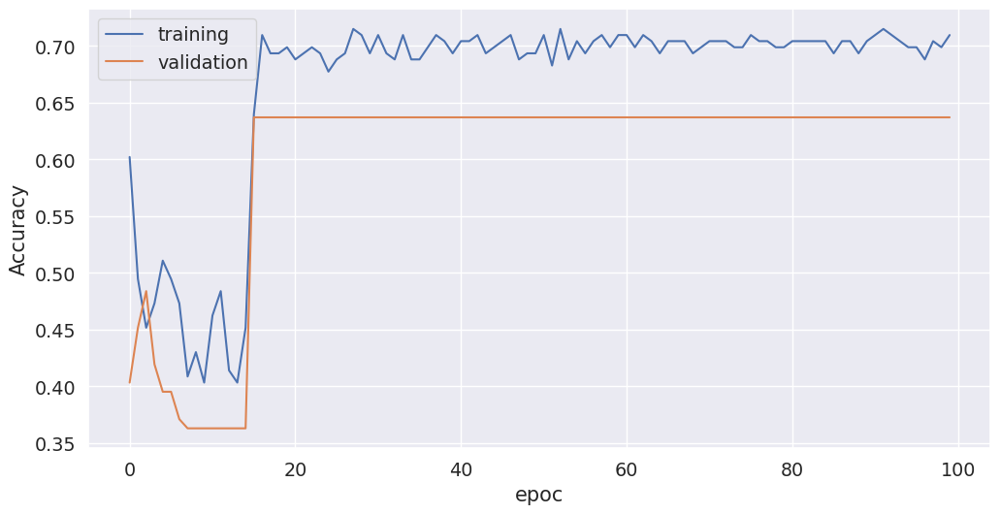

In [99]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Agreguemosle regularización de tipo L2

In [100]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.25))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dropout(0.25))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.01)))
model.add(Dense(num_classes, activation="softmax"))

In [101]:
opt = keras.optimizers.RMSprop()
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_36 (Dense)             (None, 16)                112       
_________________________________________________________________
dropout_7 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense_37 (Dense)             (None, 8)                 136       
_________________________________________________________________
dropout_8 (Dropout)          (None, 8)                 0         
_________________________________________________________________
dense_38 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_39 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_______________________________________________________

In [102]:
history = model.fit(
    X_train.values, y_train, epochs=100, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1784 - accuracy: 0.5000

186/186 [==============================] - 0s 1ms/step - loss: 1.0446 - accuracy: 0.6452 - val_loss: 0.9371 - val_accuracy: 0.6371


Epoch 2/100
 32/186 [====>.........................] - ETA: 0s - loss: 1.1775 - accuracy: 0.6875

186/186 [==============================] - 0s 81us/step - loss: 1.0583 - accuracy: 0.6989 - val_loss: 0.9289 - val_accuracy: 0.6371


Epoch 3/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9946 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.9721 - accuracy: 0.6828 - val_loss: 0.9222 - val_accuracy: 0.6371


Epoch 4/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9539 - accuracy: 0.5938

186/186 [==============================] - 0s 76us/step - loss: 0.9519 - accuracy: 0.6667 - val_loss: 0.9158 - val_accuracy: 0.6371


Epoch 5/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9066 - accuracy: 0.6562

186/186 [==============================] - 0s 85us/step - loss: 0.9277 - accuracy: 0.6828 - val_loss: 0.9099 - val_accuracy: 0.6371


Epoch 6/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9336 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.9537 - accuracy: 0.6989 - val_loss: 0.9039 - val_accuracy: 0.6371


Epoch 7/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.9029 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.9001 - accuracy: 0.6935 - val_loss: 0.8989 - val_accuracy: 0.6371


Epoch 8/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8846 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.9024 - accuracy: 0.6828 - val_loss: 0.8937 - val_accuracy: 0.6371


Epoch 9/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8656 - accuracy: 0.7500

186/186 [==============================] - 0s 80us/step - loss: 0.8939 - accuracy: 0.7204 - val_loss: 0.8881 - val_accuracy: 0.6371


Epoch 10/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8851 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.8972 - accuracy: 0.6774 - val_loss: 0.8830 - val_accuracy: 0.6371


Epoch 11/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8951 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.8823 - accuracy: 0.7043 - val_loss: 0.8783 - val_accuracy: 0.6371


Epoch 12/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8814 - accuracy: 0.6562

186/186 [==============================] - 0s 77us/step - loss: 0.8817 - accuracy: 0.6935 - val_loss: 0.8733 - val_accuracy: 0.6371


Epoch 13/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8963 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.8798 - accuracy: 0.6935 - val_loss: 0.8681 - val_accuracy: 0.6371


Epoch 14/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8547 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.8574 - accuracy: 0.7043 - val_loss: 0.8631 - val_accuracy: 0.6371


Epoch 15/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8811 - accuracy: 0.6250

186/186 [==============================] - 0s 78us/step - loss: 0.8451 - accuracy: 0.6989 - val_loss: 0.8589 - val_accuracy: 0.6371


Epoch 16/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8133 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.8274 - accuracy: 0.7473 - val_loss: 0.8546 - val_accuracy: 0.6371


Epoch 17/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8655 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.8335 - accuracy: 0.6828 - val_loss: 0.8504 - val_accuracy: 0.6371


Epoch 18/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8156 - accuracy: 0.6562

186/186 [==============================] - 0s 76us/step - loss: 0.8366 - accuracy: 0.7043 - val_loss: 0.8454 - val_accuracy: 0.6371


Epoch 19/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8595 - accuracy: 0.6250

186/186 [==============================] - 0s 77us/step - loss: 0.8293 - accuracy: 0.6828 - val_loss: 0.8407 - val_accuracy: 0.6371


Epoch 20/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8273 - accuracy: 0.6250

186/186 [==============================] - 0s 76us/step - loss: 0.8043 - accuracy: 0.7258 - val_loss: 0.8362 - val_accuracy: 0.6371


Epoch 21/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7777 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.7910 - accuracy: 0.7204 - val_loss: 0.8322 - val_accuracy: 0.6371


Epoch 22/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7871 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.7854 - accuracy: 0.6882 - val_loss: 0.8281 - val_accuracy: 0.6371


Epoch 23/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8294 - accuracy: 0.7188

186/186 [==============================] - 0s 83us/step - loss: 0.8286 - accuracy: 0.6989 - val_loss: 0.8242 - val_accuracy: 0.6371


Epoch 24/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.8031 - accuracy: 0.7188

186/186 [==============================] - 0s 81us/step - loss: 0.7755 - accuracy: 0.7204 - val_loss: 0.8197 - val_accuracy: 0.6371


Epoch 25/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7503 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.7805 - accuracy: 0.7151 - val_loss: 0.8159 - val_accuracy: 0.6371


Epoch 26/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7926 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.7774 - accuracy: 0.7043 - val_loss: 0.8120 - val_accuracy: 0.6371


Epoch 27/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7859 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.7902 - accuracy: 0.6828 - val_loss: 0.8077 - val_accuracy: 0.6371


Epoch 28/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7994 - accuracy: 0.6875

186/186 [==============================] - 0s 78us/step - loss: 0.7862 - accuracy: 0.7043 - val_loss: 0.8036 - val_accuracy: 0.6371


Epoch 29/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7504 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.7644 - accuracy: 0.7043 - val_loss: 0.7998 - val_accuracy: 0.6371


Epoch 30/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7920 - accuracy: 0.6875

186/186 [==============================] - 0s 84us/step - loss: 0.7485 - accuracy: 0.7312 - val_loss: 0.7961 - val_accuracy: 0.6371


Epoch 31/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7699 - accuracy: 0.5938

186/186 [==============================] - 0s 76us/step - loss: 0.7251 - accuracy: 0.7151 - val_loss: 0.7916 - val_accuracy: 0.6371


Epoch 32/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7601 - accuracy: 0.6562

186/186 [==============================] - 0s 80us/step - loss: 0.7620 - accuracy: 0.7204 - val_loss: 0.7882 - val_accuracy: 0.6371


Epoch 33/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7098 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.7426 - accuracy: 0.7204 - val_loss: 0.7828 - val_accuracy: 0.6371


Epoch 34/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7390 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.7475 - accuracy: 0.6828 - val_loss: 0.7818 - val_accuracy: 0.6371


Epoch 35/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7540 - accuracy: 0.6250

186/186 [==============================] - 0s 72us/step - loss: 0.7307 - accuracy: 0.6935 - val_loss: 0.7778 - val_accuracy: 0.6371


Epoch 36/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7866 - accuracy: 0.6250

186/186 [==============================] - 0s 76us/step - loss: 0.7059 - accuracy: 0.7419 - val_loss: 0.7674 - val_accuracy: 0.6452


Epoch 37/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7131 - accuracy: 0.7812

186/186 [==============================] - 0s 82us/step - loss: 0.7267 - accuracy: 0.7312 - val_loss: 0.7644 - val_accuracy: 0.6452


Epoch 38/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7368 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.7181 - accuracy: 0.7151 - val_loss: 0.7578 - val_accuracy: 0.6290


Epoch 39/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7094 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.7132 - accuracy: 0.7097 - val_loss: 0.7536 - val_accuracy: 0.6371


Epoch 40/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6783 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.7019 - accuracy: 0.7043 - val_loss: 0.7454 - val_accuracy: 0.6774


Epoch 41/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7081 - accuracy: 0.7500

186/186 [==============================] - 0s 81us/step - loss: 0.7149 - accuracy: 0.7366 - val_loss: 0.7418 - val_accuracy: 0.6694


Epoch 42/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7151 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.7102 - accuracy: 0.7097 - val_loss: 0.7315 - val_accuracy: 0.7016


Epoch 43/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6702 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.6922 - accuracy: 0.7258 - val_loss: 0.7266 - val_accuracy: 0.6935


Epoch 44/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6858 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.6885 - accuracy: 0.7419 - val_loss: 0.7205 - val_accuracy: 0.7258


Epoch 45/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7281 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.6591 - accuracy: 0.7419 - val_loss: 0.7120 - val_accuracy: 0.7097


Epoch 46/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6436 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.6598 - accuracy: 0.7473 - val_loss: 0.6920 - val_accuracy: 0.7177


Epoch 47/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5868 - accuracy: 0.7812

186/186 [==============================] - 0s 80us/step - loss: 0.6226 - accuracy: 0.7634 - val_loss: 0.6778 - val_accuracy: 0.7097


Epoch 48/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6270 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.6205 - accuracy: 0.7419 - val_loss: 0.6617 - val_accuracy: 0.7258


Epoch 49/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5918 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.6118 - accuracy: 0.7419 - val_loss: 0.6456 - val_accuracy: 0.7339


Epoch 50/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5548 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.6120 - accuracy: 0.7473 - val_loss: 0.6351 - val_accuracy: 0.7419


Epoch 51/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6211 - accuracy: 0.7500

186/186 [==============================] - 0s 130us/step - loss: 0.6081 - accuracy: 0.7473 - val_loss: 0.6179 - val_accuracy: 0.7500


Epoch 52/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6819 - accuracy: 0.7812

186/186 [==============================] - 0s 81us/step - loss: 0.6025 - accuracy: 0.7581 - val_loss: 0.6105 - val_accuracy: 0.7419


Epoch 53/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.6248 - accuracy: 0.6875

186/186 [==============================] - 0s 81us/step - loss: 0.5422 - accuracy: 0.8172 - val_loss: 0.5965 - val_accuracy: 0.7500


Epoch 54/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5629 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.5983 - accuracy: 0.7473 - val_loss: 0.5966 - val_accuracy: 0.7419


Epoch 55/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5120 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.5600 - accuracy: 0.7688 - val_loss: 0.5871 - val_accuracy: 0.7339


Epoch 56/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6781 - accuracy: 0.6250

186/186 [==============================] - 0s 75us/step - loss: 0.5821 - accuracy: 0.7312 - val_loss: 0.5856 - val_accuracy: 0.7419


Epoch 57/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.7039 - accuracy: 0.6875

186/186 [==============================] - 0s 78us/step - loss: 0.5613 - accuracy: 0.7581 - val_loss: 0.5748 - val_accuracy: 0.7500


Epoch 58/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5282 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.5484 - accuracy: 0.7581 - val_loss: 0.5696 - val_accuracy: 0.7419


Epoch 59/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5516 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.5583 - accuracy: 0.7634 - val_loss: 0.5649 - val_accuracy: 0.7581


Epoch 60/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6447 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.5506 - accuracy: 0.7419 - val_loss: 0.5622 - val_accuracy: 0.7500


Epoch 61/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5232 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.5484 - accuracy: 0.7419 - val_loss: 0.5608 - val_accuracy: 0.7500


Epoch 62/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.7292 - accuracy: 0.5000

186/186 [==============================] - 0s 69us/step - loss: 0.5674 - accuracy: 0.7258 - val_loss: 0.5587 - val_accuracy: 0.7339


Epoch 63/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6472 - accuracy: 0.7500

186/186 [==============================] - 0s 111us/step - loss: 0.5286 - accuracy: 0.7688 - val_loss: 0.5525 - val_accuracy: 0.7258


Epoch 64/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4709 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.5230 - accuracy: 0.7204 - val_loss: 0.5512 - val_accuracy: 0.7500


Epoch 65/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5032 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.5003 - accuracy: 0.7796 - val_loss: 0.5463 - val_accuracy: 0.7500


Epoch 66/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4378 - accuracy: 0.8750

186/186 [==============================] - 0s 82us/step - loss: 0.5198 - accuracy: 0.7742 - val_loss: 0.5444 - val_accuracy: 0.7339


Epoch 67/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4866 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.4782 - accuracy: 0.8011 - val_loss: 0.5425 - val_accuracy: 0.7500


Epoch 68/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5529 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.5201 - accuracy: 0.7742 - val_loss: 0.5393 - val_accuracy: 0.7500


Epoch 69/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5212 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.4962 - accuracy: 0.7742 - val_loss: 0.5342 - val_accuracy: 0.7419


Epoch 70/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4723 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.4987 - accuracy: 0.7796 - val_loss: 0.5331 - val_accuracy: 0.7500


Epoch 71/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6587 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.5577 - accuracy: 0.7527 - val_loss: 0.5361 - val_accuracy: 0.7419


Epoch 72/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5018 - accuracy: 0.7812

186/186 [==============================] - 0s 104us/step - loss: 0.5086 - accuracy: 0.7796 - val_loss: 0.5338 - val_accuracy: 0.7339


Epoch 73/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4749 - accuracy: 0.7812

186/186 [==============================] - 0s 79us/step - loss: 0.4976 - accuracy: 0.7957 - val_loss: 0.5333 - val_accuracy: 0.7339


Epoch 74/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6140 - accuracy: 0.6875

186/186 [==============================] - 0s 112us/step - loss: 0.5112 - accuracy: 0.7581 - val_loss: 0.5314 - val_accuracy: 0.7500


Epoch 75/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4982 - accuracy: 0.7500

186/186 [==============================] - 0s 148us/step - loss: 0.4775 - accuracy: 0.8011 - val_loss: 0.5293 - val_accuracy: 0.7500


Epoch 76/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4972 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.4805 - accuracy: 0.7688 - val_loss: 0.5298 - val_accuracy: 0.7339


Epoch 77/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5908 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.4999 - accuracy: 0.7957 - val_loss: 0.5292 - val_accuracy: 0.7339


Epoch 78/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5614 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.4932 - accuracy: 0.7581 - val_loss: 0.5276 - val_accuracy: 0.7339


Epoch 79/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5295 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.4715 - accuracy: 0.8065 - val_loss: 0.5266 - val_accuracy: 0.7258


Epoch 80/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.6054 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.4678 - accuracy: 0.7634 - val_loss: 0.5263 - val_accuracy: 0.7339


Epoch 81/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4821 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.4763 - accuracy: 0.7957 - val_loss: 0.5246 - val_accuracy: 0.7339


Epoch 82/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4587 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.4947 - accuracy: 0.8065 - val_loss: 0.5220 - val_accuracy: 0.7419


Epoch 83/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4630 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4863 - accuracy: 0.8065 - val_loss: 0.5238 - val_accuracy: 0.7339


Epoch 84/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4398 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.5158 - accuracy: 0.7796 - val_loss: 0.5209 - val_accuracy: 0.7500


Epoch 85/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5272 - accuracy: 0.8125



186/186 [==============================] - 0s 77us/step - loss: 0.4771 - accuracy: 0.7957 - val_loss: 0.5196 - val_accuracy: 0.7419


Epoch 86/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4693 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4927 - accuracy: 0.7849 - val_loss: 0.5227 - val_accuracy: 0.7258


Epoch 87/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4548 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4570 - accuracy: 0.8387 - val_loss: 0.5244 - val_accuracy: 0.7016


Epoch 88/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4149 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.4877 - accuracy: 0.8172 - val_loss: 0.5223 - val_accuracy: 0.7258


Epoch 89/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3969 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4749 - accuracy: 0.7796 - val_loss: 0.5210 - val_accuracy: 0.7339


Epoch 90/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5548 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.4675 - accuracy: 0.7688 - val_loss: 0.5219 - val_accuracy: 0.7419


Epoch 91/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4434 - accuracy: 0.8438

186/186 [==============================] - 0s 87us/step - loss: 0.4535 - accuracy: 0.8118 - val_loss: 0.5221 - val_accuracy: 0.7258


Epoch 92/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4037 - accuracy: 0.8438

186/186 [==============================] - 0s 87us/step - loss: 0.4437 - accuracy: 0.8065 - val_loss: 0.5228 - val_accuracy: 0.7258


Epoch 93/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.5215 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.4739 - accuracy: 0.7957 - val_loss: 0.5203 - val_accuracy: 0.7339


Epoch 94/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.4266 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.4791 - accuracy: 0.8226 - val_loss: 0.5201 - val_accuracy: 0.7339


Epoch 95/100


 32/186 [====>.........................] - ETA: 0s - loss: 0.4240 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.4836 - accuracy: 0.8065 - val_loss: 0.5187 - val_accuracy: 0.7258


Epoch 96/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3604 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.4641 - accuracy: 0.7849 - val_loss: 0.5175 - val_accuracy: 0.7258


Epoch 97/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5474 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.4582 - accuracy: 0.8011 - val_loss: 0.5162 - val_accuracy: 0.7339


Epoch 98/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.3759 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.4601 - accuracy: 0.8118 - val_loss: 0.5189 - val_accuracy: 0.7339


Epoch 99/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5877 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.4858 - accuracy: 0.7849 - val_loss: 0.5169 - val_accuracy: 0.7339


Epoch 100/100
 32/186 [====>.........................] - ETA: 0s - loss: 0.5650 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4863 - accuracy: 0.7849 - val_loss: 0.5152 - val_accuracy: 0.7339


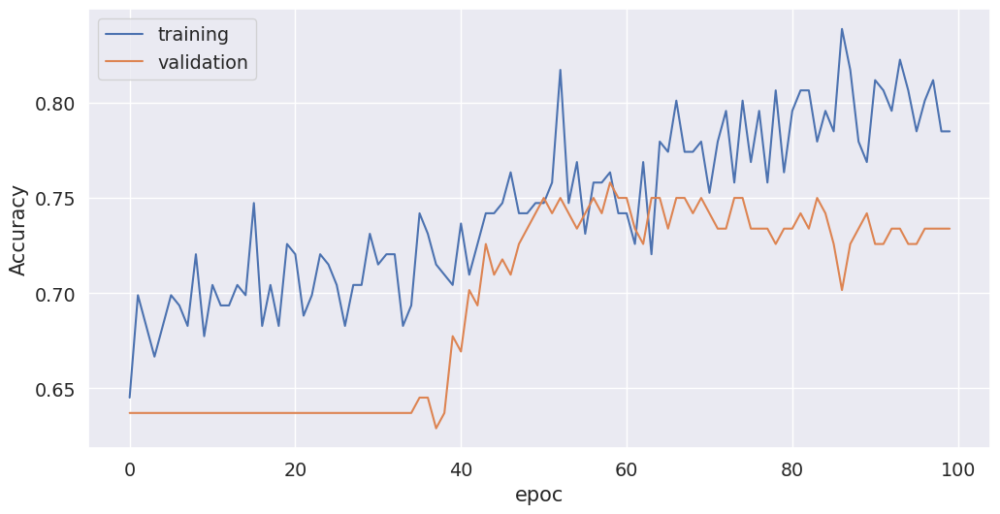

In [103]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Parece estar muy errático el aprendizaje, bajemos el parámetro de regularización y bajemos la tasa de aprendizaje

In [104]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(num_classes, activation="softmax"))

In [105]:
opt = keras.optimizers.RMSprop(lr=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_40 (Dense)             (None, 16)                112       
_________________________________________________________________
dense_41 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_42 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_43 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________


In [106]:
history = model.fit(
    X_train.values, y_train, epochs=1000, validation_data=(X_validation.values, y_test)
)

Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.6535 - accuracy: 0.6562

186/186 [==============================] - 0s 735us/step - loss: 2.7015 - accuracy: 0.5376 - val_loss: 3.0547 - val_accuracy: 0.5403


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.0073 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 2.4266 - accuracy: 0.5860 - val_loss: 2.8476 - val_accuracy: 0.5484


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.5630 - accuracy: 0.5625

186/186 [==============================] - 0s 66us/step - loss: 2.2503 - accuracy: 0.6022 - val_loss: 2.6904 - val_accuracy: 0.5565


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5474 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 2.1093 - accuracy: 0.6183 - val_loss: 2.5549 - val_accuracy: 0.5645


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.2062 - accuracy: 0.5938

186/186 [==============================] - 0s 74us/step - loss: 1.9888 - accuracy: 0.6183 - val_loss: 2.4371 - val_accuracy: 0.5726


Epoch 6/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.7996 - accuracy: 0.6250

186/186 [==============================] - 0s 74us/step - loss: 1.8883 - accuracy: 0.6129 - val_loss: 2.3411 - val_accuracy: 0.5806


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.4505 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 1.8059 - accuracy: 0.6452 - val_loss: 2.2473 - val_accuracy: 0.5887


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2301 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 1.7370 - accuracy: 0.6505 - val_loss: 2.1683 - val_accuracy: 0.5887


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8561 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 1.6776 - accuracy: 0.6828 - val_loss: 2.1037 - val_accuracy: 0.5806


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.6276 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 1.6306 - accuracy: 0.6828 - val_loss: 2.0409 - val_accuracy: 0.5968


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 3.0756 - accuracy: 0.5312

186/186 [==============================] - 0s 59us/step - loss: 1.5913 - accuracy: 0.6882 - val_loss: 1.9920 - val_accuracy: 0.5968


Epoch 12/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3559 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 1.5539 - accuracy: 0.6935 - val_loss: 1.9354 - val_accuracy: 0.5968


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5216 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 1.5236 - accuracy: 0.7151 - val_loss: 1.8913 - val_accuracy: 0.5968


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.6918 - accuracy: 0.5938

186/186 [==============================] - 0s 71us/step - loss: 1.4947 - accuracy: 0.7151 - val_loss: 1.8532 - val_accuracy: 0.5887


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1751 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 1.4694 - accuracy: 0.7097 - val_loss: 1.8130 - val_accuracy: 0.5887


Epoch 16/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.0445 - accuracy: 0.6250

186/186 [==============================] - 0s 62us/step - loss: 1.4443 - accuracy: 0.7097 - val_loss: 1.7714 - val_accuracy: 0.5887


Epoch 17/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.8822 - accuracy: 0.6562

186/186 [==============================] - 0s 61us/step - loss: 1.4234 - accuracy: 0.7097 - val_loss: 1.7392 - val_accuracy: 0.5887


Epoch 18/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.4794 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 1.4003 - accuracy: 0.7097 - val_loss: 1.7042 - val_accuracy: 0.5887


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3438 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 1.3808 - accuracy: 0.7097 - val_loss: 1.6743 - val_accuracy: 0.5968


Epoch 20/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9515 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 1.3607 - accuracy: 0.7204 - val_loss: 1.6439 - val_accuracy: 0.5968


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.9881 - accuracy: 0.6250

186/186 [==============================] - 0s 62us/step - loss: 1.3406 - accuracy: 0.7151 - val_loss: 1.6117 - val_accuracy: 0.5968


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2716 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 1.3197 - accuracy: 0.7151 - val_loss: 1.5804 - val_accuracy: 0.6048


Epoch 23/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2503 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 1.2974 - accuracy: 0.7151 - val_loss: 1.5518 - val_accuracy: 0.6048


Epoch 24/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8101 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 1.2799 - accuracy: 0.7151 - val_loss: 1.5266 - val_accuracy: 0.6048


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.7565 - accuracy: 0.5938

186/186 [==============================] - 0s 64us/step - loss: 1.2566 - accuracy: 0.7204 - val_loss: 1.5028 - val_accuracy: 0.6048


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5410 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 1.2413 - accuracy: 0.7204 - val_loss: 1.4800 - val_accuracy: 0.6048


Epoch 27/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2576 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 1.2227 - accuracy: 0.7151 - val_loss: 1.4532 - val_accuracy: 0.6048


Epoch 28/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.7776 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 1.2045 - accuracy: 0.7151 - val_loss: 1.4284 - val_accuracy: 0.6048


Epoch 29/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7829 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 1.1885 - accuracy: 0.7204 - val_loss: 1.4010 - val_accuracy: 0.6048


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8705 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 1.1749 - accuracy: 0.7151 - val_loss: 1.3778 - val_accuracy: 0.6048


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0255 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 1.1557 - accuracy: 0.7097 - val_loss: 1.3570 - val_accuracy: 0.6210


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2440 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 1.1426 - accuracy: 0.7151 - val_loss: 1.3344 - val_accuracy: 0.6129


Epoch 33/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3318 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 1.1283 - accuracy: 0.7151 - val_loss: 1.3115 - val_accuracy: 0.6129


Epoch 34/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9021 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 1.1134 - accuracy: 0.7151 - val_loss: 1.2881 - val_accuracy: 0.6048


Epoch 35/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5672 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 1.0969 - accuracy: 0.7204 - val_loss: 1.2653 - val_accuracy: 0.6129


Epoch 36/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1465 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 1.0834 - accuracy: 0.7204 - val_loss: 1.2450 - val_accuracy: 0.6210


Epoch 37/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.4644 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 1.0655 - accuracy: 0.7204 - val_loss: 1.2254 - val_accuracy: 0.6290


Epoch 38/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4617 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 1.0543 - accuracy: 0.7204 - val_loss: 1.2069 - val_accuracy: 0.6371


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1275 - accuracy: 0.7500

186/186 [==============================] - 0s 91us/step - loss: 1.0350 - accuracy: 0.7312 - val_loss: 1.1918 - val_accuracy: 0.6290


Epoch 40/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8307 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 1.0181 - accuracy: 0.7312 - val_loss: 1.1727 - val_accuracy: 0.6290


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1567 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 1.0035 - accuracy: 0.7204 - val_loss: 1.1543 - val_accuracy: 0.6290


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6233 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.9874 - accuracy: 0.7204 - val_loss: 1.1394 - val_accuracy: 0.6290


Epoch 43/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0054 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.9739 - accuracy: 0.7151 - val_loss: 1.1223 - val_accuracy: 0.6290


Epoch 44/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.3040 - accuracy: 0.6250

186/186 [==============================] - 0s 81us/step - loss: 0.9593 - accuracy: 0.7097 - val_loss: 1.1081 - val_accuracy: 0.6290


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9443 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.9443 - accuracy: 0.7204 - val_loss: 1.0923 - val_accuracy: 0.6371


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6862 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.9307 - accuracy: 0.7097 - val_loss: 1.0776 - val_accuracy: 0.6371


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7878 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.9151 - accuracy: 0.7151 - val_loss: 1.0607 - val_accuracy: 0.6048


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2282 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.9007 - accuracy: 0.7097 - val_loss: 1.0484 - val_accuracy: 0.6048


Epoch 49/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.8730 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.8833 - accuracy: 0.7258 - val_loss: 1.0371 - val_accuracy: 0.6048


Epoch 50/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8843 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.8653 - accuracy: 0.7258 - val_loss: 1.0271 - val_accuracy: 0.6048


Epoch 51/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.1915 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.8514 - accuracy: 0.7312 - val_loss: 1.0140 - val_accuracy: 0.5968


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6930 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.8381 - accuracy: 0.7366 - val_loss: 1.0017 - val_accuracy: 0.6129


Epoch 53/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8248 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.8250 - accuracy: 0.7366 - val_loss: 0.9900 - val_accuracy: 0.6129


Epoch 54/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8524 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.8121 - accuracy: 0.7419 - val_loss: 0.9789 - val_accuracy: 0.6048


Epoch 55/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1491 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.8020 - accuracy: 0.7312 - val_loss: 0.9693 - val_accuracy: 0.6129


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0175 - accuracy: 0.5625

186/186 [==============================] - 0s 67us/step - loss: 0.7884 - accuracy: 0.7312 - val_loss: 0.9618 - val_accuracy: 0.6129


Epoch 57/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0499 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.7783 - accuracy: 0.7258 - val_loss: 0.9524 - val_accuracy: 0.6129


Epoch 58/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5090 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.7691 - accuracy: 0.7312 - val_loss: 0.9441 - val_accuracy: 0.6129


Epoch 59/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6923 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.7599 - accuracy: 0.7258 - val_loss: 0.9360 - val_accuracy: 0.6210


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2005 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.7515 - accuracy: 0.7204 - val_loss: 0.9286 - val_accuracy: 0.6210


Epoch 61/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5111 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.7468 - accuracy: 0.7204 - val_loss: 0.9211 - val_accuracy: 0.6210


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8725 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.7407 - accuracy: 0.7258 - val_loss: 0.9124 - val_accuracy: 0.6210


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0127 - accuracy: 0.6250

186/186 [==============================] - 0s 62us/step - loss: 0.7339 - accuracy: 0.7204 - val_loss: 0.9052 - val_accuracy: 0.6210


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7090 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.7287 - accuracy: 0.7204 - val_loss: 0.8983 - val_accuracy: 0.6210


Epoch 65/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7159 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.7206 - accuracy: 0.7204 - val_loss: 0.8915 - val_accuracy: 0.6210


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7523 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.7159 - accuracy: 0.7204 - val_loss: 0.8849 - val_accuracy: 0.6290


Epoch 67/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6830 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.7099 - accuracy: 0.7258 - val_loss: 0.8794 - val_accuracy: 0.6290


Epoch 68/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6556 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.7044 - accuracy: 0.7204 - val_loss: 0.8740 - val_accuracy: 0.6129


Epoch 69/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7405 - accuracy: 0.7500

186/186 [==============================] - 0s 81us/step - loss: 0.7010 - accuracy: 0.7151 - val_loss: 0.8688 - val_accuracy: 0.6129


Epoch 70/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7428 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.6947 - accuracy: 0.7097 - val_loss: 0.8637 - val_accuracy: 0.6290


Epoch 71/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7431 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.6925 - accuracy: 0.7151 - val_loss: 0.8582 - val_accuracy: 0.6210


Epoch 72/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7137 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.6861 - accuracy: 0.7204 - val_loss: 0.8531 - val_accuracy: 0.6371


Epoch 73/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8141 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.6823 - accuracy: 0.7204 - val_loss: 0.8478 - val_accuracy: 0.6210


Epoch 74/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6677 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.6783 - accuracy: 0.7151 - val_loss: 0.8424 - val_accuracy: 0.6371


Epoch 75/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8737 - accuracy: 0.5938

186/186 [==============================] - 0s 64us/step - loss: 0.6736 - accuracy: 0.7204 - val_loss: 0.8369 - val_accuracy: 0.6290


Epoch 76/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7360 - accuracy: 0.7812

186/186 [==============================] - 0s 85us/step - loss: 0.6698 - accuracy: 0.7204 - val_loss: 0.8316 - val_accuracy: 0.6290


Epoch 77/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8876 - accuracy: 0.5312

186/186 [==============================] - 0s 70us/step - loss: 0.6653 - accuracy: 0.7258 - val_loss: 0.8261 - val_accuracy: 0.6371


Epoch 78/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8513 - accuracy: 0.5938

186/186 [==============================] - 0s 71us/step - loss: 0.6632 - accuracy: 0.7204 - val_loss: 0.8213 - val_accuracy: 0.6371


Epoch 79/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7570 - accuracy: 0.5938

186/186 [==============================] - 0s 71us/step - loss: 0.6576 - accuracy: 0.7151 - val_loss: 0.8169 - val_accuracy: 0.6371


Epoch 80/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5908 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.6550 - accuracy: 0.7258 - val_loss: 0.8116 - val_accuracy: 0.6371


Epoch 81/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6263 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.6495 - accuracy: 0.7151 - val_loss: 0.8075 - val_accuracy: 0.6371


Epoch 82/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4809 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.6466 - accuracy: 0.7151 - val_loss: 0.8031 - val_accuracy: 0.6290


Epoch 83/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6333 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.6445 - accuracy: 0.7312 - val_loss: 0.7975 - val_accuracy: 0.6371


Epoch 84/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3951 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.6391 - accuracy: 0.7151 - val_loss: 0.7946 - val_accuracy: 0.6290


Epoch 85/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6162 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.6362 - accuracy: 0.7204 - val_loss: 0.7894 - val_accuracy: 0.6371


Epoch 86/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7990 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.6339 - accuracy: 0.7151 - val_loss: 0.7857 - val_accuracy: 0.6371


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6294 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.6290 - accuracy: 0.7204 - val_loss: 0.7821 - val_accuracy: 0.6371


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7833 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6258 - accuracy: 0.7258 - val_loss: 0.7776 - val_accuracy: 0.6371


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6800 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.6233 - accuracy: 0.7258 - val_loss: 0.7730 - val_accuracy: 0.6371


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5481 - accuracy: 0.7188

186/186 [==============================] - 0s 84us/step - loss: 0.6184 - accuracy: 0.7258 - val_loss: 0.7686 - val_accuracy: 0.6371


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5608 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.6153 - accuracy: 0.7258 - val_loss: 0.7637 - val_accuracy: 0.6371


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5546 - accuracy: 0.7188

186/186 [==============================] - 0s 90us/step - loss: 0.6120 - accuracy: 0.7312 - val_loss: 0.7585 - val_accuracy: 0.6371


Epoch 93/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5574 - accuracy: 0.7812

186/186 [==============================] - 0s 86us/step - loss: 0.6084 - accuracy: 0.7258 - val_loss: 0.7534 - val_accuracy: 0.6371


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4888 - accuracy: 0.8438

186/186 [==============================] - 0s 89us/step - loss: 0.6041 - accuracy: 0.7312 - val_loss: 0.7489 - val_accuracy: 0.6371


Epoch 95/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6666 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.6037 - accuracy: 0.7312 - val_loss: 0.7447 - val_accuracy: 0.6371


Epoch 96/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6983 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.5989 - accuracy: 0.7366 - val_loss: 0.7412 - val_accuracy: 0.6371


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3607 - accuracy: 0.9062

186/186 [==============================] - 0s 92us/step - loss: 0.5949 - accuracy: 0.7366 - val_loss: 0.7360 - val_accuracy: 0.6371


Epoch 98/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4944 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.5925 - accuracy: 0.7419 - val_loss: 0.7310 - val_accuracy: 0.6371


Epoch 99/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5064 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.5899 - accuracy: 0.7366 - val_loss: 0.7276 - val_accuracy: 0.6371


Epoch 100/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7156 - accuracy: 0.7188



186/186 [==============================] - 0s 62us/step - loss: 0.5862 - accuracy: 0.7366 - val_loss: 0.7225 - val_accuracy: 0.6290


Epoch 101/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5811 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.5824 - accuracy: 0.7366 - val_loss: 0.7176 - val_accuracy: 0.6452


Epoch 102/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5555 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.5794 - accuracy: 0.7419 - val_loss: 0.7133 - val_accuracy: 0.6452


Epoch 103/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6920 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.5766 - accuracy: 0.7366 - val_loss: 0.7090 - val_accuracy: 0.6532


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7001 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.5725 - accuracy: 0.7419 - val_loss: 0.7051 - val_accuracy: 0.6532


Epoch 105/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5689 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.5704 - accuracy: 0.7527 - val_loss: 0.7024 - val_accuracy: 0.6532


Epoch 106/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.1053 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 0.5691 - accuracy: 0.7473 - val_loss: 0.6993 - val_accuracy: 0.6532


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4565 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.5663 - accuracy: 0.7527 - val_loss: 0.6947 - val_accuracy: 0.6613


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4533 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.5629 - accuracy: 0.7527 - val_loss: 0.6916 - val_accuracy: 0.6613


Epoch 109/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5635 - accuracy: 0.6875



186/186 [==============================] - 0s 64us/step - loss: 0.5579 - accuracy: 0.7527 - val_loss: 0.6869 - val_accuracy: 0.6613


Epoch 110/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4139 - accuracy: 0.7812



186/186 [==============================] - 0s 70us/step - loss: 0.5562 - accuracy: 0.7527 - val_loss: 0.6848 - val_accuracy: 0.6613


Epoch 111/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3756 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.5528 - accuracy: 0.7634 - val_loss: 0.6816 - val_accuracy: 0.6613


Epoch 112/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3707 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.5511 - accuracy: 0.7581 - val_loss: 0.6794 - val_accuracy: 0.6613


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4667 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.5480 - accuracy: 0.7688 - val_loss: 0.6763 - val_accuracy: 0.6613


Epoch 114/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5583 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.5436 - accuracy: 0.7634 - val_loss: 0.6728 - val_accuracy: 0.6613


Epoch 115/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6529 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.5403 - accuracy: 0.7688 - val_loss: 0.6710 - val_accuracy: 0.6613


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4676 - accuracy: 0.7812

186/186 [==============================] - 0s 60us/step - loss: 0.5394 - accuracy: 0.7634 - val_loss: 0.6677 - val_accuracy: 0.6613


Epoch 117/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4005 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.5359 - accuracy: 0.7688 - val_loss: 0.6644 - val_accuracy: 0.6613


Epoch 118/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5296 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.5330 - accuracy: 0.7688 - val_loss: 0.6615 - val_accuracy: 0.6613


Epoch 119/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3425 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.5303 - accuracy: 0.7634 - val_loss: 0.6577 - val_accuracy: 0.6694


Epoch 120/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6618 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.5293 - accuracy: 0.7742 - val_loss: 0.6547 - val_accuracy: 0.6694


Epoch 121/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6087 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.5256 - accuracy: 0.7688 - val_loss: 0.6534 - val_accuracy: 0.6613


Epoch 122/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4885 - accuracy: 0.7812

186/186 [==============================] - 0s 89us/step - loss: 0.5228 - accuracy: 0.7796 - val_loss: 0.6514 - val_accuracy: 0.6613


Epoch 123/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5812 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.5216 - accuracy: 0.7742 - val_loss: 0.6501 - val_accuracy: 0.6532


Epoch 124/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7747 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.5183 - accuracy: 0.7742 - val_loss: 0.6463 - val_accuracy: 0.6613


Epoch 125/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3683 - accuracy: 0.8750

186/186 [==============================] - 0s 93us/step - loss: 0.5144 - accuracy: 0.7742 - val_loss: 0.6435 - val_accuracy: 0.6613


Epoch 126/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4681 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.5141 - accuracy: 0.7742 - val_loss: 0.6386 - val_accuracy: 0.6613


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3637 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.5113 - accuracy: 0.7688 - val_loss: 0.6373 - val_accuracy: 0.6613


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9110 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.5093 - accuracy: 0.7742 - val_loss: 0.6348 - val_accuracy: 0.6532


Epoch 129/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7232 - accuracy: 0.6250

186/186 [==============================]

 - 0s 77us/step - loss: 0.5059 - accuracy: 0.7742 - val_loss: 0.6343 - val_accuracy: 0.6532


Epoch 130/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5045 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.5047 - accuracy: 0.7742 - val_loss: 0.6301 - val_accuracy: 0.6532


Epoch 131/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4034 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.5017 - accuracy: 0.7688 - val_loss: 0.6268 - val_accuracy: 0.6613


Epoch 132/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5160 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.5005 - accuracy: 0.7581 - val_loss: 0.6254 - val_accuracy: 0.6532


Epoch 133/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6058 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.4967 - accuracy: 0.7688 - val_loss: 0.6210 - val_accuracy: 0.6613


Epoch 134/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4768 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4969 - accuracy: 0.7634 - val_loss: 0.6209 - val_accuracy: 0.6532


Epoch 135/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6891 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.4936 - accuracy: 0.7688 - val_loss: 0.6190 - val_accuracy: 0.6613


Epoch 136/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4837 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4917 - accuracy: 0.7742 - val_loss: 0.6156 - val_accuracy: 0.6613


Epoch 137/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5495 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.4902 - accuracy: 0.7688 - val_loss: 0.6118 - val_accuracy: 0.6613


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3635 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4893 - accuracy: 0.7742 - val_loss: 0.6095 - val_accuracy: 0.6613


Epoch 139/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4107 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.4858 - accuracy: 0.7742 - val_loss: 0.6076 - val_accuracy: 0.6613


Epoch 140/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3370 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.4837 - accuracy: 0.7742 - val_loss: 0.6033 - val_accuracy: 0.6613


Epoch 141/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4285 - accuracy: 0.7500

186/186 [==============================] - 0s 84us/step - loss: 0.4833 - accuracy: 0.7742 - val_loss: 0.5990 - val_accuracy: 0.6694


Epoch 142/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6389 - accuracy: 0.6562

186/186 [==============================] - 0s 107us/step - loss: 0.4815 - accuracy: 0.7742 - val_loss: 0.5971 - val_accuracy: 0.6694


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4864 - accuracy: 0.7500

186/186 [==============================] - 0s 78us/step - loss: 0.4778 - accuracy: 0.7742 - val_loss: 0.5940 - val_accuracy: 0.6694


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6167 - accuracy: 0.6562

186/186 [==============================] - 0s 133us/step - loss: 0.4784 - accuracy: 0.7688 - val_loss: 0.5927 - val_accuracy: 0.6694


Epoch 145/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6836 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.4745 - accuracy: 0.7796 - val_loss: 0.5908 - val_accuracy: 0.6694


Epoch 146/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5770 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.4744 - accuracy: 0.7688 - val_loss: 0.5892 - val_accuracy: 0.6694


Epoch 147/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4991 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.4710 - accuracy: 0.7796 - val_loss: 0.5862 - val_accuracy: 0.6613


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3388 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.4694 - accuracy: 0.7742 - val_loss: 0.5812 - val_accuracy: 0.6774


Epoch 149/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3249 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.4699 - accuracy: 0.7688 - val_loss: 0.5796 - val_accuracy: 0.6774


Epoch 150/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4738 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.4663 - accuracy: 0.7742 - val_loss: 0.5772 - val_accuracy: 0.6774


Epoch 151/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3481 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.4644 - accuracy: 0.7796 - val_loss: 0.5757 - val_accuracy: 0.6855


Epoch 152/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4589 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.4622 - accuracy: 0.7796 - val_loss: 0.5741 - val_accuracy: 0.6774


Epoch 153/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3817 - accuracy: 0.7812



186/186 [==============================] - 0s 71us/step - loss: 0.4607 - accuracy: 0.7742 - val_loss: 0.5722 - val_accuracy: 0.6694


Epoch 154/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4588 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.4587 - accuracy: 0.7742 - val_loss: 0.5688 - val_accuracy: 0.6774


Epoch 155/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3559 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.4570 - accuracy: 0.7742 - val_loss: 0.5654 - val_accuracy: 0.6855


Epoch 156/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4200 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.4551 - accuracy: 0.7742 - val_loss: 0.5633 - val_accuracy: 0.6694


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3645 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4533 - accuracy: 0.7742 - val_loss: 0.5617 - val_accuracy: 0.6694


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4463 - accuracy: 0.7812

186/186 [==============================] - 0s 79us/step - loss: 0.4518 - accuracy: 0.7742 - val_loss: 0.5591 - val_accuracy: 0.6694


Epoch 159/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3362 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4518 - accuracy: 0.7742 - val_loss: 0.5562 - val_accuracy: 0.6694


Epoch 160/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2987 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.4481 - accuracy: 0.7742 - val_loss: 0.5542 - val_accuracy: 0.6694


Epoch 161/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3497 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4483 - accuracy: 0.7742 - val_loss: 0.5527 - val_accuracy: 0.6694


Epoch 162/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3880 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 0.4448 - accuracy: 0.7742 - val_loss: 0.5503 - val_accuracy: 0.6694


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3024 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.4446 - accuracy: 0.7796 - val_loss: 0.5487 - val_accuracy: 0.6694


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3971 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.4445 - accuracy: 0.7688 - val_loss: 0.5489 - val_accuracy: 0.6694


Epoch 165/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5909 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.4408 - accuracy: 0.7796 - val_loss: 0.5468 - val_accuracy: 0.6694


Epoch 166/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6605 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.4413 - accuracy: 0.7742 - val_loss: 0.5438 - val_accuracy: 0.6694


Epoch 167/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5591 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.4406 - accuracy: 0.7796 - val_loss: 0.5395 - val_accuracy: 0.6694


Epoch 168/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4460 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4369 - accuracy: 0.7796 - val_loss: 0.5380 - val_accuracy: 0.6694


Epoch 169/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5297 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.4355 - accuracy: 0.7742 - val_loss: 0.5382 - val_accuracy: 0.6694


Epoch 170/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4052 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.4347 - accuracy: 0.7796 - val_loss: 0.5382 - val_accuracy: 0.6694


Epoch 171/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2923 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.4335 - accuracy: 0.7796 - val_loss: 0.5371 - val_accuracy: 0.6694


Epoch 172/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3102 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.4307 - accuracy: 0.7796 - val_loss: 0.5329 - val_accuracy: 0.6694


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5444 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4292 - accuracy: 0.7742 - val_loss: 0.5325 - val_accuracy: 0.6694


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6060 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.4277 - accuracy: 0.7742 - val_loss: 0.5310 - val_accuracy: 0.6774


Epoch 175/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3792 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.4263 - accuracy: 0.7796 - val_loss: 0.5278 - val_accuracy: 0.6694


Epoch 176/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5334 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.4265 - accuracy: 0.7742 - val_loss: 0.5277 - val_accuracy: 0.6694


Epoch 177/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4536 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.4261 - accuracy: 0.7903 - val_loss: 0.5246 - val_accuracy: 0.6613


Epoch 178/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4021 - accuracy: 0.7188

186/186 [==============================] - 0s 115us/step - loss: 0.4219 - accuracy: 0.7796 - val_loss: 0.5232 - val_accuracy: 0.6694


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3971 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4235 - accuracy: 0.7849 - val_loss: 0.5236 - val_accuracy: 0.6694


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3290 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.4194 - accuracy: 0.7957 - val_loss: 0.5204 - val_accuracy: 0.6694


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4580 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.4192 - accuracy: 0.7903 - val_loss: 0.5173 - val_accuracy: 0.6774


Epoch 182/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3971 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.4178 - accuracy: 0.7796 - val_loss: 0.5148 - val_accuracy: 0.6774


Epoch 183/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4266 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4164 - accuracy: 0.7796 - val_loss: 0.5130 - val_accuracy: 0.6774


Epoch 184/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4034 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.4158 - accuracy: 0.7796 - val_loss: 0.5135 - val_accuracy: 0.6935


Epoch 185/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4014 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4134 - accuracy: 0.7849 - val_loss: 0.5106 - val_accuracy: 0.6935


Epoch 186/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3623 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.4134 - accuracy: 0.8011 - val_loss: 0.5093 - val_accuracy: 0.6935


Epoch 187/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3224 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4120 - accuracy: 0.7903 - val_loss: 0.5086 - val_accuracy: 0.6855


Epoch 188/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2298 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.4114 - accuracy: 0.7796 - val_loss: 0.5096 - val_accuracy: 0.6935


Epoch 189/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4764 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.4095 - accuracy: 0.7903 - val_loss: 0.5082 - val_accuracy: 0.7016


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5745 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4075 - accuracy: 0.7957 - val_loss: 0.5052 - val_accuracy: 0.7016


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5560 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.4064 - accuracy: 0.7957 - val_loss: 0.5038 - val_accuracy: 0.7016


Epoch 192/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5039 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4061 - accuracy: 0.7903 - val_loss: 0.5053 - val_accuracy: 0.7016


Epoch 193/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4426 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4041 - accuracy: 0.7957 - val_loss: 0.5015 - val_accuracy: 0.7016


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3434 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4035 - accuracy: 0.7796 - val_loss: 0.5025 - val_accuracy: 0.7016


Epoch 195/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3074 - accuracy: 0.8750



186/186 [==============================] - 0s 84us/step - loss: 0.4018 - accuracy: 0.7957 - val_loss: 0.4990 - val_accuracy: 0.7016


Epoch 196/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4443 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.4033 - accuracy: 0.7957 - val_loss: 0.4977 - val_accuracy: 0.7016


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4308 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3996 - accuracy: 0.8065 - val_loss: 0.4952 - val_accuracy: 0.6935


Epoch 198/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5198 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.4001 - accuracy: 0.7957 - val_loss: 0.4950 - val_accuracy: 0.7016


Epoch 199/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3871 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3993 - accuracy: 0.8011 - val_loss: 0.4963 - val_accuracy: 0.7097


Epoch 200/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3552 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3980 - accuracy: 0.8011 - val_loss: 0.4952 - val_accuracy: 0.7097


Epoch 201/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4269 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3970 - accuracy: 0.8065 - val_loss: 0.4933 - val_accuracy: 0.7097


Epoch 202/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3733 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3946 - accuracy: 0.8065 - val_loss: 0.4922 - val_accuracy: 0.7097


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2483 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3949 - accuracy: 0.8065 - val_loss: 0.4898 - val_accuracy: 0.7016


Epoch 204/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3262 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3946 - accuracy: 0.8065 - val_loss: 0.4888 - val_accuracy: 0.7016


Epoch 205/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3455 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3922 - accuracy: 0.8065 - val_loss: 0.4855 - val_accuracy: 0.7097


Epoch 206/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3990 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3922 - accuracy: 0.8065 - val_loss: 0.4849 - val_accuracy: 0.7097


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4300 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3913 - accuracy: 0.8011 - val_loss: 0.4857 - val_accuracy: 0.6935


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3056 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3895 - accuracy: 0.8118 - val_loss: 0.4863 - val_accuracy: 0.6935


Epoch 209/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5425 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.3894 - accuracy: 0.8118 - val_loss: 0.4833 - val_accuracy: 0.6935


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4162 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3883 - accuracy: 0.8172 - val_loss: 0.4802 - val_accuracy: 0.7097


Epoch 211/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3240 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3881 - accuracy: 0.8118 - val_loss: 0.4785 - val_accuracy: 0.7177


Epoch 212/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3642 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3856 - accuracy: 0.8118 - val_loss: 0.4797 - val_accuracy: 0.7097


Epoch 213/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3738 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3849 - accuracy: 0.8065 - val_loss: 0.4793 - val_accuracy: 0.7177


Epoch 214/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5898 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3835 - accuracy: 0.8172 - val_loss: 0.4788 - val_accuracy: 0.7097


Epoch 215/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5300 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3834 - accuracy: 0.8065 - val_loss: 0.4799 - val_accuracy: 0.7097


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4080 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3829 - accuracy: 0.8172 - val_loss: 0.4759 - val_accuracy: 0.7016


Epoch 217/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4663 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3813 - accuracy: 0.8118 - val_loss: 0.4744 - val_accuracy: 0.7097


Epoch 218/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4659 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3816 - accuracy: 0.8118 - val_loss: 0.4724 - val_accuracy: 0.7177


Epoch 219/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3847 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3796 - accuracy: 0.8118 - val_loss: 0.4724 - val_accuracy: 0.7097


Epoch 220/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3770 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3791 - accuracy: 0.8118 - val_loss: 0.4729 - val_accuracy: 0.7258


Epoch 221/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2560 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3771 - accuracy: 0.8118 - val_loss: 0.4732 - val_accuracy: 0.7339


Epoch 222/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3888 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3772 - accuracy: 0.8226 - val_loss: 0.4697 - val_accuracy: 0.7177


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4046 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3758 - accuracy: 0.8226 - val_loss: 0.4659 - val_accuracy: 0.7177


Epoch 224/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4169 - accuracy: 0.8125

186/186 [==============================] - 0s 126us/step - loss: 0.3755 - accuracy: 0.8118 - val_loss: 0.4671 - val_accuracy: 0.7177


Epoch 225/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4154 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3751 - accuracy: 0.8118 - val_loss: 0.4674 - val_accuracy: 0.7258


Epoch 226/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3162 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3752 - accuracy: 0.8172 - val_loss: 0.4689 - val_accuracy: 0.7258


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3732 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3745 - accuracy: 0.8226 - val_loss: 0.4702 - val_accuracy: 0.7258


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5463 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3736 - accuracy: 0.8280 - val_loss: 0.4721 - val_accuracy: 0.7339


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2807 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3711 - accuracy: 0.8280 - val_loss: 0.4682 - val_accuracy: 0.7339


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3148 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3717 - accuracy: 0.8226 - val_loss: 0.4649 - val_accuracy: 0.7339


Epoch 231/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3338 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3706 - accuracy: 0.8172 - val_loss: 0.4652 - val_accuracy: 0.7339


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2394 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3685 - accuracy: 0.8226 - val_loss: 0.4654 - val_accuracy: 0.7339


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2778 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3688 - accuracy: 0.8226 - val_loss: 0.4644 - val_accuracy: 0.7339


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3404 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3695 - accuracy: 0.8280 - val_loss: 0.4606 - val_accuracy: 0.7419


Epoch 235/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4071 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3676 - accuracy: 0.8333 - val_loss: 0.4625 - val_accuracy: 0.7419


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4895 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3667 - accuracy: 0.8226 - val_loss: 0.4620 - val_accuracy: 0.7419


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3775 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3663 - accuracy: 0.8226 - val_loss: 0.4614 - val_accuracy: 0.7500


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4666 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3643 - accuracy: 0.8226 - val_loss: 0.4599 - val_accuracy: 0.7500


Epoch 239/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3213 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3649 - accuracy: 0.8280 - val_loss: 0.4585 - val_accuracy: 0.7500


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3220 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3651 - accuracy: 0.8280 - val_loss: 0.4567 - val_accuracy: 0.7419


Epoch 241/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2389 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3627 - accuracy: 0.8280 - val_loss: 0.4552 - val_accuracy: 0.7419


Epoch 242/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2874 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3626 - accuracy: 0.8333 - val_loss: 0.4548 - val_accuracy: 0.7500


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4176 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3608 - accuracy: 0.8333 - val_loss: 0.4541 - val_accuracy: 0.7500


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2804 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3607 - accuracy: 0.8333 - val_loss: 0.4515 - val_accuracy: 0.7419


Epoch 245/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4137 - accuracy: 0.8438



186/186 [==============================] - 0s 70us/step - loss: 0.3617 - accuracy: 0.8333 - val_loss: 0.4530 - val_accuracy: 0.7500


Epoch 246/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3340 - accuracy: 0.8750



186/186 [==============================] - 0s 65us/step - loss: 0.3601 - accuracy: 0.8333 - val_loss: 0.4510 - val_accuracy: 0.7500


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2311 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3595 - accuracy: 0.8333 - val_loss: 0.4517 - val_accuracy: 0.7500


Epoch 248/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4111 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3579 - accuracy: 0.8333 - val_loss: 0.4509 - val_accuracy: 0.7500


Epoch 249/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4226 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3582 - accuracy: 0.8333 - val_loss: 0.4472 - val_accuracy: 0.7339


Epoch 250/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2393 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3571 - accuracy: 0.8333 - val_loss: 0.4485 - val_accuracy: 0.7500


Epoch 251/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3953 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3565 - accuracy: 0.8387 - val_loss: 0.4490 - val_accuracy: 0.7500


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3862 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3563 - accuracy: 0.8333 - val_loss: 0.4475 - val_accuracy: 0.7500


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5345 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3543 - accuracy: 0.8387 - val_loss: 0.4483 - val_accuracy: 0.7581


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3313 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3551 - accuracy: 0.8333 - val_loss: 0.4478 - val_accuracy: 0.7661


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3455 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3542 - accuracy: 0.8441 - val_loss: 0.4524 - val_accuracy: 0.7581


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3897 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3538 - accuracy: 0.8333 - val_loss: 0.4499 - val_accuracy: 0.7581


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4532 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3529 - accuracy: 0.8280 - val_loss: 0.4454 - val_accuracy: 0.7661


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3461 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3542 - accuracy: 0.8387 - val_loss: 0.4469 - val_accuracy: 0.7661


Epoch 259/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3824 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3523 - accuracy: 0.8387 - val_loss: 0.4468 - val_accuracy: 0.7661


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3196 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3517 - accuracy: 0.8387 - val_loss: 0.4447 - val_accuracy: 0.7661


Epoch 261/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3134 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3507 - accuracy: 0.8333 - val_loss: 0.4424 - val_accuracy: 0.7581


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4486 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3505 - accuracy: 0.8441 - val_loss: 0.4414 - val_accuracy: 0.7581


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3235 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3503 - accuracy: 0.8333 - val_loss: 0.4397 - val_accuracy: 0.7581


Epoch 264/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3496 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3491 - accuracy: 0.8441 - val_loss: 0.4404 - val_accuracy: 0.7581


Epoch 265/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2925 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3493 - accuracy: 0.8387 - val_loss: 0.4397 - val_accuracy: 0.7581


Epoch 266/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2052 - accuracy: 0.9688

186/186 [==============================] - 0s 71us/step - loss: 0.3479 - accuracy: 0.8387 - val_loss: 0.4404 - val_accuracy: 0.7661


Epoch 267/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2725 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3482 - accuracy: 0.8387 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3800 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3464 - accuracy: 0.8441 - val_loss: 0.4433 - val_accuracy: 0.7581


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3871 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3460 - accuracy: 0.8441 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4352 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3454 - accuracy: 0.8441 - val_loss: 0.4362 - val_accuracy: 0.7581


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4085 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3462 - accuracy: 0.8387 - val_loss: 0.4389 - val_accuracy: 0.7661


Epoch 272/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3125 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3456 - accuracy: 0.8441 - val_loss: 0.4387 - val_accuracy: 0.7661


Epoch 273/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3379 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3442 - accuracy: 0.8441 - val_loss: 0.4358 - val_accuracy: 0.7661


Epoch 274/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2988 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3443 - accuracy: 0.8441 - val_loss: 0.4361 - val_accuracy: 0.7661


Epoch 275/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4555 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3431 - accuracy: 0.8387 - val_loss: 0.4388 - val_accuracy: 0.7581


Epoch 276/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3959 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3427 - accuracy: 0.8441 - val_loss: 0.4347 - val_accuracy: 0.7661


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1792 - accuracy: 0.9375

186/186 [==============================] - 0s 81us/step - loss: 0.3419 - accuracy: 0.8441 - val_loss: 0.4384 - val_accuracy: 0.7581


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3416 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3416 - accuracy: 0.8495 - val_loss: 0.4323 - val_accuracy: 0.7742


Epoch 279/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3322 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3408 - accuracy: 0.8548 - val_loss: 0.4304 - val_accuracy: 0.7742


Epoch 280/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2602 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3403 - accuracy: 0.8441 - val_loss: 0.4339 - val_accuracy: 0.7742


Epoch 281/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4094 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3401 - accuracy: 0.8441 - val_loss: 0.4343 - val_accuracy: 0.7742


Epoch 282/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3427 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3398 - accuracy: 0.8441 - val_loss: 0.4344 - val_accuracy: 0.7742


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2978 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3402 - accuracy: 0.8387 - val_loss: 0.4310 - val_accuracy: 0.7742


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3780 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3386 - accuracy: 0.8495 - val_loss: 0.4317 - val_accuracy: 0.7823


Epoch 285/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4036 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3396 - accuracy: 0.8441 - val_loss: 0.4318 - val_accuracy: 0.7823


Epoch 286/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5250 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3379 - accuracy: 0.8387 - val_loss: 0.4283 - val_accuracy: 0.7742


Epoch 287/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3964 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3377 - accuracy: 0.8441 - val_loss: 0.4293 - val_accuracy: 0.7742


Epoch 288/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3702 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3365 - accuracy: 0.8495 - val_loss: 0.4298 - val_accuracy: 0.7742


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4587 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3361 - accuracy: 0.8548 - val_loss: 0.4295 - val_accuracy: 0.7823


Epoch 290/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3364 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3355 - accuracy: 0.8495 - val_loss: 0.4344 - val_accuracy: 0.7661


Epoch 291/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3827 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3363 - accuracy: 0.8441 - val_loss: 0.4328 - val_accuracy: 0.7742


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4258 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3352 - accuracy: 0.8387 - val_loss: 0.4324 - val_accuracy: 0.7742


Epoch 293/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2717 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3364 - accuracy: 0.8387 - val_loss: 0.4320 - val_accuracy: 0.7823


Epoch 294/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3960 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3355 - accuracy: 0.8387 - val_loss: 0.4314 - val_accuracy: 0.7823


Epoch 295/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2461 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3351 - accuracy: 0.8441 - val_loss: 0.4281 - val_accuracy: 0.7823


Epoch 296/1000
 32/186 [====>.........................]

 - ETA: 0s - loss: 0.3942 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3335 - accuracy: 0.8441 - val_loss: 0.4283 - val_accuracy: 0.7823


Epoch 297/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3050 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3331 - accuracy: 0.8387 - val_loss: 0.4265 - val_accuracy: 0.7823


Epoch 298/1000
 32/186 [====>.........................]

 - ETA: 0s - loss: 0.2503 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3328 - accuracy: 0.8387 - val_loss: 0.4267 - val_accuracy: 0.7823


Epoch 299/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2861 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3321 - accuracy: 0.8387 - val_loss: 0.4253 - val_accuracy: 0.7823


Epoch 300/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4740 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3323 - accuracy: 0.8387 - val_loss: 0.4282 - val_accuracy: 0.7823


Epoch 301/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3350 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3314 - accuracy: 0.8441 - val_loss: 0.4295 - val_accuracy: 0.7823


Epoch 302/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3315 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3319 - accuracy: 0.8387 - val_loss: 0.4302 - val_accuracy: 0.7742


Epoch 303/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3803 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3305 - accuracy: 0.8387 - val_loss: 0.4276 - val_accuracy: 0.7823


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4016 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3303 - accuracy: 0.8333 - val_loss: 0.4295 - val_accuracy: 0.7742


Epoch 305/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3900 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3305 - accuracy: 0.8387 - val_loss: 0.4303 - val_accuracy: 0.7661


Epoch 306/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2206 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3298 - accuracy: 0.8387 - val_loss: 0.4254 - val_accuracy: 0.7823


Epoch 307/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3369 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3289 - accuracy: 0.8333 - val_loss: 0.4265 - val_accuracy: 0.7823


Epoch 308/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5103 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 0.3293 - accuracy: 0.8387 - val_loss: 0.4275 - val_accuracy: 0.7823


Epoch 309/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3498 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3277 - accuracy: 0.8387 - val_loss: 0.4201 - val_accuracy: 0.7903


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2349 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3276 - accuracy: 0.8387 - val_loss: 0.4251 - val_accuracy: 0.7823


Epoch 311/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4111 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3290 - accuracy: 0.8387 - val_loss: 0.4232 - val_accuracy: 0.7823


Epoch 312/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2661 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3270 - accuracy: 0.8387 - val_loss: 0.4237 - val_accuracy: 0.7823


Epoch 313/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2216 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3270 - accuracy: 0.8441 - val_loss: 0.4213 - val_accuracy: 0.7823


Epoch 314/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3782 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3275 - accuracy: 0.8387 - val_loss: 0.4203 - val_accuracy: 0.7903


Epoch 315/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3503 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3269 - accuracy: 0.8387 - val_loss: 0.4223 - val_accuracy: 0.7823


Epoch 316/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3052 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3264 - accuracy: 0.8387 - val_loss: 0.4203 - val_accuracy: 0.7903


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2612 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3272 - accuracy: 0.8280 - val_loss: 0.4217 - val_accuracy: 0.7823


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2399 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3250 - accuracy: 0.8387 - val_loss: 0.4197 - val_accuracy: 0.7903


Epoch 319/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2427 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3245 - accuracy: 0.8387 - val_loss: 0.4203 - val_accuracy: 0.7903


Epoch 320/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3662 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3261 - accuracy: 0.8280 - val_loss: 0.4191 - val_accuracy: 0.7903


Epoch 321/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3791 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3242 - accuracy: 0.8280 - val_loss: 0.4212 - val_accuracy: 0.7823


Epoch 322/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4433 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3232 - accuracy: 0.8387 - val_loss: 0.4203 - val_accuracy: 0.7903


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3133 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3233 - accuracy: 0.8387 - val_loss: 0.4180 - val_accuracy: 0.7903


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2652 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3246 - accuracy: 0.8280 - val_loss: 0.4206 - val_accuracy: 0.7903


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3794 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.3228 - accuracy: 0.8333 - val_loss: 0.4182 - val_accuracy: 0.7903


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2952 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3223 - accuracy: 0.8333 - val_loss: 0.4223 - val_accuracy: 0.7742


Epoch 327/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1712 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3219 - accuracy: 0.8333 - val_loss: 0.4175 - val_accuracy: 0.7903


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2579 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3216 - accuracy: 0.8280 - val_loss: 0.4192 - val_accuracy: 0.7903


Epoch 329/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3745 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3215 - accuracy: 0.8226 - val_loss: 0.4239 - val_accuracy: 0.7742


Epoch 330/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2381 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.3217 - accuracy: 0.8441 - val_loss: 0.4180 - val_accuracy: 0.7903


Epoch 331/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3124 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3221 - accuracy: 0.8280 - val_loss: 0.4168 - val_accuracy: 0.7903


Epoch 332/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2378 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3220 - accuracy: 0.8226 - val_loss: 0.4145 - val_accuracy: 0.7903


Epoch 333/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3520 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3201 - accuracy: 0.8280 - val_loss: 0.4139 - val_accuracy: 0.7903


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4138 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3210 - accuracy: 0.8280 - val_loss: 0.4133 - val_accuracy: 0.7903


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2864 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3211 - accuracy: 0.8280 - val_loss: 0.4179 - val_accuracy: 0.7823


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4978 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3197 - accuracy: 0.8280 - val_loss: 0.4167 - val_accuracy: 0.7903


Epoch 337/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3361 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3186 - accuracy: 0.8280 - val_loss: 0.4183 - val_accuracy: 0.7823


Epoch 338/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3190 - accuracy: 0.8280 - val_loss: 0.4183 - val_accuracy: 0.7823


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3568 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3187 - accuracy: 0.8280 - val_loss: 0.4164 - val_accuracy: 0.7903


Epoch 340/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3322 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3184 - accuracy: 0.8280 - val_loss: 0.4186 - val_accuracy: 0.7903


Epoch 341/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2962 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3186 - accuracy: 0.8280 - val_loss: 0.4202 - val_accuracy: 0.7823


Epoch 342/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2244 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3184 - accuracy: 0.8280 - val_loss: 0.4131 - val_accuracy: 0.7903


Epoch 343/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1837 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3188 - accuracy: 0.8226 - val_loss: 0.4147 - val_accuracy: 0.7823


Epoch 344/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4001 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3172 - accuracy: 0.8333 - val_loss: 0.4135 - val_accuracy: 0.7903


Epoch 345/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2544 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3181 - accuracy: 0.8172 - val_loss: 0.4147 - val_accuracy: 0.7823


Epoch 346/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4145 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3159 - accuracy: 0.8280 - val_loss: 0.4140 - val_accuracy: 0.7903


Epoch 347/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3157 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3176 - accuracy: 0.8226 - val_loss: 0.4113 - val_accuracy: 0.7903


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4311 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3173 - accuracy: 0.8333 - val_loss: 0.4136 - val_accuracy: 0.7823


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2719 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3167 - accuracy: 0.8280 - val_loss: 0.4138 - val_accuracy: 0.7823


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3178 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3161 - accuracy: 0.8280 - val_loss: 0.4132 - val_accuracy: 0.7903


Epoch 351/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3058 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3155 - accuracy: 0.8280 - val_loss: 0.4123 - val_accuracy: 0.7903


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3138 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3146 - accuracy: 0.8280 - val_loss: 0.4110 - val_accuracy: 0.7903


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3434 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3145 - accuracy: 0.8280 - val_loss: 0.4106 - val_accuracy: 0.7823


Epoch 354/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3733 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3160 - accuracy: 0.8333 - val_loss: 0.4131 - val_accuracy: 0.7903


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2699 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3143 - accuracy: 0.8333 - val_loss: 0.4167 - val_accuracy: 0.7903


Epoch 356/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1711 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3142 - accuracy: 0.8226 - val_loss: 0.4133 - val_accuracy: 0.7903


Epoch 357/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2450 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.3142 - accuracy: 0.8280 - val_loss: 0.4119 - val_accuracy: 0.7903


Epoch 358/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3614 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3144 - accuracy: 0.8280 - val_loss: 0.4170 - val_accuracy: 0.7903


Epoch 359/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2646 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3132 - accuracy: 0.8280 - val_loss: 0.4126 - val_accuracy: 0.7903


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2580 - accuracy: 0.8750

186/186 [==============================] - 0s 79us/step - loss: 0.3133 - accuracy: 0.8280 - val_loss: 0.4106 - val_accuracy: 0.7823


Epoch 361/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2891 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.3125 - accuracy: 0.8333 - val_loss: 0.4144 - val_accuracy: 0.7903


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3619 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3127 - accuracy: 0.8226 - val_loss: 0.4112 - val_accuracy: 0.7903


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2411 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3128 - accuracy: 0.8280 - val_loss: 0.4084 - val_accuracy: 0.7903


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2605 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3127 - accuracy: 0.8280 - val_loss: 0.4138 - val_accuracy: 0.7903


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3487 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3111 - accuracy: 0.8226 - val_loss: 0.4105 - val_accuracy: 0.7984


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2672 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3122 - accuracy: 0.8280 - val_loss: 0.4058 - val_accuracy: 0.7903


Epoch 367/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4157 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3119 - accuracy: 0.8280 - val_loss: 0.4082 - val_accuracy: 0.7984


Epoch 368/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3821 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3104 - accuracy: 0.8280 - val_loss: 0.4097 - val_accuracy: 0.7903


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2578 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3113 - accuracy: 0.8226 - val_loss: 0.4084 - val_accuracy: 0.7984


Epoch 370/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4165 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3112 - accuracy: 0.8280 - val_loss: 0.4091 - val_accuracy: 0.7903


Epoch 371/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3111 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3114 - accuracy: 0.8226 - val_loss: 0.4084 - val_accuracy: 0.7903


Epoch 372/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3190 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3118 - accuracy: 0.8280 - val_loss: 0.4111 - val_accuracy: 0.7903


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1648 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3100 - accuracy: 0.8226 - val_loss: 0.4100 - val_accuracy: 0.7903


Epoch 374/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2482 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3102 - accuracy: 0.8333 - val_loss: 0.4080 - val_accuracy: 0.7903


Epoch 375/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3778 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.3110 - accuracy: 0.8280 - val_loss: 0.4099 - val_accuracy: 0.7903


Epoch 376/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3086 - accuracy: 0.8438

186/186 [==============================] - 0s 85us/step - loss: 0.3086 - accuracy: 0.8280 - val_loss: 0.4076 - val_accuracy: 0.7903


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2899 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3101 - accuracy: 0.8280 - val_loss: 0.4103 - val_accuracy: 0.7903


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3669 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.3096 - accuracy: 0.8280 - val_loss: 0.4054 - val_accuracy: 0.7903


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3632 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3088 - accuracy: 0.8280 - val_loss: 0.4081 - val_accuracy: 0.7903


Epoch 380/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3026 - accuracy: 0.8438

186/186 [==============================] - 0s 89us/step - loss: 0.3082 - accuracy: 0.8333 - val_loss: 0.4104 - val_accuracy: 0.7903


Epoch 381/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3870 - accuracy: 0.7500

186/186 [==============================] - 0s 78us/step - loss: 0.3079 - accuracy: 0.8280 - val_loss: 0.4099 - val_accuracy: 0.7903


Epoch 382/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3464 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3086 - accuracy: 0.8280 - val_loss: 0.4098 - val_accuracy: 0.7903


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2714 - accuracy: 0.9062

186/186 [==============================] - 0s 97us/step - loss: 0.3088 - accuracy: 0.8226 - val_loss: 0.4085 - val_accuracy: 0.7903


Epoch 384/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3033 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3068 - accuracy: 0.8280 - val_loss: 0.4055 - val_accuracy: 0.7984


Epoch 385/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2424 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3079 - accuracy: 0.8280 - val_loss: 0.4058 - val_accuracy: 0.7903


Epoch 386/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2721 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3076 - accuracy: 0.8333 - val_loss: 0.4056 - val_accuracy: 0.7903


Epoch 387/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2663 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3099 - accuracy: 0.8387 - val_loss: 0.4062 - val_accuracy: 0.7903


Epoch 388/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2893 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.3070 - accuracy: 0.8226 - val_loss: 0.4041 - val_accuracy: 0.7903


Epoch 389/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2651 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3070 - accuracy: 0.8280 - val_loss: 0.4036 - val_accuracy: 0.7903


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3685 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3070 - accuracy: 0.8280 - val_loss: 0.4024 - val_accuracy: 0.7903


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4277 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.3065 - accuracy: 0.8387 - val_loss: 0.4061 - val_accuracy: 0.7903


Epoch 392/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3859 - accuracy: 0.8125

186/186 [==============================] - 0s 89us/step - loss: 0.3057 - accuracy: 0.8280 - val_loss: 0.4048 - val_accuracy: 0.7903


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3219 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3063 - accuracy: 0.8333 - val_loss: 0.4054 - val_accuracy: 0.7903


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3419 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3070 - accuracy: 0.8333 - val_loss: 0.4049 - val_accuracy: 0.7903


Epoch 395/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4145 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.3052 - accuracy: 0.8333 - val_loss: 0.4073 - val_accuracy: 0.7903


Epoch 396/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2644 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3062 - accuracy: 0.8280 - val_loss: 0.4081 - val_accuracy: 0.7903


Epoch 397/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3155 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3061 - accuracy: 0.8333 - val_loss: 0.4039 - val_accuracy: 0.7903


Epoch 398/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4521 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.3045 - accuracy: 0.8387 - val_loss: 0.4054 - val_accuracy: 0.7903


Epoch 399/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2798 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3048 - accuracy: 0.8333 - val_loss: 0.4040 - val_accuracy: 0.7903


Epoch 400/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3608 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3043 - accuracy: 0.8387 - val_loss: 0.4058 - val_accuracy: 0.7903


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2594 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3046 - accuracy: 0.8280 - val_loss: 0.4011 - val_accuracy: 0.8065


Epoch 402/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2571 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3041 - accuracy: 0.8387 - val_loss: 0.4038 - val_accuracy: 0.7903


Epoch 403/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2664 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3040 - accuracy: 0.8387 - val_loss: 0.4057 - val_accuracy: 0.7903


Epoch 404/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3062 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3043 - accuracy: 0.8333 - val_loss: 0.4063 - val_accuracy: 0.7903


Epoch 405/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2040 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3045 - accuracy: 0.8441 - val_loss: 0.4064 - val_accuracy: 0.7903


Epoch 406/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2666 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3042 - accuracy: 0.8387 - val_loss: 0.4051 - val_accuracy: 0.7903


Epoch 407/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3041 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3032 - accuracy: 0.8333 - val_loss: 0.4061 - val_accuracy: 0.7903


Epoch 408/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2689 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3044 - accuracy: 0.8387 - val_loss: 0.4068 - val_accuracy: 0.7903


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2942 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3033 - accuracy: 0.8333 - val_loss: 0.4080 - val_accuracy: 0.7903


Epoch 410/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3388 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3032 - accuracy: 0.8333 - val_loss: 0.4072 - val_accuracy: 0.7903


Epoch 411/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1778 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3020 - accuracy: 0.8333 - val_loss: 0.4094 - val_accuracy: 0.7903


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3407 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3020 - accuracy: 0.8333 - val_loss: 0.4026 - val_accuracy: 0.7984


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3445 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3018 - accuracy: 0.8333 - val_loss: 0.4048 - val_accuracy: 0.7903


Epoch 414/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2880 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3030 - accuracy: 0.8387 - val_loss: 0.4029 - val_accuracy: 0.7984


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2437 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3018 - accuracy: 0.8387 - val_loss: 0.4008 - val_accuracy: 0.8065


Epoch 416/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2967 - accuracy: 0.8750

186/186 [==============================]

 - 0s 64us/step - loss: 0.3022 - accuracy: 0.8441 - val_loss: 0.4061 - val_accuracy: 0.7903


Epoch 417/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1622 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3009 - accuracy: 0.8387 - val_loss: 0.4041 - val_accuracy: 0.7903


Epoch 418/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2805 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3024 - accuracy: 0.8333 - val_loss: 0.4013 - val_accuracy: 0.7984


Epoch 419/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2632 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3033 - accuracy: 0.8333 - val_loss: 0.4019 - val_accuracy: 0.7984


Epoch 420/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3076 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3005 - accuracy: 0.8387 - val_loss: 0.3999 - val_accuracy: 0.7984


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3563 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3010 - accuracy: 0.8387 - val_loss: 0.4045 - val_accuracy: 0.7903


Epoch 422/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2270 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3008 - accuracy: 0.8333 - val_loss: 0.4055 - val_accuracy: 0.7903


Epoch 423/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3446 - accuracy: 0.8125

186/186 [==============================] - 0s 91us/step - loss: 0.2995 - accuracy: 0.8387 - val_loss: 0.4037 - val_accuracy: 0.7984


Epoch 424/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3239 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3000 - accuracy: 0.8333 - val_loss: 0.4066 - val_accuracy: 0.7903


Epoch 425/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3511 - accuracy: 0.8438

186/186 [==============================] - 0s 114us/step - loss: 0.2995 - accuracy: 0.8280 - val_loss: 0.4003 - val_accuracy: 0.7984


Epoch 426/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1698 - accuracy: 0.8750



186/186 [==============================] - 0s 79us/step - loss: 0.2994 - accuracy: 0.8333 - val_loss: 0.4007 - val_accuracy: 0.7984


Epoch 427/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4542 - accuracy: 0.6875

186/186 [==============================] - 0s 98us/step - loss: 0.3003 - accuracy: 0.8441 - val_loss: 0.4032 - val_accuracy: 0.7984


Epoch 428/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2411 - accuracy: 0.9375

186/186 [==============================] - 0s 77us/step - loss: 0.2991 - accuracy: 0.8441 - val_loss: 0.4023 - val_accuracy: 0.7984


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2731 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3001 - accuracy: 0.8387 - val_loss: 0.4049 - val_accuracy: 0.7903


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2324 - accuracy: 0.9062



186/186 [==============================] - 0s 62us/step - loss: 0.3000 - accuracy: 0.8441 - val_loss: 0.4036 - val_accuracy: 0.7984


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3722 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3008 - accuracy: 0.8548 - val_loss: 0.4062 - val_accuracy: 0.7823


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3186 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2988 - accuracy: 0.8441 - val_loss: 0.4066 - val_accuracy: 0.7823


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3682 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3002 - accuracy: 0.8333 - val_loss: 0.4037 - val_accuracy: 0.7984


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1530 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.2994 - accuracy: 0.8441 - val_loss: 0.4038 - val_accuracy: 0.7984


Epoch 435/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3028 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2984 - accuracy: 0.8441 - val_loss: 0.4073 - val_accuracy: 0.7823


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2917 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.2993 - accuracy: 0.8495 - val_loss: 0.4074 - val_accuracy: 0.7823


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2772 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2981 - accuracy: 0.8548 - val_loss: 0.4071 - val_accuracy: 0.7823


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2973 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2974 - accuracy: 0.8441 - val_loss: 0.4079 - val_accuracy: 0.7823


Epoch 439/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2085 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2984 - accuracy: 0.8495 - val_loss: 0.4077 - val_accuracy: 0.7823


Epoch 440/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3406 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2974 - accuracy: 0.8333 - val_loss: 0.4021 - val_accuracy: 0.7984


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2142 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2975 - accuracy: 0.8495 - val_loss: 0.4016 - val_accuracy: 0.7984


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3826 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2985 - accuracy: 0.8387 - val_loss: 0.4003 - val_accuracy: 0.7984


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2963 - accuracy: 0.8495 - val_loss: 0.4021 - val_accuracy: 0.7984


Epoch 444/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2708 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2980 - accuracy: 0.8441 - val_loss: 0.4040 - val_accuracy: 0.7903


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2545 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2970 - accuracy: 0.8441 - val_loss: 0.4007 - val_accuracy: 0.7984


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3824 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2973 - accuracy: 0.8495 - val_loss: 0.4056 - val_accuracy: 0.7903


Epoch 447/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3453 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.2961 - accuracy: 0.8548 - val_loss: 0.4053 - val_accuracy: 0.7903


Epoch 448/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3162 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2957 - accuracy: 0.8548 - val_loss: 0.4017 - val_accuracy: 0.7903


Epoch 449/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3144 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2973 - accuracy: 0.8548 - val_loss: 0.4028 - val_accuracy: 0.7903


Epoch 450/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2410 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.2966 - accuracy: 0.8441 - val_loss: 0.4041 - val_accuracy: 0.7903


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2857 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2966 - accuracy: 0.8441 - val_loss: 0.4022 - val_accuracy: 0.7903


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3367 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2957 - accuracy: 0.8602 - val_loss: 0.3998 - val_accuracy: 0.7984


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2692 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.2953 - accuracy: 0.8495 - val_loss: 0.4017 - val_accuracy: 0.7903


Epoch 454/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3056 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2945 - accuracy: 0.8495 - val_loss: 0.4013 - val_accuracy: 0.7903


Epoch 455/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2806 - accuracy: 0.8438

186/186 [==============================] - 0s 83us/step - loss: 0.2953 - accuracy: 0.8495 - val_loss: 0.4051 - val_accuracy: 0.7903


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1995 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2945 - accuracy: 0.8495 - val_loss: 0.4016 - val_accuracy: 0.7903


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2437 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2944 - accuracy: 0.8548 - val_loss: 0.4007 - val_accuracy: 0.7903


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3513 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2935 - accuracy: 0.8548 - val_loss: 0.4021 - val_accuracy: 0.7903


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2673 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2943 - accuracy: 0.8441 - val_loss: 0.4011 - val_accuracy: 0.7903


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2782 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2934 - accuracy: 0.8495 - val_loss: 0.4016 - val_accuracy: 0.7903


Epoch 461/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2924 - accuracy: 0.8602 - val_loss: 0.4030 - val_accuracy: 0.7903


Epoch 462/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2626 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2943 - accuracy: 0.8548 - val_loss: 0.4031 - val_accuracy: 0.7903


Epoch 463/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2615 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2933 - accuracy: 0.8548 - val_loss: 0.4025 - val_accuracy: 0.7903


Epoch 464/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3465 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2925 - accuracy: 0.8495 - val_loss: 0.3995 - val_accuracy: 0.7903


Epoch 465/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3273 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2924 - accuracy: 0.8548 - val_loss: 0.3973 - val_accuracy: 0.7984


Epoch 466/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2848 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2925 - accuracy: 0.8495 - val_loss: 0.3962 - val_accuracy: 0.7984


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2526 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2923 - accuracy: 0.8495 - val_loss: 0.3978 - val_accuracy: 0.7903


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3848 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2909 - accuracy: 0.8441 - val_loss: 0.4042 - val_accuracy: 0.7903


Epoch 469/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3064 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2908 - accuracy: 0.8441 - val_loss: 0.4044 - val_accuracy: 0.7903


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2461 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2917 - accuracy: 0.8495 - val_loss: 0.4042 - val_accuracy: 0.7903


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3426 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2915 - accuracy: 0.8548 - val_loss: 0.4052 - val_accuracy: 0.7903


Epoch 472/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2770 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2922 - accuracy: 0.8441 - val_loss: 0.4054 - val_accuracy: 0.7903


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3229 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2899 - accuracy: 0.8548 - val_loss: 0.4080 - val_accuracy: 0.7903


Epoch 474/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2661 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2904 - accuracy: 0.8548 - val_loss: 0.4075 - val_accuracy: 0.7903


Epoch 475/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3212 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2916 - accuracy: 0.8495 - val_loss: 0.4032 - val_accuracy: 0.7903


Epoch 476/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3182 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2895 - accuracy: 0.8495 - val_loss: 0.4047 - val_accuracy: 0.7903


Epoch 477/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2698 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.2904 - accuracy: 0.8495 - val_loss: 0.3998 - val_accuracy: 0.7903


Epoch 478/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2058 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2894 - accuracy: 0.8441 - val_loss: 0.4006 - val_accuracy: 0.7903


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3590 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2906 - accuracy: 0.8495 - val_loss: 0.3996 - val_accuracy: 0.7903


Epoch 480/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2760 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2882 - accuracy: 0.8495 - val_loss: 0.4008 - val_accuracy: 0.7903


Epoch 481/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3572 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.2897 - accuracy: 0.8387 - val_loss: 0.3999 - val_accuracy: 0.7903


Epoch 482/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3127 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2896 - accuracy: 0.8333 - val_loss: 0.4034 - val_accuracy: 0.7903


Epoch 483/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2957 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2879 - accuracy: 0.8495 - val_loss: 0.4064 - val_accuracy: 0.7903


Epoch 484/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3314 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2875 - accuracy: 0.8495 - val_loss: 0.4046 - val_accuracy: 0.7903


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3350 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2874 - accuracy: 0.8495 - val_loss: 0.4011 - val_accuracy: 0.7903


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3176 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2885 - accuracy: 0.8602 - val_loss: 0.4023 - val_accuracy: 0.7903


Epoch 487/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2693 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2885 - accuracy: 0.8548 - val_loss: 0.4044 - val_accuracy: 0.7984


Epoch 488/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4008 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2876 - accuracy: 0.8495 - val_loss: 0.4017 - val_accuracy: 0.7903


Epoch 489/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2812 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2862 - accuracy: 0.8441 - val_loss: 0.4061 - val_accuracy: 0.7903


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1939 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2864 - accuracy: 0.8495 - val_loss: 0.4014 - val_accuracy: 0.7903


Epoch 491/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2479 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2877 - accuracy: 0.8495 - val_loss: 0.4013 - val_accuracy: 0.7903


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3080 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2864 - accuracy: 0.8495 - val_loss: 0.4007 - val_accuracy: 0.7903


Epoch 493/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1940 - accuracy: 0.9375

186/186 [==============================] - 0s 80us/step - loss: 0.2870 - accuracy: 0.8548 - val_loss: 0.3998 - val_accuracy: 0.7903


Epoch 494/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2419 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2869 - accuracy: 0.8495 - val_loss: 0.4020 - val_accuracy: 0.7903


Epoch 495/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3008 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2862 - accuracy: 0.8441 - val_loss: 0.4037 - val_accuracy: 0.7903


Epoch 496/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1867 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2850 - accuracy: 0.8495 - val_loss: 0.4005 - val_accuracy: 0.7903


Epoch 497/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3232 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2861 - accuracy: 0.8495 - val_loss: 0.4001 - val_accuracy: 0.7903


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3105 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2852 - accuracy: 0.8495 - val_loss: 0.3986 - val_accuracy: 0.7903


Epoch 499/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2066 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2870 - accuracy: 0.8441 - val_loss: 0.4030 - val_accuracy: 0.7823


Epoch 500/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3125 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2860 - accuracy: 0.8441 - val_loss: 0.4046 - val_accuracy: 0.7984


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2582 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2846 - accuracy: 0.8495 - val_loss: 0.3987 - val_accuracy: 0.7903


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3065 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2845 - accuracy: 0.8441 - val_loss: 0.4001 - val_accuracy: 0.7903


Epoch 503/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3008 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.2852 - accuracy: 0.8387 - val_loss: 0.4038 - val_accuracy: 0.7984


Epoch 504/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4375 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.2848 - accuracy: 0.8441 - val_loss: 0.4049 - val_accuracy: 0.7984


Epoch 505/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2845 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2846 - accuracy: 0.8495 - val_loss: 0.4014 - val_accuracy: 0.7984


Epoch 506/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3147 - accuracy: 0.7812

186/186 [==============================] - 0s 80us/step - loss: 0.2849 - accuracy: 0.8495 - val_loss: 0.3981 - val_accuracy: 0.7903


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4165 - accuracy: 0.6875

186/186 [==============================] - 0s 80us/step - loss: 0.2840 - accuracy: 0.8441 - val_loss: 0.3963 - val_accuracy: 0.7903


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2972 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2838 - accuracy: 0.8441 - val_loss: 0.3975 - val_accuracy: 0.7903


Epoch 509/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3266 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2831 - accuracy: 0.8387 - val_loss: 0.4017 - val_accuracy: 0.7984


Epoch 510/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2163 - accuracy: 0.9062

186/186 [==============================] - 0s 82us/step - loss: 0.2827 - accuracy: 0.8495 - val_loss: 0.4003 - val_accuracy: 0.7984


Epoch 511/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2175 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.2833 - accuracy: 0.8495 - val_loss: 0.3952 - val_accuracy: 0.7903


Epoch 512/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2889 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.2828 - accuracy: 0.8548 - val_loss: 0.3960 - val_accuracy: 0.7984


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3202 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.2820 - accuracy: 0.8495 - val_loss: 0.3982 - val_accuracy: 0.7984


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3054 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2838 - accuracy: 0.8387 - val_loss: 0.3980 - val_accuracy: 0.7984


Epoch 515/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2626 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2822 - accuracy: 0.8441 - val_loss: 0.4007 - val_accuracy: 0.7903


Epoch 516/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2223 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2820 - accuracy: 0.8548 - val_loss: 0.3996 - val_accuracy: 0.7903


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3860 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.2843 - accuracy: 0.8441 - val_loss: 0.3992 - val_accuracy: 0.7984


Epoch 518/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1773 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.2828 - accuracy: 0.8495 - val_loss: 0.3953 - val_accuracy: 0.7903


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2378 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2818 - accuracy: 0.8333 - val_loss: 0.3956 - val_accuracy: 0.7984


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1916 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.2817 - accuracy: 0.8333 - val_loss: 0.3971 - val_accuracy: 0.7984


Epoch 521/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4013 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.2825 - accuracy: 0.8441 - val_loss: 0.3986 - val_accuracy: 0.7984


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2202 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.2824 - accuracy: 0.8495 - val_loss: 0.3960 - val_accuracy: 0.7984


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2927 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2820 - accuracy: 0.8387 - val_loss: 0.3956 - val_accuracy: 0.7903


Epoch 524/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3875 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.2824 - accuracy: 0.8280 - val_loss: 0.3995 - val_accuracy: 0.7903


Epoch 525/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2112 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2808 - accuracy: 0.8387 - val_loss: 0.4007 - val_accuracy: 0.7984


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4003 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.2812 - accuracy: 0.8387 - val_loss: 0.4055 - val_accuracy: 0.7984


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3025 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2817 - accuracy: 0.8441 - val_loss: 0.4017 - val_accuracy: 0.7984


Epoch 528/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2410 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2807 - accuracy: 0.8495 - val_loss: 0.4011 - val_accuracy: 0.7984


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3286 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2825 - accuracy: 0.8441 - val_loss: 0.3997 - val_accuracy: 0.7984


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2537 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2801 - accuracy: 0.8387 - val_loss: 0.4040 - val_accuracy: 0.7984


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2876 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2808 - accuracy: 0.8441 - val_loss: 0.4045 - val_accuracy: 0.7984


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2789 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2812 - accuracy: 0.8495 - val_loss: 0.3997 - val_accuracy: 0.7984


Epoch 533/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1856 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.2821 - accuracy: 0.8387 - val_loss: 0.4015 - val_accuracy: 0.7984


Epoch 534/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3505 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2793 - accuracy: 0.8441 - val_loss: 0.4033 - val_accuracy: 0.7984


Epoch 535/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2642 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2800 - accuracy: 0.8387 - val_loss: 0.4013 - val_accuracy: 0.7984


Epoch 536/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1993 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2819 - accuracy: 0.8387 - val_loss: 0.4007 - val_accuracy: 0.7984


Epoch 537/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2465 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2797 - accuracy: 0.8387 - val_loss: 0.4018 - val_accuracy: 0.7984


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2633 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2797 - accuracy: 0.8495 - val_loss: 0.4008 - val_accuracy: 0.7984


Epoch 539/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2856 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2797 - accuracy: 0.8387 - val_loss: 0.4013 - val_accuracy: 0.7984


Epoch 540/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2916 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2814 - accuracy: 0.8441 - val_loss: 0.3986 - val_accuracy: 0.7903


Epoch 541/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2625 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2794 - accuracy: 0.8333 - val_loss: 0.3998 - val_accuracy: 0.7984


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2787 - accuracy: 0.8333 - val_loss: 0.4005 - val_accuracy: 0.7984


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2948 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2787 - accuracy: 0.8441 - val_loss: 0.4006 - val_accuracy: 0.7984


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1459 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2803 - accuracy: 0.8333 - val_loss: 0.4018 - val_accuracy: 0.7984


Epoch 545/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3148 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2793 - accuracy: 0.8387 - val_loss: 0.4013 - val_accuracy: 0.7984


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2978 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2784 - accuracy: 0.8441 - val_loss: 0.3987 - val_accuracy: 0.7903


Epoch 547/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3227 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2791 - accuracy: 0.8333 - val_loss: 0.4039 - val_accuracy: 0.7984


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3023 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2779 - accuracy: 0.8387 - val_loss: 0.4010 - val_accuracy: 0.7984


Epoch 549/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2742 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2776 - accuracy: 0.8333 - val_loss: 0.4017 - val_accuracy: 0.7984


Epoch 550/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1745 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2784 - accuracy: 0.8333 - val_loss: 0.4009 - val_accuracy: 0.7984


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2528 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2776 - accuracy: 0.8441 - val_loss: 0.4031 - val_accuracy: 0.7984


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1804 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2785 - accuracy: 0.8441 - val_loss: 0.3977 - val_accuracy: 0.7903


Epoch 553/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2321 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2786 - accuracy: 0.8333 - val_loss: 0.3999 - val_accuracy: 0.7984


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3092 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2780 - accuracy: 0.8387 - val_loss: 0.3992 - val_accuracy: 0.7984


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3121 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2781 - accuracy: 0.8280 - val_loss: 0.4027 - val_accuracy: 0.7984


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2905 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2768 - accuracy: 0.8333 - val_loss: 0.4045 - val_accuracy: 0.7984


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2766 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2769 - accuracy: 0.8333 - val_loss: 0.4084 - val_accuracy: 0.7984


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4045 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2770 - accuracy: 0.8441 - val_loss: 0.4011 - val_accuracy: 0.7984


Epoch 559/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2102 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2774 - accuracy: 0.8333 - val_loss: 0.4015 - val_accuracy: 0.7984


Epoch 560/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2961 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2765 - accuracy: 0.8387 - val_loss: 0.4038 - val_accuracy: 0.7984


Epoch 561/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2638 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2774 - accuracy: 0.8441 - val_loss: 0.3981 - val_accuracy: 0.7903


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1918 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2777 - accuracy: 0.8333 - val_loss: 0.4019 - val_accuracy: 0.7984


Epoch 563/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2331 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2758 - accuracy: 0.8441 - val_loss: 0.3990 - val_accuracy: 0.7984


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3404 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.2768 - accuracy: 0.8333 - val_loss: 0.4024 - val_accuracy: 0.7984


Epoch 565/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3317 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2766 - accuracy: 0.8387 - val_loss: 0.4044 - val_accuracy: 0.7984


Epoch 566/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3338 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2775 - accuracy: 0.8441 - val_loss: 0.3995 - val_accuracy: 0.7984


Epoch 567/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3429 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2753 - accuracy: 0.8495 - val_loss: 0.3965 - val_accuracy: 0.7823


Epoch 568/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2803 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2762 - accuracy: 0.8280 - val_loss: 0.3987 - val_accuracy: 0.7903


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2703 - accuracy: 0.8750



186/186 [==============================] - 0s 63us/step - loss: 0.2751 - accuracy: 0.8333 - val_loss: 0.3991 - val_accuracy: 0.7984


Epoch 570/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1969 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2765 - accuracy: 0.8387 - val_loss: 0.3968 - val_accuracy: 0.7823


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2248 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2757 - accuracy: 0.8387 - val_loss: 0.3995 - val_accuracy: 0.7984


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2497 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2744 - accuracy: 0.8333 - val_loss: 0.3990 - val_accuracy: 0.7984


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2656 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2760 - accuracy: 0.8387 - val_loss: 0.3965 - val_accuracy: 0.7823


Epoch 574/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1976 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2762 - accuracy: 0.8441 - val_loss: 0.4008 - val_accuracy: 0.7984


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2736 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.2744 - accuracy: 0.8387 - val_loss: 0.4000 - val_accuracy: 0.7984


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2703 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2747 - accuracy: 0.8387 - val_loss: 0.3976 - val_accuracy: 0.7903


Epoch 577/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1797 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2748 - accuracy: 0.8333 - val_loss: 0.4001 - val_accuracy: 0.7984


Epoch 578/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2454 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2748 - accuracy: 0.8387 - val_loss: 0.4018 - val_accuracy: 0.7984


Epoch 579/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2441 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2775 - accuracy: 0.8387 - val_loss: 0.3993 - val_accuracy: 0.7984


Epoch 580/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3103 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2764 - accuracy: 0.8333 - val_loss: 0.4008 - val_accuracy: 0.7984


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1653 - accuracy: 0.9375

186/186 [==============================] - 0s 75us/step - loss: 0.2738 - accuracy: 0.8387 - val_loss: 0.3985 - val_accuracy: 0.7984


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2566 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.2748 - accuracy: 0.8387 - val_loss: 0.3961 - val_accuracy: 0.7823


Epoch 583/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2270 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.2755 - accuracy: 0.8333 - val_loss: 0.3958 - val_accuracy: 0.7823


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2169 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2740 - accuracy: 0.8387 - val_loss: 0.3961 - val_accuracy: 0.7823


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2824 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2735 - accuracy: 0.8387 - val_loss: 0.3992 - val_accuracy: 0.7984


Epoch 586/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1394 - accuracy: 0.9688

186/186 [==============================] - 0s 71us/step - loss: 0.2758 - accuracy: 0.8387 - val_loss: 0.4020 - val_accuracy: 0.7984


Epoch 587/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3233 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2732 - accuracy: 0.8333 - val_loss: 0.4045 - val_accuracy: 0.7984


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3452 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2734 - accuracy: 0.8441 - val_loss: 0.4005 - val_accuracy: 0.7984


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2429 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2733 - accuracy: 0.8333 - val_loss: 0.4033 - val_accuracy: 0.7984


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2588 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2746 - accuracy: 0.8387 - val_loss: 0.4003 - val_accuracy: 0.7984


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3216 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2755 - accuracy: 0.8333 - val_loss: 0.4020 - val_accuracy: 0.7984


Epoch 592/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3282 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2724 - accuracy: 0.8387 - val_loss: 0.3987 - val_accuracy: 0.7984


Epoch 593/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2423 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2737 - accuracy: 0.8333 - val_loss: 0.3988 - val_accuracy: 0.7984


Epoch 594/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3186 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2743 - accuracy: 0.8333 - val_loss: 0.4017 - val_accuracy: 0.7984


Epoch 595/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4277 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.2722 - accuracy: 0.8387 - val_loss: 0.3998 - val_accuracy: 0.7984


Epoch 596/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2302 - accuracy: 0.8750

186/186 [==============================] - 0s 86us/step - loss: 0.2724 - accuracy: 0.8441 - val_loss: 0.3957 - val_accuracy: 0.7823


Epoch 597/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3625 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2737 - accuracy: 0.8333 - val_loss: 0.3977 - val_accuracy: 0.7984


Epoch 598/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2575 - accuracy: 0.7812

186/186 [==============================] - 0s 85us/step - loss: 0.2741 - accuracy: 0.8280 - val_loss: 0.4020 - val_accuracy: 0.7984


Epoch 599/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3186 - accuracy: 0.7812

186/186 [==============================] - 0s 57us/step - loss: 0.2727 - accuracy: 0.8387 - val_loss: 0.4000 - val_accuracy: 0.7984


Epoch 600/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3523 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2723 - accuracy: 0.8387 - val_loss: 0.3992 - val_accuracy: 0.7984


Epoch 601/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2316 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2716 - accuracy: 0.8387 - val_loss: 0.3998 - val_accuracy: 0.7984


Epoch 602/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3084 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2720 - accuracy: 0.8280 - val_loss: 0.4041 - val_accuracy: 0.7984


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1963 - accuracy: 0.9375

186/186 [==============================] - 0s 77us/step - loss: 0.2723 - accuracy: 0.8387 - val_loss: 0.3988 - val_accuracy: 0.7984


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2521 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2735 - accuracy: 0.8333 - val_loss: 0.3970 - val_accuracy: 0.7984


Epoch 605/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2223 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.2730 - accuracy: 0.8387 - val_loss: 0.4016 - val_accuracy: 0.7984


Epoch 606/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3178 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2721 - accuracy: 0.8441 - val_loss: 0.3974 - val_accuracy: 0.7984


Epoch 607/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2699 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2732 - accuracy: 0.8333 - val_loss: 0.3973 - val_accuracy: 0.7984


Epoch 608/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1936 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2717 - accuracy: 0.8333 - val_loss: 0.3981 - val_accuracy: 0.7984


Epoch 609/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2911 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2711 - accuracy: 0.8333 - val_loss: 0.3982 - val_accuracy: 0.7984


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2813 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2731 - accuracy: 0.8333 - val_loss: 0.4015 - val_accuracy: 0.7984


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1934 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2726 - accuracy: 0.8387 - val_loss: 0.4026 - val_accuracy: 0.7984


Epoch 612/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1829 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.2733 - accuracy: 0.8441 - val_loss: 0.3981 - val_accuracy: 0.7984


Epoch 613/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3143 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2708 - accuracy: 0.8333 - val_loss: 0.3993 - val_accuracy: 0.7984


Epoch 614/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1720 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2705 - accuracy: 0.8333 - val_loss: 0.3969 - val_accuracy: 0.7903


Epoch 615/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2882 - accuracy: 0.8438



186/186 [==============================] - 0s 67us/step - loss: 0.2709 - accuracy: 0.8333 - val_loss: 0.4022 - val_accuracy: 0.7984


Epoch 616/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2846 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2745 - accuracy: 0.8333 - val_loss: 0.4042 - val_accuracy: 0.7984


Epoch 617/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3264 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2706 - accuracy: 0.8387 - val_loss: 0.4005 - val_accuracy: 0.7984


Epoch 618/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2536 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2709 - accuracy: 0.8441 - val_loss: 0.3962 - val_accuracy: 0.7903


Epoch 619/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3229 - accuracy: 0.7812

186/186 [==============================] - 0s 86us/step - loss: 0.2712 - accuracy: 0.8333 - val_loss: 0.3984 - val_accuracy: 0.7984


Epoch 620/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3060 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.2710 - accuracy: 0.8387 - val_loss: 0.4044 - val_accuracy: 0.7984


Epoch 621/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2188 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2704 - accuracy: 0.8387 - val_loss: 0.3988 - val_accuracy: 0.7984


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3040 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2721 - accuracy: 0.8387 - val_loss: 0.3966 - val_accuracy: 0.7903


Epoch 623/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3121 - accuracy: 0.7500



186/186 [==============================] - 0s 66us/step - loss: 0.2719 - accuracy: 0.8333 - val_loss: 0.3992 - val_accuracy: 0.7984


Epoch 624/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2725 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2713 - accuracy: 0.8280 - val_loss: 0.3990 - val_accuracy: 0.7984


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3494 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.2708 - accuracy: 0.8333 - val_loss: 0.4009 - val_accuracy: 0.7984


Epoch 626/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2492 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2714 - accuracy: 0.8387 - val_loss: 0.3996 - val_accuracy: 0.7984


Epoch 627/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3508 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2708 - accuracy: 0.8387 - val_loss: 0.4014 - val_accuracy: 0.7984


Epoch 628/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2844 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2706 - accuracy: 0.8333 - val_loss: 0.4015 - val_accuracy: 0.7984


Epoch 629/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2180 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2716 - accuracy: 0.8333 - val_loss: 0.4013 - val_accuracy: 0.7984


Epoch 630/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2095 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.2707 - accuracy: 0.8333 - val_loss: 0.4029 - val_accuracy: 0.7984


Epoch 631/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2364 - accuracy: 0.9062

186/186 [==============================] - 0s 93us/step - loss: 0.2703 - accuracy: 0.8387 - val_loss: 0.4016 - val_accuracy: 0.7984


Epoch 632/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2907 - accuracy: 0.7812

186/186 [==============================] - 0s 80us/step - loss: 0.2696 - accuracy: 0.8387 - val_loss: 0.3994 - val_accuracy: 0.7984


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3187 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2701 - accuracy: 0.8387 - val_loss: 0.3977 - val_accuracy: 0.7984


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2416 - accuracy: 0.8438

186/186 [==============================] - 0s 90us/step - loss: 0.2716 - accuracy: 0.8441 - val_loss: 0.3980 - val_accuracy: 0.7984


Epoch 635/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2591 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2693 - accuracy: 0.8387 - val_loss: 0.3989 - val_accuracy: 0.7984


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2807 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2699 - accuracy: 0.8387 - val_loss: 0.3985 - val_accuracy: 0.7984


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3582 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2702 - accuracy: 0.8333 - val_loss: 0.4008 - val_accuracy: 0.7984


Epoch 638/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1749 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2696 - accuracy: 0.8387 - val_loss: 0.4026 - val_accuracy: 0.7984


Epoch 639/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3102 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2718 - accuracy: 0.8333 - val_loss: 0.4019 - val_accuracy: 0.7984


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2181 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2702 - accuracy: 0.8333 - val_loss: 0.4040 - val_accuracy: 0.7984


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1582 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2693 - accuracy: 0.8333 - val_loss: 0.4052 - val_accuracy: 0.7984


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2341 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2702 - accuracy: 0.8387 - val_loss: 0.4039 - val_accuracy: 0.7984


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3268 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.2706 - accuracy: 0.8441 - val_loss: 0.4004 - val_accuracy: 0.7984


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3645 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2685 - accuracy: 0.8387 - val_loss: 0.4011 - val_accuracy: 0.7984


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3107 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2689 - accuracy: 0.8333 - val_loss: 0.4064 - val_accuracy: 0.7984


Epoch 646/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3213 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2684 - accuracy: 0.8441 - val_loss: 0.4019 - val_accuracy: 0.7984


Epoch 647/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2770 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2712 - accuracy: 0.8387 - val_loss: 0.4021 - val_accuracy: 0.7984


Epoch 648/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2698 - accuracy: 0.8387 - val_loss: 0.4019 - val_accuracy: 0.7984


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2903 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2685 - accuracy: 0.8387 - val_loss: 0.3988 - val_accuracy: 0.7984


Epoch 650/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2290 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2707 - accuracy: 0.8387 - val_loss: 0.3969 - val_accuracy: 0.8065


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2735 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2694 - accuracy: 0.8280 - val_loss: 0.3993 - val_accuracy: 0.7984


Epoch 652/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2999 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2683 - accuracy: 0.8280 - val_loss: 0.4001 - val_accuracy: 0.7984


Epoch 653/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2473 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2684 - accuracy: 0.8387 - val_loss: 0.3990 - val_accuracy: 0.7984


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2655 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2690 - accuracy: 0.8387 - val_loss: 0.4000 - val_accuracy: 0.7984


Epoch 655/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2685 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.2685 - accuracy: 0.8280 - val_loss: 0.4003 - val_accuracy: 0.7984


Epoch 656/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1648 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2676 - accuracy: 0.8441 - val_loss: 0.4004 - val_accuracy: 0.7984


Epoch 657/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3656 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.2684 - accuracy: 0.8333 - val_loss: 0.3992 - val_accuracy: 0.8065


Epoch 658/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2754 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2684 - accuracy: 0.8226 - val_loss: 0.4076 - val_accuracy: 0.7984


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3450 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2685 - accuracy: 0.8495 - val_loss: 0.4017 - val_accuracy: 0.7984


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2007 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2692 - accuracy: 0.8333 - val_loss: 0.4002 - val_accuracy: 0.7984


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3462 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.2691 - accuracy: 0.8441 - val_loss: 0.4005 - val_accuracy: 0.7984


Epoch 662/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2764 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2685 - accuracy: 0.8333 - val_loss: 0.3984 - val_accuracy: 0.8065


Epoch 663/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2640 - accuracy: 0.8438



186/186 [==============================] - 0s 69us/step - loss: 0.2671 - accuracy: 0.8441 - val_loss: 0.3967 - val_accuracy: 0.8065


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2792 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2699 - accuracy: 0.8387 - val_loss: 0.3987 - val_accuracy: 0.8065


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3495 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.2681 - accuracy: 0.8333 - val_loss: 0.4018 - val_accuracy: 0.7984


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2891 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2684 - accuracy: 0.8441 - val_loss: 0.3992 - val_accuracy: 0.8065


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1703 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2680 - accuracy: 0.8441 - val_loss: 0.3961 - val_accuracy: 0.7984


Epoch 668/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2196 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.2671 - accuracy: 0.8387 - val_loss: 0.3972 - val_accuracy: 0.8065


Epoch 669/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2406 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2676 - accuracy: 0.8280 - val_loss: 0.4031 - val_accuracy: 0.7984


Epoch 670/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3660 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2669 - accuracy: 0.8441 - val_loss: 0.4016 - val_accuracy: 0.7984


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2744 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2676 - accuracy: 0.8387 - val_loss: 0.4049 - val_accuracy: 0.7984


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1906 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2675 - accuracy: 0.8333 - val_loss: 0.4039 - val_accuracy: 0.7984


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2009 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2689 - accuracy: 0.8548 - val_loss: 0.4003 - val_accuracy: 0.8065


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2372 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2679 - accuracy: 0.8387 - val_loss: 0.3994 - val_accuracy: 0.8065


Epoch 675/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3232 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2680 - accuracy: 0.8387 - val_loss: 0.4042 - val_accuracy: 0.7984


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3094 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2671 - accuracy: 0.8441 - val_loss: 0.4020 - val_accuracy: 0.7984


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2400 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2669 - accuracy: 0.8387 - val_loss: 0.4019 - val_accuracy: 0.7984


Epoch 678/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1872 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2667 - accuracy: 0.8441 - val_loss: 0.3948 - val_accuracy: 0.7984


Epoch 679/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3241 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2678 - accuracy: 0.8441 - val_loss: 0.3941 - val_accuracy: 0.7984


Epoch 680/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2286 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2684 - accuracy: 0.8280 - val_loss: 0.3959 - val_accuracy: 0.7984


Epoch 681/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2859 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2669 - accuracy: 0.8387 - val_loss: 0.3992 - val_accuracy: 0.8065


Epoch 682/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2718 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2663 - accuracy: 0.8441 - val_loss: 0.3965 - val_accuracy: 0.7984


Epoch 683/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1929 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.2668 - accuracy: 0.8387 - val_loss: 0.4034 - val_accuracy: 0.7984


Epoch 684/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3388 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2668 - accuracy: 0.8387 - val_loss: 0.4030 - val_accuracy: 0.7984


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1737 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2679 - accuracy: 0.8441 - val_loss: 0.4017 - val_accuracy: 0.7984


Epoch 686/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3910 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.2680 - accuracy: 0.8333 - val_loss: 0.4025 - val_accuracy: 0.7984


Epoch 687/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3325 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2658 - accuracy: 0.8441 - val_loss: 0.3990 - val_accuracy: 0.8065


Epoch 688/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2594 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2671 - accuracy: 0.8387 - val_loss: 0.4013 - val_accuracy: 0.8065


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2937 - accuracy: 0.7500

186/186 [==============================] - 0s 59us/step - loss: 0.2669 - accuracy: 0.8387 - val_loss: 0.4017 - val_accuracy: 0.8065


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1939 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2679 - accuracy: 0.8387 - val_loss: 0.4031 - val_accuracy: 0.7984


Epoch 691/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2882 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.2664 - accuracy: 0.8387 - val_loss: 0.4042 - val_accuracy: 0.7984


Epoch 692/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2059 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2666 - accuracy: 0.8441 - val_loss: 0.4044 - val_accuracy: 0.7984


Epoch 693/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2670 - accuracy: 0.8441 - val_loss: 0.3994 - val_accuracy: 0.8065


Epoch 694/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2993 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2657 - accuracy: 0.8441 - val_loss: 0.3980 - val_accuracy: 0.8065


Epoch 695/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2782 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2659 - accuracy: 0.8441 - val_loss: 0.3966 - val_accuracy: 0.7984


Epoch 696/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2855 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2672 - accuracy: 0.8333 - val_loss: 0.3976 - val_accuracy: 0.8065


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2945 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2671 - accuracy: 0.8333 - val_loss: 0.4029 - val_accuracy: 0.7984


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2309 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2660 - accuracy: 0.8441 - val_loss: 0.3992 - val_accuracy: 0.8065


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2228 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2675 - accuracy: 0.8387 - val_loss: 0.4003 - val_accuracy: 0.8065


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3288 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2654 - accuracy: 0.8441 - val_loss: 0.3989 - val_accuracy: 0.8065


Epoch 701/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2618 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2664 - accuracy: 0.8387 - val_loss: 0.4032 - val_accuracy: 0.7984


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2281 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2656 - accuracy: 0.8495 - val_loss: 0.3996 - val_accuracy: 0.8065


Epoch 703/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3128 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.2654 - accuracy: 0.8387 - val_loss: 0.4001 - val_accuracy: 0.8065


Epoch 704/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1269 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.2680 - accuracy: 0.8333 - val_loss: 0.4002 - val_accuracy: 0.8065


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3498 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2657 - accuracy: 0.8333 - val_loss: 0.4007 - val_accuracy: 0.8065


Epoch 706/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2559 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2652 - accuracy: 0.8441 - val_loss: 0.3979 - val_accuracy: 0.8065


Epoch 707/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1925 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.2667 - accuracy: 0.8548 - val_loss: 0.3977 - val_accuracy: 0.7984


Epoch 708/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2906 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2648 - accuracy: 0.8387 - val_loss: 0.3991 - val_accuracy: 0.8065


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2712 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2669 - accuracy: 0.8441 - val_loss: 0.3956 - val_accuracy: 0.7984


Epoch 710/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2838 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2658 - accuracy: 0.8441 - val_loss: 0.4001 - val_accuracy: 0.8065


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3816 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.2645 - accuracy: 0.8387 - val_loss: 0.4018 - val_accuracy: 0.8065


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3282 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2655 - accuracy: 0.8333 - val_loss: 0.4070 - val_accuracy: 0.7984


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2865 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2652 - accuracy: 0.8495 - val_loss: 0.4024 - val_accuracy: 0.8065


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3011 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2660 - accuracy: 0.8387 - val_loss: 0.4013 - val_accuracy: 0.8065


Epoch 715/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1578 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2646 - accuracy: 0.8387 - val_loss: 0.4003 - val_accuracy: 0.8065


Epoch 716/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3114 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2661 - accuracy: 0.8548 - val_loss: 0.4002 - val_accuracy: 0.8065


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2535 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2640 - accuracy: 0.8441 - val_loss: 0.4010 - val_accuracy: 0.8065


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1857 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2655 - accuracy: 0.8495 - val_loss: 0.3978 - val_accuracy: 0.8065


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2485 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2651 - accuracy: 0.8333 - val_loss: 0.4040 - val_accuracy: 0.7984


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3174 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2645 - accuracy: 0.8495 - val_loss: 0.3968 - val_accuracy: 0.7984


Epoch 721/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3446 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2651 - accuracy: 0.8333 - val_loss: 0.3991 - val_accuracy: 0.8065


Epoch 722/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2300 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2660 - accuracy: 0.8495 - val_loss: 0.3990 - val_accuracy: 0.8065


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3000 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2663 - accuracy: 0.8441 - val_loss: 0.3961 - val_accuracy: 0.7984


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2416 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2659 - accuracy: 0.8333 - val_loss: 0.4018 - val_accuracy: 0.8065


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2698 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2661 - accuracy: 0.8548 - val_loss: 0.4003 - val_accuracy: 0.8065


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2933 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2639 - accuracy: 0.8495 - val_loss: 0.3989 - val_accuracy: 0.8065


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2814 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2642 - accuracy: 0.8441 - val_loss: 0.4031 - val_accuracy: 0.8065


Epoch 728/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2027 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2636 - accuracy: 0.8495 - val_loss: 0.3978 - val_accuracy: 0.7984


Epoch 729/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1845 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2656 - accuracy: 0.8441 - val_loss: 0.3964 - val_accuracy: 0.7984


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1673 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2645 - accuracy: 0.8495 - val_loss: 0.3958 - val_accuracy: 0.7984


Epoch 731/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2469 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.2650 - accuracy: 0.8387 - val_loss: 0.3994 - val_accuracy: 0.8065


Epoch 732/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3151 - accuracy: 0.8125



186/186 [==============================] - 0s 64us/step - loss: 0.2644 - accuracy: 0.8441 - val_loss: 0.4036 - val_accuracy: 0.8065


Epoch 733/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3368 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.2633 - accuracy: 0.8441 - val_loss: 0.3997 - val_accuracy: 0.8065


Epoch 734/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2641 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2651 - accuracy: 0.8495 - val_loss: 0.3986 - val_accuracy: 0.8065


Epoch 735/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2460 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2634 - accuracy: 0.8441 - val_loss: 0.3995 - val_accuracy: 0.8065


Epoch 736/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3135 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2640 - accuracy: 0.8387 - val_loss: 0.4040 - val_accuracy: 0.8065


Epoch 737/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2826 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2646 - accuracy: 0.8441 - val_loss: 0.4023 - val_accuracy: 0.8065


Epoch 738/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2718 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2633 - accuracy: 0.8495 - val_loss: 0.4033 - val_accuracy: 0.8065


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3353 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2645 - accuracy: 0.8495 - val_loss: 0.3993 - val_accuracy: 0.8065


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2608 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2639 - accuracy: 0.8441 - val_loss: 0.3976 - val_accuracy: 0.7984


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2588 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2646 - accuracy: 0.8333 - val_loss: 0.4020 - val_accuracy: 0.8065


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2310 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2640 - accuracy: 0.8495 - val_loss: 0.4020 - val_accuracy: 0.8065


Epoch 743/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2884 - accuracy: 0.7812

186/186 [==============================] - 0s 59us/step - loss: 0.2655 - accuracy: 0.8441 - val_loss: 0.4060 - val_accuracy: 0.7984


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1941 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.2634 - accuracy: 0.8495 - val_loss: 0.3995 - val_accuracy: 0.8065


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3453 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2638 - accuracy: 0.8495 - val_loss: 0.3981 - val_accuracy: 0.7984


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2322 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2645 - accuracy: 0.8333 - val_loss: 0.4012 - val_accuracy: 0.8065


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2418 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2630 - accuracy: 0.8495 - val_loss: 0.3993 - val_accuracy: 0.8065


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3058 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2650 - accuracy: 0.8548 - val_loss: 0.3987 - val_accuracy: 0.8065


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3117 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2631 - accuracy: 0.8441 - val_loss: 0.3995 - val_accuracy: 0.8065


Epoch 750/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2730 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2636 - accuracy: 0.8333 - val_loss: 0.4043 - val_accuracy: 0.8065


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3209 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2637 - accuracy: 0.8441 - val_loss: 0.4028 - val_accuracy: 0.8065


Epoch 752/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2537 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2628 - accuracy: 0.8495 - val_loss: 0.3976 - val_accuracy: 0.7984


Epoch 753/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2064 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2640 - accuracy: 0.8387 - val_loss: 0.3990 - val_accuracy: 0.8065


Epoch 754/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2118 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2629 - accuracy: 0.8441 - val_loss: 0.3981 - val_accuracy: 0.7984


Epoch 755/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2748 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.2643 - accuracy: 0.8441 - val_loss: 0.4020 - val_accuracy: 0.8065


Epoch 756/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2493 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2621 - accuracy: 0.8495 - val_loss: 0.4053 - val_accuracy: 0.8065


Epoch 757/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2689 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2637 - accuracy: 0.8387 - val_loss: 0.4072 - val_accuracy: 0.7984


Epoch 758/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2666 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2645 - accuracy: 0.8495 - val_loss: 0.4088 - val_accuracy: 0.7984


Epoch 759/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3228 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2632 - accuracy: 0.8495 - val_loss: 0.4041 - val_accuracy: 0.8065


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2861 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2636 - accuracy: 0.8441 - val_loss: 0.4042 - val_accuracy: 0.8065


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3775 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2641 - accuracy: 0.8387 - val_loss: 0.4058 - val_accuracy: 0.8065


Epoch 762/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2278 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2624 - accuracy: 0.8441 - val_loss: 0.4075 - val_accuracy: 0.7984


Epoch 763/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1968 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.2653 - accuracy: 0.8495 - val_loss: 0.4040 - val_accuracy: 0.8065


Epoch 764/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2957 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2618 - accuracy: 0.8495 - val_loss: 0.4018 - val_accuracy: 0.8065


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3655 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2636 - accuracy: 0.8387 - val_loss: 0.4042 - val_accuracy: 0.8065


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2794 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2619 - accuracy: 0.8441 - val_loss: 0.4049 - val_accuracy: 0.8065


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3123 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2624 - accuracy: 0.8495 - val_loss: 0.4014 - val_accuracy: 0.8065


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3563 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2632 - accuracy: 0.8387 - val_loss: 0.4045 - val_accuracy: 0.8065


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2371 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2634 - accuracy: 0.8495 - val_loss: 0.4000 - val_accuracy: 0.8065


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2957 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2637 - accuracy: 0.8441 - val_loss: 0.4026 - val_accuracy: 0.8065


Epoch 771/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2973 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2618 - accuracy: 0.8387 - val_loss: 0.4074 - val_accuracy: 0.7984


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2385 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2624 - accuracy: 0.8441 - val_loss: 0.4021 - val_accuracy: 0.8065


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1815 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2625 - accuracy: 0.8495 - val_loss: 0.3974 - val_accuracy: 0.7984


Epoch 774/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1950 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2618 - accuracy: 0.8387 - val_loss: 0.3987 - val_accuracy: 0.7984


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1814 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2617 - accuracy: 0.8441 - val_loss: 0.4036 - val_accuracy: 0.8065


Epoch 776/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2637 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2620 - accuracy: 0.8495 - val_loss: 0.4020 - val_accuracy: 0.8065


Epoch 777/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1987 - accuracy: 0.9375

186/186 [==============================] - 0s 75us/step - loss: 0.2618 - accuracy: 0.8441 - val_loss: 0.4043 - val_accuracy: 0.8065


Epoch 778/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1218 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.2634 - accuracy: 0.8333 - val_loss: 0.4022 - val_accuracy: 0.8065


Epoch 779/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2361 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2630 - accuracy: 0.8495 - val_loss: 0.4040 - val_accuracy: 0.8065


Epoch 780/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3432 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2622 - accuracy: 0.8441 - val_loss: 0.4018 - val_accuracy: 0.8065


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2383 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.2635 - accuracy: 0.8495 - val_loss: 0.4032 - val_accuracy: 0.8065


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2159 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2619 - accuracy: 0.8441 - val_loss: 0.4046 - val_accuracy: 0.8065


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1934 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2628 - accuracy: 0.8441 - val_loss: 0.4057 - val_accuracy: 0.8065


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3721 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.2625 - accuracy: 0.8495 - val_loss: 0.4064 - val_accuracy: 0.8065


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2740 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2632 - accuracy: 0.8441 - val_loss: 0.4056 - val_accuracy: 0.8065


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1203 - accuracy: 0.9375



186/186 [==============================] - 0s 67us/step - loss: 0.2610 - accuracy: 0.8441 - val_loss: 0.4047 - val_accuracy: 0.8065


Epoch 787/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2248 - accuracy: 0.8438



186/186 [==============================] - 0s 67us/step - loss: 0.2611 - accuracy: 0.8441 - val_loss: 0.4052 - val_accuracy: 0.8065


Epoch 788/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2711 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2616 - accuracy: 0.8441 - val_loss: 0.4082 - val_accuracy: 0.8065


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2664 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2618 - accuracy: 0.8495 - val_loss: 0.4059 - val_accuracy: 0.8065


Epoch 790/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1873 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2628 - accuracy: 0.8495 - val_loss: 0.4009 - val_accuracy: 0.7984


Epoch 791/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3194 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2609 - accuracy: 0.8441 - val_loss: 0.4072 - val_accuracy: 0.8065


Epoch 792/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2540 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2624 - accuracy: 0.8495 - val_loss: 0.4047 - val_accuracy: 0.8065


Epoch 793/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2650 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2607 - accuracy: 0.8441 - val_loss: 0.4052 - val_accuracy: 0.8065


Epoch 794/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2573 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2622 - accuracy: 0.8495 - val_loss: 0.4050 - val_accuracy: 0.8065


Epoch 795/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4067 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2616 - accuracy: 0.8387 - val_loss: 0.4052 - val_accuracy: 0.8065


Epoch 796/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2349 - accuracy: 0.8438



186/186 [==============================] - 0s 72us/step - loss: 0.2611 - accuracy: 0.8495 - val_loss: 0.4028 - val_accuracy: 0.8065


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2985 - accuracy: 0.8438

186/186 [==============================] - 0s 92us/step - loss: 0.2623 - accuracy: 0.8495 - val_loss: 0.4005 - val_accuracy: 0.7984


Epoch 798/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2266 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.2632 - accuracy: 0.8387 - val_loss: 0.4040 - val_accuracy: 0.8065


Epoch 799/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2877 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2601 - accuracy: 0.8441 - val_loss: 0.4015 - val_accuracy: 0.7984


Epoch 800/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2540 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2612 - accuracy: 0.8441 - val_loss: 0.4020 - val_accuracy: 0.7984


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2443 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2617 - accuracy: 0.8548 - val_loss: 0.3997 - val_accuracy: 0.7984


Epoch 802/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2505 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2606 - accuracy: 0.8495 - val_loss: 0.3990 - val_accuracy: 0.7903


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1954 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2631 - accuracy: 0.8441 - val_loss: 0.3998 - val_accuracy: 0.7903


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2503 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2607 - accuracy: 0.8387 - val_loss: 0.4019 - val_accuracy: 0.7903


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3261 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.2607 - accuracy: 0.8387 - val_loss: 0.4068 - val_accuracy: 0.7984


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1388 - accuracy: 0.9688

186/186 [==============================] - 0s 72us/step - loss: 0.2622 - accuracy: 0.8495 - val_loss: 0.4069 - val_accuracy: 0.7984


Epoch 807/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2321 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2609 - accuracy: 0.8495 - val_loss: 0.4033 - val_accuracy: 0.7903


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3009 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2598 - accuracy: 0.8495 - val_loss: 0.4044 - val_accuracy: 0.7984


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2693 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2603 - accuracy: 0.8495 - val_loss: 0.4040 - val_accuracy: 0.7903


Epoch 810/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2677 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2620 - accuracy: 0.8387 - val_loss: 0.4076 - val_accuracy: 0.7984


Epoch 811/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2285 - accuracy: 0.8438

186/186 [==============================] - 0s 92us/step - loss: 0.2594 - accuracy: 0.8495 - val_loss: 0.4054 - val_accuracy: 0.7984


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3408 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2604 - accuracy: 0.8441 - val_loss: 0.4059 - val_accuracy: 0.7984


Epoch 813/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2273 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2600 - accuracy: 0.8387 - val_loss: 0.4095 - val_accuracy: 0.7984


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2188 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2619 - accuracy: 0.8441 - val_loss: 0.4067 - val_accuracy: 0.7984


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2516 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2592 - accuracy: 0.8495 - val_loss: 0.4091 - val_accuracy: 0.7984


Epoch 816/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3876 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.2599 - accuracy: 0.8441 - val_loss: 0.4073 - val_accuracy: 0.7984


Epoch 817/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3946 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.2612 - accuracy: 0.8495 - val_loss: 0.4063 - val_accuracy: 0.7984


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2599 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2621 - accuracy: 0.8387 - val_loss: 0.4100 - val_accuracy: 0.7984


Epoch 819/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2407 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.2606 - accuracy: 0.8441 - val_loss: 0.4103 - val_accuracy: 0.7984


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2982 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2593 - accuracy: 0.8441 - val_loss: 0.4112 - val_accuracy: 0.7984


Epoch 821/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2657 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2604 - accuracy: 0.8441 - val_loss: 0.4104 - val_accuracy: 0.7984


Epoch 822/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2172 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2601 - accuracy: 0.8495 - val_loss: 0.4053 - val_accuracy: 0.7903


Epoch 823/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2402 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2600 - accuracy: 0.8495 - val_loss: 0.4071 - val_accuracy: 0.7984


Epoch 824/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2764 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2599 - accuracy: 0.8495 - val_loss: 0.4039 - val_accuracy: 0.7903


Epoch 825/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3015 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2603 - accuracy: 0.8387 - val_loss: 0.4046 - val_accuracy: 0.7903


Epoch 826/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2808 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2608 - accuracy: 0.8387 - val_loss: 0.4072 - val_accuracy: 0.7984


Epoch 827/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2228 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2588 - accuracy: 0.8548 - val_loss: 0.4053 - val_accuracy: 0.7903


Epoch 828/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1170 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.2607 - accuracy: 0.8387 - val_loss: 0.4066 - val_accuracy: 0.7903


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2047 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2610 - accuracy: 0.8387 - val_loss: 0.4110 - val_accuracy: 0.7984


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1953 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2595 - accuracy: 0.8441 - val_loss: 0.4101 - val_accuracy: 0.7984


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3467 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.2594 - accuracy: 0.8441 - val_loss: 0.4108 - val_accuracy: 0.7984


Epoch 832/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2471 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2592 - accuracy: 0.8495 - val_loss: 0.4095 - val_accuracy: 0.7984


Epoch 833/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3442 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2597 - accuracy: 0.8333 - val_loss: 0.4139 - val_accuracy: 0.7984


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2437 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2607 - accuracy: 0.8387 - val_loss: 0.4107 - val_accuracy: 0.7984


Epoch 835/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2344 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2595 - accuracy: 0.8441 - val_loss: 0.4127 - val_accuracy: 0.7984


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2262 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2594 - accuracy: 0.8548 - val_loss: 0.4126 - val_accuracy: 0.7984


Epoch 837/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2208 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2587 - accuracy: 0.8387 - val_loss: 0.4134 - val_accuracy: 0.7984


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2480 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2619 - accuracy: 0.8441 - val_loss: 0.4140 - val_accuracy: 0.7984


Epoch 839/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2484 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2587 - accuracy: 0.8495 - val_loss: 0.4130 - val_accuracy: 0.7984


Epoch 840/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2696 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2594 - accuracy: 0.8441 - val_loss: 0.4085 - val_accuracy: 0.7984


Epoch 841/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3156 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2593 - accuracy: 0.8495 - val_loss: 0.4130 - val_accuracy: 0.7984


Epoch 842/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1512 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.2596 - accuracy: 0.8441 - val_loss: 0.4087 - val_accuracy: 0.7984


Epoch 843/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2470 - accuracy: 0.9375

186/186 [==============================] - 0s 118us/step - loss: 0.2584 - accuracy: 0.8495 - val_loss: 0.4062 - val_accuracy: 0.7903


Epoch 844/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2166 - accuracy: 0.8750

186/186 [==============================] - 0s 109us/step - loss: 0.2605 - accuracy: 0.8387 - val_loss: 0.4075 - val_accuracy: 0.7903


Epoch 845/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2927 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2585 - accuracy: 0.8387 - val_loss: 0.4083 - val_accuracy: 0.7903


Epoch 846/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2579 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2588 - accuracy: 0.8441 - val_loss: 0.4120 - val_accuracy: 0.7984


Epoch 847/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2059 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.2597 - accuracy: 0.8441 - val_loss: 0.4137 - val_accuracy: 0.7984


Epoch 848/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2560 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2589 - accuracy: 0.8387 - val_loss: 0.4132 - val_accuracy: 0.7984


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2975 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.2582 - accuracy: 0.8495 - val_loss: 0.4097 - val_accuracy: 0.7984


Epoch 850/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3427 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.2592 - accuracy: 0.8333 - val_loss: 0.4103 - val_accuracy: 0.7984


Epoch 851/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2732 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2587 - accuracy: 0.8441 - val_loss: 0.4143 - val_accuracy: 0.7984


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2279 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2582 - accuracy: 0.8441 - val_loss: 0.4129 - val_accuracy: 0.7984


Epoch 853/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2060 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2595 - accuracy: 0.8495 - val_loss: 0.4153 - val_accuracy: 0.7984


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3296 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2596 - accuracy: 0.8441 - val_loss: 0.4105 - val_accuracy: 0.7984


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2100 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2576 - accuracy: 0.8441 - val_loss: 0.4071 - val_accuracy: 0.7903


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3334 - accuracy: 0.7500



186/186 [==============================] - 0s 68us/step - loss: 0.2595 - accuracy: 0.8495 - val_loss: 0.4150 - val_accuracy: 0.7984


Epoch 857/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2979 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.2580 - accuracy: 0.8441 - val_loss: 0.4133 - val_accuracy: 0.7984


Epoch 858/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1773 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2589 - accuracy: 0.8495 - val_loss: 0.4118 - val_accuracy: 0.7984


Epoch 859/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1941 - accuracy: 0.8750

186/186 [==============================] - 0s 89us/step - loss: 0.2585 - accuracy: 0.8495 - val_loss: 0.4084 - val_accuracy: 0.7903


Epoch 860/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3892 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.2584 - accuracy: 0.8387 - val_loss: 0.4091 - val_accuracy: 0.7903


Epoch 861/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3544 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.2580 - accuracy: 0.8387 - val_loss: 0.4116 - val_accuracy: 0.7984


Epoch 862/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3645 - accuracy: 0.7500



186/186 [==============================] - 0s 74us/step - loss: 0.2581 - accuracy: 0.8441 - val_loss: 0.4131 - val_accuracy: 0.7984


Epoch 863/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1809 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2588 - accuracy: 0.8441 - val_loss: 0.4170 - val_accuracy: 0.7984


Epoch 864/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2181 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2579 - accuracy: 0.8441 - val_loss: 0.4147 - val_accuracy: 0.7984


Epoch 865/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2175 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2581 - accuracy: 0.8495 - val_loss: 0.4127 - val_accuracy: 0.7984


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4254 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.2581 - accuracy: 0.8387 - val_loss: 0.4125 - val_accuracy: 0.7984


Epoch 867/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2001 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2578 - accuracy: 0.8441 - val_loss: 0.4129 - val_accuracy: 0.7984


Epoch 868/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2482 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2571 - accuracy: 0.8441 - val_loss: 0.4155 - val_accuracy: 0.7984


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3784 - accuracy: 0.7188



186/186 [==============================] - 0s 69us/step - loss: 0.2594 - accuracy: 0.8387 - val_loss: 0.4156 - val_accuracy: 0.7984


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2593 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2587 - accuracy: 0.8387 - val_loss: 0.4186 - val_accuracy: 0.7984


Epoch 871/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1504 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.2588 - accuracy: 0.8495 - val_loss: 0.4145 - val_accuracy: 0.7984


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2385 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2569 - accuracy: 0.8441 - val_loss: 0.4128 - val_accuracy: 0.7984


Epoch 873/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1862 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2578 - accuracy: 0.8387 - val_loss: 0.4156 - val_accuracy: 0.7984


Epoch 874/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2680 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2598 - accuracy: 0.8441 - val_loss: 0.4146 - val_accuracy: 0.7984


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2327 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2570 - accuracy: 0.8441 - val_loss: 0.4149 - val_accuracy: 0.7984


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3864 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2580 - accuracy: 0.8441 - val_loss: 0.4120 - val_accuracy: 0.7984


Epoch 877/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1957 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2578 - accuracy: 0.8333 - val_loss: 0.4149 - val_accuracy: 0.7984


Epoch 878/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1919 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2585 - accuracy: 0.8387 - val_loss: 0.4157 - val_accuracy: 0.7984


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2739 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2578 - accuracy: 0.8333 - val_loss: 0.4167 - val_accuracy: 0.7984


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2509 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2576 - accuracy: 0.8333 - val_loss: 0.4190 - val_accuracy: 0.7984


Epoch 881/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2668 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2574 - accuracy: 0.8495 - val_loss: 0.4185 - val_accuracy: 0.7984


Epoch 882/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2577 - accuracy: 0.8333 - val_loss: 0.4195 - val_accuracy: 0.7984


Epoch 883/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2183 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2581 - accuracy: 0.8495 - val_loss: 0.4164 - val_accuracy: 0.7984


Epoch 884/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2440 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2579 - accuracy: 0.8441 - val_loss: 0.4173 - val_accuracy: 0.7984


Epoch 885/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1586 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.2570 - accuracy: 0.8441 - val_loss: 0.4141 - val_accuracy: 0.7984


Epoch 886/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2202 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.2565 - accuracy: 0.8441 - val_loss: 0.4119 - val_accuracy: 0.7903


Epoch 887/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2184 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2574 - accuracy: 0.8441 - val_loss: 0.4132 - val_accuracy: 0.7984


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2419 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2565 - accuracy: 0.8495 - val_loss: 0.4154 - val_accuracy: 0.7984


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3695 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.2582 - accuracy: 0.8441 - val_loss: 0.4119 - val_accuracy: 0.7903


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1821 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2563 - accuracy: 0.8441 - val_loss: 0.4168 - val_accuracy: 0.7984


Epoch 891/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2368 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2569 - accuracy: 0.8441 - val_loss: 0.4183 - val_accuracy: 0.7984


Epoch 892/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2733 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2570 - accuracy: 0.8387 - val_loss: 0.4190 - val_accuracy: 0.7984


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1652 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.2571 - accuracy: 0.8495 - val_loss: 0.4170 - val_accuracy: 0.7984


Epoch 894/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2641 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2594 - accuracy: 0.8441 - val_loss: 0.4180 - val_accuracy: 0.7984


Epoch 895/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2630 - accuracy: 0.8750



186/186 [==============================] - 0s 68us/step - loss: 0.2576 - accuracy: 0.8441 - val_loss: 0.4178 - val_accuracy: 0.7984


Epoch 896/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4072 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.2574 - accuracy: 0.8548 - val_loss: 0.4134 - val_accuracy: 0.7984


Epoch 897/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1410 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.2575 - accuracy: 0.8441 - val_loss: 0.4179 - val_accuracy: 0.7984


Epoch 898/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2234 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.2580 - accuracy: 0.8441 - val_loss: 0.4195 - val_accuracy: 0.7984


Epoch 899/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3086 - accuracy: 0.7188



186/186 [==============================] - 0s 76us/step - loss: 0.2566 - accuracy: 0.8495 - val_loss: 0.4150 - val_accuracy: 0.7984


Epoch 900/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3118 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2565 - accuracy: 0.8387 - val_loss: 0.4177 - val_accuracy: 0.7984


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2261 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2567 - accuracy: 0.8441 - val_loss: 0.4192 - val_accuracy: 0.7984


Epoch 902/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2794 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.2585 - accuracy: 0.8495 - val_loss: 0.4127 - val_accuracy: 0.7903


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1786 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2565 - accuracy: 0.8387 - val_loss: 0.4178 - val_accuracy: 0.7984


Epoch 904/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1334 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.2561 - accuracy: 0.8495 - val_loss: 0.4172 - val_accuracy: 0.7984


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2586 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2571 - accuracy: 0.8495 - val_loss: 0.4136 - val_accuracy: 0.7984


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2261 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2574 - accuracy: 0.8333 - val_loss: 0.4133 - val_accuracy: 0.7984


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2740 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2572 - accuracy: 0.8441 - val_loss: 0.4158 - val_accuracy: 0.7984


Epoch 908/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2719 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2565 - accuracy: 0.8495 - val_loss: 0.4136 - val_accuracy: 0.7984


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3158 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2557 - accuracy: 0.8495 - val_loss: 0.4097 - val_accuracy: 0.7903


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2151 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2574 - accuracy: 0.8387 - val_loss: 0.4124 - val_accuracy: 0.7903


Epoch 911/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2575 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2574 - accuracy: 0.8441 - val_loss: 0.4116 - val_accuracy: 0.7903


Epoch 912/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2893 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2560 - accuracy: 0.8441 - val_loss: 0.4127 - val_accuracy: 0.7903


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2846 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2602 - accuracy: 0.8387 - val_loss: 0.4136 - val_accuracy: 0.7903


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2820 - accuracy: 0.8438

186/186 [==============================] - 0s 87us/step - loss: 0.2560 - accuracy: 0.8387 - val_loss: 0.4152 - val_accuracy: 0.7984


Epoch 915/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2245 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.2561 - accuracy: 0.8441 - val_loss: 0.4111 - val_accuracy: 0.7903


Epoch 916/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2762 - accuracy: 0.8750



186/186 [==============================] - 0s 65us/step - loss: 0.2587 - accuracy: 0.8441 - val_loss: 0.4149 - val_accuracy: 0.7984


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1859 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2566 - accuracy: 0.8333 - val_loss: 0.4194 - val_accuracy: 0.7984


Epoch 918/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2129 - accuracy: 0.9062

186/186 [==============================] - 0s 143us/step - loss: 0.2569 - accuracy: 0.8548 - val_loss: 0.4154 - val_accuracy: 0.7984


Epoch 919/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2908 - accuracy: 0.8125

186/186 [==============================] - 0s 84us/step - loss: 0.2565 - accuracy: 0.8495 - val_loss: 0.4122 - val_accuracy: 0.7903


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2191 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2562 - accuracy: 0.8441 - val_loss: 0.4089 - val_accuracy: 0.7903


Epoch 921/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1490 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2564 - accuracy: 0.8333 - val_loss: 0.4153 - val_accuracy: 0.7984


Epoch 922/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3525 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.2559 - accuracy: 0.8441 - val_loss: 0.4151 - val_accuracy: 0.7984


Epoch 923/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4018 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.2577 - accuracy: 0.8441 - val_loss: 0.4129 - val_accuracy: 0.7903


Epoch 924/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2523 - accuracy: 0.8438



186/186 [==============================] - 0s 67us/step - loss: 0.2566 - accuracy: 0.8441 - val_loss: 0.4133 - val_accuracy: 0.7903


Epoch 925/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2419 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.2562 - accuracy: 0.8441 - val_loss: 0.4137 - val_accuracy: 0.7903


Epoch 926/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2981 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2567 - accuracy: 0.8387 - val_loss: 0.4140 - val_accuracy: 0.7903


Epoch 927/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2202 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2566 - accuracy: 0.8387 - val_loss: 0.4195 - val_accuracy: 0.7984


Epoch 928/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3476 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.2584 - accuracy: 0.8333 - val_loss: 0.4183 - val_accuracy: 0.7984


Epoch 929/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2098 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.2551 - accuracy: 0.8495 - val_loss: 0.4156 - val_accuracy: 0.7984


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1543 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2562 - accuracy: 0.8387 - val_loss: 0.4167 - val_accuracy: 0.7984


Epoch 931/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2398 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2551 - accuracy: 0.8495 - val_loss: 0.4164 - val_accuracy: 0.7984


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2924 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2568 - accuracy: 0.8495 - val_loss: 0.4118 - val_accuracy: 0.7903


Epoch 933/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2471 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2563 - accuracy: 0.8441 - val_loss: 0.4121 - val_accuracy: 0.7903


Epoch 934/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4146 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.2556 - accuracy: 0.8387 - val_loss: 0.4190 - val_accuracy: 0.7984


Epoch 935/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2447 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.2556 - accuracy: 0.8495 - val_loss: 0.4171 - val_accuracy: 0.7984


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2377 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.2555 - accuracy: 0.8602 - val_loss: 0.4106 - val_accuracy: 0.7903


Epoch 937/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.2562 - accuracy: 0.8387 - val_loss: 0.4092 - val_accuracy: 0.7903


Epoch 938/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2291 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.2554 - accuracy: 0.8387 - val_loss: 0.4147 - val_accuracy: 0.7984


Epoch 939/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2352 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2573 - accuracy: 0.8441 - val_loss: 0.4186 - val_accuracy: 0.7984


Epoch 940/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2454 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2560 - accuracy: 0.8548 - val_loss: 0.4147 - val_accuracy: 0.7903


Epoch 941/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1733 - accuracy: 0.9375

186/186 [==============================] - 0s 78us/step - loss: 0.2554 - accuracy: 0.8495 - val_loss: 0.4176 - val_accuracy: 0.7984


Epoch 942/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1149 - accuracy: 1.0000

186/186 [==============================] - 0s 82us/step - loss: 0.2554 - accuracy: 0.8548 - val_loss: 0.4134 - val_accuracy: 0.7903


Epoch 943/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2726 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.2556 - accuracy: 0.8441 - val_loss: 0.4107 - val_accuracy: 0.7903


Epoch 944/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3204 - accuracy: 0.7812



186/186 [==============================] - 0s 78us/step - loss: 0.2556 - accuracy: 0.8387 - val_loss: 0.4160 - val_accuracy: 0.7984


Epoch 945/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2921 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2560 - accuracy: 0.8548 - val_loss: 0.4180 - val_accuracy: 0.7984


Epoch 946/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3118 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2553 - accuracy: 0.8548 - val_loss: 0.4140 - val_accuracy: 0.7903


Epoch 947/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2399 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2544 - accuracy: 0.8441 - val_loss: 0.4190 - val_accuracy: 0.7984


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2237 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2555 - accuracy: 0.8602 - val_loss: 0.4131 - val_accuracy: 0.7903


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1575 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2573 - accuracy: 0.8387 - val_loss: 0.4165 - val_accuracy: 0.7984


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2255 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2559 - accuracy: 0.8548 - val_loss: 0.4145 - val_accuracy: 0.7903


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3423 - accuracy: 0.6875

186/186 [==============================] - 0s 110us/step - loss: 0.2558 - accuracy: 0.8333 - val_loss: 0.4182 - val_accuracy: 0.7984


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2044 - accuracy: 0.9062

186/186 [==============================] - 0s 85us/step - loss: 0.2546 - accuracy: 0.8495 - val_loss: 0.4198 - val_accuracy: 0.7984


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2894 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2560 - accuracy: 0.8495 - val_loss: 0.4180 - val_accuracy: 0.7984


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3207 - accuracy: 0.8125

186/186 [==============================] - 0s 87us/step - loss: 0.2555 - accuracy: 0.8548 - val_loss: 0.4151 - val_accuracy: 0.7903


Epoch 955/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2602 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.2555 - accuracy: 0.8441 - val_loss: 0.4196 - val_accuracy: 0.7984


Epoch 956/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2906 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2554 - accuracy: 0.8441 - val_loss: 0.4242 - val_accuracy: 0.7984


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2808 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2563 - accuracy: 0.8548 - val_loss: 0.4196 - val_accuracy: 0.7984


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3100 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2546 - accuracy: 0.8602 - val_loss: 0.4197 - val_accuracy: 0.7984


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2347 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2559 - accuracy: 0.8495 - val_loss: 0.4232 - val_accuracy: 0.7984


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2803 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2543 - accuracy: 0.8548 - val_loss: 0.4199 - val_accuracy: 0.7984


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2811 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.2562 - accuracy: 0.8602 - val_loss: 0.4165 - val_accuracy: 0.7903


Epoch 962/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3102 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2545 - accuracy: 0.8602 - val_loss: 0.4148 - val_accuracy: 0.7903


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2608 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2545 - accuracy: 0.8495 - val_loss: 0.4155 - val_accuracy: 0.7903


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3812 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.2549 - accuracy: 0.8495 - val_loss: 0.4147 - val_accuracy: 0.7903


Epoch 965/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3005 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.2542 - accuracy: 0.8387 - val_loss: 0.4191 - val_accuracy: 0.7984


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2358 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2563 - accuracy: 0.8602 - val_loss: 0.4169 - val_accuracy: 0.7984


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3415 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2554 - accuracy: 0.8602 - val_loss: 0.4148 - val_accuracy: 0.7903


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2721 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2558 - accuracy: 0.8548 - val_loss: 0.4157 - val_accuracy: 0.7903


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2710 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2561 - accuracy: 0.8495 - val_loss: 0.4171 - val_accuracy: 0.7903


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3904 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.2541 - accuracy: 0.8495 - val_loss: 0.4193 - val_accuracy: 0.7984


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2846 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2549 - accuracy: 0.8548 - val_loss: 0.4201 - val_accuracy: 0.7984


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1490 - accuracy: 0.9375

186/186 [==============================] - 0s 79us/step - loss: 0.2554 - accuracy: 0.8602 - val_loss: 0.4148 - val_accuracy: 0.7903


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3606 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2545 - accuracy: 0.8495 - val_loss: 0.4126 - val_accuracy: 0.7903


Epoch 974/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2684 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2550 - accuracy: 0.8495 - val_loss: 0.4164 - val_accuracy: 0.7903


Epoch 975/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2576 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2567 - accuracy: 0.8548 - val_loss: 0.4167 - val_accuracy: 0.7903


Epoch 976/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1726 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2558 - accuracy: 0.8495 - val_loss: 0.4162 - val_accuracy: 0.7903


Epoch 977/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2146 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2556 - accuracy: 0.8548 - val_loss: 0.4146 - val_accuracy: 0.7903


Epoch 978/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3792 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.2555 - accuracy: 0.8441 - val_loss: 0.4163 - val_accuracy: 0.7903


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3505 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.2540 - accuracy: 0.8602 - val_loss: 0.4148 - val_accuracy: 0.7903


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1788 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.2549 - accuracy: 0.8495 - val_loss: 0.4151 - val_accuracy: 0.7903


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3472 - accuracy: 0.7188

186/186 [==============================] - 0s 63us/step - loss: 0.2537 - accuracy: 0.8495 - val_loss: 0.4176 - val_accuracy: 0.7903


Epoch 982/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2886 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.2539 - accuracy: 0.8441 - val_loss: 0.4187 - val_accuracy: 0.7984


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2428 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2561 - accuracy: 0.8548 - val_loss: 0.4189 - val_accuracy: 0.7984


Epoch 984/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2509 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2553 - accuracy: 0.8548 - val_loss: 0.4148 - val_accuracy: 0.7903


Epoch 985/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1458 - accuracy: 0.9062



186/186 [==============================] - 0s 64us/step - loss: 0.2553 - accuracy: 0.8441 - val_loss: 0.4179 - val_accuracy: 0.7984


Epoch 986/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2877 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2539 - accuracy: 0.8548 - val_loss: 0.4149 - val_accuracy: 0.7903


Epoch 987/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2595 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2545 - accuracy: 0.8441 - val_loss: 0.4143 - val_accuracy: 0.7903


Epoch 988/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1843 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2542 - accuracy: 0.8495 - val_loss: 0.4159 - val_accuracy: 0.7903


Epoch 989/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3610 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2555 - accuracy: 0.8602 - val_loss: 0.4135 - val_accuracy: 0.7903


Epoch 990/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2458 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2539 - accuracy: 0.8495 - val_loss: 0.4152 - val_accuracy: 0.7903


Epoch 991/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1685 - accuracy: 0.9375



186/186 [==============================] - 0s 85us/step - loss: 0.2552 - accuracy: 0.8495 - val_loss: 0.4143 - val_accuracy: 0.7903


Epoch 992/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2934 - accuracy: 0.8125

186/186 [==============================] - 0s 143us/step - loss: 0.2533 - accuracy: 0.8548 - val_loss: 0.4155 - val_accuracy: 0.7903


Epoch 993/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2011 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2540 - accuracy: 0.8548 - val_loss: 0.4187 - val_accuracy: 0.7984


Epoch 994/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2253 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.2540 - accuracy: 0.8602 - val_loss: 0.4148 - val_accuracy: 0.7903


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2180 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2550 - accuracy: 0.8495 - val_loss: 0.4204 - val_accuracy: 0.7984


Epoch 996/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1919 - accuracy: 0.9062

186/186 [==============================] - 0s 106us/step - loss: 0.2549 - accuracy: 0.8548 - val_loss: 0.4208 - val_accuracy: 0.7984


Epoch 997/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2831 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2548 - accuracy: 0.8441 - val_loss: 0.4234 - val_accuracy: 0.7984


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1683 - accuracy: 0.9688

186/186 [==============================] - 0s 71us/step - loss: 0.2546 - accuracy: 0.8602 - val_loss: 0.4216 - val_accuracy: 0.7984


Epoch 999/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2434 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2551 - accuracy: 0.8548 - val_loss: 0.4208 - val_accuracy: 0.7984


Epoch 1000/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2779 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2539 - accuracy: 0.8495 - val_loss: 0.4208 - val_accuracy: 0.7984


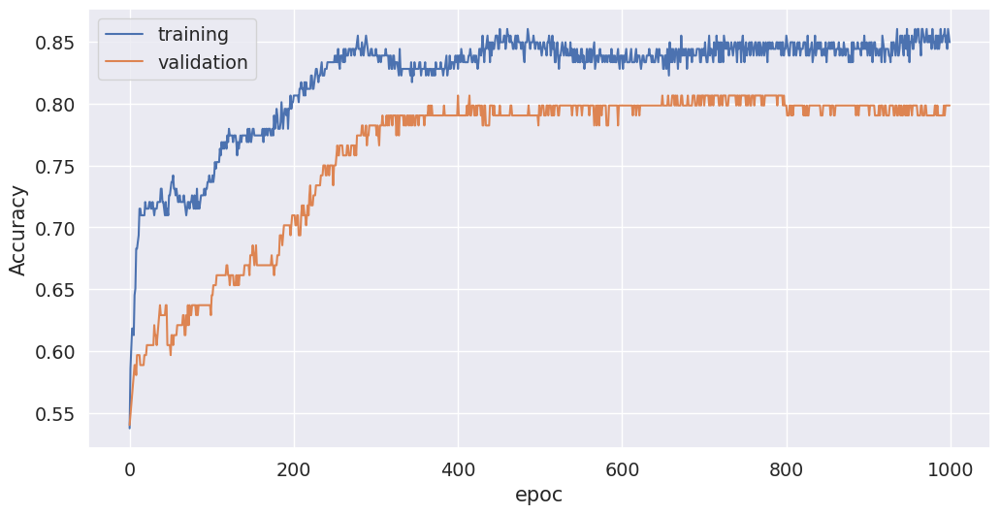

In [107]:
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.ylabel("Accuracy")
plt.xlabel("epoc")
plt.plot(history.history["accuracy"], label="training")
plt.plot(history.history["val_accuracy"], label="validation")
plt.legend()

Que pasa si quiero guardar los pesos de mi mejor modelo: necesito usar callbacks

In [108]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

EarlyStopping para de entrenar el modelo según una condición sobre la variable monitor

In [109]:
es = EarlyStopping(monitor='val_acc', mode='max')

In [110]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(num_classes, activation="softmax"))
opt = keras.optimizers.RMSprop(lr=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_44 (Dense)             (None, 16)                112       
_________________________________________________________________
dense_45 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_46 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_47 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________


In [111]:
history = model.fit(
    X_train.values,
    y_train,
    epochs=1000,
    validation_data=(X_validation.values, y_test),
    callbacks=[es],
)

Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7178 - accuracy: 0.7500

186/186 [==============================] - 0s 817us/step - loss: 0.7175 - accuracy: 0.7043 - val_loss: 0.7156 - val_accuracy: 0.6371


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7174 - accuracy: 0.5938

186/186 [==============================] - 0s 65us/step - loss: 0.7170 - accuracy: 0.7043 - val_loss: 0.7153 - val_accuracy: 0.6371


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7167 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.7166 - accuracy: 0.7043 - val_loss: 0.7151 - val_accuracy: 0.6371


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7165 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.7163 - accuracy: 0.7043 - val_loss: 0.7149 - val_accuracy: 0.6371


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7164 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.7160 - accuracy: 0.7043 - val_loss: 0.7147 - val_accuracy: 0.6371


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7159 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.7157 - accuracy: 0.7043 - val_loss: 0.7145 - val_accuracy: 0.6371


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7159 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.7154 - accuracy: 0.7043 - val_loss: 0.7143 - val_accuracy: 0.6371


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7156 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.7150 - accuracy: 0.7043 - val_loss: 0.7141 - val_accuracy: 0.6371


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7137 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.7147 - accuracy: 0.7043 - val_loss: 0.7139 - val_accuracy: 0.6371


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7140 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.7144 - accuracy: 0.7043 - val_loss: 0.7137 - val_accuracy: 0.6371


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7153 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 0.7141 - accuracy: 0.7043 - val_loss: 0.7135 - val_accuracy: 0.6371


Epoch 12/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7142 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.7138 - accuracy: 0.7043 - val_loss: 0.7133 - val_accuracy: 0.6371


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7134 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.7135 - accuracy: 0.7043 - val_loss: 0.7131 - val_accuracy: 0.6371


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7141 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.7133 - accuracy: 0.7043 - val_loss: 0.7129 - val_accuracy: 0.6371


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7139 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.7130 - accuracy: 0.7043 - val_loss: 0.7127 - val_accuracy: 0.6371


/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/keras/callbacks/callbacks.py:846: RuntimeWarning: Early stopping conditioned on metric `val_acc` which is not available. Available metrics are: val_loss,val_accuracy,loss,accuracy
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


Epoch 16/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7119 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.7127 - accuracy: 0.7043 - val_loss: 0.7125 - val_accuracy: 0.6371


Epoch 17/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7134 - accuracy: 0.6562

186/186 [==============================] - 0s 60us/step - loss: 0.7124 - accuracy: 0.7043 - val_loss: 0.7123 - val_accuracy: 0.6371


Epoch 18/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7119 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.7121 - accuracy: 0.7043 - val_loss: 0.7121 - val_accuracy: 0.6371


Epoch 19/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7116 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.7118 - accuracy: 0.7043 - val_loss: 0.7119 - val_accuracy: 0.6371


Epoch 20/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7120 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.7115 - accuracy: 0.7043 - val_loss: 0.7117 - val_accuracy: 0.6371


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7124 - accuracy: 0.6562

186/186 [==============================] - 0s 59us/step - loss: 0.7112 - accuracy: 0.7043 - val_loss: 0.7115 - val_accuracy: 0.6371


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7122 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.7109 - accuracy: 0.7043 - val_loss: 0.7113 - val_accuracy: 0.6371


Epoch 23/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7119 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.7106 - accuracy: 0.7043 - val_loss: 0.7111 - val_accuracy: 0.6371


Epoch 24/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7108 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.7103 - accuracy: 0.7043 - val_loss: 0.7109 - val_accuracy: 0.6371


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7079 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.7100 - accuracy: 0.7043 - val_loss: 0.7107 - val_accuracy: 0.6371


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7075 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.7097 - accuracy: 0.7043 - val_loss: 0.7105 - val_accuracy: 0.6371


Epoch 27/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7090 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.7094 - accuracy: 0.7043 - val_loss: 0.7103 - val_accuracy: 0.6371


Epoch 28/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7107 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.7091 - accuracy: 0.7043 - val_loss: 0.7101 - val_accuracy: 0.6371


Epoch 29/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7074 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.7088 - accuracy: 0.7043 - val_loss: 0.7099 - val_accuracy: 0.6371


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7113 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.7085 - accuracy: 0.7043 - val_loss: 0.7097 - val_accuracy: 0.6371


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7056 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.7082 - accuracy: 0.7043 - val_loss: 0.7096 - val_accuracy: 0.6371


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7075 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.7079 - accuracy: 0.7043 - val_loss: 0.7094 - val_accuracy: 0.6371


Epoch 33/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7084 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.7076 - accuracy: 0.7043 - val_loss: 0.7092 - val_accuracy: 0.6371


Epoch 34/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7021 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.7073 - accuracy: 0.7043 - val_loss: 0.7091 - val_accuracy: 0.6371


Epoch 35/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7054 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.7071 - accuracy: 0.7043 - val_loss: 0.7089 - val_accuracy: 0.6371


Epoch 36/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7038 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.7068 - accuracy: 0.7043 - val_loss: 0.7087 - val_accuracy: 0.6371


Epoch 37/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7099 - accuracy: 0.6250

186/186 [==============================] - 0s 72us/step - loss: 0.7065 - accuracy: 0.7043 - val_loss: 0.7085 - val_accuracy: 0.6371


Epoch 38/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7030 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.7062 - accuracy: 0.7043 - val_loss: 0.7084 - val_accuracy: 0.6371


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7068 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.7059 - accuracy: 0.7043 - val_loss: 0.7082 - val_accuracy: 0.6371


Epoch 40/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7037 - accuracy: 0.7500



186/186 [==============================] - 0s 66us/step - loss: 0.7056 - accuracy: 0.7043 - val_loss: 0.7081 - val_accuracy: 0.6371


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7019 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.7053 - accuracy: 0.7043 - val_loss: 0.7080 - val_accuracy: 0.6371


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7000 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.7050 - accuracy: 0.7043 - val_loss: 0.7078 - val_accuracy: 0.6371


Epoch 43/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7011 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.7048 - accuracy: 0.7043 - val_loss: 0.7077 - val_accuracy: 0.6371


Epoch 44/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7070 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.7045 - accuracy: 0.7043 - val_loss: 0.7076 - val_accuracy: 0.6371


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7020 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.7042 - accuracy: 0.7043 - val_loss: 0.7074 - val_accuracy: 0.6371


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7049 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.7039 - accuracy: 0.7043 - val_loss: 0.7073 - val_accuracy: 0.6371


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7046 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.7036 - accuracy: 0.7043 - val_loss: 0.7071 - val_accuracy: 0.6371


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6959 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.7033 - accuracy: 0.7043 - val_loss: 0.7069 - val_accuracy: 0.6371


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7024 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.7031 - accuracy: 0.7043 - val_loss: 0.7067 - val_accuracy: 0.6371


Epoch 50/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7003 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.7028 - accuracy: 0.7043 - val_loss: 0.7065 - val_accuracy: 0.6371


Epoch 51/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6946 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.7025 - accuracy: 0.7043 - val_loss: 0.7063 - val_accuracy: 0.6371


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7033 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.7022 - accuracy: 0.7043 - val_loss: 0.7061 - val_accuracy: 0.6371


Epoch 53/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6975 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.7019 - accuracy: 0.7043 - val_loss: 0.7058 - val_accuracy: 0.6371


Epoch 54/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7066 - accuracy: 0.6250

186/186 [==============================] - 0s 79us/step - loss: 0.7017 - accuracy: 0.7043 - val_loss: 0.7056 - val_accuracy: 0.6371


Epoch 55/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7006 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.7014 - accuracy: 0.7043 - val_loss: 0.7054 - val_accuracy: 0.6371


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7101 - accuracy: 0.5625

186/186 [==============================] - 0s 63us/step - loss: 0.7011 - accuracy: 0.7043 - val_loss: 0.7052 - val_accuracy: 0.6371


Epoch 57/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6960 - accuracy: 0.7812



186/186 [==============================] - 0s 69us/step - loss: 0.7008 - accuracy: 0.7043 - val_loss: 0.7050 - val_accuracy: 0.6371


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6957 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.7006 - accuracy: 0.7043 - val_loss: 0.7048 - val_accuracy: 0.6371


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7015 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.7003 - accuracy: 0.7043 - val_loss: 0.7046 - val_accuracy: 0.6371


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6991 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.7000 - accuracy: 0.7043 - val_loss: 0.7044 - val_accuracy: 0.6371


Epoch 61/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7053 - accuracy: 0.6250

186/186 [==============================] - 0s 82us/step - loss: 0.6997 - accuracy: 0.7043 - val_loss: 0.7042 - val_accuracy: 0.6371


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6964 - accuracy: 0.7500

186/186 [==============================] - 0s 173us/step - loss: 0.6995 - accuracy: 0.7043 - val_loss: 0.7040 - val_accuracy: 0.6371


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7005 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.6992 - accuracy: 0.7043 - val_loss: 0.7038 - val_accuracy: 0.6371


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6935 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.6989 - accuracy: 0.7043 - val_loss: 0.7036 - val_accuracy: 0.6371


Epoch 65/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7091 - accuracy: 0.5625

186/186 [==============================] - 0s 68us/step - loss: 0.6986 - accuracy: 0.7043 - val_loss: 0.7034 - val_accuracy: 0.6371


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7043 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.6984 - accuracy: 0.7043 - val_loss: 0.7032 - val_accuracy: 0.6371


Epoch 67/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6948 - accuracy: 0.7500

186/186 [==============================] - 0s 81us/step - loss: 0.6981 - accuracy: 0.7043 - val_loss: 0.7030 - val_accuracy: 0.6371


Epoch 68/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6968 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.6978 - accuracy: 0.7043 - val_loss: 0.7028 - val_accuracy: 0.6371


Epoch 69/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6965 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.6975 - accuracy: 0.7043 - val_loss: 0.7026 - val_accuracy: 0.6371


Epoch 70/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6938 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.6973 - accuracy: 0.7043 - val_loss: 0.7024 - val_accuracy: 0.6371


Epoch 71/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6885 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.6970 - accuracy: 0.7043 - val_loss: 0.7022 - val_accuracy: 0.6371


Epoch 72/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7007 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.6967 - accuracy: 0.7043 - val_loss: 0.7021 - val_accuracy: 0.6371


Epoch 73/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6954 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.6965 - accuracy: 0.7043 - val_loss: 0.7019 - val_accuracy: 0.6371


Epoch 74/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6925 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6962 - accuracy: 0.7043 - val_loss: 0.7017 - val_accuracy: 0.6371


Epoch 75/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7001 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.6959 - accuracy: 0.7043 - val_loss: 0.7015 - val_accuracy: 0.6371


Epoch 76/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6972 - accuracy: 0.6875

186/186 [==============================] - 0s 88us/step - loss: 0.6956 - accuracy: 0.7043 - val_loss: 0.7013 - val_accuracy: 0.6371


Epoch 77/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6915 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.6954 - accuracy: 0.7043 - val_loss: 0.7011 - val_accuracy: 0.6371


Epoch 78/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7049 - accuracy: 0.5938

186/186 [==============================] - 0s 82us/step - loss: 0.6951 - accuracy: 0.7043 - val_loss: 0.7009 - val_accuracy: 0.6371


Epoch 79/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6992 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.6948 - accuracy: 0.7043 - val_loss: 0.7007 - val_accuracy: 0.6371


Epoch 80/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6962 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.6946 - accuracy: 0.7043 - val_loss: 0.7005 - val_accuracy: 0.6371


Epoch 81/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6931 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.6943 - accuracy: 0.7043 - val_loss: 0.7003 - val_accuracy: 0.6371


Epoch 82/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6957 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.6941 - accuracy: 0.7043 - val_loss: 0.7001 - val_accuracy: 0.6371


Epoch 83/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6926 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6938 - accuracy: 0.7043 - val_loss: 0.6999 - val_accuracy: 0.6371


Epoch 84/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6864 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.6935 - accuracy: 0.7043 - val_loss: 0.6997 - val_accuracy: 0.6371


Epoch 85/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7009 - accuracy: 0.6250

186/186 [==============================] - 0s 75us/step - loss: 0.6933 - accuracy: 0.7043 - val_loss: 0.6995 - val_accuracy: 0.6371


Epoch 86/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6857 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.6930 - accuracy: 0.7043 - val_loss: 0.6994 - val_accuracy: 0.6371


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7005 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.6927 - accuracy: 0.7043 - val_loss: 0.6992 - val_accuracy: 0.6371


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6942 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.6925 - accuracy: 0.7043 - val_loss: 0.6990 - val_accuracy: 0.6371


Epoch 89/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6816 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.6922 - accuracy: 0.7043 - val_loss: 0.6988 - val_accuracy: 0.6371


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6906 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.6920 - accuracy: 0.7043 - val_loss: 0.6986 - val_accuracy: 0.6371


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6840 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.6917 - accuracy: 0.7043 - val_loss: 0.6984 - val_accuracy: 0.6371


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6869 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.6914 - accuracy: 0.7043 - val_loss: 0.6982 - val_accuracy: 0.6371


Epoch 93/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7027 - accuracy: 0.5938

186/186 [==============================] - 0s 68us/step - loss: 0.6912 - accuracy: 0.7043 - val_loss: 0.6981 - val_accuracy: 0.6371


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6928 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.6909 - accuracy: 0.7043 - val_loss: 0.6979 - val_accuracy: 0.6371


Epoch 95/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6958 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.6907 - accuracy: 0.7043 - val_loss: 0.6977 - val_accuracy: 0.6371


Epoch 96/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6990 - accuracy: 0.6250

186/186 [==============================] - 0s 75us/step - loss: 0.6904 - accuracy: 0.7043 - val_loss: 0.6975 - val_accuracy: 0.6371


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6718 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.6902 - accuracy: 0.7043 - val_loss: 0.6973 - val_accuracy: 0.6371


Epoch 98/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6850 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.6899 - accuracy: 0.7043 - val_loss: 0.6972 - val_accuracy: 0.6371


Epoch 99/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6916 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.6896 - accuracy: 0.7043 - val_loss: 0.6970 - val_accuracy: 0.6371


Epoch 100/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6809 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.6894 - accuracy: 0.7043 - val_loss: 0.6968 - val_accuracy: 0.6371


Epoch 101/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6981 - accuracy: 0.6250

186/186 [==============================] - 0s 74us/step - loss: 0.6891 - accuracy: 0.7043 - val_loss: 0.6966 - val_accuracy: 0.6371


Epoch 102/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6909 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.6889 - accuracy: 0.7043 - val_loss: 0.6964 - val_accuracy: 0.6371


Epoch 103/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6906 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.6886 - accuracy: 0.7043 - val_loss: 0.6962 - val_accuracy: 0.6371


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6976 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.6883 - accuracy: 0.7043 - val_loss: 0.6960 - val_accuracy: 0.6371


Epoch 105/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6719 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.6881 - accuracy: 0.7043 - val_loss: 0.6959 - val_accuracy: 0.6371


Epoch 106/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6899 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.6879 - accuracy: 0.7043 - val_loss: 0.6957 - val_accuracy: 0.6371


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6897 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.6876 - accuracy: 0.7043 - val_loss: 0.6955 - val_accuracy: 0.6371


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6857 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.6873 - accuracy: 0.7043 - val_loss: 0.6953 - val_accuracy: 0.6371


Epoch 109/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6779 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.6871 - accuracy: 0.7043 - val_loss: 0.6952 - val_accuracy: 0.6371


Epoch 110/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6814 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.6868 - accuracy: 0.7043 - val_loss: 0.6950 - val_accuracy: 0.6371


Epoch 111/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6695 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.6866 - accuracy: 0.7043 - val_loss: 0.6948 - val_accuracy: 0.6371


Epoch 112/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6963 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.6863 - accuracy: 0.7043 - val_loss: 0.6946 - val_accuracy: 0.6371


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6844 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.6861 - accuracy: 0.7043 - val_loss: 0.6945 - val_accuracy: 0.6371


Epoch 114/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6841 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.6858 - accuracy: 0.7043 - val_loss: 0.6943 - val_accuracy: 0.6371


Epoch 115/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6838 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.6856 - accuracy: 0.7043 - val_loss: 0.6941 - val_accuracy: 0.6371


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6836 - accuracy: 0.7188



186/186 [==============================] - 0s 65us/step - loss: 0.6853 - accuracy: 0.7043 - val_loss: 0.6939 - val_accuracy: 0.6371


Epoch 117/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6955 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.6851 - accuracy: 0.7043 - val_loss: 0.6938 - val_accuracy: 0.6371


Epoch 118/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6708 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.6849 - accuracy: 0.7043 - val_loss: 0.6936 - val_accuracy: 0.6371


Epoch 119/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6704 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.6846 - accuracy: 0.7043 - val_loss: 0.6934 - val_accuracy: 0.6371


Epoch 120/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6909 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.6844 - accuracy: 0.7043 - val_loss: 0.6932 - val_accuracy: 0.6371


Epoch 121/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6781 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.6841 - accuracy: 0.7043 - val_loss: 0.6931 - val_accuracy: 0.6371


Epoch 122/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6778 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.6839 - accuracy: 0.7043 - val_loss: 0.6929 - val_accuracy: 0.6371


Epoch 123/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6903 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.6837 - accuracy: 0.7043 - val_loss: 0.6927 - val_accuracy: 0.6371


Epoch 124/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6901 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.6834 - accuracy: 0.7043 - val_loss: 0.6926 - val_accuracy: 0.6371


Epoch 125/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6899 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.6832 - accuracy: 0.7043 - val_loss: 0.6924 - val_accuracy: 0.6371


Epoch 126/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6810 - accuracy: 0.7188

186/186 [==============================] - 0s 79us/step - loss: 0.6829 - accuracy: 0.7043 - val_loss: 0.6922 - val_accuracy: 0.6371


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7027 - accuracy: 0.5625

186/186 [==============================] - 0s 80us/step - loss: 0.6827 - accuracy: 0.7043 - val_loss: 0.6921 - val_accuracy: 0.6371


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7026 - accuracy: 0.5625

186/186 [==============================] - 0s 69us/step - loss: 0.6824 - accuracy: 0.7043 - val_loss: 0.6919 - val_accuracy: 0.6371


Epoch 129/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6802 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.6822 - accuracy: 0.7043 - val_loss: 0.6917 - val_accuracy: 0.6371


Epoch 130/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6620 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.6820 - accuracy: 0.7043 - val_loss: 0.6916 - val_accuracy: 0.6371


Epoch 131/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6752 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.6817 - accuracy: 0.7043 - val_loss: 0.6914 - val_accuracy: 0.6371


Epoch 132/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6840 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.6815 - accuracy: 0.7043 - val_loss: 0.6912 - val_accuracy: 0.6371


Epoch 133/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6838 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.6812 - accuracy: 0.7043 - val_loss: 0.6911 - val_accuracy: 0.6371


Epoch 134/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6743 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.6810 - accuracy: 0.7043 - val_loss: 0.6909 - val_accuracy: 0.6371


Epoch 135/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6834 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.6808 - accuracy: 0.7043 - val_loss: 0.6907 - val_accuracy: 0.6371


Epoch 136/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6785 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.6805 - accuracy: 0.7043 - val_loss: 0.6906 - val_accuracy: 0.6371


Epoch 137/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6782 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.6803 - accuracy: 0.7043 - val_loss: 0.6904 - val_accuracy: 0.6371


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6732 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 0.6800 - accuracy: 0.7043 - val_loss: 0.6902 - val_accuracy: 0.6371


Epoch 139/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6537 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.6798 - accuracy: 0.7043 - val_loss: 0.6901 - val_accuracy: 0.6371


Epoch 140/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6774 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6796 - accuracy: 0.7043 - val_loss: 0.6899 - val_accuracy: 0.6371


Epoch 141/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6577 - accuracy: 0.8438



186/186 [==============================] - 0s 88us/step - loss: 0.6793 - accuracy: 0.7043 - val_loss: 0.6897 - val_accuracy: 0.6371


Epoch 142/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6622 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.6791 - accuracy: 0.7043 - val_loss: 0.6896 - val_accuracy: 0.6371


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6816 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.6789 - accuracy: 0.7043 - val_loss: 0.6894 - val_accuracy: 0.6371


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6715 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.6786 - accuracy: 0.7043 - val_loss: 0.6893 - val_accuracy: 0.6371


Epoch 145/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6762 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.6784 - accuracy: 0.7043 - val_loss: 0.6891 - val_accuracy: 0.6371


Epoch 146/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6911 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 0.6782 - accuracy: 0.7043 - val_loss: 0.6889 - val_accuracy: 0.6371


Epoch 147/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6757 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.6779 - accuracy: 0.7043 - val_loss: 0.6888 - val_accuracy: 0.6371


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6908 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.6777 - accuracy: 0.7043 - val_loss: 0.6886 - val_accuracy: 0.6371


Epoch 149/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6752 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.6775 - accuracy: 0.7043 - val_loss: 0.6885 - val_accuracy: 0.6371


Epoch 150/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6698 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.6772 - accuracy: 0.7043 - val_loss: 0.6883 - val_accuracy: 0.6371


Epoch 151/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6955 - accuracy: 0.5938

186/186 [==============================] - 0s 68us/step - loss: 0.6770 - accuracy: 0.7043 - val_loss: 0.6881 - val_accuracy: 0.6371


Epoch 152/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6797 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.6768 - accuracy: 0.7043 - val_loss: 0.6880 - val_accuracy: 0.6371


Epoch 153/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6637 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.6766 - accuracy: 0.7043 - val_loss: 0.6878 - val_accuracy: 0.6371


Epoch 154/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6740 - accuracy: 0.7188



186/186 [==============================] - 0s 72us/step - loss: 0.6763 - accuracy: 0.7043 - val_loss: 0.6877 - val_accuracy: 0.6371


Epoch 155/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6630 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.6761 - accuracy: 0.7043 - val_loss: 0.6875 - val_accuracy: 0.6371


Epoch 156/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6896 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.6759 - accuracy: 0.7043 - val_loss: 0.6874 - val_accuracy: 0.6371


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6787 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.6757 - accuracy: 0.7043 - val_loss: 0.6872 - val_accuracy: 0.6371


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6676 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.6754 - accuracy: 0.7043 - val_loss: 0.6871 - val_accuracy: 0.6371


Epoch 159/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6618 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.6752 - accuracy: 0.7043 - val_loss: 0.6869 - val_accuracy: 0.6371


Epoch 160/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6780 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.6750 - accuracy: 0.7043 - val_loss: 0.6868 - val_accuracy: 0.6371


Epoch 161/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6723 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6748 - accuracy: 0.7043 - val_loss: 0.6866 - val_accuracy: 0.6371


Epoch 162/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6888 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.6745 - accuracy: 0.7043 - val_loss: 0.6865 - val_accuracy: 0.6371


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6718 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6743 - accuracy: 0.7043 - val_loss: 0.6863 - val_accuracy: 0.6371


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6716 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.6741 - accuracy: 0.7043 - val_loss: 0.6861 - val_accuracy: 0.6371


Epoch 165/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6713 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6739 - accuracy: 0.7043 - val_loss: 0.6860 - val_accuracy: 0.6371


Epoch 166/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6825 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.6736 - accuracy: 0.7043 - val_loss: 0.6859 - val_accuracy: 0.6371


Epoch 167/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6938 - accuracy: 0.5938

186/186 [==============================] - 0s 70us/step - loss: 0.6734 - accuracy: 0.7043 - val_loss: 0.6857 - val_accuracy: 0.6371


Epoch 168/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6764 - accuracy: 0.6875



186/186 [==============================] - 0s 69us/step - loss: 0.6732 - accuracy: 0.7043 - val_loss: 0.6856 - val_accuracy: 0.6371


Epoch 169/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6762 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.6730 - accuracy: 0.7043 - val_loss: 0.6854 - val_accuracy: 0.6371


Epoch 170/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6526 - accuracy: 0.8125



186/186 [==============================] - 0s 132us/step - loss: 0.6728 - accuracy: 0.7043 - val_loss: 0.6853 - val_accuracy: 0.6371


Epoch 171/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6699 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.6725 - accuracy: 0.7043 - val_loss: 0.6851 - val_accuracy: 0.6371


Epoch 172/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6756 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.6723 - accuracy: 0.7043 - val_loss: 0.6850 - val_accuracy: 0.6371


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6873 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 0.6721 - accuracy: 0.7043 - val_loss: 0.6848 - val_accuracy: 0.6371


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6692 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.6719 - accuracy: 0.7043 - val_loss: 0.6847 - val_accuracy: 0.6371


Epoch 175/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6750 - accuracy: 0.6875

186/186 [==============================] - 0s 79us/step - loss: 0.6716 - accuracy: 0.7043 - val_loss: 0.6845 - val_accuracy: 0.6371


Epoch 176/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6929 - accuracy: 0.5938

186/186 [==============================] - 0s 69us/step - loss: 0.6714 - accuracy: 0.7043 - val_loss: 0.6844 - val_accuracy: 0.6371


Epoch 177/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6746 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.6712 - accuracy: 0.7043 - val_loss: 0.6842 - val_accuracy: 0.6371


Epoch 178/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6805 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.6710 - accuracy: 0.7043 - val_loss: 0.6841 - val_accuracy: 0.6371


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6741 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.6708 - accuracy: 0.7043 - val_loss: 0.6839 - val_accuracy: 0.6371


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6492 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.6705 - accuracy: 0.7043 - val_loss: 0.6838 - val_accuracy: 0.6371


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6489 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.6703 - accuracy: 0.7043 - val_loss: 0.6836 - val_accuracy: 0.6371


Epoch 182/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6736 - accuracy: 0.6875

186/186 [==============================]

 - 0s 73us/step - loss: 0.6701 - accuracy: 0.7043 - val_loss: 0.6835 - val_accuracy: 0.6371


Epoch 183/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6734 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.6699 - accuracy: 0.7043 - val_loss: 0.6833 - val_accuracy: 0.6371


Epoch 184/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6732 - accuracy: 0.6875

186/186 [==============================] - 0s 98us/step - loss: 0.6697 - accuracy: 0.7043 - val_loss: 0.6832 - val_accuracy: 0.6371


Epoch 185/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6666 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.6695 - accuracy: 0.7043 - val_loss: 0.6831 - val_accuracy: 0.6371


Epoch 186/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6600 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.6693 - accuracy: 0.7043 - val_loss: 0.6829 - val_accuracy: 0.6371


Epoch 187/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6726 - accuracy: 0.6875

186/186 [==============================] - 0s 79us/step - loss: 0.6691 - accuracy: 0.7043 - val_loss: 0.6828 - val_accuracy: 0.6371


Epoch 188/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7111 - accuracy: 0.5000

186/186 [==============================] - 0s 77us/step - loss: 0.6688 - accuracy: 0.7043 - val_loss: 0.6827 - val_accuracy: 0.6371


Epoch 189/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6592 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.6686 - accuracy: 0.7043 - val_loss: 0.6825 - val_accuracy: 0.6371


Epoch 190/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6655 - accuracy: 0.7188

186/186 [==============================] - 0s 128us/step - loss: 0.6684 - accuracy: 0.7043 - val_loss: 0.6824 - val_accuracy: 0.6371


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6522 - accuracy: 0.7812

186/186 [==============================] - 0s 121us/step - loss: 0.6682 - accuracy: 0.7043 - val_loss: 0.6822 - val_accuracy: 0.6371


Epoch 192/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6716 - accuracy: 0.6875

186/186 [==============================] - 0s 103us/step - loss: 0.6680 - accuracy: 0.7043 - val_loss: 0.6821 - val_accuracy: 0.6371


Epoch 193/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6516 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.6678 - accuracy: 0.7043 - val_loss: 0.6820 - val_accuracy: 0.6371


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6646 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.6676 - accuracy: 0.7043 - val_loss: 0.6818 - val_accuracy: 0.6371


Epoch 195/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6644 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.6674 - accuracy: 0.7043 - val_loss: 0.6817 - val_accuracy: 0.6371


Epoch 196/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6776 - accuracy: 0.6562

186/186 [==============================] - 0s 75us/step - loss: 0.6672 - accuracy: 0.7043 - val_loss: 0.6815 - val_accuracy: 0.6371


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6774 - accuracy: 0.6562



186/186 [==============================] - 0s 71us/step - loss: 0.6669 - accuracy: 0.7043 - val_loss: 0.6814 - val_accuracy: 0.6371


Epoch 198/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6769 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.6667 - accuracy: 0.7043 - val_loss: 0.6813 - val_accuracy: 0.6371


Epoch 199/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6428 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.6664 - accuracy: 0.7043 - val_loss: 0.6811 - val_accuracy: 0.6371


Epoch 200/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6424 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.6662 - accuracy: 0.7043 - val_loss: 0.6810 - val_accuracy: 0.6371


Epoch 201/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6695 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.6660 - accuracy: 0.7043 - val_loss: 0.6809 - val_accuracy: 0.6371


Epoch 202/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6974 - accuracy: 0.5625

186/186 [==============================] - 0s 74us/step - loss: 0.6658 - accuracy: 0.7043 - val_loss: 0.6807 - val_accuracy: 0.6371


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6417 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.6655 - accuracy: 0.7043 - val_loss: 0.6806 - val_accuracy: 0.6371


Epoch 204/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6624 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.6653 - accuracy: 0.7043 - val_loss: 0.6805 - val_accuracy: 0.6371


Epoch 205/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6692 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.6651 - accuracy: 0.7043 - val_loss: 0.6804 - val_accuracy: 0.6371


Epoch 206/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6400 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.6649 - accuracy: 0.7043 - val_loss: 0.6802 - val_accuracy: 0.6371


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6538 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.6646 - accuracy: 0.7043 - val_loss: 0.6801 - val_accuracy: 0.6371


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6757 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.6644 - accuracy: 0.7043 - val_loss: 0.6800 - val_accuracy: 0.6371


Epoch 209/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6613 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.6642 - accuracy: 0.7043 - val_loss: 0.6798 - val_accuracy: 0.6371


Epoch 210/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6600 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.6639 - accuracy: 0.7043 - val_loss: 0.6797 - val_accuracy: 0.6371


Epoch 211/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6681 - accuracy: 0.6875

186/186 [==============================] - 0s 79us/step - loss: 0.6637 - accuracy: 0.7043 - val_loss: 0.6796 - val_accuracy: 0.6371


Epoch 212/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6666 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.6635 - accuracy: 0.7043 - val_loss: 0.6795 - val_accuracy: 0.6371


Epoch 213/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6677 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.6633 - accuracy: 0.7043 - val_loss: 0.6793 - val_accuracy: 0.6371


Epoch 214/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6602 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.6630 - accuracy: 0.7043 - val_loss: 0.6792 - val_accuracy: 0.6371


Epoch 215/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6747 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.6628 - accuracy: 0.7043 - val_loss: 0.6791 - val_accuracy: 0.6371


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6893 - accuracy: 0.5938

186/186 [==============================] - 0s 66us/step - loss: 0.6626 - accuracy: 0.7043 - val_loss: 0.6790 - val_accuracy: 0.6371


Epoch 217/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6596 - accuracy: 0.7188



186/186 [==============================] - 0s 64us/step - loss: 0.6624 - accuracy: 0.7043 - val_loss: 0.6788 - val_accuracy: 0.6371


Epoch 218/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6519 - accuracy: 0.7500



186/186 [==============================] - 0s 74us/step - loss: 0.6621 - accuracy: 0.7043 - val_loss: 0.6787 - val_accuracy: 0.6371


Epoch 219/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6517 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.6619 - accuracy: 0.7043 - val_loss: 0.6786 - val_accuracy: 0.6371


Epoch 220/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6665 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.6617 - accuracy: 0.7043 - val_loss: 0.6785 - val_accuracy: 0.6371


Epoch 221/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6587 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.6614 - accuracy: 0.7043 - val_loss: 0.6783 - val_accuracy: 0.6371


Epoch 222/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6661 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.6612 - accuracy: 0.7043 - val_loss: 0.6782 - val_accuracy: 0.6371


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6354 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.6610 - accuracy: 0.7043 - val_loss: 0.6781 - val_accuracy: 0.6371


Epoch 224/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6504 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.6608 - accuracy: 0.7043 - val_loss: 0.6780 - val_accuracy: 0.6371


Epoch 225/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6733 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.6606 - accuracy: 0.7043 - val_loss: 0.6779 - val_accuracy: 0.6371


Epoch 226/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6242 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.6603 - accuracy: 0.7043 - val_loss: 0.6777 - val_accuracy: 0.6371


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6420 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.6601 - accuracy: 0.7043 - val_loss: 0.6776 - val_accuracy: 0.6371


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6729 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.6599 - accuracy: 0.7043 - val_loss: 0.6775 - val_accuracy: 0.6371


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6620 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.6597 - accuracy: 0.7043 - val_loss: 0.6774 - val_accuracy: 0.6371


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6490 - accuracy: 0.7500



186/186 [==============================] - 0s 73us/step - loss: 0.6595 - accuracy: 0.7043 - val_loss: 0.6773 - val_accuracy: 0.6371


Epoch 231/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6273 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.6592 - accuracy: 0.7043 - val_loss: 0.6772 - val_accuracy: 0.6371


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6533 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.6590 - accuracy: 0.7043 - val_loss: 0.6770 - val_accuracy: 0.6371


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6451 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.6588 - accuracy: 0.7043 - val_loss: 0.6769 - val_accuracy: 0.6371


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6241 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.6586 - accuracy: 0.7043 - val_loss: 0.6768 - val_accuracy: 0.6371


Epoch 235/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6558 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.6584 - accuracy: 0.7043 - val_loss: 0.6767 - val_accuracy: 0.6371


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6637 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.6581 - accuracy: 0.7043 - val_loss: 0.6766 - val_accuracy: 0.6371


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6312 - accuracy: 0.8125



186/186 [==============================] - 0s 71us/step - loss: 0.6579 - accuracy: 0.7043 - val_loss: 0.6765 - val_accuracy: 0.6371


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6471 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.6577 - accuracy: 0.7043 - val_loss: 0.6763 - val_accuracy: 0.6371


Epoch 239/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6877 - accuracy: 0.5938

186/186 [==============================] - 0s 66us/step - loss: 0.6575 - accuracy: 0.7043 - val_loss: 0.6762 - val_accuracy: 0.6371


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6474 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.6573 - accuracy: 0.7043 - val_loss: 0.6761 - val_accuracy: 0.6371


Epoch 241/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6546 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.6570 - accuracy: 0.7043 - val_loss: 0.6760 - val_accuracy: 0.6371


Epoch 242/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6667 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.6568 - accuracy: 0.7043 - val_loss: 0.6759 - val_accuracy: 0.6371


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6708 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.6566 - accuracy: 0.7043 - val_loss: 0.6758 - val_accuracy: 0.6371


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6291 - accuracy: 0.8125

186/186 [==============================] - 0s 85us/step - loss: 0.6564 - accuracy: 0.7043 - val_loss: 0.6757 - val_accuracy: 0.6371


Epoch 245/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6584 - accuracy: 0.6875

186/186 [==============================] - 0s 81us/step - loss: 0.6562 - accuracy: 0.7043 - val_loss: 0.6756 - val_accuracy: 0.6371


Epoch 246/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6872 - accuracy: 0.5938

186/186 [==============================] - 0s 70us/step - loss: 0.6560 - accuracy: 0.7043 - val_loss: 0.6755 - val_accuracy: 0.6371


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6954 - accuracy: 0.5625

186/186 [==============================] - 0s 68us/step - loss: 0.6556 - accuracy: 0.7043 - val_loss: 0.6754 - val_accuracy: 0.6371


Epoch 248/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6527 - accuracy: 0.7188

186/186 [==============================] - 0s 90us/step - loss: 0.6553 - accuracy: 0.7043 - val_loss: 0.6753 - val_accuracy: 0.6371


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7040 - accuracy: 0.5312

186/186 [==============================] - 0s 72us/step - loss: 0.6550 - accuracy: 0.7043 - val_loss: 0.6751 - val_accuracy: 0.6371


Epoch 250/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6516 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.6546 - accuracy: 0.7043 - val_loss: 0.6750 - val_accuracy: 0.6371


Epoch 251/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6514 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.6543 - accuracy: 0.7043 - val_loss: 0.6749 - val_accuracy: 0.6371


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6537 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.6541 - accuracy: 0.7043 - val_loss: 0.6747 - val_accuracy: 0.6371


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6868 - accuracy: 0.5938

186/186 [==============================] - 0s 63us/step - loss: 0.6538 - accuracy: 0.7043 - val_loss: 0.6745 - val_accuracy: 0.6371


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6608 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.6534 - accuracy: 0.7043 - val_loss: 0.6744 - val_accuracy: 0.6371


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6719 - accuracy: 0.6250

186/186 [==============================] - 0s 74us/step - loss: 0.6525 - accuracy: 0.7043 - val_loss: 0.6740 - val_accuracy: 0.6371


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6760 - accuracy: 0.6250

186/186 [==============================] - 0s 75us/step - loss: 0.6514 - accuracy: 0.7043 - val_loss: 0.6735 - val_accuracy: 0.6371


Epoch 257/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6254 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.6505 - accuracy: 0.7043 - val_loss: 0.6728 - val_accuracy: 0.6371


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6405 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.6495 - accuracy: 0.7043 - val_loss: 0.6717 - val_accuracy: 0.6371


Epoch 259/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6416 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.6481 - accuracy: 0.7043 - val_loss: 0.6698 - val_accuracy: 0.6371


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6679 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.6459 - accuracy: 0.7043 - val_loss: 0.6671 - val_accuracy: 0.6371


Epoch 261/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6321 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.6423 - accuracy: 0.7043 - val_loss: 0.6633 - val_accuracy: 0.6371


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6658 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.6377 - accuracy: 0.7043 - val_loss: 0.6597 - val_accuracy: 0.6371


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6325 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.6325 - accuracy: 0.7043 - val_loss: 0.6558 - val_accuracy: 0.6371


Epoch 264/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6359 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.6270 - accuracy: 0.7043 - val_loss: 0.6524 - val_accuracy: 0.6371


Epoch 265/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6158 - accuracy: 0.7188



186/186 [==============================] - 0s 66us/step - loss: 0.6215 - accuracy: 0.7043 - val_loss: 0.6489 - val_accuracy: 0.6371


Epoch 266/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6285 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.6163 - accuracy: 0.7043 - val_loss: 0.6457 - val_accuracy: 0.6371


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6073 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.6113 - accuracy: 0.7043 - val_loss: 0.6426 - val_accuracy: 0.6371


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5881 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.6064 - accuracy: 0.7043 - val_loss: 0.6402 - val_accuracy: 0.6371


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6293 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 0.6026 - accuracy: 0.7043 - val_loss: 0.6378 - val_accuracy: 0.6371


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6107 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.5990 - accuracy: 0.7043 - val_loss: 0.6358 - val_accuracy: 0.6371


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6114 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.5957 - accuracy: 0.7043 - val_loss: 0.6336 - val_accuracy: 0.6371


Epoch 272/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5786 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.5923 - accuracy: 0.7043 - val_loss: 0.6317 - val_accuracy: 0.6371


Epoch 273/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5548 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.5892 - accuracy: 0.7043 - val_loss: 0.6299 - val_accuracy: 0.6371


Epoch 274/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6456 - accuracy: 0.5938

186/186 [==============================] - 0s 75us/step - loss: 0.5862 - accuracy: 0.7043 - val_loss: 0.6282 - val_accuracy: 0.6371


Epoch 275/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5312 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.5833 - accuracy: 0.7043 - val_loss: 0.6268 - val_accuracy: 0.6371


Epoch 276/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5638 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.5807 - accuracy: 0.7043 - val_loss: 0.6255 - val_accuracy: 0.6371


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6252 - accuracy: 0.5938

186/186 [==============================] - 0s 73us/step - loss: 0.5782 - accuracy: 0.7043 - val_loss: 0.6242 - val_accuracy: 0.6371


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5607 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.5759 - accuracy: 0.7043 - val_loss: 0.6230 - val_accuracy: 0.6371


Epoch 279/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6034 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.5736 - accuracy: 0.7043 - val_loss: 0.6220 - val_accuracy: 0.6371


Epoch 280/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6419 - accuracy: 0.6250

186/186 [==============================] - 0s 79us/step - loss: 0.5716 - accuracy: 0.7043 - val_loss: 0.6210 - val_accuracy: 0.6371


Epoch 281/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5508 - accuracy: 0.7188

186/186 [==============================] - 0s 93us/step - loss: 0.5695 - accuracy: 0.7043 - val_loss: 0.6198 - val_accuracy: 0.6371


Epoch 282/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5325 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.5675 - accuracy: 0.7043 - val_loss: 0.6186 - val_accuracy: 0.6371


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4678 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.5654 - accuracy: 0.7043 - val_loss: 0.6174 - val_accuracy: 0.6371


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6263 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.5634 - accuracy: 0.7043 - val_loss: 0.6163 - val_accuracy: 0.6371


Epoch 285/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5914 - accuracy: 0.6250

186/186 [==============================] - 0s 79us/step - loss: 0.5613 - accuracy: 0.7043 - val_loss: 0.6151 - val_accuracy: 0.6371


Epoch 286/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6335 - accuracy: 0.5938

186/186 [==============================] - 0s 73us/step - loss: 0.5593 - accuracy: 0.7043 - val_loss: 0.6139 - val_accuracy: 0.6371


Epoch 287/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6230 - accuracy: 0.5938

186/186 [==============================] - 0s 70us/step - loss: 0.5578 - accuracy: 0.7043 - val_loss: 0.6127 - val_accuracy: 0.6371


Epoch 288/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5846 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.5558 - accuracy: 0.7043 - val_loss: 0.6114 - val_accuracy: 0.6371


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5609 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.5539 - accuracy: 0.7043 - val_loss: 0.6102 - val_accuracy: 0.6371


Epoch 290/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5105 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.5521 - accuracy: 0.7043 - val_loss: 0.6090 - val_accuracy: 0.6371


Epoch 291/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5365 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.5506 - accuracy: 0.7043 - val_loss: 0.6080 - val_accuracy: 0.6371


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5739 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.5486 - accuracy: 0.7043 - val_loss: 0.6069 - val_accuracy: 0.6371


Epoch 293/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5253 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.5470 - accuracy: 0.7043 - val_loss: 0.6057 - val_accuracy: 0.6371


Epoch 294/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5386 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.5454 - accuracy: 0.7043 - val_loss: 0.6044 - val_accuracy: 0.6371


Epoch 295/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5116 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.5438 - accuracy: 0.7043 - val_loss: 0.6031 - val_accuracy: 0.6371


Epoch 296/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4820 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.5426 - accuracy: 0.7043 - val_loss: 0.6023 - val_accuracy: 0.6371


Epoch 297/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4740 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.5409 - accuracy: 0.7043 - val_loss: 0.6013 - val_accuracy: 0.6371


Epoch 298/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5832 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.5396 - accuracy: 0.7043 - val_loss: 0.6004 - val_accuracy: 0.6371


Epoch 299/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5600 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.5382 - accuracy: 0.7043 - val_loss: 0.5994 - val_accuracy: 0.6371


Epoch 300/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4710 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.5368 - accuracy: 0.7043 - val_loss: 0.5985 - val_accuracy: 0.6371


Epoch 301/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5442 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.5359 - accuracy: 0.7043 - val_loss: 0.5976 - val_accuracy: 0.6371


Epoch 302/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5212 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.5341 - accuracy: 0.7043 - val_loss: 0.5968 - val_accuracy: 0.6371


Epoch 303/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5607 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.5328 - accuracy: 0.7043 - val_loss: 0.5960 - val_accuracy: 0.6371


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5645 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.5316 - accuracy: 0.7043 - val_loss: 0.5949 - val_accuracy: 0.6371


Epoch 305/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4621 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.5303 - accuracy: 0.7043 - val_loss: 0.5938 - val_accuracy: 0.6371


Epoch 306/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5980 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.5292 - accuracy: 0.7043 - val_loss: 0.5931 - val_accuracy: 0.6371


Epoch 307/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4432 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.5279 - accuracy: 0.7043 - val_loss: 0.5921 - val_accuracy: 0.6371


Epoch 308/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4685 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.5265 - accuracy: 0.7043 - val_loss: 0.5911 - val_accuracy: 0.6371


Epoch 309/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4571 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.5251 - accuracy: 0.7043 - val_loss: 0.5898 - val_accuracy: 0.6371


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5632 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.5240 - accuracy: 0.7043 - val_loss: 0.5888 - val_accuracy: 0.6371


Epoch 311/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6351 - accuracy: 0.5312

186/186 [==============================] - 0s 64us/step - loss: 0.5223 - accuracy: 0.7043 - val_loss: 0.5877 - val_accuracy: 0.6371


Epoch 312/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5655 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.5214 - accuracy: 0.7043 - val_loss: 0.5867 - val_accuracy: 0.6371


Epoch 313/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4493 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.5202 - accuracy: 0.7043 - val_loss: 0.5858 - val_accuracy: 0.6371


Epoch 314/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5554 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.5188 - accuracy: 0.7043 - val_loss: 0.5850 - val_accuracy: 0.6371


Epoch 315/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4935 - accuracy: 0.7188

186/186 [==============================] - 0s 61us/step - loss: 0.5176 - accuracy: 0.7043 - val_loss: 0.5840 - val_accuracy: 0.6371


Epoch 316/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5193 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.5163 - accuracy: 0.7043 - val_loss: 0.5831 - val_accuracy: 0.6371


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4712 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.5154 - accuracy: 0.7043 - val_loss: 0.5824 - val_accuracy: 0.6371


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5517 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.5139 - accuracy: 0.7043 - val_loss: 0.5815 - val_accuracy: 0.6371


Epoch 319/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5814 - accuracy: 0.6250

186/186 [==============================] - 0s 62us/step - loss: 0.5127 - accuracy: 0.7043 - val_loss: 0.5807 - val_accuracy: 0.6371


Epoch 320/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4499 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.5116 - accuracy: 0.7043 - val_loss: 0.5797 - val_accuracy: 0.6371


Epoch 321/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5167 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.5104 - accuracy: 0.7043 - val_loss: 0.5789 - val_accuracy: 0.6371


Epoch 322/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4957 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.5090 - accuracy: 0.7043 - val_loss: 0.5780 - val_accuracy: 0.6371


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3847 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.5081 - accuracy: 0.7043 - val_loss: 0.5771 - val_accuracy: 0.6371


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5563 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.5067 - accuracy: 0.7043 - val_loss: 0.5763 - val_accuracy: 0.6371


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6241 - accuracy: 0.5625

186/186 [==============================] - 0s 61us/step - loss: 0.5058 - accuracy: 0.7043 - val_loss: 0.5756 - val_accuracy: 0.6371


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5606 - accuracy: 0.6250

186/186 [==============================] - 0s 63us/step - loss: 0.5046 - accuracy: 0.7043 - val_loss: 0.5747 - val_accuracy: 0.6371


Epoch 327/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5501 - accuracy: 0.6250

186/186 [==============================] - 0s 79us/step - loss: 0.5035 - accuracy: 0.7043 - val_loss: 0.5740 - val_accuracy: 0.6371


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3798 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.5026 - accuracy: 0.7043 - val_loss: 0.5732 - val_accuracy: 0.6371


Epoch 329/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6077 - accuracy: 0.5625

186/186 [==============================] - 0s 74us/step - loss: 0.5014 - accuracy: 0.7043 - val_loss: 0.5727 - val_accuracy: 0.6371


Epoch 330/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5782 - accuracy: 0.6250

186/186 [==============================] - 0s 83us/step - loss: 0.5004 - accuracy: 0.7043 - val_loss: 0.5720 - val_accuracy: 0.6371


Epoch 331/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4619 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4994 - accuracy: 0.7043 - val_loss: 0.5713 - val_accuracy: 0.6371


Epoch 332/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5161 - accuracy: 0.6562

186/186 [==============================] - 0s 100us/step - loss: 0.4982 - accuracy: 0.7043 - val_loss: 0.5707 - val_accuracy: 0.6371


Epoch 333/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5535 - accuracy: 0.7188

186/186 [==============================] - 0s 81us/step - loss: 0.4972 - accuracy: 0.7043 - val_loss: 0.5698 - val_accuracy: 0.6371


Epoch 334/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5104 - accuracy: 0.6875



186/186 [==============================] - 0s 62us/step - loss: 0.4966 - accuracy: 0.7043 - val_loss: 0.5691 - val_accuracy: 0.6371


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5583 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.4952 - accuracy: 0.7043 - val_loss: 0.5686 - val_accuracy: 0.6371


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4834 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4946 - accuracy: 0.7043 - val_loss: 0.5679 - val_accuracy: 0.6371


Epoch 337/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4952 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.4933 - accuracy: 0.7043 - val_loss: 0.5672 - val_accuracy: 0.6371


Epoch 338/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4326 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4928 - accuracy: 0.7043 - val_loss: 0.5665 - val_accuracy: 0.6371


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5260 - accuracy: 0.6875

186/186 [==============================] - 0s 61us/step - loss: 0.4915 - accuracy: 0.7043 - val_loss: 0.5658 - val_accuracy: 0.6371


Epoch 340/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5872 - accuracy: 0.6250



186/186 [==============================] - 0s 76us/step - loss: 0.4907 - accuracy: 0.7043 - val_loss: 0.5652 - val_accuracy: 0.6371


Epoch 341/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5458 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.4895 - accuracy: 0.7043 - val_loss: 0.5645 - val_accuracy: 0.6371


Epoch 342/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5342 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.4887 - accuracy: 0.7043 - val_loss: 0.5637 - val_accuracy: 0.6371


Epoch 343/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4415 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.4877 - accuracy: 0.7043 - val_loss: 0.5630 - val_accuracy: 0.6371


Epoch 344/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4847 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.4865 - accuracy: 0.7043 - val_loss: 0.5623 - val_accuracy: 0.6371


Epoch 345/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5671 - accuracy: 0.6250

186/186 [==============================] - 0s 85us/step - loss: 0.4855 - accuracy: 0.7043 - val_loss: 0.5615 - val_accuracy: 0.6371


Epoch 346/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4171 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4845 - accuracy: 0.7043 - val_loss: 0.5608 - val_accuracy: 0.6371


Epoch 347/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4894 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4833 - accuracy: 0.7043 - val_loss: 0.5600 - val_accuracy: 0.6371


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4521 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4824 - accuracy: 0.7043 - val_loss: 0.5592 - val_accuracy: 0.6371


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4797 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.4811 - accuracy: 0.7043 - val_loss: 0.5585 - val_accuracy: 0.6371


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4155 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.4801 - accuracy: 0.7043 - val_loss: 0.5579 - val_accuracy: 0.6371


Epoch 351/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4733 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.4791 - accuracy: 0.7043 - val_loss: 0.5571 - val_accuracy: 0.6371


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4337 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.4782 - accuracy: 0.7043 - val_loss: 0.5563 - val_accuracy: 0.6371


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5400 - accuracy: 0.6250

186/186 [==============================] - 0s 76us/step - loss: 0.4768 - accuracy: 0.7043 - val_loss: 0.5556 - val_accuracy: 0.6371


Epoch 354/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3687 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.4761 - accuracy: 0.7043 - val_loss: 0.5548 - val_accuracy: 0.6371


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3573 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.4750 - accuracy: 0.7043 - val_loss: 0.5540 - val_accuracy: 0.6371


Epoch 356/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4664 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.4737 - accuracy: 0.7043 - val_loss: 0.5532 - val_accuracy: 0.6371


Epoch 357/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4691 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.4729 - accuracy: 0.7043 - val_loss: 0.5524 - val_accuracy: 0.6371


Epoch 358/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3614 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4722 - accuracy: 0.7043 - val_loss: 0.5518 - val_accuracy: 0.6371


Epoch 359/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4684 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.4708 - accuracy: 0.7043 - val_loss: 0.5511 - val_accuracy: 0.6371


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5750 - accuracy: 0.5625

186/186 [==============================] - 0s 68us/step - loss: 0.4700 - accuracy: 0.7043 - val_loss: 0.5504 - val_accuracy: 0.6371


Epoch 361/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4315 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4690 - accuracy: 0.7043 - val_loss: 0.5497 - val_accuracy: 0.6371


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4551 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.4681 - accuracy: 0.7043 - val_loss: 0.5490 - val_accuracy: 0.6371


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4320 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.4673 - accuracy: 0.7043 - val_loss: 0.5482 - val_accuracy: 0.6371


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3980 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4660 - accuracy: 0.7043 - val_loss: 0.5475 - val_accuracy: 0.6371


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3760 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4654 - accuracy: 0.7043 - val_loss: 0.5469 - val_accuracy: 0.6371


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5342 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.4645 - accuracy: 0.7043 - val_loss: 0.5463 - val_accuracy: 0.6371


Epoch 367/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5850 - accuracy: 0.5938

186/186 [==============================] - 0s 63us/step - loss: 0.4635 - accuracy: 0.7043 - val_loss: 0.5458 - val_accuracy: 0.6371


Epoch 368/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3676 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4628 - accuracy: 0.7043 - val_loss: 0.5451 - val_accuracy: 0.6371


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3562 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.4618 - accuracy: 0.7043 - val_loss: 0.5446 - val_accuracy: 0.6371


Epoch 370/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5650 - accuracy: 0.6250

186/186 [==============================] - 0s 62us/step - loss: 0.4612 - accuracy: 0.7043 - val_loss: 0.5440 - val_accuracy: 0.6371


Epoch 371/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4718 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.4603 - accuracy: 0.7043 - val_loss: 0.5435 - val_accuracy: 0.6371


Epoch 372/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2903 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.4600 - accuracy: 0.7043 - val_loss: 0.5430 - val_accuracy: 0.6371


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4661 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.4588 - accuracy: 0.7043 - val_loss: 0.5423 - val_accuracy: 0.6371


Epoch 374/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3642 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4581 - accuracy: 0.7043 - val_loss: 0.5418 - val_accuracy: 0.6371


Epoch 375/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3911 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4575 - accuracy: 0.7043 - val_loss: 0.5412 - val_accuracy: 0.6371


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4915 - accuracy: 0.5938

186/186 [==============================] - 0s 66us/step - loss: 0.4566 - accuracy: 0.7043 - val_loss: 0.5406 - val_accuracy: 0.6371


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4409 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.4556 - accuracy: 0.7043 - val_loss: 0.5400 - val_accuracy: 0.6371


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4864 - accuracy: 0.7188

186/186 [==============================] - 0s 101us/step - loss: 0.4548 - accuracy: 0.7043 - val_loss: 0.5394 - val_accuracy: 0.6371


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3832 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.4547 - accuracy: 0.7043 - val_loss: 0.5388 - val_accuracy: 0.6371


Epoch 380/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4254 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.4533 - accuracy: 0.7043 - val_loss: 0.5381 - val_accuracy: 0.6371


Epoch 381/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3898 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.4526 - accuracy: 0.7043 - val_loss: 0.5374 - val_accuracy: 0.6371


Epoch 382/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4294 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.4518 - accuracy: 0.7043 - val_loss: 0.5368 - val_accuracy: 0.6371


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3926 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.4516 - accuracy: 0.7043 - val_loss: 0.5363 - val_accuracy: 0.6371


Epoch 384/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4264 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.4505 - accuracy: 0.7043 - val_loss: 0.5359 - val_accuracy: 0.6371


Epoch 385/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2459 - accuracy: 1.0000

186/186 [==============================] - 0s 76us/step - loss: 0.4505 - accuracy: 0.7043 - val_loss: 0.5355 - val_accuracy: 0.6371


Epoch 386/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5092 - accuracy: 0.5938

186/186 [==============================] - 0s 78us/step - loss: 0.4495 - accuracy: 0.7043 - val_loss: 0.5350 - val_accuracy: 0.6371


Epoch 387/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4811 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.4485 - accuracy: 0.7043 - val_loss: 0.5345 - val_accuracy: 0.6371


Epoch 388/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4548 - accuracy: 0.6875



186/186 [==============================] - 0s 74us/step - loss: 0.4479 - accuracy: 0.7043 - val_loss: 0.5339 - val_accuracy: 0.6371


Epoch 389/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4266 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.4475 - accuracy: 0.7043 - val_loss: 0.5335 - val_accuracy: 0.6371


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6191 - accuracy: 0.5312

186/186 [==============================] - 0s 73us/step - loss: 0.4467 - accuracy: 0.7043 - val_loss: 0.5329 - val_accuracy: 0.6371


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3632 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.4458 - accuracy: 0.7043 - val_loss: 0.5325 - val_accuracy: 0.6371


Epoch 392/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4355 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4453 - accuracy: 0.7043 - val_loss: 0.5320 - val_accuracy: 0.6371


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4989 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.4449 - accuracy: 0.7043 - val_loss: 0.5317 - val_accuracy: 0.6371


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4130 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.4439 - accuracy: 0.7043 - val_loss: 0.5310 - val_accuracy: 0.6371


Epoch 395/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4736 - accuracy: 0.6875

186/186 [==============================] - 0s 95us/step - loss: 0.4431 - accuracy: 0.7043 - val_loss: 0.5306 - val_accuracy: 0.6371


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5228 - accuracy: 0.6250

186/186 [==============================] - 0s 75us/step - loss: 0.4427 - accuracy: 0.7043 - val_loss: 0.5301 - val_accuracy: 0.6371


Epoch 397/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4252 - accuracy: 0.7500

186/186 [==============================] - 0s 102us/step - loss: 0.4420 - accuracy: 0.7043 - val_loss: 0.5297 - val_accuracy: 0.6371


Epoch 398/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4318 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4412 - accuracy: 0.7043 - val_loss: 0.5293 - val_accuracy: 0.6371


Epoch 399/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4291 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.4409 - accuracy: 0.7043 - val_loss: 0.5285 - val_accuracy: 0.6371


Epoch 400/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4154 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.4406 - accuracy: 0.7043 - val_loss: 0.5279 - val_accuracy: 0.6371


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4499 - accuracy: 0.6875

186/186 [==============================] - 0s 79us/step - loss: 0.4396 - accuracy: 0.7043 - val_loss: 0.5276 - val_accuracy: 0.6371


Epoch 402/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4930 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.4393 - accuracy: 0.7043 - val_loss: 0.5274 - val_accuracy: 0.6371


Epoch 403/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4626 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.4384 - accuracy: 0.7043 - val_loss: 0.5270 - val_accuracy: 0.6371


Epoch 404/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4952 - accuracy: 0.5938

186/186 [==============================] - 0s 66us/step - loss: 0.4379 - accuracy: 0.7043 - val_loss: 0.5268 - val_accuracy: 0.6371


Epoch 405/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3359 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.4381 - accuracy: 0.7043 - val_loss: 0.5263 - val_accuracy: 0.6371


Epoch 406/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4174 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.4369 - accuracy: 0.7043 - val_loss: 0.5255 - val_accuracy: 0.6371


Epoch 407/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4218 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4362 - accuracy: 0.7043 - val_loss: 0.5250 - val_accuracy: 0.6371


Epoch 408/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4783 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.4361 - accuracy: 0.7043 - val_loss: 0.5243 - val_accuracy: 0.6371


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4929 - accuracy: 0.6250

186/186 [==============================] - 0s 73us/step - loss: 0.4353 - accuracy: 0.7043 - val_loss: 0.5242 - val_accuracy: 0.6371


Epoch 410/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4045 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.4347 - accuracy: 0.7043 - val_loss: 0.5239 - val_accuracy: 0.6371


Epoch 411/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3674 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4343 - accuracy: 0.7043 - val_loss: 0.5235 - val_accuracy: 0.6371


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3998 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.4335 - accuracy: 0.7043 - val_loss: 0.5225 - val_accuracy: 0.6371


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4583 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.4331 - accuracy: 0.7043 - val_loss: 0.5224 - val_accuracy: 0.6371


Epoch 414/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4576 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.4325 - accuracy: 0.7043 - val_loss: 0.5220 - val_accuracy: 0.6371


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3848 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.4323 - accuracy: 0.7043 - val_loss: 0.5215 - val_accuracy: 0.6371


Epoch 416/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3486 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4316 - accuracy: 0.7043 - val_loss: 0.5210 - val_accuracy: 0.6371


Epoch 417/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4205 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.4312 - accuracy: 0.7043 - val_loss: 0.5204 - val_accuracy: 0.6371


Epoch 418/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4146 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.4303 - accuracy: 0.7043 - val_loss: 0.5202 - val_accuracy: 0.6371


Epoch 419/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3436 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.4302 - accuracy: 0.7043 - val_loss: 0.5198 - val_accuracy: 0.6371


Epoch 420/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3875 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4295 - accuracy: 0.7043 - val_loss: 0.5193 - val_accuracy: 0.6371


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3591 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.4290 - accuracy: 0.7043 - val_loss: 0.5192 - val_accuracy: 0.6371


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3511 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4286 - accuracy: 0.7043 - val_loss: 0.5181 - val_accuracy: 0.6371


Epoch 423/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3535 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4280 - accuracy: 0.7043 - val_loss: 0.5175 - val_accuracy: 0.6371


Epoch 424/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4273 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.4277 - accuracy: 0.7043 - val_loss: 0.5171 - val_accuracy: 0.6371


Epoch 425/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3987 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4275 - accuracy: 0.7043 - val_loss: 0.5167 - val_accuracy: 0.6371


Epoch 426/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3758 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4266 - accuracy: 0.7043 - val_loss: 0.5164 - val_accuracy: 0.6371


Epoch 427/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3734 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.4263 - accuracy: 0.7043 - val_loss: 0.5168 - val_accuracy: 0.6371


Epoch 428/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3361 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.4265 - accuracy: 0.7043 - val_loss: 0.5164 - val_accuracy: 0.6371


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4329 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4255 - accuracy: 0.7043 - val_loss: 0.5160 - val_accuracy: 0.6371


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4076 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.4253 - accuracy: 0.7043 - val_loss: 0.5160 - val_accuracy: 0.6371


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3691 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.4247 - accuracy: 0.7043 - val_loss: 0.5156 - val_accuracy: 0.6371


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4645 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.4246 - accuracy: 0.7043 - val_loss: 0.5149 - val_accuracy: 0.6371


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4165 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.4239 - accuracy: 0.7043 - val_loss: 0.5142 - val_accuracy: 0.6371


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3888 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.4237 - accuracy: 0.7043 - val_loss: 0.5144 - val_accuracy: 0.6371


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5564 - accuracy: 0.5625

186/186 [==============================] - 0s 66us/step - loss: 0.4237 - accuracy: 0.7043 - val_loss: 0.5141 - val_accuracy: 0.6371


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4092 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.4229 - accuracy: 0.7043 - val_loss: 0.5136 - val_accuracy: 0.6371


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5337 - accuracy: 0.5312

186/186 [==============================] - 0s 67us/step - loss: 0.4227 - accuracy: 0.7043 - val_loss: 0.5135 - val_accuracy: 0.6371


Epoch 438/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5158 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.4221 - accuracy: 0.7043 - val_loss: 0.5130 - val_accuracy: 0.6371


Epoch 439/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4801 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.4217 - accuracy: 0.7043 - val_loss: 0.5126 - val_accuracy: 0.6371


Epoch 440/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4087 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.4213 - accuracy: 0.7043 - val_loss: 0.5125 - val_accuracy: 0.6371


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3672 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.4210 - accuracy: 0.7043 - val_loss: 0.5116 - val_accuracy: 0.6371


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4337 - accuracy: 0.6250

186/186 [==============================] - 0s 68us/step - loss: 0.4206 - accuracy: 0.7043 - val_loss: 0.5111 - val_accuracy: 0.6371


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2685 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.4206 - accuracy: 0.7043 - val_loss: 0.5110 - val_accuracy: 0.6371


Epoch 444/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4055 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.4201 - accuracy: 0.7043 - val_loss: 0.5106 - val_accuracy: 0.6371


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3664 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.4199 - accuracy: 0.7043 - val_loss: 0.5103 - val_accuracy: 0.6371


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3782 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.4191 - accuracy: 0.7043 - val_loss: 0.5103 - val_accuracy: 0.6371


Epoch 447/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3972 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.4191 - accuracy: 0.7043 - val_loss: 0.5102 - val_accuracy: 0.6371


Epoch 448/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3886 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.4188 - accuracy: 0.7043 - val_loss: 0.5098 - val_accuracy: 0.6371


Epoch 449/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4011 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.4184 - accuracy: 0.7043 - val_loss: 0.5095 - val_accuracy: 0.6371


Epoch 450/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5187 - accuracy: 0.5938

186/186 [==============================] - 0s 69us/step - loss: 0.4179 - accuracy: 0.7043 - val_loss: 0.5095 - val_accuracy: 0.6371


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4992 - accuracy: 0.6250

186/186 [==============================] - 0s 63us/step - loss: 0.4179 - accuracy: 0.7043 - val_loss: 0.5094 - val_accuracy: 0.6371


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4643 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.4174 - accuracy: 0.7043 - val_loss: 0.5092 - val_accuracy: 0.6371


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4739 - accuracy: 0.5938

186/186 [==============================] - 0s 68us/step - loss: 0.4170 - accuracy: 0.7043 - val_loss: 0.5088 - val_accuracy: 0.6371


Epoch 454/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4909 - accuracy: 0.5938

186/186 [==============================] - 0s 69us/step - loss: 0.4171 - accuracy: 0.7043 - val_loss: 0.5083 - val_accuracy: 0.6371


Epoch 455/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4880 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.4166 - accuracy: 0.7043 - val_loss: 0.5083 - val_accuracy: 0.6371


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3945 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4162 - accuracy: 0.7043 - val_loss: 0.5079 - val_accuracy: 0.6371


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5113 - accuracy: 0.5938

186/186 [==============================] - 0s 68us/step - loss: 0.4163 - accuracy: 0.7043 - val_loss: 0.5076 - val_accuracy: 0.6371


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3258 - accuracy: 0.7500

186/186 [==============================] - 0s 80us/step - loss: 0.4156 - accuracy: 0.7043 - val_loss: 0.5077 - val_accuracy: 0.6371


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5748 - accuracy: 0.5938

186/186 [==============================] - 0s 69us/step - loss: 0.4155 - accuracy: 0.7043 - val_loss: 0.5075 - val_accuracy: 0.6371


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3037 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4152 - accuracy: 0.7043 - val_loss: 0.5072 - val_accuracy: 0.6371


Epoch 461/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4620 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.4148 - accuracy: 0.7043 - val_loss: 0.5065 - val_accuracy: 0.6371


Epoch 462/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2961 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.4145 - accuracy: 0.7043 - val_loss: 0.5061 - val_accuracy: 0.6371


Epoch 463/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3291 - accuracy: 0.7500

186/186 [==============================] - 0s 90us/step - loss: 0.4144 - accuracy: 0.7043 - val_loss: 0.5059 - val_accuracy: 0.6371


Epoch 464/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3296 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4146 - accuracy: 0.7043 - val_loss: 0.5058 - val_accuracy: 0.6371


Epoch 465/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5131 - accuracy: 0.5938

186/186 [==============================] - 0s 65us/step - loss: 0.4139 - accuracy: 0.7043 - val_loss: 0.5053 - val_accuracy: 0.6371


Epoch 466/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3728 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4132 - accuracy: 0.7043 - val_loss: 0.5053 - val_accuracy: 0.6371


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3047 - accuracy: 0.7812

186/186 [==============================] - 0s 114us/step - loss: 0.4139 - accuracy: 0.7043 - val_loss: 0.5052 - val_accuracy: 0.6371


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5210 - accuracy: 0.5625

186/186 [==============================] - 0s 74us/step - loss: 0.4132 - accuracy: 0.7043 - val_loss: 0.5049 - val_accuracy: 0.6371


Epoch 469/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4275 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.4128 - accuracy: 0.7043 - val_loss: 0.5044 - val_accuracy: 0.6371


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3735 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.4125 - accuracy: 0.7043 - val_loss: 0.5048 - val_accuracy: 0.6371


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5517 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.4122 - accuracy: 0.7043 - val_loss: 0.5050 - val_accuracy: 0.6371


Epoch 472/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4786 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.4118 - accuracy: 0.7043 - val_loss: 0.5048 - val_accuracy: 0.6371


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4781 - accuracy: 0.5625

186/186 [==============================] - 0s 71us/step - loss: 0.4118 - accuracy: 0.7043 - val_loss: 0.5043 - val_accuracy: 0.6371


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3453 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.4116 - accuracy: 0.7043 - val_loss: 0.5036 - val_accuracy: 0.6371


Epoch 475/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3940 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.4110 - accuracy: 0.7043 - val_loss: 0.5031 - val_accuracy: 0.6371


Epoch 476/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3704 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.4112 - accuracy: 0.7043 - val_loss: 0.5030 - val_accuracy: 0.6371


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3851 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.4108 - accuracy: 0.7043 - val_loss: 0.5030 - val_accuracy: 0.6371


Epoch 478/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4495 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.4102 - accuracy: 0.7043 - val_loss: 0.5025 - val_accuracy: 0.6371


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3823 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.4101 - accuracy: 0.7043 - val_loss: 0.5030 - val_accuracy: 0.6371


Epoch 480/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3097 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.4102 - accuracy: 0.7043 - val_loss: 0.5023 - val_accuracy: 0.6371


Epoch 481/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5901 - accuracy: 0.5000

186/186 [==============================] - 0s 74us/step - loss: 0.4102 - accuracy: 0.7043 - val_loss: 0.5026 - val_accuracy: 0.6371


Epoch 482/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4094 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4092 - accuracy: 0.7043 - val_loss: 0.5026 - val_accuracy: 0.6371


Epoch 483/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4841 - accuracy: 0.6250

186/186 [==============================] - 0s 74us/step - loss: 0.4091 - accuracy: 0.7043 - val_loss: 0.5024 - val_accuracy: 0.6290


Epoch 484/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4443 - accuracy: 0.6562

186/186 [==============================] - 0s 75us/step - loss: 0.4088 - accuracy: 0.7043 - val_loss: 0.5025 - val_accuracy: 0.6290


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5361 - accuracy: 0.6250

186/186 [==============================] - 0s 76us/step - loss: 0.4088 - accuracy: 0.7043 - val_loss: 0.5021 - val_accuracy: 0.6290


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2964 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4084 - accuracy: 0.7043 - val_loss: 0.5009 - val_accuracy: 0.6290


Epoch 487/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5122 - accuracy: 0.5938

186/186 [==============================] - 0s 68us/step - loss: 0.4080 - accuracy: 0.7043 - val_loss: 0.5010 - val_accuracy: 0.6290


Epoch 488/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2729 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4081 - accuracy: 0.7043 - val_loss: 0.5004 - val_accuracy: 0.6290


Epoch 489/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4037 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.4079 - accuracy: 0.7043 - val_loss: 0.5000 - val_accuracy: 0.6290


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3607 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.4074 - accuracy: 0.7043 - val_loss: 0.5003 - val_accuracy: 0.6290


Epoch 491/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3914 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.4075 - accuracy: 0.7043 - val_loss: 0.5004 - val_accuracy: 0.6290


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4925 - accuracy: 0.5625

186/186 [==============================] - 0s 65us/step - loss: 0.4073 - accuracy: 0.7043 - val_loss: 0.4995 - val_accuracy: 0.6290


Epoch 493/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4224 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.4071 - accuracy: 0.7043 - val_loss: 0.4994 - val_accuracy: 0.6290


Epoch 494/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3135 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.4065 - accuracy: 0.7043 - val_loss: 0.4996 - val_accuracy: 0.6290


Epoch 495/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2479 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.4067 - accuracy: 0.7043 - val_loss: 0.4995 - val_accuracy: 0.6290


Epoch 496/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3149 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.4061 - accuracy: 0.7043 - val_loss: 0.4991 - val_accuracy: 0.6290


Epoch 497/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4637 - accuracy: 0.6562

186/186 [==============================] - 0s 76us/step - loss: 0.4060 - accuracy: 0.7043 - val_loss: 0.4991 - val_accuracy: 0.6290


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3853 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.4056 - accuracy: 0.7043 - val_loss: 0.4986 - val_accuracy: 0.6290


Epoch 499/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4077 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.4053 - accuracy: 0.7043 - val_loss: 0.4980 - val_accuracy: 0.6290


Epoch 500/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4330 - accuracy: 0.5938

186/186 [==============================] - 0s 72us/step - loss: 0.4054 - accuracy: 0.7043 - val_loss: 0.4977 - val_accuracy: 0.6290


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3756 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4048 - accuracy: 0.7043 - val_loss: 0.4979 - val_accuracy: 0.6290


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3697 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4050 - accuracy: 0.7043 - val_loss: 0.4976 - val_accuracy: 0.6290


Epoch 503/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4935 - accuracy: 0.5938

186/186 [==============================] - 0s 65us/step - loss: 0.4047 - accuracy: 0.7043 - val_loss: 0.4978 - val_accuracy: 0.6290


Epoch 504/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3365 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.4041 - accuracy: 0.7043 - val_loss: 0.4969 - val_accuracy: 0.6290


Epoch 505/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4117 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.4041 - accuracy: 0.7043 - val_loss: 0.4963 - val_accuracy: 0.6290


Epoch 506/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4412 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.4040 - accuracy: 0.7043 - val_loss: 0.4958 - val_accuracy: 0.6290


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3277 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.4037 - accuracy: 0.7043 - val_loss: 0.4956 - val_accuracy: 0.6290


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4239 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4035 - accuracy: 0.7043 - val_loss: 0.4954 - val_accuracy: 0.6290


Epoch 509/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3051 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 0.4032 - accuracy: 0.7043 - val_loss: 0.4958 - val_accuracy: 0.6290


Epoch 510/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2601 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.4029 - accuracy: 0.7043 - val_loss: 0.4952 - val_accuracy: 0.6290


Epoch 511/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4626 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.4033 - accuracy: 0.7043 - val_loss: 0.4953 - val_accuracy: 0.6290


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3806 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.4027 - accuracy: 0.7043 - val_loss: 0.4951 - val_accuracy: 0.6290


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3926 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.4024 - accuracy: 0.7043 - val_loss: 0.4951 - val_accuracy: 0.6290


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3273 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.4024 - accuracy: 0.7043 - val_loss: 0.4947 - val_accuracy: 0.6290


Epoch 515/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3669 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.4018 - accuracy: 0.7043 - val_loss: 0.4946 - val_accuracy: 0.6290


Epoch 516/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3507 - accuracy: 0.6250

186/186 [==============================] - 0s 75us/step - loss: 0.4019 - accuracy: 0.7043 - val_loss: 0.4943 - val_accuracy: 0.6290


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4557 - accuracy: 0.5938

186/186 [==============================] - 0s 75us/step - loss: 0.4018 - accuracy: 0.7043 - val_loss: 0.4941 - val_accuracy: 0.6290


Epoch 518/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4232 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.4015 - accuracy: 0.7043 - val_loss: 0.4937 - val_accuracy: 0.6290


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5618 - accuracy: 0.5938



186/186 [==============================] - 0s 71us/step - loss: 0.4011 - accuracy: 0.7043 - val_loss: 0.4941 - val_accuracy: 0.6290


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3134 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.4011 - accuracy: 0.7043 - val_loss: 0.4939 - val_accuracy: 0.6290


Epoch 521/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3079 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.4010 - accuracy: 0.7043 - val_loss: 0.4936 - val_accuracy: 0.6290


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4866 - accuracy: 0.6250

186/186 [==============================] - 0s 94us/step - loss: 0.4006 - accuracy: 0.7043 - val_loss: 0.4933 - val_accuracy: 0.6290


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4840 - accuracy: 0.5625

186/186 [==============================] - 0s 71us/step - loss: 0.4001 - accuracy: 0.7043 - val_loss: 0.4932 - val_accuracy: 0.6290


Epoch 524/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3671 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.4002 - accuracy: 0.7043 - val_loss: 0.4930 - val_accuracy: 0.6290


Epoch 525/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3650 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3999 - accuracy: 0.7043 - val_loss: 0.4930 - val_accuracy: 0.6290


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4974 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.3994 - accuracy: 0.7043 - val_loss: 0.4929 - val_accuracy: 0.6290


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4272 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3993 - accuracy: 0.7043 - val_loss: 0.4930 - val_accuracy: 0.6290


Epoch 528/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2762 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3995 - accuracy: 0.7043 - val_loss: 0.4926 - val_accuracy: 0.6290


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2901 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3992 - accuracy: 0.7043 - val_loss: 0.4922 - val_accuracy: 0.6290


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5094 - accuracy: 0.5625

186/186 [==============================] - 0s 104us/step - loss: 0.3988 - accuracy: 0.7043 - val_loss: 0.4920 - val_accuracy: 0.6290


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4939 - accuracy: 0.5938

186/186 [==============================] - 0s 71us/step - loss: 0.3986 - accuracy: 0.7043 - val_loss: 0.4917 - val_accuracy: 0.6290


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4803 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.3985 - accuracy: 0.7043 - val_loss: 0.4912 - val_accuracy: 0.6290


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3128 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3981 - accuracy: 0.7043 - val_loss: 0.4910 - val_accuracy: 0.6290


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3259 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3983 - accuracy: 0.7043 - val_loss: 0.4906 - val_accuracy: 0.6290


Epoch 535/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4462 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.3978 - accuracy: 0.7043 - val_loss: 0.4906 - val_accuracy: 0.6290


Epoch 536/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3488 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.3978 - accuracy: 0.7043 - val_loss: 0.4907 - val_accuracy: 0.6290


Epoch 537/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3233 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.3974 - accuracy: 0.7043 - val_loss: 0.4904 - val_accuracy: 0.6290


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4470 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3970 - accuracy: 0.7043 - val_loss: 0.4901 - val_accuracy: 0.6290


Epoch 539/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4304 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.3971 - accuracy: 0.7043 - val_loss: 0.4901 - val_accuracy: 0.6290


Epoch 540/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4485 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3968 - accuracy: 0.7043 - val_loss: 0.4897 - val_accuracy: 0.6290


Epoch 541/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4450 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.3963 - accuracy: 0.7043 - val_loss: 0.4897 - val_accuracy: 0.6290


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4142 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.3964 - accuracy: 0.7043 - val_loss: 0.4891 - val_accuracy: 0.6290


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4965 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.3959 - accuracy: 0.7043 - val_loss: 0.4896 - val_accuracy: 0.6290


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4792 - accuracy: 0.5938

186/186 [==============================] - 0s 69us/step - loss: 0.3963 - accuracy: 0.7043 - val_loss: 0.4894 - val_accuracy: 0.6290


Epoch 545/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5922 - accuracy: 0.5938

186/186 [==============================] - 0s 73us/step - loss: 0.3958 - accuracy: 0.7043 - val_loss: 0.4892 - val_accuracy: 0.6290


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4224 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.3957 - accuracy: 0.7043 - val_loss: 0.4887 - val_accuracy: 0.6290


Epoch 547/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3796 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.3953 - accuracy: 0.7043 - val_loss: 0.4883 - val_accuracy: 0.6290


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4086 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.3951 - accuracy: 0.7043 - val_loss: 0.4881 - val_accuracy: 0.6290


Epoch 549/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3671 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.3950 - accuracy: 0.7043 - val_loss: 0.4880 - val_accuracy: 0.6290


Epoch 550/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4585 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.3949 - accuracy: 0.7043 - val_loss: 0.4878 - val_accuracy: 0.6290


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4619 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.3945 - accuracy: 0.7043 - val_loss: 0.4881 - val_accuracy: 0.6290


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3990 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.3941 - accuracy: 0.7043 - val_loss: 0.4879 - val_accuracy: 0.6290


Epoch 553/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4183 - accuracy: 0.6250

186/186 [==============================] - 0s 89us/step - loss: 0.3942 - accuracy: 0.7043 - val_loss: 0.4877 - val_accuracy: 0.6290


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3610 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.3940 - accuracy: 0.7043 - val_loss: 0.4870 - val_accuracy: 0.6290


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4869 - accuracy: 0.6562



186/186 [==============================] - 0s 74us/step - loss: 0.3937 - accuracy: 0.7043 - val_loss: 0.4868 - val_accuracy: 0.6290


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4343 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.3934 - accuracy: 0.7043 - val_loss: 0.4872 - val_accuracy: 0.6290


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5193 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.3936 - accuracy: 0.7043 - val_loss: 0.4871 - val_accuracy: 0.6290


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4244 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.3929 - accuracy: 0.7043 - val_loss: 0.4870 - val_accuracy: 0.6290


Epoch 559/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3770 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.3930 - accuracy: 0.7043 - val_loss: 0.4869 - val_accuracy: 0.6290


Epoch 560/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2978 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3928 - accuracy: 0.7043 - val_loss: 0.4864 - val_accuracy: 0.6290


Epoch 561/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5017 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.3925 - accuracy: 0.7043 - val_loss: 0.4859 - val_accuracy: 0.6290


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4629 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.3925 - accuracy: 0.7043 - val_loss: 0.4859 - val_accuracy: 0.6290


Epoch 563/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3804 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.3925 - accuracy: 0.7043 - val_loss: 0.4855 - val_accuracy: 0.6290


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4351 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3920 - accuracy: 0.7043 - val_loss: 0.4855 - val_accuracy: 0.6290


Epoch 565/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3981 - accuracy: 0.7188

186/186 [==============================] - 0s 91us/step - loss: 0.3923 - accuracy: 0.7043 - val_loss: 0.4850 - val_accuracy: 0.6290


Epoch 566/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3402 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.3915 - accuracy: 0.7043 - val_loss: 0.4846 - val_accuracy: 0.6290


Epoch 567/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3354 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.3920 - accuracy: 0.7043 - val_loss: 0.4845 - val_accuracy: 0.6290


Epoch 568/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3071 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3910 - accuracy: 0.7043 - val_loss: 0.4843 - val_accuracy: 0.6290


Epoch 569/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3497 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.3908 - accuracy: 0.7043 - val_loss: 0.4842 - val_accuracy: 0.6290


Epoch 570/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4018 - accuracy: 0.6562

186/186 [==============================] - 0s 78us/step - loss: 0.3912 - accuracy: 0.7043 - val_loss: 0.4844 - val_accuracy: 0.6290


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4336 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.3904 - accuracy: 0.7043 - val_loss: 0.4844 - val_accuracy: 0.6290


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4581 - accuracy: 0.5938

186/186 [==============================] - 0s 87us/step - loss: 0.3911 - accuracy: 0.7043 - val_loss: 0.4840 - val_accuracy: 0.6290


Epoch 573/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3321 - accuracy: 0.7500

186/186 [==============================] - 0s 81us/step - loss: 0.3905 - accuracy: 0.7043 - val_loss: 0.4839 - val_accuracy: 0.6290


Epoch 574/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3686 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.3900 - accuracy: 0.7043 - val_loss: 0.4832 - val_accuracy: 0.6290


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2628 - accuracy: 0.7812

186/186 [==============================] - 0s 79us/step - loss: 0.3904 - accuracy: 0.7043 - val_loss: 0.4834 - val_accuracy: 0.6290


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4061 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.3896 - accuracy: 0.7043 - val_loss: 0.4835 - val_accuracy: 0.6290


Epoch 577/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3973 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.3898 - accuracy: 0.7043 - val_loss: 0.4832 - val_accuracy: 0.6290


Epoch 578/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4235 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.3892 - accuracy: 0.7043 - val_loss: 0.4834 - val_accuracy: 0.6290


Epoch 579/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3726 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3898 - accuracy: 0.7043 - val_loss: 0.4837 - val_accuracy: 0.6290


Epoch 580/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3890 - accuracy: 0.7043 - val_loss: 0.4833 - val_accuracy: 0.6290


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3383 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3894 - accuracy: 0.7043 - val_loss: 0.4830 - val_accuracy: 0.6290


Epoch 582/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4073 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.3886 - accuracy: 0.7043 - val_loss: 0.4831 - val_accuracy: 0.6290


Epoch 583/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3242 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.3883 - accuracy: 0.7043 - val_loss: 0.4824 - val_accuracy: 0.6290


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3783 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.3886 - accuracy: 0.7043 - val_loss: 0.4827 - val_accuracy: 0.6290


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3602 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3888 - accuracy: 0.7043 - val_loss: 0.4827 - val_accuracy: 0.6290


Epoch 586/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3413 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3878 - accuracy: 0.7043 - val_loss: 0.4827 - val_accuracy: 0.6290


Epoch 587/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4422 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.3879 - accuracy: 0.7043 - val_loss: 0.4824 - val_accuracy: 0.6290


Epoch 588/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3931 - accuracy: 0.6250

186/186 [==============================] - 0s 72us/step - loss: 0.3879 - accuracy: 0.7043 - val_loss: 0.4822 - val_accuracy: 0.6290


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5338 - accuracy: 0.5938

186/186 [==============================] - 0s 63us/step - loss: 0.3878 - accuracy: 0.7043 - val_loss: 0.4825 - val_accuracy: 0.6290


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4109 - accuracy: 0.6875

186/186 [==============================] - 0s 62us/step - loss: 0.3872 - accuracy: 0.7043 - val_loss: 0.4821 - val_accuracy: 0.6290


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3561 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3874 - accuracy: 0.7043 - val_loss: 0.4820 - val_accuracy: 0.6290


Epoch 592/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3538 - accuracy: 0.6562

186/186 [==============================] - 0s 65us/step - loss: 0.3877 - accuracy: 0.7043 - val_loss: 0.4821 - val_accuracy: 0.6290


Epoch 593/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3635 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3868 - accuracy: 0.7043 - val_loss: 0.4817 - val_accuracy: 0.6290


Epoch 594/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3144 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.3864 - accuracy: 0.7043 - val_loss: 0.4817 - val_accuracy: 0.6290


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4671 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.3866 - accuracy: 0.7043 - val_loss: 0.4815 - val_accuracy: 0.6290


Epoch 596/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3680 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.3864 - accuracy: 0.7043 - val_loss: 0.4809 - val_accuracy: 0.6290


Epoch 597/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4009 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.3862 - accuracy: 0.7043 - val_loss: 0.4809 - val_accuracy: 0.6290


Epoch 598/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4204 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.3862 - accuracy: 0.7043 - val_loss: 0.4806 - val_accuracy: 0.6290


Epoch 599/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4339 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.3856 - accuracy: 0.7043 - val_loss: 0.4802 - val_accuracy: 0.6290


Epoch 600/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3979 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.3859 - accuracy: 0.7043 - val_loss: 0.4802 - val_accuracy: 0.6290


Epoch 601/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4169 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3852 - accuracy: 0.7043 - val_loss: 0.4806 - val_accuracy: 0.6290


Epoch 602/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3211 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3850 - accuracy: 0.7043 - val_loss: 0.4802 - val_accuracy: 0.6290


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3832 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3849 - accuracy: 0.7043 - val_loss: 0.4802 - val_accuracy: 0.6290


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3822 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3844 - accuracy: 0.7043 - val_loss: 0.4791 - val_accuracy: 0.6290


Epoch 605/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4033 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3847 - accuracy: 0.7043 - val_loss: 0.4791 - val_accuracy: 0.6290


Epoch 606/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5367 - accuracy: 0.5625

186/186 [==============================] - 0s 64us/step - loss: 0.3849 - accuracy: 0.7043 - val_loss: 0.4787 - val_accuracy: 0.6290


Epoch 607/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2743 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3847 - accuracy: 0.7043 - val_loss: 0.4786 - val_accuracy: 0.6290


Epoch 608/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4329 - accuracy: 0.6562

186/186 [==============================] - 0s 62us/step - loss: 0.3840 - accuracy: 0.7043 - val_loss: 0.4787 - val_accuracy: 0.6290


Epoch 609/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5183 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.3840 - accuracy: 0.7043 - val_loss: 0.4787 - val_accuracy: 0.6290


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2544 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3838 - accuracy: 0.7043 - val_loss: 0.4789 - val_accuracy: 0.6290


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3369 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3837 - accuracy: 0.7043 - val_loss: 0.4787 - val_accuracy: 0.6290


Epoch 612/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4712 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.3837 - accuracy: 0.7043 - val_loss: 0.4787 - val_accuracy: 0.6290


Epoch 613/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3935 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3830 - accuracy: 0.7043 - val_loss: 0.4780 - val_accuracy: 0.6290


Epoch 614/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4805 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.3830 - accuracy: 0.7043 - val_loss: 0.4783 - val_accuracy: 0.6290


Epoch 615/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4964 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.3831 - accuracy: 0.7043 - val_loss: 0.4778 - val_accuracy: 0.6290


Epoch 616/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3250 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3829 - accuracy: 0.7043 - val_loss: 0.4776 - val_accuracy: 0.6290


Epoch 617/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4882 - accuracy: 0.6875

186/186 [==============================] - 0s 78us/step - loss: 0.3828 - accuracy: 0.7043 - val_loss: 0.4779 - val_accuracy: 0.6290


Epoch 618/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3973 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3821 - accuracy: 0.7043 - val_loss: 0.4772 - val_accuracy: 0.6290


Epoch 619/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3435 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3823 - accuracy: 0.7043 - val_loss: 0.4771 - val_accuracy: 0.6290


Epoch 620/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3312 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.3819 - accuracy: 0.7043 - val_loss: 0.4775 - val_accuracy: 0.6290


Epoch 621/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4622 - accuracy: 0.5938

186/186 [==============================] - 0s 65us/step - loss: 0.3821 - accuracy: 0.7043 - val_loss: 0.4771 - val_accuracy: 0.6290


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3807 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3819 - accuracy: 0.7043 - val_loss: 0.4769 - val_accuracy: 0.6290


Epoch 623/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3227 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3819 - accuracy: 0.7043 - val_loss: 0.4767 - val_accuracy: 0.6290


Epoch 624/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3143 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3811 - accuracy: 0.7043 - val_loss: 0.4760 - val_accuracy: 0.6290


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5123 - accuracy: 0.5938

186/186 [==============================] - 0s 66us/step - loss: 0.3815 - accuracy: 0.7043 - val_loss: 0.4763 - val_accuracy: 0.6290


Epoch 626/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3290 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3813 - accuracy: 0.7043 - val_loss: 0.4758 - val_accuracy: 0.6290


Epoch 627/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3147 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3808 - accuracy: 0.7043 - val_loss: 0.4760 - val_accuracy: 0.6290


Epoch 628/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4338 - accuracy: 0.5938

186/186 [==============================] - 0s 66us/step - loss: 0.3809 - accuracy: 0.7043 - val_loss: 0.4753 - val_accuracy: 0.6290


Epoch 629/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3292 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3805 - accuracy: 0.7043 - val_loss: 0.4755 - val_accuracy: 0.6290


Epoch 630/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3759 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3803 - accuracy: 0.7043 - val_loss: 0.4756 - val_accuracy: 0.6290


Epoch 631/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3166 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3801 - accuracy: 0.7043 - val_loss: 0.4751 - val_accuracy: 0.6290


Epoch 632/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3408 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3803 - accuracy: 0.7043 - val_loss: 0.4748 - val_accuracy: 0.6290


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4265 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3798 - accuracy: 0.7043 - val_loss: 0.4747 - val_accuracy: 0.6290


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3268 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3798 - accuracy: 0.7043 - val_loss: 0.4747 - val_accuracy: 0.6290


Epoch 635/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3768 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3797 - accuracy: 0.7043 - val_loss: 0.4746 - val_accuracy: 0.6290


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3533 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3797 - accuracy: 0.7043 - val_loss: 0.4742 - val_accuracy: 0.6290


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2951 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3793 - accuracy: 0.7043 - val_loss: 0.4739 - val_accuracy: 0.6290


Epoch 638/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5105 - accuracy: 0.5312

186/186 [==============================] - 0s 67us/step - loss: 0.3791 - accuracy: 0.7043 - val_loss: 0.4739 - val_accuracy: 0.6290


Epoch 639/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3849 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.3787 - accuracy: 0.7043 - val_loss: 0.4736 - val_accuracy: 0.6290


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4066 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3785 - accuracy: 0.7043 - val_loss: 0.4736 - val_accuracy: 0.6290


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4709 - accuracy: 0.6250

186/186 [==============================] - 0s 65us/step - loss: 0.3784 - accuracy: 0.7043 - val_loss: 0.4731 - val_accuracy: 0.6290


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3690 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3785 - accuracy: 0.7043 - val_loss: 0.4733 - val_accuracy: 0.6290


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3014 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3782 - accuracy: 0.7043 - val_loss: 0.4731 - val_accuracy: 0.6290


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3763 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.3783 - accuracy: 0.7043 - val_loss: 0.4727 - val_accuracy: 0.6290


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4996 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.3776 - accuracy: 0.7043 - val_loss: 0.4728 - val_accuracy: 0.6290


Epoch 646/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3416 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3774 - accuracy: 0.7043 - val_loss: 0.4725 - val_accuracy: 0.6290


Epoch 647/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3420 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3783 - accuracy: 0.7043 - val_loss: 0.4721 - val_accuracy: 0.6290


Epoch 648/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3400 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3774 - accuracy: 0.7043 - val_loss: 0.4721 - val_accuracy: 0.6290


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4036 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.3775 - accuracy: 0.7043 - val_loss: 0.4718 - val_accuracy: 0.6290


Epoch 650/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3222 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.3769 - accuracy: 0.7043 - val_loss: 0.4716 - val_accuracy: 0.6290


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4133 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.3774 - accuracy: 0.7043 - val_loss: 0.4716 - val_accuracy: 0.6290


Epoch 652/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4039 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.3767 - accuracy: 0.7043 - val_loss: 0.4713 - val_accuracy: 0.6290


Epoch 653/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3524 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.3767 - accuracy: 0.7043 - val_loss: 0.4712 - val_accuracy: 0.6290


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5067 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3766 - accuracy: 0.7043 - val_loss: 0.4709 - val_accuracy: 0.6290


Epoch 655/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3630 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.3761 - accuracy: 0.7043 - val_loss: 0.4705 - val_accuracy: 0.6290


Epoch 656/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4030 - accuracy: 0.5938

186/186 [==============================] - 0s 66us/step - loss: 0.3760 - accuracy: 0.7043 - val_loss: 0.4703 - val_accuracy: 0.6290


Epoch 657/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3858 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3761 - accuracy: 0.7043 - val_loss: 0.4705 - val_accuracy: 0.6290


Epoch 658/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3312 - accuracy: 0.6250

186/186 [==============================] - 0s 67us/step - loss: 0.3754 - accuracy: 0.7043 - val_loss: 0.4707 - val_accuracy: 0.6290


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3768 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3763 - accuracy: 0.7043 - val_loss: 0.4705 - val_accuracy: 0.6290


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3747 - accuracy: 0.6250

186/186 [==============================] - 0s 66us/step - loss: 0.3754 - accuracy: 0.7043 - val_loss: 0.4701 - val_accuracy: 0.6290


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3458 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3750 - accuracy: 0.7043 - val_loss: 0.4699 - val_accuracy: 0.6290


Epoch 662/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3362 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3748 - accuracy: 0.7043 - val_loss: 0.4698 - val_accuracy: 0.6290


Epoch 663/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4704 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.3759 - accuracy: 0.7043 - val_loss: 0.4697 - val_accuracy: 0.6290


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3351 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3746 - accuracy: 0.7043 - val_loss: 0.4695 - val_accuracy: 0.6290


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3413 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.3747 - accuracy: 0.7043 - val_loss: 0.4693 - val_accuracy: 0.6290


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1942 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3744 - accuracy: 0.7043 - val_loss: 0.4691 - val_accuracy: 0.6290


Epoch 667/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4671 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.3742 - accuracy: 0.7043 - val_loss: 0.4689 - val_accuracy: 0.6290


Epoch 668/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2676 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3739 - accuracy: 0.7043 - val_loss: 0.4687 - val_accuracy: 0.6290


Epoch 669/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2181 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3747 - accuracy: 0.7043 - val_loss: 0.4687 - val_accuracy: 0.6290


Epoch 670/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3979 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.3742 - accuracy: 0.7043 - val_loss: 0.4685 - val_accuracy: 0.6290


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4187 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.3734 - accuracy: 0.7043 - val_loss: 0.4681 - val_accuracy: 0.6290


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3762 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3738 - accuracy: 0.7043 - val_loss: 0.4680 - val_accuracy: 0.6290


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4430 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3733 - accuracy: 0.7043 - val_loss: 0.4680 - val_accuracy: 0.6290


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2977 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3735 - accuracy: 0.7043 - val_loss: 0.4676 - val_accuracy: 0.6290


Epoch 675/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3136 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3732 - accuracy: 0.7043 - val_loss: 0.4675 - val_accuracy: 0.6290


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4161 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3734 - accuracy: 0.7043 - val_loss: 0.4673 - val_accuracy: 0.6290


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4351 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.3727 - accuracy: 0.7043 - val_loss: 0.4673 - val_accuracy: 0.6290


Epoch 678/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3721 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3726 - accuracy: 0.7043 - val_loss: 0.4674 - val_accuracy: 0.6210


Epoch 679/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3348 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.3723 - accuracy: 0.7043 - val_loss: 0.4669 - val_accuracy: 0.6210


Epoch 680/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5563 - accuracy: 0.5938

186/186 [==============================] - 0s 71us/step - loss: 0.3722 - accuracy: 0.7043 - val_loss: 0.4667 - val_accuracy: 0.6290


Epoch 681/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3726 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3720 - accuracy: 0.7043 - val_loss: 0.4667 - val_accuracy: 0.6290


Epoch 682/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4731 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3717 - accuracy: 0.7043 - val_loss: 0.4666 - val_accuracy: 0.6290


Epoch 683/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4151 - accuracy: 0.5625

186/186 [==============================] - 0s 81us/step - loss: 0.3721 - accuracy: 0.7043 - val_loss: 0.4664 - val_accuracy: 0.6210


Epoch 684/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4620 - accuracy: 0.5938

186/186 [==============================] - 0s 73us/step - loss: 0.3723 - accuracy: 0.7043 - val_loss: 0.4664 - val_accuracy: 0.6210


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3974 - accuracy: 0.6250

186/186 [==============================] - 0s 64us/step - loss: 0.3717 - accuracy: 0.7903 - val_loss: 0.4662 - val_accuracy: 0.7339


Epoch 686/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3551 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3712 - accuracy: 0.8495 - val_loss: 0.4658 - val_accuracy: 0.7339


Epoch 687/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3908 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3718 - accuracy: 0.8441 - val_loss: 0.4655 - val_accuracy: 0.7339


Epoch 688/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3994 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3715 - accuracy: 0.8548 - val_loss: 0.4655 - val_accuracy: 0.7339


Epoch 689/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3163 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3710 - accuracy: 0.8548 - val_loss: 0.4652 - val_accuracy: 0.7339


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3646 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3711 - accuracy: 0.8495 - val_loss: 0.4652 - val_accuracy: 0.7339


Epoch 691/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3424 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3710 - accuracy: 0.8441 - val_loss: 0.4650 - val_accuracy: 0.7339


Epoch 692/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3380 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.3708 - accuracy: 0.8495 - val_loss: 0.4648 - val_accuracy: 0.7339


Epoch 693/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2770 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3703 - accuracy: 0.8495 - val_loss: 0.4645 - val_accuracy: 0.7258


Epoch 694/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3117 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3704 - accuracy: 0.8548 - val_loss: 0.4643 - val_accuracy: 0.7339


Epoch 695/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3288 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3701 - accuracy: 0.8548 - val_loss: 0.4641 - val_accuracy: 0.7339


Epoch 696/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2541 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3707 - accuracy: 0.8548 - val_loss: 0.4640 - val_accuracy: 0.7339


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2968 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3702 - accuracy: 0.8548 - val_loss: 0.4639 - val_accuracy: 0.7258


Epoch 698/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3366 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3695 - accuracy: 0.8602 - val_loss: 0.4639 - val_accuracy: 0.7339


Epoch 699/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.9375



186/186 [==============================] - 0s 72us/step - loss: 0.3694 - accuracy: 0.8548 - val_loss: 0.4637 - val_accuracy: 0.7339


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3392 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3691 - accuracy: 0.8548 - val_loss: 0.4637 - val_accuracy: 0.7339


Epoch 701/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3334 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3694 - accuracy: 0.8548 - val_loss: 0.4638 - val_accuracy: 0.7339


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3503 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3690 - accuracy: 0.8548 - val_loss: 0.4638 - val_accuracy: 0.7339


Epoch 703/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4583 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3693 - accuracy: 0.8548 - val_loss: 0.4637 - val_accuracy: 0.7339


Epoch 704/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3204 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3685 - accuracy: 0.8602 - val_loss: 0.4636 - val_accuracy: 0.7258


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4156 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3682 - accuracy: 0.8548 - val_loss: 0.4628 - val_accuracy: 0.7339


Epoch 706/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4413 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3684 - accuracy: 0.8602 - val_loss: 0.4627 - val_accuracy: 0.7339


Epoch 707/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4087 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3687 - accuracy: 0.8548 - val_loss: 0.4625 - val_accuracy: 0.7339


Epoch 708/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2431 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3681 - accuracy: 0.8548 - val_loss: 0.4623 - val_accuracy: 0.7339


Epoch 709/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4156 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3682 - accuracy: 0.8548 - val_loss: 0.4624 - val_accuracy: 0.7339


Epoch 710/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3775 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3678 - accuracy: 0.8602 - val_loss: 0.4622 - val_accuracy: 0.7339


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3794 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3675 - accuracy: 0.8548 - val_loss: 0.4621 - val_accuracy: 0.7339


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2946 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3673 - accuracy: 0.8602 - val_loss: 0.4623 - val_accuracy: 0.7258


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3719 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3678 - accuracy: 0.8495 - val_loss: 0.4621 - val_accuracy: 0.7258


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3521 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3674 - accuracy: 0.8548 - val_loss: 0.4620 - val_accuracy: 0.7258


Epoch 715/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5955 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3670 - accuracy: 0.8602 - val_loss: 0.4618 - val_accuracy: 0.7258


Epoch 716/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4722 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3669 - accuracy: 0.8548 - val_loss: 0.4613 - val_accuracy: 0.7419


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3504 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3664 - accuracy: 0.8602 - val_loss: 0.4613 - val_accuracy: 0.7419


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2980 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3672 - accuracy: 0.8495 - val_loss: 0.4611 - val_accuracy: 0.7419


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3248 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3664 - accuracy: 0.8548 - val_loss: 0.4610 - val_accuracy: 0.7339


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3423 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3663 - accuracy: 0.8495 - val_loss: 0.4611 - val_accuracy: 0.7258


Epoch 721/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3443 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3661 - accuracy: 0.8548 - val_loss: 0.4611 - val_accuracy: 0.7339


Epoch 722/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4120 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3661 - accuracy: 0.8441 - val_loss: 0.4604 - val_accuracy: 0.7419


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3337 - accuracy: 0.8750

186/186 [==============================] - 0s 130us/step - loss: 0.3664 - accuracy: 0.8495 - val_loss: 0.4604 - val_accuracy: 0.7339


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3521 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3655 - accuracy: 0.8602 - val_loss: 0.4602 - val_accuracy: 0.7419


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3699 - accuracy: 0.9062



186/186 [==============================] - 0s 70us/step - loss: 0.3655 - accuracy: 0.8602 - val_loss: 0.4600 - val_accuracy: 0.7339


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3433 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3660 - accuracy: 0.8495 - val_loss: 0.4596 - val_accuracy: 0.7419


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2768 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3654 - accuracy: 0.8548 - val_loss: 0.4593 - val_accuracy: 0.7419


Epoch 728/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3746 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3651 - accuracy: 0.8548 - val_loss: 0.4591 - val_accuracy: 0.7419


Epoch 729/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3624 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3648 - accuracy: 0.8602 - val_loss: 0.4590 - val_accuracy: 0.7419


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2195 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3653 - accuracy: 0.8548 - val_loss: 0.4588 - val_accuracy: 0.7419


Epoch 731/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4137 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3649 - accuracy: 0.8548 - val_loss: 0.4588 - val_accuracy: 0.7419


Epoch 732/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4355 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3645 - accuracy: 0.8602 - val_loss: 0.4586 - val_accuracy: 0.7419


Epoch 733/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3989 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.3647 - accuracy: 0.8602 - val_loss: 0.4586 - val_accuracy: 0.7419


Epoch 734/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3597 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3640 - accuracy: 0.8602 - val_loss: 0.4586 - val_accuracy: 0.7419


Epoch 735/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3506 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3643 - accuracy: 0.8548 - val_loss: 0.4583 - val_accuracy: 0.7419


Epoch 736/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2858 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3636 - accuracy: 0.8548 - val_loss: 0.4580 - val_accuracy: 0.7419


Epoch 737/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3357 - accuracy: 0.9688

186/186 [==============================] - 0s 72us/step - loss: 0.3639 - accuracy: 0.8548 - val_loss: 0.4578 - val_accuracy: 0.7419


Epoch 738/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3561 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3636 - accuracy: 0.8602 - val_loss: 0.4576 - val_accuracy: 0.7419


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4733 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3641 - accuracy: 0.8495 - val_loss: 0.4574 - val_accuracy: 0.7419


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2975 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3633 - accuracy: 0.8548 - val_loss: 0.4572 - val_accuracy: 0.7419


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3827 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3632 - accuracy: 0.8602 - val_loss: 0.4572 - val_accuracy: 0.7419


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5352 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3628 - accuracy: 0.8602 - val_loss: 0.4570 - val_accuracy: 0.7419


Epoch 743/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4482 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3634 - accuracy: 0.8602 - val_loss: 0.4568 - val_accuracy: 0.7419


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2964 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3626 - accuracy: 0.8548 - val_loss: 0.4566 - val_accuracy: 0.7419


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3168 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3629 - accuracy: 0.8602 - val_loss: 0.4566 - val_accuracy: 0.7419


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3621 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3623 - accuracy: 0.8495 - val_loss: 0.4565 - val_accuracy: 0.7419


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3238 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3624 - accuracy: 0.8495 - val_loss: 0.4563 - val_accuracy: 0.7419


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3223 - accuracy: 0.9688

186/186 [==============================] - 0s 69us/step - loss: 0.3620 - accuracy: 0.8602 - val_loss: 0.4561 - val_accuracy: 0.7419


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3108 - accuracy: 0.9688

186/186 [==============================] - 0s 77us/step - loss: 0.3618 - accuracy: 0.8656 - val_loss: 0.4560 - val_accuracy: 0.7419


Epoch 750/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2761 - accuracy: 0.8750

186/186 [==============================] - 0s 115us/step - loss: 0.3615 - accuracy: 0.8602 - val_loss: 0.4558 - val_accuracy: 0.7419


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2738 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3618 - accuracy: 0.8495 - val_loss: 0.4555 - val_accuracy: 0.7339


Epoch 752/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4595 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3616 - accuracy: 0.8656 - val_loss: 0.4556 - val_accuracy: 0.7419


Epoch 753/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3294 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3609 - accuracy: 0.8548 - val_loss: 0.4553 - val_accuracy: 0.7419


Epoch 754/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3594 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3611 - accuracy: 0.8548 - val_loss: 0.4550 - val_accuracy: 0.7419


Epoch 755/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2863 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3610 - accuracy: 0.8602 - val_loss: 0.4549 - val_accuracy: 0.7419


Epoch 756/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4500 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3607 - accuracy: 0.8656 - val_loss: 0.4548 - val_accuracy: 0.7339


Epoch 757/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3610 - accuracy: 0.8495 - val_loss: 0.4546 - val_accuracy: 0.7419


Epoch 758/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2919 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3605 - accuracy: 0.8548 - val_loss: 0.4545 - val_accuracy: 0.7419


Epoch 759/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3743 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3603 - accuracy: 0.8710 - val_loss: 0.4545 - val_accuracy: 0.7419


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3831 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3605 - accuracy: 0.8548 - val_loss: 0.4545 - val_accuracy: 0.7500


Epoch 761/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2559 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3607 - accuracy: 0.8495 - val_loss: 0.4543 - val_accuracy: 0.7419


Epoch 762/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3092 - accuracy: 0.9688

186/186 [==============================] - 0s 74us/step - loss: 0.3599 - accuracy: 0.8548 - val_loss: 0.4541 - val_accuracy: 0.7419


Epoch 763/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3355 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3599 - accuracy: 0.8548 - val_loss: 0.4541 - val_accuracy: 0.7419


Epoch 764/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3148 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3599 - accuracy: 0.8548 - val_loss: 0.4539 - val_accuracy: 0.7419


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3233 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3592 - accuracy: 0.8602 - val_loss: 0.4538 - val_accuracy: 0.7500


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2867 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3591 - accuracy: 0.8548 - val_loss: 0.4536 - val_accuracy: 0.7419


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3714 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3598 - accuracy: 0.8602 - val_loss: 0.4533 - val_accuracy: 0.7419


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2337 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3589 - accuracy: 0.8602 - val_loss: 0.4532 - val_accuracy: 0.7419


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1874 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3590 - accuracy: 0.8548 - val_loss: 0.4530 - val_accuracy: 0.7419


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3164 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3587 - accuracy: 0.8602 - val_loss: 0.4531 - val_accuracy: 0.7419


Epoch 771/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3828 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3585 - accuracy: 0.8548 - val_loss: 0.4528 - val_accuracy: 0.7419


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3328 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3595 - accuracy: 0.8548 - val_loss: 0.4528 - val_accuracy: 0.7500


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4553 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3585 - accuracy: 0.8548 - val_loss: 0.4525 - val_accuracy: 0.7419


Epoch 774/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4303 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3582 - accuracy: 0.8602 - val_loss: 0.4525 - val_accuracy: 0.7419


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4963 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3579 - accuracy: 0.8602 - val_loss: 0.4524 - val_accuracy: 0.7500


Epoch 776/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3625 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3581 - accuracy: 0.8656 - val_loss: 0.4524 - val_accuracy: 0.7419


Epoch 777/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2724 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3587 - accuracy: 0.8548 - val_loss: 0.4522 - val_accuracy: 0.7500


Epoch 778/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3085 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3580 - accuracy: 0.8548 - val_loss: 0.4520 - val_accuracy: 0.7500


Epoch 779/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3702 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3575 - accuracy: 0.8656 - val_loss: 0.4519 - val_accuracy: 0.7581


Epoch 780/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4031 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3573 - accuracy: 0.8602 - val_loss: 0.4517 - val_accuracy: 0.7419


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2542 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3573 - accuracy: 0.8602 - val_loss: 0.4515 - val_accuracy: 0.7419


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3758 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3570 - accuracy: 0.8602 - val_loss: 0.4515 - val_accuracy: 0.7581


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3650 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3579 - accuracy: 0.8548 - val_loss: 0.4514 - val_accuracy: 0.7581


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3504 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.3572 - accuracy: 0.8495 - val_loss: 0.4512 - val_accuracy: 0.7500


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3702 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3567 - accuracy: 0.8548 - val_loss: 0.4510 - val_accuracy: 0.7419


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3401 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3574 - accuracy: 0.8602 - val_loss: 0.4509 - val_accuracy: 0.7419


Epoch 787/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2420 - accuracy: 0.9375

186/186 [==============================] - 0s 86us/step - loss: 0.3569 - accuracy: 0.8602 - val_loss: 0.4508 - val_accuracy: 0.7419


Epoch 788/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3739 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3566 - accuracy: 0.8602 - val_loss: 0.4507 - val_accuracy: 0.7500


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2865 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3572 - accuracy: 0.8602 - val_loss: 0.4506 - val_accuracy: 0.7500


Epoch 790/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3778 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3560 - accuracy: 0.8602 - val_loss: 0.4505 - val_accuracy: 0.7581


Epoch 791/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2723 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3562 - accuracy: 0.8548 - val_loss: 0.4504 - val_accuracy: 0.7581


Epoch 792/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3727 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3558 - accuracy: 0.8548 - val_loss: 0.4502 - val_accuracy: 0.7500


Epoch 793/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4387 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3560 - accuracy: 0.8548 - val_loss: 0.4502 - val_accuracy: 0.7581


Epoch 794/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4108 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3560 - accuracy: 0.8656 - val_loss: 0.4500 - val_accuracy: 0.7581


Epoch 795/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3884 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3561 - accuracy: 0.8656 - val_loss: 0.4498 - val_accuracy: 0.7500


Epoch 796/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3844 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.3557 - accuracy: 0.8495 - val_loss: 0.4497 - val_accuracy: 0.7500


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3224 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3557 - accuracy: 0.8548 - val_loss: 0.4496 - val_accuracy: 0.7500


Epoch 798/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2924 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3553 - accuracy: 0.8602 - val_loss: 0.4494 - val_accuracy: 0.7500


Epoch 799/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4430 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3556 - accuracy: 0.8602 - val_loss: 0.4493 - val_accuracy: 0.7500


Epoch 800/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2714 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3551 - accuracy: 0.8656 - val_loss: 0.4492 - val_accuracy: 0.7581


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3568 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3556 - accuracy: 0.8602 - val_loss: 0.4491 - val_accuracy: 0.7500


Epoch 802/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2542 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3547 - accuracy: 0.8602 - val_loss: 0.4490 - val_accuracy: 0.7500


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3773 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.3550 - accuracy: 0.8495 - val_loss: 0.4489 - val_accuracy: 0.7419


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2349 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3545 - accuracy: 0.8602 - val_loss: 0.4488 - val_accuracy: 0.7419


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4210 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3546 - accuracy: 0.8656 - val_loss: 0.4487 - val_accuracy: 0.7500


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3636 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3548 - accuracy: 0.8710 - val_loss: 0.4486 - val_accuracy: 0.7500


Epoch 807/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4186 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3548 - accuracy: 0.8710 - val_loss: 0.4485 - val_accuracy: 0.7500


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3033 - accuracy: 0.9062

186/186 [==============================] - 0s 112us/step - loss: 0.3544 - accuracy: 0.8656 - val_loss: 0.4484 - val_accuracy: 0.7581


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2772 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3538 - accuracy: 0.8548 - val_loss: 0.4483 - val_accuracy: 0.7500


Epoch 810/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4094 - accuracy: 0.7812

186/186 [==============================] - 0s 84us/step - loss: 0.3541 - accuracy: 0.8656 - val_loss: 0.4482 - val_accuracy: 0.7500


Epoch 811/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4211 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3537 - accuracy: 0.8710 - val_loss: 0.4482 - val_accuracy: 0.7500


Epoch 812/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4441 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3543 - accuracy: 0.8548 - val_loss: 0.4481 - val_accuracy: 0.7500


Epoch 813/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4006 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3537 - accuracy: 0.8602 - val_loss: 0.4479 - val_accuracy: 0.7581


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3790 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3534 - accuracy: 0.8495 - val_loss: 0.4478 - val_accuracy: 0.7500


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2612 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3535 - accuracy: 0.8710 - val_loss: 0.4477 - val_accuracy: 0.7500


Epoch 816/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3411 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3534 - accuracy: 0.8656 - val_loss: 0.4477 - val_accuracy: 0.7500


Epoch 817/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3133 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3530 - accuracy: 0.8656 - val_loss: 0.4476 - val_accuracy: 0.7500


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4285 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3530 - accuracy: 0.8710 - val_loss: 0.4474 - val_accuracy: 0.7500


Epoch 819/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2861 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3532 - accuracy: 0.8602 - val_loss: 0.4473 - val_accuracy: 0.7500


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2876 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3534 - accuracy: 0.8548 - val_loss: 0.4472 - val_accuracy: 0.7500


Epoch 821/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2602 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3524 - accuracy: 0.8710 - val_loss: 0.4472 - val_accuracy: 0.7500


Epoch 822/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3864 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3527 - accuracy: 0.8710 - val_loss: 0.4471 - val_accuracy: 0.7500


Epoch 823/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4008 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3525 - accuracy: 0.8710 - val_loss: 0.4470 - val_accuracy: 0.7500


Epoch 824/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3829 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3520 - accuracy: 0.8710 - val_loss: 0.4469 - val_accuracy: 0.7581


Epoch 825/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2716 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3520 - accuracy: 0.8656 - val_loss: 0.4467 - val_accuracy: 0.7500


Epoch 826/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3195 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3523 - accuracy: 0.8656 - val_loss: 0.4466 - val_accuracy: 0.7500


Epoch 827/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3127 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3531 - accuracy: 0.8656 - val_loss: 0.4465 - val_accuracy: 0.7500


Epoch 828/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2347 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3523 - accuracy: 0.8656 - val_loss: 0.4464 - val_accuracy: 0.7500


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3968 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3516 - accuracy: 0.8656 - val_loss: 0.4464 - val_accuracy: 0.7500


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2568 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3517 - accuracy: 0.8710 - val_loss: 0.4463 - val_accuracy: 0.7581


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4025 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3519 - accuracy: 0.8602 - val_loss: 0.4461 - val_accuracy: 0.7500


Epoch 832/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4257 - accuracy: 0.8438

186/186 [==============================] - 0s 59us/step - loss: 0.3517 - accuracy: 0.8656 - val_loss: 0.4461 - val_accuracy: 0.7500


Epoch 833/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3026 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3520 - accuracy: 0.8656 - val_loss: 0.4460 - val_accuracy: 0.7500


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3645 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3510 - accuracy: 0.8656 - val_loss: 0.4459 - val_accuracy: 0.7500


Epoch 835/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3808 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3514 - accuracy: 0.8656 - val_loss: 0.4458 - val_accuracy: 0.7500


Epoch 836/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2995 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3512 - accuracy: 0.8656 - val_loss: 0.4457 - val_accuracy: 0.7581


Epoch 837/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3753 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3518 - accuracy: 0.8602 - val_loss: 0.4456 - val_accuracy: 0.7581


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3088 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3507 - accuracy: 0.8656 - val_loss: 0.4455 - val_accuracy: 0.7500


Epoch 839/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3097 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3508 - accuracy: 0.8656 - val_loss: 0.4455 - val_accuracy: 0.7661


Epoch 840/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4333 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3506 - accuracy: 0.8656 - val_loss: 0.4454 - val_accuracy: 0.7661


Epoch 841/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3723 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3505 - accuracy: 0.8602 - val_loss: 0.4452 - val_accuracy: 0.7661


Epoch 842/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3747 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3508 - accuracy: 0.8656 - val_loss: 0.4452 - val_accuracy: 0.7581


Epoch 843/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3300 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3510 - accuracy: 0.8548 - val_loss: 0.4450 - val_accuracy: 0.7661


Epoch 844/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3020 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3501 - accuracy: 0.8656 - val_loss: 0.4449 - val_accuracy: 0.7500


Epoch 845/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3926 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3501 - accuracy: 0.8656 - val_loss: 0.4449 - val_accuracy: 0.7661


Epoch 846/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4325 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3500 - accuracy: 0.8656 - val_loss: 0.4447 - val_accuracy: 0.7661


Epoch 847/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4273 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3500 - accuracy: 0.8602 - val_loss: 0.4446 - val_accuracy: 0.7500


Epoch 848/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2588 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3500 - accuracy: 0.8656 - val_loss: 0.4446 - val_accuracy: 0.7661


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3562 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3498 - accuracy: 0.8602 - val_loss: 0.4444 - val_accuracy: 0.7500


Epoch 850/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3189 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3499 - accuracy: 0.8710 - val_loss: 0.4442 - val_accuracy: 0.7661


Epoch 851/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3064 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3494 - accuracy: 0.8656 - val_loss: 0.4441 - val_accuracy: 0.7661


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2728 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3496 - accuracy: 0.8548 - val_loss: 0.4440 - val_accuracy: 0.7500


Epoch 853/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4055 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3498 - accuracy: 0.8656 - val_loss: 0.4439 - val_accuracy: 0.7500


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3300 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3492 - accuracy: 0.8602 - val_loss: 0.4438 - val_accuracy: 0.7500


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4380 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3493 - accuracy: 0.8656 - val_loss: 0.4437 - val_accuracy: 0.7581


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3784 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3490 - accuracy: 0.8656 - val_loss: 0.4436 - val_accuracy: 0.7661


Epoch 857/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3622 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3491 - accuracy: 0.8548 - val_loss: 0.4435 - val_accuracy: 0.7500


Epoch 858/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3691 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3492 - accuracy: 0.8656 - val_loss: 0.4434 - val_accuracy: 0.7661


Epoch 859/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2992 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3491 - accuracy: 0.8656 - val_loss: 0.4434 - val_accuracy: 0.7661


Epoch 860/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2371 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3489 - accuracy: 0.8602 - val_loss: 0.4432 - val_accuracy: 0.7661


Epoch 861/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3506 - accuracy: 0.9688

186/186 [==============================] - 0s 71us/step - loss: 0.3488 - accuracy: 0.8656 - val_loss: 0.4432 - val_accuracy: 0.7661


Epoch 862/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5153 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3492 - accuracy: 0.8656 - val_loss: 0.4432 - val_accuracy: 0.7661


Epoch 863/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3810 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3484 - accuracy: 0.8495 - val_loss: 0.4430 - val_accuracy: 0.7661


Epoch 864/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3426 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3485 - accuracy: 0.8602 - val_loss: 0.4429 - val_accuracy: 0.7500


Epoch 865/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3762 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3485 - accuracy: 0.8656 - val_loss: 0.4429 - val_accuracy: 0.7661


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4103 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3482 - accuracy: 0.8495 - val_loss: 0.4427 - val_accuracy: 0.7581


Epoch 867/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3253 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3482 - accuracy: 0.8656 - val_loss: 0.4426 - val_accuracy: 0.7581


Epoch 868/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3613 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3481 - accuracy: 0.8548 - val_loss: 0.4425 - val_accuracy: 0.7581


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3651 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3491 - accuracy: 0.8656 - val_loss: 0.4425 - val_accuracy: 0.7661


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1957 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3480 - accuracy: 0.8602 - val_loss: 0.4424 - val_accuracy: 0.7581


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4625 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.3488 - accuracy: 0.8548 - val_loss: 0.4423 - val_accuracy: 0.7581


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2789 - accuracy: 0.9688

186/186 [==============================] - 0s 73us/step - loss: 0.3479 - accuracy: 0.8602 - val_loss: 0.4423 - val_accuracy: 0.7661


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3712 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3480 - accuracy: 0.8656 - val_loss: 0.4422 - val_accuracy: 0.7661


Epoch 874/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2472 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3478 - accuracy: 0.8656 - val_loss: 0.4422 - val_accuracy: 0.7661


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4145 - accuracy: 0.8125

186/186 [==============================] - 0s 91us/step - loss: 0.3477 - accuracy: 0.8548 - val_loss: 0.4421 - val_accuracy: 0.7581


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3973 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3476 - accuracy: 0.8656 - val_loss: 0.4420 - val_accuracy: 0.7661


Epoch 877/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3791 - accuracy: 0.9062

186/186 [==============================] - 0s 79us/step - loss: 0.3482 - accuracy: 0.8548 - val_loss: 0.4420 - val_accuracy: 0.7661


Epoch 878/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3613 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3478 - accuracy: 0.8656 - val_loss: 0.4419 - val_accuracy: 0.7661


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4251 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3473 - accuracy: 0.8656 - val_loss: 0.4418 - val_accuracy: 0.7661


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4510 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3476 - accuracy: 0.8656 - val_loss: 0.4418 - val_accuracy: 0.7661


Epoch 881/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3144 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.3473 - accuracy: 0.8548 - val_loss: 0.4417 - val_accuracy: 0.7581


Epoch 882/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3137 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3472 - accuracy: 0.8656 - val_loss: 0.4416 - val_accuracy: 0.7661


Epoch 883/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2720 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3477 - accuracy: 0.8602 - val_loss: 0.4415 - val_accuracy: 0.7661


Epoch 884/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3864 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3468 - accuracy: 0.8656 - val_loss: 0.4414 - val_accuracy: 0.7661


Epoch 885/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3860 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3476 - accuracy: 0.8656 - val_loss: 0.4414 - val_accuracy: 0.7661


Epoch 886/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2795 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3470 - accuracy: 0.8656 - val_loss: 0.4413 - val_accuracy: 0.7661


Epoch 887/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2967 - accuracy: 0.9062

186/186 [==============================] - 0s 81us/step - loss: 0.3468 - accuracy: 0.8656 - val_loss: 0.4414 - val_accuracy: 0.7661


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3364 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3473 - accuracy: 0.8495 - val_loss: 0.4412 - val_accuracy: 0.7661


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3888 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3471 - accuracy: 0.8656 - val_loss: 0.4411 - val_accuracy: 0.7661


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2757 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3468 - accuracy: 0.8602 - val_loss: 0.4411 - val_accuracy: 0.7661


Epoch 891/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2936 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3465 - accuracy: 0.8602 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 892/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4162 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3465 - accuracy: 0.8656 - val_loss: 0.4410 - val_accuracy: 0.7581


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4138 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3465 - accuracy: 0.8656 - val_loss: 0.4409 - val_accuracy: 0.7661


Epoch 894/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2814 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3461 - accuracy: 0.8602 - val_loss: 0.4408 - val_accuracy: 0.7661


Epoch 895/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4286 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3468 - accuracy: 0.8656 - val_loss: 0.4408 - val_accuracy: 0.7581


Epoch 896/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4346 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3460 - accuracy: 0.8710 - val_loss: 0.4407 - val_accuracy: 0.7581


Epoch 897/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4289 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3467 - accuracy: 0.8656 - val_loss: 0.4407 - val_accuracy: 0.7661


Epoch 898/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3464 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3461 - accuracy: 0.8548 - val_loss: 0.4407 - val_accuracy: 0.7661


Epoch 899/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3465 - accuracy: 0.8548 - val_loss: 0.4406 - val_accuracy: 0.7661


Epoch 900/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3533 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3458 - accuracy: 0.8710 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3590 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3462 - accuracy: 0.8710 - val_loss: 0.4406 - val_accuracy: 0.7661


Epoch 902/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2215 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.3459 - accuracy: 0.8656 - val_loss: 0.4405 - val_accuracy: 0.7661


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2250 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.3460 - accuracy: 0.8548 - val_loss: 0.4404 - val_accuracy: 0.7661


Epoch 904/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1918 - accuracy: 1.0000

186/186 [==============================] - 0s 64us/step - loss: 0.3460 - accuracy: 0.8548 - val_loss: 0.4403 - val_accuracy: 0.7661


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3436 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3456 - accuracy: 0.8548 - val_loss: 0.4402 - val_accuracy: 0.7661


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3986 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3460 - accuracy: 0.8602 - val_loss: 0.4402 - val_accuracy: 0.7661


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4562 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3457 - accuracy: 0.8602 - val_loss: 0.4401 - val_accuracy: 0.7661


Epoch 908/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4520 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3458 - accuracy: 0.8548 - val_loss: 0.4401 - val_accuracy: 0.7661


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3295 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3458 - accuracy: 0.8602 - val_loss: 0.4400 - val_accuracy: 0.7661


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3789 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3453 - accuracy: 0.8548 - val_loss: 0.4400 - val_accuracy: 0.7661


Epoch 911/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3540 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3450 - accuracy: 0.8548 - val_loss: 0.4399 - val_accuracy: 0.7661


Epoch 912/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3405 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3452 - accuracy: 0.8548 - val_loss: 0.4398 - val_accuracy: 0.7661


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4019 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3450 - accuracy: 0.8548 - val_loss: 0.4397 - val_accuracy: 0.7661


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2115 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3452 - accuracy: 0.8602 - val_loss: 0.4397 - val_accuracy: 0.7661


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3097 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.3446 - accuracy: 0.8602 - val_loss: 0.4395 - val_accuracy: 0.7581


Epoch 916/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2713 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3449 - accuracy: 0.8656 - val_loss: 0.4395 - val_accuracy: 0.7661


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3931 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3449 - accuracy: 0.8548 - val_loss: 0.4395 - val_accuracy: 0.7661


Epoch 918/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3923 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3447 - accuracy: 0.8548 - val_loss: 0.4394 - val_accuracy: 0.7661


Epoch 919/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5363 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3446 - accuracy: 0.8548 - val_loss: 0.4393 - val_accuracy: 0.7661


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3337 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3454 - accuracy: 0.8548 - val_loss: 0.4392 - val_accuracy: 0.7661


Epoch 921/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3774 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3446 - accuracy: 0.8548 - val_loss: 0.4392 - val_accuracy: 0.7661


Epoch 922/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3999 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3447 - accuracy: 0.8602 - val_loss: 0.4392 - val_accuracy: 0.7661


Epoch 923/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2659 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3445 - accuracy: 0.8548 - val_loss: 0.4393 - val_accuracy: 0.7661


Epoch 924/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3085 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.3442 - accuracy: 0.8548 - val_loss: 0.4392 - val_accuracy: 0.7661


Epoch 925/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2352 - accuracy: 0.9688

186/186 [==============================] - 0s 75us/step - loss: 0.3450 - accuracy: 0.8548 - val_loss: 0.4391 - val_accuracy: 0.7661


Epoch 926/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4341 - accuracy: 0.7500

186/186 [==============================] - 0s 60us/step - loss: 0.3446 - accuracy: 0.8602 - val_loss: 0.4389 - val_accuracy: 0.7661


Epoch 927/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3763 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3440 - accuracy: 0.8548 - val_loss: 0.4389 - val_accuracy: 0.7661


Epoch 928/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3600 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3447 - accuracy: 0.8495 - val_loss: 0.4389 - val_accuracy: 0.7661


Epoch 929/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4412 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3446 - accuracy: 0.8602 - val_loss: 0.4388 - val_accuracy: 0.7661


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2568 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3440 - accuracy: 0.8548 - val_loss: 0.4387 - val_accuracy: 0.7661


Epoch 931/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3972 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3438 - accuracy: 0.8548 - val_loss: 0.4386 - val_accuracy: 0.7661


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3582 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3438 - accuracy: 0.8548 - val_loss: 0.4385 - val_accuracy: 0.7661


Epoch 933/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2557 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3451 - accuracy: 0.8495 - val_loss: 0.4386 - val_accuracy: 0.7661


Epoch 934/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3896 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3442 - accuracy: 0.8602 - val_loss: 0.4385 - val_accuracy: 0.7661


Epoch 935/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4612 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3436 - accuracy: 0.8602 - val_loss: 0.4384 - val_accuracy: 0.7661


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3323 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3440 - accuracy: 0.8548 - val_loss: 0.4384 - val_accuracy: 0.7661


Epoch 937/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3414 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3442 - accuracy: 0.8548 - val_loss: 0.4383 - val_accuracy: 0.7661


Epoch 938/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2608 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3437 - accuracy: 0.8602 - val_loss: 0.4382 - val_accuracy: 0.7661


Epoch 939/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3831 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3436 - accuracy: 0.8548 - val_loss: 0.4382 - val_accuracy: 0.7661


Epoch 940/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1627 - accuracy: 1.0000

186/186 [==============================] - 0s 65us/step - loss: 0.3437 - accuracy: 0.8656 - val_loss: 0.4382 - val_accuracy: 0.7661


Epoch 941/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4097 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3435 - accuracy: 0.8548 - val_loss: 0.4381 - val_accuracy: 0.7661


Epoch 942/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2723 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3436 - accuracy: 0.8602 - val_loss: 0.4381 - val_accuracy: 0.7742


Epoch 943/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2811 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3433 - accuracy: 0.8548 - val_loss: 0.4380 - val_accuracy: 0.7661


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3652 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3430 - accuracy: 0.8548 - val_loss: 0.4379 - val_accuracy: 0.7661


Epoch 945/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3434 - accuracy: 0.8548 - val_loss: 0.4378 - val_accuracy: 0.7661


Epoch 946/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3825 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3431 - accuracy: 0.8548 - val_loss: 0.4377 - val_accuracy: 0.7661


Epoch 947/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3298 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3429 - accuracy: 0.8656 - val_loss: 0.4378 - val_accuracy: 0.7742


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3479 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3433 - accuracy: 0.8548 - val_loss: 0.4377 - val_accuracy: 0.7661


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3233 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3435 - accuracy: 0.8548 - val_loss: 0.4376 - val_accuracy: 0.7661


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4961 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3432 - accuracy: 0.8548 - val_loss: 0.4376 - val_accuracy: 0.7661


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3918 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3433 - accuracy: 0.8602 - val_loss: 0.4376 - val_accuracy: 0.7661


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2877 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3427 - accuracy: 0.8602 - val_loss: 0.4376 - val_accuracy: 0.7742


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4422 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3438 - accuracy: 0.8602 - val_loss: 0.4376 - val_accuracy: 0.7742


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3765 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3427 - accuracy: 0.8548 - val_loss: 0.4375 - val_accuracy: 0.7742


Epoch 955/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4324 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3424 - accuracy: 0.8602 - val_loss: 0.4373 - val_accuracy: 0.7742


Epoch 956/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4769 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3428 - accuracy: 0.8548 - val_loss: 0.4372 - val_accuracy: 0.7661


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3228 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3432 - accuracy: 0.8495 - val_loss: 0.4372 - val_accuracy: 0.7742


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3888 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3425 - accuracy: 0.8548 - val_loss: 0.4372 - val_accuracy: 0.7742


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3733 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3423 - accuracy: 0.8548 - val_loss: 0.4372 - val_accuracy: 0.7742


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2251 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.3423 - accuracy: 0.8602 - val_loss: 0.4370 - val_accuracy: 0.7661


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3469 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3431 - accuracy: 0.8548 - val_loss: 0.4370 - val_accuracy: 0.7661


Epoch 962/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2209 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.3423 - accuracy: 0.8548 - val_loss: 0.4369 - val_accuracy: 0.7661


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2778 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3423 - accuracy: 0.8548 - val_loss: 0.4369 - val_accuracy: 0.7742


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3911 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3424 - accuracy: 0.8602 - val_loss: 0.4368 - val_accuracy: 0.7661


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3604 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3419 - accuracy: 0.8548 - val_loss: 0.4368 - val_accuracy: 0.7661


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4468 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3425 - accuracy: 0.8548 - val_loss: 0.4367 - val_accuracy: 0.7742


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3465 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3422 - accuracy: 0.8548 - val_loss: 0.4368 - val_accuracy: 0.7742


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4785 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3423 - accuracy: 0.8602 - val_loss: 0.4367 - val_accuracy: 0.7742


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1636 - accuracy: 1.0000

186/186 [==============================] - 0s 65us/step - loss: 0.3418 - accuracy: 0.8548 - val_loss: 0.4367 - val_accuracy: 0.7742


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2840 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3416 - accuracy: 0.8548 - val_loss: 0.4366 - val_accuracy: 0.7742


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3501 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3417 - accuracy: 0.8548 - val_loss: 0.4366 - val_accuracy: 0.7742


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2861 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3417 - accuracy: 0.8548 - val_loss: 0.4366 - val_accuracy: 0.7742


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2845 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.3419 - accuracy: 0.8548 - val_loss: 0.4365 - val_accuracy: 0.7742


Epoch 974/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5250 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3417 - accuracy: 0.8548 - val_loss: 0.4363 - val_accuracy: 0.7742


Epoch 975/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2756 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3419 - accuracy: 0.8548 - val_loss: 0.4363 - val_accuracy: 0.7742


Epoch 976/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3416 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3415 - accuracy: 0.8548 - val_loss: 0.4362 - val_accuracy: 0.7742


Epoch 977/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4240 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3414 - accuracy: 0.8548 - val_loss: 0.4363 - val_accuracy: 0.7742


Epoch 978/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3533 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3419 - accuracy: 0.8602 - val_loss: 0.4362 - val_accuracy: 0.7742


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3551 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3417 - accuracy: 0.8602 - val_loss: 0.4361 - val_accuracy: 0.7742


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3339 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3414 - accuracy: 0.8548 - val_loss: 0.4361 - val_accuracy: 0.7742


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4446 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3412 - accuracy: 0.8548 - val_loss: 0.4361 - val_accuracy: 0.7742


Epoch 982/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4266 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3412 - accuracy: 0.8602 - val_loss: 0.4360 - val_accuracy: 0.7742


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4058 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3419 - accuracy: 0.8495 - val_loss: 0.4359 - val_accuracy: 0.7742


Epoch 984/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3597 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3415 - accuracy: 0.8548 - val_loss: 0.4359 - val_accuracy: 0.7742


Epoch 985/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4194 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3412 - accuracy: 0.8602 - val_loss: 0.4359 - val_accuracy: 0.7742


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3697 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3410 - accuracy: 0.8602 - val_loss: 0.4357 - val_accuracy: 0.7742


Epoch 987/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3238 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3411 - accuracy: 0.8548 - val_loss: 0.4356 - val_accuracy: 0.7742


Epoch 988/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3123 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3409 - accuracy: 0.8548 - val_loss: 0.4356 - val_accuracy: 0.7742


Epoch 989/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2953 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3414 - accuracy: 0.8602 - val_loss: 0.4357 - val_accuracy: 0.7742


Epoch 990/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3844 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3414 - accuracy: 0.8548 - val_loss: 0.4357 - val_accuracy: 0.7742


Epoch 991/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3397 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3407 - accuracy: 0.8548 - val_loss: 0.4358 - val_accuracy: 0.7742


Epoch 992/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3360 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3406 - accuracy: 0.8548 - val_loss: 0.4358 - val_accuracy: 0.7742


Epoch 993/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3515 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3413 - accuracy: 0.8495 - val_loss: 0.4359 - val_accuracy: 0.7581


Epoch 994/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4139 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3406 - accuracy: 0.8602 - val_loss: 0.4359 - val_accuracy: 0.7661


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3837 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3410 - accuracy: 0.8710 - val_loss: 0.4357 - val_accuracy: 0.7742


Epoch 996/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2277 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3404 - accuracy: 0.8602 - val_loss: 0.4358 - val_accuracy: 0.7661


Epoch 997/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3082 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3409 - accuracy: 0.8548 - val_loss: 0.4355 - val_accuracy: 0.7742


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3078 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3409 - accuracy: 0.8656 - val_loss: 0.4355 - val_accuracy: 0.7742


Epoch 999/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3267 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3404 - accuracy: 0.8548 - val_loss: 0.4353 - val_accuracy: 0.7742


Epoch 1000/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2983 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3402 - accuracy: 0.8602 - val_loss: 0.4353 - val_accuracy: 0.7742


Por otro lado le puedo decir: si no mejoras despues de x épocas, deja de entrenar:

In [112]:
custom_early_stopping = EarlyStopping(monitor='val_acc', patience=200, mode='max')

In [113]:
history = model.fit(
    X_train.values,
    y_train,
    epochs=1000,
    validation_data=(X_validation.values, y_test),
    callbacks=[custom_early_stopping],
)

Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2424 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3403 - accuracy: 0.8602 - val_loss: 0.4351 - val_accuracy: 0.7742


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3976 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3402 - accuracy: 0.8602 - val_loss: 0.4350 - val_accuracy: 0.7742


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3209 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3403 - accuracy: 0.8602 - val_loss: 0.4353 - val_accuracy: 0.7742


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2972 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3402 - accuracy: 0.8656 - val_loss: 0.4351 - val_accuracy: 0.7742


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3936 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3412 - accuracy: 0.8656 - val_loss: 0.4349 - val_accuracy: 0.7742


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2898 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3399 - accuracy: 0.8548 - val_loss: 0.4350 - val_accuracy: 0.7742


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3185 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3399 - accuracy: 0.8602 - val_loss: 0.4350 - val_accuracy: 0.7742


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3303 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3400 - accuracy: 0.8548 - val_loss: 0.4349 - val_accuracy: 0.7742


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2517 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3402 - accuracy: 0.8602 - val_loss: 0.4350 - val_accuracy: 0.7742


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3249 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3399 - accuracy: 0.8602 - val_loss: 0.4349 - val_accuracy: 0.7742


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2374 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3404 - accuracy: 0.8548 - val_loss: 0.4345 - val_accuracy: 0.7742


Epoch 12/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3460 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3400 - accuracy: 0.8548 - val_loss: 0.4346 - val_accuracy: 0.7742


Epoch 13/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3820 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3397 - accuracy: 0.8602 - val_loss: 0.4343 - val_accuracy: 0.7742


Epoch 14/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2813 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3403 - accuracy: 0.8602 - val_loss: 0.4345 - val_accuracy: 0.7742


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3126 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3397 - accuracy: 0.8602 - val_loss: 0.4344 - val_accuracy: 0.7742


Epoch 16/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2724 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3400 - accuracy: 0.8548 - val_loss: 0.4344 - val_accuracy: 0.7742


Epoch 17/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3257 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3400 - accuracy: 0.8602 - val_loss: 0.4345 - val_accuracy: 0.7742


Epoch 18/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3275 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3392 - accuracy: 0.8602 - val_loss: 0.4345 - val_accuracy: 0.7742


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3772 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3396 - accuracy: 0.8602 - val_loss: 0.4343 - val_accuracy: 0.7742


Epoch 20/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2881 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3393 - accuracy: 0.8602 - val_loss: 0.4345 - val_accuracy: 0.7742


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4914 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3402 - accuracy: 0.8548 - val_loss: 0.4342 - val_accuracy: 0.7742


Epoch 22/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4321 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3392 - accuracy: 0.8602 - val_loss: 0.4340 - val_accuracy: 0.7742


Epoch 23/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2635 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3397 - accuracy: 0.8602 - val_loss: 0.4339 - val_accuracy: 0.7742


Epoch 24/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2709 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3388 - accuracy: 0.8602 - val_loss: 0.4340 - val_accuracy: 0.7742


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3460 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3387 - accuracy: 0.8602 - val_loss: 0.4339 - val_accuracy: 0.7742


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4409 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3387 - accuracy: 0.8548 - val_loss: 0.4339 - val_accuracy: 0.7742


Epoch 27/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2481 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3389 - accuracy: 0.8548 - val_loss: 0.4339 - val_accuracy: 0.7742


Epoch 28/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3099 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3387 - accuracy: 0.8548 - val_loss: 0.4340 - val_accuracy: 0.7742


Epoch 29/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2930 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3386 - accuracy: 0.8548 - val_loss: 0.4334 - val_accuracy: 0.7742


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3722 - accuracy: 0.8125



186/186 [==============================] - 0s 65us/step - loss: 0.3387 - accuracy: 0.8548 - val_loss: 0.4333 - val_accuracy: 0.7742


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2752 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3392 - accuracy: 0.8602 - val_loss: 0.4333 - val_accuracy: 0.7742


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3382 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3384 - accuracy: 0.8548 - val_loss: 0.4334 - val_accuracy: 0.7742


Epoch 33/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3664 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.3382 - accuracy: 0.8602 - val_loss: 0.4337 - val_accuracy: 0.7742


Epoch 34/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2976 - accuracy: 0.9062

186/186 [==============================] - 0s 102us/step - loss: 0.3386 - accuracy: 0.8602 - val_loss: 0.4338 - val_accuracy: 0.7742


Epoch 35/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3941 - accuracy: 0.8438

186/186 [==============================] - 0s 92us/step - loss: 0.3382 - accuracy: 0.8602 - val_loss: 0.4336 - val_accuracy: 0.7742


Epoch 36/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3096 - accuracy: 0.9062

186/186 [==============================] - 0s 90us/step - loss: 0.3380 - accuracy: 0.8548 - val_loss: 0.4331 - val_accuracy: 0.7742


Epoch 37/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3776 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3382 - accuracy: 0.8548 - val_loss: 0.4333 - val_accuracy: 0.7742


Epoch 38/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2991 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3383 - accuracy: 0.8602 - val_loss: 0.4334 - val_accuracy: 0.7742


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2985 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3382 - accuracy: 0.8602 - val_loss: 0.4332 - val_accuracy: 0.7742


Epoch 40/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3429 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3380 - accuracy: 0.8602 - val_loss: 0.4330 - val_accuracy: 0.7742


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4000 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3384 - accuracy: 0.8602 - val_loss: 0.4331 - val_accuracy: 0.7742


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3137 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3388 - accuracy: 0.8602 - val_loss: 0.4331 - val_accuracy: 0.7742


Epoch 43/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3287 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3387 - accuracy: 0.8602 - val_loss: 0.4329 - val_accuracy: 0.7742


Epoch 44/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3881 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3381 - accuracy: 0.8548 - val_loss: 0.4330 - val_accuracy: 0.7742


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2898 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3376 - accuracy: 0.8602 - val_loss: 0.4328 - val_accuracy: 0.7742


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3518 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3379 - accuracy: 0.8602 - val_loss: 0.4328 - val_accuracy: 0.7742


Epoch 47/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2412 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3379 - accuracy: 0.8602 - val_loss: 0.4331 - val_accuracy: 0.7742


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3499 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3376 - accuracy: 0.8602 - val_loss: 0.4329 - val_accuracy: 0.7742


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4827 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3379 - accuracy: 0.8656 - val_loss: 0.4330 - val_accuracy: 0.7742


Epoch 50/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4378 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3379 - accuracy: 0.8602 - val_loss: 0.4325 - val_accuracy: 0.7742


Epoch 51/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3713 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3375 - accuracy: 0.8602 - val_loss: 0.4328 - val_accuracy: 0.7742


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3822 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3374 - accuracy: 0.8602 - val_loss: 0.4327 - val_accuracy: 0.7742


Epoch 53/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3637 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3383 - accuracy: 0.8495 - val_loss: 0.4329 - val_accuracy: 0.7742


Epoch 54/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3873 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3379 - accuracy: 0.8495 - val_loss: 0.4329 - val_accuracy: 0.7742


Epoch 55/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4197 - accuracy: 0.8125

186/186 [==============================] - 0s 59us/step - loss: 0.3373 - accuracy: 0.8548 - val_loss: 0.4324 - val_accuracy: 0.7742


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2989 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3372 - accuracy: 0.8602 - val_loss: 0.4324 - val_accuracy: 0.7742


Epoch 57/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3475 - accuracy: 0.9375

186/186 [==============================] - 0s 60us/step - loss: 0.3373 - accuracy: 0.8548 - val_loss: 0.4324 - val_accuracy: 0.7742


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3033 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3379 - accuracy: 0.8548 - val_loss: 0.4322 - val_accuracy: 0.7742


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3653 - accuracy: 0.8750

186/186 [==============================] - 0s 60us/step - loss: 0.3376 - accuracy: 0.8602 - val_loss: 0.4322 - val_accuracy: 0.7742


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3119 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3375 - accuracy: 0.8548 - val_loss: 0.4325 - val_accuracy: 0.7742


Epoch 61/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3335 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3374 - accuracy: 0.8548 - val_loss: 0.4323 - val_accuracy: 0.7742


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2750 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3369 - accuracy: 0.8602 - val_loss: 0.4323 - val_accuracy: 0.7742


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3254 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3378 - accuracy: 0.8548 - val_loss: 0.4321 - val_accuracy: 0.7742


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3839 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3369 - accuracy: 0.8602 - val_loss: 0.4320 - val_accuracy: 0.7742


Epoch 65/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2934 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3374 - accuracy: 0.8548 - val_loss: 0.4320 - val_accuracy: 0.7742


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3429 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3377 - accuracy: 0.8548 - val_loss: 0.4320 - val_accuracy: 0.7742


Epoch 67/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5033 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3366 - accuracy: 0.8602 - val_loss: 0.4321 - val_accuracy: 0.7742


Epoch 68/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4175 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3366 - accuracy: 0.8602 - val_loss: 0.4324 - val_accuracy: 0.7742


Epoch 69/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2703 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3366 - accuracy: 0.8602 - val_loss: 0.4322 - val_accuracy: 0.7742


Epoch 70/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4734 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3372 - accuracy: 0.8441 - val_loss: 0.4323 - val_accuracy: 0.7742


Epoch 71/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2502 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3368 - accuracy: 0.8602 - val_loss: 0.4320 - val_accuracy: 0.7742


Epoch 72/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3296 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3364 - accuracy: 0.8548 - val_loss: 0.4317 - val_accuracy: 0.7742


Epoch 73/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3957 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.3367 - accuracy: 0.8548 - val_loss: 0.4321 - val_accuracy: 0.7742


Epoch 74/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2879 - accuracy: 0.9375

186/186 [==============================] - 0s 115us/step - loss: 0.3366 - accuracy: 0.8602 - val_loss: 0.4321 - val_accuracy: 0.7742


Epoch 75/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2628 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3379 - accuracy: 0.8548 - val_loss: 0.4319 - val_accuracy: 0.7742


Epoch 76/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4159 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3362 - accuracy: 0.8602 - val_loss: 0.4319 - val_accuracy: 0.7742


Epoch 77/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3808 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.3364 - accuracy: 0.8602 - val_loss: 0.4319 - val_accuracy: 0.7742


Epoch 78/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4025 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3364 - accuracy: 0.8548 - val_loss: 0.4316 - val_accuracy: 0.7742


Epoch 79/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2230 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3367 - accuracy: 0.8602 - val_loss: 0.4320 - val_accuracy: 0.7742


Epoch 80/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3703 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3370 - accuracy: 0.8441 - val_loss: 0.4317 - val_accuracy: 0.7742


Epoch 81/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3723 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3364 - accuracy: 0.8602 - val_loss: 0.4316 - val_accuracy: 0.7742


Epoch 82/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3188 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3362 - accuracy: 0.8602 - val_loss: 0.4316 - val_accuracy: 0.7742


Epoch 83/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3297 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3359 - accuracy: 0.8602 - val_loss: 0.4313 - val_accuracy: 0.7742


Epoch 84/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2751 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3361 - accuracy: 0.8602 - val_loss: 0.4311 - val_accuracy: 0.7661


Epoch 85/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3840 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3357 - accuracy: 0.8548 - val_loss: 0.4307 - val_accuracy: 0.7742


Epoch 86/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3750 - accuracy: 0.8438

186/186 [==============================] - 0s 86us/step - loss: 0.3357 - accuracy: 0.8495 - val_loss: 0.4303 - val_accuracy: 0.7742


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2549 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.3351 - accuracy: 0.8548 - val_loss: 0.4304 - val_accuracy: 0.7742


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2691 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3351 - accuracy: 0.8495 - val_loss: 0.4300 - val_accuracy: 0.7742


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2909 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3348 - accuracy: 0.8548 - val_loss: 0.4300 - val_accuracy: 0.7742


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3348 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3343 - accuracy: 0.8548 - val_loss: 0.4300 - val_accuracy: 0.7742


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3412 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3342 - accuracy: 0.8656 - val_loss: 0.4298 - val_accuracy: 0.7742


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3397 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3343 - accuracy: 0.8548 - val_loss: 0.4298 - val_accuracy: 0.7581


Epoch 93/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3266 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3344 - accuracy: 0.8548 - val_loss: 0.4297 - val_accuracy: 0.7581


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2589 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3342 - accuracy: 0.8548 - val_loss: 0.4293 - val_accuracy: 0.7742


Epoch 95/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2549 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3333 - accuracy: 0.8602 - val_loss: 0.4290 - val_accuracy: 0.7742


Epoch 96/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4179 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3329 - accuracy: 0.8495 - val_loss: 0.4289 - val_accuracy: 0.7742


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4058 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3332 - accuracy: 0.8602 - val_loss: 0.4288 - val_accuracy: 0.7742


Epoch 98/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3368 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3337 - accuracy: 0.8387 - val_loss: 0.4287 - val_accuracy: 0.7742


Epoch 99/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3514 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3328 - accuracy: 0.8441 - val_loss: 0.4285 - val_accuracy: 0.7742


Epoch 100/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3539 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3322 - accuracy: 0.8495 - val_loss: 0.4287 - val_accuracy: 0.7581


Epoch 101/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3973 - accuracy: 0.8125

186/186 [==============================] - 0s 99us/step - loss: 0.3328 - accuracy: 0.8495 - val_loss: 0.4288 - val_accuracy: 0.7581


Epoch 102/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3078 - accuracy: 0.8750

186/186 [==============================] - 0s 89us/step - loss: 0.3324 - accuracy: 0.8495 - val_loss: 0.4287 - val_accuracy: 0.7661


Epoch 103/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3039 - accuracy: 0.8125



186/186 [==============================] - 0s 77us/step - loss: 0.3325 - accuracy: 0.8495 - val_loss: 0.4287 - val_accuracy: 0.7661


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3158 - accuracy: 0.8438

186/186 [==============================] - 0s 100us/step - loss: 0.3313 - accuracy: 0.8495 - val_loss: 0.4283 - val_accuracy: 0.7581


Epoch 105/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3918 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3319 - accuracy: 0.8548 - val_loss: 0.4280 - val_accuracy: 0.7581


Epoch 106/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3340 - accuracy: 0.9062

186/186 [==============================] - 0s 122us/step - loss: 0.3315 - accuracy: 0.8495 - val_loss: 0.4283 - val_accuracy: 0.7661


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4024 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3320 - accuracy: 0.8495 - val_loss: 0.4280 - val_accuracy: 0.7581


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2210 - accuracy: 0.9375

186/186 [==============================] - 0s 80us/step - loss: 0.3311 - accuracy: 0.8495 - val_loss: 0.4278 - val_accuracy: 0.7581


Epoch 109/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3227 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3309 - accuracy: 0.8495 - val_loss: 0.4277 - val_accuracy: 0.7581


Epoch 110/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3479 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3310 - accuracy: 0.8495 - val_loss: 0.4278 - val_accuracy: 0.7661


Epoch 111/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3407 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3307 - accuracy: 0.8495 - val_loss: 0.4274 - val_accuracy: 0.7581


Epoch 112/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4106 - accuracy: 0.7812

186/186 [==============================] - 0s 90us/step - loss: 0.3313 - accuracy: 0.8495 - val_loss: 0.4271 - val_accuracy: 0.7581


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3169 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3305 - accuracy: 0.8495 - val_loss: 0.4269 - val_accuracy: 0.7581


Epoch 114/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3615 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3312 - accuracy: 0.8548 - val_loss: 0.4270 - val_accuracy: 0.7581


Epoch 115/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3457 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3302 - accuracy: 0.8602 - val_loss: 0.4273 - val_accuracy: 0.7742


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3608 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.3295 - accuracy: 0.8495 - val_loss: 0.4274 - val_accuracy: 0.7742


Epoch 117/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2539 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3303 - accuracy: 0.8495 - val_loss: 0.4274 - val_accuracy: 0.7661


Epoch 118/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3939 - accuracy: 0.8438

186/186 [==============================] - 0s 83us/step - loss: 0.3292 - accuracy: 0.8495 - val_loss: 0.4267 - val_accuracy: 0.7661


Epoch 119/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3581 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3294 - accuracy: 0.8495 - val_loss: 0.4269 - val_accuracy: 0.7742


Epoch 120/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4459 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.3293 - accuracy: 0.8495 - val_loss: 0.4266 - val_accuracy: 0.7661


Epoch 121/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3545 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3292 - accuracy: 0.8495 - val_loss: 0.4262 - val_accuracy: 0.7581


Epoch 122/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3775 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3294 - accuracy: 0.8495 - val_loss: 0.4264 - val_accuracy: 0.7742


Epoch 123/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4315 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3282 - accuracy: 0.8495 - val_loss: 0.4266 - val_accuracy: 0.7742


Epoch 124/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3914 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3281 - accuracy: 0.8495 - val_loss: 0.4262 - val_accuracy: 0.7742


Epoch 125/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2529 - accuracy: 0.8438

186/186 [==============================] - 0s 123us/step - loss: 0.3280 - accuracy: 0.8495 - val_loss: 0.4262 - val_accuracy: 0.7742


Epoch 126/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3169 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3282 - accuracy: 0.8495 - val_loss: 0.4264 - val_accuracy: 0.7661


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4073 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3277 - accuracy: 0.8495 - val_loss: 0.4262 - val_accuracy: 0.7661


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3680 - accuracy: 0.7812

186/186 [==============================] - 0s 134us/step - loss: 0.3281 - accuracy: 0.8495 - val_loss: 0.4258 - val_accuracy: 0.7742


Epoch 129/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2590 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3278 - accuracy: 0.8495 - val_loss: 0.4256 - val_accuracy: 0.7742


Epoch 130/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4332 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3275 - accuracy: 0.8495 - val_loss: 0.4255 - val_accuracy: 0.7742


Epoch 131/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2923 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3283 - accuracy: 0.8548 - val_loss: 0.4257 - val_accuracy: 0.7661


Epoch 132/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3827 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3273 - accuracy: 0.8495 - val_loss: 0.4257 - val_accuracy: 0.7661


Epoch 133/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4304 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3266 - accuracy: 0.8495 - val_loss: 0.4261 - val_accuracy: 0.7661


Epoch 134/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3877 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3266 - accuracy: 0.8495 - val_loss: 0.4256 - val_accuracy: 0.7661


Epoch 135/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3460 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3270 - accuracy: 0.8495 - val_loss: 0.4258 - val_accuracy: 0.7661


Epoch 136/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2415 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3279 - accuracy: 0.8387 - val_loss: 0.4258 - val_accuracy: 0.7661


Epoch 137/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3136 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3262 - accuracy: 0.8495 - val_loss: 0.4256 - val_accuracy: 0.7661


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3023 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3260 - accuracy: 0.8495 - val_loss: 0.4256 - val_accuracy: 0.7661


Epoch 139/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4301 - accuracy: 0.7812

186/186 [==============================] - 0s 83us/step - loss: 0.3265 - accuracy: 0.8495 - val_loss: 0.4251 - val_accuracy: 0.7742


Epoch 140/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3372 - accuracy: 0.7812

186/186 [==============================] - 0s 80us/step - loss: 0.3262 - accuracy: 0.8495 - val_loss: 0.4253 - val_accuracy: 0.7661


Epoch 141/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4482 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3258 - accuracy: 0.8495 - val_loss: 0.4253 - val_accuracy: 0.7661


Epoch 142/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1936 - accuracy: 0.9688

186/186 [==============================] - 0s 72us/step - loss: 0.3272 - accuracy: 0.8441 - val_loss: 0.4252 - val_accuracy: 0.7661


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3719 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3258 - accuracy: 0.8495 - val_loss: 0.4251 - val_accuracy: 0.7661


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2709 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3258 - accuracy: 0.8495 - val_loss: 0.4252 - val_accuracy: 0.7661


Epoch 145/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3520 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3252 - accuracy: 0.8495 - val_loss: 0.4248 - val_accuracy: 0.7661


Epoch 146/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2341 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3253 - accuracy: 0.8495 - val_loss: 0.4243 - val_accuracy: 0.7742


Epoch 147/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2737 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3249 - accuracy: 0.8495 - val_loss: 0.4237 - val_accuracy: 0.7742


Epoch 148/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3042 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3251 - accuracy: 0.8548 - val_loss: 0.4236 - val_accuracy: 0.7742


Epoch 149/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4138 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.3247 - accuracy: 0.8495 - val_loss: 0.4237 - val_accuracy: 0.7742


Epoch 150/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2975 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3239 - accuracy: 0.8495 - val_loss: 0.4224 - val_accuracy: 0.7581


Epoch 151/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1445 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3249 - accuracy: 0.8441 - val_loss: 0.4227 - val_accuracy: 0.7661


Epoch 152/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2592 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3244 - accuracy: 0.8495 - val_loss: 0.4230 - val_accuracy: 0.7742


Epoch 153/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2277 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3235 - accuracy: 0.8495 - val_loss: 0.4233 - val_accuracy: 0.7742


Epoch 154/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3476 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3238 - accuracy: 0.8495 - val_loss: 0.4236 - val_accuracy: 0.7661


Epoch 155/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3471 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3233 - accuracy: 0.8441 - val_loss: 0.4235 - val_accuracy: 0.7661


Epoch 156/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4048 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3236 - accuracy: 0.8495 - val_loss: 0.4232 - val_accuracy: 0.7742


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2606 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3229 - accuracy: 0.8495 - val_loss: 0.4224 - val_accuracy: 0.7742


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2650 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3227 - accuracy: 0.8441 - val_loss: 0.4231 - val_accuracy: 0.7742


Epoch 159/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3255 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3234 - accuracy: 0.8441 - val_loss: 0.4228 - val_accuracy: 0.7742


Epoch 160/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4234 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3224 - accuracy: 0.8495 - val_loss: 0.4224 - val_accuracy: 0.7742


Epoch 161/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2636 - accuracy: 0.8750



186/186 [==============================] - 0s 65us/step - loss: 0.3234 - accuracy: 0.8495 - val_loss: 0.4226 - val_accuracy: 0.7742


Epoch 162/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2252 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3227 - accuracy: 0.8495 - val_loss: 0.4219 - val_accuracy: 0.7742


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2048 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3225 - accuracy: 0.8441 - val_loss: 0.4223 - val_accuracy: 0.7742


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1990 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3230 - accuracy: 0.8441 - val_loss: 0.4220 - val_accuracy: 0.7742


Epoch 165/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3074 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3220 - accuracy: 0.8495 - val_loss: 0.4215 - val_accuracy: 0.7742


Epoch 166/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2821 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3220 - accuracy: 0.8495 - val_loss: 0.4215 - val_accuracy: 0.7742


Epoch 167/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2501 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.3218 - accuracy: 0.8495 - val_loss: 0.4215 - val_accuracy: 0.7742


Epoch 168/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3204 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3223 - accuracy: 0.8495 - val_loss: 0.4217 - val_accuracy: 0.7742


Epoch 169/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2505 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3219 - accuracy: 0.8495 - val_loss: 0.4218 - val_accuracy: 0.7742


Epoch 170/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2649 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3216 - accuracy: 0.8495 - val_loss: 0.4218 - val_accuracy: 0.7742


Epoch 171/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3085 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3228 - accuracy: 0.8387 - val_loss: 0.4218 - val_accuracy: 0.7742


Epoch 172/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3539 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3211 - accuracy: 0.8495 - val_loss: 0.4220 - val_accuracy: 0.7742


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5642 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.3210 - accuracy: 0.8495 - val_loss: 0.4215 - val_accuracy: 0.7742


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2510 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3212 - accuracy: 0.8441 - val_loss: 0.4216 - val_accuracy: 0.7742


Epoch 175/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4264 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3214 - accuracy: 0.8495 - val_loss: 0.4216 - val_accuracy: 0.7742


Epoch 176/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2370 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3206 - accuracy: 0.8441 - val_loss: 0.4217 - val_accuracy: 0.7742


Epoch 177/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2706 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3205 - accuracy: 0.8495 - val_loss: 0.4210 - val_accuracy: 0.7742


Epoch 178/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3337 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3205 - accuracy: 0.8495 - val_loss: 0.4208 - val_accuracy: 0.7742


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3299 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3206 - accuracy: 0.8495 - val_loss: 0.4212 - val_accuracy: 0.7742


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3480 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3201 - accuracy: 0.8441 - val_loss: 0.4215 - val_accuracy: 0.7742


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3833 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3204 - accuracy: 0.8495 - val_loss: 0.4214 - val_accuracy: 0.7742


Epoch 182/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2926 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3202 - accuracy: 0.8441 - val_loss: 0.4211 - val_accuracy: 0.7742


Epoch 183/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2438 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3205 - accuracy: 0.8495 - val_loss: 0.4210 - val_accuracy: 0.7742


Epoch 184/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3439 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3203 - accuracy: 0.8602 - val_loss: 0.4208 - val_accuracy: 0.7742


Epoch 185/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2407 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3196 - accuracy: 0.8495 - val_loss: 0.4207 - val_accuracy: 0.7742


Epoch 186/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3062 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3197 - accuracy: 0.8495 - val_loss: 0.4201 - val_accuracy: 0.7742


Epoch 187/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2916 - accuracy: 0.8750

186/186 [==============================] - 0s 90us/step - loss: 0.3192 - accuracy: 0.8495 - val_loss: 0.4202 - val_accuracy: 0.7742


Epoch 188/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3076 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3193 - accuracy: 0.8495 - val_loss: 0.4198 - val_accuracy: 0.7742


Epoch 189/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3722 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3193 - accuracy: 0.8441 - val_loss: 0.4191 - val_accuracy: 0.7742


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4312 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3188 - accuracy: 0.8441 - val_loss: 0.4185 - val_accuracy: 0.7581


Epoch 191/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3261 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3203 - accuracy: 0.8441 - val_loss: 0.4194 - val_accuracy: 0.7742


Epoch 192/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2669 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3187 - accuracy: 0.8495 - val_loss: 0.4193 - val_accuracy: 0.7742


Epoch 193/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2909 - accuracy: 0.8438

186/186 [==============================] - 0s 83us/step - loss: 0.3190 - accuracy: 0.8441 - val_loss: 0.4193 - val_accuracy: 0.7742


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3965 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3188 - accuracy: 0.8441 - val_loss: 0.4190 - val_accuracy: 0.7742


Epoch 195/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2666 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3179 - accuracy: 0.8441 - val_loss: 0.4184 - val_accuracy: 0.7742


Epoch 196/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2965 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3183 - accuracy: 0.8495 - val_loss: 0.4177 - val_accuracy: 0.7581


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2552 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3187 - accuracy: 0.8441 - val_loss: 0.4177 - val_accuracy: 0.7581


Epoch 198/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3446 - accuracy: 0.7812

186/186 [==============================] - 0s 98us/step - loss: 0.3184 - accuracy: 0.8548 - val_loss: 0.4181 - val_accuracy: 0.7661


Epoch 199/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3871 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3172 - accuracy: 0.8441 - val_loss: 0.4177 - val_accuracy: 0.7581


Epoch 200/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2727 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3180 - accuracy: 0.8548 - val_loss: 0.4180 - val_accuracy: 0.7742


Epoch 201/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2684 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3174 - accuracy: 0.8548 - val_loss: 0.4189 - val_accuracy: 0.7742


Epoch 202/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3381 - accuracy: 0.6875

186/186 [==============================] - 0s 79us/step - loss: 0.3172 - accuracy: 0.8441 - val_loss: 0.4195 - val_accuracy: 0.7742


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3699 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3170 - accuracy: 0.8495 - val_loss: 0.4183 - val_accuracy: 0.7742


Epoch 204/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2779 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3174 - accuracy: 0.8548 - val_loss: 0.4186 - val_accuracy: 0.7742


Epoch 205/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2175 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3165 - accuracy: 0.8441 - val_loss: 0.4177 - val_accuracy: 0.7742


Epoch 206/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2989 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3177 - accuracy: 0.8495 - val_loss: 0.4175 - val_accuracy: 0.7742


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3346 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3164 - accuracy: 0.8441 - val_loss: 0.4178 - val_accuracy: 0.7742


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2839 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3171 - accuracy: 0.8495 - val_loss: 0.4169 - val_accuracy: 0.7661


Epoch 209/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2744 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3162 - accuracy: 0.8548 - val_loss: 0.4174 - val_accuracy: 0.7742


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2361 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3170 - accuracy: 0.8548 - val_loss: 0.4171 - val_accuracy: 0.7742


Epoch 211/1000

 32/186 [====>.........................] - ETA: 0s - loss: 0.4920 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3167 - accuracy: 0.8441 - val_loss: 0.4166 - val_accuracy: 0.7661


Epoch 212/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2450 - accuracy: 0.9375

186/186 [==============================] - 0s 82us/step - loss: 0.3164 - accuracy: 0.8441 - val_loss: 0.4166 - val_accuracy: 0.7661


Epoch 213/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2561 - accuracy: 0.8750



186/186 [==============================] - 0s 92us/step - loss: 0.3157 - accuracy: 0.8548 - val_loss: 0.4167 - val_accuracy: 0.7661


Epoch 214/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2543 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3164 - accuracy: 0.8441 - val_loss: 0.4167 - val_accuracy: 0.7661


Epoch 215/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3279 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3160 - accuracy: 0.8441 - val_loss: 0.4162 - val_accuracy: 0.7581


Epoch 216/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3416 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3152 - accuracy: 0.8441 - val_loss: 0.4161 - val_accuracy: 0.7581


Epoch 217/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3975 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3156 - accuracy: 0.8441 - val_loss: 0.4164 - val_accuracy: 0.7661


Epoch 218/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2792 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3159 - accuracy: 0.8495 - val_loss: 0.4167 - val_accuracy: 0.7742


Epoch 219/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4902 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3161 - accuracy: 0.8495 - val_loss: 0.4172 - val_accuracy: 0.7742


Epoch 220/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3151 - accuracy: 0.8441 - val_loss: 0.4170 - val_accuracy: 0.7742


Epoch 221/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3142 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3147 - accuracy: 0.8441 - val_loss: 0.4168 - val_accuracy: 0.7742


Epoch 222/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2401 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3147 - accuracy: 0.8495 - val_loss: 0.4163 - val_accuracy: 0.7661


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3554 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3145 - accuracy: 0.8548 - val_loss: 0.4160 - val_accuracy: 0.7661


Epoch 224/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3659 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3164 - accuracy: 0.8495 - val_loss: 0.4155 - val_accuracy: 0.7581


Epoch 225/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4445 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3141 - accuracy: 0.8495 - val_loss: 0.4154 - val_accuracy: 0.7581


Epoch 226/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3421 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3151 - accuracy: 0.8495 - val_loss: 0.4150 - val_accuracy: 0.7581


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3303 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3149 - accuracy: 0.8495 - val_loss: 0.4152 - val_accuracy: 0.7581


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2076 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3138 - accuracy: 0.8548 - val_loss: 0.4152 - val_accuracy: 0.7581


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3346 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3137 - accuracy: 0.8495 - val_loss: 0.4150 - val_accuracy: 0.7581


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3515 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3133 - accuracy: 0.8548 - val_loss: 0.4149 - val_accuracy: 0.7581


Epoch 231/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4399 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3150 - accuracy: 0.8656 - val_loss: 0.4146 - val_accuracy: 0.7661


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2645 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3138 - accuracy: 0.8495 - val_loss: 0.4144 - val_accuracy: 0.7661


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4377 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3129 - accuracy: 0.8548 - val_loss: 0.4156 - val_accuracy: 0.7742


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2810 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3137 - accuracy: 0.8495 - val_loss: 0.4150 - val_accuracy: 0.7661


Epoch 235/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2957 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3135 - accuracy: 0.8548 - val_loss: 0.4155 - val_accuracy: 0.7742


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2591 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3132 - accuracy: 0.8548 - val_loss: 0.4161 - val_accuracy: 0.7742


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3742 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.3131 - accuracy: 0.8441 - val_loss: 0.4157 - val_accuracy: 0.7742


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3333 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3126 - accuracy: 0.8441 - val_loss: 0.4145 - val_accuracy: 0.7581


Epoch 239/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3007 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3129 - accuracy: 0.8441 - val_loss: 0.4147 - val_accuracy: 0.7742


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2458 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3131 - accuracy: 0.8441 - val_loss: 0.4148 - val_accuracy: 0.7742


Epoch 241/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2457 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3123 - accuracy: 0.8441 - val_loss: 0.4145 - val_accuracy: 0.7661


Epoch 242/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4497 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3127 - accuracy: 0.8441 - val_loss: 0.4137 - val_accuracy: 0.7581


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3586 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3128 - accuracy: 0.8495 - val_loss: 0.4132 - val_accuracy: 0.7661


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3440 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3119 - accuracy: 0.8441 - val_loss: 0.4126 - val_accuracy: 0.7581


Epoch 245/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4078 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3124 - accuracy: 0.8548 - val_loss: 0.4130 - val_accuracy: 0.7661


Epoch 246/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2319 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.3117 - accuracy: 0.8495 - val_loss: 0.4135 - val_accuracy: 0.7581


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3005 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3125 - accuracy: 0.8441 - val_loss: 0.4129 - val_accuracy: 0.7581


Epoch 248/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4485 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3119 - accuracy: 0.8602 - val_loss: 0.4142 - val_accuracy: 0.7742


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2649 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3114 - accuracy: 0.8441 - val_loss: 0.4148 - val_accuracy: 0.7742


Epoch 250/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3068 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3127 - accuracy: 0.8495 - val_loss: 0.4151 - val_accuracy: 0.7742


Epoch 251/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2785 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3115 - accuracy: 0.8441 - val_loss: 0.4137 - val_accuracy: 0.7661


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3230 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3118 - accuracy: 0.8441 - val_loss: 0.4130 - val_accuracy: 0.7581


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1925 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3114 - accuracy: 0.8495 - val_loss: 0.4132 - val_accuracy: 0.7661


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3707 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3113 - accuracy: 0.8441 - val_loss: 0.4128 - val_accuracy: 0.7581


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3272 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3107 - accuracy: 0.8548 - val_loss: 0.4135 - val_accuracy: 0.7661


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3148 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3110 - accuracy: 0.8548 - val_loss: 0.4133 - val_accuracy: 0.7661


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3561 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3108 - accuracy: 0.8495 - val_loss: 0.4147 - val_accuracy: 0.7823


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3211 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3109 - accuracy: 0.8441 - val_loss: 0.4132 - val_accuracy: 0.7661


Epoch 259/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3159 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3104 - accuracy: 0.8495 - val_loss: 0.4132 - val_accuracy: 0.7661


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3733 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3116 - accuracy: 0.8441 - val_loss: 0.4131 - val_accuracy: 0.7661


Epoch 261/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2658 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3109 - accuracy: 0.8495 - val_loss: 0.4128 - val_accuracy: 0.7661


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3073 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3106 - accuracy: 0.8495 - val_loss: 0.4135 - val_accuracy: 0.7742


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1907 - accuracy: 0.9688

186/186 [==============================] - 0s 77us/step - loss: 0.3105 - accuracy: 0.8441 - val_loss: 0.4121 - val_accuracy: 0.7661


Epoch 264/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4156 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3099 - accuracy: 0.8441 - val_loss: 0.4122 - val_accuracy: 0.7661


Epoch 265/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2640 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3108 - accuracy: 0.8441 - val_loss: 0.4122 - val_accuracy: 0.7661


Epoch 266/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3542 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3108 - accuracy: 0.8548 - val_loss: 0.4125 - val_accuracy: 0.7661


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2892 - accuracy: 0.9062



186/186 [==============================] - 0s 69us/step - loss: 0.3100 - accuracy: 0.8548 - val_loss: 0.4127 - val_accuracy: 0.7661


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3058 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3095 - accuracy: 0.8495 - val_loss: 0.4128 - val_accuracy: 0.7742


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2847 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3094 - accuracy: 0.8495 - val_loss: 0.4123 - val_accuracy: 0.7661


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3823 - accuracy: 0.8125

186/186 [==============================] - 0s 89us/step - loss: 0.3100 - accuracy: 0.8441 - val_loss: 0.4120 - val_accuracy: 0.7661


Epoch 271/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3555 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3095 - accuracy: 0.8495 - val_loss: 0.4132 - val_accuracy: 0.7823


Epoch 272/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2379 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3094 - accuracy: 0.8387 - val_loss: 0.4103 - val_accuracy: 0.7581


Epoch 273/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3238 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3094 - accuracy: 0.8495 - val_loss: 0.4099 - val_accuracy: 0.7581


Epoch 274/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3750 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.3096 - accuracy: 0.8495 - val_loss: 0.4122 - val_accuracy: 0.7742


Epoch 275/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2172 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3093 - accuracy: 0.8495 - val_loss: 0.4131 - val_accuracy: 0.7903


Epoch 276/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2785 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3092 - accuracy: 0.8441 - val_loss: 0.4126 - val_accuracy: 0.7742


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2579 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3096 - accuracy: 0.8548 - val_loss: 0.4121 - val_accuracy: 0.7742


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3774 - accuracy: 0.8750

186/186 [==============================] - 0s 85us/step - loss: 0.3089 - accuracy: 0.8495 - val_loss: 0.4122 - val_accuracy: 0.7742


Epoch 279/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2810 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3087 - accuracy: 0.8441 - val_loss: 0.4114 - val_accuracy: 0.7742


Epoch 280/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3313 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3099 - accuracy: 0.8441 - val_loss: 0.4123 - val_accuracy: 0.7823


Epoch 281/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3009 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3085 - accuracy: 0.8441 - val_loss: 0.4117 - val_accuracy: 0.7742


Epoch 282/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4394 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3100 - accuracy: 0.8441 - val_loss: 0.4110 - val_accuracy: 0.7742


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3334 - accuracy: 0.8125



186/186 [==============================] - 0s 63us/step - loss: 0.3088 - accuracy: 0.8495 - val_loss: 0.4113 - val_accuracy: 0.7742


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2764 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3087 - accuracy: 0.8548 - val_loss: 0.4126 - val_accuracy: 0.7903


Epoch 285/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2199 - accuracy: 0.9375

186/186 [==============================] - 0s 81us/step - loss: 0.3087 - accuracy: 0.8441 - val_loss: 0.4111 - val_accuracy: 0.7742


Epoch 286/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3846 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3089 - accuracy: 0.8495 - val_loss: 0.4110 - val_accuracy: 0.7742


Epoch 287/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2248 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3090 - accuracy: 0.8495 - val_loss: 0.4104 - val_accuracy: 0.7742


Epoch 288/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3467 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.3090 - accuracy: 0.8495 - val_loss: 0.4105 - val_accuracy: 0.7742


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2927 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3082 - accuracy: 0.8495 - val_loss: 0.4107 - val_accuracy: 0.7742


Epoch 290/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2497 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3088 - accuracy: 0.8548 - val_loss: 0.4097 - val_accuracy: 0.7742


Epoch 291/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2317 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3079 - accuracy: 0.8441 - val_loss: 0.4093 - val_accuracy: 0.7742


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2099 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3090 - accuracy: 0.8495 - val_loss: 0.4108 - val_accuracy: 0.7823


Epoch 293/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4531 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3079 - accuracy: 0.8495 - val_loss: 0.4102 - val_accuracy: 0.7742


Epoch 294/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3063 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3088 - accuracy: 0.8495 - val_loss: 0.4099 - val_accuracy: 0.7742


Epoch 295/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3144 - accuracy: 0.8438



186/186 [==============================] - 0s 63us/step - loss: 0.3078 - accuracy: 0.8495 - val_loss: 0.4116 - val_accuracy: 0.7823


Epoch 296/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3409 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3080 - accuracy: 0.8495 - val_loss: 0.4116 - val_accuracy: 0.7903


Epoch 297/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4311 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.3089 - accuracy: 0.8441 - val_loss: 0.4118 - val_accuracy: 0.7903


Epoch 298/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3055 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3078 - accuracy: 0.8495 - val_loss: 0.4122 - val_accuracy: 0.7903


Epoch 299/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3873 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3080 - accuracy: 0.8333 - val_loss: 0.4098 - val_accuracy: 0.7742


Epoch 300/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3596 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3083 - accuracy: 0.8495 - val_loss: 0.4116 - val_accuracy: 0.7903


Epoch 301/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3306 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3082 - accuracy: 0.8495 - val_loss: 0.4116 - val_accuracy: 0.7903


Epoch 302/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2801 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3076 - accuracy: 0.8441 - val_loss: 0.4119 - val_accuracy: 0.7903


Epoch 303/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3177 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3077 - accuracy: 0.8333 - val_loss: 0.4093 - val_accuracy: 0.7742


Epoch 304/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2922 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3075 - accuracy: 0.8441 - val_loss: 0.4089 - val_accuracy: 0.7742


Epoch 305/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3081 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3074 - accuracy: 0.8387 - val_loss: 0.4075 - val_accuracy: 0.7742


Epoch 306/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3258 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.3079 - accuracy: 0.8387 - val_loss: 0.4061 - val_accuracy: 0.7661


Epoch 307/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3297 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3080 - accuracy: 0.8548 - val_loss: 0.4063 - val_accuracy: 0.7661


Epoch 308/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3131 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3078 - accuracy: 0.8495 - val_loss: 0.4088 - val_accuracy: 0.7823


Epoch 309/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2788 - accuracy: 0.8438



186/186 [==============================] - 0s 64us/step - loss: 0.3077 - accuracy: 0.8387 - val_loss: 0.4078 - val_accuracy: 0.7742


Epoch 310/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2512 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3073 - accuracy: 0.8548 - val_loss: 0.4086 - val_accuracy: 0.7823


Epoch 311/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3039 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3089 - accuracy: 0.8441 - val_loss: 0.4100 - val_accuracy: 0.7823


Epoch 312/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3379 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3080 - accuracy: 0.8495 - val_loss: 0.4102 - val_accuracy: 0.7823


Epoch 313/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2724 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3070 - accuracy: 0.8495 - val_loss: 0.4102 - val_accuracy: 0.7823


Epoch 314/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3630 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.3072 - accuracy: 0.8333 - val_loss: 0.4081 - val_accuracy: 0.7823


Epoch 315/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3517 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3079 - accuracy: 0.8495 - val_loss: 0.4077 - val_accuracy: 0.7742


Epoch 316/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2018 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3068 - accuracy: 0.8441 - val_loss: 0.4083 - val_accuracy: 0.7823


Epoch 317/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1890 - accuracy: 0.9688

186/186 [==============================] - 0s 79us/step - loss: 0.3069 - accuracy: 0.8387 - val_loss: 0.4076 - val_accuracy: 0.7742


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3966 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.3070 - accuracy: 0.8495 - val_loss: 0.4101 - val_accuracy: 0.7823


Epoch 319/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2192 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3078 - accuracy: 0.8333 - val_loss: 0.4079 - val_accuracy: 0.7823


Epoch 320/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3943 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3073 - accuracy: 0.8548 - val_loss: 0.4084 - val_accuracy: 0.7823


Epoch 321/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3714 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3078 - accuracy: 0.8387 - val_loss: 0.4070 - val_accuracy: 0.7823


Epoch 322/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3149 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3067 - accuracy: 0.8495 - val_loss: 0.4090 - val_accuracy: 0.7823


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4159 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3068 - accuracy: 0.8441 - val_loss: 0.4070 - val_accuracy: 0.7823


Epoch 324/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2954 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3088 - accuracy: 0.8387 - val_loss: 0.4070 - val_accuracy: 0.7823


Epoch 325/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2460 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3070 - accuracy: 0.8495 - val_loss: 0.4077 - val_accuracy: 0.7823


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2450 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3065 - accuracy: 0.8441 - val_loss: 0.4071 - val_accuracy: 0.7903


Epoch 327/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3010 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3078 - accuracy: 0.8495 - val_loss: 0.4072 - val_accuracy: 0.7903


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2479 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3070 - accuracy: 0.8387 - val_loss: 0.4066 - val_accuracy: 0.7823


Epoch 329/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2614 - accuracy: 0.9062

186/186 [==============================] - 0s 81us/step - loss: 0.3073 - accuracy: 0.8441 - val_loss: 0.4082 - val_accuracy: 0.7823


Epoch 330/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3567 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3082 - accuracy: 0.8441 - val_loss: 0.4083 - val_accuracy: 0.7823


Epoch 331/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2581 - accuracy: 0.9688

186/186 [==============================] - 0s 73us/step - loss: 0.3082 - accuracy: 0.8441 - val_loss: 0.4071 - val_accuracy: 0.7903


Epoch 332/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3230 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3071 - accuracy: 0.8387 - val_loss: 0.4069 - val_accuracy: 0.7903


Epoch 333/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2038 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3074 - accuracy: 0.8495 - val_loss: 0.4083 - val_accuracy: 0.7823


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3410 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3059 - accuracy: 0.8441 - val_loss: 0.4085 - val_accuracy: 0.7823


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2881 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3069 - accuracy: 0.8441 - val_loss: 0.4082 - val_accuracy: 0.7823


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1824 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3062 - accuracy: 0.8441 - val_loss: 0.4077 - val_accuracy: 0.7823


Epoch 337/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3272 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3070 - accuracy: 0.8387 - val_loss: 0.4081 - val_accuracy: 0.7823


Epoch 338/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2830 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3065 - accuracy: 0.8495 - val_loss: 0.4096 - val_accuracy: 0.7823


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2613 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3070 - accuracy: 0.8387 - val_loss: 0.4096 - val_accuracy: 0.7823


Epoch 340/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4333 - accuracy: 0.7812

186/186 [==============================] - 0s 88us/step - loss: 0.3063 - accuracy: 0.8387 - val_loss: 0.4091 - val_accuracy: 0.7823


Epoch 341/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2537 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3064 - accuracy: 0.8441 - val_loss: 0.4084 - val_accuracy: 0.7823


Epoch 342/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3766 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3063 - accuracy: 0.8387 - val_loss: 0.4077 - val_accuracy: 0.7823


Epoch 343/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3057 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3068 - accuracy: 0.8333 - val_loss: 0.4073 - val_accuracy: 0.7903


Epoch 344/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2850 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3068 - accuracy: 0.8441 - val_loss: 0.4055 - val_accuracy: 0.7903


Epoch 345/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2644 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3057 - accuracy: 0.8441 - val_loss: 0.4052 - val_accuracy: 0.7823


Epoch 346/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2204 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3059 - accuracy: 0.8441 - val_loss: 0.4045 - val_accuracy: 0.7823


Epoch 347/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2866 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3071 - accuracy: 0.8441 - val_loss: 0.4061 - val_accuracy: 0.7903


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3390 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.3073 - accuracy: 0.8548 - val_loss: 0.4070 - val_accuracy: 0.7903


Epoch 349/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3296 - accuracy: 0.7812

186/186 [==============================] - 0s 89us/step - loss: 0.3059 - accuracy: 0.8441 - val_loss: 0.4064 - val_accuracy: 0.7903


Epoch 350/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2576 - accuracy: 0.8750

186/186 [==============================] - 0s 79us/step - loss: 0.3056 - accuracy: 0.8441 - val_loss: 0.4048 - val_accuracy: 0.7903


Epoch 351/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2093 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.3060 - accuracy: 0.8495 - val_loss: 0.4074 - val_accuracy: 0.7903


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3142 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3066 - accuracy: 0.8387 - val_loss: 0.4052 - val_accuracy: 0.7903


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3182 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3073 - accuracy: 0.8495 - val_loss: 0.4048 - val_accuracy: 0.7903


Epoch 354/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4455 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3072 - accuracy: 0.8387 - val_loss: 0.4049 - val_accuracy: 0.7903


Epoch 355/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3745 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3059 - accuracy: 0.8495 - val_loss: 0.4060 - val_accuracy: 0.7903


Epoch 356/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2424 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3069 - accuracy: 0.8333 - val_loss: 0.4052 - val_accuracy: 0.7903


Epoch 357/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2415 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3054 - accuracy: 0.8441 - val_loss: 0.4065 - val_accuracy: 0.7903


Epoch 358/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3788 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3054 - accuracy: 0.8441 - val_loss: 0.4051 - val_accuracy: 0.7903


Epoch 359/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2398 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3054 - accuracy: 0.8387 - val_loss: 0.4036 - val_accuracy: 0.7823


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1430 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.3057 - accuracy: 0.8441 - val_loss: 0.4046 - val_accuracy: 0.7903


Epoch 361/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3483 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.3073 - accuracy: 0.8441 - val_loss: 0.4041 - val_accuracy: 0.7903


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3763 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3053 - accuracy: 0.8495 - val_loss: 0.4061 - val_accuracy: 0.7903


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2205 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.3060 - accuracy: 0.8441 - val_loss: 0.4062 - val_accuracy: 0.7903


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3873 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3053 - accuracy: 0.8441 - val_loss: 0.4064 - val_accuracy: 0.7903


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3533 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3053 - accuracy: 0.8441 - val_loss: 0.4065 - val_accuracy: 0.7903


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2920 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3054 - accuracy: 0.8441 - val_loss: 0.4069 - val_accuracy: 0.7903


Epoch 367/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3126 - accuracy: 0.8750



186/186 [==============================] - 0s 70us/step - loss: 0.3065 - accuracy: 0.8441 - val_loss: 0.4061 - val_accuracy: 0.7903


Epoch 368/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2405 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3055 - accuracy: 0.8333 - val_loss: 0.4051 - val_accuracy: 0.7903


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3475 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3056 - accuracy: 0.8387 - val_loss: 0.4038 - val_accuracy: 0.7903


Epoch 370/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3883 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3054 - accuracy: 0.8441 - val_loss: 0.4044 - val_accuracy: 0.7903


Epoch 371/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2043 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3054 - accuracy: 0.8441 - val_loss: 0.4054 - val_accuracy: 0.7903


Epoch 372/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3569 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3063 - accuracy: 0.8495 - val_loss: 0.4044 - val_accuracy: 0.7903


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2821 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3059 - accuracy: 0.8495 - val_loss: 0.4059 - val_accuracy: 0.7903


Epoch 374/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3816 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3050 - accuracy: 0.8441 - val_loss: 0.4053 - val_accuracy: 0.7903


Epoch 375/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2233 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3048 - accuracy: 0.8441 - val_loss: 0.4048 - val_accuracy: 0.7903


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1899 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3058 - accuracy: 0.8441 - val_loss: 0.4057 - val_accuracy: 0.7903


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3243 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3052 - accuracy: 0.8495 - val_loss: 0.4065 - val_accuracy: 0.7903


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2482 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3063 - accuracy: 0.8495 - val_loss: 0.4045 - val_accuracy: 0.7903


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1282 - accuracy: 0.9688

186/186 [==============================] - 0s 69us/step - loss: 0.3055 - accuracy: 0.8441 - val_loss: 0.4051 - val_accuracy: 0.7903


Epoch 380/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1926 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3048 - accuracy: 0.8441 - val_loss: 0.4054 - val_accuracy: 0.7903


Epoch 381/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3076 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3052 - accuracy: 0.8387 - val_loss: 0.4039 - val_accuracy: 0.7903


Epoch 382/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4213 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3068 - accuracy: 0.8441 - val_loss: 0.4033 - val_accuracy: 0.7903


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3995 - accuracy: 0.8125



186/186 [==============================] - 0s 69us/step - loss: 0.3058 - accuracy: 0.8441 - val_loss: 0.4027 - val_accuracy: 0.7903


Epoch 384/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2635 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3048 - accuracy: 0.8441 - val_loss: 0.4047 - val_accuracy: 0.7903


Epoch 385/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2958 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3058 - accuracy: 0.8387 - val_loss: 0.4038 - val_accuracy: 0.7903


Epoch 386/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3713 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3045 - accuracy: 0.8441 - val_loss: 0.4045 - val_accuracy: 0.7903


Epoch 387/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4149 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.3064 - accuracy: 0.8441 - val_loss: 0.4051 - val_accuracy: 0.7903


Epoch 388/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2754 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3051 - accuracy: 0.8441 - val_loss: 0.4049 - val_accuracy: 0.7903


Epoch 389/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2753 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3052 - accuracy: 0.8387 - val_loss: 0.4038 - val_accuracy: 0.7903


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2534 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3049 - accuracy: 0.8387 - val_loss: 0.4028 - val_accuracy: 0.7903


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2584 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3051 - accuracy: 0.8495 - val_loss: 0.4058 - val_accuracy: 0.7903


Epoch 392/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2642 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3052 - accuracy: 0.8441 - val_loss: 0.4055 - val_accuracy: 0.7903


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1616 - accuracy: 0.9375

186/186 [==============================] - 0s 79us/step - loss: 0.3049 - accuracy: 0.8495 - val_loss: 0.4050 - val_accuracy: 0.7903


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3326 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3062 - accuracy: 0.8387 - val_loss: 0.4044 - val_accuracy: 0.7903


Epoch 395/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2407 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3057 - accuracy: 0.8441 - val_loss: 0.4053 - val_accuracy: 0.7903


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2447 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3046 - accuracy: 0.8387 - val_loss: 0.4047 - val_accuracy: 0.7903


Epoch 397/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2604 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3047 - accuracy: 0.8495 - val_loss: 0.4033 - val_accuracy: 0.7903


Epoch 398/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3421 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3048 - accuracy: 0.8387 - val_loss: 0.4035 - val_accuracy: 0.7903


Epoch 399/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3652 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3048 - accuracy: 0.8441 - val_loss: 0.4032 - val_accuracy: 0.7903


Epoch 400/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3052 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3051 - accuracy: 0.8495 - val_loss: 0.4036 - val_accuracy: 0.7903


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3530 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3046 - accuracy: 0.8441 - val_loss: 0.4049 - val_accuracy: 0.7903


Epoch 402/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3332 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3052 - accuracy: 0.8441 - val_loss: 0.4050 - val_accuracy: 0.7903


Epoch 403/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3592 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3046 - accuracy: 0.8441 - val_loss: 0.4064 - val_accuracy: 0.7903


Epoch 404/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2722 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3044 - accuracy: 0.8441 - val_loss: 0.4040 - val_accuracy: 0.7903


Epoch 405/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2738 - accuracy: 0.9062



186/186 [==============================] - 0s 64us/step - loss: 0.3050 - accuracy: 0.8441 - val_loss: 0.4029 - val_accuracy: 0.7903


Epoch 406/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4075 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3048 - accuracy: 0.8441 - val_loss: 0.4044 - val_accuracy: 0.7903


Epoch 407/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2666 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3038 - accuracy: 0.8441 - val_loss: 0.4028 - val_accuracy: 0.7903


Epoch 408/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2300 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3049 - accuracy: 0.8495 - val_loss: 0.4059 - val_accuracy: 0.7903


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2234 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3049 - accuracy: 0.8495 - val_loss: 0.4064 - val_accuracy: 0.7903


Epoch 410/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2360 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3059 - accuracy: 0.8387 - val_loss: 0.4040 - val_accuracy: 0.7903


Epoch 411/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2792 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3053 - accuracy: 0.8441 - val_loss: 0.4028 - val_accuracy: 0.7903


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2568 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3044 - accuracy: 0.8387 - val_loss: 0.4033 - val_accuracy: 0.7903


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3409 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3047 - accuracy: 0.8495 - val_loss: 0.4021 - val_accuracy: 0.7903


Epoch 414/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2933 - accuracy: 0.9062



186/186 [==============================] - 0s 72us/step - loss: 0.3044 - accuracy: 0.8441 - val_loss: 0.4011 - val_accuracy: 0.7823


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2940 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3049 - accuracy: 0.8441 - val_loss: 0.4010 - val_accuracy: 0.7823


Epoch 416/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2652 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3040 - accuracy: 0.8441 - val_loss: 0.4020 - val_accuracy: 0.7903


Epoch 417/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3959 - accuracy: 0.7812

186/186 [==============================] - 0s 85us/step - loss: 0.3039 - accuracy: 0.8441 - val_loss: 0.4003 - val_accuracy: 0.7823


Epoch 418/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3079 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3042 - accuracy: 0.8441 - val_loss: 0.4033 - val_accuracy: 0.7903


Epoch 419/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3556 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3046 - accuracy: 0.8441 - val_loss: 0.4029 - val_accuracy: 0.7903


Epoch 420/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1981 - accuracy: 0.9375

186/186 [==============================] - 0s 81us/step - loss: 0.3044 - accuracy: 0.8441 - val_loss: 0.4020 - val_accuracy: 0.7903


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3335 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3063 - accuracy: 0.8441 - val_loss: 0.4019 - val_accuracy: 0.7903


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3383 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3040 - accuracy: 0.8441 - val_loss: 0.4027 - val_accuracy: 0.7903


Epoch 423/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3689 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3040 - accuracy: 0.8441 - val_loss: 0.4021 - val_accuracy: 0.7903


Epoch 424/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2681 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3037 - accuracy: 0.8441 - val_loss: 0.4020 - val_accuracy: 0.7903


Epoch 425/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3898 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3044 - accuracy: 0.8387 - val_loss: 0.4032 - val_accuracy: 0.7903


Epoch 426/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3170 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3053 - accuracy: 0.8441 - val_loss: 0.4027 - val_accuracy: 0.7903


Epoch 427/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3591 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3039 - accuracy: 0.8441 - val_loss: 0.4026 - val_accuracy: 0.7903


Epoch 428/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3647 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3043 - accuracy: 0.8441 - val_loss: 0.4039 - val_accuracy: 0.7903


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1856 - accuracy: 0.9688

186/186 [==============================] - 0s 74us/step - loss: 0.3041 - accuracy: 0.8441 - val_loss: 0.4040 - val_accuracy: 0.7903


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1692 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3039 - accuracy: 0.8387 - val_loss: 0.4036 - val_accuracy: 0.7903


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2252 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3045 - accuracy: 0.8548 - val_loss: 0.4035 - val_accuracy: 0.7903


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4158 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3048 - accuracy: 0.8495 - val_loss: 0.4041 - val_accuracy: 0.7903


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3760 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3038 - accuracy: 0.8495 - val_loss: 0.4019 - val_accuracy: 0.7903


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4431 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.3044 - accuracy: 0.8441 - val_loss: 0.4019 - val_accuracy: 0.7903


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4442 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3041 - accuracy: 0.8441 - val_loss: 0.4004 - val_accuracy: 0.7823


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3446 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3049 - accuracy: 0.8441 - val_loss: 0.4007 - val_accuracy: 0.7903


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2258 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3041 - accuracy: 0.8441 - val_loss: 0.4008 - val_accuracy: 0.7903


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2463 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3039 - accuracy: 0.8441 - val_loss: 0.4009 - val_accuracy: 0.7903


Epoch 439/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2950 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3038 - accuracy: 0.8387 - val_loss: 0.4020 - val_accuracy: 0.7903


Epoch 440/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1933 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3041 - accuracy: 0.8495 - val_loss: 0.4030 - val_accuracy: 0.7903


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2047 - accuracy: 0.9062

186/186 [==============================] - 0s 111us/step - loss: 0.3038 - accuracy: 0.8441 - val_loss: 0.3999 - val_accuracy: 0.7823


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2402 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3052 - accuracy: 0.8441 - val_loss: 0.4010 - val_accuracy: 0.7903


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3342 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.3032 - accuracy: 0.8441 - val_loss: 0.4006 - val_accuracy: 0.7903


Epoch 444/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2892 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3033 - accuracy: 0.8495 - val_loss: 0.4020 - val_accuracy: 0.7903


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2587 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3034 - accuracy: 0.8441 - val_loss: 0.4040 - val_accuracy: 0.7903


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3150 - accuracy: 0.8438

186/186 [==============================] - 0s 86us/step - loss: 0.3034 - accuracy: 0.8548 - val_loss: 0.4013 - val_accuracy: 0.7903


Epoch 447/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3437 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3046 - accuracy: 0.8387 - val_loss: 0.4004 - val_accuracy: 0.7903


Epoch 448/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2788 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3038 - accuracy: 0.8495 - val_loss: 0.4000 - val_accuracy: 0.7823


Epoch 449/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4567 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3041 - accuracy: 0.8441 - val_loss: 0.4014 - val_accuracy: 0.7903


Epoch 450/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2638 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.3042 - accuracy: 0.8441 - val_loss: 0.4017 - val_accuracy: 0.7903


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2328 - accuracy: 0.8438

186/186 [==============================] - 0s 82us/step - loss: 0.3037 - accuracy: 0.8495 - val_loss: 0.4013 - val_accuracy: 0.7903


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3756 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3041 - accuracy: 0.8441 - val_loss: 0.4023 - val_accuracy: 0.7903


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1931 - accuracy: 0.9375

186/186 [==============================] - 0s 106us/step - loss: 0.3030 - accuracy: 0.8495 - val_loss: 0.3998 - val_accuracy: 0.7823


Epoch 454/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3472 - accuracy: 0.8438

186/186 [==============================] - 0s 91us/step - loss: 0.3038 - accuracy: 0.8441 - val_loss: 0.4018 - val_accuracy: 0.7903


Epoch 455/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3647 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.3031 - accuracy: 0.8548 - val_loss: 0.3989 - val_accuracy: 0.7823


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2190 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3031 - accuracy: 0.8441 - val_loss: 0.4022 - val_accuracy: 0.7903


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3774 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3036 - accuracy: 0.8495 - val_loss: 0.4033 - val_accuracy: 0.7903


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5147 - accuracy: 0.7188

186/186 [==============================] - 0s 98us/step - loss: 0.3030 - accuracy: 0.8441 - val_loss: 0.4016 - val_accuracy: 0.7903


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2698 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3060 - accuracy: 0.8441 - val_loss: 0.4025 - val_accuracy: 0.7903


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2531 - accuracy: 0.9375

186/186 [==============================] - 0s 85us/step - loss: 0.3032 - accuracy: 0.8441 - val_loss: 0.4020 - val_accuracy: 0.7903


Epoch 461/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3848 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3038 - accuracy: 0.8495 - val_loss: 0.4015 - val_accuracy: 0.7903


Epoch 462/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3658 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3031 - accuracy: 0.8441 - val_loss: 0.4003 - val_accuracy: 0.7903


Epoch 463/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2898 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3031 - accuracy: 0.8495 - val_loss: 0.3988 - val_accuracy: 0.7823


Epoch 464/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2349 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3031 - accuracy: 0.8441 - val_loss: 0.3993 - val_accuracy: 0.7823


Epoch 465/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2338 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3043 - accuracy: 0.8495 - val_loss: 0.3990 - val_accuracy: 0.7823


Epoch 466/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2432 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3033 - accuracy: 0.8441 - val_loss: 0.3991 - val_accuracy: 0.7823


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4445 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3034 - accuracy: 0.8495 - val_loss: 0.3996 - val_accuracy: 0.7823


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4405 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3034 - accuracy: 0.8441 - val_loss: 0.3969 - val_accuracy: 0.7823


Epoch 469/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2099 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3039 - accuracy: 0.8495 - val_loss: 0.3985 - val_accuracy: 0.7823


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3585 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3034 - accuracy: 0.8441 - val_loss: 0.3992 - val_accuracy: 0.7823


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3632 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3029 - accuracy: 0.8548 - val_loss: 0.4005 - val_accuracy: 0.7903


Epoch 472/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3543 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3033 - accuracy: 0.8495 - val_loss: 0.3983 - val_accuracy: 0.7823


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2384 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3037 - accuracy: 0.8441 - val_loss: 0.4001 - val_accuracy: 0.7903


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2139 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3040 - accuracy: 0.8495 - val_loss: 0.3982 - val_accuracy: 0.7823


Epoch 475/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3349 - accuracy: 0.7500

186/186 [==============================] - 0s 85us/step - loss: 0.3036 - accuracy: 0.8441 - val_loss: 0.3997 - val_accuracy: 0.7903


Epoch 476/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4281 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3034 - accuracy: 0.8495 - val_loss: 0.4014 - val_accuracy: 0.7903


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2636 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3048 - accuracy: 0.8495 - val_loss: 0.4014 - val_accuracy: 0.7903


Epoch 478/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3765 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3028 - accuracy: 0.8441 - val_loss: 0.3996 - val_accuracy: 0.7903


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2505 - accuracy: 0.9062

186/186 [==============================] - 0s 62us/step - loss: 0.3043 - accuracy: 0.8441 - val_loss: 0.3996 - val_accuracy: 0.7903


Epoch 480/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2460 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3032 - accuracy: 0.8495 - val_loss: 0.3993 - val_accuracy: 0.7823


Epoch 481/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4192 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3032 - accuracy: 0.8495 - val_loss: 0.3979 - val_accuracy: 0.7823


Epoch 482/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2758 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3028 - accuracy: 0.8387 - val_loss: 0.3994 - val_accuracy: 0.7903


Epoch 483/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2450 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3027 - accuracy: 0.8495 - val_loss: 0.3986 - val_accuracy: 0.7823


Epoch 484/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3121 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3039 - accuracy: 0.8495 - val_loss: 0.3980 - val_accuracy: 0.7823


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2786 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3033 - accuracy: 0.8495 - val_loss: 0.3991 - val_accuracy: 0.7823


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3151 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3028 - accuracy: 0.8495 - val_loss: 0.3967 - val_accuracy: 0.7823


Epoch 487/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2221 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3023 - accuracy: 0.8441 - val_loss: 0.3985 - val_accuracy: 0.7823


Epoch 488/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3679 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3035 - accuracy: 0.8441 - val_loss: 0.3973 - val_accuracy: 0.7823


Epoch 489/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2113 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.3029 - accuracy: 0.8495 - val_loss: 0.3972 - val_accuracy: 0.7823


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2850 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3027 - accuracy: 0.8441 - val_loss: 0.3968 - val_accuracy: 0.7823


Epoch 491/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2918 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3060 - accuracy: 0.8441 - val_loss: 0.3972 - val_accuracy: 0.7823


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4500 - accuracy: 0.7188

186/186 [==============================] - 0s 60us/step - loss: 0.3029 - accuracy: 0.8441 - val_loss: 0.3969 - val_accuracy: 0.7823


Epoch 493/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.3025 - accuracy: 0.8441 - val_loss: 0.3986 - val_accuracy: 0.7823


Epoch 494/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2802 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3031 - accuracy: 0.8495 - val_loss: 0.4006 - val_accuracy: 0.7903


Epoch 495/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3929 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3035 - accuracy: 0.8495 - val_loss: 0.3980 - val_accuracy: 0.7823


Epoch 496/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2935 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3030 - accuracy: 0.8495 - val_loss: 0.3960 - val_accuracy: 0.7823


Epoch 497/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3329 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3025 - accuracy: 0.8441 - val_loss: 0.3976 - val_accuracy: 0.7823


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3600 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.3032 - accuracy: 0.8441 - val_loss: 0.3983 - val_accuracy: 0.7823


Epoch 499/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2540 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3025 - accuracy: 0.8387 - val_loss: 0.3995 - val_accuracy: 0.7903


Epoch 500/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2650 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3032 - accuracy: 0.8387 - val_loss: 0.3995 - val_accuracy: 0.7903


Epoch 501/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2377 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3031 - accuracy: 0.8441 - val_loss: 0.4004 - val_accuracy: 0.7903


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3023 - accuracy: 0.8441 - val_loss: 0.4000 - val_accuracy: 0.7903


Epoch 503/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3314 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3036 - accuracy: 0.8495 - val_loss: 0.4010 - val_accuracy: 0.7903


Epoch 504/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3023 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3024 - accuracy: 0.8495 - val_loss: 0.4005 - val_accuracy: 0.7903


Epoch 505/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3880 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3038 - accuracy: 0.8387 - val_loss: 0.4006 - val_accuracy: 0.7903


Epoch 506/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3317 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3030 - accuracy: 0.8548 - val_loss: 0.3989 - val_accuracy: 0.7823


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2068 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3025 - accuracy: 0.8495 - val_loss: 0.3963 - val_accuracy: 0.7823


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2078 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3031 - accuracy: 0.8333 - val_loss: 0.3971 - val_accuracy: 0.7823


Epoch 509/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2642 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3024 - accuracy: 0.8495 - val_loss: 0.3965 - val_accuracy: 0.7823


Epoch 510/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3076 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3040 - accuracy: 0.8387 - val_loss: 0.3975 - val_accuracy: 0.7823


Epoch 511/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4032 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3029 - accuracy: 0.8441 - val_loss: 0.3987 - val_accuracy: 0.7903


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1849 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3032 - accuracy: 0.8495 - val_loss: 0.3992 - val_accuracy: 0.7903


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2755 - accuracy: 0.9062

186/186 [==============================] - 0s 59us/step - loss: 0.3030 - accuracy: 0.8602 - val_loss: 0.3975 - val_accuracy: 0.7823


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1501 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3030 - accuracy: 0.8548 - val_loss: 0.3977 - val_accuracy: 0.7823


Epoch 515/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3209 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.3026 - accuracy: 0.8441 - val_loss: 0.3978 - val_accuracy: 0.7823


Epoch 516/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4430 - accuracy: 0.7500

186/186 [==============================] - 0s 61us/step - loss: 0.3025 - accuracy: 0.8441 - val_loss: 0.3970 - val_accuracy: 0.7823


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3423 - accuracy: 0.8125

186/186 [==============================] - 0s 60us/step - loss: 0.3026 - accuracy: 0.8441 - val_loss: 0.3992 - val_accuracy: 0.7903


Epoch 518/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2645 - accuracy: 0.9062

186/186 [==============================] - 0s 60us/step - loss: 0.3029 - accuracy: 0.8548 - val_loss: 0.3978 - val_accuracy: 0.7823


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3100 - accuracy: 0.8438

186/186 [==============================] - 0s 58us/step - loss: 0.3034 - accuracy: 0.8548 - val_loss: 0.3983 - val_accuracy: 0.7823


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3855 - accuracy: 0.8125

186/186 [==============================] - 0s 61us/step - loss: 0.3025 - accuracy: 0.8548 - val_loss: 0.3972 - val_accuracy: 0.7823


Epoch 521/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3034 - accuracy: 0.8548 - val_loss: 0.3958 - val_accuracy: 0.7823


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1912 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3034 - accuracy: 0.8333 - val_loss: 0.3979 - val_accuracy: 0.7823


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3495 - accuracy: 0.8125



186/186 [==============================] - 0s 64us/step - loss: 0.3023 - accuracy: 0.8495 - val_loss: 0.3971 - val_accuracy: 0.7823


Epoch 524/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1570 - accuracy: 0.9062



186/186 [==============================] - 0s 62us/step - loss: 0.3027 - accuracy: 0.8441 - val_loss: 0.3982 - val_accuracy: 0.7823


Epoch 525/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3420 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3021 - accuracy: 0.8441 - val_loss: 0.3970 - val_accuracy: 0.7823


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3619 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3022 - accuracy: 0.8495 - val_loss: 0.3979 - val_accuracy: 0.7823


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2511 - accuracy: 0.8750

186/186 [==============================] - 0s 82us/step - loss: 0.3035 - accuracy: 0.8441 - val_loss: 0.3982 - val_accuracy: 0.7823


Epoch 528/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3189 - accuracy: 0.8125

186/186 [==============================] - 0s 92us/step - loss: 0.3028 - accuracy: 0.8387 - val_loss: 0.3969 - val_accuracy: 0.7823


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2873 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3023 - accuracy: 0.8441 - val_loss: 0.3990 - val_accuracy: 0.7903


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2721 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3043 - accuracy: 0.8387 - val_loss: 0.3978 - val_accuracy: 0.7823


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2188 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3027 - accuracy: 0.8441 - val_loss: 0.3993 - val_accuracy: 0.7903


Epoch 532/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2947 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3023 - accuracy: 0.8548 - val_loss: 0.3974 - val_accuracy: 0.7823


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3290 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3020 - accuracy: 0.8495 - val_loss: 0.3958 - val_accuracy: 0.7903


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3705 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3018 - accuracy: 0.8441 - val_loss: 0.3963 - val_accuracy: 0.7823


Epoch 535/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2593 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3024 - accuracy: 0.8495 - val_loss: 0.3966 - val_accuracy: 0.7823


Epoch 536/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3351 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.3022 - accuracy: 0.8602 - val_loss: 0.3942 - val_accuracy: 0.7903


Epoch 537/1000


 32/186 [====>.........................]

 - ETA: 0s - loss: 0.3336 - accuracy: 0.7500

186/186 [==============================] - 0s 93us/step - loss: 0.3023 - accuracy: 0.8333 - val_loss: 0.3959 - val_accuracy: 0.7823


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2685 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3025 - accuracy: 0.8441 - val_loss: 0.3963 - val_accuracy: 0.7823


Epoch 539/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3361 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3031 - accuracy: 0.8495 - val_loss: 0.3988 - val_accuracy: 0.7903


Epoch 540/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2006 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3022 - accuracy: 0.8495 - val_loss: 0.3979 - val_accuracy: 0.7823


Epoch 541/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2651 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3028 - accuracy: 0.8548 - val_loss: 0.3986 - val_accuracy: 0.7903


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1899 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3019 - accuracy: 0.8441 - val_loss: 0.3982 - val_accuracy: 0.7903


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2402 - accuracy: 0.8750

186/186 [==============================] - 0s 82us/step - loss: 0.3033 - accuracy: 0.8387 - val_loss: 0.3975 - val_accuracy: 0.7823


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4080 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3026 - accuracy: 0.8495 - val_loss: 0.3957 - val_accuracy: 0.7903


Epoch 545/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3482 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3020 - accuracy: 0.8441 - val_loss: 0.3952 - val_accuracy: 0.7903


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1862 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3033 - accuracy: 0.8548 - val_loss: 0.3948 - val_accuracy: 0.7903


Epoch 547/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3260 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3026 - accuracy: 0.8441 - val_loss: 0.3955 - val_accuracy: 0.7903


Epoch 548/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3099 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3019 - accuracy: 0.8495 - val_loss: 0.3947 - val_accuracy: 0.7903


Epoch 549/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2908 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3018 - accuracy: 0.8441 - val_loss: 0.3961 - val_accuracy: 0.7903


Epoch 550/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2740 - accuracy: 0.9062

186/186 [==============================] - 0s 81us/step - loss: 0.3015 - accuracy: 0.8495 - val_loss: 0.3955 - val_accuracy: 0.7903


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3921 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.3025 - accuracy: 0.8548 - val_loss: 0.3969 - val_accuracy: 0.7823


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2267 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3023 - accuracy: 0.8441 - val_loss: 0.3980 - val_accuracy: 0.7903


Epoch 553/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3187 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3031 - accuracy: 0.8387 - val_loss: 0.3977 - val_accuracy: 0.7823


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2335 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3018 - accuracy: 0.8495 - val_loss: 0.3955 - val_accuracy: 0.7903


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2597 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3017 - accuracy: 0.8548 - val_loss: 0.3944 - val_accuracy: 0.7903


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1951 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3019 - accuracy: 0.8495 - val_loss: 0.3966 - val_accuracy: 0.7823


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2784 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3040 - accuracy: 0.8495 - val_loss: 0.3978 - val_accuracy: 0.7903


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2307 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.3027 - accuracy: 0.8495 - val_loss: 0.3982 - val_accuracy: 0.7903


Epoch 559/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3537 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3026 - accuracy: 0.8602 - val_loss: 0.3977 - val_accuracy: 0.7823


Epoch 560/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3446 - accuracy: 0.8125

186/186 [==============================] - 0s 102us/step - loss: 0.3015 - accuracy: 0.8495 - val_loss: 0.3961 - val_accuracy: 0.7903


Epoch 561/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3283 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3019 - accuracy: 0.8441 - val_loss: 0.3951 - val_accuracy: 0.7903


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3532 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.3033 - accuracy: 0.8333 - val_loss: 0.3952 - val_accuracy: 0.7903


Epoch 563/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2805 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3026 - accuracy: 0.8441 - val_loss: 0.3949 - val_accuracy: 0.7903


Epoch 564/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3025 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3023 - accuracy: 0.8387 - val_loss: 0.3962 - val_accuracy: 0.7903


Epoch 565/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2287 - accuracy: 0.9375

186/186 [==============================] - 0s 81us/step - loss: 0.3017 - accuracy: 0.8441 - val_loss: 0.3960 - val_accuracy: 0.7903


Epoch 566/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2832 - accuracy: 0.8125



186/186 [==============================] - 0s 65us/step - loss: 0.3029 - accuracy: 0.8333 - val_loss: 0.3962 - val_accuracy: 0.7903


Epoch 567/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2971 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3014 - accuracy: 0.8441 - val_loss: 0.3964 - val_accuracy: 0.7903


Epoch 568/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3128 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3013 - accuracy: 0.8441 - val_loss: 0.3957 - val_accuracy: 0.7903


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2465 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3019 - accuracy: 0.8441 - val_loss: 0.3957 - val_accuracy: 0.7903


Epoch 570/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1967 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3024 - accuracy: 0.8441 - val_loss: 0.3947 - val_accuracy: 0.7903


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4670 - accuracy: 0.6875

186/186 [==============================] - 0s 126us/step - loss: 0.3022 - accuracy: 0.8387 - val_loss: 0.3938 - val_accuracy: 0.7903


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3550 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3015 - accuracy: 0.8441 - val_loss: 0.3947 - val_accuracy: 0.7903


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2352 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3026 - accuracy: 0.8548 - val_loss: 0.3939 - val_accuracy: 0.7903


Epoch 574/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3597 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3024 - accuracy: 0.8441 - val_loss: 0.3936 - val_accuracy: 0.7903


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3691 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3024 - accuracy: 0.8441 - val_loss: 0.3937 - val_accuracy: 0.7903


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2632 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3014 - accuracy: 0.8441 - val_loss: 0.3933 - val_accuracy: 0.7903


Epoch 577/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2900 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3016 - accuracy: 0.8441 - val_loss: 0.3955 - val_accuracy: 0.7903


Epoch 578/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2879 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3010 - accuracy: 0.8441 - val_loss: 0.3942 - val_accuracy: 0.7903


Epoch 579/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3014 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3013 - accuracy: 0.8387 - val_loss: 0.3955 - val_accuracy: 0.7903


Epoch 580/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2470 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3017 - accuracy: 0.8495 - val_loss: 0.3958 - val_accuracy: 0.7903


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2743 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3018 - accuracy: 0.8495 - val_loss: 0.3980 - val_accuracy: 0.7903


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4059 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.3020 - accuracy: 0.8548 - val_loss: 0.3951 - val_accuracy: 0.7903


Epoch 583/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1610 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.3031 - accuracy: 0.8387 - val_loss: 0.3955 - val_accuracy: 0.7903


Epoch 584/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2983 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3015 - accuracy: 0.8441 - val_loss: 0.3955 - val_accuracy: 0.7903


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3103 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3013 - accuracy: 0.8441 - val_loss: 0.3942 - val_accuracy: 0.7903


Epoch 586/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3375 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3017 - accuracy: 0.8441 - val_loss: 0.3965 - val_accuracy: 0.7903


Epoch 587/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2637 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3020 - accuracy: 0.8548 - val_loss: 0.3954 - val_accuracy: 0.7903


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3566 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3013 - accuracy: 0.8387 - val_loss: 0.3957 - val_accuracy: 0.7903


Epoch 589/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2368 - accuracy: 0.9688

186/186 [==============================] - 0s 67us/step - loss: 0.3016 - accuracy: 0.8441 - val_loss: 0.3959 - val_accuracy: 0.7903


Epoch 590/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2825 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3027 - accuracy: 0.8495 - val_loss: 0.3937 - val_accuracy: 0.7903


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2698 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3010 - accuracy: 0.8441 - val_loss: 0.3951 - val_accuracy: 0.7903


Epoch 592/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2998 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3021 - accuracy: 0.8280 - val_loss: 0.3961 - val_accuracy: 0.7903


Epoch 593/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1786 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3020 - accuracy: 0.8548 - val_loss: 0.3954 - val_accuracy: 0.7903


Epoch 594/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2192 - accuracy: 0.9688

186/186 [==============================] - 0s 64us/step - loss: 0.3023 - accuracy: 0.8602 - val_loss: 0.3939 - val_accuracy: 0.7903


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3173 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3016 - accuracy: 0.8387 - val_loss: 0.3951 - val_accuracy: 0.7903


Epoch 596/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4420 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3010 - accuracy: 0.8441 - val_loss: 0.3948 - val_accuracy: 0.7903


Epoch 597/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4067 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3017 - accuracy: 0.8495 - val_loss: 0.3933 - val_accuracy: 0.7903


Epoch 598/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2704 - accuracy: 0.8125



186/186 [==============================] - 0s 66us/step - loss: 0.3013 - accuracy: 0.8441 - val_loss: 0.3928 - val_accuracy: 0.7903


Epoch 599/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4086 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3016 - accuracy: 0.8387 - val_loss: 0.3923 - val_accuracy: 0.7903


Epoch 600/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3634 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3014 - accuracy: 0.8441 - val_loss: 0.3916 - val_accuracy: 0.7903


Epoch 601/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2577 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3032 - accuracy: 0.8387 - val_loss: 0.3921 - val_accuracy: 0.7903


Epoch 602/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3587 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3013 - accuracy: 0.8387 - val_loss: 0.3925 - val_accuracy: 0.7903


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1654 - accuracy: 0.9688

186/186 [==============================] - 0s 63us/step - loss: 0.3021 - accuracy: 0.8495 - val_loss: 0.3923 - val_accuracy: 0.7903


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2129 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3013 - accuracy: 0.8495 - val_loss: 0.3933 - val_accuracy: 0.7903


Epoch 605/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2570 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3023 - accuracy: 0.8387 - val_loss: 0.3925 - val_accuracy: 0.7903


Epoch 606/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2652 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3008 - accuracy: 0.8495 - val_loss: 0.3939 - val_accuracy: 0.7903


Epoch 607/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2979 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3011 - accuracy: 0.8387 - val_loss: 0.3943 - val_accuracy: 0.7903


Epoch 608/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2385 - accuracy: 0.8438



186/186 [==============================] - 0s 70us/step - loss: 0.3020 - accuracy: 0.8441 - val_loss: 0.3945 - val_accuracy: 0.7903


Epoch 609/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.0944 - accuracy: 1.0000



186/186 [==============================] - 0s 66us/step - loss: 0.3017 - accuracy: 0.8441 - val_loss: 0.3942 - val_accuracy: 0.7903


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2613 - accuracy: 0.8750



186/186 [==============================] - 0s 62us/step - loss: 0.3014 - accuracy: 0.8495 - val_loss: 0.3945 - val_accuracy: 0.7903


Epoch 611/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3571 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3019 - accuracy: 0.8548 - val_loss: 0.3938 - val_accuracy: 0.7903


Epoch 612/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2805 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3011 - accuracy: 0.8495 - val_loss: 0.3949 - val_accuracy: 0.7903


Epoch 613/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2752 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3007 - accuracy: 0.8441 - val_loss: 0.3938 - val_accuracy: 0.7903


Epoch 614/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2988 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.3016 - accuracy: 0.8495 - val_loss: 0.3925 - val_accuracy: 0.7903


Epoch 615/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2695 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.3020 - accuracy: 0.8387 - val_loss: 0.3946 - val_accuracy: 0.7903


Epoch 616/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1603 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3015 - accuracy: 0.8441 - val_loss: 0.3940 - val_accuracy: 0.7903


Epoch 617/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3301 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3014 - accuracy: 0.8387 - val_loss: 0.3929 - val_accuracy: 0.7903


Epoch 618/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3236 - accuracy: 0.8125



186/186 [==============================] - 0s 67us/step - loss: 0.3016 - accuracy: 0.8441 - val_loss: 0.3920 - val_accuracy: 0.7903


Epoch 619/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2773 - accuracy: 0.9062



186/186 [==============================] - 0s 62us/step - loss: 0.3017 - accuracy: 0.8387 - val_loss: 0.3928 - val_accuracy: 0.7903


Epoch 620/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2648 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3011 - accuracy: 0.8387 - val_loss: 0.3948 - val_accuracy: 0.7903


Epoch 621/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4527 - accuracy: 0.7812



186/186 [==============================] - 0s 65us/step - loss: 0.3014 - accuracy: 0.8495 - val_loss: 0.3931 - val_accuracy: 0.7903


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4652 - accuracy: 0.7188

186/186 [==============================] - 0s 62us/step - loss: 0.3012 - accuracy: 0.8441 - val_loss: 0.3923 - val_accuracy: 0.7903


Epoch 623/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3635 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.3006 - accuracy: 0.8495 - val_loss: 0.3934 - val_accuracy: 0.7903


Epoch 624/1000

 32/186 [====>.........................] - ETA: 0s - loss: 0.2070 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.3008 - accuracy: 0.8495 - val_loss: 0.3934 - val_accuracy: 0.7903


Epoch 625/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1739 - accuracy: 0.9375

186/186 [==============================] - 0s 116us/step - loss: 0.3021 - accuracy: 0.8387 - val_loss: 0.3949 - val_accuracy: 0.7903


Epoch 626/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3074 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3011 - accuracy: 0.8495 - val_loss: 0.3927 - val_accuracy: 0.7903


Epoch 627/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2297 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3020 - accuracy: 0.8441 - val_loss: 0.3921 - val_accuracy: 0.7903


Epoch 628/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3036 - accuracy: 0.7812

186/186 [==============================] - 0s 81us/step - loss: 0.3015 - accuracy: 0.8387 - val_loss: 0.3916 - val_accuracy: 0.7903


Epoch 629/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3452 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3016 - accuracy: 0.8387 - val_loss: 0.3920 - val_accuracy: 0.7903


Epoch 630/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2360 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3007 - accuracy: 0.8387 - val_loss: 0.3929 - val_accuracy: 0.7903


Epoch 631/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2929 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3031 - accuracy: 0.8387 - val_loss: 0.3927 - val_accuracy: 0.7903


Epoch 632/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3263 - accuracy: 0.7812

186/186 [==============================] - 0s 94us/step - loss: 0.3009 - accuracy: 0.8441 - val_loss: 0.3936 - val_accuracy: 0.7903


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2964 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3013 - accuracy: 0.8441 - val_loss: 0.3927 - val_accuracy: 0.7903


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3482 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3005 - accuracy: 0.8495 - val_loss: 0.3941 - val_accuracy: 0.7903


Epoch 635/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2542 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.3008 - accuracy: 0.8441 - val_loss: 0.3938 - val_accuracy: 0.7903


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1978 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.3007 - accuracy: 0.8441 - val_loss: 0.3940 - val_accuracy: 0.7903


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2617 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3013 - accuracy: 0.8333 - val_loss: 0.3947 - val_accuracy: 0.7903


Epoch 638/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3054 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3019 - accuracy: 0.8387 - val_loss: 0.3958 - val_accuracy: 0.7903


Epoch 639/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1433 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3011 - accuracy: 0.8441 - val_loss: 0.3939 - val_accuracy: 0.7903


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3033 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3023 - accuracy: 0.8387 - val_loss: 0.3942 - val_accuracy: 0.7903


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2663 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3007 - accuracy: 0.8495 - val_loss: 0.3944 - val_accuracy: 0.7903


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2181 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3008 - accuracy: 0.8441 - val_loss: 0.3943 - val_accuracy: 0.7903


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2359 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3004 - accuracy: 0.8387 - val_loss: 0.3950 - val_accuracy: 0.7903


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3310 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3013 - accuracy: 0.8548 - val_loss: 0.3959 - val_accuracy: 0.7903


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3228 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3027 - accuracy: 0.8387 - val_loss: 0.3953 - val_accuracy: 0.7903


Epoch 646/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2090 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3010 - accuracy: 0.8495 - val_loss: 0.3925 - val_accuracy: 0.7903


Epoch 647/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2872 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3005 - accuracy: 0.8441 - val_loss: 0.3940 - val_accuracy: 0.7903


Epoch 648/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3263 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3011 - accuracy: 0.8548 - val_loss: 0.3934 - val_accuracy: 0.7903


Epoch 649/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3295 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3015 - accuracy: 0.8441 - val_loss: 0.3950 - val_accuracy: 0.7903


Epoch 650/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2638 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3007 - accuracy: 0.8441 - val_loss: 0.3933 - val_accuracy: 0.7903


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1825 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3008 - accuracy: 0.8441 - val_loss: 0.3927 - val_accuracy: 0.7903


Epoch 652/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2988 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3010 - accuracy: 0.8441 - val_loss: 0.3909 - val_accuracy: 0.7903


Epoch 653/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2966 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3001 - accuracy: 0.8441 - val_loss: 0.3908 - val_accuracy: 0.7903


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3291 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.3014 - accuracy: 0.8495 - val_loss: 0.3931 - val_accuracy: 0.7903


Epoch 655/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2514 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3007 - accuracy: 0.8441 - val_loss: 0.3915 - val_accuracy: 0.7903


Epoch 656/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2833 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3016 - accuracy: 0.8548 - val_loss: 0.3911 - val_accuracy: 0.7903


Epoch 657/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3909 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3001 - accuracy: 0.8441 - val_loss: 0.3928 - val_accuracy: 0.7903


Epoch 658/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3300 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3014 - accuracy: 0.8441 - val_loss: 0.3919 - val_accuracy: 0.7903


Epoch 659/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3635 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3002 - accuracy: 0.8387 - val_loss: 0.3924 - val_accuracy: 0.7903


Epoch 660/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2535 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3004 - accuracy: 0.8441 - val_loss: 0.3923 - val_accuracy: 0.7903


Epoch 661/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3344 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3018 - accuracy: 0.8441 - val_loss: 0.3921 - val_accuracy: 0.7903


Epoch 662/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2480 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3000 - accuracy: 0.8548 - val_loss: 0.3900 - val_accuracy: 0.7903


Epoch 663/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2249 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3020 - accuracy: 0.8387 - val_loss: 0.3923 - val_accuracy: 0.7903


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2590 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3008 - accuracy: 0.8441 - val_loss: 0.3913 - val_accuracy: 0.7903


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1853 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3001 - accuracy: 0.8441 - val_loss: 0.3919 - val_accuracy: 0.7903


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3372 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3006 - accuracy: 0.8495 - val_loss: 0.3911 - val_accuracy: 0.7903


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2579 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3004 - accuracy: 0.8387 - val_loss: 0.3904 - val_accuracy: 0.7903


Epoch 668/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2976 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3002 - accuracy: 0.8387 - val_loss: 0.3907 - val_accuracy: 0.7903


Epoch 669/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4043 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3007 - accuracy: 0.8441 - val_loss: 0.3903 - val_accuracy: 0.7903


Epoch 670/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3265 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3008 - accuracy: 0.8387 - val_loss: 0.3901 - val_accuracy: 0.7903


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3163 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3010 - accuracy: 0.8387 - val_loss: 0.3892 - val_accuracy: 0.7903


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3413 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3017 - accuracy: 0.8441 - val_loss: 0.3900 - val_accuracy: 0.7903


Epoch 673/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4714 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3011 - accuracy: 0.8280 - val_loss: 0.3903 - val_accuracy: 0.7903


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3247 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3005 - accuracy: 0.8333 - val_loss: 0.3917 - val_accuracy: 0.7903


Epoch 675/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3803 - accuracy: 0.8125

186/186 [==============================] - 0s 82us/step - loss: 0.3006 - accuracy: 0.8495 - val_loss: 0.3906 - val_accuracy: 0.7903


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2072 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3007 - accuracy: 0.8548 - val_loss: 0.3912 - val_accuracy: 0.7903


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3932 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3004 - accuracy: 0.8441 - val_loss: 0.3920 - val_accuracy: 0.7903


Epoch 678/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2550 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3008 - accuracy: 0.8441 - val_loss: 0.3906 - val_accuracy: 0.7903


Epoch 679/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3384 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3007 - accuracy: 0.8441 - val_loss: 0.3884 - val_accuracy: 0.7903


Epoch 680/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2395 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3002 - accuracy: 0.8333 - val_loss: 0.3892 - val_accuracy: 0.7903


Epoch 681/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2550 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3003 - accuracy: 0.8333 - val_loss: 0.3917 - val_accuracy: 0.7903


Epoch 682/1000

 32/186 [====>.........................] - ETA: 0s - loss: 0.3619 - accuracy: 0.9062

186/186 [==============================] - 0s 80us/step - loss: 0.2998 - accuracy: 0.8495 - val_loss: 0.3896 - val_accuracy: 0.7903


Epoch 683/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1921 - accuracy: 0.9688

186/186 [==============================] - 0s 75us/step - loss: 0.3003 - accuracy: 0.8441 - val_loss: 0.3902 - val_accuracy: 0.7903


Epoch 684/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3755 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.3008 - accuracy: 0.8441 - val_loss: 0.3914 - val_accuracy: 0.7903


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2350 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3004 - accuracy: 0.8495 - val_loss: 0.3893 - val_accuracy: 0.7903


Epoch 686/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3614 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.2999 - accuracy: 0.8441 - val_loss: 0.3913 - val_accuracy: 0.7903


Epoch 687/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2315 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3007 - accuracy: 0.8495 - val_loss: 0.3912 - val_accuracy: 0.7903


Epoch 688/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2557 - accuracy: 0.9688

186/186 [==============================] - 0s 76us/step - loss: 0.3002 - accuracy: 0.8495 - val_loss: 0.3906 - val_accuracy: 0.7903


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3647 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3004 - accuracy: 0.8387 - val_loss: 0.3885 - val_accuracy: 0.7903


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3272 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3002 - accuracy: 0.8333 - val_loss: 0.3879 - val_accuracy: 0.7903


Epoch 691/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1814 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3006 - accuracy: 0.8441 - val_loss: 0.3877 - val_accuracy: 0.7903


Epoch 692/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2886 - accuracy: 0.9062

186/186 [==============================] - 0s 63us/step - loss: 0.3014 - accuracy: 0.8441 - val_loss: 0.3887 - val_accuracy: 0.7903


Epoch 693/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2095 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3005 - accuracy: 0.8387 - val_loss: 0.3885 - val_accuracy: 0.7903


Epoch 694/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2810 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.2998 - accuracy: 0.8441 - val_loss: 0.3860 - val_accuracy: 0.7984


Epoch 695/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3934 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3008 - accuracy: 0.8333 - val_loss: 0.3883 - val_accuracy: 0.7903


Epoch 696/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2158 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3001 - accuracy: 0.8387 - val_loss: 0.3901 - val_accuracy: 0.7903


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2642 - accuracy: 0.8438

186/186 [==============================] - 0s 60us/step - loss: 0.3006 - accuracy: 0.8441 - val_loss: 0.3886 - val_accuracy: 0.7903


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2196 - accuracy: 0.9375

186/186 [==============================] - 0s 62us/step - loss: 0.2997 - accuracy: 0.8387 - val_loss: 0.3899 - val_accuracy: 0.7903


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3786 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3001 - accuracy: 0.8333 - val_loss: 0.3893 - val_accuracy: 0.7903


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2849 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3001 - accuracy: 0.8441 - val_loss: 0.3910 - val_accuracy: 0.7903


Epoch 701/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3207 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2995 - accuracy: 0.8441 - val_loss: 0.3925 - val_accuracy: 0.7903


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1846 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3000 - accuracy: 0.8441 - val_loss: 0.3887 - val_accuracy: 0.7903


Epoch 703/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2357 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.2998 - accuracy: 0.8387 - val_loss: 0.3906 - val_accuracy: 0.7903


Epoch 704/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2480 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3001 - accuracy: 0.8333 - val_loss: 0.3902 - val_accuracy: 0.7903


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2429 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2998 - accuracy: 0.8387 - val_loss: 0.3918 - val_accuracy: 0.7903


Epoch 706/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2915 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3005 - accuracy: 0.8441 - val_loss: 0.3917 - val_accuracy: 0.7903


Epoch 707/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2037 - accuracy: 0.9375

186/186 [==============================] - 0s 78us/step - loss: 0.3010 - accuracy: 0.8495 - val_loss: 0.3906 - val_accuracy: 0.7903


Epoch 708/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3506 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2993 - accuracy: 0.8495 - val_loss: 0.3891 - val_accuracy: 0.7903


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3199 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3003 - accuracy: 0.8333 - val_loss: 0.3911 - val_accuracy: 0.7903


Epoch 710/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1731 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2997 - accuracy: 0.8441 - val_loss: 0.3905 - val_accuracy: 0.7903


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2381 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3008 - accuracy: 0.8333 - val_loss: 0.3904 - val_accuracy: 0.7903


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4869 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.2991 - accuracy: 0.8387 - val_loss: 0.3912 - val_accuracy: 0.7903


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3201 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.3008 - accuracy: 0.8441 - val_loss: 0.3897 - val_accuracy: 0.7903


Epoch 714/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3392 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3002 - accuracy: 0.8495 - val_loss: 0.3911 - val_accuracy: 0.7903


Epoch 715/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3210 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2995 - accuracy: 0.8280 - val_loss: 0.3921 - val_accuracy: 0.7903


Epoch 716/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2927 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3003 - accuracy: 0.8495 - val_loss: 0.3892 - val_accuracy: 0.7903


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2906 - accuracy: 0.8438

186/186 [==============================] - 0s 61us/step - loss: 0.2997 - accuracy: 0.8441 - val_loss: 0.3876 - val_accuracy: 0.7903


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4753 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2996 - accuracy: 0.8548 - val_loss: 0.3867 - val_accuracy: 0.7903


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2296 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2997 - accuracy: 0.8333 - val_loss: 0.3889 - val_accuracy: 0.7903


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3405 - accuracy: 0.7500

186/186 [==============================] - 0s 62us/step - loss: 0.3006 - accuracy: 0.8441 - val_loss: 0.3877 - val_accuracy: 0.7903


Epoch 721/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3160 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.2987 - accuracy: 0.8441 - val_loss: 0.3855 - val_accuracy: 0.7903


Epoch 722/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3639 - accuracy: 0.7812

186/186 [==============================] - 0s 62us/step - loss: 0.2996 - accuracy: 0.8387 - val_loss: 0.3883 - val_accuracy: 0.7903


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3414 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2995 - accuracy: 0.8387 - val_loss: 0.3873 - val_accuracy: 0.7903


Epoch 724/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2979 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2995 - accuracy: 0.8441 - val_loss: 0.3892 - val_accuracy: 0.7903


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3692 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2995 - accuracy: 0.8387 - val_loss: 0.3863 - val_accuracy: 0.7903


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2961 - accuracy: 0.8125

186/186 [==============================] - 0s 62us/step - loss: 0.2986 - accuracy: 0.8333 - val_loss: 0.3876 - val_accuracy: 0.7903


Epoch 727/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2027 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3005 - accuracy: 0.8387 - val_loss: 0.3884 - val_accuracy: 0.7903


Epoch 728/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2805 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2993 - accuracy: 0.8387 - val_loss: 0.3877 - val_accuracy: 0.7903


Epoch 729/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2689 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2992 - accuracy: 0.8333 - val_loss: 0.3880 - val_accuracy: 0.7903


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2625 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2991 - accuracy: 0.8333 - val_loss: 0.3894 - val_accuracy: 0.7903


Epoch 731/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3107 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2995 - accuracy: 0.8387 - val_loss: 0.3872 - val_accuracy: 0.7903


Epoch 732/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3042 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3006 - accuracy: 0.8441 - val_loss: 0.3875 - val_accuracy: 0.7903


Epoch 733/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3426 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2992 - accuracy: 0.8441 - val_loss: 0.3887 - val_accuracy: 0.7903


Epoch 734/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4124 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3001 - accuracy: 0.8495 - val_loss: 0.3874 - val_accuracy: 0.7903


Epoch 735/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4435 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2989 - accuracy: 0.8495 - val_loss: 0.3860 - val_accuracy: 0.7903


Epoch 736/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2426 - accuracy: 0.8750



186/186 [==============================] - 0s 61us/step - loss: 0.2994 - accuracy: 0.8441 - val_loss: 0.3862 - val_accuracy: 0.7903


Epoch 737/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3359 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.2997 - accuracy: 0.8441 - val_loss: 0.3857 - val_accuracy: 0.7903


Epoch 738/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2735 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.2991 - accuracy: 0.8387 - val_loss: 0.3868 - val_accuracy: 0.7903


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1522 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.3003 - accuracy: 0.8495 - val_loss: 0.3857 - val_accuracy: 0.7903


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3026 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2989 - accuracy: 0.8387 - val_loss: 0.3873 - val_accuracy: 0.7903


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2641 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2991 - accuracy: 0.8387 - val_loss: 0.3884 - val_accuracy: 0.7903


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3906 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2990 - accuracy: 0.8495 - val_loss: 0.3853 - val_accuracy: 0.7903


Epoch 743/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3240 - accuracy: 0.8438

186/186 [==============================] - 0s 86us/step - loss: 0.2986 - accuracy: 0.8387 - val_loss: 0.3855 - val_accuracy: 0.7903


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2733 - accuracy: 0.8750

186/186 [==============================] - 0s 94us/step - loss: 0.2992 - accuracy: 0.8495 - val_loss: 0.3851 - val_accuracy: 0.7903


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2029 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3000 - accuracy: 0.8387 - val_loss: 0.3855 - val_accuracy: 0.7903


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3030 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.3006 - accuracy: 0.8333 - val_loss: 0.3864 - val_accuracy: 0.7903


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3280 - accuracy: 0.8438

186/186 [==============================] - 0s 83us/step - loss: 0.2985 - accuracy: 0.8333 - val_loss: 0.3870 - val_accuracy: 0.7903


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2317 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2985 - accuracy: 0.8441 - val_loss: 0.3872 - val_accuracy: 0.7903


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1293 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2991 - accuracy: 0.8441 - val_loss: 0.3863 - val_accuracy: 0.7903


Epoch 750/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2682 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2987 - accuracy: 0.8441 - val_loss: 0.3860 - val_accuracy: 0.7903


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2105 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2997 - accuracy: 0.8441 - val_loss: 0.3850 - val_accuracy: 0.7903


Epoch 752/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3566 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2986 - accuracy: 0.8548 - val_loss: 0.3847 - val_accuracy: 0.7984


Epoch 753/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2519 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3008 - accuracy: 0.8226 - val_loss: 0.3848 - val_accuracy: 0.7984


Epoch 754/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3656 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2984 - accuracy: 0.8548 - val_loss: 0.3841 - val_accuracy: 0.7984


Epoch 755/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2056 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2988 - accuracy: 0.8387 - val_loss: 0.3861 - val_accuracy: 0.7903


Epoch 756/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3228 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2989 - accuracy: 0.8387 - val_loss: 0.3876 - val_accuracy: 0.7903


Epoch 757/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3012 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2988 - accuracy: 0.8387 - val_loss: 0.3861 - val_accuracy: 0.7903


Epoch 758/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3422 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2992 - accuracy: 0.8548 - val_loss: 0.3861 - val_accuracy: 0.7903


Epoch 759/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2199 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2988 - accuracy: 0.8495 - val_loss: 0.3871 - val_accuracy: 0.7903


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2966 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2989 - accuracy: 0.8441 - val_loss: 0.3865 - val_accuracy: 0.7903


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3468 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2985 - accuracy: 0.8495 - val_loss: 0.3875 - val_accuracy: 0.7903


Epoch 762/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3302 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2999 - accuracy: 0.8387 - val_loss: 0.3865 - val_accuracy: 0.7903


Epoch 763/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3965 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2989 - accuracy: 0.8441 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 764/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1947 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2991 - accuracy: 0.8333 - val_loss: 0.3852 - val_accuracy: 0.7984


Epoch 765/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2090 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2987 - accuracy: 0.8548 - val_loss: 0.3850 - val_accuracy: 0.7984


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4591 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2989 - accuracy: 0.8548 - val_loss: 0.3834 - val_accuracy: 0.8065


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3474 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2989 - accuracy: 0.8441 - val_loss: 0.3835 - val_accuracy: 0.8065


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2970 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2994 - accuracy: 0.8333 - val_loss: 0.3837 - val_accuracy: 0.8065


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2954 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2986 - accuracy: 0.8495 - val_loss: 0.3843 - val_accuracy: 0.7984


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2478 - accuracy: 0.8750

186/186 [==============================] - 0s 85us/step - loss: 0.2982 - accuracy: 0.8548 - val_loss: 0.3837 - val_accuracy: 0.8065


Epoch 771/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2089 - accuracy: 0.9375

186/186 [==============================] - 0s 80us/step - loss: 0.2994 - accuracy: 0.8333 - val_loss: 0.3852 - val_accuracy: 0.7984


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3273 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2997 - accuracy: 0.8280 - val_loss: 0.3865 - val_accuracy: 0.7903


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2655 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2983 - accuracy: 0.8495 - val_loss: 0.3845 - val_accuracy: 0.7984


Epoch 774/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2594 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2986 - accuracy: 0.8495 - val_loss: 0.3846 - val_accuracy: 0.7984


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2214 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2988 - accuracy: 0.8387 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 776/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2801 - accuracy: 0.7812



186/186 [==============================] - 0s 67us/step - loss: 0.2987 - accuracy: 0.8387 - val_loss: 0.3857 - val_accuracy: 0.7984


Epoch 777/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3065 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2985 - accuracy: 0.8548 - val_loss: 0.3861 - val_accuracy: 0.7903


Epoch 778/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2646 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2982 - accuracy: 0.8387 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 779/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2417 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2983 - accuracy: 0.8387 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 780/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2947 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2992 - accuracy: 0.8495 - val_loss: 0.3843 - val_accuracy: 0.7984


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2562 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2982 - accuracy: 0.8387 - val_loss: 0.3867 - val_accuracy: 0.7903


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3138 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2986 - accuracy: 0.8495 - val_loss: 0.3831 - val_accuracy: 0.8065


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3883 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.2985 - accuracy: 0.8441 - val_loss: 0.3849 - val_accuracy: 0.7984


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3528 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2986 - accuracy: 0.8387 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2318 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2982 - accuracy: 0.8387 - val_loss: 0.3853 - val_accuracy: 0.7984


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2579 - accuracy: 0.8438

186/186 [==============================] - 0s 63us/step - loss: 0.3011 - accuracy: 0.8441 - val_loss: 0.3852 - val_accuracy: 0.7984


Epoch 787/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2729 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2990 - accuracy: 0.8441 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 788/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2187 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.2984 - accuracy: 0.8387 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3459 - accuracy: 0.7812



186/186 [==============================] - 0s 73us/step - loss: 0.2981 - accuracy: 0.8387 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 790/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2923 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2975 - accuracy: 0.8441 - val_loss: 0.3852 - val_accuracy: 0.7984


Epoch 791/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2729 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.2993 - accuracy: 0.8495 - val_loss: 0.3848 - val_accuracy: 0.7984


Epoch 792/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3772 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2993 - accuracy: 0.8387 - val_loss: 0.3861 - val_accuracy: 0.7984


Epoch 793/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2854 - accuracy: 0.9375

186/186 [==============================] - 0s 108us/step - loss: 0.2983 - accuracy: 0.8441 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 794/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2234 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.2981 - accuracy: 0.8387 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 795/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2525 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.2986 - accuracy: 0.8387 - val_loss: 0.3853 - val_accuracy: 0.7984


Epoch 796/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3138 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2986 - accuracy: 0.8495 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3289 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2978 - accuracy: 0.8441 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 798/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2639 - accuracy: 0.8125

186/186 [==============================] - 0s 88us/step - loss: 0.2979 - accuracy: 0.8495 - val_loss: 0.3828 - val_accuracy: 0.8065


Epoch 799/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1878 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2991 - accuracy: 0.8441 - val_loss: 0.3840 - val_accuracy: 0.7984


Epoch 800/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3215 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.2974 - accuracy: 0.8441 - val_loss: 0.3827 - val_accuracy: 0.8065


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2599 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2976 - accuracy: 0.8441 - val_loss: 0.3860 - val_accuracy: 0.7984


Epoch 802/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3150 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.2992 - accuracy: 0.8387 - val_loss: 0.3848 - val_accuracy: 0.7984


Epoch 803/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3023 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.2986 - accuracy: 0.8495 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3966 - accuracy: 0.7812

186/186 [==============================] - 0s 117us/step - loss: 0.2988 - accuracy: 0.8387 - val_loss: 0.3838 - val_accuracy: 0.7984


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3186 - accuracy: 0.7500

186/186 [==============================] - 0s 93us/step - loss: 0.2977 - accuracy: 0.8441 - val_loss: 0.3859 - val_accuracy: 0.7984


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2109 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.2982 - accuracy: 0.8441 - val_loss: 0.3850 - val_accuracy: 0.7984


Epoch 807/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2241 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.2983 - accuracy: 0.8495 - val_loss: 0.3860 - val_accuracy: 0.7984


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3478 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.2980 - accuracy: 0.8548 - val_loss: 0.3863 - val_accuracy: 0.7984


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2216 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.2983 - accuracy: 0.8387 - val_loss: 0.3874 - val_accuracy: 0.7903


Epoch 810/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3185 - accuracy: 0.8438

186/186 [==============================] - 0s 91us/step - loss: 0.2987 - accuracy: 0.8387 - val_loss: 0.3842 - val_accuracy: 0.7984


Epoch 811/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2022 - accuracy: 0.9688

186/186 [==============================] - 0s 75us/step - loss: 0.2990 - accuracy: 0.8441 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4548 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.2975 - accuracy: 0.8495 - val_loss: 0.3841 - val_accuracy: 0.7984


Epoch 813/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4180 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.2985 - accuracy: 0.8441 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2851 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.2982 - accuracy: 0.8387 - val_loss: 0.3850 - val_accuracy: 0.7984


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3432 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2974 - accuracy: 0.8441 - val_loss: 0.3819 - val_accuracy: 0.8065


Epoch 816/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2735 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.2984 - accuracy: 0.8387 - val_loss: 0.3827 - val_accuracy: 0.7984


Epoch 817/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1879 - accuracy: 0.9688

186/186 [==============================] - 0s 134us/step - loss: 0.2977 - accuracy: 0.8333 - val_loss: 0.3834 - val_accuracy: 0.7984


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2768 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2977 - accuracy: 0.8387 - val_loss: 0.3827 - val_accuracy: 0.7984


Epoch 819/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2460 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.2989 - accuracy: 0.8333 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2896 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2978 - accuracy: 0.8441 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 821/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2384 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.2990 - accuracy: 0.8387 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 822/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2329 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2978 - accuracy: 0.8387 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 823/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2624 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2977 - accuracy: 0.8441 - val_loss: 0.3810 - val_accuracy: 0.8065


Epoch 824/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2840 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2985 - accuracy: 0.8387 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 825/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2480 - accuracy: 0.9375

186/186 [==============================] - 0s 147us/step - loss: 0.2986 - accuracy: 0.8441 - val_loss: 0.3821 - val_accuracy: 0.8065


Epoch 826/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3374 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2982 - accuracy: 0.8441 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 827/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2826 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2982 - accuracy: 0.8495 - val_loss: 0.3828 - val_accuracy: 0.7984


Epoch 828/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3072 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2969 - accuracy: 0.8387 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2568 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.2973 - accuracy: 0.8333 - val_loss: 0.3846 - val_accuracy: 0.7984


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2892 - accuracy: 0.8438

186/186 [==============================] - 0s 83us/step - loss: 0.2984 - accuracy: 0.8495 - val_loss: 0.3859 - val_accuracy: 0.7984


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2892 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2980 - accuracy: 0.8495 - val_loss: 0.3836 - val_accuracy: 0.7984


Epoch 832/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2847 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2977 - accuracy: 0.8387 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 833/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2585 - accuracy: 0.8750

186/186 [==============================] - 0s 83us/step - loss: 0.2983 - accuracy: 0.8441 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2403 - accuracy: 0.8750

186/186 [==============================] - 0s 88us/step - loss: 0.2993 - accuracy: 0.8387 - val_loss: 0.3823 - val_accuracy: 0.8065


Epoch 835/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2973 - accuracy: 0.8441 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3263 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2972 - accuracy: 0.8495 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 837/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2236 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2986 - accuracy: 0.8387 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 838/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3658 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2971 - accuracy: 0.8333 - val_loss: 0.3837 - val_accuracy: 0.7984


Epoch 839/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1622 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2985 - accuracy: 0.8387 - val_loss: 0.3845 - val_accuracy: 0.7984


Epoch 840/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2352 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2976 - accuracy: 0.8387 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 841/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1946 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2976 - accuracy: 0.8387 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 842/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2921 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2975 - accuracy: 0.8441 - val_loss: 0.3851 - val_accuracy: 0.7984


Epoch 843/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3493 - accuracy: 0.8438

186/186 [==============================] - 0s 62us/step - loss: 0.2972 - accuracy: 0.8495 - val_loss: 0.3823 - val_accuracy: 0.7984


Epoch 844/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3308 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2992 - accuracy: 0.8333 - val_loss: 0.3824 - val_accuracy: 0.7984


Epoch 845/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2565 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.2983 - accuracy: 0.8387 - val_loss: 0.3827 - val_accuracy: 0.7984


Epoch 846/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2975 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2971 - accuracy: 0.8548 - val_loss: 0.3821 - val_accuracy: 0.7984


Epoch 847/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2683 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2972 - accuracy: 0.8495 - val_loss: 0.3844 - val_accuracy: 0.7984


Epoch 848/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2434 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2982 - accuracy: 0.8387 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3832 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2985 - accuracy: 0.8387 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 850/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2675 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2978 - accuracy: 0.8495 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 851/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4153 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.2982 - accuracy: 0.8333 - val_loss: 0.3817 - val_accuracy: 0.8065


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3724 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2981 - accuracy: 0.8387 - val_loss: 0.3821 - val_accuracy: 0.7984


Epoch 853/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3391 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2968 - accuracy: 0.8495 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3579 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.2975 - accuracy: 0.8333 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4181 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2973 - accuracy: 0.8441 - val_loss: 0.3820 - val_accuracy: 0.7984


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4032 - accuracy: 0.7500



186/186 [==============================] - 0s 68us/step - loss: 0.2973 - accuracy: 0.8441 - val_loss: 0.3815 - val_accuracy: 0.8065


Epoch 857/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3686 - accuracy: 0.7812

186/186 [==============================] - 0s 83us/step - loss: 0.2973 - accuracy: 0.8441 - val_loss: 0.3829 - val_accuracy: 0.7984


Epoch 858/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3148 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2970 - accuracy: 0.8495 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 859/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3491 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2981 - accuracy: 0.8387 - val_loss: 0.3834 - val_accuracy: 0.7984


Epoch 860/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3436 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2981 - accuracy: 0.8387 - val_loss: 0.3837 - val_accuracy: 0.7984


Epoch 861/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3211 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2990 - accuracy: 0.8441 - val_loss: 0.3836 - val_accuracy: 0.7984


Epoch 862/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3878 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2969 - accuracy: 0.8495 - val_loss: 0.3829 - val_accuracy: 0.7984


Epoch 863/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2220 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2968 - accuracy: 0.8495 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 864/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3287 - accuracy: 0.8125

186/186 [==============================] - 0s 64us/step - loss: 0.2972 - accuracy: 0.8333 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 865/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2706 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.2971 - accuracy: 0.8441 - val_loss: 0.3819 - val_accuracy: 0.7984


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3107 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2976 - accuracy: 0.8441 - val_loss: 0.3801 - val_accuracy: 0.8065


Epoch 867/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3931 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.2977 - accuracy: 0.8387 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 868/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3096 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2966 - accuracy: 0.8387 - val_loss: 0.3810 - val_accuracy: 0.8065


Epoch 869/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2538 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2981 - accuracy: 0.8333 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2225 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2966 - accuracy: 0.8441 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3035 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2983 - accuracy: 0.8387 - val_loss: 0.3806 - val_accuracy: 0.8065


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2890 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2977 - accuracy: 0.8333 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3773 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2979 - accuracy: 0.8387 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 874/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2331 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.2980 - accuracy: 0.8387 - val_loss: 0.3816 - val_accuracy: 0.8065


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2743 - accuracy: 0.9062

186/186 [==============================] - 0s 105us/step - loss: 0.2971 - accuracy: 0.8441 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2961 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2991 - accuracy: 0.8441 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 877/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1716 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2968 - accuracy: 0.8387 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 878/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3870 - accuracy: 0.7188

186/186 [==============================] - 0s 84us/step - loss: 0.2973 - accuracy: 0.8387 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1953 - accuracy: 0.9375

186/186 [==============================] - 0s 63us/step - loss: 0.2984 - accuracy: 0.8441 - val_loss: 0.3810 - val_accuracy: 0.8065


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1937 - accuracy: 0.8750

186/186 [==============================] - 0s 63us/step - loss: 0.2969 - accuracy: 0.8333 - val_loss: 0.3813 - val_accuracy: 0.8065


Epoch 881/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4499 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.2990 - accuracy: 0.8333 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 882/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2470 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2977 - accuracy: 0.8441 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 883/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1446 - accuracy: 0.9688

186/186 [==============================] - 0s 81us/step - loss: 0.2964 - accuracy: 0.8387 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 884/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2281 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.2970 - accuracy: 0.8333 - val_loss: 0.3818 - val_accuracy: 0.7984


Epoch 885/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2991 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.2978 - accuracy: 0.8441 - val_loss: 0.3814 - val_accuracy: 0.8065


Epoch 886/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2625 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2969 - accuracy: 0.8387 - val_loss: 0.3815 - val_accuracy: 0.7984


Epoch 887/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2985 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.2971 - accuracy: 0.8387 - val_loss: 0.3813 - val_accuracy: 0.7984


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2651 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.2980 - accuracy: 0.8441 - val_loss: 0.3811 - val_accuracy: 0.8065


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3392 - accuracy: 0.8125

186/186 [==============================] - 0s 63us/step - loss: 0.2966 - accuracy: 0.8333 - val_loss: 0.3826 - val_accuracy: 0.7984


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3297 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2975 - accuracy: 0.8387 - val_loss: 0.3829 - val_accuracy: 0.7984


Epoch 891/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2713 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2969 - accuracy: 0.8495 - val_loss: 0.3808 - val_accuracy: 0.8065


Epoch 892/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3082 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.2968 - accuracy: 0.8441 - val_loss: 0.3787 - val_accuracy: 0.8065


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3340 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.2983 - accuracy: 0.8441 - val_loss: 0.3815 - val_accuracy: 0.7984


Epoch 894/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3306 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.2976 - accuracy: 0.8333 - val_loss: 0.3816 - val_accuracy: 0.7984


Epoch 895/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4672 - accuracy: 0.6562

186/186 [==============================] - 0s 68us/step - loss: 0.2973 - accuracy: 0.8387 - val_loss: 0.3835 - val_accuracy: 0.7984


Epoch 896/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3210 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.2969 - accuracy: 0.8495 - val_loss: 0.3815 - val_accuracy: 0.7984


Epoch 897/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2936 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.2965 - accuracy: 0.8387 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 898/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2678 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.2973 - accuracy: 0.8441 - val_loss: 0.3815 - val_accuracy: 0.7984


Epoch 899/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2489 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.2966 - accuracy: 0.8441 - val_loss: 0.3813 - val_accuracy: 0.7984


Epoch 900/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4445 - accuracy: 0.7188



186/186 [==============================] - 0s 77us/step - loss: 0.2977 - accuracy: 0.8387 - val_loss: 0.3833 - val_accuracy: 0.7984


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1854 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2965 - accuracy: 0.8441 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 902/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2338 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.2987 - accuracy: 0.8441 - val_loss: 0.3812 - val_accuracy: 0.7984


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2395 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.2965 - accuracy: 0.8441 - val_loss: 0.3819 - val_accuracy: 0.7984


Epoch 904/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2935 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2977 - accuracy: 0.8495 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2130 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2962 - accuracy: 0.8495 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3378 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2979 - accuracy: 0.8495 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3342 - accuracy: 0.7812

186/186 [==============================] - 0s 63us/step - loss: 0.2979 - accuracy: 0.8387 - val_loss: 0.3812 - val_accuracy: 0.7984


Epoch 908/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3055 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2972 - accuracy: 0.8387 - val_loss: 0.3809 - val_accuracy: 0.8065


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2188 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.2970 - accuracy: 0.8333 - val_loss: 0.3801 - val_accuracy: 0.8065


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2643 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2970 - accuracy: 0.8333 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 911/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2947 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2967 - accuracy: 0.8333 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 912/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2606 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.2971 - accuracy: 0.8333 - val_loss: 0.3824 - val_accuracy: 0.7984


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1917 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2979 - accuracy: 0.8333 - val_loss: 0.3822 - val_accuracy: 0.7984


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2569 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2963 - accuracy: 0.8441 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2356 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2980 - accuracy: 0.8333 - val_loss: 0.3807 - val_accuracy: 0.8065


Epoch 916/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2446 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.2965 - accuracy: 0.8387 - val_loss: 0.3827 - val_accuracy: 0.7984


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3368 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.2962 - accuracy: 0.8441 - val_loss: 0.3810 - val_accuracy: 0.7984


Epoch 918/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2345 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2982 - accuracy: 0.8387 - val_loss: 0.3817 - val_accuracy: 0.7984


Epoch 919/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2702 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2969 - accuracy: 0.8495 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3170 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2964 - accuracy: 0.8441 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 921/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3780 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.2968 - accuracy: 0.8333 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 922/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2006 - accuracy: 0.9375

186/186 [==============================] - 0s 84us/step - loss: 0.2978 - accuracy: 0.8387 - val_loss: 0.3826 - val_accuracy: 0.7984


Epoch 923/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3239 - accuracy: 0.7812

186/186 [==============================] - 0s 61us/step - loss: 0.2961 - accuracy: 0.8387 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 924/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2323 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2964 - accuracy: 0.8387 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 925/1000

 32/186 [====>.........................] - ETA: 0s - loss: 0.1212 - accuracy: 1.0000

186/186 [==============================] - 0s 78us/step - loss: 0.2979 - accuracy: 0.8387 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 926/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2909 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2963 - accuracy: 0.8387 - val_loss: 0.3798 - val_accuracy: 0.8065


Epoch 927/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3103 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2970 - accuracy: 0.8441 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 928/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2512 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2984 - accuracy: 0.8280 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 929/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2355 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2965 - accuracy: 0.8387 - val_loss: 0.3811 - val_accuracy: 0.7984


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2097 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.2964 - accuracy: 0.8387 - val_loss: 0.3810 - val_accuracy: 0.7984


Epoch 931/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3823 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2984 - accuracy: 0.8333 - val_loss: 0.3820 - val_accuracy: 0.7984


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1921 - accuracy: 0.9375

186/186 [==============================] - 0s 61us/step - loss: 0.2975 - accuracy: 0.8387 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 933/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3586 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.2963 - accuracy: 0.8441 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 934/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3969 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2967 - accuracy: 0.8441 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 935/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3213 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.2967 - accuracy: 0.8495 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4098 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2967 - accuracy: 0.8441 - val_loss: 0.3780 - val_accuracy: 0.8065


Epoch 937/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2731 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2965 - accuracy: 0.8333 - val_loss: 0.3810 - val_accuracy: 0.7984


Epoch 938/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2401 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.2958 - accuracy: 0.8387 - val_loss: 0.3792 - val_accuracy: 0.8065


Epoch 939/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2375 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2968 - accuracy: 0.8387 - val_loss: 0.3805 - val_accuracy: 0.8065


Epoch 940/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3170 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.2961 - accuracy: 0.8387 - val_loss: 0.3801 - val_accuracy: 0.8065


Epoch 941/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3886 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2964 - accuracy: 0.8387 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 942/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2500 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.2966 - accuracy: 0.8441 - val_loss: 0.3802 - val_accuracy: 0.8065


Epoch 943/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1361 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.2962 - accuracy: 0.8441 - val_loss: 0.3785 - val_accuracy: 0.8065


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3229 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.2962 - accuracy: 0.8387 - val_loss: 0.3814 - val_accuracy: 0.7984


Epoch 945/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3454 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.2974 - accuracy: 0.8441 - val_loss: 0.3803 - val_accuracy: 0.8065


Epoch 946/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2694 - accuracy: 0.8750

186/186 [==============================] - 0s 62us/step - loss: 0.2965 - accuracy: 0.8333 - val_loss: 0.3828 - val_accuracy: 0.7984


Epoch 947/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1927 - accuracy: 0.8750

186/186 [==============================] - 0s 79us/step - loss: 0.2963 - accuracy: 0.8441 - val_loss: 0.3830 - val_accuracy: 0.7984


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2225 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.2966 - accuracy: 0.8280 - val_loss: 0.3838 - val_accuracy: 0.7984


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3109 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2955 - accuracy: 0.8441 - val_loss: 0.3796 - val_accuracy: 0.8065


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2421 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.2970 - accuracy: 0.8441 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2720 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.2970 - accuracy: 0.8387 - val_loss: 0.3815 - val_accuracy: 0.7984


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2466 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.2965 - accuracy: 0.8495 - val_loss: 0.3828 - val_accuracy: 0.7984


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2131 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.2971 - accuracy: 0.8172 - val_loss: 0.3816 - val_accuracy: 0.7984


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3065 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.2966 - accuracy: 0.8441 - val_loss: 0.3828 - val_accuracy: 0.7984


Epoch 955/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4724 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.2962 - accuracy: 0.8441 - val_loss: 0.3825 - val_accuracy: 0.7984


Epoch 956/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3445 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.2966 - accuracy: 0.8387 - val_loss: 0.3839 - val_accuracy: 0.7984


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3411 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2963 - accuracy: 0.8280 - val_loss: 0.3811 - val_accuracy: 0.7984


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2998 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2973 - accuracy: 0.8441 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2286 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.2970 - accuracy: 0.8387 - val_loss: 0.3812 - val_accuracy: 0.7984


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2641 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2957 - accuracy: 0.8387 - val_loss: 0.3800 - val_accuracy: 0.8065


Epoch 961/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3672 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.2958 - accuracy: 0.8387 - val_loss: 0.3774 - val_accuracy: 0.8065


Epoch 962/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2202 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.2972 - accuracy: 0.8387 - val_loss: 0.3776 - val_accuracy: 0.8065


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2726 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2971 - accuracy: 0.8441 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2656 - accuracy: 0.8750



186/186 [==============================] - 0s 65us/step - loss: 0.2960 - accuracy: 0.8333 - val_loss: 0.3808 - val_accuracy: 0.7984


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2683 - accuracy: 0.8438



186/186 [==============================] - 0s 70us/step - loss: 0.2981 - accuracy: 0.8387 - val_loss: 0.3799 - val_accuracy: 0.8065


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2001 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2956 - accuracy: 0.8387 - val_loss: 0.3806 - val_accuracy: 0.7984


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4389 - accuracy: 0.7500

186/186 [==============================] - 0s 63us/step - loss: 0.2959 - accuracy: 0.8387 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3964 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2967 - accuracy: 0.8387 - val_loss: 0.3786 - val_accuracy: 0.8065


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1338 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.2956 - accuracy: 0.8387 - val_loss: 0.3782 - val_accuracy: 0.8065


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3863 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2970 - accuracy: 0.8387 - val_loss: 0.3787 - val_accuracy: 0.8065


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1922 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2964 - accuracy: 0.8333 - val_loss: 0.3806 - val_accuracy: 0.7984


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4028 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.2961 - accuracy: 0.8387 - val_loss: 0.3823 - val_accuracy: 0.7984


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3085 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2960 - accuracy: 0.8441 - val_loss: 0.3805 - val_accuracy: 0.7984


Epoch 974/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2037 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.2957 - accuracy: 0.8387 - val_loss: 0.3802 - val_accuracy: 0.7984


Epoch 975/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3413 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.2969 - accuracy: 0.8333 - val_loss: 0.3797 - val_accuracy: 0.8065


Epoch 976/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5501 - accuracy: 0.6562



186/186 [==============================] - 0s 73us/step - loss: 0.2958 - accuracy: 0.8387 - val_loss: 0.3773 - val_accuracy: 0.8065


Epoch 977/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2308 - accuracy: 0.8750



186/186 [==============================] - 0s 72us/step - loss: 0.2961 - accuracy: 0.8387 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 978/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2501 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.2955 - accuracy: 0.8333 - val_loss: 0.3806 - val_accuracy: 0.7984


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2895 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.2964 - accuracy: 0.8441 - val_loss: 0.3794 - val_accuracy: 0.8065


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2746 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.2966 - accuracy: 0.8441 - val_loss: 0.3796 - val_accuracy: 0.7984


Epoch 981/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4706 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.2963 - accuracy: 0.8387 - val_loss: 0.3805 - val_accuracy: 0.7984


Epoch 982/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3243 - accuracy: 0.8125

186/186 [==============================] - 0s 86us/step - loss: 0.2959 - accuracy: 0.8387 - val_loss: 0.3802 - val_accuracy: 0.7984


Epoch 983/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2276 - accuracy: 0.9375

186/186 [==============================] - 0s 78us/step - loss: 0.2963 - accuracy: 0.8387 - val_loss: 0.3778 - val_accuracy: 0.8065


Epoch 984/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2678 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.2968 - accuracy: 0.8441 - val_loss: 0.3771 - val_accuracy: 0.8065


Epoch 985/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3629 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.2958 - accuracy: 0.8387 - val_loss: 0.3796 - val_accuracy: 0.7984


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3964 - accuracy: 0.7500

186/186 [==============================] - 0s 83us/step - loss: 0.2968 - accuracy: 0.8387 - val_loss: 0.3780 - val_accuracy: 0.8065


Epoch 987/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2546 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.2962 - accuracy: 0.8387 - val_loss: 0.3792 - val_accuracy: 0.8065


Epoch 988/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3982 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2965 - accuracy: 0.8333 - val_loss: 0.3777 - val_accuracy: 0.8065


Epoch 989/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3481 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.2958 - accuracy: 0.8333 - val_loss: 0.3779 - val_accuracy: 0.8065


Epoch 990/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1493 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.2972 - accuracy: 0.8441 - val_loss: 0.3765 - val_accuracy: 0.8065


Epoch 991/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2906 - accuracy: 0.8438

186/186 [==============================] - 0s 101us/step - loss: 0.2961 - accuracy: 0.8441 - val_loss: 0.3763 - val_accuracy: 0.8065


Epoch 992/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2798 - accuracy: 0.8438

186/186 [==============================] - 0s 112us/step - loss: 0.2965 - accuracy: 0.8387 - val_loss: 0.3787 - val_accuracy: 0.8065


Epoch 993/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2983 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.2971 - accuracy: 0.8387 - val_loss: 0.3798 - val_accuracy: 0.7984


Epoch 994/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3800 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.2954 - accuracy: 0.8387 - val_loss: 0.3809 - val_accuracy: 0.7984


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2114 - accuracy: 0.9062

186/186 [==============================] - 0s 65us/step - loss: 0.2956 - accuracy: 0.8441 - val_loss: 0.3793 - val_accuracy: 0.8065


Epoch 996/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1568 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.2955 - accuracy: 0.8441 - val_loss: 0.3785 - val_accuracy: 0.8065


Epoch 997/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1902 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.2958 - accuracy: 0.8387 - val_loss: 0.3783 - val_accuracy: 0.8065


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2079 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.2965 - accuracy: 0.8333 - val_loss: 0.3768 - val_accuracy: 0.8065


Epoch 999/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2010 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.2964 - accuracy: 0.8387 - val_loss: 0.3785 - val_accuracy: 0.8065


Epoch 1000/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2903 - accuracy: 0.9062

186/186 [==============================] - 0s 66us/step - loss: 0.2956 - accuracy: 0.8387 - val_loss: 0.3790 - val_accuracy: 0.8065


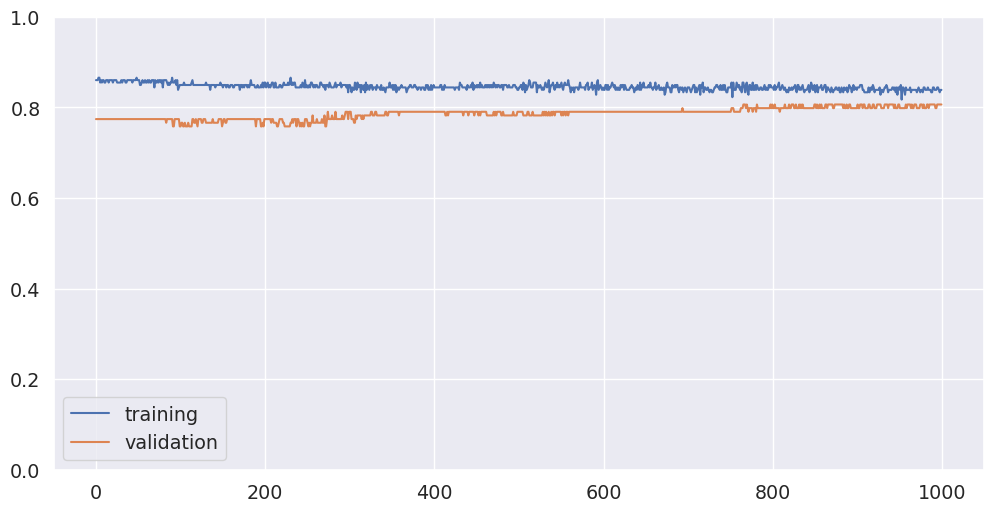

In [114]:
train_acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]
fig = plt.figure(figsize=(12, 6), dpi=100)
plt.plot(train_acc, label="training")
plt.plot(val_acc, label="validation")
plt.ylim(0, 1)
plt.legend()

Puedo ademas guardar el mejor modelo usando ModelCheckpoint

In [115]:
mc = ModelCheckpoint('mejor_modelo.h5', monitor='val_acc', mode='max')

In [116]:
model = Sequential()
model.add(Dense(16, input_shape=(6,), activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(8, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(4, activation='relu', kernel_regularizer=l2(0.001)))
model.add(Dense(num_classes, activation="softmax"))
opt = keras.optimizers.RMSprop(lr=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
model.summary()
history = model.fit(
    X_train.values,
    y_train,
    epochs=1000,
    validation_data=(X_validation.values, y_test),
    callbacks=[custom_early_stopping, mc],
)

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_48 (Dense)             (None, 16)                112       
_________________________________________________________________
dense_49 (Dense)             (None, 8)                 136       
_________________________________________________________________
dense_50 (Dense)             (None, 4)                 36        
_________________________________________________________________
dense_51 (Dense)             (None, 2)                 10        
Total params: 294
Trainable params: 294
Non-trainable params: 0
_________________________________________________________________


Train on 186 samples, validate on 124 samples
Epoch 1/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.9079 - accuracy: 0.8438

186/186 [==============================] - 0s 803us/step - loss: 2.0805 - accuracy: 0.7796 - val_loss: 4.4257 - val_accuracy: 0.6452


Epoch 2/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8327 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 1.9072 - accuracy: 0.8011 - val_loss: 4.2503 - val_accuracy: 0.6452


Epoch 3/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.8405 - accuracy: 0.7500

186/186 [==============================] - 0s 83us/step - loss: 1.8159 - accuracy: 0.8011 - val_loss: 4.0956 - val_accuracy: 0.6290


Epoch 4/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.2372 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 1.7514 - accuracy: 0.7849 - val_loss: 3.9801 - val_accuracy: 0.6290


Epoch 5/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.4642 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 1.7038 - accuracy: 0.7903 - val_loss: 3.8716 - val_accuracy: 0.6290


Epoch 6/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5205 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 1.6664 - accuracy: 0.7796 - val_loss: 3.7556 - val_accuracy: 0.6290


Epoch 7/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.4082 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 1.6373 - accuracy: 0.7742 - val_loss: 3.6541 - val_accuracy: 0.6371


/opt/hostedtoolcache/Python/3.7.9/x64/lib/python3.7/site-packages/keras/callbacks/callbacks.py:846: RuntimeWarning: Early stopping conditioned on metric `val_acc` which is not available. Available metrics are: val_loss,val_accuracy,loss,accuracy
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning


Epoch 8/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3359 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 1.6061 - accuracy: 0.7796 - val_loss: 3.5656 - val_accuracy: 0.6371


Epoch 9/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8306 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 1.5787 - accuracy: 0.7796 - val_loss: 3.4715 - val_accuracy: 0.6371


Epoch 10/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.4042 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 1.5464 - accuracy: 0.7688 - val_loss: 3.3677 - val_accuracy: 0.6371


Epoch 11/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.6490 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 1.5120 - accuracy: 0.7688 - val_loss: 3.2737 - val_accuracy: 0.6371


Epoch 12/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.6256 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 1.4838 - accuracy: 0.7688 - val_loss: 3.1958 - val_accuracy: 0.6290


Epoch 13/1000
 32/186 [====>.........................] - ETA: 0s - loss: 2.1586 - accuracy: 0.6562

186/186 [==============================] - 0s 83us/step - loss: 1.4496 - accuracy: 0.7688 - val_loss: 3.1244 - val_accuracy: 0.6210


Epoch 14/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9169 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 1.4191 - accuracy: 0.7688 - val_loss: 3.0538 - val_accuracy: 0.6210


Epoch 15/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.8231 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 1.3836 - accuracy: 0.7634 - val_loss: 2.9749 - val_accuracy: 0.6210


Epoch 16/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5387 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 1.3587 - accuracy: 0.7581 - val_loss: 2.9296 - val_accuracy: 0.6129


Epoch 17/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.4004 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 1.3267 - accuracy: 0.7581 - val_loss: 2.8775 - val_accuracy: 0.6129


Epoch 18/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.1400 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 1.2997 - accuracy: 0.7581 - val_loss: 2.8223 - val_accuracy: 0.6129


Epoch 19/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9538 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 1.2794 - accuracy: 0.7581 - val_loss: 2.7720 - val_accuracy: 0.6048


Epoch 20/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.5962 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 1.2552 - accuracy: 0.7634 - val_loss: 2.7381 - val_accuracy: 0.6129


Epoch 21/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2822 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 1.2327 - accuracy: 0.7581 - val_loss: 2.7033 - val_accuracy: 0.6129


Epoch 22/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3784 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 1.2105 - accuracy: 0.7581 - val_loss: 2.6631 - val_accuracy: 0.5968


Epoch 23/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.9786 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 1.1882 - accuracy: 0.7634 - val_loss: 2.6366 - val_accuracy: 0.5968


Epoch 24/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.8609 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 1.1712 - accuracy: 0.7634 - val_loss: 2.5990 - val_accuracy: 0.5968


Epoch 25/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1990 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 1.1462 - accuracy: 0.7581 - val_loss: 2.5612 - val_accuracy: 0.5968


Epoch 26/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2202 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 1.1213 - accuracy: 0.7581 - val_loss: 2.5027 - val_accuracy: 0.6048


Epoch 27/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.6055 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 1.1019 - accuracy: 0.7634 - val_loss: 2.4588 - val_accuracy: 0.6048


Epoch 28/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2549 - accuracy: 0.7500

186/186 [==============================]

 - 0s 73us/step - loss: 1.0738 - accuracy: 0.7581 - val_loss: 2.4156 - val_accuracy: 0.6048


Epoch 29/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6125 - accuracy: 0.8750



186/186 [==============================] - 0s 74us/step - loss: 1.0503 - accuracy: 0.7634 - val_loss: 2.3646 - val_accuracy: 0.5968


Epoch 30/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2469 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 1.0320 - accuracy: 0.7634 - val_loss: 2.3263 - val_accuracy: 0.5968


Epoch 31/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8179 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 1.0092 - accuracy: 0.7527 - val_loss: 2.2880 - val_accuracy: 0.5887


Epoch 32/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8632 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.9900 - accuracy: 0.7527 - val_loss: 2.2572 - val_accuracy: 0.5887


Epoch 33/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.9874 - accuracy: 0.7188

186/186 [==============================] - 0s 92us/step - loss: 0.9696 - accuracy: 0.7581 - val_loss: 2.2173 - val_accuracy: 0.5887


Epoch 34/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.3573 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.9489 - accuracy: 0.7527 - val_loss: 2.1679 - val_accuracy: 0.5887


Epoch 35/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.7144 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.9344 - accuracy: 0.7473 - val_loss: 2.1278 - val_accuracy: 0.5887


Epoch 36/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.7105 - accuracy: 0.5312

186/186 [==============================] - 0s 69us/step - loss: 0.9139 - accuracy: 0.7419 - val_loss: 2.0871 - val_accuracy: 0.5887


Epoch 37/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.8550 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.8984 - accuracy: 0.7419 - val_loss: 2.0505 - val_accuracy: 0.5887


Epoch 38/1000


 32/186 [====>.........................] - ETA: 0s - loss: 1.3486 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.8808 - accuracy: 0.7366 - val_loss: 2.0169 - val_accuracy: 0.5887


Epoch 39/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7724 - accuracy: 0.6562

186/186 [==============================] - 0s 64us/step - loss: 0.8661 - accuracy: 0.7366 - val_loss: 1.9897 - val_accuracy: 0.5887


Epoch 40/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6276 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.8469 - accuracy: 0.7366 - val_loss: 1.9485 - val_accuracy: 0.5887


Epoch 41/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5787 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.8335 - accuracy: 0.7366 - val_loss: 1.9052 - val_accuracy: 0.5887


Epoch 42/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.2721 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.8142 - accuracy: 0.7366 - val_loss: 1.8723 - val_accuracy: 0.5887


Epoch 43/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.1026 - accuracy: 0.6875

186/186 [==============================] - 0s 63us/step - loss: 0.8025 - accuracy: 0.7366 - val_loss: 1.8306 - val_accuracy: 0.5887


Epoch 44/1000
 32/186 [====>.........................] - ETA: 0s - loss: 1.0015 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.7836 - accuracy: 0.7366 - val_loss: 1.8006 - val_accuracy: 0.5968


Epoch 45/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8007 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.7709 - accuracy: 0.7366 - val_loss: 1.7708 - val_accuracy: 0.5968


Epoch 46/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4988 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.7549 - accuracy: 0.7366 - val_loss: 1.7384 - val_accuracy: 0.5887


Epoch 47/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5739 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.7430 - accuracy: 0.7366 - val_loss: 1.7073 - val_accuracy: 0.5968


Epoch 48/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7361 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.7269 - accuracy: 0.7312 - val_loss: 1.6759 - val_accuracy: 0.5968


Epoch 49/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5271 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.7148 - accuracy: 0.7366 - val_loss: 1.6604 - val_accuracy: 0.5887


Epoch 50/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8994 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.7051 - accuracy: 0.7366 - val_loss: 1.6314 - val_accuracy: 0.5887


Epoch 51/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6628 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.6946 - accuracy: 0.7312 - val_loss: 1.6129 - val_accuracy: 0.5887


Epoch 52/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6110 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.6830 - accuracy: 0.7366 - val_loss: 1.5914 - val_accuracy: 0.5968


Epoch 53/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7197 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.6738 - accuracy: 0.7366 - val_loss: 1.5651 - val_accuracy: 0.5968


Epoch 54/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7568 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.6677 - accuracy: 0.7419 - val_loss: 1.5414 - val_accuracy: 0.5968


Epoch 55/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4276 - accuracy: 0.7188

186/186 [==============================] - 0s 77us/step - loss: 0.6548 - accuracy: 0.7366 - val_loss: 1.5186 - val_accuracy: 0.5968


Epoch 56/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6806 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.6468 - accuracy: 0.7366 - val_loss: 1.4964 - val_accuracy: 0.5887


Epoch 57/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7549 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.6355 - accuracy: 0.7366 - val_loss: 1.4765 - val_accuracy: 0.5968


Epoch 58/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4891 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.6287 - accuracy: 0.7366 - val_loss: 1.4521 - val_accuracy: 0.5968


Epoch 59/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3380 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.6203 - accuracy: 0.7581 - val_loss: 1.4210 - val_accuracy: 0.5968


Epoch 60/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3766 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.6108 - accuracy: 0.7419 - val_loss: 1.4041 - val_accuracy: 0.5968


Epoch 61/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6189 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.6030 - accuracy: 0.7527 - val_loss: 1.3830 - val_accuracy: 0.5968


Epoch 62/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8974 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.5952 - accuracy: 0.7527 - val_loss: 1.3658 - val_accuracy: 0.5968


Epoch 63/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4119 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.5873 - accuracy: 0.7527 - val_loss: 1.3371 - val_accuracy: 0.6048


Epoch 64/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6729 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.5800 - accuracy: 0.7473 - val_loss: 1.3101 - val_accuracy: 0.6048


Epoch 65/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3854 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.5709 - accuracy: 0.7527 - val_loss: 1.2879 - val_accuracy: 0.6048


Epoch 66/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6497 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.5660 - accuracy: 0.7581 - val_loss: 1.2604 - val_accuracy: 0.6048


Epoch 67/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5635 - accuracy: 0.6562

186/186 [==============================] - 0s 66us/step - loss: 0.5554 - accuracy: 0.7581 - val_loss: 1.2344 - val_accuracy: 0.6048


Epoch 68/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4737 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.5517 - accuracy: 0.7473 - val_loss: 1.2112 - val_accuracy: 0.5968


Epoch 69/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6484 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.5463 - accuracy: 0.7473 - val_loss: 1.1921 - val_accuracy: 0.5968


Epoch 70/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6951 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.5376 - accuracy: 0.7527 - val_loss: 1.1715 - val_accuracy: 0.5887


Epoch 71/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4778 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.5323 - accuracy: 0.7527 - val_loss: 1.1461 - val_accuracy: 0.5887


Epoch 72/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5013 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.5252 - accuracy: 0.7527 - val_loss: 1.1215 - val_accuracy: 0.5887


Epoch 73/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3696 - accuracy: 0.7812

186/186 [==============================] - 0s 64us/step - loss: 0.5214 - accuracy: 0.7581 - val_loss: 1.0990 - val_accuracy: 0.5887


Epoch 74/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5637 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.5127 - accuracy: 0.7473 - val_loss: 1.0739 - val_accuracy: 0.5887


Epoch 75/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5465 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.5063 - accuracy: 0.7527 - val_loss: 1.0628 - val_accuracy: 0.5887


Epoch 76/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3644 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.5012 - accuracy: 0.7527 - val_loss: 1.0372 - val_accuracy: 0.5887


Epoch 77/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.8296 - accuracy: 0.5938

186/186 [==============================] - 0s 71us/step - loss: 0.4962 - accuracy: 0.7473 - val_loss: 1.0309 - val_accuracy: 0.5968


Epoch 78/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5433 - accuracy: 0.6250

186/186 [==============================] - 0s 70us/step - loss: 0.4903 - accuracy: 0.7473 - val_loss: 1.0124 - val_accuracy: 0.6048


Epoch 79/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4995 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.4868 - accuracy: 0.7527 - val_loss: 0.9935 - val_accuracy: 0.6129


Epoch 80/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4595 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.4816 - accuracy: 0.7527 - val_loss: 0.9780 - val_accuracy: 0.6129


Epoch 81/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2387 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.4788 - accuracy: 0.7527 - val_loss: 0.9719 - val_accuracy: 0.6290


Epoch 82/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4224 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.4742 - accuracy: 0.7527 - val_loss: 0.9609 - val_accuracy: 0.6290


Epoch 83/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3908 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.4725 - accuracy: 0.7527 - val_loss: 0.9507 - val_accuracy: 0.6290


Epoch 84/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4829 - accuracy: 0.7812



186/186 [==============================] - 0s 76us/step - loss: 0.4674 - accuracy: 0.7473 - val_loss: 0.9439 - val_accuracy: 0.6290


Epoch 85/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5166 - accuracy: 0.6562

186/186 [==============================] - 0s 69us/step - loss: 0.4667 - accuracy: 0.7527 - val_loss: 0.9414 - val_accuracy: 0.6452


Epoch 86/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5551 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.4629 - accuracy: 0.7473 - val_loss: 0.9417 - val_accuracy: 0.6452


Epoch 87/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5220 - accuracy: 0.7188

186/186 [==============================] - 0s 86us/step - loss: 0.4603 - accuracy: 0.7527 - val_loss: 0.9322 - val_accuracy: 0.6532


Epoch 88/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2934 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4591 - accuracy: 0.7527 - val_loss: 0.9166 - val_accuracy: 0.6532


Epoch 89/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5576 - accuracy: 0.6875

186/186 [==============================] - 0s 67us/step - loss: 0.4559 - accuracy: 0.7527 - val_loss: 0.9073 - val_accuracy: 0.6532


Epoch 90/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6396 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.4541 - accuracy: 0.7581 - val_loss: 0.8982 - val_accuracy: 0.6532


Epoch 91/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2888 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.4519 - accuracy: 0.7527 - val_loss: 0.8905 - val_accuracy: 0.6532


Epoch 92/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5609 - accuracy: 0.5000

186/186 [==============================] - 0s 73us/step - loss: 0.4502 - accuracy: 0.7527 - val_loss: 0.8803 - val_accuracy: 0.6532


Epoch 93/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4328 - accuracy: 0.6250

186/186 [==============================] - 0s 71us/step - loss: 0.4492 - accuracy: 0.7527 - val_loss: 0.8716 - val_accuracy: 0.6532


Epoch 94/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3688 - accuracy: 0.7812

186/186 [==============================] - 0s 90us/step - loss: 0.4476 - accuracy: 0.7581 - val_loss: 0.8692 - val_accuracy: 0.6532


Epoch 95/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5274 - accuracy: 0.6875

186/186 [==============================] - 0s 66us/step - loss: 0.4477 - accuracy: 0.7527 - val_loss: 0.8706 - val_accuracy: 0.6532


Epoch 96/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4683 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.4454 - accuracy: 0.7634 - val_loss: 0.8616 - val_accuracy: 0.6532


Epoch 97/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5539 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4439 - accuracy: 0.7634 - val_loss: 0.8576 - val_accuracy: 0.6532


Epoch 98/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3567 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.4425 - accuracy: 0.7634 - val_loss: 0.8503 - val_accuracy: 0.6532


Epoch 99/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4376 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.4413 - accuracy: 0.7634 - val_loss: 0.8548 - val_accuracy: 0.6532


Epoch 100/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2412 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.4414 - accuracy: 0.7634 - val_loss: 0.8528 - val_accuracy: 0.6532


Epoch 101/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4949 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4393 - accuracy: 0.7688 - val_loss: 0.8447 - val_accuracy: 0.6532


Epoch 102/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3374 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.4398 - accuracy: 0.7634 - val_loss: 0.8414 - val_accuracy: 0.6532


Epoch 103/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4215 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.4379 - accuracy: 0.7688 - val_loss: 0.8414 - val_accuracy: 0.6613


Epoch 104/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4749 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.4377 - accuracy: 0.7688 - val_loss: 0.8359 - val_accuracy: 0.6613


Epoch 105/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3546 - accuracy: 0.6875

186/186 [==============================] - 0s 112us/step - loss: 0.4372 - accuracy: 0.7688 - val_loss: 0.8294 - val_accuracy: 0.6532


Epoch 106/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.7442 - accuracy: 0.5312

186/186 [==============================] - 0s 70us/step - loss: 0.4365 - accuracy: 0.7688 - val_loss: 0.8275 - val_accuracy: 0.6532


Epoch 107/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3634 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.4348 - accuracy: 0.7688 - val_loss: 0.8251 - val_accuracy: 0.6613


Epoch 108/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5052 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.4353 - accuracy: 0.7634 - val_loss: 0.8276 - val_accuracy: 0.6694


Epoch 109/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5604 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.4337 - accuracy: 0.7688 - val_loss: 0.8253 - val_accuracy: 0.6694


Epoch 110/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4159 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4332 - accuracy: 0.7688 - val_loss: 0.8231 - val_accuracy: 0.6694


Epoch 111/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4153 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.4315 - accuracy: 0.7688 - val_loss: 0.8211 - val_accuracy: 0.6694


Epoch 112/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4176 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.4328 - accuracy: 0.7688 - val_loss: 0.8179 - val_accuracy: 0.6774


Epoch 113/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3697 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.4309 - accuracy: 0.7688 - val_loss: 0.8177 - val_accuracy: 0.6774


Epoch 114/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3769 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4311 - accuracy: 0.7742 - val_loss: 0.8094 - val_accuracy: 0.6774


Epoch 115/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4858 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4296 - accuracy: 0.7742 - val_loss: 0.8056 - val_accuracy: 0.6774


Epoch 116/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4648 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.4292 - accuracy: 0.7742 - val_loss: 0.8060 - val_accuracy: 0.6774


Epoch 117/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4380 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.4280 - accuracy: 0.7634 - val_loss: 0.8019 - val_accuracy: 0.6774


Epoch 118/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3851 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.4285 - accuracy: 0.7688 - val_loss: 0.7981 - val_accuracy: 0.6774


Epoch 119/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4056 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.4278 - accuracy: 0.7688 - val_loss: 0.7967 - val_accuracy: 0.6774


Epoch 120/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6273 - accuracy: 0.6562

186/186 [==============================] - 0s 72us/step - loss: 0.4266 - accuracy: 0.7688 - val_loss: 0.7977 - val_accuracy: 0.6774


Epoch 121/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5197 - accuracy: 0.7500

186/186 [==============================] - 0s 149us/step - loss: 0.4267 - accuracy: 0.7634 - val_loss: 0.7949 - val_accuracy: 0.6774


Epoch 122/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4518 - accuracy: 0.6875

186/186 [==============================] - 0s 68us/step - loss: 0.4264 - accuracy: 0.7688 - val_loss: 0.7925 - val_accuracy: 0.6774


Epoch 123/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6341 - accuracy: 0.5938

186/186 [==============================] - 0s 73us/step - loss: 0.4250 - accuracy: 0.7688 - val_loss: 0.7927 - val_accuracy: 0.6774


Epoch 124/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3505 - accuracy: 0.8125

186/186 [==============================] - 0s 86us/step - loss: 0.4249 - accuracy: 0.7688 - val_loss: 0.7911 - val_accuracy: 0.6774


Epoch 125/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4639 - accuracy: 0.7188

186/186 [==============================] - 0s 79us/step - loss: 0.4244 - accuracy: 0.7634 - val_loss: 0.7922 - val_accuracy: 0.6774


Epoch 126/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3104 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.4235 - accuracy: 0.7634 - val_loss: 0.7916 - val_accuracy: 0.6774


Epoch 127/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4142 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.4225 - accuracy: 0.7634 - val_loss: 0.7878 - val_accuracy: 0.6774


Epoch 128/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3433 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.4219 - accuracy: 0.7634 - val_loss: 0.7835 - val_accuracy: 0.6774


Epoch 129/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4208 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.4221 - accuracy: 0.7634 - val_loss: 0.7809 - val_accuracy: 0.6774


Epoch 130/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3969 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4214 - accuracy: 0.7634 - val_loss: 0.7827 - val_accuracy: 0.6774


Epoch 131/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4087 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.4202 - accuracy: 0.7634 - val_loss: 0.7790 - val_accuracy: 0.6774


Epoch 132/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3659 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.4193 - accuracy: 0.7634 - val_loss: 0.7812 - val_accuracy: 0.6774


Epoch 133/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4246 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.4189 - accuracy: 0.7634 - val_loss: 0.7821 - val_accuracy: 0.6774


Epoch 134/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4518 - accuracy: 0.6562

186/186 [==============================] - 0s 73us/step - loss: 0.4193 - accuracy: 0.7634 - val_loss: 0.7761 - val_accuracy: 0.6774


Epoch 135/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4065 - accuracy: 0.8438

186/186 [==============================] - 0s 92us/step - loss: 0.4177 - accuracy: 0.7634 - val_loss: 0.7767 - val_accuracy: 0.6774


Epoch 136/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4872 - accuracy: 0.6250

186/186 [==============================] - 0s 69us/step - loss: 0.4167 - accuracy: 0.7634 - val_loss: 0.7748 - val_accuracy: 0.6774


Epoch 137/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4544 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.4165 - accuracy: 0.7688 - val_loss: 0.7716 - val_accuracy: 0.6774


Epoch 138/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4028 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.4161 - accuracy: 0.7688 - val_loss: 0.7706 - val_accuracy: 0.6774


Epoch 139/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3946 - accuracy: 0.7812

186/186 [==============================] - 0s 81us/step - loss: 0.4161 - accuracy: 0.7688 - val_loss: 0.7677 - val_accuracy: 0.6774


Epoch 140/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4053 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 0.4167 - accuracy: 0.7688 - val_loss: 0.7649 - val_accuracy: 0.6774


Epoch 141/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3644 - accuracy: 0.6875

186/186 [==============================] - 0s 92us/step - loss: 0.4154 - accuracy: 0.7634 - val_loss: 0.7684 - val_accuracy: 0.6855


Epoch 142/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5075 - accuracy: 0.6875

186/186 [==============================] - 0s 75us/step - loss: 0.4142 - accuracy: 0.7742 - val_loss: 0.7656 - val_accuracy: 0.6855


Epoch 143/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4816 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.4134 - accuracy: 0.7742 - val_loss: 0.7605 - val_accuracy: 0.6855


Epoch 144/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4079 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.4131 - accuracy: 0.7688 - val_loss: 0.7638 - val_accuracy: 0.6855


Epoch 145/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2627 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.4133 - accuracy: 0.7742 - val_loss: 0.7603 - val_accuracy: 0.6855


Epoch 146/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4837 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.4123 - accuracy: 0.7688 - val_loss: 0.7629 - val_accuracy: 0.6855


Epoch 147/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3486 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.4129 - accuracy: 0.7742 - val_loss: 0.7599 - val_accuracy: 0.6855


Epoch 148/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4456 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.4107 - accuracy: 0.7742 - val_loss: 0.7549 - val_accuracy: 0.6855


Epoch 149/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3965 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.4114 - accuracy: 0.7742 - val_loss: 0.7558 - val_accuracy: 0.6855


Epoch 150/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4533 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.4104 - accuracy: 0.7742 - val_loss: 0.7546 - val_accuracy: 0.6855


Epoch 151/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4784 - accuracy: 0.7500

186/186 [==============================] - 0s 82us/step - loss: 0.4103 - accuracy: 0.7742 - val_loss: 0.7521 - val_accuracy: 0.6855


Epoch 152/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2696 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.4099 - accuracy: 0.7742 - val_loss: 0.7458 - val_accuracy: 0.6855


Epoch 153/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3614 - accuracy: 0.6875

186/186 [==============================] - 0s 71us/step - loss: 0.4095 - accuracy: 0.7742 - val_loss: 0.7480 - val_accuracy: 0.6855


Epoch 154/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5106 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.4085 - accuracy: 0.7742 - val_loss: 0.7489 - val_accuracy: 0.6855


Epoch 155/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3512 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.4089 - accuracy: 0.7742 - val_loss: 0.7402 - val_accuracy: 0.6855


Epoch 156/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3986 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.4097 - accuracy: 0.7742 - val_loss: 0.7406 - val_accuracy: 0.6855


Epoch 157/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3892 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.4092 - accuracy: 0.7742 - val_loss: 0.7362 - val_accuracy: 0.6855


Epoch 158/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4778 - accuracy: 0.6875

186/186 [==============================] - 0s 93us/step - loss: 0.4080 - accuracy: 0.7742 - val_loss: 0.7371 - val_accuracy: 0.6855


Epoch 159/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2930 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4072 - accuracy: 0.7742 - val_loss: 0.7351 - val_accuracy: 0.6855


Epoch 160/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3701 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4072 - accuracy: 0.7742 - val_loss: 0.7350 - val_accuracy: 0.6855


Epoch 161/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4232 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.4070 - accuracy: 0.7742 - val_loss: 0.7351 - val_accuracy: 0.6855


Epoch 162/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4728 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.4078 - accuracy: 0.7742 - val_loss: 0.7356 - val_accuracy: 0.6855


Epoch 163/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2438 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.4067 - accuracy: 0.7742 - val_loss: 0.7395 - val_accuracy: 0.6855


Epoch 164/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4779 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.4061 - accuracy: 0.7796 - val_loss: 0.7358 - val_accuracy: 0.6855


Epoch 165/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3521 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.4058 - accuracy: 0.7742 - val_loss: 0.7360 - val_accuracy: 0.6855


Epoch 166/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2328 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.4060 - accuracy: 0.7742 - val_loss: 0.7368 - val_accuracy: 0.6855


Epoch 167/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4060 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4077 - accuracy: 0.7796 - val_loss: 0.7378 - val_accuracy: 0.6855


Epoch 168/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3742 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.4050 - accuracy: 0.7796 - val_loss: 0.7373 - val_accuracy: 0.6855


Epoch 169/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4576 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4041 - accuracy: 0.7796 - val_loss: 0.7348 - val_accuracy: 0.6855


Epoch 170/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2995 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.4049 - accuracy: 0.7796 - val_loss: 0.7308 - val_accuracy: 0.6855


Epoch 171/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3833 - accuracy: 0.7188

186/186 [==============================] - 0s 78us/step - loss: 0.4055 - accuracy: 0.7796 - val_loss: 0.7303 - val_accuracy: 0.6855


Epoch 172/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3275 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.4062 - accuracy: 0.7742 - val_loss: 0.7297 - val_accuracy: 0.6855


Epoch 173/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3035 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.4040 - accuracy: 0.7796 - val_loss: 0.7322 - val_accuracy: 0.6855


Epoch 174/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3546 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.4051 - accuracy: 0.7796 - val_loss: 0.7318 - val_accuracy: 0.6855


Epoch 175/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4173 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.4032 - accuracy: 0.7796 - val_loss: 0.7343 - val_accuracy: 0.6855


Epoch 176/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5730 - accuracy: 0.6875

186/186 [==============================] - 0s 74us/step - loss: 0.4031 - accuracy: 0.7796 - val_loss: 0.7362 - val_accuracy: 0.6855


Epoch 177/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4542 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.4035 - accuracy: 0.7796 - val_loss: 0.7288 - val_accuracy: 0.6855


Epoch 178/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4538 - accuracy: 0.6875

186/186 [==============================] - 0s 65us/step - loss: 0.4035 - accuracy: 0.7796 - val_loss: 0.7314 - val_accuracy: 0.6855


Epoch 179/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3679 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.4027 - accuracy: 0.7796 - val_loss: 0.7262 - val_accuracy: 0.6855


Epoch 180/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3447 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.4028 - accuracy: 0.7796 - val_loss: 0.7217 - val_accuracy: 0.6855


Epoch 181/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3168 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.4024 - accuracy: 0.7742 - val_loss: 0.7228 - val_accuracy: 0.6855


Epoch 182/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4634 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.4025 - accuracy: 0.7796 - val_loss: 0.7223 - val_accuracy: 0.6855


Epoch 183/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3044 - accuracy: 0.8125

186/186 [==============================] - 0s 102us/step - loss: 0.4016 - accuracy: 0.7742 - val_loss: 0.7245 - val_accuracy: 0.6855


Epoch 184/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3670 - accuracy: 0.6875

186/186 [==============================] - 0s 76us/step - loss: 0.4010 - accuracy: 0.7796 - val_loss: 0.7233 - val_accuracy: 0.6855


Epoch 185/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4064 - accuracy: 0.7812

186/186 [==============================] - 0s 81us/step - loss: 0.4009 - accuracy: 0.7796 - val_loss: 0.7278 - val_accuracy: 0.7016


Epoch 186/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5659 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.4014 - accuracy: 0.7796 - val_loss: 0.7235 - val_accuracy: 0.6855


Epoch 187/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3672 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.4020 - accuracy: 0.7796 - val_loss: 0.7219 - val_accuracy: 0.6935


Epoch 188/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.5276 - accuracy: 0.6562

186/186 [==============================] - 0s 74us/step - loss: 0.4012 - accuracy: 0.7796 - val_loss: 0.7211 - val_accuracy: 0.6855


Epoch 189/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3281 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.4009 - accuracy: 0.7796 - val_loss: 0.7235 - val_accuracy: 0.7016


Epoch 190/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3621 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.4016 - accuracy: 0.7796 - val_loss: 0.7258 - val_accuracy: 0.7016


Epoch 191/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4526 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.4001 - accuracy: 0.7796 - val_loss: 0.7275 - val_accuracy: 0.7016


Epoch 192/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4885 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3998 - accuracy: 0.7796 - val_loss: 0.7230 - val_accuracy: 0.7016


Epoch 193/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4243 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3999 - accuracy: 0.7796 - val_loss: 0.7192 - val_accuracy: 0.7016


Epoch 194/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3742 - accuracy: 0.7812

186/186 [==============================] - 0s 84us/step - loss: 0.4004 - accuracy: 0.7796 - val_loss: 0.7159 - val_accuracy: 0.6935


Epoch 195/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2630 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3989 - accuracy: 0.7796 - val_loss: 0.7184 - val_accuracy: 0.7016


Epoch 196/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3779 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3988 - accuracy: 0.7796 - val_loss: 0.7208 - val_accuracy: 0.7016


Epoch 197/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4552 - accuracy: 0.6875

186/186 [==============================] - 0s 70us/step - loss: 0.3987 - accuracy: 0.7796 - val_loss: 0.7150 - val_accuracy: 0.7016


Epoch 198/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4377 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3982 - accuracy: 0.7796 - val_loss: 0.7162 - val_accuracy: 0.7016


Epoch 199/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3638 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.4007 - accuracy: 0.7796 - val_loss: 0.7195 - val_accuracy: 0.7016


Epoch 200/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3357 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3981 - accuracy: 0.7796 - val_loss: 0.7170 - val_accuracy: 0.7016


Epoch 201/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2539 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3980 - accuracy: 0.7796 - val_loss: 0.7146 - val_accuracy: 0.7016


Epoch 202/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3928 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3974 - accuracy: 0.7796 - val_loss: 0.7128 - val_accuracy: 0.7016


Epoch 203/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4107 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3986 - accuracy: 0.7796 - val_loss: 0.7108 - val_accuracy: 0.7016


Epoch 204/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2805 - accuracy: 0.9688

186/186 [==============================] - 0s 66us/step - loss: 0.3973 - accuracy: 0.7796 - val_loss: 0.7118 - val_accuracy: 0.7016


Epoch 205/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4721 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3971 - accuracy: 0.7796 - val_loss: 0.7152 - val_accuracy: 0.7016


Epoch 206/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5029 - accuracy: 0.7188

186/186 [==============================] - 0s 72us/step - loss: 0.3971 - accuracy: 0.7796 - val_loss: 0.7087 - val_accuracy: 0.7016


Epoch 207/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4022 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3968 - accuracy: 0.7796 - val_loss: 0.7110 - val_accuracy: 0.7016


Epoch 208/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5407 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.3959 - accuracy: 0.7796 - val_loss: 0.7129 - val_accuracy: 0.7016


Epoch 209/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3103 - accuracy: 0.9062

186/186 [==============================] - 0s 96us/step - loss: 0.3963 - accuracy: 0.7796 - val_loss: 0.7167 - val_accuracy: 0.7016


Epoch 210/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4579 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3963 - accuracy: 0.7796 - val_loss: 0.7122 - val_accuracy: 0.7016


Epoch 211/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3228 - accuracy: 0.7812

186/186 [==============================] - 0s 84us/step - loss: 0.3975 - accuracy: 0.7796 - val_loss: 0.7153 - val_accuracy: 0.7016


Epoch 212/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3828 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3954 - accuracy: 0.7796 - val_loss: 0.7144 - val_accuracy: 0.7016


Epoch 213/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4834 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3957 - accuracy: 0.7796 - val_loss: 0.7137 - val_accuracy: 0.7016


Epoch 214/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3871 - accuracy: 0.7500

186/186 [==============================] - 0s 65us/step - loss: 0.3950 - accuracy: 0.7796 - val_loss: 0.7115 - val_accuracy: 0.7016


Epoch 215/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4666 - accuracy: 0.7188

186/186 [==============================] - 0s 64us/step - loss: 0.3961 - accuracy: 0.7849 - val_loss: 0.7113 - val_accuracy: 0.7016


Epoch 216/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4806 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3950 - accuracy: 0.7796 - val_loss: 0.7116 - val_accuracy: 0.7016


Epoch 217/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3344 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3950 - accuracy: 0.7796 - val_loss: 0.7089 - val_accuracy: 0.7016


Epoch 218/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5394 - accuracy: 0.6250

186/186 [==============================] - 0s 73us/step - loss: 0.3946 - accuracy: 0.7796 - val_loss: 0.7093 - val_accuracy: 0.7016


Epoch 219/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4146 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3940 - accuracy: 0.7796 - val_loss: 0.7108 - val_accuracy: 0.7016


Epoch 220/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5108 - accuracy: 0.7500

186/186 [==============================] - 0s 78us/step - loss: 0.3938 - accuracy: 0.7849 - val_loss: 0.7132 - val_accuracy: 0.7016


Epoch 221/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3993 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3934 - accuracy: 0.7849 - val_loss: 0.7171 - val_accuracy: 0.7016


Epoch 222/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2517 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3949 - accuracy: 0.7849 - val_loss: 0.7159 - val_accuracy: 0.7016


Epoch 223/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4320 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3922 - accuracy: 0.7796 - val_loss: 0.7151 - val_accuracy: 0.7016


Epoch 224/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4674 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3929 - accuracy: 0.7903 - val_loss: 0.7143 - val_accuracy: 0.7016


Epoch 225/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4076 - accuracy: 0.6250

186/186 [==============================] - 0s 73us/step - loss: 0.3921 - accuracy: 0.7849 - val_loss: 0.7102 - val_accuracy: 0.7016


Epoch 226/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2606 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3919 - accuracy: 0.7796 - val_loss: 0.7070 - val_accuracy: 0.7016


Epoch 227/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3807 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3923 - accuracy: 0.7796 - val_loss: 0.7062 - val_accuracy: 0.7016


Epoch 228/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4903 - accuracy: 0.7812



186/186 [==============================] - 0s 70us/step - loss: 0.3921 - accuracy: 0.7796 - val_loss: 0.7036 - val_accuracy: 0.7016


Epoch 229/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4698 - accuracy: 0.6875

186/186 [==============================] - 0s 72us/step - loss: 0.3920 - accuracy: 0.7849 - val_loss: 0.7027 - val_accuracy: 0.7016


Epoch 230/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4685 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3906 - accuracy: 0.7796 - val_loss: 0.7050 - val_accuracy: 0.7016


Epoch 231/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4262 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3902 - accuracy: 0.7796 - val_loss: 0.7076 - val_accuracy: 0.7016


Epoch 232/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4485 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3896 - accuracy: 0.7849 - val_loss: 0.7117 - val_accuracy: 0.7016


Epoch 233/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3632 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3896 - accuracy: 0.7849 - val_loss: 0.7062 - val_accuracy: 0.7016


Epoch 234/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4532 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3903 - accuracy: 0.7849 - val_loss: 0.7075 - val_accuracy: 0.7016


Epoch 235/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4467 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3890 - accuracy: 0.7849 - val_loss: 0.7021 - val_accuracy: 0.7016


Epoch 236/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4462 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3891 - accuracy: 0.7903 - val_loss: 0.7060 - val_accuracy: 0.7016


Epoch 237/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4023 - accuracy: 0.6562

186/186 [==============================] - 0s 78us/step - loss: 0.3888 - accuracy: 0.7849 - val_loss: 0.7019 - val_accuracy: 0.7016


Epoch 238/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3427 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3884 - accuracy: 0.7903 - val_loss: 0.6975 - val_accuracy: 0.7016


Epoch 239/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3083 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3883 - accuracy: 0.7903 - val_loss: 0.6983 - val_accuracy: 0.7016


Epoch 240/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3955 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3886 - accuracy: 0.7903 - val_loss: 0.7001 - val_accuracy: 0.7016


Epoch 241/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3611 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3877 - accuracy: 0.7849 - val_loss: 0.7032 - val_accuracy: 0.7016


Epoch 242/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3324 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3877 - accuracy: 0.7957 - val_loss: 0.7044 - val_accuracy: 0.7016


Epoch 243/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4070 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3877 - accuracy: 0.7957 - val_loss: 0.7012 - val_accuracy: 0.7016


Epoch 244/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3883 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3870 - accuracy: 0.7903 - val_loss: 0.7010 - val_accuracy: 0.7016


Epoch 245/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4041 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3878 - accuracy: 0.8011 - val_loss: 0.6974 - val_accuracy: 0.7016


Epoch 246/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4963 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3874 - accuracy: 0.7957 - val_loss: 0.6948 - val_accuracy: 0.7016


Epoch 247/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5857 - accuracy: 0.6562

186/186 [==============================] - 0s 63us/step - loss: 0.3859 - accuracy: 0.7903 - val_loss: 0.6937 - val_accuracy: 0.7016


Epoch 248/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3666 - accuracy: 0.7188

186/186 [==============================] - 0s 76us/step - loss: 0.3859 - accuracy: 0.7903 - val_loss: 0.6933 - val_accuracy: 0.7016


Epoch 249/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4829 - accuracy: 0.7188

186/186 [==============================] - 0s 70us/step - loss: 0.3855 - accuracy: 0.8011 - val_loss: 0.6890 - val_accuracy: 0.7016


Epoch 250/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3098 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3850 - accuracy: 0.7903 - val_loss: 0.6892 - val_accuracy: 0.7016


Epoch 251/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3851 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3847 - accuracy: 0.7903 - val_loss: 0.6838 - val_accuracy: 0.7097


Epoch 252/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3465 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3845 - accuracy: 0.7903 - val_loss: 0.6850 - val_accuracy: 0.7097


Epoch 253/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4562 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3856 - accuracy: 0.7957 - val_loss: 0.6851 - val_accuracy: 0.7097


Epoch 254/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3312 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.3840 - accuracy: 0.7903 - val_loss: 0.6862 - val_accuracy: 0.7097


Epoch 255/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2789 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3836 - accuracy: 0.7957 - val_loss: 0.6871 - val_accuracy: 0.7016


Epoch 256/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4383 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3834 - accuracy: 0.8011 - val_loss: 0.6869 - val_accuracy: 0.7097


Epoch 257/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4501 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3835 - accuracy: 0.7957 - val_loss: 0.6847 - val_accuracy: 0.7097


Epoch 258/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4123 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.3832 - accuracy: 0.8011 - val_loss: 0.6872 - val_accuracy: 0.7016


Epoch 259/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3323 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3821 - accuracy: 0.8065 - val_loss: 0.6836 - val_accuracy: 0.7097


Epoch 260/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3623 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3827 - accuracy: 0.8011 - val_loss: 0.6838 - val_accuracy: 0.7016


Epoch 261/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4795 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3818 - accuracy: 0.8065 - val_loss: 0.6792 - val_accuracy: 0.7097


Epoch 262/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4489 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.3820 - accuracy: 0.8011 - val_loss: 0.6779 - val_accuracy: 0.7097


Epoch 263/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3561 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3814 - accuracy: 0.8065 - val_loss: 0.6801 - val_accuracy: 0.7097


Epoch 264/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3528 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3809 - accuracy: 0.8065 - val_loss: 0.6829 - val_accuracy: 0.7097


Epoch 265/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2033 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3813 - accuracy: 0.8065 - val_loss: 0.6795 - val_accuracy: 0.7097


Epoch 266/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3273 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3808 - accuracy: 0.8065 - val_loss: 0.6832 - val_accuracy: 0.7016


Epoch 267/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3293 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.3806 - accuracy: 0.8065 - val_loss: 0.6865 - val_accuracy: 0.7016


Epoch 268/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2821 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3808 - accuracy: 0.8065 - val_loss: 0.6833 - val_accuracy: 0.7097


Epoch 269/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3578 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3803 - accuracy: 0.8065 - val_loss: 0.6856 - val_accuracy: 0.7016


Epoch 270/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4272 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3799 - accuracy: 0.8065 - val_loss: 0.6847 - val_accuracy: 0.7097


Epoch 271/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3862 - accuracy: 0.6562

186/186 [==============================] - 0s 77us/step - loss: 0.3797 - accuracy: 0.8065 - val_loss: 0.6860 - val_accuracy: 0.7016


Epoch 272/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2520 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3799 - accuracy: 0.8065 - val_loss: 0.6848 - val_accuracy: 0.7016


Epoch 273/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3930 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3799 - accuracy: 0.8065 - val_loss: 0.6878 - val_accuracy: 0.7016


Epoch 274/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4957 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3794 - accuracy: 0.8065 - val_loss: 0.6787 - val_accuracy: 0.7097


Epoch 275/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2575 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3785 - accuracy: 0.8065 - val_loss: 0.6798 - val_accuracy: 0.7097


Epoch 276/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3473 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3791 - accuracy: 0.8065 - val_loss: 0.6767 - val_accuracy: 0.7097


Epoch 277/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3979 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3789 - accuracy: 0.8065 - val_loss: 0.6755 - val_accuracy: 0.7097


Epoch 278/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4041 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3790 - accuracy: 0.8065 - val_loss: 0.6766 - val_accuracy: 0.7097


Epoch 279/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3951 - accuracy: 0.8750

186/186 [==============================] - 0s 84us/step - loss: 0.3787 - accuracy: 0.8065 - val_loss: 0.6747 - val_accuracy: 0.7097


Epoch 280/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3738 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3785 - accuracy: 0.8065 - val_loss: 0.6807 - val_accuracy: 0.7097


Epoch 281/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4888 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3776 - accuracy: 0.8065 - val_loss: 0.6811 - val_accuracy: 0.7097


Epoch 282/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3029 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3788 - accuracy: 0.8065 - val_loss: 0.6780 - val_accuracy: 0.7097


Epoch 283/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3379 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3772 - accuracy: 0.8118 - val_loss: 0.6795 - val_accuracy: 0.7097


Epoch 284/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5714 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3769 - accuracy: 0.8118 - val_loss: 0.6773 - val_accuracy: 0.7097


Epoch 285/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3671 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3775 - accuracy: 0.8065 - val_loss: 0.6805 - val_accuracy: 0.7097


Epoch 286/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3806 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3779 - accuracy: 0.8065 - val_loss: 0.6785 - val_accuracy: 0.7097


Epoch 287/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4504 - accuracy: 0.7812



186/186 [==============================] - 0s 73us/step - loss: 0.3766 - accuracy: 0.8065 - val_loss: 0.6791 - val_accuracy: 0.7097


Epoch 288/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5695 - accuracy: 0.7188



186/186 [==============================] - 0s 69us/step - loss: 0.3763 - accuracy: 0.8118 - val_loss: 0.6743 - val_accuracy: 0.7097


Epoch 289/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3482 - accuracy: 0.8438

186/186 [==============================] - 0s 85us/step - loss: 0.3767 - accuracy: 0.8065 - val_loss: 0.6715 - val_accuracy: 0.7097


Epoch 290/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2964 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3766 - accuracy: 0.8118 - val_loss: 0.6739 - val_accuracy: 0.7097


Epoch 291/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4156 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3755 - accuracy: 0.8118 - val_loss: 0.6710 - val_accuracy: 0.7097


Epoch 292/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4711 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3769 - accuracy: 0.8118 - val_loss: 0.6712 - val_accuracy: 0.7097


Epoch 293/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3499 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3756 - accuracy: 0.8011 - val_loss: 0.6765 - val_accuracy: 0.7097


Epoch 294/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3852 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3755 - accuracy: 0.8118 - val_loss: 0.6757 - val_accuracy: 0.7097


Epoch 295/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3755 - accuracy: 0.8118 - val_loss: 0.6797 - val_accuracy: 0.7097


Epoch 296/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3429 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3749 - accuracy: 0.8118 - val_loss: 0.6780 - val_accuracy: 0.7097


Epoch 297/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3383 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3751 - accuracy: 0.8118 - val_loss: 0.6821 - val_accuracy: 0.7097


Epoch 298/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2997 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3751 - accuracy: 0.8118 - val_loss: 0.6792 - val_accuracy: 0.7097


Epoch 299/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4122 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3761 - accuracy: 0.8065 - val_loss: 0.6783 - val_accuracy: 0.7097


Epoch 300/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3891 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.3748 - accuracy: 0.8118 - val_loss: 0.6763 - val_accuracy: 0.7097


Epoch 301/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4470 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3747 - accuracy: 0.8118 - val_loss: 0.6768 - val_accuracy: 0.7097


Epoch 302/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4107 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3743 - accuracy: 0.8118 - val_loss: 0.6774 - val_accuracy: 0.7097


Epoch 303/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4096 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3737 - accuracy: 0.8118 - val_loss: 0.6751 - val_accuracy: 0.7097


Epoch 304/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3264 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3744 - accuracy: 0.8118 - val_loss: 0.6741 - val_accuracy: 0.7097


Epoch 305/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3868 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3738 - accuracy: 0.8118 - val_loss: 0.6746 - val_accuracy: 0.7097


Epoch 306/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3607 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3727 - accuracy: 0.8118 - val_loss: 0.6814 - val_accuracy: 0.7097


Epoch 307/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2966 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3745 - accuracy: 0.8118 - val_loss: 0.6821 - val_accuracy: 0.7097


Epoch 308/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4385 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3734 - accuracy: 0.8118 - val_loss: 0.6799 - val_accuracy: 0.7097


Epoch 309/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2822 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3739 - accuracy: 0.8065 - val_loss: 0.6803 - val_accuracy: 0.7097


Epoch 310/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5144 - accuracy: 0.7188

186/186 [==============================] - 0s 83us/step - loss: 0.3733 - accuracy: 0.8118 - val_loss: 0.6789 - val_accuracy: 0.7097


Epoch 311/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3313 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3733 - accuracy: 0.8118 - val_loss: 0.6785 - val_accuracy: 0.7097


Epoch 312/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3303 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3726 - accuracy: 0.8118 - val_loss: 0.6816 - val_accuracy: 0.7016


Epoch 313/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4009 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3721 - accuracy: 0.8118 - val_loss: 0.6771 - val_accuracy: 0.7016


Epoch 314/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3770 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3723 - accuracy: 0.8118 - val_loss: 0.6770 - val_accuracy: 0.7016


Epoch 315/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2975 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3732 - accuracy: 0.8118 - val_loss: 0.6743 - val_accuracy: 0.7097


Epoch 316/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4316 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3717 - accuracy: 0.8118 - val_loss: 0.6732 - val_accuracy: 0.7097


Epoch 317/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3304 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3723 - accuracy: 0.8118 - val_loss: 0.6702 - val_accuracy: 0.7097


Epoch 318/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3058 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3712 - accuracy: 0.8118 - val_loss: 0.6769 - val_accuracy: 0.7097


Epoch 319/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3891 - accuracy: 0.8125

186/186 [==============================] - 0s 90us/step - loss: 0.3716 - accuracy: 0.8118 - val_loss: 0.6764 - val_accuracy: 0.7097


Epoch 320/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3736 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3716 - accuracy: 0.8065 - val_loss: 0.6756 - val_accuracy: 0.7016


Epoch 321/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3266 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3725 - accuracy: 0.8172 - val_loss: 0.6745 - val_accuracy: 0.7097


Epoch 322/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2847 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3715 - accuracy: 0.8118 - val_loss: 0.6723 - val_accuracy: 0.7097


Epoch 323/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2550 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.3709 - accuracy: 0.8118 - val_loss: 0.6692 - val_accuracy: 0.7097


Epoch 324/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4039 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3714 - accuracy: 0.8118 - val_loss: 0.6706 - val_accuracy: 0.7097


Epoch 325/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4406 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3706 - accuracy: 0.8118 - val_loss: 0.6685 - val_accuracy: 0.7097


Epoch 326/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4375 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3699 - accuracy: 0.8118 - val_loss: 0.6725 - val_accuracy: 0.7016


Epoch 327/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3360 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3705 - accuracy: 0.8118 - val_loss: 0.6704 - val_accuracy: 0.7097


Epoch 328/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3698 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3699 - accuracy: 0.8172 - val_loss: 0.6711 - val_accuracy: 0.7097


Epoch 329/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3234 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3697 - accuracy: 0.8118 - val_loss: 0.6668 - val_accuracy: 0.7016


Epoch 330/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2785 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3697 - accuracy: 0.8172 - val_loss: 0.6671 - val_accuracy: 0.7016


Epoch 331/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3440 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3707 - accuracy: 0.8172 - val_loss: 0.6711 - val_accuracy: 0.7097


Epoch 332/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2870 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3704 - accuracy: 0.8118 - val_loss: 0.6714 - val_accuracy: 0.7097


Epoch 333/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3148 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3694 - accuracy: 0.8172 - val_loss: 0.6719 - val_accuracy: 0.7097


Epoch 334/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3839 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3688 - accuracy: 0.8172 - val_loss: 0.6711 - val_accuracy: 0.7016


Epoch 335/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3968 - accuracy: 0.9062

186/186 [==============================] - 0s 86us/step - loss: 0.3701 - accuracy: 0.8172 - val_loss: 0.6715 - val_accuracy: 0.7097


Epoch 336/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4679 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3681 - accuracy: 0.8226 - val_loss: 0.6672 - val_accuracy: 0.7097


Epoch 337/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4579 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3695 - accuracy: 0.8172 - val_loss: 0.6671 - val_accuracy: 0.7097


Epoch 338/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4335 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 0.3684 - accuracy: 0.8172 - val_loss: 0.6693 - val_accuracy: 0.7097


Epoch 339/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5164 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3681 - accuracy: 0.8172 - val_loss: 0.6687 - val_accuracy: 0.7097


Epoch 340/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4486 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3688 - accuracy: 0.8172 - val_loss: 0.6725 - val_accuracy: 0.7097


Epoch 341/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3495 - accuracy: 0.8750

186/186 [==============================] - 0s 86us/step - loss: 0.3679 - accuracy: 0.8172 - val_loss: 0.6717 - val_accuracy: 0.7097


Epoch 342/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4265 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.3683 - accuracy: 0.8226 - val_loss: 0.6716 - val_accuracy: 0.7097


Epoch 343/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2264 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3687 - accuracy: 0.8172 - val_loss: 0.6710 - val_accuracy: 0.7097


Epoch 344/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4244 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3672 - accuracy: 0.8172 - val_loss: 0.6767 - val_accuracy: 0.7097


Epoch 345/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2556 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3666 - accuracy: 0.8172 - val_loss: 0.6820 - val_accuracy: 0.7097


Epoch 346/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5185 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3660 - accuracy: 0.8172 - val_loss: 0.6841 - val_accuracy: 0.7097


Epoch 347/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6311 - accuracy: 0.6562

186/186 [==============================] - 0s 70us/step - loss: 0.3681 - accuracy: 0.8172 - val_loss: 0.6856 - val_accuracy: 0.7097


Epoch 348/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3872 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3659 - accuracy: 0.8172 - val_loss: 0.6827 - val_accuracy: 0.7097


Epoch 349/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3151 - accuracy: 0.8438

186/186 [==============================] - 0s 88us/step - loss: 0.3656 - accuracy: 0.8172 - val_loss: 0.6846 - val_accuracy: 0.7097


Epoch 350/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4412 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3659 - accuracy: 0.8172 - val_loss: 0.6865 - val_accuracy: 0.7097


Epoch 351/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3199 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3666 - accuracy: 0.8172 - val_loss: 0.6852 - val_accuracy: 0.7097


Epoch 352/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3380 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3645 - accuracy: 0.8172 - val_loss: 0.6854 - val_accuracy: 0.7097


Epoch 353/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2309 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3642 - accuracy: 0.8172 - val_loss: 0.6812 - val_accuracy: 0.7097


Epoch 354/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4164 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.3645 - accuracy: 0.8172 - val_loss: 0.6788 - val_accuracy: 0.7097


Epoch 355/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3381 - accuracy: 0.9062

186/186 [==============================] - 0s 150us/step - loss: 0.3640 - accuracy: 0.8172 - val_loss: 0.6783 - val_accuracy: 0.7097


Epoch 356/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2268 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3635 - accuracy: 0.8226 - val_loss: 0.6846 - val_accuracy: 0.7097


Epoch 357/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3556 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3631 - accuracy: 0.8172 - val_loss: 0.6807 - val_accuracy: 0.7097


Epoch 358/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3044 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3650 - accuracy: 0.8226 - val_loss: 0.6816 - val_accuracy: 0.7097


Epoch 359/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3764 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3640 - accuracy: 0.8226 - val_loss: 0.6848 - val_accuracy: 0.7097


Epoch 360/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3280 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3628 - accuracy: 0.8226 - val_loss: 0.6840 - val_accuracy: 0.7097


Epoch 361/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3957 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3624 - accuracy: 0.8226 - val_loss: 0.6792 - val_accuracy: 0.7097


Epoch 362/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4393 - accuracy: 0.6562

186/186 [==============================] - 0s 67us/step - loss: 0.3635 - accuracy: 0.8226 - val_loss: 0.6832 - val_accuracy: 0.7097


Epoch 363/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3122 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3621 - accuracy: 0.8226 - val_loss: 0.6817 - val_accuracy: 0.7097


Epoch 364/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4445 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3618 - accuracy: 0.8226 - val_loss: 0.6789 - val_accuracy: 0.7097


Epoch 365/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4173 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3619 - accuracy: 0.8226 - val_loss: 0.6835 - val_accuracy: 0.7097


Epoch 366/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4794 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3621 - accuracy: 0.8226 - val_loss: 0.6861 - val_accuracy: 0.7097


Epoch 367/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2984 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.3622 - accuracy: 0.8226 - val_loss: 0.6839 - val_accuracy: 0.7097


Epoch 368/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3635 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3616 - accuracy: 0.8280 - val_loss: 0.6826 - val_accuracy: 0.7097


Epoch 369/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4089 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.3620 - accuracy: 0.8226 - val_loss: 0.6791 - val_accuracy: 0.7097


Epoch 370/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4038 - accuracy: 0.7812

186/186 [==============================] - 0s 98us/step - loss: 0.3610 - accuracy: 0.8226 - val_loss: 0.6813 - val_accuracy: 0.7097


Epoch 371/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3923 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.3610 - accuracy: 0.8226 - val_loss: 0.6768 - val_accuracy: 0.7097


Epoch 372/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2469 - accuracy: 0.8438

186/186 [==============================]

 - 0s 77us/step - loss: 0.3615 - accuracy: 0.8226 - val_loss: 0.6759 - val_accuracy: 0.7097


Epoch 373/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3200 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3603 - accuracy: 0.8280 - val_loss: 0.6797 - val_accuracy: 0.7097


Epoch 374/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2913 - accuracy: 0.9062

186/186 [==============================] - 0s 79us/step - loss: 0.3595 - accuracy: 0.8226 - val_loss: 0.6794 - val_accuracy: 0.7097


Epoch 375/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4037 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3599 - accuracy: 0.8280 - val_loss: 0.6725 - val_accuracy: 0.7097


Epoch 376/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3572 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3606 - accuracy: 0.8280 - val_loss: 0.6722 - val_accuracy: 0.7097


Epoch 377/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3397 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3595 - accuracy: 0.8280 - val_loss: 0.6767 - val_accuracy: 0.7097


Epoch 378/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3314 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3599 - accuracy: 0.8280 - val_loss: 0.6786 - val_accuracy: 0.7097


Epoch 379/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4601 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3591 - accuracy: 0.8226 - val_loss: 0.6751 - val_accuracy: 0.7097


Epoch 380/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5241 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3590 - accuracy: 0.8280 - val_loss: 0.6727 - val_accuracy: 0.7097


Epoch 381/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3473 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.3583 - accuracy: 0.8226 - val_loss: 0.6720 - val_accuracy: 0.7097


Epoch 382/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4790 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.3590 - accuracy: 0.8280 - val_loss: 0.6744 - val_accuracy: 0.7097


Epoch 383/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4035 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3590 - accuracy: 0.8226 - val_loss: 0.6682 - val_accuracy: 0.7097


Epoch 384/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3068 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3589 - accuracy: 0.8280 - val_loss: 0.6784 - val_accuracy: 0.7097


Epoch 385/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3745 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3581 - accuracy: 0.8226 - val_loss: 0.6767 - val_accuracy: 0.7097


Epoch 386/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3799 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3598 - accuracy: 0.8280 - val_loss: 0.6783 - val_accuracy: 0.7097


Epoch 387/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2225 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3582 - accuracy: 0.8280 - val_loss: 0.6750 - val_accuracy: 0.7097


Epoch 388/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4062 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3570 - accuracy: 0.8280 - val_loss: 0.6711 - val_accuracy: 0.7097


Epoch 389/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3584 - accuracy: 0.8280 - val_loss: 0.6727 - val_accuracy: 0.7097


Epoch 390/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4606 - accuracy: 0.7500

186/186 [==============================] - 0s 89us/step - loss: 0.3573 - accuracy: 0.8280 - val_loss: 0.6755 - val_accuracy: 0.7097


Epoch 391/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4304 - accuracy: 0.8125

186/186 [==============================] - 0s 87us/step - loss: 0.3571 - accuracy: 0.8280 - val_loss: 0.6710 - val_accuracy: 0.7097


Epoch 392/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5181 - accuracy: 0.6562

186/186 [==============================] - 0s 76us/step - loss: 0.3570 - accuracy: 0.8280 - val_loss: 0.6686 - val_accuracy: 0.7016


Epoch 393/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3053 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3584 - accuracy: 0.8280 - val_loss: 0.6731 - val_accuracy: 0.7097


Epoch 394/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3975 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3563 - accuracy: 0.8280 - val_loss: 0.6730 - val_accuracy: 0.7097


Epoch 395/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3992 - accuracy: 0.8125

186/186 [==============================] - 0s 88us/step - loss: 0.3564 - accuracy: 0.8280 - val_loss: 0.6729 - val_accuracy: 0.7097


Epoch 396/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4257 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3563 - accuracy: 0.8280 - val_loss: 0.6730 - val_accuracy: 0.7097


Epoch 397/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3286 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3557 - accuracy: 0.8280 - val_loss: 0.6713 - val_accuracy: 0.7097


Epoch 398/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2726 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3560 - accuracy: 0.8280 - val_loss: 0.6668 - val_accuracy: 0.7097


Epoch 399/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3923 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3570 - accuracy: 0.8280 - val_loss: 0.6699 - val_accuracy: 0.7097


Epoch 400/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4983 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.3554 - accuracy: 0.8280 - val_loss: 0.6691 - val_accuracy: 0.7097


Epoch 401/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3331 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.3551 - accuracy: 0.8280 - val_loss: 0.6640 - val_accuracy: 0.7016


Epoch 402/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4624 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3567 - accuracy: 0.8280 - val_loss: 0.6631 - val_accuracy: 0.7016


Epoch 403/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3123 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3548 - accuracy: 0.8280 - val_loss: 0.6730 - val_accuracy: 0.7097


Epoch 404/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3333 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3550 - accuracy: 0.8280 - val_loss: 0.6685 - val_accuracy: 0.7097


Epoch 405/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3112 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3552 - accuracy: 0.8280 - val_loss: 0.6673 - val_accuracy: 0.7097


Epoch 406/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2489 - accuracy: 0.8125

186/186 [==============================] - 0s 85us/step - loss: 0.3545 - accuracy: 0.8280 - val_loss: 0.6728 - val_accuracy: 0.7097


Epoch 407/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4161 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3545 - accuracy: 0.8280 - val_loss: 0.6709 - val_accuracy: 0.7097


Epoch 408/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4562 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3545 - accuracy: 0.8280 - val_loss: 0.6655 - val_accuracy: 0.7016


Epoch 409/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2576 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3540 - accuracy: 0.8280 - val_loss: 0.6649 - val_accuracy: 0.7016


Epoch 410/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3532 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3542 - accuracy: 0.8280 - val_loss: 0.6709 - val_accuracy: 0.7097


Epoch 411/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3018 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3537 - accuracy: 0.8280 - val_loss: 0.6676 - val_accuracy: 0.7097


Epoch 412/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5780 - accuracy: 0.7500

186/186 [==============================] - 0s 102us/step - loss: 0.3539 - accuracy: 0.8280 - val_loss: 0.6624 - val_accuracy: 0.7016


Epoch 413/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3660 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3538 - accuracy: 0.8280 - val_loss: 0.6619 - val_accuracy: 0.7016


Epoch 414/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5226 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3538 - accuracy: 0.8280 - val_loss: 0.6617 - val_accuracy: 0.7016


Epoch 415/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3237 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3534 - accuracy: 0.8280 - val_loss: 0.6619 - val_accuracy: 0.7016


Epoch 416/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3084 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3533 - accuracy: 0.8280 - val_loss: 0.6595 - val_accuracy: 0.7016


Epoch 417/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4135 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3542 - accuracy: 0.8280 - val_loss: 0.6666 - val_accuracy: 0.7097


Epoch 418/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3100 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3533 - accuracy: 0.8280 - val_loss: 0.6669 - val_accuracy: 0.7016


Epoch 419/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3955 - accuracy: 0.6875

186/186 [==============================] - 0s 69us/step - loss: 0.3522 - accuracy: 0.8280 - val_loss: 0.6651 - val_accuracy: 0.7016


Epoch 420/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3805 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.3528 - accuracy: 0.8280 - val_loss: 0.6674 - val_accuracy: 0.7016


Epoch 421/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4447 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3522 - accuracy: 0.8280 - val_loss: 0.6712 - val_accuracy: 0.7097


Epoch 422/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3154 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3538 - accuracy: 0.8280 - val_loss: 0.6714 - val_accuracy: 0.7097


Epoch 423/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3868 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3521 - accuracy: 0.8280 - val_loss: 0.6696 - val_accuracy: 0.7016


Epoch 424/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4865 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3524 - accuracy: 0.8280 - val_loss: 0.6647 - val_accuracy: 0.7016


Epoch 425/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3166 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3521 - accuracy: 0.8280 - val_loss: 0.6638 - val_accuracy: 0.7016


Epoch 426/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2094 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3533 - accuracy: 0.8280 - val_loss: 0.6712 - val_accuracy: 0.7016


Epoch 427/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5044 - accuracy: 0.7500

186/186 [==============================] - 0s 66us/step - loss: 0.3517 - accuracy: 0.8280 - val_loss: 0.6658 - val_accuracy: 0.7016


Epoch 428/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5254 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3516 - accuracy: 0.8280 - val_loss: 0.6706 - val_accuracy: 0.7016


Epoch 429/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4218 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3517 - accuracy: 0.8280 - val_loss: 0.6680 - val_accuracy: 0.7016


Epoch 430/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3636 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3520 - accuracy: 0.8280 - val_loss: 0.6683 - val_accuracy: 0.7016


Epoch 431/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3072 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3509 - accuracy: 0.8280 - val_loss: 0.6692 - val_accuracy: 0.7016


Epoch 432/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3232 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3511 - accuracy: 0.8280 - val_loss: 0.6630 - val_accuracy: 0.7016


Epoch 433/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2695 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3515 - accuracy: 0.8280 - val_loss: 0.6678 - val_accuracy: 0.7016


Epoch 434/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1947 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3508 - accuracy: 0.8280 - val_loss: 0.6636 - val_accuracy: 0.7016


Epoch 435/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1804 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3506 - accuracy: 0.8280 - val_loss: 0.6671 - val_accuracy: 0.7016


Epoch 436/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2502 - accuracy: 0.8750

186/186 [==============================] - 0s 64us/step - loss: 0.3517 - accuracy: 0.8280 - val_loss: 0.6672 - val_accuracy: 0.7016


Epoch 437/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3104 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3500 - accuracy: 0.8280 - val_loss: 0.6755 - val_accuracy: 0.7016


Epoch 438/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2764 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3512 - accuracy: 0.8280 - val_loss: 0.6714 - val_accuracy: 0.7016


Epoch 439/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2633 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3501 - accuracy: 0.8280 - val_loss: 0.6669 - val_accuracy: 0.7016


Epoch 440/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3890 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3496 - accuracy: 0.8280 - val_loss: 0.6718 - val_accuracy: 0.7097


Epoch 441/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4336 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3511 - accuracy: 0.8280 - val_loss: 0.6681 - val_accuracy: 0.7016


Epoch 442/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3902 - accuracy: 0.7188

186/186 [==============================] - 0s 79us/step - loss: 0.3510 - accuracy: 0.8280 - val_loss: 0.6668 - val_accuracy: 0.7016


Epoch 443/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3138 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3497 - accuracy: 0.8280 - val_loss: 0.6731 - val_accuracy: 0.7016


Epoch 444/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2970 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3499 - accuracy: 0.8280 - val_loss: 0.6679 - val_accuracy: 0.7016


Epoch 445/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2323 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3496 - accuracy: 0.8280 - val_loss: 0.6650 - val_accuracy: 0.7016


Epoch 446/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4279 - accuracy: 0.7188

186/186 [==============================] - 0s 67us/step - loss: 0.3498 - accuracy: 0.8280 - val_loss: 0.6639 - val_accuracy: 0.7016


Epoch 447/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2554 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3494 - accuracy: 0.8280 - val_loss: 0.6686 - val_accuracy: 0.7016


Epoch 448/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3505 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3490 - accuracy: 0.8280 - val_loss: 0.6740 - val_accuracy: 0.7016


Epoch 449/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2942 - accuracy: 0.8750

186/186 [==============================] - 0s 95us/step - loss: 0.3494 - accuracy: 0.8280 - val_loss: 0.6784 - val_accuracy: 0.7016


Epoch 450/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3432 - accuracy: 0.8750

186/186 [==============================] - 0s 80us/step - loss: 0.3486 - accuracy: 0.8280 - val_loss: 0.6705 - val_accuracy: 0.7016


Epoch 451/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3698 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3494 - accuracy: 0.8280 - val_loss: 0.6654 - val_accuracy: 0.7016


Epoch 452/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4426 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3501 - accuracy: 0.8280 - val_loss: 0.6664 - val_accuracy: 0.7016


Epoch 453/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4072 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3486 - accuracy: 0.8280 - val_loss: 0.6672 - val_accuracy: 0.7016


Epoch 454/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3405 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3490 - accuracy: 0.8280 - val_loss: 0.6651 - val_accuracy: 0.7016


Epoch 455/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4181 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3485 - accuracy: 0.8280 - val_loss: 0.6686 - val_accuracy: 0.7016


Epoch 456/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4020 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3490 - accuracy: 0.8280 - val_loss: 0.6643 - val_accuracy: 0.7016


Epoch 457/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2730 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3489 - accuracy: 0.8280 - val_loss: 0.6650 - val_accuracy: 0.7016


Epoch 458/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2946 - accuracy: 0.8125



186/186 [==============================] - 0s 70us/step - loss: 0.3479 - accuracy: 0.8280 - val_loss: 0.6654 - val_accuracy: 0.7016


Epoch 459/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3364 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3484 - accuracy: 0.8280 - val_loss: 0.6610 - val_accuracy: 0.7016


Epoch 460/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4158 - accuracy: 0.7188

186/186 [==============================] - 0s 75us/step - loss: 0.3478 - accuracy: 0.8280 - val_loss: 0.6693 - val_accuracy: 0.7016


Epoch 461/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3520 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3478 - accuracy: 0.8280 - val_loss: 0.6751 - val_accuracy: 0.7016


Epoch 462/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4067 - accuracy: 0.8438

186/186 [==============================] - 0s 64us/step - loss: 0.3490 - accuracy: 0.8280 - val_loss: 0.6670 - val_accuracy: 0.7016


Epoch 463/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4139 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3481 - accuracy: 0.8280 - val_loss: 0.6633 - val_accuracy: 0.7016


Epoch 464/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4001 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3478 - accuracy: 0.8280 - val_loss: 0.6667 - val_accuracy: 0.7016


Epoch 465/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4168 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3475 - accuracy: 0.8280 - val_loss: 0.6640 - val_accuracy: 0.7016


Epoch 466/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2471 - accuracy: 0.7812

186/186 [==============================] - 0s 82us/step - loss: 0.3476 - accuracy: 0.8280 - val_loss: 0.6691 - val_accuracy: 0.7016


Epoch 467/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3443 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3477 - accuracy: 0.8280 - val_loss: 0.6621 - val_accuracy: 0.7016


Epoch 468/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4075 - accuracy: 0.7500

186/186 [==============================] - 0s 90us/step - loss: 0.3473 - accuracy: 0.8280 - val_loss: 0.6637 - val_accuracy: 0.7016


Epoch 469/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3601 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3477 - accuracy: 0.8280 - val_loss: 0.6692 - val_accuracy: 0.7016


Epoch 470/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2375 - accuracy: 0.9062

186/186 [==============================] - 0s 64us/step - loss: 0.3471 - accuracy: 0.8280 - val_loss: 0.6634 - val_accuracy: 0.7016


Epoch 471/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2137 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3470 - accuracy: 0.8280 - val_loss: 0.6676 - val_accuracy: 0.7016


Epoch 472/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2805 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3486 - accuracy: 0.8280 - val_loss: 0.6637 - val_accuracy: 0.7016


Epoch 473/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3901 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3461 - accuracy: 0.8280 - val_loss: 0.6639 - val_accuracy: 0.7016


Epoch 474/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3145 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3475 - accuracy: 0.8280 - val_loss: 0.6661 - val_accuracy: 0.7016


Epoch 475/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4047 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3463 - accuracy: 0.8280 - val_loss: 0.6683 - val_accuracy: 0.7016


Epoch 476/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3910 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3469 - accuracy: 0.8280 - val_loss: 0.6632 - val_accuracy: 0.7016


Epoch 477/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2459 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3463 - accuracy: 0.8280 - val_loss: 0.6686 - val_accuracy: 0.7016


Epoch 478/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3139 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3466 - accuracy: 0.8280 - val_loss: 0.6709 - val_accuracy: 0.7016


Epoch 479/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4354 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3458 - accuracy: 0.8280 - val_loss: 0.6607 - val_accuracy: 0.7016


Epoch 480/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5632 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.3472 - accuracy: 0.8280 - val_loss: 0.6635 - val_accuracy: 0.7016


Epoch 481/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2583 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3466 - accuracy: 0.8280 - val_loss: 0.6604 - val_accuracy: 0.7016


Epoch 482/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3624 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3459 - accuracy: 0.8280 - val_loss: 0.6656 - val_accuracy: 0.7016


Epoch 483/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1886 - accuracy: 1.0000

186/186 [==============================] - 0s 67us/step - loss: 0.3462 - accuracy: 0.8280 - val_loss: 0.6616 - val_accuracy: 0.7016


Epoch 484/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2765 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3455 - accuracy: 0.8280 - val_loss: 0.6672 - val_accuracy: 0.7016


Epoch 485/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4109 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3463 - accuracy: 0.8280 - val_loss: 0.6698 - val_accuracy: 0.7016


Epoch 486/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3549 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3458 - accuracy: 0.8280 - val_loss: 0.6692 - val_accuracy: 0.7016


Epoch 487/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4617 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3461 - accuracy: 0.8280 - val_loss: 0.6640 - val_accuracy: 0.7016


Epoch 488/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4067 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3452 - accuracy: 0.8280 - val_loss: 0.6598 - val_accuracy: 0.7016


Epoch 489/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3689 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3453 - accuracy: 0.8280 - val_loss: 0.6653 - val_accuracy: 0.7016


Epoch 490/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3658 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3463 - accuracy: 0.8280 - val_loss: 0.6679 - val_accuracy: 0.7016


Epoch 491/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2551 - accuracy: 0.8750

186/186 [==============================] - 0s 61us/step - loss: 0.3452 - accuracy: 0.8280 - val_loss: 0.6656 - val_accuracy: 0.7016


Epoch 492/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3628 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3448 - accuracy: 0.8280 - val_loss: 0.6691 - val_accuracy: 0.7016


Epoch 493/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4363 - accuracy: 0.6562

186/186 [==============================] - 0s 71us/step - loss: 0.3451 - accuracy: 0.8280 - val_loss: 0.6701 - val_accuracy: 0.7016


Epoch 494/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2476 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3451 - accuracy: 0.8280 - val_loss: 0.6682 - val_accuracy: 0.7016


Epoch 495/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4124 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3450 - accuracy: 0.8280 - val_loss: 0.6632 - val_accuracy: 0.7016


Epoch 496/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2310 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3458 - accuracy: 0.8280 - val_loss: 0.6658 - val_accuracy: 0.7016


Epoch 497/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3144 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3451 - accuracy: 0.8280 - val_loss: 0.6676 - val_accuracy: 0.7016


Epoch 498/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5778 - accuracy: 0.7500

186/186 [==============================] - 0s 102us/step - loss: 0.3455 - accuracy: 0.8280 - val_loss: 0.6655 - val_accuracy: 0.7016


Epoch 499/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4351 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.3445 - accuracy: 0.8280 - val_loss: 0.6656 - val_accuracy: 0.7016


Epoch 500/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3424 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3438 - accuracy: 0.8280 - val_loss: 0.6575 - val_accuracy: 0.7097


Epoch 501/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3747 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3452 - accuracy: 0.8280 - val_loss: 0.6628 - val_accuracy: 0.7016


Epoch 502/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3771 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3444 - accuracy: 0.8280 - val_loss: 0.6639 - val_accuracy: 0.7016


Epoch 503/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3534 - accuracy: 0.8125

186/186 [==============================] - 0s 121us/step - loss: 0.3442 - accuracy: 0.8280 - val_loss: 0.6648 - val_accuracy: 0.7016


Epoch 504/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3863 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3437 - accuracy: 0.8280 - val_loss: 0.6675 - val_accuracy: 0.7016


Epoch 505/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3046 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3446 - accuracy: 0.8226 - val_loss: 0.6688 - val_accuracy: 0.7016


Epoch 506/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3037 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3451 - accuracy: 0.8280 - val_loss: 0.6669 - val_accuracy: 0.7016


Epoch 507/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1747 - accuracy: 0.9688

186/186 [==============================] - 0s 75us/step - loss: 0.3437 - accuracy: 0.8280 - val_loss: 0.6686 - val_accuracy: 0.7016


Epoch 508/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3964 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3442 - accuracy: 0.8280 - val_loss: 0.6699 - val_accuracy: 0.7016


Epoch 509/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4011 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3445 - accuracy: 0.8280 - val_loss: 0.6717 - val_accuracy: 0.7016


Epoch 510/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3750 - accuracy: 0.7812

186/186 [==============================] - 0s 65us/step - loss: 0.3441 - accuracy: 0.8280 - val_loss: 0.6657 - val_accuracy: 0.7016


Epoch 511/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2932 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3441 - accuracy: 0.8333 - val_loss: 0.6700 - val_accuracy: 0.7016


Epoch 512/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2735 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3438 - accuracy: 0.8280 - val_loss: 0.6638 - val_accuracy: 0.7016


Epoch 513/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3390 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3435 - accuracy: 0.8226 - val_loss: 0.6672 - val_accuracy: 0.7016


Epoch 514/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3569 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3440 - accuracy: 0.8280 - val_loss: 0.6701 - val_accuracy: 0.7016


Epoch 515/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3184 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3432 - accuracy: 0.8280 - val_loss: 0.6695 - val_accuracy: 0.7016


Epoch 516/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4357 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.3435 - accuracy: 0.8280 - val_loss: 0.6608 - val_accuracy: 0.7016


Epoch 517/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3823 - accuracy: 0.7188

186/186 [==============================] - 0s 85us/step - loss: 0.3436 - accuracy: 0.8280 - val_loss: 0.6621 - val_accuracy: 0.7016


Epoch 518/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3194 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3427 - accuracy: 0.8280 - val_loss: 0.6627 - val_accuracy: 0.7016


Epoch 519/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2605 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3445 - accuracy: 0.8226 - val_loss: 0.6623 - val_accuracy: 0.7097


Epoch 520/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3449 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3428 - accuracy: 0.8226 - val_loss: 0.6625 - val_accuracy: 0.7097


Epoch 521/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2584 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3438 - accuracy: 0.8280 - val_loss: 0.6644 - val_accuracy: 0.7097


Epoch 522/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2316 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3435 - accuracy: 0.8280 - val_loss: 0.6590 - val_accuracy: 0.7097


Epoch 523/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4165 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3426 - accuracy: 0.8280 - val_loss: 0.6632 - val_accuracy: 0.7097


Epoch 524/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3085 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3434 - accuracy: 0.8280 - val_loss: 0.6633 - val_accuracy: 0.7097


Epoch 525/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3685 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3429 - accuracy: 0.8280 - val_loss: 0.6647 - val_accuracy: 0.7016


Epoch 526/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4025 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3426 - accuracy: 0.8280 - val_loss: 0.6660 - val_accuracy: 0.7016


Epoch 527/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3620 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.3433 - accuracy: 0.8280 - val_loss: 0.6643 - val_accuracy: 0.7097


Epoch 528/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4609 - accuracy: 0.7500

186/186 [==============================] - 0s 64us/step - loss: 0.3432 - accuracy: 0.8226 - val_loss: 0.6656 - val_accuracy: 0.7097


Epoch 529/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3481 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3427 - accuracy: 0.8226 - val_loss: 0.6682 - val_accuracy: 0.7016


Epoch 530/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3032 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3424 - accuracy: 0.8280 - val_loss: 0.6670 - val_accuracy: 0.7016


Epoch 531/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2320 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3428 - accuracy: 0.8226 - val_loss: 0.6645 - val_accuracy: 0.7097


Epoch 532/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3678 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3416 - accuracy: 0.8280 - val_loss: 0.6643 - val_accuracy: 0.7097


Epoch 533/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2716 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.3434 - accuracy: 0.8226 - val_loss: 0.6628 - val_accuracy: 0.7097


Epoch 534/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2889 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3416 - accuracy: 0.8280 - val_loss: 0.6625 - val_accuracy: 0.7097


Epoch 535/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2837 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.3433 - accuracy: 0.8280 - val_loss: 0.6650 - val_accuracy: 0.7016


Epoch 536/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2719 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3415 - accuracy: 0.8280 - val_loss: 0.6649 - val_accuracy: 0.7097


Epoch 537/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3916 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3421 - accuracy: 0.8226 - val_loss: 0.6628 - val_accuracy: 0.7097


Epoch 538/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2524 - accuracy: 0.9062

186/186 [==============================] - 0s 79us/step - loss: 0.3425 - accuracy: 0.8226 - val_loss: 0.6617 - val_accuracy: 0.7097


Epoch 539/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3543 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3416 - accuracy: 0.8226 - val_loss: 0.6607 - val_accuracy: 0.7097


Epoch 540/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3032 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3434 - accuracy: 0.8226 - val_loss: 0.6633 - val_accuracy: 0.7097


Epoch 541/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3284 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3420 - accuracy: 0.8226 - val_loss: 0.6636 - val_accuracy: 0.7097


Epoch 542/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2709 - accuracy: 0.8750



186/186 [==============================] - 0s 69us/step - loss: 0.3430 - accuracy: 0.8226 - val_loss: 0.6610 - val_accuracy: 0.7097


Epoch 543/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3660 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3413 - accuracy: 0.8226 - val_loss: 0.6607 - val_accuracy: 0.7097


Epoch 544/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4060 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3413 - accuracy: 0.8226 - val_loss: 0.6607 - val_accuracy: 0.7097


Epoch 545/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2962 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3414 - accuracy: 0.8226 - val_loss: 0.6621 - val_accuracy: 0.7097


Epoch 546/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2446 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3413 - accuracy: 0.8280 - val_loss: 0.6637 - val_accuracy: 0.7097


Epoch 547/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3340 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3408 - accuracy: 0.8226 - val_loss: 0.6650 - val_accuracy: 0.7097


Epoch 548/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4007 - accuracy: 0.6875

186/186 [==============================] - 0s 64us/step - loss: 0.3419 - accuracy: 0.8280 - val_loss: 0.6653 - val_accuracy: 0.7097


Epoch 549/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3197 - accuracy: 0.8438

186/186 [==============================] - 0s 65us/step - loss: 0.3418 - accuracy: 0.8280 - val_loss: 0.6668 - val_accuracy: 0.7097


Epoch 550/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4804 - accuracy: 0.7500

186/186 [==============================] - 0s 68us/step - loss: 0.3413 - accuracy: 0.8226 - val_loss: 0.6663 - val_accuracy: 0.7097


Epoch 551/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4154 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3415 - accuracy: 0.8226 - val_loss: 0.6626 - val_accuracy: 0.7097


Epoch 552/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1750 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.3407 - accuracy: 0.8226 - val_loss: 0.6618 - val_accuracy: 0.7097


Epoch 553/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2838 - accuracy: 0.7812

186/186 [==============================] - 0s 78us/step - loss: 0.3419 - accuracy: 0.8226 - val_loss: 0.6613 - val_accuracy: 0.7097


Epoch 554/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2374 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3404 - accuracy: 0.8226 - val_loss: 0.6554 - val_accuracy: 0.7097


Epoch 555/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2318 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3406 - accuracy: 0.8226 - val_loss: 0.6576 - val_accuracy: 0.7097


Epoch 556/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3182 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3403 - accuracy: 0.8280 - val_loss: 0.6593 - val_accuracy: 0.7097


Epoch 557/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4197 - accuracy: 0.7188

186/186 [==============================] - 0s 73us/step - loss: 0.3406 - accuracy: 0.8226 - val_loss: 0.6542 - val_accuracy: 0.7097


Epoch 558/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3490 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3411 - accuracy: 0.8226 - val_loss: 0.6572 - val_accuracy: 0.7097


Epoch 559/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2669 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3397 - accuracy: 0.8226 - val_loss: 0.6608 - val_accuracy: 0.7097


Epoch 560/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2631 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3405 - accuracy: 0.8280 - val_loss: 0.6601 - val_accuracy: 0.7097


Epoch 561/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2510 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3403 - accuracy: 0.8226 - val_loss: 0.6618 - val_accuracy: 0.7097


Epoch 562/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3990 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3403 - accuracy: 0.8226 - val_loss: 0.6618 - val_accuracy: 0.7097


Epoch 563/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2863 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3399 - accuracy: 0.8226 - val_loss: 0.6558 - val_accuracy: 0.7097


Epoch 564/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2566 - accuracy: 0.8750

186/186 [==============================] - 0s 129us/step - loss: 0.3405 - accuracy: 0.8226 - val_loss: 0.6561 - val_accuracy: 0.7097


Epoch 565/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3361 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3401 - accuracy: 0.8226 - val_loss: 0.6588 - val_accuracy: 0.7097


Epoch 566/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3105 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3397 - accuracy: 0.8226 - val_loss: 0.6606 - val_accuracy: 0.7097


Epoch 567/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2454 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3397 - accuracy: 0.8226 - val_loss: 0.6593 - val_accuracy: 0.7097


Epoch 568/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3414 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3397 - accuracy: 0.8226 - val_loss: 0.6597 - val_accuracy: 0.7097


Epoch 569/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3922 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3403 - accuracy: 0.8226 - val_loss: 0.6614 - val_accuracy: 0.7097


Epoch 570/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.1948 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3390 - accuracy: 0.8226 - val_loss: 0.6554 - val_accuracy: 0.7097


Epoch 571/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2610 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3392 - accuracy: 0.8226 - val_loss: 0.6568 - val_accuracy: 0.7097


Epoch 572/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1707 - accuracy: 0.9375

186/186 [==============================] - 0s 73us/step - loss: 0.3397 - accuracy: 0.8226 - val_loss: 0.6606 - val_accuracy: 0.7097


Epoch 573/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2629 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3389 - accuracy: 0.8226 - val_loss: 0.6535 - val_accuracy: 0.7097


Epoch 574/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4396 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3399 - accuracy: 0.8226 - val_loss: 0.6580 - val_accuracy: 0.7097


Epoch 575/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3030 - accuracy: 0.8438

186/186 [==============================] - 0s 84us/step - loss: 0.3397 - accuracy: 0.8226 - val_loss: 0.6603 - val_accuracy: 0.7097


Epoch 576/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2883 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3392 - accuracy: 0.8226 - val_loss: 0.6569 - val_accuracy: 0.7097


Epoch 577/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4432 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3393 - accuracy: 0.8226 - val_loss: 0.6526 - val_accuracy: 0.7097


Epoch 578/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5125 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3399 - accuracy: 0.8226 - val_loss: 0.6517 - val_accuracy: 0.7097


Epoch 579/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3244 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3390 - accuracy: 0.8387 - val_loss: 0.6556 - val_accuracy: 0.7097


Epoch 580/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3211 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3393 - accuracy: 0.8226 - val_loss: 0.6542 - val_accuracy: 0.7097


Epoch 581/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4362 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.3393 - accuracy: 0.8226 - val_loss: 0.6559 - val_accuracy: 0.7097


Epoch 582/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2943 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3385 - accuracy: 0.8226 - val_loss: 0.6564 - val_accuracy: 0.7097


Epoch 583/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3054 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3386 - accuracy: 0.8226 - val_loss: 0.6574 - val_accuracy: 0.7097


Epoch 584/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2910 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3390 - accuracy: 0.8226 - val_loss: 0.6589 - val_accuracy: 0.7097


Epoch 585/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3132 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3395 - accuracy: 0.8226 - val_loss: 0.6527 - val_accuracy: 0.7097


Epoch 586/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4174 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.3387 - accuracy: 0.8280 - val_loss: 0.6549 - val_accuracy: 0.7097


Epoch 587/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2882 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.3389 - accuracy: 0.8280 - val_loss: 0.6576 - val_accuracy: 0.7097


Epoch 588/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3444 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3379 - accuracy: 0.8226 - val_loss: 0.6585 - val_accuracy: 0.7097


Epoch 589/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2822 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3385 - accuracy: 0.8226 - val_loss: 0.6548 - val_accuracy: 0.7097


Epoch 590/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.6218 - accuracy: 0.7188

186/186 [==============================] - 0s 69us/step - loss: 0.3378 - accuracy: 0.8226 - val_loss: 0.6579 - val_accuracy: 0.7016


Epoch 591/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3567 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3386 - accuracy: 0.8226 - val_loss: 0.6520 - val_accuracy: 0.7177


Epoch 592/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3132 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3386 - accuracy: 0.8333 - val_loss: 0.6554 - val_accuracy: 0.7097


Epoch 593/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2592 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3374 - accuracy: 0.8387 - val_loss: 0.6588 - val_accuracy: 0.7097


Epoch 594/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2795 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3385 - accuracy: 0.8226 - val_loss: 0.6624 - val_accuracy: 0.7097


Epoch 595/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4045 - accuracy: 0.7188

186/186 [==============================] - 0s 66us/step - loss: 0.3386 - accuracy: 0.8226 - val_loss: 0.6548 - val_accuracy: 0.7097


Epoch 596/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2319 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3377 - accuracy: 0.8333 - val_loss: 0.6556 - val_accuracy: 0.7016


Epoch 597/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2760 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3374 - accuracy: 0.8280 - val_loss: 0.6555 - val_accuracy: 0.7016


Epoch 598/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3600 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3372 - accuracy: 0.8280 - val_loss: 0.6545 - val_accuracy: 0.7177


Epoch 599/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2376 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3374 - accuracy: 0.8387 - val_loss: 0.6614 - val_accuracy: 0.7097


Epoch 600/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3456 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3374 - accuracy: 0.8226 - val_loss: 0.6545 - val_accuracy: 0.7097


Epoch 601/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4900 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3369 - accuracy: 0.8226 - val_loss: 0.6603 - val_accuracy: 0.7097


Epoch 602/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3519 - accuracy: 0.8750

186/186 [==============================] - 0s 85us/step - loss: 0.3387 - accuracy: 0.8226 - val_loss: 0.6614 - val_accuracy: 0.7097


Epoch 603/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2947 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3369 - accuracy: 0.8226 - val_loss: 0.6551 - val_accuracy: 0.7097


Epoch 604/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3574 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3373 - accuracy: 0.8333 - val_loss: 0.6593 - val_accuracy: 0.7177


Epoch 605/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3469 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3374 - accuracy: 0.8333 - val_loss: 0.6583 - val_accuracy: 0.7177


Epoch 606/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3336 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3374 - accuracy: 0.8387 - val_loss: 0.6589 - val_accuracy: 0.7177


Epoch 607/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3297 - accuracy: 0.8125

186/186 [==============================] - 0s 80us/step - loss: 0.3370 - accuracy: 0.8280 - val_loss: 0.6597 - val_accuracy: 0.7177


Epoch 608/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3124 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.3365 - accuracy: 0.8333 - val_loss: 0.6601 - val_accuracy: 0.7177


Epoch 609/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3225 - accuracy: 0.8750

186/186 [==============================] - 0s 82us/step - loss: 0.3371 - accuracy: 0.8280 - val_loss: 0.6556 - val_accuracy: 0.7016


Epoch 610/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2330 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3371 - accuracy: 0.8441 - val_loss: 0.6557 - val_accuracy: 0.7177


Epoch 611/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3905 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3365 - accuracy: 0.8387 - val_loss: 0.6572 - val_accuracy: 0.7177


Epoch 612/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4992 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3362 - accuracy: 0.8441 - val_loss: 0.6608 - val_accuracy: 0.7177


Epoch 613/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5138 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3367 - accuracy: 0.8333 - val_loss: 0.6557 - val_accuracy: 0.7097


Epoch 614/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4318 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3369 - accuracy: 0.8441 - val_loss: 0.6578 - val_accuracy: 0.7177


Epoch 615/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2712 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3368 - accuracy: 0.8441 - val_loss: 0.6589 - val_accuracy: 0.7177


Epoch 616/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4435 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3353 - accuracy: 0.8280 - val_loss: 0.6612 - val_accuracy: 0.7177


Epoch 617/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2499 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3365 - accuracy: 0.8387 - val_loss: 0.6579 - val_accuracy: 0.7097


Epoch 618/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2169 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3353 - accuracy: 0.8387 - val_loss: 0.6577 - val_accuracy: 0.7177


Epoch 619/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2224 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3360 - accuracy: 0.8333 - val_loss: 0.6615 - val_accuracy: 0.7177


Epoch 620/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3543 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3361 - accuracy: 0.8387 - val_loss: 0.6554 - val_accuracy: 0.7097


Epoch 621/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2890 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.3358 - accuracy: 0.8441 - val_loss: 0.6596 - val_accuracy: 0.7177


Epoch 622/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2663 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3352 - accuracy: 0.8387 - val_loss: 0.6602 - val_accuracy: 0.7177


Epoch 623/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3316 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3365 - accuracy: 0.8280 - val_loss: 0.6577 - val_accuracy: 0.7097


Epoch 624/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3146 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.3354 - accuracy: 0.8387 - val_loss: 0.6595 - val_accuracy: 0.7177


Epoch 625/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3097 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3356 - accuracy: 0.8333 - val_loss: 0.6592 - val_accuracy: 0.7177


Epoch 626/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2878 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3355 - accuracy: 0.8333 - val_loss: 0.6546 - val_accuracy: 0.7097


Epoch 627/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2821 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3345 - accuracy: 0.8441 - val_loss: 0.6539 - val_accuracy: 0.7097


Epoch 628/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3448 - accuracy: 0.7812

186/186 [==============================] - 0s 76us/step - loss: 0.3345 - accuracy: 0.8441 - val_loss: 0.6515 - val_accuracy: 0.7097


Epoch 629/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2504 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3358 - accuracy: 0.8441 - val_loss: 0.6520 - val_accuracy: 0.7097


Epoch 630/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3290 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3352 - accuracy: 0.8441 - val_loss: 0.6547 - val_accuracy: 0.7097


Epoch 631/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3875 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3344 - accuracy: 0.8387 - val_loss: 0.6487 - val_accuracy: 0.7097


Epoch 632/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1769 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3349 - accuracy: 0.8495 - val_loss: 0.6557 - val_accuracy: 0.7177


Epoch 633/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3670 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3361 - accuracy: 0.8333 - val_loss: 0.6548 - val_accuracy: 0.7177


Epoch 634/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3854 - accuracy: 0.7500

186/186 [==============================] - 0s 74us/step - loss: 0.3347 - accuracy: 0.8333 - val_loss: 0.6579 - val_accuracy: 0.7177


Epoch 635/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3125 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3347 - accuracy: 0.8333 - val_loss: 0.6548 - val_accuracy: 0.7097


Epoch 636/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2799 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3341 - accuracy: 0.8387 - val_loss: 0.6644 - val_accuracy: 0.7177


Epoch 637/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3709 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3347 - accuracy: 0.8333 - val_loss: 0.6556 - val_accuracy: 0.7097


Epoch 638/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2737 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3336 - accuracy: 0.8441 - val_loss: 0.6495 - val_accuracy: 0.7097


Epoch 639/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5890 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3343 - accuracy: 0.8441 - val_loss: 0.6524 - val_accuracy: 0.7097


Epoch 640/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3414 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3341 - accuracy: 0.8441 - val_loss: 0.6528 - val_accuracy: 0.7097


Epoch 641/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3440 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3346 - accuracy: 0.8387 - val_loss: 0.6502 - val_accuracy: 0.7097


Epoch 642/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2719 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3347 - accuracy: 0.8387 - val_loss: 0.6577 - val_accuracy: 0.7097


Epoch 643/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2629 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3340 - accuracy: 0.8387 - val_loss: 0.6524 - val_accuracy: 0.7097


Epoch 644/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4568 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3351 - accuracy: 0.8333 - val_loss: 0.6552 - val_accuracy: 0.7097


Epoch 645/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2814 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3334 - accuracy: 0.8441 - val_loss: 0.6596 - val_accuracy: 0.7177


Epoch 646/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4136 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3343 - accuracy: 0.8387 - val_loss: 0.6563 - val_accuracy: 0.7097


Epoch 647/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3689 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3337 - accuracy: 0.8441 - val_loss: 0.6601 - val_accuracy: 0.7177


Epoch 648/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3269 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3343 - accuracy: 0.8387 - val_loss: 0.6569 - val_accuracy: 0.7177


Epoch 649/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4376 - accuracy: 0.7500

186/186 [==============================] - 0s 91us/step - loss: 0.3336 - accuracy: 0.8333 - val_loss: 0.6520 - val_accuracy: 0.7097


Epoch 650/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4115 - accuracy: 0.8438

186/186 [==============================] - 0s 78us/step - loss: 0.3336 - accuracy: 0.8387 - val_loss: 0.6580 - val_accuracy: 0.7097


Epoch 651/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2298 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3334 - accuracy: 0.8387 - val_loss: 0.6527 - val_accuracy: 0.7097


Epoch 652/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4247 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.3347 - accuracy: 0.8387 - val_loss: 0.6507 - val_accuracy: 0.7097


Epoch 653/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4205 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3335 - accuracy: 0.8387 - val_loss: 0.6468 - val_accuracy: 0.7097


Epoch 654/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2549 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.3332 - accuracy: 0.8441 - val_loss: 0.6555 - val_accuracy: 0.7177


Epoch 655/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3364 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3328 - accuracy: 0.8387 - val_loss: 0.6583 - val_accuracy: 0.7177


Epoch 656/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2081 - accuracy: 0.9688

186/186 [==============================] - 0s 87us/step - loss: 0.3335 - accuracy: 0.8441 - val_loss: 0.6575 - val_accuracy: 0.7097


Epoch 657/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2676 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3331 - accuracy: 0.8387 - val_loss: 0.6512 - val_accuracy: 0.7097


Epoch 658/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4575 - accuracy: 0.7812

186/186 [==============================] - 0s 70us/step - loss: 0.3334 - accuracy: 0.8387 - val_loss: 0.6551 - val_accuracy: 0.7097


Epoch 659/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4807 - accuracy: 0.8125

186/186 [==============================] - 0s 79us/step - loss: 0.3329 - accuracy: 0.8387 - val_loss: 0.6566 - val_accuracy: 0.7177


Epoch 660/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3337 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.3331 - accuracy: 0.8441 - val_loss: 0.6569 - val_accuracy: 0.7177


Epoch 661/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3585 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3337 - accuracy: 0.8387 - val_loss: 0.6544 - val_accuracy: 0.7177


Epoch 662/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2139 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3329 - accuracy: 0.8333 - val_loss: 0.6531 - val_accuracy: 0.7177


Epoch 663/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3424 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3329 - accuracy: 0.8333 - val_loss: 0.6479 - val_accuracy: 0.7097


Epoch 664/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3901 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3323 - accuracy: 0.8387 - val_loss: 0.6486 - val_accuracy: 0.7097


Epoch 665/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2321 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3329 - accuracy: 0.8387 - val_loss: 0.6465 - val_accuracy: 0.7097


Epoch 666/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2681 - accuracy: 0.9375

186/186 [==============================] - 0s 66us/step - loss: 0.3335 - accuracy: 0.8495 - val_loss: 0.6509 - val_accuracy: 0.7097


Epoch 667/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5022 - accuracy: 0.7188

186/186 [==============================] - 0s 65us/step - loss: 0.3323 - accuracy: 0.8387 - val_loss: 0.6468 - val_accuracy: 0.7097


Epoch 668/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3386 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3323 - accuracy: 0.8441 - val_loss: 0.6553 - val_accuracy: 0.7177


Epoch 669/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2970 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3328 - accuracy: 0.8333 - val_loss: 0.6536 - val_accuracy: 0.7097


Epoch 670/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2928 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3330 - accuracy: 0.8441 - val_loss: 0.6523 - val_accuracy: 0.7097


Epoch 671/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4026 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3329 - accuracy: 0.8333 - val_loss: 0.6439 - val_accuracy: 0.7097


Epoch 672/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4691 - accuracy: 0.7500

186/186 [==============================] - 0s 80us/step - loss: 0.3324 - accuracy: 0.8495 - val_loss: 0.6485 - val_accuracy: 0.7097


Epoch 673/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3529 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.3332 - accuracy: 0.8387 - val_loss: 0.6479 - val_accuracy: 0.7097


Epoch 674/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3045 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3330 - accuracy: 0.8387 - val_loss: 0.6446 - val_accuracy: 0.7097


Epoch 675/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3468 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3325 - accuracy: 0.8441 - val_loss: 0.6468 - val_accuracy: 0.7097


Epoch 676/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2290 - accuracy: 0.9688

186/186 [==============================] - 0s 77us/step - loss: 0.3334 - accuracy: 0.8333 - val_loss: 0.6461 - val_accuracy: 0.7097


Epoch 677/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2913 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3317 - accuracy: 0.8441 - val_loss: 0.6498 - val_accuracy: 0.7097


Epoch 678/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3069 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3315 - accuracy: 0.8441 - val_loss: 0.6472 - val_accuracy: 0.7097


Epoch 679/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2958 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3321 - accuracy: 0.8387 - val_loss: 0.6515 - val_accuracy: 0.7177


Epoch 680/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3118 - accuracy: 0.8438

186/186 [==============================] - 0s 79us/step - loss: 0.3317 - accuracy: 0.8333 - val_loss: 0.6446 - val_accuracy: 0.7097


Epoch 681/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4392 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3319 - accuracy: 0.8387 - val_loss: 0.6501 - val_accuracy: 0.7177


Epoch 682/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4174 - accuracy: 0.8125

186/186 [==============================] - 0s 82us/step - loss: 0.3317 - accuracy: 0.8333 - val_loss: 0.6487 - val_accuracy: 0.7097


Epoch 683/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3031 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3315 - accuracy: 0.8387 - val_loss: 0.6443 - val_accuracy: 0.7097


Epoch 684/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3848 - accuracy: 0.7500

186/186 [==============================] - 0s 76us/step - loss: 0.3314 - accuracy: 0.8495 - val_loss: 0.6549 - val_accuracy: 0.7177


Epoch 685/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4298 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.3326 - accuracy: 0.8333 - val_loss: 0.6516 - val_accuracy: 0.7177


Epoch 686/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3906 - accuracy: 0.7500

186/186 [==============================] - 0s 114us/step - loss: 0.3314 - accuracy: 0.8387 - val_loss: 0.6474 - val_accuracy: 0.7097


Epoch 687/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3731 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3313 - accuracy: 0.8387 - val_loss: 0.6527 - val_accuracy: 0.7177


Epoch 688/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3296 - accuracy: 0.9688

186/186 [==============================] - 0s 72us/step - loss: 0.3314 - accuracy: 0.8333 - val_loss: 0.6456 - val_accuracy: 0.7097


Epoch 689/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4644 - accuracy: 0.7188

186/186 [==============================] - 0s 74us/step - loss: 0.3314 - accuracy: 0.8387 - val_loss: 0.6491 - val_accuracy: 0.7097


Epoch 690/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3599 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3310 - accuracy: 0.8441 - val_loss: 0.6495 - val_accuracy: 0.7177


Epoch 691/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.9375

186/186 [==============================] - 0s 80us/step - loss: 0.3328 - accuracy: 0.8333 - val_loss: 0.6460 - val_accuracy: 0.7097


Epoch 692/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3026 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3311 - accuracy: 0.8387 - val_loss: 0.6424 - val_accuracy: 0.7097


Epoch 693/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2097 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3311 - accuracy: 0.8495 - val_loss: 0.6435 - val_accuracy: 0.7097


Epoch 694/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3133 - accuracy: 0.7500

186/186 [==============================] - 0s 77us/step - loss: 0.3308 - accuracy: 0.8387 - val_loss: 0.6477 - val_accuracy: 0.7177


Epoch 695/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2684 - accuracy: 0.8750

186/186 [==============================] - 0s 86us/step - loss: 0.3307 - accuracy: 0.8387 - val_loss: 0.6433 - val_accuracy: 0.7097


Epoch 696/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3479 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3320 - accuracy: 0.8333 - val_loss: 0.6385 - val_accuracy: 0.7097


Epoch 697/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2990 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3316 - accuracy: 0.8495 - val_loss: 0.6444 - val_accuracy: 0.7097


Epoch 698/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3662 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.3306 - accuracy: 0.8495 - val_loss: 0.6466 - val_accuracy: 0.7177


Epoch 699/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3383 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3311 - accuracy: 0.8387 - val_loss: 0.6453 - val_accuracy: 0.7097


Epoch 700/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4316 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3308 - accuracy: 0.8387 - val_loss: 0.6428 - val_accuracy: 0.7097


Epoch 701/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3046 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3306 - accuracy: 0.8441 - val_loss: 0.6454 - val_accuracy: 0.7097


Epoch 702/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3004 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3317 - accuracy: 0.8495 - val_loss: 0.6476 - val_accuracy: 0.7177


Epoch 703/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3024 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3309 - accuracy: 0.8333 - val_loss: 0.6405 - val_accuracy: 0.7097


Epoch 704/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2364 - accuracy: 0.9688

186/186 [==============================] - 0s 71us/step - loss: 0.3304 - accuracy: 0.8495 - val_loss: 0.6460 - val_accuracy: 0.7177


Epoch 705/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3249 - accuracy: 0.8438

186/186 [==============================] - 0s 104us/step - loss: 0.3307 - accuracy: 0.8387 - val_loss: 0.6423 - val_accuracy: 0.7097


Epoch 706/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3867 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3305 - accuracy: 0.8441 - val_loss: 0.6382 - val_accuracy: 0.7097


Epoch 707/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2743 - accuracy: 0.9375

186/186 [==============================] - 0s 77us/step - loss: 0.3329 - accuracy: 0.8441 - val_loss: 0.6462 - val_accuracy: 0.7177


Epoch 708/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2443 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3313 - accuracy: 0.8387 - val_loss: 0.6431 - val_accuracy: 0.7097


Epoch 709/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4244 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3300 - accuracy: 0.8387 - val_loss: 0.6399 - val_accuracy: 0.7097


Epoch 710/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2816 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3300 - accuracy: 0.8441 - val_loss: 0.6445 - val_accuracy: 0.7097


Epoch 711/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3625 - accuracy: 0.7500

186/186 [==============================] - 0s 73us/step - loss: 0.3308 - accuracy: 0.8387 - val_loss: 0.6449 - val_accuracy: 0.7097


Epoch 712/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3785 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.3301 - accuracy: 0.8495 - val_loss: 0.6462 - val_accuracy: 0.7177


Epoch 713/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2432 - accuracy: 0.9375

186/186 [==============================] - 0s 84us/step - loss: 0.3302 - accuracy: 0.8387 - val_loss: 0.6422 - val_accuracy: 0.7097


Epoch 714/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3213 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3303 - accuracy: 0.8441 - val_loss: 0.6461 - val_accuracy: 0.7177


Epoch 715/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4364 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3307 - accuracy: 0.8387 - val_loss: 0.6444 - val_accuracy: 0.7177


Epoch 716/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2584 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3313 - accuracy: 0.8387 - val_loss: 0.6410 - val_accuracy: 0.7097


Epoch 717/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2741 - accuracy: 0.8125

186/186 [==============================] - 0s 84us/step - loss: 0.3299 - accuracy: 0.8495 - val_loss: 0.6464 - val_accuracy: 0.7177


Epoch 718/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2983 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3306 - accuracy: 0.8387 - val_loss: 0.6470 - val_accuracy: 0.7177


Epoch 719/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4573 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3304 - accuracy: 0.8387 - val_loss: 0.6412 - val_accuracy: 0.7097


Epoch 720/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3853 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3301 - accuracy: 0.8441 - val_loss: 0.6401 - val_accuracy: 0.7097


Epoch 721/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4252 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3312 - accuracy: 0.8441 - val_loss: 0.6440 - val_accuracy: 0.7177


Epoch 722/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2362 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3298 - accuracy: 0.8441 - val_loss: 0.6474 - val_accuracy: 0.7177


Epoch 723/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3778 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3298 - accuracy: 0.8387 - val_loss: 0.6399 - val_accuracy: 0.7097


Epoch 724/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3559 - accuracy: 0.8750

186/186 [==============================] - 0s 84us/step - loss: 0.3292 - accuracy: 0.8441 - val_loss: 0.6406 - val_accuracy: 0.7097


Epoch 725/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2724 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3316 - accuracy: 0.8387 - val_loss: 0.6396 - val_accuracy: 0.7097


Epoch 726/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4156 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3302 - accuracy: 0.8441 - val_loss: 0.6392 - val_accuracy: 0.7097


Epoch 727/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4038 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3294 - accuracy: 0.8441 - val_loss: 0.6453 - val_accuracy: 0.7177


Epoch 728/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3699 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3293 - accuracy: 0.8387 - val_loss: 0.6442 - val_accuracy: 0.7177


Epoch 729/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3420 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3304 - accuracy: 0.8441 - val_loss: 0.6476 - val_accuracy: 0.7177


Epoch 730/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3461 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3306 - accuracy: 0.8387 - val_loss: 0.6388 - val_accuracy: 0.7097


Epoch 731/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3235 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3296 - accuracy: 0.8387 - val_loss: 0.6382 - val_accuracy: 0.7097


Epoch 732/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2538 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3302 - accuracy: 0.8387 - val_loss: 0.6393 - val_accuracy: 0.7097


Epoch 733/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3022 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3312 - accuracy: 0.8387 - val_loss: 0.6412 - val_accuracy: 0.7177


Epoch 734/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3609 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3296 - accuracy: 0.8387 - val_loss: 0.6413 - val_accuracy: 0.7177


Epoch 735/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2977 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3293 - accuracy: 0.8441 - val_loss: 0.6397 - val_accuracy: 0.7177


Epoch 736/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2836 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3292 - accuracy: 0.8387 - val_loss: 0.6410 - val_accuracy: 0.7177


Epoch 737/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3243 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3295 - accuracy: 0.8333 - val_loss: 0.6384 - val_accuracy: 0.7177


Epoch 738/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3482 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3301 - accuracy: 0.8441 - val_loss: 0.6420 - val_accuracy: 0.7177


Epoch 739/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2592 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3291 - accuracy: 0.8333 - val_loss: 0.6385 - val_accuracy: 0.7097


Epoch 740/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3360 - accuracy: 0.7812

186/186 [==============================] - 0s 73us/step - loss: 0.3298 - accuracy: 0.8387 - val_loss: 0.6428 - val_accuracy: 0.7177


Epoch 741/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3382 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3300 - accuracy: 0.8441 - val_loss: 0.6420 - val_accuracy: 0.7177


Epoch 742/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3682 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3290 - accuracy: 0.8387 - val_loss: 0.6394 - val_accuracy: 0.7097


Epoch 743/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3617 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3285 - accuracy: 0.8387 - val_loss: 0.6433 - val_accuracy: 0.7177


Epoch 744/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3258 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3297 - accuracy: 0.8441 - val_loss: 0.6482 - val_accuracy: 0.7177


Epoch 745/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2533 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3299 - accuracy: 0.8333 - val_loss: 0.6383 - val_accuracy: 0.7097


Epoch 746/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3219 - accuracy: 0.8438

186/186 [==============================] - 0s 77us/step - loss: 0.3284 - accuracy: 0.8495 - val_loss: 0.6380 - val_accuracy: 0.7097


Epoch 747/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5193 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3291 - accuracy: 0.8441 - val_loss: 0.6360 - val_accuracy: 0.7097


Epoch 748/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2386 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3296 - accuracy: 0.8495 - val_loss: 0.6378 - val_accuracy: 0.7097


Epoch 749/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3197 - accuracy: 0.7812

186/186 [==============================] - 0s 77us/step - loss: 0.3298 - accuracy: 0.8441 - val_loss: 0.6361 - val_accuracy: 0.7177


Epoch 750/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2847 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3291 - accuracy: 0.8333 - val_loss: 0.6353 - val_accuracy: 0.7177


Epoch 751/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3119 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.3289 - accuracy: 0.8387 - val_loss: 0.6401 - val_accuracy: 0.7177


Epoch 752/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3533 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3286 - accuracy: 0.8387 - val_loss: 0.6393 - val_accuracy: 0.7177


Epoch 753/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2942 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3277 - accuracy: 0.8441 - val_loss: 0.6456 - val_accuracy: 0.7177


Epoch 754/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2796 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3302 - accuracy: 0.8333 - val_loss: 0.6387 - val_accuracy: 0.7177


Epoch 755/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4822 - accuracy: 0.7188

186/186 [==============================] - 0s 80us/step - loss: 0.3284 - accuracy: 0.8387 - val_loss: 0.6342 - val_accuracy: 0.7097


Epoch 756/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3449 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3280 - accuracy: 0.8333 - val_loss: 0.6396 - val_accuracy: 0.7177


Epoch 757/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2130 - accuracy: 0.9375

186/186 [==============================] - 0s 80us/step - loss: 0.3287 - accuracy: 0.8387 - val_loss: 0.6344 - val_accuracy: 0.7097


Epoch 758/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3384 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3293 - accuracy: 0.8387 - val_loss: 0.6347 - val_accuracy: 0.7097


Epoch 759/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3734 - accuracy: 0.9062

186/186 [==============================] - 0s 78us/step - loss: 0.3289 - accuracy: 0.8495 - val_loss: 0.6368 - val_accuracy: 0.7097


Epoch 760/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3643 - accuracy: 0.8438

186/186 [==============================] - 0s 66us/step - loss: 0.3290 - accuracy: 0.8387 - val_loss: 0.6327 - val_accuracy: 0.7097


Epoch 761/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3289 - accuracy: 0.8441 - val_loss: 0.6287 - val_accuracy: 0.7177


Epoch 762/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3949 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3286 - accuracy: 0.8441 - val_loss: 0.6388 - val_accuracy: 0.7177


Epoch 763/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3218 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3295 - accuracy: 0.8387 - val_loss: 0.6402 - val_accuracy: 0.7177


Epoch 764/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3073 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3293 - accuracy: 0.8333 - val_loss: 0.6393 - val_accuracy: 0.7177


Epoch 765/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3248 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3278 - accuracy: 0.8441 - val_loss: 0.6380 - val_accuracy: 0.7177


Epoch 766/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2731 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3284 - accuracy: 0.8387 - val_loss: 0.6295 - val_accuracy: 0.7097


Epoch 767/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2450 - accuracy: 0.8750

186/186 [==============================] - 0s 86us/step - loss: 0.3295 - accuracy: 0.8441 - val_loss: 0.6328 - val_accuracy: 0.7097


Epoch 768/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3060 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3275 - accuracy: 0.8441 - val_loss: 0.6398 - val_accuracy: 0.7177


Epoch 769/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3097 - accuracy: 0.9062

186/186 [==============================] - 0s 83us/step - loss: 0.3296 - accuracy: 0.8441 - val_loss: 0.6396 - val_accuracy: 0.7177


Epoch 770/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2744 - accuracy: 0.9062

186/186 [==============================] - 0s 82us/step - loss: 0.3290 - accuracy: 0.8441 - val_loss: 0.6413 - val_accuracy: 0.7177


Epoch 771/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2722 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3280 - accuracy: 0.8387 - val_loss: 0.6369 - val_accuracy: 0.7097


Epoch 772/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3225 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3282 - accuracy: 0.8441 - val_loss: 0.6356 - val_accuracy: 0.7097


Epoch 773/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3352 - accuracy: 0.9688

186/186 [==============================] - 0s 74us/step - loss: 0.3282 - accuracy: 0.8441 - val_loss: 0.6416 - val_accuracy: 0.7177


Epoch 774/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2735 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3289 - accuracy: 0.8387 - val_loss: 0.6423 - val_accuracy: 0.7177


Epoch 775/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3888 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.3278 - accuracy: 0.8387 - val_loss: 0.6381 - val_accuracy: 0.7177


Epoch 776/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2539 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3281 - accuracy: 0.8387 - val_loss: 0.6357 - val_accuracy: 0.7177


Epoch 777/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3837 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3275 - accuracy: 0.8387 - val_loss: 0.6412 - val_accuracy: 0.7177


Epoch 778/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3388 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3278 - accuracy: 0.8387 - val_loss: 0.6390 - val_accuracy: 0.7177


Epoch 779/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3462 - accuracy: 0.7812

186/186 [==============================] - 0s 108us/step - loss: 0.3276 - accuracy: 0.8387 - val_loss: 0.6427 - val_accuracy: 0.7177


Epoch 780/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3514 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3281 - accuracy: 0.8387 - val_loss: 0.6349 - val_accuracy: 0.7097


Epoch 781/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3060 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3274 - accuracy: 0.8441 - val_loss: 0.6369 - val_accuracy: 0.7097


Epoch 782/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3039 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3281 - accuracy: 0.8441 - val_loss: 0.6361 - val_accuracy: 0.7097


Epoch 783/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2932 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3276 - accuracy: 0.8387 - val_loss: 0.6347 - val_accuracy: 0.7177


Epoch 784/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2407 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3281 - accuracy: 0.8387 - val_loss: 0.6325 - val_accuracy: 0.7097


Epoch 785/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4198 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3284 - accuracy: 0.8441 - val_loss: 0.6316 - val_accuracy: 0.7097


Epoch 786/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3013 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3273 - accuracy: 0.8495 - val_loss: 0.6355 - val_accuracy: 0.7177


Epoch 787/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2727 - accuracy: 0.8125

186/186 [==============================] - 0s 74us/step - loss: 0.3277 - accuracy: 0.8387 - val_loss: 0.6369 - val_accuracy: 0.7177


Epoch 788/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3145 - accuracy: 0.7500

186/186 [==============================] - 0s 79us/step - loss: 0.3277 - accuracy: 0.8441 - val_loss: 0.6423 - val_accuracy: 0.7177


Epoch 789/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3542 - accuracy: 0.8125

186/186 [==============================] - 0s 76us/step - loss: 0.3288 - accuracy: 0.8387 - val_loss: 0.6354 - val_accuracy: 0.7177


Epoch 790/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2395 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3276 - accuracy: 0.8441 - val_loss: 0.6381 - val_accuracy: 0.7177


Epoch 791/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2479 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3277 - accuracy: 0.8387 - val_loss: 0.6347 - val_accuracy: 0.7177


Epoch 792/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3286 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3271 - accuracy: 0.8387 - val_loss: 0.6323 - val_accuracy: 0.7097


Epoch 793/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2020 - accuracy: 0.8750

186/186 [==============================] - 0s 66us/step - loss: 0.3267 - accuracy: 0.8441 - val_loss: 0.6339 - val_accuracy: 0.7177


Epoch 794/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3311 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3274 - accuracy: 0.8441 - val_loss: 0.6354 - val_accuracy: 0.7177


Epoch 795/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2018 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3282 - accuracy: 0.8387 - val_loss: 0.6338 - val_accuracy: 0.7097


Epoch 796/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4374 - accuracy: 0.7188

186/186 [==============================] - 0s 68us/step - loss: 0.3267 - accuracy: 0.8441 - val_loss: 0.6326 - val_accuracy: 0.7097


Epoch 797/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4190 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3277 - accuracy: 0.8495 - val_loss: 0.6314 - val_accuracy: 0.7097


Epoch 798/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4255 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3280 - accuracy: 0.8387 - val_loss: 0.6337 - val_accuracy: 0.7177


Epoch 799/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3571 - accuracy: 0.8438

186/186 [==============================] - 0s 72us/step - loss: 0.3269 - accuracy: 0.8387 - val_loss: 0.6318 - val_accuracy: 0.7097


Epoch 800/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2987 - accuracy: 0.8750

186/186 [==============================] - 0s 79us/step - loss: 0.3269 - accuracy: 0.8495 - val_loss: 0.6319 - val_accuracy: 0.7097


Epoch 801/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3179 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3265 - accuracy: 0.8441 - val_loss: 0.6348 - val_accuracy: 0.7097


Epoch 802/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2385 - accuracy: 0.9375

186/186 [==============================] - 0s 106us/step - loss: 0.3279 - accuracy: 0.8387 - val_loss: 0.6328 - val_accuracy: 0.7177


Epoch 803/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3653 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3271 - accuracy: 0.8387 - val_loss: 0.6303 - val_accuracy: 0.7097


Epoch 804/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3996 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3263 - accuracy: 0.8441 - val_loss: 0.6288 - val_accuracy: 0.7097


Epoch 805/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2341 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3260 - accuracy: 0.8441 - val_loss: 0.6352 - val_accuracy: 0.7177


Epoch 806/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2949 - accuracy: 0.9375

186/186 [==============================] - 0s 71us/step - loss: 0.3271 - accuracy: 0.8441 - val_loss: 0.6347 - val_accuracy: 0.7177


Epoch 807/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.4746 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3263 - accuracy: 0.8387 - val_loss: 0.6326 - val_accuracy: 0.7097


Epoch 808/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3260 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3263 - accuracy: 0.8441 - val_loss: 0.6314 - val_accuracy: 0.7097


Epoch 809/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2612 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3266 - accuracy: 0.8441 - val_loss: 0.6286 - val_accuracy: 0.7097


Epoch 810/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3767 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3281 - accuracy: 0.8441 - val_loss: 0.6296 - val_accuracy: 0.7097


Epoch 811/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2627 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3257 - accuracy: 0.8387 - val_loss: 0.6250 - val_accuracy: 0.7097


Epoch 812/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2870 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3271 - accuracy: 0.8495 - val_loss: 0.6292 - val_accuracy: 0.7097


Epoch 813/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3330 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3258 - accuracy: 0.8441 - val_loss: 0.6305 - val_accuracy: 0.7097


Epoch 814/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2622 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3258 - accuracy: 0.8441 - val_loss: 0.6280 - val_accuracy: 0.7097


Epoch 815/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2339 - accuracy: 0.9688

186/186 [==============================] - 0s 79us/step - loss: 0.3278 - accuracy: 0.8441 - val_loss: 0.6305 - val_accuracy: 0.7097


Epoch 816/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4020 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3254 - accuracy: 0.8441 - val_loss: 0.6365 - val_accuracy: 0.7097


Epoch 817/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2623 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3250 - accuracy: 0.8441 - val_loss: 0.6304 - val_accuracy: 0.7097


Epoch 818/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3734 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3265 - accuracy: 0.8441 - val_loss: 0.6315 - val_accuracy: 0.7097


Epoch 819/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2574 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.3263 - accuracy: 0.8441 - val_loss: 0.6321 - val_accuracy: 0.7097


Epoch 820/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2641 - accuracy: 0.9375

186/186 [==============================] - 0s 82us/step - loss: 0.3256 - accuracy: 0.8495 - val_loss: 0.6338 - val_accuracy: 0.7097


Epoch 821/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3113 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3253 - accuracy: 0.8441 - val_loss: 0.6343 - val_accuracy: 0.7097


Epoch 822/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3295 - accuracy: 0.8125

186/186 [==============================] - 0s 127us/step - loss: 0.3263 - accuracy: 0.8441 - val_loss: 0.6354 - val_accuracy: 0.7097


Epoch 823/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2573 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3265 - accuracy: 0.8441 - val_loss: 0.6335 - val_accuracy: 0.7097


Epoch 824/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4901 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3255 - accuracy: 0.8441 - val_loss: 0.6293 - val_accuracy: 0.7097


Epoch 825/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2969 - accuracy: 0.9375

186/186 [==============================] - 0s 72us/step - loss: 0.3250 - accuracy: 0.8441 - val_loss: 0.6293 - val_accuracy: 0.7097


Epoch 826/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3276 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3248 - accuracy: 0.8441 - val_loss: 0.6309 - val_accuracy: 0.7097


Epoch 827/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2616 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3251 - accuracy: 0.8441 - val_loss: 0.6324 - val_accuracy: 0.7097


Epoch 828/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4567 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3254 - accuracy: 0.8441 - val_loss: 0.6289 - val_accuracy: 0.7097


Epoch 829/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4597 - accuracy: 0.7812

186/186 [==============================] - 0s 66us/step - loss: 0.3249 - accuracy: 0.8441 - val_loss: 0.6304 - val_accuracy: 0.7097


Epoch 830/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4159 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3245 - accuracy: 0.8441 - val_loss: 0.6329 - val_accuracy: 0.7097


Epoch 831/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3785 - accuracy: 0.8125

186/186 [==============================] - 0s 68us/step - loss: 0.3248 - accuracy: 0.8387 - val_loss: 0.6271 - val_accuracy: 0.7097


Epoch 832/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3909 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3246 - accuracy: 0.8441 - val_loss: 0.6282 - val_accuracy: 0.7097


Epoch 833/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3155 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3241 - accuracy: 0.8441 - val_loss: 0.6266 - val_accuracy: 0.7097


Epoch 834/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3429 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3243 - accuracy: 0.8387 - val_loss: 0.6223 - val_accuracy: 0.7097


Epoch 835/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3618 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3249 - accuracy: 0.8441 - val_loss: 0.6270 - val_accuracy: 0.7097


Epoch 836/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3105 - accuracy: 0.8438

186/186 [==============================] - 0s 118us/step - loss: 0.3235 - accuracy: 0.8441 - val_loss: 0.6207 - val_accuracy: 0.7097


Epoch 837/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2609 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3249 - accuracy: 0.8495 - val_loss: 0.6224 - val_accuracy: 0.7097


Epoch 838/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2423 - accuracy: 0.8438

186/186 [==============================] - 0s 85us/step - loss: 0.3242 - accuracy: 0.8441 - val_loss: 0.6309 - val_accuracy: 0.7097


Epoch 839/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4151 - accuracy: 0.7812

186/186 [==============================] - 0s 68us/step - loss: 0.3245 - accuracy: 0.8387 - val_loss: 0.6224 - val_accuracy: 0.7097


Epoch 840/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2514 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3236 - accuracy: 0.8495 - val_loss: 0.6281 - val_accuracy: 0.7097


Epoch 841/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1705 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3235 - accuracy: 0.8387 - val_loss: 0.6212 - val_accuracy: 0.7097


Epoch 842/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3182 - accuracy: 0.7812

186/186 [==============================] - 0s 74us/step - loss: 0.3240 - accuracy: 0.8441 - val_loss: 0.6193 - val_accuracy: 0.7016


Epoch 843/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3768 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3241 - accuracy: 0.8441 - val_loss: 0.6178 - val_accuracy: 0.7097


Epoch 844/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3468 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3230 - accuracy: 0.8495 - val_loss: 0.6240 - val_accuracy: 0.7177


Epoch 845/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2781 - accuracy: 0.8750

186/186 [==============================] - 0s 77us/step - loss: 0.3233 - accuracy: 0.8441 - val_loss: 0.6233 - val_accuracy: 0.7177


Epoch 846/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4048 - accuracy: 0.6875

186/186 [==============================] - 0s 77us/step - loss: 0.3229 - accuracy: 0.8441 - val_loss: 0.6223 - val_accuracy: 0.7097


Epoch 847/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4284 - accuracy: 0.8438

186/186 [==============================] - 0s 74us/step - loss: 0.3249 - accuracy: 0.8441 - val_loss: 0.6230 - val_accuracy: 0.7097


Epoch 848/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2973 - accuracy: 0.9375

186/186 [==============================] - 0s 79us/step - loss: 0.3229 - accuracy: 0.8441 - val_loss: 0.6202 - val_accuracy: 0.7016


Epoch 849/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2931 - accuracy: 0.8438

186/186 [==============================] - 0s 73us/step - loss: 0.3231 - accuracy: 0.8495 - val_loss: 0.6218 - val_accuracy: 0.7097


Epoch 850/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3343 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3219 - accuracy: 0.8441 - val_loss: 0.6266 - val_accuracy: 0.7177


Epoch 851/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2647 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3230 - accuracy: 0.8441 - val_loss: 0.6188 - val_accuracy: 0.7016


Epoch 852/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2853 - accuracy: 0.7500

186/186 [==============================] - 0s 72us/step - loss: 0.3234 - accuracy: 0.8548 - val_loss: 0.6226 - val_accuracy: 0.7177


Epoch 853/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2786 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3222 - accuracy: 0.8441 - val_loss: 0.6216 - val_accuracy: 0.7177


Epoch 854/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2918 - accuracy: 0.9375

186/186 [==============================] - 0s 65us/step - loss: 0.3220 - accuracy: 0.8441 - val_loss: 0.6171 - val_accuracy: 0.7016


Epoch 855/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2611 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3232 - accuracy: 0.8548 - val_loss: 0.6179 - val_accuracy: 0.7016


Epoch 856/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3822 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3217 - accuracy: 0.8495 - val_loss: 0.6192 - val_accuracy: 0.7016


Epoch 857/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3604 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3216 - accuracy: 0.8441 - val_loss: 0.6258 - val_accuracy: 0.7177


Epoch 858/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2279 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3243 - accuracy: 0.8441 - val_loss: 0.6228 - val_accuracy: 0.7097


Epoch 859/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2737 - accuracy: 0.7812

186/186 [==============================] - 0s 85us/step - loss: 0.3219 - accuracy: 0.8495 - val_loss: 0.6233 - val_accuracy: 0.7177


Epoch 860/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3212 - accuracy: 0.8438

186/186 [==============================] - 0s 131us/step - loss: 0.3215 - accuracy: 0.8548 - val_loss: 0.6209 - val_accuracy: 0.7097


Epoch 861/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3432 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3218 - accuracy: 0.8495 - val_loss: 0.6172 - val_accuracy: 0.7016


Epoch 862/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3000 - accuracy: 0.8125



186/186 [==============================] - 0s 64us/step - loss: 0.3227 - accuracy: 0.8602 - val_loss: 0.6164 - val_accuracy: 0.7016


Epoch 863/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2207 - accuracy: 0.9062

186/186 [==============================] - 0s 119us/step - loss: 0.3224 - accuracy: 0.8548 - val_loss: 0.6193 - val_accuracy: 0.7016


Epoch 864/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3238 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.3211 - accuracy: 0.8495 - val_loss: 0.6212 - val_accuracy: 0.7177


Epoch 865/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2334 - accuracy: 0.9375

186/186 [==============================] - 0s 78us/step - loss: 0.3212 - accuracy: 0.8441 - val_loss: 0.6172 - val_accuracy: 0.7016


Epoch 866/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1822 - accuracy: 0.9688

186/186 [==============================] - 0s 65us/step - loss: 0.3211 - accuracy: 0.8548 - val_loss: 0.6153 - val_accuracy: 0.7016


Epoch 867/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3129 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3215 - accuracy: 0.8548 - val_loss: 0.6232 - val_accuracy: 0.7177


Epoch 868/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2574 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3226 - accuracy: 0.8548 - val_loss: 0.6208 - val_accuracy: 0.7097


Epoch 869/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3244 - accuracy: 0.7812

186/186 [==============================] - 0s 67us/step - loss: 0.3209 - accuracy: 0.8495 - val_loss: 0.6181 - val_accuracy: 0.7016


Epoch 870/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3551 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3205 - accuracy: 0.8548 - val_loss: 0.6194 - val_accuracy: 0.7016


Epoch 871/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2564 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3218 - accuracy: 0.8548 - val_loss: 0.6188 - val_accuracy: 0.7016


Epoch 872/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2073 - accuracy: 0.8750

186/186 [==============================] - 0s 67us/step - loss: 0.3218 - accuracy: 0.8602 - val_loss: 0.6154 - val_accuracy: 0.7097


Epoch 873/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3619 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3204 - accuracy: 0.8548 - val_loss: 0.6122 - val_accuracy: 0.7016


Epoch 874/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.5136 - accuracy: 0.7500

186/186 [==============================] - 0s 70us/step - loss: 0.3208 - accuracy: 0.8602 - val_loss: 0.6080 - val_accuracy: 0.7177


Epoch 875/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3152 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3204 - accuracy: 0.8548 - val_loss: 0.6095 - val_accuracy: 0.7016


Epoch 876/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2950 - accuracy: 0.8750

186/186 [==============================] - 0s 71us/step - loss: 0.3198 - accuracy: 0.8548 - val_loss: 0.6109 - val_accuracy: 0.7097


Epoch 877/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2801 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3208 - accuracy: 0.8495 - val_loss: 0.6058 - val_accuracy: 0.7177


Epoch 878/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3761 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3202 - accuracy: 0.8602 - val_loss: 0.6129 - val_accuracy: 0.7177


Epoch 879/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3804 - accuracy: 0.8438

186/186 [==============================] - 0s 68us/step - loss: 0.3207 - accuracy: 0.8548 - val_loss: 0.6113 - val_accuracy: 0.7016


Epoch 880/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3828 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3199 - accuracy: 0.8495 - val_loss: 0.6092 - val_accuracy: 0.7097


Epoch 881/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2093 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3205 - accuracy: 0.8548 - val_loss: 0.6128 - val_accuracy: 0.7177


Epoch 882/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3201 - accuracy: 0.7500

186/186 [==============================] - 0s 69us/step - loss: 0.3196 - accuracy: 0.8495 - val_loss: 0.6124 - val_accuracy: 0.7097


Epoch 883/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3062 - accuracy: 0.8438

186/186 [==============================] - 0s 69us/step - loss: 0.3191 - accuracy: 0.8548 - val_loss: 0.6164 - val_accuracy: 0.7258


Epoch 884/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2302 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3199 - accuracy: 0.8495 - val_loss: 0.6164 - val_accuracy: 0.7177


Epoch 885/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2993 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3217 - accuracy: 0.8495 - val_loss: 0.6084 - val_accuracy: 0.7177


Epoch 886/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2952 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3189 - accuracy: 0.8548 - val_loss: 0.6128 - val_accuracy: 0.7177


Epoch 887/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4073 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3202 - accuracy: 0.8548 - val_loss: 0.6077 - val_accuracy: 0.7177


Epoch 888/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3595 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3189 - accuracy: 0.8548 - val_loss: 0.6117 - val_accuracy: 0.7177


Epoch 889/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3032 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3194 - accuracy: 0.8548 - val_loss: 0.6151 - val_accuracy: 0.7258


Epoch 890/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2430 - accuracy: 0.9062

186/186 [==============================] - 0s 61us/step - loss: 0.3190 - accuracy: 0.8548 - val_loss: 0.6067 - val_accuracy: 0.7097


Epoch 891/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3465 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3187 - accuracy: 0.8548 - val_loss: 0.6087 - val_accuracy: 0.7177


Epoch 892/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3088 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3187 - accuracy: 0.8602 - val_loss: 0.6101 - val_accuracy: 0.7258


Epoch 893/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2336 - accuracy: 0.8750

186/186 [==============================] - 0s 90us/step - loss: 0.3197 - accuracy: 0.8602 - val_loss: 0.6078 - val_accuracy: 0.7177


Epoch 894/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3300 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3179 - accuracy: 0.8548 - val_loss: 0.6136 - val_accuracy: 0.7258


Epoch 895/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1782 - accuracy: 0.9688

186/186 [==============================] - 0s 73us/step - loss: 0.3185 - accuracy: 0.8548 - val_loss: 0.6146 - val_accuracy: 0.7258


Epoch 896/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2496 - accuracy: 0.9062

186/186 [==============================] - 0s 69us/step - loss: 0.3188 - accuracy: 0.8548 - val_loss: 0.6058 - val_accuracy: 0.7258


Epoch 897/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2655 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3184 - accuracy: 0.8548 - val_loss: 0.6067 - val_accuracy: 0.7258


Epoch 898/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3527 - accuracy: 0.7812

186/186 [==============================] - 0s 72us/step - loss: 0.3185 - accuracy: 0.8602 - val_loss: 0.6108 - val_accuracy: 0.7258


Epoch 899/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2501 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3179 - accuracy: 0.8602 - val_loss: 0.6053 - val_accuracy: 0.7177


Epoch 900/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3401 - accuracy: 0.8125

186/186 [==============================] - 0s 75us/step - loss: 0.3176 - accuracy: 0.8548 - val_loss: 0.6093 - val_accuracy: 0.7258


Epoch 901/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3452 - accuracy: 0.8125

186/186 [==============================] - 0s 81us/step - loss: 0.3174 - accuracy: 0.8602 - val_loss: 0.6088 - val_accuracy: 0.7258


Epoch 902/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2446 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3192 - accuracy: 0.8548 - val_loss: 0.6004 - val_accuracy: 0.7177


Epoch 903/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2853 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3176 - accuracy: 0.8548 - val_loss: 0.6020 - val_accuracy: 0.7177


Epoch 904/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3922 - accuracy: 0.8125

186/186 [==============================] - 0s 67us/step - loss: 0.3175 - accuracy: 0.8602 - val_loss: 0.6035 - val_accuracy: 0.7339


Epoch 905/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4683 - accuracy: 0.7500

186/186 [==============================] - 0s 67us/step - loss: 0.3191 - accuracy: 0.8495 - val_loss: 0.5999 - val_accuracy: 0.7177


Epoch 906/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2379 - accuracy: 0.9375

186/186 [==============================] - 0s 92us/step - loss: 0.3176 - accuracy: 0.8548 - val_loss: 0.6034 - val_accuracy: 0.7258


Epoch 907/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3215 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3168 - accuracy: 0.8602 - val_loss: 0.6052 - val_accuracy: 0.7339


Epoch 908/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3199 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3167 - accuracy: 0.8602 - val_loss: 0.5982 - val_accuracy: 0.7177


Epoch 909/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2906 - accuracy: 0.8125

186/186 [==============================] - 0s 77us/step - loss: 0.3185 - accuracy: 0.8548 - val_loss: 0.6020 - val_accuracy: 0.7258


Epoch 910/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4187 - accuracy: 0.7812

186/186 [==============================] - 0s 69us/step - loss: 0.3165 - accuracy: 0.8602 - val_loss: 0.5957 - val_accuracy: 0.7177


Epoch 911/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2356 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3183 - accuracy: 0.8548 - val_loss: 0.6009 - val_accuracy: 0.7177


Epoch 912/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3705 - accuracy: 0.8125

186/186 [==============================] - 0s 78us/step - loss: 0.3175 - accuracy: 0.8602 - val_loss: 0.6010 - val_accuracy: 0.7177


Epoch 913/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4936 - accuracy: 0.7188

186/186 [==============================] - 0s 71us/step - loss: 0.3169 - accuracy: 0.8548 - val_loss: 0.5984 - val_accuracy: 0.7177


Epoch 914/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3713 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3170 - accuracy: 0.8602 - val_loss: 0.5998 - val_accuracy: 0.7177


Epoch 915/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3174 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3171 - accuracy: 0.8548 - val_loss: 0.5983 - val_accuracy: 0.7177


Epoch 916/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2165 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3162 - accuracy: 0.8602 - val_loss: 0.6023 - val_accuracy: 0.7339


Epoch 917/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2059 - accuracy: 0.9062

186/186 [==============================] - 0s 74us/step - loss: 0.3172 - accuracy: 0.8602 - val_loss: 0.5968 - val_accuracy: 0.7177


Epoch 918/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3077 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3167 - accuracy: 0.8602 - val_loss: 0.6003 - val_accuracy: 0.7339


Epoch 919/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2384 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3168 - accuracy: 0.8548 - val_loss: 0.6044 - val_accuracy: 0.7339


Epoch 920/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3155 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3172 - accuracy: 0.8548 - val_loss: 0.5998 - val_accuracy: 0.7177


Epoch 921/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4795 - accuracy: 0.6875

186/186 [==============================] - 0s 73us/step - loss: 0.3156 - accuracy: 0.8602 - val_loss: 0.5942 - val_accuracy: 0.7177


Epoch 922/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2562 - accuracy: 0.8438

186/186 [==============================] - 0s 112us/step - loss: 0.3159 - accuracy: 0.8602 - val_loss: 0.5975 - val_accuracy: 0.7258


Epoch 923/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2359 - accuracy: 0.9375

186/186 [==============================] - 0s 70us/step - loss: 0.3164 - accuracy: 0.8602 - val_loss: 0.5948 - val_accuracy: 0.7177


Epoch 924/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2619 - accuracy: 0.9062

186/186 [==============================] - 0s 80us/step - loss: 0.3159 - accuracy: 0.8548 - val_loss: 0.6032 - val_accuracy: 0.7339


Epoch 925/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2723 - accuracy: 0.8438

186/186 [==============================] - 0s 71us/step - loss: 0.3166 - accuracy: 0.8602 - val_loss: 0.5996 - val_accuracy: 0.7339


Epoch 926/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3090 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3159 - accuracy: 0.8602 - val_loss: 0.5971 - val_accuracy: 0.7339


Epoch 927/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3118 - accuracy: 0.8750

186/186 [==============================] - 0s 101us/step - loss: 0.3166 - accuracy: 0.8602 - val_loss: 0.5956 - val_accuracy: 0.7258


Epoch 928/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2895 - accuracy: 0.8125

186/186 [==============================] - 0s 71us/step - loss: 0.3158 - accuracy: 0.8548 - val_loss: 0.5991 - val_accuracy: 0.7339


Epoch 929/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4538 - accuracy: 0.8438

186/186 [==============================] - 0s 81us/step - loss: 0.3159 - accuracy: 0.8602 - val_loss: 0.5954 - val_accuracy: 0.7258


Epoch 930/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2855 - accuracy: 0.9688

186/186 [==============================] - 0s 68us/step - loss: 0.3152 - accuracy: 0.8602 - val_loss: 0.5913 - val_accuracy: 0.7258


Epoch 931/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3052 - accuracy: 0.9375

186/186 [==============================] - 0s 64us/step - loss: 0.3157 - accuracy: 0.8602 - val_loss: 0.5958 - val_accuracy: 0.7177


Epoch 932/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3244 - accuracy: 0.8125

186/186 [==============================] - 0s 65us/step - loss: 0.3153 - accuracy: 0.8602 - val_loss: 0.5896 - val_accuracy: 0.7097


Epoch 933/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3024 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3153 - accuracy: 0.8602 - val_loss: 0.5958 - val_accuracy: 0.7177


Epoch 934/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2016 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3150 - accuracy: 0.8548 - val_loss: 0.5971 - val_accuracy: 0.7339


Epoch 935/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3540 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3157 - accuracy: 0.8656 - val_loss: 0.5975 - val_accuracy: 0.7339


Epoch 936/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2635 - accuracy: 0.8438

186/186 [==============================] - 0s 70us/step - loss: 0.3150 - accuracy: 0.8602 - val_loss: 0.5929 - val_accuracy: 0.7177


Epoch 937/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2745 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3158 - accuracy: 0.8602 - val_loss: 0.5924 - val_accuracy: 0.7177


Epoch 938/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4031 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3147 - accuracy: 0.8656 - val_loss: 0.5952 - val_accuracy: 0.7177


Epoch 939/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2759 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3158 - accuracy: 0.8656 - val_loss: 0.5955 - val_accuracy: 0.7177


Epoch 940/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2644 - accuracy: 0.9375

186/186 [==============================] - 0s 78us/step - loss: 0.3148 - accuracy: 0.8602 - val_loss: 0.5912 - val_accuracy: 0.7097


Epoch 941/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2662 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3143 - accuracy: 0.8602 - val_loss: 0.5979 - val_accuracy: 0.7258


Epoch 942/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2789 - accuracy: 0.9062

186/186 [==============================] - 0s 77us/step - loss: 0.3152 - accuracy: 0.8602 - val_loss: 0.5928 - val_accuracy: 0.7097


Epoch 943/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3500 - accuracy: 0.8750

186/186 [==============================] - 0s 81us/step - loss: 0.3144 - accuracy: 0.8656 - val_loss: 0.5937 - val_accuracy: 0.7177


Epoch 944/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3483 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3137 - accuracy: 0.8656 - val_loss: 0.5894 - val_accuracy: 0.7177


Epoch 945/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3585 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3147 - accuracy: 0.8602 - val_loss: 0.5884 - val_accuracy: 0.7177


Epoch 946/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.1819 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3146 - accuracy: 0.8656 - val_loss: 0.5895 - val_accuracy: 0.7177


Epoch 947/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2940 - accuracy: 0.8750

186/186 [==============================] - 0s 68us/step - loss: 0.3147 - accuracy: 0.8602 - val_loss: 0.5851 - val_accuracy: 0.7177


Epoch 948/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2793 - accuracy: 0.8125

186/186 [==============================] - 0s 70us/step - loss: 0.3140 - accuracy: 0.8602 - val_loss: 0.5934 - val_accuracy: 0.7339


Epoch 949/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3105 - accuracy: 0.8438

186/186 [==============================] - 0s 67us/step - loss: 0.3142 - accuracy: 0.8602 - val_loss: 0.5879 - val_accuracy: 0.7177


Epoch 950/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4012 - accuracy: 0.7500

186/186 [==============================] - 0s 75us/step - loss: 0.3136 - accuracy: 0.8656 - val_loss: 0.5913 - val_accuracy: 0.7177


Epoch 951/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2324 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.3134 - accuracy: 0.8602 - val_loss: 0.5895 - val_accuracy: 0.7177


Epoch 952/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3636 - accuracy: 0.8125

186/186 [==============================] - 0s 73us/step - loss: 0.3137 - accuracy: 0.8656 - val_loss: 0.5902 - val_accuracy: 0.7258


Epoch 953/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2304 - accuracy: 0.9375

186/186 [==============================] - 0s 67us/step - loss: 0.3150 - accuracy: 0.8656 - val_loss: 0.5867 - val_accuracy: 0.7258


Epoch 954/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2323 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3137 - accuracy: 0.8656 - val_loss: 0.5894 - val_accuracy: 0.7097


Epoch 955/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2939 - accuracy: 0.8750

186/186 [==============================] - 0s 76us/step - loss: 0.3133 - accuracy: 0.8602 - val_loss: 0.5867 - val_accuracy: 0.7258


Epoch 956/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2532 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3133 - accuracy: 0.8656 - val_loss: 0.5887 - val_accuracy: 0.7177


Epoch 957/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3186 - accuracy: 0.7812

186/186 [==============================] - 0s 75us/step - loss: 0.3138 - accuracy: 0.8602 - val_loss: 0.5942 - val_accuracy: 0.7339


Epoch 958/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2881 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3129 - accuracy: 0.8656 - val_loss: 0.5891 - val_accuracy: 0.7097


Epoch 959/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2794 - accuracy: 0.8750

186/186 [==============================] - 0s 75us/step - loss: 0.3139 - accuracy: 0.8656 - val_loss: 0.5869 - val_accuracy: 0.7258


Epoch 960/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2312 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.3130 - accuracy: 0.8602 - val_loss: 0.5887 - val_accuracy: 0.7177


Epoch 961/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2401 - accuracy: 0.9062

186/186 [==============================] - 0s 70us/step - loss: 0.3127 - accuracy: 0.8656 - val_loss: 0.5906 - val_accuracy: 0.7339


Epoch 962/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3067 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3128 - accuracy: 0.8656 - val_loss: 0.5864 - val_accuracy: 0.7177


Epoch 963/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4251 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3139 - accuracy: 0.8656 - val_loss: 0.5885 - val_accuracy: 0.7258


Epoch 964/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2673 - accuracy: 0.9062

186/186 [==============================] - 0s 73us/step - loss: 0.3128 - accuracy: 0.8656 - val_loss: 0.5911 - val_accuracy: 0.7258


Epoch 965/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3184 - accuracy: 0.8750

186/186 [==============================] - 0s 73us/step - loss: 0.3125 - accuracy: 0.8656 - val_loss: 0.5875 - val_accuracy: 0.7258


Epoch 966/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2218 - accuracy: 0.9375

186/186 [==============================] - 0s 68us/step - loss: 0.3133 - accuracy: 0.8602 - val_loss: 0.5872 - val_accuracy: 0.7177


Epoch 967/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3764 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3133 - accuracy: 0.8602 - val_loss: 0.5922 - val_accuracy: 0.7258


Epoch 968/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2858 - accuracy: 0.9688

186/186 [==============================] - 0s 69us/step - loss: 0.3127 - accuracy: 0.8656 - val_loss: 0.5856 - val_accuracy: 0.7258


Epoch 969/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4614 - accuracy: 0.7812

186/186 [==============================] - 0s 71us/step - loss: 0.3121 - accuracy: 0.8656 - val_loss: 0.5890 - val_accuracy: 0.7258


Epoch 970/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4794 - accuracy: 0.7500

186/186 [==============================] - 0s 71us/step - loss: 0.3130 - accuracy: 0.8656 - val_loss: 0.5895 - val_accuracy: 0.7258


Epoch 971/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2993 - accuracy: 0.8438

186/186 [==============================] - 0s 75us/step - loss: 0.3124 - accuracy: 0.8656 - val_loss: 0.5870 - val_accuracy: 0.7258


Epoch 972/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3238 - accuracy: 0.8125

186/186 [==============================] - 0s 66us/step - loss: 0.3122 - accuracy: 0.8548 - val_loss: 0.5916 - val_accuracy: 0.7339


Epoch 973/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3023 - accuracy: 0.8750

186/186 [==============================] - 0s 65us/step - loss: 0.3116 - accuracy: 0.8602 - val_loss: 0.5781 - val_accuracy: 0.7500


Epoch 974/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3468 - accuracy: 0.9062

186/186 [==============================] - 0s 76us/step - loss: 0.3128 - accuracy: 0.8656 - val_loss: 0.5827 - val_accuracy: 0.7258


Epoch 975/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2658 - accuracy: 0.9375

186/186 [==============================] - 0s 69us/step - loss: 0.3122 - accuracy: 0.8656 - val_loss: 0.5898 - val_accuracy: 0.7339


Epoch 976/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2819 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3125 - accuracy: 0.8656 - val_loss: 0.5898 - val_accuracy: 0.7339


Epoch 977/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3376 - accuracy: 0.8750

186/186 [==============================] - 0s 70us/step - loss: 0.3122 - accuracy: 0.8656 - val_loss: 0.5856 - val_accuracy: 0.7339


Epoch 978/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.2815 - accuracy: 0.9062

186/186 [==============================] - 0s 75us/step - loss: 0.3117 - accuracy: 0.8602 - val_loss: 0.5858 - val_accuracy: 0.7258


Epoch 979/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2120 - accuracy: 0.9062

186/186 [==============================] - 0s 67us/step - loss: 0.3127 - accuracy: 0.8656 - val_loss: 0.5852 - val_accuracy: 0.7258


Epoch 980/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3548 - accuracy: 0.9688

186/186 [==============================] - 0s 70us/step - loss: 0.3113 - accuracy: 0.8656 - val_loss: 0.5835 - val_accuracy: 0.7258


Epoch 981/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3243 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3114 - accuracy: 0.8656 - val_loss: 0.5911 - val_accuracy: 0.7339


Epoch 982/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2529 - accuracy: 0.9062

186/186 [==============================] - 0s 71us/step - loss: 0.3127 - accuracy: 0.8656 - val_loss: 0.5877 - val_accuracy: 0.7177


Epoch 983/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3716 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3120 - accuracy: 0.8602 - val_loss: 0.5846 - val_accuracy: 0.7339


Epoch 984/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2955 - accuracy: 0.9062

186/186 [==============================] - 0s 72us/step - loss: 0.3109 - accuracy: 0.8656 - val_loss: 0.5879 - val_accuracy: 0.7258


Epoch 985/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3278 - accuracy: 0.8125

186/186 [==============================] - 0s 72us/step - loss: 0.3111 - accuracy: 0.8656 - val_loss: 0.5912 - val_accuracy: 0.7339


Epoch 986/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3253 - accuracy: 0.8125

186/186 [==============================] - 0s 69us/step - loss: 0.3122 - accuracy: 0.8656 - val_loss: 0.5870 - val_accuracy: 0.7258


Epoch 987/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2080 - accuracy: 1.0000

186/186 [==============================] - 0s 86us/step - loss: 0.3115 - accuracy: 0.8656 - val_loss: 0.5817 - val_accuracy: 0.7581


Epoch 988/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2513 - accuracy: 0.9062

186/186 [==============================] - 0s 68us/step - loss: 0.3120 - accuracy: 0.8656 - val_loss: 0.5799 - val_accuracy: 0.7500


Epoch 989/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3198 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3108 - accuracy: 0.8710 - val_loss: 0.5848 - val_accuracy: 0.7500


Epoch 990/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2592 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.3112 - accuracy: 0.8710 - val_loss: 0.5902 - val_accuracy: 0.7339


Epoch 991/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2655 - accuracy: 0.8750

186/186 [==============================] - 0s 74us/step - loss: 0.3108 - accuracy: 0.8656 - val_loss: 0.5842 - val_accuracy: 0.7581


Epoch 992/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2687 - accuracy: 0.8438

186/186 [==============================] - 0s 76us/step - loss: 0.3118 - accuracy: 0.8656 - val_loss: 0.5838 - val_accuracy: 0.7419


Epoch 993/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.4308 - accuracy: 0.8750

186/186 [==============================] - 0s 69us/step - loss: 0.3116 - accuracy: 0.8656 - val_loss: 0.5808 - val_accuracy: 0.7581


Epoch 994/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3214 - accuracy: 0.8750

186/186 [==============================] - 0s 72us/step - loss: 0.3110 - accuracy: 0.8602 - val_loss: 0.5822 - val_accuracy: 0.7581


Epoch 995/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3106 - accuracy: 0.8750

186/186 [==============================] - 0s 144us/step - loss: 0.3107 - accuracy: 0.8710 - val_loss: 0.5788 - val_accuracy: 0.7500


Epoch 996/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.3031 - accuracy: 0.9688

186/186 [==============================] - 0s 79us/step - loss: 0.3104 - accuracy: 0.8763 - val_loss: 0.5854 - val_accuracy: 0.7258


Epoch 997/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2506 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.3106 - accuracy: 0.8602 - val_loss: 0.5826 - val_accuracy: 0.7581


Epoch 998/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2287 - accuracy: 0.9375

186/186 [==============================] - 0s 74us/step - loss: 0.3104 - accuracy: 0.8656 - val_loss: 0.5756 - val_accuracy: 0.7419


Epoch 999/1000
 32/186 [====>.........................] - ETA: 0s - loss: 0.2521 - accuracy: 0.8750

186/186 [==============================] - 0s 78us/step - loss: 0.3111 - accuracy: 0.8763 - val_loss: 0.5812 - val_accuracy: 0.7661


Epoch 1000/1000


 32/186 [====>.........................] - ETA: 0s - loss: 0.3453 - accuracy: 0.8438

186/186 [==============================] - 0s 80us/step - loss: 0.3105 - accuracy: 0.8656 - val_loss: 0.5835 - val_accuracy: 0.7661


# Puntos clave

- usar activación de tipo "linear" como capa final en regresión y "softmax" en clasificación
- Para mayor cantidad de neuronas y capas -> métodos de regularización:
    - Dropout
    - Regularización l2, l1, l1-l2
    - Early stopping
- Es recomendable usar activaciones de tipo relu para redes profundas
- No siempre los optimizadores más sofisticados funcionan mejor: tengo más parámetros de los cuales muchos les dejo el valor por default, a veces es mejor tener un método simple como SGD e ir controlando el learning rate
- Navaja de occam: ir de pocas neuronas y pocas capas a modelos más complejos(más cosas pueden fallar en el  entrenamiento)
- No es simple el diagnóstico a partir de la curva de aprendizaje, se va adquiriendo un poco con la práctica.